In [1]:
# ============================================================
# CELL 1 — RAW DRYAD OCT DATASET AUDIT
# Alzheimer OCT Paper Reproduction
# Models later: KAN + EfficientNet-B3 + ResNet-50
# ============================================================

from pathlib import Path
from collections import Counter
import os
import platform
import sys

# ------------------------------------------------------------
# 1. DATASET PATH
# ------------------------------------------------------------
DATA_ROOT = Path(r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08")

print("=" * 80)
print("ALZHEIMER OCT DATASET — INITIAL AUDIT")
print("=" * 80)

print(f"\nPython version : {sys.version.split()[0]}")
print(f"Operating system: {platform.platform()}")
print(f"Dataset path    : {DATA_ROOT}")
print(f"Path exists     : {DATA_ROOT.exists()}")
print(f"Is directory    : {DATA_ROOT.is_dir()}")

if not DATA_ROOT.exists():
    raise FileNotFoundError(
        f"\nDataset folder was not found:\n{DATA_ROOT}\n"
        "Please verify the path."
    )

# ------------------------------------------------------------
# 2. TOP-LEVEL CONTENTS
# ------------------------------------------------------------
top_level = sorted(DATA_ROOT.iterdir(), key=lambda x: (x.is_file(), x.name.lower()))

print("\n" + "=" * 80)
print("TOP-LEVEL CONTENTS")
print("=" * 80)

for item in top_level:
    kind = "DIR " if item.is_dir() else "FILE"
    print(f"[{kind}] {item.name}")

# ------------------------------------------------------------
# 3. RECURSIVE FILE INVENTORY
# ------------------------------------------------------------
all_files = sorted([p for p in DATA_ROOT.rglob("*") if p.is_file()])

print("\n" + "=" * 80)
print("RECURSIVE FILE INVENTORY")
print("=" * 80)

print(f"Total files found: {len(all_files):,}")

extension_counts = Counter(
    p.suffix.lower() if p.suffix else "<no_extension>"
    for p in all_files
)

print("\nFile types:")
for ext, count in extension_counts.most_common():
    print(f"  {ext:15s}: {count:,}")

# ------------------------------------------------------------
# 4. DIRECTORY INVENTORY
# ------------------------------------------------------------
all_dirs = sorted([p for p in DATA_ROOT.rglob("*") if p.is_dir()])

print(f"\nTotal subdirectories: {len(all_dirs):,}")

# ------------------------------------------------------------
# 5. SHOW FIRST 100 FILE PATHS
# ------------------------------------------------------------
print("\n" + "=" * 80)
print("FIRST 100 FILES")
print("=" * 80)

for i, file_path in enumerate(all_files[:100], start=1):
    try:
        relative = file_path.relative_to(DATA_ROOT)
    except Exception:
        relative = file_path

    print(f"{i:03d}. {relative}")

# ------------------------------------------------------------
# 6. SIMPLE DIRECTORY TREE
# ------------------------------------------------------------
print("\n" + "=" * 80)
print("DIRECTORY TREE — FIRST 3 LEVELS")
print("=" * 80)

MAX_DEPTH = 3

for root, dirs, files in os.walk(DATA_ROOT):
    root_path = Path(root)

    try:
        depth = len(root_path.relative_to(DATA_ROOT).parts)
    except Exception:
        depth = 0

    if depth > MAX_DEPTH:
        dirs[:] = []
        continue

    indent = "    " * depth

    if depth == 0:
        print(DATA_ROOT.name + "/")
    else:
        print(f"{indent}{root_path.name}/")

    file_indent = "    " * (depth + 1)

    # Show maximum 15 files per folder so output stays manageable
    for filename in sorted(files)[:15]:
        print(f"{file_indent}{filename}")

    if len(files) > 15:
        print(f"{file_indent}... ({len(files)-15} more files)")

# ------------------------------------------------------------
# 7. SEARCH FOR LIKELY OCT / MEDICAL FILE FORMATS
# ------------------------------------------------------------
groups = {
    "MATLAB": {".mat"},
    "DICOM": {".dcm", ".dicom"},
    "NIFTI": {".nii", ".gz"},
    "HDF5": {".h5", ".hdf5"},
    "TIFF": {".tif", ".tiff"},
    "PNG": {".png"},
    "JPEG": {".jpg", ".jpeg"},
    "BMP": {".bmp"},
    "CSV": {".csv"},
    "TEXT": {".txt"},
    "EXCEL": {".xls", ".xlsx"},
}

print("\n" + "=" * 80)
print("LIKELY DATA FORMATS")
print("=" * 80)

for group_name, extensions in groups.items():
    matched = [
        p for p in all_files
        if any(
            p.name.lower().endswith(ext)
            for ext in extensions
        )
    ]

    if matched:
        print(f"\n{group_name}: {len(matched)} file(s)")
        for p in matched[:10]:
            print("   ", p.relative_to(DATA_ROOT))

        if len(matched) > 10:
            print(f"    ... +{len(matched)-10} additional files")

# ------------------------------------------------------------
# 8. SEARCH PATH/FOLDER NAMES FOR POSSIBLE LABEL INFORMATION
# ------------------------------------------------------------
keywords = [
    "alzheimer",
    "alz",
    "ad",
    "control",
    "ctrl",
    "normal",
    "healthy",
    "patient",
    "subject",
    "light",
    "dark",
    "oct"
]

print("\n" + "=" * 80)
print("POSSIBLE LABEL / ACQUISITION KEYWORDS")
print("=" * 80)

for keyword in keywords:
    matches = [
        p for p in list(all_dirs) + list(all_files)
        if keyword.lower() in p.name.lower()
    ]

    if matches:
        print(f"\n'{keyword}' -> {len(matches)} match(es)")
        for p in matches[:10]:
            print("   ", p.relative_to(DATA_ROOT))

        if len(matches) > 10:
            print(f"    ... +{len(matches)-10} additional matches")

# ------------------------------------------------------------
# 9. FILE SIZE SUMMARY
# ------------------------------------------------------------
if all_files:
    sizes = [p.stat().st_size for p in all_files]

    total_size_gb = sum(sizes) / (1024 ** 3)
    largest_idx = max(range(len(sizes)), key=lambda i: sizes[i])
    largest_file = all_files[largest_idx]
    largest_size_mb = sizes[largest_idx] / (1024 ** 2)

    print("\n" + "=" * 80)
    print("STORAGE SUMMARY")
    print("=" * 80)

    print(f"Total dataset size : {total_size_gb:.3f} GB")
    print(
        f"Largest file       : "
        f"{largest_file.relative_to(DATA_ROOT)}"
    )
    print(f"Largest file size  : {largest_size_mb:.2f} MB")

print("\n" + "=" * 80)
print("CELL 1 COMPLETE")
print("=" * 80)

print(
    "\nDo NOT preprocess the data yet.\n"
    "Copy the complete output of this cell and send it to me."
)

ALZHEIMER OCT DATASET — INITIAL AUDIT

Python version : 3.9.18
Operating system: Windows-10-10.0.26200-SP0
Dataset path    : D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08
Path exists     : True
Is directory    : True

TOP-LEVEL CONTENTS
[DIR ] [[[OCT RAW FOR DRYAD]]][2020-01JAN-16]

RECURSIVE FILE INVENTORY
Total files found: 1,112

File types:
  .hdr           : 432
  .img           : 432
  .txt           : 195
  .xlsx          : 45
  .rdata         : 5
  .r             : 2
  .png           : 1

Total subdirectories: 45

FIRST 100 FILES
001. [[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\_ANALYSIS_INFO.txt
002. [[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\_FOLDER_NAMES.txt
003. [[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\_PROCESSING_EXAMPLE01\_dark_profiles_YA226_DARK-dim.txt
004. [[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\_PROCESSING_EXAMPLE01\_dark_profiles_YA226_DARK.txt
005. [[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\_PROCESSING_EXAMPLE01\_done_YA226_DARK-dim__and__YA226_LIGHT-dim.RData
006. [[[OCT RAW FOR DRYAD

In [2]:
# ============================================================
# CELL 2 — DATASET STRUCTURE + ANALYZE 7.5 VOLUME AUDIT
# Alzheimer OCT Paper Reproduction
#
# Goal:
#   1. Read dataset documentation
#   2. Identify AD and Control subjects
#   3. Find canonical LIGHT/DARK OCT volumes
#   4. Parse .hdr dimensions and datatype
#   5. Verify .hdr/.img consistency
#
# NO PREPROCESSING IS PERFORMED IN THIS CELL
# ============================================================

from pathlib import Path
from collections import Counter, defaultdict
import pandas as pd
import numpy as np
import struct
import re
import math

# ------------------------------------------------------------
# 1. PATHS
# ------------------------------------------------------------
DATA_ROOT = Path(r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08")

INNER_ROOT = (
    DATA_ROOT /
    "[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]"
)

assert DATA_ROOT.exists(), f"Missing DATA_ROOT: {DATA_ROOT}"
assert INNER_ROOT.exists(), f"Missing INNER_ROOT: {INNER_ROOT}"

print("=" * 90)
print("CELL 2 — ALZHEIMER OCT DATASET STRUCTURE AUDIT")
print("=" * 90)

print("\nDATA_ROOT :", DATA_ROOT)
print("INNER_ROOT:", INNER_ROOT)


# ============================================================
# 2. READ IMPORTANT DATASET DOCUMENTATION
# ============================================================

def print_text_file(path, max_lines=200):
    print("\n" + "=" * 90)
    print(path.name)
    print("=" * 90)

    if not path.exists():
        print("FILE NOT FOUND")
        return

    try:
        text = path.read_text(
            encoding="utf-8",
            errors="replace"
        )
    except Exception as e:
        print("Could not read:", e)
        return

    lines = text.splitlines()

    print(f"Total lines: {len(lines)}\n")

    for line in lines[:max_lines]:
        print(line)

    if len(lines) > max_lines:
        print(
            f"\n... output truncated "
            f"({len(lines) - max_lines} additional lines)"
        )


important_docs = [
    INNER_ROOT / "_FOLDER_NAMES.txt",
    INNER_ROOT / "_ANALYSIS_INFO.txt",
]

for doc in important_docs:
    print_text_file(doc, max_lines=200)


# ============================================================
# 3. IDENTIFY DIRECT SUBJECT FOLDERS
# ============================================================

all_direct_dirs = sorted(
    [p for p in INNER_ROOT.iterdir() if p.is_dir()],
    key=lambda p: p.name.lower()
)

# Exact normal subject-folder pattern:
# AD057, CO015, YA209, AQ599, etc.
subject_pattern = re.compile(
    r"^(AD|CO|YA|AQ)(\d+)$",
    re.IGNORECASE
)

subject_records = []

for folder in all_direct_dirs:

    m = subject_pattern.match(folder.name)

    if m is None:
        continue

    prefix = m.group(1).upper()
    number = m.group(2)

    subject_records.append({
        "folder_name": folder.name,
        "group": prefix,
        "number": number,
        "path": folder
    })


subject_df = pd.DataFrame(subject_records)

print("\n" + "=" * 90)
print("DIRECT SUBJECT FOLDERS")
print("=" * 90)

if len(subject_df) == 0:
    raise RuntimeError("No subject folders detected.")

print(
    subject_df[
        ["folder_name", "group", "number"]
    ].to_string(index=False)
)


print("\nSubject counts by prefix:")

group_counts = (
    subject_df["group"]
    .value_counts()
    .sort_index()
)

for group, count in group_counts.items():
    print(f"  {group}: {count}")


# ============================================================
# 4. DEFINE THE AD-vs-CONTROL COHORT
# ============================================================

classification_df = subject_df[
    subject_df["group"].isin(["AD", "CO"])
].copy()

classification_df["label"] = (
    classification_df["group"]
    .map({
        "CO": 0,
        "AD": 1
    })
)

classification_df["class_name"] = (
    classification_df["label"]
    .map({
        0: "Control",
        1: "Alzheimer"
    })
)


print("\n" + "=" * 90)
print("CANDIDATE AD-vs-CONTROL COHORT")
print("=" * 90)

print(
    classification_df[
        [
            "folder_name",
            "group",
            "label",
            "class_name"
        ]
    ].to_string(index=False)
)

print("\nNumber of candidate participants:")
print("  Alzheimer :", (classification_df["label"] == 1).sum())
print("  Control   :", (classification_df["label"] == 0).sum())
print("  Total     :", len(classification_df))


# ============================================================
# 5. ANALYZE 7.5 HEADER READER
#
# Analyze .hdr files are 348-byte binary headers.
#
# We read:
#   dimensions
#   datatype
#   bits-per-pixel
#   voxel dimensions
#
# without requiring nibabel.
# ============================================================

ANALYZE_DATATYPES = {
    0: "unknown",
    1: "binary",
    2: "uint8",
    4: "int16",
    8: "int32",
    16: "float32",
    32: "complex64",
    64: "float64",
    128: "RGB24",
    256: "int8",
    512: "uint16",
    768: "uint32",
    1024: "int64",
    1280: "uint64",
}


def read_analyze_header(hdr_path):

    hdr_path = Path(hdr_path)

    with open(hdr_path, "rb") as f:
        header = f.read(348)

    if len(header) < 348:
        raise ValueError(
            f"Header shorter than 348 bytes: {hdr_path}"
        )

    # --------------------------------------------------------
    # Determine endian
    # --------------------------------------------------------
    little_size = struct.unpack("<i", header[0:4])[0]
    big_size = struct.unpack(">i", header[0:4])[0]

    if little_size == 348:
        endian = "<"
        endian_name = "little"
    elif big_size == 348:
        endian = ">"
        endian_name = "big"
    else:
        raise ValueError(
            f"Could not determine Analyze endian: "
            f"{hdr_path.name}; "
            f"little={little_size}, big={big_size}"
        )

    # --------------------------------------------------------
    # Dimensions
    # offset 40:
    # 8 x int16
    # --------------------------------------------------------
    dim = struct.unpack(
        endian + "8h",
        header[40:56]
    )

    n_dims = int(dim[0])

    if n_dims < 1 or n_dims > 7:
        shape = tuple(
            int(x) for x in dim[1:]
            if x > 0
        )
    else:
        shape = tuple(
            int(x)
            for x in dim[1:n_dims + 1]
        )

    # --------------------------------------------------------
    # datatype + bitpix
    # --------------------------------------------------------
    datatype_code = struct.unpack(
        endian + "h",
        header[70:72]
    )[0]

    bitpix = struct.unpack(
        endian + "h",
        header[72:74]
    )[0]

    # --------------------------------------------------------
    # voxel dimensions
    # --------------------------------------------------------
    pixdim = struct.unpack(
        endian + "8f",
        header[76:108]
    )

    voxel_size = tuple(
        float(x)
        for x in pixdim[1:n_dims + 1]
    )

    return {
        "endian": endian_name,
        "n_dims": n_dims,
        "shape": shape,
        "datatype_code": int(datatype_code),
        "datatype": ANALYZE_DATATYPES.get(
            datatype_code,
            f"code_{datatype_code}"
        ),
        "bitpix": int(bitpix),
        "voxel_size": voxel_size
    }


# ============================================================
# 6. FIND ONLY CANONICAL RAW LIGHT/DARK VOLUMES
#
# Examples wanted:
#
#   AD057_DARK.hdr
#   AD057_LIGHT.hdr
#
# Excluded:
#
#   _flat_...
#   _flat-normed_...
#   *_MARKED.hdr
#   *-dim.hdr
# ============================================================

def canonical_hdr_candidates(folder, condition):

    condition = condition.upper()

    candidates = []

    for p in folder.glob(f"*_{condition}.hdr"):

        name = p.name

        # exclude derived/internal files
        if name.startswith("_"):
            continue

        if "MARKED" in name.upper():
            continue

        if "-DIM" in name.upper():
            continue

        candidates.append(p)

    return sorted(candidates)


volume_records = []


for _, subject_row in classification_df.iterrows():

    folder = subject_row["path"]
    folder_subject = subject_row["folder_name"]

    for condition in ["DARK", "LIGHT"]:

        candidates = canonical_hdr_candidates(
            folder,
            condition
        )

        # Record ambiguity rather than guessing
        if len(candidates) == 0:

            volume_records.append({
                "folder_subject": folder_subject,
                "group": subject_row["group"],
                "label": subject_row["label"],
                "condition": condition,
                "status": "MISSING",
                "hdr_file": None,
                "img_file": None,
            })

            continue

        if len(candidates) > 1:

            print(
                f"\nWARNING: Multiple canonical candidates "
                f"for {folder_subject} {condition}:"
            )

            for p in candidates:
                print("   ", p.name)

        hdr_path = candidates[0]

        img_path = hdr_path.with_suffix(".img")

        # Determine ID written in filename
        file_subject = hdr_path.name.split("_")[0]

        record = {
            "folder_subject": folder_subject,
            "file_subject": file_subject,
            "id_match":
                folder_subject.upper()
                == file_subject.upper(),

            "group": subject_row["group"],
            "label": int(subject_row["label"]),
            "condition": condition,
            "status": "OK",
            "hdr_file": hdr_path.name,
            "img_file": (
                img_path.name
                if img_path.exists()
                else None
            ),
        }

        # ----------------------------------------------------
        # Parse header
        # ----------------------------------------------------
        try:

            info = read_analyze_header(hdr_path)

            record.update({
                "shape": info["shape"],
                "n_dims": info["n_dims"],
                "datatype": info["datatype"],
                "datatype_code":
                    info["datatype_code"],
                "bitpix": info["bitpix"],
                "endian": info["endian"],
                "voxel_size":
                    info["voxel_size"],
            })

            # Expected raw bytes
            n_voxels = int(
                np.prod(info["shape"])
            )

            bytes_per_voxel = (
                info["bitpix"] / 8
                if info["bitpix"] > 0
                else np.nan
            )

            expected_bytes = (
                int(n_voxels * bytes_per_voxel)
                if not np.isnan(bytes_per_voxel)
                else None
            )

            record["n_voxels"] = n_voxels
            record["expected_img_bytes"] = expected_bytes

            if img_path.exists():

                actual_bytes = img_path.stat().st_size

                record["actual_img_bytes"] = actual_bytes

                record["byte_match"] = (
                    expected_bytes == actual_bytes
                    if expected_bytes is not None
                    else None
                )

            else:

                record["actual_img_bytes"] = None
                record["byte_match"] = False

        except Exception as e:

            record["status"] = f"HEADER_ERROR: {e}"

        volume_records.append(record)


vol_df = pd.DataFrame(volume_records)


# ============================================================
# 7. DISPLAY VOLUME TABLE
# ============================================================

print("\n" + "=" * 90)
print("CANONICAL AD / CONTROL OCT VOLUMES")
print("=" * 90)

display_columns = [
    "folder_subject",
    "file_subject",
    "id_match",
    "group",
    "condition",
    "shape",
    "datatype",
    "bitpix",
    "endian",
    "byte_match",
    "status"
]

existing_cols = [
    c for c in display_columns
    if c in vol_df.columns
]

print(
    vol_df[
        existing_cols
    ].to_string(index=False)
)


# ============================================================
# 8. SUMMARY
# ============================================================

print("\n" + "=" * 90)
print("VOLUME SUMMARY")
print("=" * 90)

print("\nTotal canonical volumes:", len(vol_df))

if "status" in vol_df.columns:
    print("\nStatus:")
    print(vol_df["status"].value_counts(dropna=False))


if "shape" in vol_df.columns:

    shape_counts = (
        vol_df["shape"]
        .astype(str)
        .value_counts()
    )

    print("\nUnique volume shapes:")

    for shape, count in shape_counts.items():
        print(f"  {shape:25s}: {count}")


if "datatype" in vol_df.columns:

    print("\nDatatypes:")

    print(
        vol_df[
            "datatype"
        ].value_counts(
            dropna=False
        )
    )


if "byte_match" in vol_df.columns:

    print("\nHDR/IMG byte-size consistency:")

    print(
        vol_df[
            "byte_match"
        ].value_counts(
            dropna=False
        )
    )


# ============================================================
# 9. NAMING MISMATCHES
# ============================================================

if "id_match" in vol_df.columns:

    mismatches = vol_df[
        vol_df["id_match"] == False
    ]

    print("\n" + "=" * 90)
    print("SUBJECT-ID / FILE-NAME MISMATCHES")
    print("=" * 90)

    if len(mismatches) == 0:

        print("None detected.")

    else:

        print(
            mismatches[
                [
                    "folder_subject",
                    "file_subject",
                    "condition",
                    "hdr_file"
                ]
            ].to_string(index=False)
        )


# ============================================================
# 10. SHOW REPRESENTATIVE FILE INFO DOCUMENTATION
# ============================================================

print("\n" + "=" * 90)
print("REPRESENTATIVE SUBJECT DOCUMENTATION")
print("=" * 90)

representatives = [
    "AD057",
    "CO015"
]

for subject in representatives:

    path = (
        INNER_ROOT /
        subject /
        "FILE INFO.txt"
    )

    print_text_file(
        path,
        max_lines=100
    )


# ============================================================
# 11. TEST THE 1,120-IMAGE HYPOTHESIS
# ============================================================

print("\n" + "=" * 90)
print("PAPER IMAGE-COUNT CHECK")
print("=" * 90)

n_subjects = len(classification_df)
n_conditions = 2

print(f"AD + Control subjects : {n_subjects}")
print(f"Conditions/person     : {n_conditions}")

if n_subjects > 0:

    images_per_subject_for_1120 = (
        1120 / n_subjects
    )

    images_per_volume_for_1120 = (
        1120 /
        (n_subjects * n_conditions)
    )

    print(
        "\nIf the paper's 1,120 images came from "
        "these participants:"
    )

    print(
        f"  Images per participant = "
        f"{images_per_subject_for_1120:.2f}"
    )

    print(
        f"  Images per LIGHT/DARK volume = "
        f"{images_per_volume_for_1120:.2f}"
    )


# ============================================================
# 12. SAVE AUDIT TABLE
# ============================================================

OUTPUT_DIR = DATA_ROOT / "_paper_reproduction"

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

audit_csv = (
    OUTPUT_DIR /
    "canonical_volume_audit.csv"
)

vol_df.to_csv(
    audit_csv,
    index=False
)

print("\nAudit CSV saved to:")
print(audit_csv)


print("\n" + "=" * 90)
print("CELL 2 COMPLETE")
print("=" * 90)

print(
    "\nDo NOT train or extract slices yet.\n"
    "Send me the complete output of CELL 2."
)

CELL 2 — ALZHEIMER OCT DATASET STRUCTURE AUDIT

DATA_ROOT : D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08
INNER_ROOT: D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]

_FOLDER_NAMES.txt
Total lines: 7

   AD = Alzheimer's disease
   CO = Control patient coupled with an Alzheimer's patient, all AGE >= 49
   YA = "Young adult" group of eight, all AGE <= 42
   AQ = A patient with neuromyelitis optica who is seropositive for anti-AQ4 autoantibodies


   A random three-digit number assigned to each participant follows that prefix.

_ANALYSIS_INFO.txt
Total lines: 67

The script is copied into __PROCESSING_EXAMPLE01 (which uses YA226) to demonstrate use.
In that folder, a couple of extra .Rdata files are generated as outputs, which are omitted from the other folders to save space. 

Also, that folder contains instruction files to prompt one how to prepare a file:
  -- load each .sdb file into ImageJ (the dimensions of 768x1200 may need to change if you acquired in a

In [3]:
# ============================================================
# CELL 3 — VERIFY THE PAPER'S 224 3-D OCT IMAGE CONSTRUCTION
#
# We test whether:
#
#   28 participants
#   x 2 conditions (DARK/LIGHT)
#   x 4 representations
#   = 224 three-dimensional OCT volumes
#
# Representations:
#   RAW
#   MARKED
#   FLAT
#   FLAT_NORMED
#
# We also calculate the ACTUAL number of 2-D slices.
# ============================================================

from pathlib import Path
from collections import Counter
import pandas as pd
import numpy as np
import struct
import re

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

INNER_ROOT = (
    DATA_ROOT /
    "[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]"
)

OUTPUT_DIR = DATA_ROOT / "_paper_reproduction"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print("=" * 95)
print("CELL 3 — VERIFY 224-VOLUME / 1120-SLICE PAPER DATASET")
print("=" * 95)


# ============================================================
# 1. ANALYZE HEADER READER
# ============================================================

ANALYZE_DATATYPES = {
    0: "unknown",
    1: "binary",
    2: "uint8",
    4: "int16",
    8: "int32",
    16: "float32",
    32: "complex64",
    64: "float64",
    128: "RGB24",
    256: "int8",
    512: "uint16",
    768: "uint32",
    1024: "int64",
    1280: "uint64",
}


def read_analyze_header(hdr_path):

    hdr_path = Path(hdr_path)

    with open(hdr_path, "rb") as f:
        header = f.read(348)

    if len(header) < 348:
        raise ValueError(
            f"Invalid Analyze header: {hdr_path}"
        )

    little_size = struct.unpack("<i", header[0:4])[0]
    big_size = struct.unpack(">i", header[0:4])[0]

    if little_size == 348:
        endian = "<"
        endian_name = "little"

    elif big_size == 348:
        endian = ">"
        endian_name = "big"

    else:
        raise ValueError(
            f"Could not determine byte ordering for "
            f"{hdr_path.name}"
        )

    dim = struct.unpack(
        endian + "8h",
        header[40:56]
    )

    n_dims = int(dim[0])

    shape = tuple(
        int(v)
        for v in dim[1:n_dims + 1]
    )

    datatype_code = struct.unpack(
        endian + "h",
        header[70:72]
    )[0]

    bitpix = struct.unpack(
        endian + "h",
        header[72:74]
    )[0]

    return {
        "shape": shape,
        "n_dims": n_dims,
        "datatype_code": int(datatype_code),
        "datatype": ANALYZE_DATATYPES.get(
            datatype_code,
            f"code_{datatype_code}"
        ),
        "bitpix": int(bitpix),
        "endian": endian_name,
    }


# ============================================================
# 2. IDENTIFY ONLY AD + CONTROL PARTICIPANTS
# ============================================================

subject_pattern = re.compile(
    r"^(AD|CO)(\d+)$",
    re.IGNORECASE
)

subjects = []

for folder in sorted(INNER_ROOT.iterdir()):

    if not folder.is_dir():
        continue

    m = subject_pattern.match(folder.name)

    if m is None:
        continue

    group = m.group(1).upper()

    subjects.append({
        "folder_subject": folder.name,
        "group": group,
        "label": 1 if group == "AD" else 0,
        "class_name": (
            "Alzheimer"
            if group == "AD"
            else "Control"
        ),
        "folder": folder
    })


subjects_df = pd.DataFrame(subjects)

print("\nParticipants:")
print(
    subjects_df[
        [
            "folder_subject",
            "group",
            "class_name"
        ]
    ].to_string(index=False)
)

print("\nParticipant counts:")
print(
    subjects_df[
        "class_name"
    ].value_counts()
)

assert len(subjects_df) == 28, (
    f"Expected 28 AD+Control subjects, "
    f"found {len(subjects_df)}"
)


# ============================================================
# 3. DETERMINE THE ACTUAL FILE SUBJECT ID
#
# Important because folder AD443 contains files AD433_...
# ============================================================

def get_actual_file_subject(folder):

    # Prefer raw DARK file
    candidates = [
        p for p in folder.glob("*_DARK.hdr")
        if not p.name.startswith("_")
        and "MARKED" not in p.name.upper()
        and "-DIM" not in p.name.upper()
    ]

    if not candidates:

        # fallback LIGHT
        candidates = [
            p for p in folder.glob("*_LIGHT.hdr")
            if not p.name.startswith("_")
            and "MARKED" not in p.name.upper()
            and "-DIM" not in p.name.upper()
        ]

    if not candidates:
        return None

    stem = candidates[0].stem

    if "_DARK" in stem:
        return stem.split("_DARK")[0]

    if "_LIGHT" in stem:
        return stem.split("_LIGHT")[0]

    return None


# ============================================================
# 4. DEFINE THE FOUR REPRESENTATIONS
# ============================================================

def representation_stem(file_subject, condition, representation):

    if representation == "RAW":

        return f"{file_subject}_{condition}"

    elif representation == "MARKED":

        return f"{file_subject}_{condition}_MARKED"

    elif representation == "FLAT":

        return f"_flat_{file_subject}_{condition}"

    elif representation == "FLAT_NORMED":

        return f"_flat-normed_{file_subject}_{condition}"

    else:

        raise ValueError(
            f"Unknown representation: {representation}"
        )


REPRESENTATIONS = [
    "RAW",
    "MARKED",
    "FLAT",
    "FLAT_NORMED"
]

CONDITIONS = [
    "DARK",
    "LIGHT"
]


# ============================================================
# 5. AUDIT ALL EXPECTED 224 VOLUMES
# ============================================================

records = []

for _, subject in subjects_df.iterrows():

    folder = subject["folder"]

    folder_subject = subject["folder_subject"]

    file_subject = get_actual_file_subject(folder)

    if file_subject is None:
        print(
            f"WARNING: Could not determine file ID for "
            f"{folder_subject}"
        )
        continue

    for condition in CONDITIONS:

        for representation in REPRESENTATIONS:

            stem = representation_stem(
                file_subject,
                condition,
                representation
            )

            hdr_path = folder / f"{stem}.hdr"
            img_path = folder / f"{stem}.img"

            record = {
                "folder_subject": folder_subject,
                "file_subject": file_subject,
                "group": subject["group"],
                "label": subject["label"],
                "class_name": subject["class_name"],
                "condition": condition,
                "representation": representation,
                "hdr_file": hdr_path.name,
                "img_file": img_path.name,
                "hdr_exists": hdr_path.exists(),
                "img_exists": img_path.exists()
            }

            if hdr_path.exists():

                try:

                    info = read_analyze_header(hdr_path)

                    shape = info["shape"]

                    record["shape"] = shape
                    record["datatype"] = info["datatype"]
                    record["bitpix"] = info["bitpix"]
                    record["endian"] = info["endian"]

                    # Remove trailing singleton dimensions
                    useful_shape = tuple(
                        int(v)
                        for v in shape
                        if int(v) > 1
                    )

                    record["useful_shape"] = useful_shape

                    # In this dataset:
                    #
                    # X × Y × number_of_B_scans
                    #
                    if len(useful_shape) >= 3:
                        record["n_slices"] = int(
                            useful_shape[2]
                        )
                    else:
                        record["n_slices"] = 1

                    # Byte consistency
                    if img_path.exists():

                        n_voxels = int(
                            np.prod(shape)
                        )

                        bytes_per_voxel = (
                            info["bitpix"] // 8
                        )

                        expected_bytes = (
                            n_voxels
                            * bytes_per_voxel
                        )

                        actual_bytes = (
                            img_path.stat().st_size
                        )

                        record[
                            "expected_bytes"
                        ] = expected_bytes

                        record[
                            "actual_bytes"
                        ] = actual_bytes

                        record[
                            "byte_match"
                        ] = (
                            expected_bytes
                            == actual_bytes
                        )

                    else:

                        record["byte_match"] = False

                    record["status"] = "OK"

                except Exception as e:

                    record["status"] = (
                        f"HEADER_ERROR: {e}"
                    )

            else:

                record["shape"] = None
                record["datatype"] = None
                record["bitpix"] = None
                record["endian"] = None
                record["n_slices"] = 0
                record["status"] = "MISSING"

            records.append(record)


variant_df = pd.DataFrame(records)


# ============================================================
# 6. BASIC VOLUME COUNT
# ============================================================

print("\n" + "=" * 95)
print("EXPECTED VOLUME COUNT")
print("=" * 95)

expected_volumes = (
    len(subjects_df)
    * len(CONDITIONS)
    * len(REPRESENTATIONS)
)

print(
    f"Participants      : {len(subjects_df)}"
)

print(
    f"Conditions        : {len(CONDITIONS)}"
)

print(
    f"Representations   : {len(REPRESENTATIONS)}"
)

print(
    f"Expected volumes  : {expected_volumes}"
)

existing_volumes = int(
    (
        variant_df["hdr_exists"]
        &
        variant_df["img_exists"]
    ).sum()
)

print(
    f"Existing HDR+IMG  : {existing_volumes}"
)

print(
    f"Missing volumes   : "
    f"{expected_volumes - existing_volumes}"
)


# ============================================================
# 7. COUNT BY REPRESENTATION
# ============================================================

print("\n" + "=" * 95)
print("VOLUMES BY REPRESENTATION")
print("=" * 95)

representation_summary = (
    variant_df
    .groupby("representation")
    .agg(
        volumes=(
            "hdr_exists",
            "sum"
        ),
        total_slices=(
            "n_slices",
            "sum"
        )
    )
)

print(representation_summary)


# ============================================================
# 8. COUNT BY CLASS
# ============================================================

print("\n" + "=" * 95)
print("VOLUMES AND SLICES BY CLASS")
print("=" * 95)

class_summary = (
    variant_df[
        variant_df["status"] == "OK"
    ]
    .groupby("class_name")
    .agg(
        volumes=(
            "hdr_file",
            "count"
        ),
        total_slices=(
            "n_slices",
            "sum"
        )
    )
)

print(class_summary)


# ============================================================
# 9. COUNT BY CONDITION
# ============================================================

print("\n" + "=" * 95)
print("VOLUMES AND SLICES BY CONDITION")
print("=" * 95)

condition_summary = (
    variant_df[
        variant_df["status"] == "OK"
    ]
    .groupby("condition")
    .agg(
        volumes=(
            "hdr_file",
            "count"
        ),
        total_slices=(
            "n_slices",
            "sum"
        )
    )
)

print(condition_summary)


# ============================================================
# 10. COUNT BY CLASS × REPRESENTATION
# ============================================================

print("\n" + "=" * 95)
print("CLASS × REPRESENTATION")
print("=" * 95)

cross_summary = (
    variant_df[
        variant_df["status"] == "OK"
    ]
    .groupby(
        [
            "class_name",
            "representation"
        ]
    )
    .agg(
        volumes=(
            "hdr_file",
            "count"
        ),
        slices=(
            "n_slices",
            "sum"
        )
    )
)

print(cross_summary)


# ============================================================
# 11. SLICE-COUNT DISTRIBUTION
# ============================================================

print("\n" + "=" * 95)
print("NUMBER OF SLICES PER 3-D VOLUME")
print("=" * 95)

slice_distribution = (
    variant_df[
        variant_df["status"] == "OK"
    ]["n_slices"]
    .value_counts()
    .sort_index()
)

print(slice_distribution)


# ============================================================
# 12. FIND ALL NON-5-SLICE VOLUMES
# ============================================================

print("\n" + "=" * 95)
print("VOLUMES THAT DO NOT CONTAIN EXACTLY 5 SLICES")
print("=" * 95)

non_five = variant_df[
    (
        variant_df["status"] == "OK"
    )
    &
    (
        variant_df["n_slices"] != 5
    )
].copy()

if len(non_five) == 0:

    print("All volumes contain exactly 5 slices.")

else:

    print(
        non_five[
            [
                "folder_subject",
                "file_subject",
                "class_name",
                "condition",
                "representation",
                "shape",
                "n_slices"
            ]
        ].to_string(index=False)
    )

    print(
        f"\nNumber of non-5-slice volumes: "
        f"{len(non_five)}"
    )


# ============================================================
# 13. TOTAL SLICE COUNT
# ============================================================

print("\n" + "=" * 95)
print("TOTAL 2-D SLICE COUNT")
print("=" * 95)

actual_total_slices = int(
    variant_df[
        variant_df["status"] == "OK"
    ]["n_slices"].sum()
)

paper_total_slices = 1120

print(
    f"Actual slices detected : "
    f"{actual_total_slices}"
)

print(
    f"Paper reports          : "
    f"{paper_total_slices}"
)

print(
    f"Difference             : "
    f"{actual_total_slices - paper_total_slices:+d}"
)


# ============================================================
# 14. IDEAL 5-SLICE MATHEMATICAL CHECK
# ============================================================

print("\n" + "=" * 95)
print("224 × 5 MATHEMATICAL CHECK")
print("=" * 95)

ideal = expected_volumes * 5

print(
    f"{expected_volumes} volumes × 5 slices "
    f"= {ideal}"
)

if ideal == 1120:

    print(
        "\nYES: 224 × 5 exactly reproduces "
        "the paper's reported 1,120 slices."
    )

else:

    print(
        "\nNo: ideal count does not equal 1,120."
    )


# ============================================================
# 15. CHECK DATA TYPES BY REPRESENTATION
# ============================================================

print("\n" + "=" * 95)
print("DATATYPES BY REPRESENTATION")
print("=" * 95)

datatype_summary = (
    variant_df[
        variant_df["status"] == "OK"
    ]
    .groupby(
        [
            "representation",
            "datatype",
            "bitpix"
        ]
    )
    .size()
)

print(datatype_summary)


# ============================================================
# 16. HDR/IMG BYTE CONSISTENCY
# ============================================================

print("\n" + "=" * 95)
print("HDR / IMG BYTE CONSISTENCY")
print("=" * 95)

if "byte_match" in variant_df.columns:

    print(
        variant_df[
            "byte_match"
        ].value_counts(
            dropna=False
        )
    )


# ============================================================
# 17. DISPLAY FIRST 40 RECORDS
# ============================================================

print("\n" + "=" * 95)
print("FIRST 40 VOLUME RECORDS")
print("=" * 95)

columns_to_show = [
    "folder_subject",
    "file_subject",
    "class_name",
    "condition",
    "representation",
    "shape",
    "datatype",
    "n_slices",
    "status"
]

print(
    variant_df[
        columns_to_show
    ]
    .head(40)
    .to_string(index=False)
)


# ============================================================
# 18. SAVE FULL AUDIT
# ============================================================

audit_path = (
    OUTPUT_DIR /
    "all_224_volume_variant_audit.csv"
)

variant_df.to_csv(
    audit_path,
    index=False
)

print("\n" + "=" * 95)
print("SAVED AUDIT")
print("=" * 95)

print(audit_path)


# ============================================================
# 19. FINAL DIAGNOSTIC
# ============================================================

print("\n" + "=" * 95)
print("CELL 3 FINAL DIAGNOSTIC")
print("=" * 95)

if existing_volumes == 224:

    print(
        "✓ The archive contains exactly "
        "224 expected AD/Control OCT volumes."
    )

else:

    print(
        "! The archive does NOT contain "
        "224 complete expected volumes."
    )

if actual_total_slices == 1120:

    print(
        "✓ Actual slice count exactly matches "
        "the paper: 1,120."
    )

else:

    print(
        "! Actual slice count differs from "
        "the paper's reported 1,120."
    )

print(
    "\nDo NOT train yet."
)

print(
    "Send me the complete CELL 3 output."
)

CELL 3 — VERIFY 224-VOLUME / 1120-SLICE PAPER DATASET

Participants:
folder_subject group class_name
         AD057    AD  Alzheimer
         AD362    AD  Alzheimer
         AD387    AD  Alzheimer
         AD414    AD  Alzheimer
         AD439    AD  Alzheimer
         AD443    AD  Alzheimer
         AD459    AD  Alzheimer
         AD508    AD  Alzheimer
         AD613    AD  Alzheimer
         AD620    AD  Alzheimer
         AD647    AD  Alzheimer
         AD727    AD  Alzheimer
         AD786    AD  Alzheimer
         AD807    AD  Alzheimer
         CO015    CO    Control
         CO091    CO    Control
         CO100    CO    Control
         CO127    CO    Control
         CO267    CO    Control
         CO443    CO    Control
         CO578    CO    Control
         CO638    CO    Control
         CO787    CO    Control
         CO839    CO    Control
         CO928    CO    Control
         CO942    CO    Control
         CO949    CO    Control
         CO952    CO    Control

Pa

CELL 4 — OCT CONTENT + MISSING-SLICE AUDIT

BASE ACQUISITIONS WITH <5 B-SCANS
folder_subject file_subject class_name condition
         AD443        AD433  Alzheimer     LIGHT
         AD508        AD508  Alzheimer     LIGHT
         CO127        CO127    Control     LIGHT
         CO638        CO638    Control     LIGHT
         CO928        CO928    Control      DARK

Number of affected base acquisitions: 5

EXCLUSION FILE CONTENTS

----------------------------------------------------------------------------------------------------
AD443 | file ID=AD433 | LIGHT
----------------------------------------------------------------------------------------------------

FILE: exclusions_for_AD433.txt
bright light experiment:
 DARK-no exclusions
 LIGHT-1st of 5 (7262) [operator error on positioning]


----------------------------------------------------------------------------------------------------
AD508 | file ID=AD508 | LIGHT
----------------------------------------------------------------

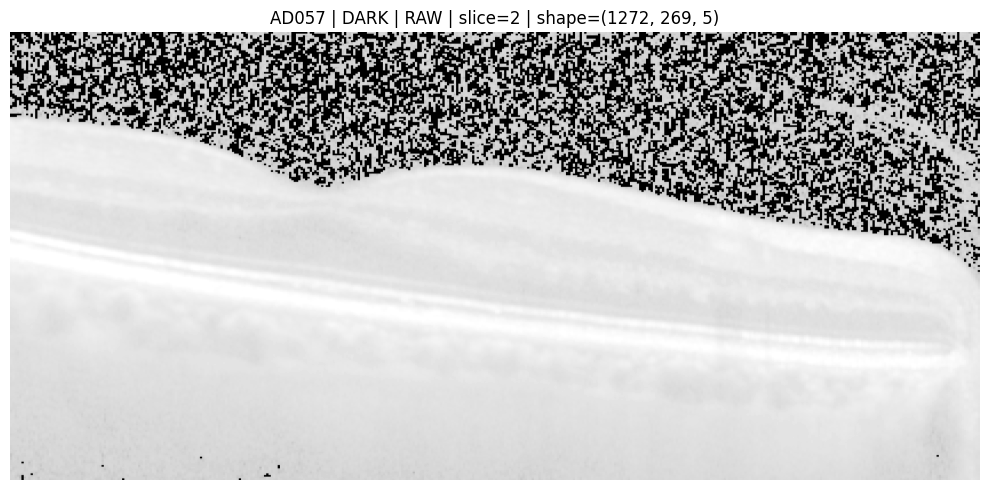

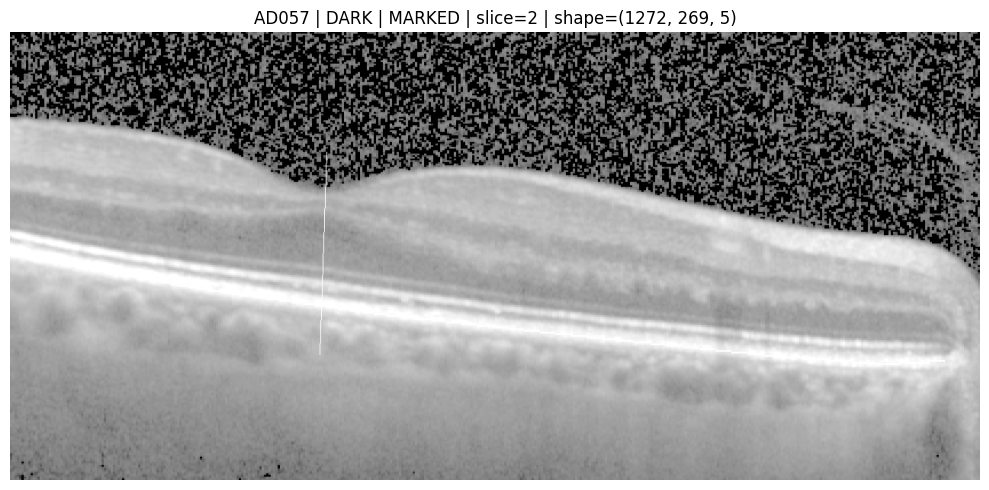

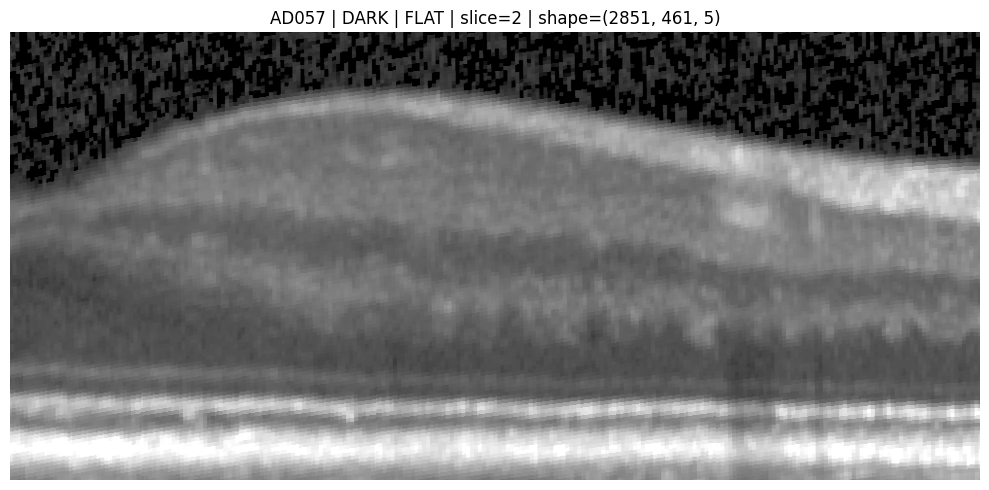

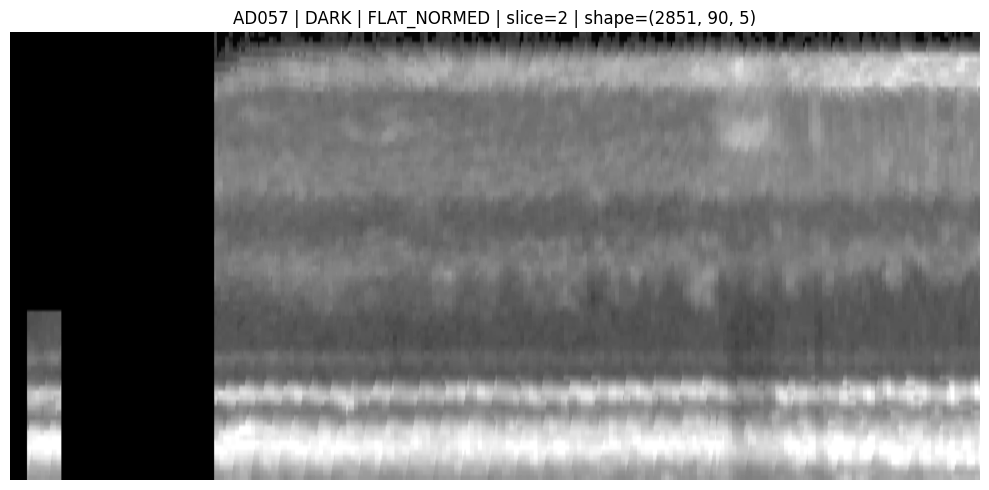


VISUALIZATION — CONTROL EXAMPLE

Displaying CO015 DARK, slice index 2


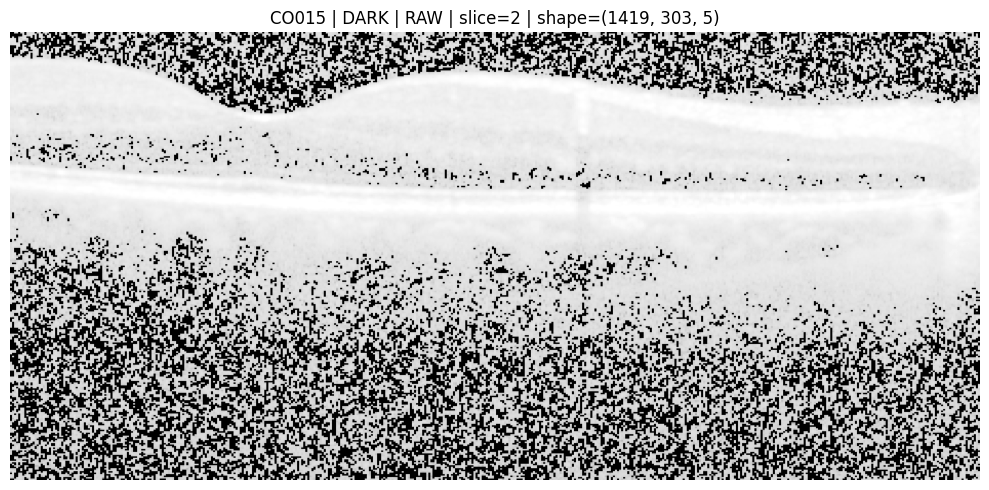

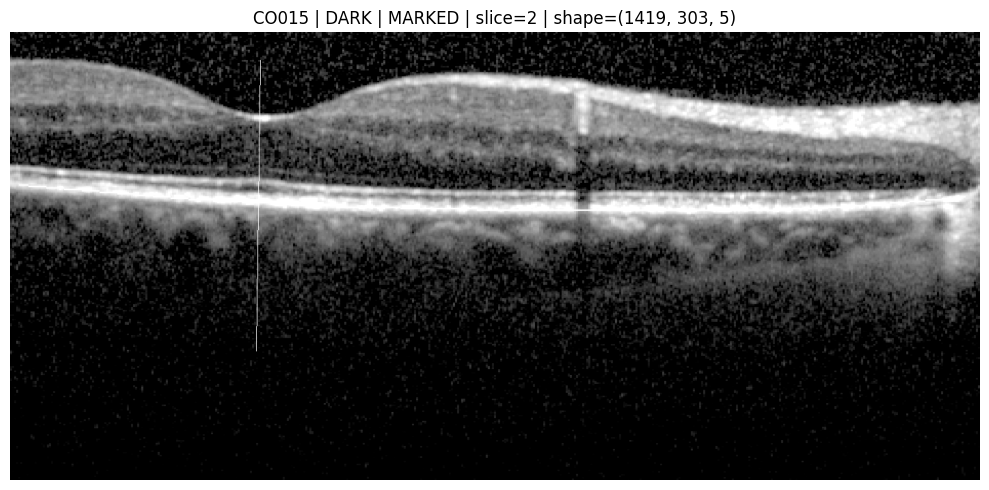

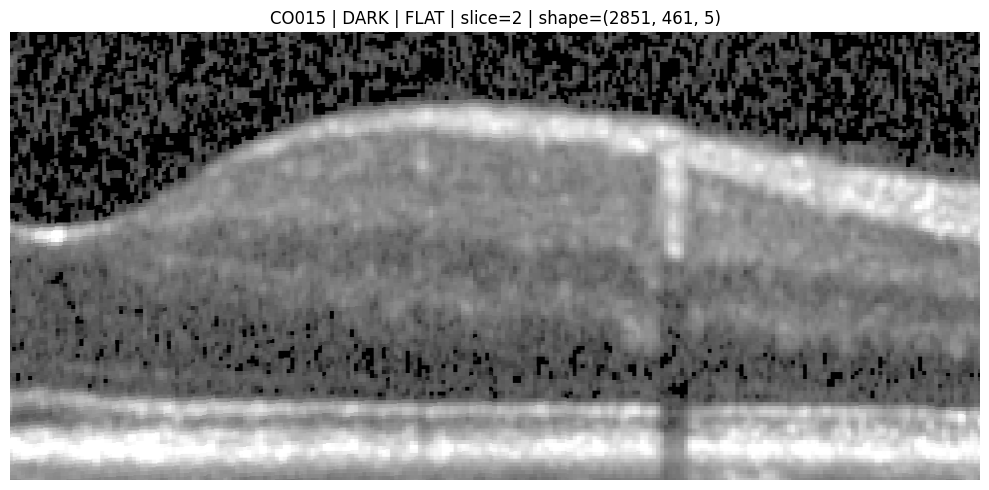

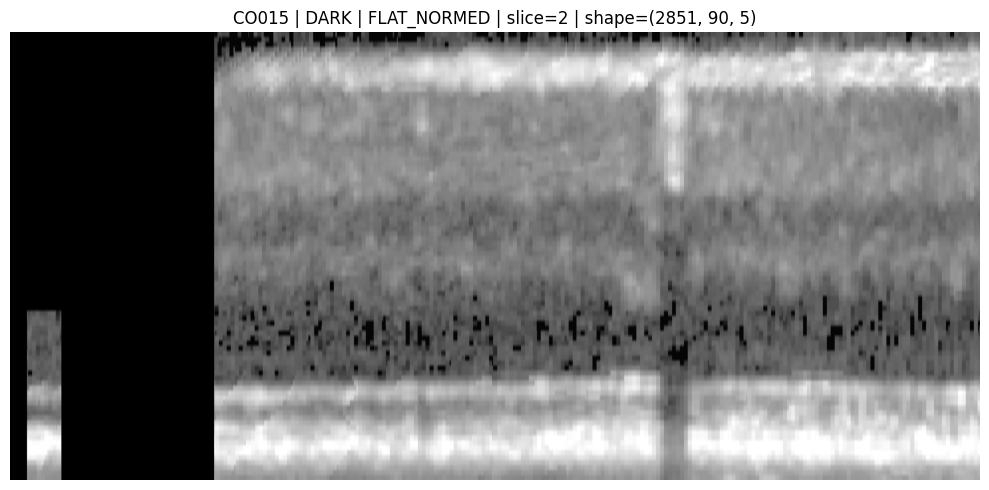


VISUALIZATION — FOUR-SLICE EXAMPLE

Displaying AD508 LIGHT, slice index 2


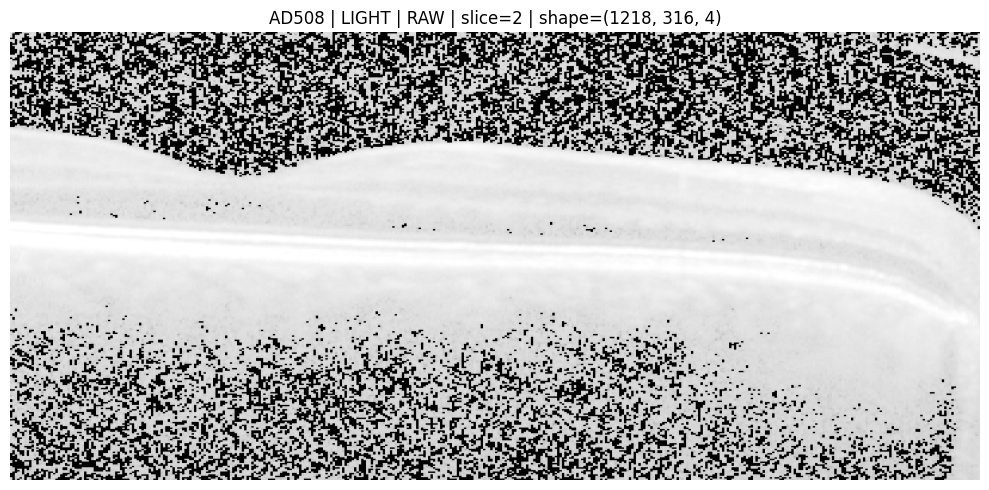

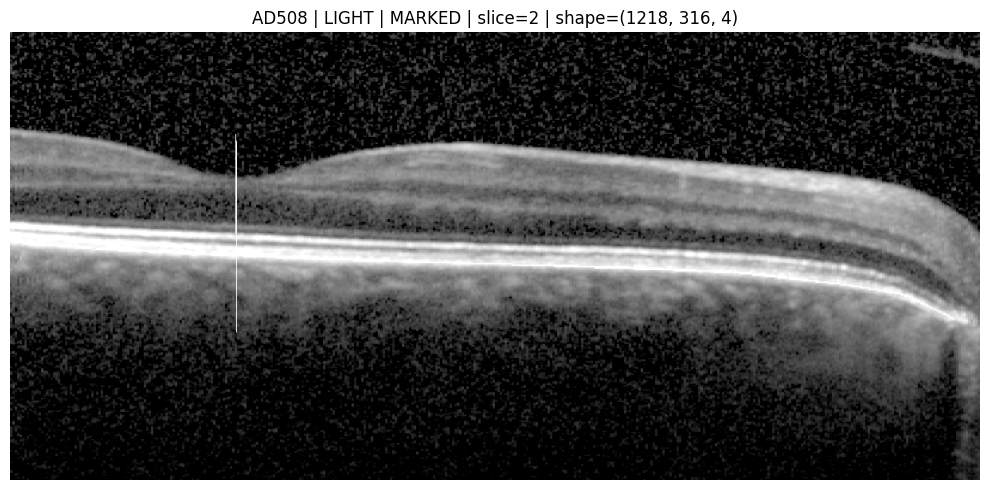

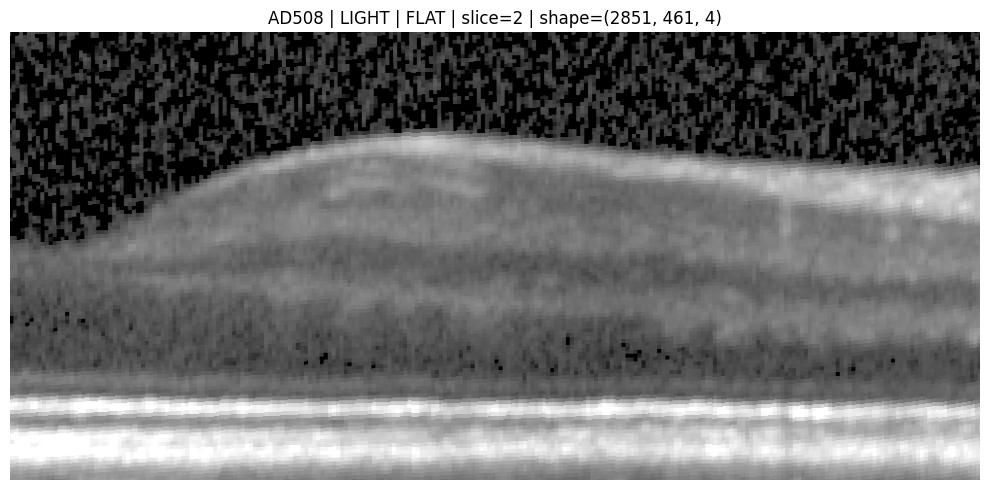

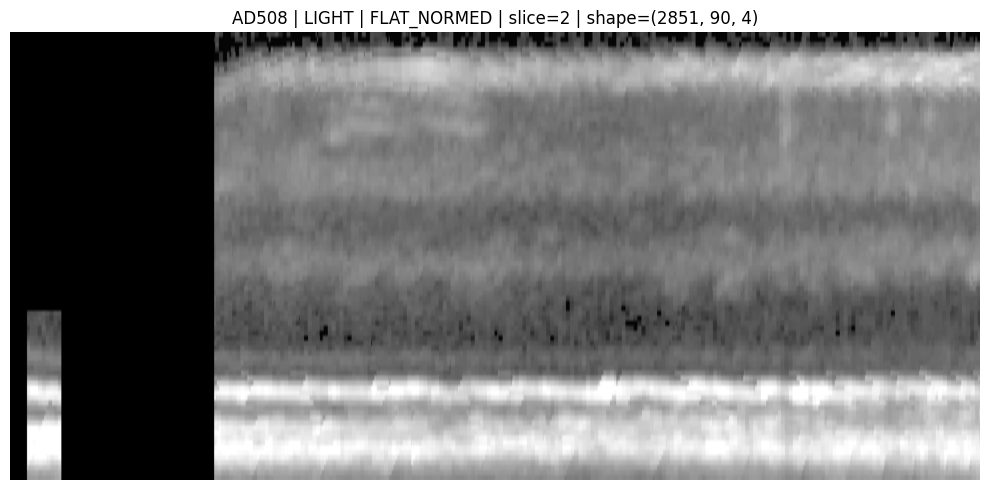


MANUAL MARKER AUDIT
subject class_name condition  n_slices  n_pixels_gt230
  AD057  Alzheimer      DARK         5           11076
  AD057  Alzheimer     LIGHT         5            6799
  AD362  Alzheimer      DARK         5           11695
  AD362  Alzheimer     LIGHT         5            7094
  AD387  Alzheimer      DARK         5           10525
  AD387  Alzheimer     LIGHT         5            6215
  AD414  Alzheimer      DARK         5           10621
  AD414  Alzheimer     LIGHT         5            6491
  AD439  Alzheimer      DARK         5           10756
  AD439  Alzheimer     LIGHT         5            6517
  AD443  Alzheimer      DARK         5           11742
  AD443  Alzheimer     LIGHT         4            5453
  AD459  Alzheimer      DARK         5           11474
  AD459  Alzheimer     LIGHT         5            6508
  AD508  Alzheimer      DARK         5           11147
  AD508  Alzheimer     LIGHT         4            5236
  AD613  Alzheimer      DARK         5      

In [4]:
# ============================================================
# CELL 4 — OCT CONTENT INSPECTION + 1120/1100 DISCREPANCY AUDIT
#
# Goals:
#   1. Inspect exclusions for the five 4-slice acquisitions
#   2. Search for alternate copies of missing slices
#   3. Correctly load Analyze 7.5 .hdr/.img volumes
#   4. Visualize RAW / MARKED / FLAT / FLAT_NORMED
#   5. Inspect intensity statistics
#   6. Determine what should actually enter the ML pipeline
#
# NO TRAINING
# NO DATA MODIFICATION
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import struct
import re
import warnings

warnings.filterwarnings("ignore")

# ------------------------------------------------------------
# 1. PATHS
# ------------------------------------------------------------

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

INNER_ROOT = (
    DATA_ROOT /
    "[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]"
)

OUTPUT_DIR = DATA_ROOT / "_paper_reproduction"

AUDIT_CSV = (
    OUTPUT_DIR /
    "all_224_volume_variant_audit.csv"
)

assert AUDIT_CSV.exists(), (
    f"Audit CSV not found:\n{AUDIT_CSV}"
)

variant_df = pd.read_csv(AUDIT_CSV)

print("=" * 100)
print("CELL 4 — OCT CONTENT + MISSING-SLICE AUDIT")
print("=" * 100)


# ============================================================
# 2. IDENTIFY THE FIVE BASE ACQUISITIONS WITH FOUR SLICES
# ============================================================

non_five = variant_df[
    variant_df["n_slices"] != 5
].copy()

problem_acquisitions = (
    non_five[
        [
            "folder_subject",
            "file_subject",
            "class_name",
            "condition"
        ]
    ]
    .drop_duplicates()
    .reset_index(drop=True)
)

print("\n" + "=" * 100)
print("BASE ACQUISITIONS WITH <5 B-SCANS")
print("=" * 100)

print(
    problem_acquisitions.to_string(index=False)
)

print(
    "\nNumber of affected base acquisitions:",
    len(problem_acquisitions)
)


# ============================================================
# 3. READ EXCLUSION FILES
# ============================================================

print("\n" + "=" * 100)
print("EXCLUSION FILE CONTENTS")
print("=" * 100)

for _, row in problem_acquisitions.iterrows():

    folder_subject = row["folder_subject"]
    file_subject = row["file_subject"]
    condition = row["condition"]

    folder = INNER_ROOT / folder_subject

    print("\n" + "-" * 100)
    print(
        f"{folder_subject} | file ID={file_subject} | "
        f"{condition}"
    )
    print("-" * 100)

    exclusion_files = sorted(
        folder.glob("*exclusion*.txt")
    )

    if not exclusion_files:
        print("No exclusion text file found.")
    else:

        for exclusion_file in exclusion_files:

            print(
                f"\nFILE: {exclusion_file.name}"
            )

            try:
                text = exclusion_file.read_text(
                    encoding="utf-8",
                    errors="replace"
                )

                print(text)

            except Exception as e:
                print(
                    "Could not read exclusion file:",
                    e
                )


# ============================================================
# 4. ANALYZE HEADER READER
# ============================================================

ANALYZE_DTYPES = {
    2: np.uint8,
    4: np.int16,
    8: np.int32,
    16: np.float32,
    64: np.float64,
    256: np.int8,
    512: np.uint16,
    768: np.uint32,
    1024: np.int64,
    1280: np.uint64,
}


def read_analyze_header(hdr_path):

    hdr_path = Path(hdr_path)

    with open(hdr_path, "rb") as f:
        header = f.read(348)

    if len(header) != 348:
        raise ValueError(
            f"Expected 348-byte header: {hdr_path}"
        )

    little = struct.unpack(
        "<i", header[0:4]
    )[0]

    big = struct.unpack(
        ">i", header[0:4]
    )[0]

    if little == 348:
        endian = "<"
    elif big == 348:
        endian = ">"
    else:
        raise ValueError(
            "Cannot determine Analyze byte order."
        )

    dims = struct.unpack(
        endian + "8h",
        header[40:56]
    )

    n_dims = int(dims[0])

    shape = tuple(
        int(x)
        for x in dims[1:n_dims + 1]
    )

    datatype_code = struct.unpack(
        endian + "h",
        header[70:72]
    )[0]

    bitpix = struct.unpack(
        endian + "h",
        header[72:74]
    )[0]

    return {
        "shape": shape,
        "datatype_code": datatype_code,
        "bitpix": bitpix,
        "endian": endian
    }


# ============================================================
# 5. COMPLETE ANALYZE VOLUME LOADER
# ============================================================

def load_analyze_volume(hdr_path):

    hdr_path = Path(hdr_path)
    img_path = hdr_path.with_suffix(".img")

    info = read_analyze_header(hdr_path)

    datatype_code = info["datatype_code"]

    if datatype_code not in ANALYZE_DTYPES:
        raise ValueError(
            f"Unsupported datatype code: "
            f"{datatype_code}"
        )

    base_dtype = ANALYZE_DTYPES[
        datatype_code
    ]

    endian = info["endian"]

    dtype = np.dtype(base_dtype).newbyteorder(
        endian
    )

    data = np.fromfile(
        img_path,
        dtype=dtype
    )

    expected = int(
        np.prod(info["shape"])
    )

    if data.size != expected:
        raise ValueError(
            f"{img_path.name}: expected "
            f"{expected} values, got {data.size}"
        )

    # Analyze/NIfTI uses first dimension as
    # fastest-changing spatial dimension.
    volume = data.reshape(
        info["shape"],
        order="F"
    )

    # Remove singleton dimensions
    volume = np.squeeze(volume)

    return volume


# ============================================================
# 6. LOOK FOR ALTERNATIVE FILES IN THE FIVE PROBLEM SUBJECTS
# ============================================================

print("\n" + "=" * 100)
print("ALTERNATIVE HDR FILES IN PROBLEM SUBJECTS")
print("=" * 100)

for _, row in problem_acquisitions.iterrows():

    folder_subject = row["folder_subject"]
    file_subject = row["file_subject"]
    condition = row["condition"]

    folder = INNER_ROOT / folder_subject

    print("\n" + "-" * 100)
    print(
        f"{folder_subject} / {condition}"
    )
    print("-" * 100)

    candidates = sorted(
        [
            p for p in folder.glob("*.hdr")
            if condition.upper()
            in p.name.upper()
        ]
    )

    for hdr_path in candidates:

        try:

            info = read_analyze_header(
                hdr_path
            )

            useful_shape = tuple(
                x for x in info["shape"]
                if x > 1
            )

            print(
                f"{hdr_path.name:45s} "
                f"shape={useful_shape}"
            )

        except Exception as e:

            print(
                f"{hdr_path.name:45s} "
                f"ERROR={e}"
            )


# ============================================================
# 7. HELPER TO LOCATE FOUR REPRESENTATIONS
# ============================================================

def find_subject_file_id(folder):

    raw_dark = [
        p for p in folder.glob("*_DARK.hdr")
        if not p.name.startswith("_")
        and "MARKED" not in p.name.upper()
        and "-DIM" not in p.name.upper()
    ]

    if raw_dark:
        return raw_dark[0].stem.split(
            "_DARK"
        )[0]

    raw_light = [
        p for p in folder.glob("*_LIGHT.hdr")
        if not p.name.startswith("_")
        and "MARKED" not in p.name.upper()
        and "-DIM" not in p.name.upper()
    ]

    if raw_light:
        return raw_light[0].stem.split(
            "_LIGHT"
        )[0]

    raise RuntimeError(
        f"Cannot determine subject file ID: "
        f"{folder}"
    )


def get_representation_paths(
    folder_subject,
    condition="DARK"
):

    folder = INNER_ROOT / folder_subject

    file_subject = find_subject_file_id(
        folder
    )

    paths = {
        "RAW":
            folder /
            f"{file_subject}_{condition}.hdr",

        "MARKED":
            folder /
            f"{file_subject}_{condition}_MARKED.hdr",

        "FLAT":
            folder /
            f"_flat_{file_subject}_{condition}.hdr",

        "FLAT_NORMED":
            folder /
            f"_flat-normed_{file_subject}_{condition}.hdr"
    }

    return paths


# ============================================================
# 8. INTENSITY NORMALIZATION — DISPLAY ONLY
# ============================================================

def normalize_for_display(image):

    image = np.asarray(
        image,
        dtype=np.float32
    )

    finite = np.isfinite(image)

    if not finite.any():
        return np.zeros_like(image)

    values = image[finite]

    low = np.percentile(
        values,
        1
    )

    high = np.percentile(
        values,
        99
    )

    if high <= low:
        low = values.min()
        high = values.max()

    if high <= low:
        return np.zeros_like(image)

    image = np.clip(
        image,
        low,
        high
    )

    image = (
        image - low
    ) / (
        high - low + 1e-8
    )

    return image


# ============================================================
# 9. PRINT INTENSITY STATISTICS
# ============================================================

def print_volume_statistics(
    folder_subject,
    condition="DARK"
):

    print("\n" + "=" * 100)
    print(
        f"INTENSITY STATISTICS — "
        f"{folder_subject} {condition}"
    )
    print("=" * 100)

    paths = get_representation_paths(
        folder_subject,
        condition
    )

    for representation, hdr_path in paths.items():

        volume = load_analyze_volume(
            hdr_path
        )

        finite = volume[
            np.isfinite(volume)
        ]

        print(
            f"\n{representation}"
        )

        print(
            "  shape      :",
            volume.shape
        )

        print(
            "  dtype      :",
            volume.dtype
        )

        print(
            "  min        :",
            float(np.min(finite))
        )

        print(
            "  max        :",
            float(np.max(finite))
        )

        print(
            "  mean       :",
            float(np.mean(finite))
        )

        print(
            "  std        :",
            float(np.std(finite))
        )

        print(
            "  p1         :",
            float(np.percentile(
                finite, 1
            ))
        )

        print(
            "  p99        :",
            float(np.percentile(
                finite, 99
            ))
        )

        if representation == "MARKED":

            unique_high = np.unique(
                finite[
                    finite > 230
                ]
            )

            print(
                "  manual-marker values >230:",
                unique_high.tolist()
            )

            print(
                "  number pixels >230:",
                int(
                    np.sum(
                        finite > 230
                    )
                )
            )


# Representative Alzheimer
print_volume_statistics(
    "AD057",
    "DARK"
)

# Representative Control
print_volume_statistics(
    "CO015",
    "DARK"
)


# ============================================================
# 10. VISUALIZE THE FOUR REPRESENTATIONS
# ============================================================

def visualize_representations(
    folder_subject,
    condition="DARK"
):

    paths = get_representation_paths(
        folder_subject,
        condition
    )

    volumes = {}

    for representation, hdr_path in paths.items():

        volumes[
            representation
        ] = load_analyze_volume(
            hdr_path
        )

    # Use corresponding central B-scan
    minimum_slices = min(
        v.shape[2]
        for v in volumes.values()
    )

    slice_idx = (
        minimum_slices // 2
    )

    print(
        f"\nDisplaying {folder_subject} "
        f"{condition}, slice index "
        f"{slice_idx}"
    )

    for representation in [
        "RAW",
        "MARKED",
        "FLAT",
        "FLAT_NORMED"
    ]:

        volume = volumes[
            representation
        ]

        image = volume[
            :, :, slice_idx
        ]

        image = normalize_for_display(
            image
        )

        plt.figure(
            figsize=(10, 5)
        )

        plt.imshow(
            image.T,
            cmap="gray",
            origin="lower",
            aspect="auto"
        )

        plt.title(
            f"{folder_subject} | "
            f"{condition} | "
            f"{representation} | "
            f"slice={slice_idx} | "
            f"shape={volume.shape}"
        )

        plt.axis("off")
        plt.tight_layout()
        plt.show()


print("\n" + "=" * 100)
print("VISUALIZATION — ALZHEIMER EXAMPLE")
print("=" * 100)

visualize_representations(
    "AD057",
    "DARK"
)


print("\n" + "=" * 100)
print("VISUALIZATION — CONTROL EXAMPLE")
print("=" * 100)

visualize_representations(
    "CO015",
    "DARK"
)


# ============================================================
# 11. VISUALIZE A 4-SLICE ACQUISITION
# ============================================================

print("\n" + "=" * 100)
print("VISUALIZATION — FOUR-SLICE EXAMPLE")
print("=" * 100)

visualize_representations(
    "AD508",
    "LIGHT"
)


# ============================================================
# 12. COUNT MANUAL MARKINGS ACROSS ALL MARKED VOLUMES
# ============================================================

print("\n" + "=" * 100)
print("MANUAL MARKER AUDIT")
print("=" * 100)

marker_records = []

for folder in sorted(
    [
        p for p in INNER_ROOT.iterdir()
        if p.is_dir()
        and re.match(
            r"^(AD|CO)\d+$",
            p.name
        )
    ]
):

    folder_subject = folder.name
    file_subject = find_subject_file_id(
        folder
    )

    class_name = (
        "Alzheimer"
        if folder_subject.startswith("AD")
        else "Control"
    )

    for condition in [
        "DARK",
        "LIGHT"
    ]:

        hdr_path = (
            folder /
            f"{file_subject}_{condition}_MARKED.hdr"
        )

        volume = load_analyze_volume(
            hdr_path
        )

        n_marked = int(
            np.sum(
                volume > 230
            )
        )

        marker_records.append({
            "subject": folder_subject,
            "class_name": class_name,
            "condition": condition,
            "n_slices": volume.shape[2],
            "n_pixels_gt230": n_marked
        })


marker_df = pd.DataFrame(
    marker_records
)

print(
    marker_df.to_string(
        index=False
    )
)

print("\nMarker pixel summary by class:")

print(
    marker_df
    .groupby("class_name")[
        "n_pixels_gt230"
    ]
    .describe()
)


# ============================================================
# 13. SAVE MARKER AUDIT
# ============================================================

marker_csv = (
    OUTPUT_DIR /
    "manual_marker_audit.csv"
)

marker_df.to_csv(
    marker_csv,
    index=False
)

print("\nSaved:")
print(marker_csv)


# ============================================================
# 14. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 100)
print("CELL 4 COMPLETE")
print("=" * 100)

print(
    "\nImportant:\n"
    "1. Do NOT create synthetic/duplicate slices.\n"
    "2. Do NOT resize to 50x50 yet.\n"
    "3. Do NOT train KAN/CNN yet.\n"
    "4. Send me the text output plus tell me whether "
    "the displayed OCT images look anatomically correct."
)

In [5]:
# ============================================================
# CELL 5 — BUILD PAPER-STYLE 50x50 OCT DATASET
#
# INCLUDED:
#   AD + Control
#   DARK + LIGHT
#   RAW + MARKED + FLAT + FLAT_NORMED
#   ALL available 2-D slices
#
# NO DEDUPLICATION
# NO SYNTHETIC REPLACEMENT OF MISSING SLICES
#
# Expected actual total from archive: 1100 images
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import struct
import re
from PIL import Image
from collections import Counter

# ------------------------------------------------------------
# 1. PATHS
# ------------------------------------------------------------

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

INNER_ROOT = (
    DATA_ROOT /
    "[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]"
)

OUTPUT_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

print("=" * 90)
print("CELL 5 — BUILD 50x50 AD OCT DATASET")
print("=" * 90)


# ============================================================
# 2. ANALYZE FORMAT SUPPORT
# ============================================================

ANALYZE_DTYPES = {
    2: np.uint8,
    4: np.int16,
    8: np.int32,
    16: np.float32,
    64: np.float64,
    256: np.int8,
    512: np.uint16,
    768: np.uint32,
    1024: np.int64,
    1280: np.uint64,
}


def read_analyze_header(hdr_path):

    hdr_path = Path(hdr_path)

    with open(hdr_path, "rb") as f:
        header = f.read(348)

    if len(header) != 348:
        raise ValueError(
            f"Invalid Analyze header: {hdr_path}"
        )

    little = struct.unpack(
        "<i",
        header[0:4]
    )[0]

    big = struct.unpack(
        ">i",
        header[0:4]
    )[0]

    if little == 348:
        endian = "<"

    elif big == 348:
        endian = ">"

    else:
        raise ValueError(
            f"Cannot determine endian: {hdr_path}"
        )

    dims = struct.unpack(
        endian + "8h",
        header[40:56]
    )

    n_dims = int(dims[0])

    shape = tuple(
        int(x)
        for x in dims[1:n_dims + 1]
    )

    datatype_code = struct.unpack(
        endian + "h",
        header[70:72]
    )[0]

    bitpix = struct.unpack(
        endian + "h",
        header[72:74]
    )[0]

    return {
        "shape": shape,
        "datatype_code": datatype_code,
        "bitpix": bitpix,
        "endian": endian
    }


def load_analyze_volume(hdr_path):

    hdr_path = Path(hdr_path)

    img_path = hdr_path.with_suffix(
        ".img"
    )

    info = read_analyze_header(
        hdr_path
    )

    dtype_code = info[
        "datatype_code"
    ]

    if dtype_code not in ANALYZE_DTYPES:
        raise ValueError(
            f"Unsupported Analyze datatype "
            f"{dtype_code}: {hdr_path}"
        )

    dtype = np.dtype(
        ANALYZE_DTYPES[dtype_code]
    ).newbyteorder(
        info["endian"]
    )

    data = np.fromfile(
        img_path,
        dtype=dtype
    )

    expected = int(
        np.prod(
            info["shape"]
        )
    )

    if data.size != expected:
        raise RuntimeError(
            f"{img_path.name}: "
            f"expected {expected}, "
            f"found {data.size}"
        )

    volume = data.reshape(
        info["shape"],
        order="F"
    )

    volume = np.squeeze(
        volume
    )

    if volume.ndim != 3:
        raise RuntimeError(
            f"Expected 3-D volume, "
            f"got {volume.shape}: {hdr_path}"
        )

    return volume


# ============================================================
# 3. NORMALIZATION
# ============================================================

def normalize_slice(image):
    """
    Converts any representation to float32 [0,1].

    Uses finite min/max scaling PER IMAGE.
    """

    image = np.asarray(
        image,
        dtype=np.float32
    )

    image = np.nan_to_num(
        image,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    minimum = float(
        image.min()
    )

    maximum = float(
        image.max()
    )

    if maximum <= minimum:
        return np.zeros_like(
            image,
            dtype=np.float32
        )

    image = (
        image - minimum
    ) / (
        maximum - minimum
    )

    return image.astype(
        np.float32
    )


# ============================================================
# 4. RESIZE TO 50 × 50
# ============================================================

def resize_50x50(image):

    image = normalize_slice(
        image
    )

    # Convert [0,1] to uint8 temporarily
    image_uint8 = np.clip(
        image * 255.0,
        0,
        255
    ).astype(
        np.uint8
    )

    pil_image = Image.fromarray(
        image_uint8,
        mode="L"
    )

    # Bilinear resizing
    pil_image = pil_image.resize(
        (50, 50),
        resample=Image.BILINEAR
    )

    resized = np.asarray(
        pil_image,
        dtype=np.float32
    ) / 255.0

    return resized


# ============================================================
# 5. SUBJECT IDENTIFICATION
# ============================================================

subject_pattern = re.compile(
    r"^(AD|CO)(\d+)$",
    re.IGNORECASE
)

subject_folders = []

for folder in sorted(
    INNER_ROOT.iterdir()
):

    if not folder.is_dir():
        continue

    match = subject_pattern.match(
        folder.name
    )

    if match is None:
        continue

    group = match.group(1).upper()

    subject_folders.append(
        folder
    )


print(
    f"\nAD/Control participants found: "
    f"{len(subject_folders)}"
)


# ============================================================
# 6. HANDLE AD443 / AD433 NAMING ISSUE
# ============================================================

def get_file_subject_id(folder):

    candidates = [
        p for p in folder.glob(
            "*_DARK.hdr"
        )
        if not p.name.startswith("_")
        and "MARKED" not in p.name.upper()
        and "-DIM" not in p.name.upper()
    ]

    if not candidates:

        candidates = [
            p for p in folder.glob(
                "*_LIGHT.hdr"
            )
            if not p.name.startswith("_")
            and "MARKED" not in p.name.upper()
            and "-DIM" not in p.name.upper()
        ]

    if not candidates:
        raise RuntimeError(
            f"Cannot determine file ID: "
            f"{folder}"
        )

    stem = candidates[0].stem

    return (
        stem
        .replace("_DARK", "")
        .replace("_LIGHT", "")
    )


# ============================================================
# 7. FOUR REPRESENTATION PATHS
# ============================================================

REPRESENTATIONS = [
    "RAW",
    "MARKED",
    "FLAT",
    "FLAT_NORMED"
]

CONDITIONS = [
    "DARK",
    "LIGHT"
]


def make_hdr_path(
    folder,
    file_subject,
    condition,
    representation
):

    if representation == "RAW":

        filename = (
            f"{file_subject}_"
            f"{condition}.hdr"
        )

    elif representation == "MARKED":

        filename = (
            f"{file_subject}_"
            f"{condition}_MARKED.hdr"
        )

    elif representation == "FLAT":

        filename = (
            f"_flat_"
            f"{file_subject}_"
            f"{condition}.hdr"
        )

    elif representation == "FLAT_NORMED":

        filename = (
            f"_flat-normed_"
            f"{file_subject}_"
            f"{condition}.hdr"
        )

    else:
        raise ValueError(
            representation
        )

    return folder / filename


# ============================================================
# 8. BUILD DATASET
# ============================================================

images = []
labels = []
metadata = []

volume_counter = 0
slice_counter = 0


for folder in subject_folders:

    folder_subject = folder.name

    group = (
        "AD"
        if folder_subject.startswith("AD")
        else "CO"
    )

    label = (
        1
        if group == "AD"
        else 0
    )

    class_name = (
        "Alzheimer"
        if label == 1
        else "Control"
    )

    file_subject = get_file_subject_id(
        folder
    )

    for condition in CONDITIONS:

        for representation in REPRESENTATIONS:

            hdr_path = make_hdr_path(
                folder=folder,
                file_subject=file_subject,
                condition=condition,
                representation=representation
            )

            if not hdr_path.exists():
                raise FileNotFoundError(
                    hdr_path
                )

            volume = load_analyze_volume(
                hdr_path
            )

            volume_counter += 1

            n_slices = volume.shape[2]

            for slice_index in range(
                n_slices
            ):

                image = volume[
                    :,
                    :,
                    slice_index
                ]

                image_50 = resize_50x50(
                    image
                )

                images.append(
                    image_50
                )

                labels.append(
                    label
                )

                metadata.append({
                    "dataset_index":
                        slice_counter,

                    "folder_subject":
                        folder_subject,

                    "file_subject":
                        file_subject,

                    "class_name":
                        class_name,

                    "label":
                        label,

                    "condition":
                        condition,

                    "representation":
                        representation,

                    "slice_index":
                        slice_index,

                    "original_height":
                        image.shape[0],

                    "original_width":
                        image.shape[1],

                    "hdr_file":
                        hdr_path.name
                })

                slice_counter += 1


# ============================================================
# 9. STACK ARRAYS
# ============================================================

X = np.stack(
    images,
    axis=0
).astype(
    np.float32
)

y = np.asarray(
    labels,
    dtype=np.int64
)

metadata_df = pd.DataFrame(
    metadata
)


# ============================================================
# 10. VALIDATION
# ============================================================

print("\n" + "=" * 90)
print("FINAL DATASET")
print("=" * 90)

print(
    "Volumes processed :",
    volume_counter
)

print(
    "Images generated  :",
    len(X)
)

print(
    "X shape           :",
    X.shape
)

print(
    "y shape           :",
    y.shape
)

print(
    "dtype             :",
    X.dtype
)

print(
    "Pixel minimum     :",
    X.min()
)

print(
    "Pixel maximum     :",
    X.max()
)


print("\nClass distribution:")

for label_value in sorted(
    np.unique(y)
):

    count = int(
        np.sum(
            y == label_value
        )
    )

    name = (
        "Control"
        if label_value == 0
        else "Alzheimer"
    )

    print(
        f"  {name:10s}: "
        f"{count}"
    )


print("\nRepresentation distribution:")

print(
    metadata_df[
        "representation"
    ].value_counts()
)


print("\nCondition distribution:")

print(
    metadata_df[
        "condition"
    ].value_counts()
)


print("\nClass × representation:")

print(
    pd.crosstab(
        metadata_df[
            "class_name"
        ],
        metadata_df[
            "representation"
        ]
    )
)


# ============================================================
# 11. VERIFY EXPECTED 1100
# ============================================================

assert len(X) == 1100, (
    f"Expected 1100 actual slices, "
    f"but generated {len(X)}"
)

assert X.shape[1:] == (
    50,
    50
), X.shape

assert np.isfinite(
    X
).all()

assert X.min() >= 0.0
assert X.max() <= 1.0


# ============================================================
# 12. SAVE NPZ
# ============================================================

npz_path = (
    OUTPUT_DIR /
    "AD_OCT_paperstyle_1100_50x50.npz"
)

np.savez_compressed(
    npz_path,
    X=X,
    y=y
)


# ============================================================
# 13. SAVE METADATA
# ============================================================

metadata_path = (
    OUTPUT_DIR /
    "AD_OCT_paperstyle_1100_metadata.csv"
)

metadata_df.to_csv(
    metadata_path,
    index=False
)


# ============================================================
# 14. SAVE CLASS COUNTS
# ============================================================

summary_path = (
    OUTPUT_DIR /
    "AD_OCT_paperstyle_summary.txt"
)

with open(
    summary_path,
    "w"
) as f:

    f.write(
        "Alzheimer OCT paper-style dataset\n"
    )

    f.write(
        "=" * 60 + "\n"
    )

    f.write(
        f"Images: {len(X)}\n"
    )

    f.write(
        f"Shape: {X.shape}\n"
    )

    f.write(
        f"Control: {int((y == 0).sum())}\n"
    )

    f.write(
        f"Alzheimer: {int((y == 1).sum())}\n"
    )

    f.write(
        "Included representations: "
        "RAW, MARKED, FLAT, FLAT_NORMED\n"
    )

    f.write(
        "Included conditions: DARK, LIGHT\n"
    )

    f.write(
        "Deduplication: NONE\n"
    )


print("\n" + "=" * 90)
print("FILES SAVED")
print("=" * 90)

print(
    "\nDataset:"
)
print(npz_path)

print(
    "\nMetadata:"
)
print(metadata_path)

print(
    "\nSummary:"
)
print(summary_path)


print("\n" + "=" * 90)
print("CELL 5 COMPLETE")
print("=" * 90)

CELL 5 — BUILD 50x50 AD OCT DATASET

AD/Control participants found: 28

FINAL DATASET
Volumes processed : 224
Images generated  : 1100
X shape           : (1100, 50, 50)
y shape           : (1100,)
dtype             : float32
Pixel minimum     : 0.0
Pixel maximum     : 1.0

Class distribution:
  Control   : 548
  Alzheimer : 552

Representation distribution:
representation
RAW            275
MARKED         275
FLAT           275
FLAT_NORMED    275
Name: count, dtype: int64

Condition distribution:
condition
DARK     556
LIGHT    544
Name: count, dtype: int64

Class × representation:
representation  FLAT  FLAT_NORMED  MARKED  RAW
class_name                                    
Alzheimer        138          138     138  138
Control          137          137     137  137

FILES SAVED

Dataset:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\AD_OCT_paperstyle_1100_50x50.npz

Metadata:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\AD_OCT_paperstyle_1100_metadata.c

In [6]:
# ============================================================
# CELL 6 — KAN ENVIRONMENT + MODEL SANITY CHECK
# Alzheimer OCT paper reproduction
#
# Paper configuration:
#   Input          : 50x50 grayscale = 2500 features
#   KAN layers     : 3 transformations
#   Hidden units   : 72
#   Grid size      : 11
#   Spline order   : 3
#   Base activation: GELU
#
# Architecture used here:
#   2500 -> 72 -> 72 -> 1
#
# NO TRAINING IN THIS CELL
# ============================================================

from pathlib import Path
import sys
import subprocess
import importlib
import random
import numpy as np
import pandas as pd

# ------------------------------------------------------------
# 1. CHECK / INSTALL PYKAN
# ------------------------------------------------------------

try:
    from kan.KANLayer import KANLayer
    print("✓ pykan already installed")

except Exception as first_error:

    print("pykan not available.")
    print("Installing official 'pykan' package...\n")

    subprocess.check_call(
        [
            sys.executable,
            "-m",
            "pip",
            "install",
            "pykan"
        ]
    )

    importlib.invalidate_caches()

    from kan.KANLayer import KANLayer

    print("\n✓ pykan installed successfully")


# ------------------------------------------------------------
# 2. TORCH / SKLEARN IMPORTS
# ------------------------------------------------------------

import torch
import torch.nn as nn

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    roc_auc_score,
    f1_score,
    confusion_matrix,
    balanced_accuracy_score,
    matthews_corrcoef
)


# ------------------------------------------------------------
# 3. REPRODUCIBILITY
# ------------------------------------------------------------

SEED = 2026

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

# Reproducibility settings
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


# ------------------------------------------------------------
# 4. DEVICE
# ------------------------------------------------------------

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

print("\n" + "=" * 90)
print("RUNTIME ENVIRONMENT")
print("=" * 90)

print("Python      :", sys.version.split()[0])
print("PyTorch     :", torch.__version__)
print("Device      :", DEVICE)

if torch.cuda.is_available():

    print(
        "GPU         :",
        torch.cuda.get_device_name(0)
    )

    total_mem = (
        torch.cuda.get_device_properties(0)
        .total_memory
        / (1024 ** 3)
    )

    print(
        f"GPU memory  : {total_mem:.2f} GB"
    )


# ------------------------------------------------------------
# 5. LOAD CELL-5 DATASET
# ------------------------------------------------------------

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

OUTPUT_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

NPZ_PATH = (
    OUTPUT_DIR /
    "AD_OCT_paperstyle_1100_50x50.npz"
)

META_PATH = (
    OUTPUT_DIR /
    "AD_OCT_paperstyle_1100_metadata.csv"
)

assert NPZ_PATH.exists(), NPZ_PATH
assert META_PATH.exists(), META_PATH

loaded = np.load(
    NPZ_PATH
)

X = loaded["X"].astype(
    np.float32
)

y = loaded["y"].astype(
    np.int64
)

metadata = pd.read_csv(
    META_PATH
)


# ------------------------------------------------------------
# 6. DATA VALIDATION
# ------------------------------------------------------------

print("\n" + "=" * 90)
print("DATASET VALIDATION")
print("=" * 90)

print("X shape     :", X.shape)
print("y shape     :", y.shape)

print(
    "Control     :",
    int((y == 0).sum())
)

print(
    "Alzheimer   :",
    int((y == 1).sum())
)

print(
    "Pixel range :",
    float(X.min()),
    "to",
    float(X.max())
)

assert X.shape == (
    1100,
    50,
    50
)

assert y.shape == (
    1100,
)

assert np.isfinite(
    X
).all()

assert X.min() >= 0
assert X.max() <= 1


# ------------------------------------------------------------
# 7. FLATTEN FOR KAN
#
# 50 x 50 = 2500
# ------------------------------------------------------------

X_flat = X.reshape(
    len(X),
    -1
).astype(
    np.float32
)

print(
    "\nKAN input shape:",
    X_flat.shape
)

assert X_flat.shape == (
    1100,
    2500
)


# ============================================================
# 8. PAPER-STYLE KAN
#
# We directly use the official KANLayer implementation so
# we can provide nn.GELU() as the fixed/base activation.
#
# Architecture:
#
# 2500 -> 72 -> 72 -> 1
#
# grid = 11
# spline order = 3
# GELU
# ============================================================

class AlzheimerKAN(nn.Module):

    def __init__(
        self,
        input_dim=2500,
        hidden_dim=72,
        grid_size=11,
        spline_order=3,
        device="cpu"
    ):

        super().__init__()

        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.grid_size = grid_size
        self.spline_order = spline_order

        # ----------------------------------------------------
        # KAN Layer 1
        # 2500 -> 72
        # ----------------------------------------------------

        self.kan1 = KANLayer(
            in_dim=input_dim,
            out_dim=hidden_dim,
            num=grid_size,
            k=spline_order,
            base_fun=nn.GELU(),
            grid_range=[0.0, 1.0],
            device=device
        )

        # ----------------------------------------------------
        # KAN Layer 2
        # 72 -> 72
        # ----------------------------------------------------

        self.kan2 = KANLayer(
            in_dim=hidden_dim,
            out_dim=hidden_dim,
            num=grid_size,
            k=spline_order,
            base_fun=nn.GELU(),
            grid_range=[-3.0, 3.0],
            device=device
        )

        # ----------------------------------------------------
        # KAN Layer 3
        # 72 -> 1
        #
        # Output = binary classification logit
        # ----------------------------------------------------

        self.kan3 = KANLayer(
            in_dim=hidden_dim,
            out_dim=1,
            num=grid_size,
            k=spline_order,
            base_fun=nn.GELU(),
            grid_range=[-3.0, 3.0],
            device=device
        )


    def forward(self, x):

        # Layer 1
        x, _, _, _ = self.kan1(
            x
        )

        # Layer 2
        x, _, _, _ = self.kan2(
            x
        )

        # Layer 3
        x, _, _, _ = self.kan3(
            x
        )

        # Return one logit per image
        return x.squeeze(1)


# ------------------------------------------------------------
# 9. INITIALIZE MODEL
# ------------------------------------------------------------

model = AlzheimerKAN(
    input_dim=2500,
    hidden_dim=72,
    grid_size=11,
    spline_order=3,
    device=DEVICE
).to(
    DEVICE
)


# ------------------------------------------------------------
# 10. PARAMETER COUNT
# ------------------------------------------------------------

total_parameters = sum(
    p.numel()
    for p in model.parameters()
)

trainable_parameters = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)


print("\n" + "=" * 90)
print("KAN ARCHITECTURE")
print("=" * 90)

print(
    "Architecture      : "
    "2500 -> 72 -> 72 -> 1"
)

print(
    "KAN layers        : 3"
)

print(
    "Hidden units      : 72"
)

print(
    "Grid size         : 11"
)

print(
    "Spline order      : 3"
)

print(
    "Base activation   : GELU"
)

print(
    f"Total parameters  : "
    f"{total_parameters:,}"
)

print(
    f"Trainable params  : "
    f"{trainable_parameters:,}"
)


# ------------------------------------------------------------
# 11. PARAMETER BREAKDOWN
# ------------------------------------------------------------

print("\n" + "=" * 90)
print("PARAMETER BREAKDOWN")
print("=" * 90)

for name, parameter in model.named_parameters():

    print(
        f"{name:35s}"
        f"{str(tuple(parameter.shape)):22s}"
        f"{parameter.numel():12,d}"
        f"   trainable={parameter.requires_grad}"
    )


# ------------------------------------------------------------
# 12. SMALL FORWARD-PASS TEST
#
# Keep test batch SMALL because first KAN layer is large.
# ------------------------------------------------------------

test_batch = torch.from_numpy(
    X_flat[:2]
).float().to(
    DEVICE
)

print("\n" + "=" * 90)
print("FORWARD PASS TEST")
print("=" * 90)

print(
    "Input shape :",
    tuple(test_batch.shape)
)

model.eval()

with torch.no_grad():

    logits = model(
        test_batch
    )

    probabilities = torch.sigmoid(
        logits
    )


print(
    "Logit shape :",
    tuple(logits.shape)
)

print(
    "Logits      :",
    logits.detach().cpu().numpy()
)

print(
    "Probabilities:",
    probabilities.detach().cpu().numpy()
)


# ------------------------------------------------------------
# 13. LOSS TEST
# ------------------------------------------------------------

criterion = nn.BCEWithLogitsLoss()

test_targets = torch.from_numpy(
    y[:2]
).float().to(
    DEVICE
)

loss = criterion(
    logits,
    test_targets
)

print(
    "\nTest BCE loss:",
    float(loss)
)

assert torch.isfinite(
    loss
)


# ------------------------------------------------------------
# 14. 3-FOLD SPLIT CHECK
#
# IMAGE-LEVEL split, deliberately NOT subject grouped.
# This is our paper-reproduction track.
# ------------------------------------------------------------

skf = StratifiedKFold(
    n_splits=3,
    shuffle=True,
    random_state=SEED
)

print("\n" + "=" * 90)
print("IMAGE-LEVEL 3-FOLD SPLIT CHECK")
print("=" * 90)

for fold, (
    train_idx,
    val_idx
) in enumerate(
    skf.split(
        X_flat,
        y
    ),
    start=1
):

    y_train = y[
        train_idx
    ]

    y_val = y[
        val_idx
    ]

    print(
        f"\nFold {fold}"
    )

    print(
        f"  Train = {len(train_idx):4d} | "
        f"CO={int((y_train == 0).sum()):3d} | "
        f"AD={int((y_train == 1).sum()):3d}"
    )

    print(
        f"  Valid = {len(val_idx):4d} | "
        f"CO={int((y_val == 0).sum()):3d} | "
        f"AD={int((y_val == 1).sum()):3d}"
    )


# ------------------------------------------------------------
# 15. FREE TEST MODEL MEMORY
# ------------------------------------------------------------

del test_batch
del test_targets
del logits
del probabilities
del loss
del model

if torch.cuda.is_available():

    torch.cuda.empty_cache()


print("\n" + "=" * 90)
print("CELL 6 COMPLETE")
print("=" * 90)

print(
    "\nSend me the complete output of CELL 6.\n"
    "Most important values are:\n"
    "  1. GPU/device\n"
    "  2. Total parameter count\n"
    "  3. Forward-pass success\n"
    "  4. Test BCE loss\n"
    "  5. Three fold sizes"
)

pykan not available.
Installing official 'pykan' package...


✓ pykan installed successfully

RUNTIME ENVIRONMENT
Python      : 3.9.18
PyTorch     : 2.7.1+cu118
Device      : cuda
GPU         : NVIDIA GeForce RTX 4070 SUPER
GPU memory  : 11.99 GB

DATASET VALIDATION
X shape     : (1100, 50, 50)
y shape     : (1100,)
Control     : 548
Alzheimer   : 552
Pixel range : 0.0 to 1.0

KAN input shape: (1100, 2500)

KAN ARCHITECTURE
Architecture      : 2500 -> 72 -> 72 -> 1
KAN layers        : 3
Hidden units      : 72
Grid size         : 11
Spline order      : 3
Base activation   : GELU
Total parameters  : 3,196,944
Trainable params  : 2,964,096

PARAMETER BREAKDOWN
kan1.grid                          (2500, 18)                  45,000   trainable=False
kan1.coef                          (2500, 72, 14)           2,520,000   trainable=True
kan1.mask                          (2500, 72)                 180,000   trainable=False
kan1.scale_base                    (2500, 72)                 180,000  

CELL 7 — KAN 3-FOLD TRAINING
Device       : cuda
GPU          : NVIDIA GeForce RTX 4070 SUPER
Batch size   : 8
Max epochs   : 50
Learning rate: 0.001
Patience     : 10

Dataset:
X: (1100, 2500)
y: (1100,)
Control: 548
AD     : 552


####################################################################################################
FOLD 1/3
####################################################################################################
Train images: 733
Valid images: 367
Trainable parameters: 2,964,096
Fold 1 | Epoch 01/50 | TrainLoss 0.7002 | ValLoss 0.7043 | Acc 0.4986 | Prec 0.0000 | Rec 0.0000 | F1 0.0000 | AUC 0.5161 | LR 1.00e-03 | 2.6s
Fold 1 | Epoch 02/50 | TrainLoss 0.7003 | ValLoss 0.6974 | Acc 0.5204 | Prec 0.5308 | Rec 0.3750 | F1 0.4395 | AUC 0.5699 | LR 1.00e-03 | 2.1s
Fold 1 | Epoch 03/50 | TrainLoss 0.6951 | ValLoss 0.6899 | Acc 0.5368 | Prec 0.5212 | Rec 0.9348 | F1 0.6693 | AUC 0.5682 | LR 1.00e-03 | 1.5s
Fold 1 | Epoch 04/50 | TrainLoss 0.6712 | ValLoss 0.6663 | 

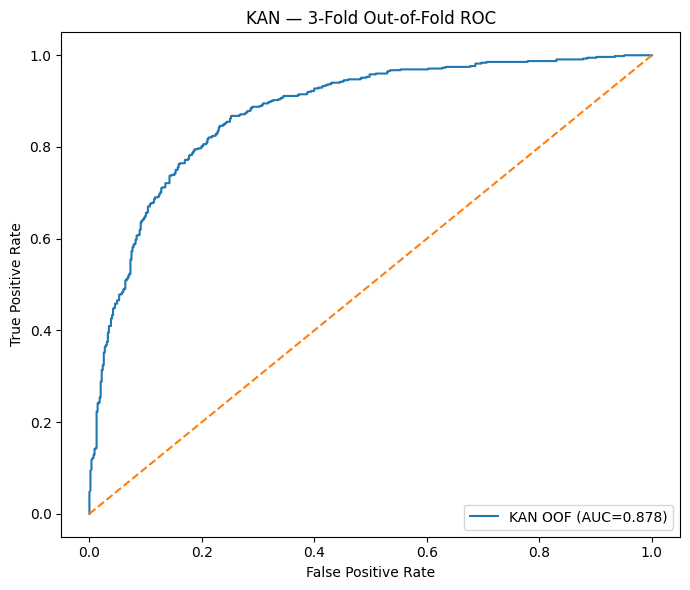

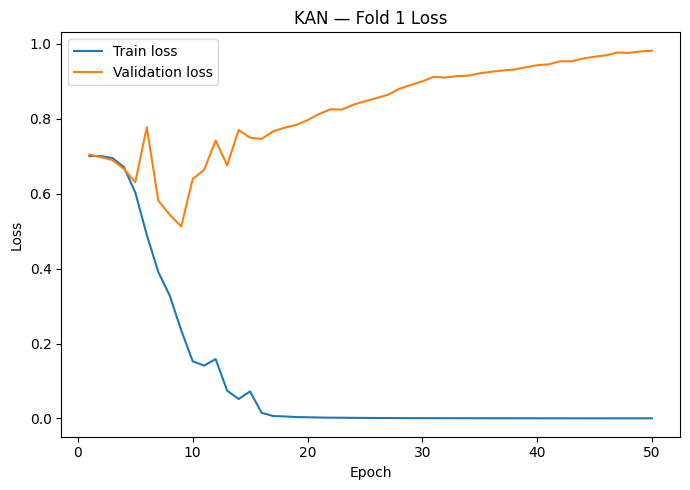

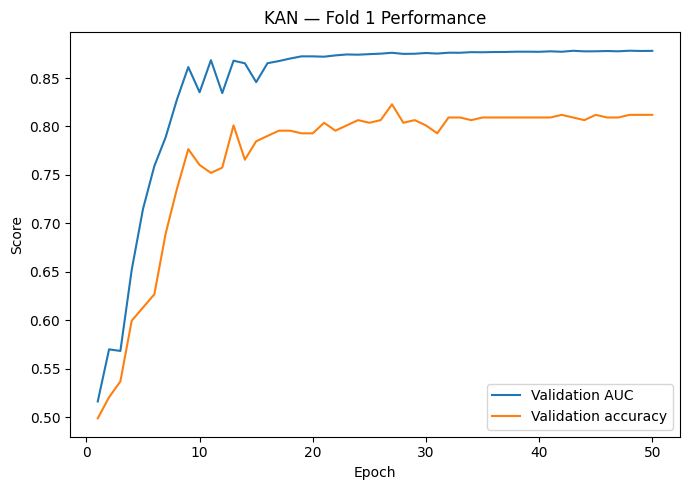

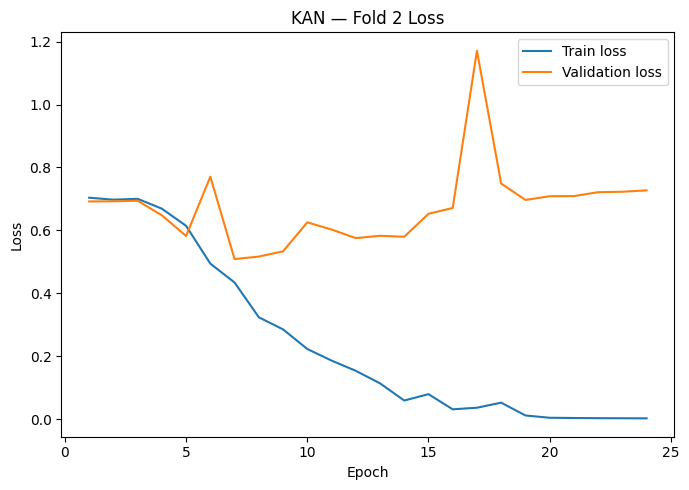

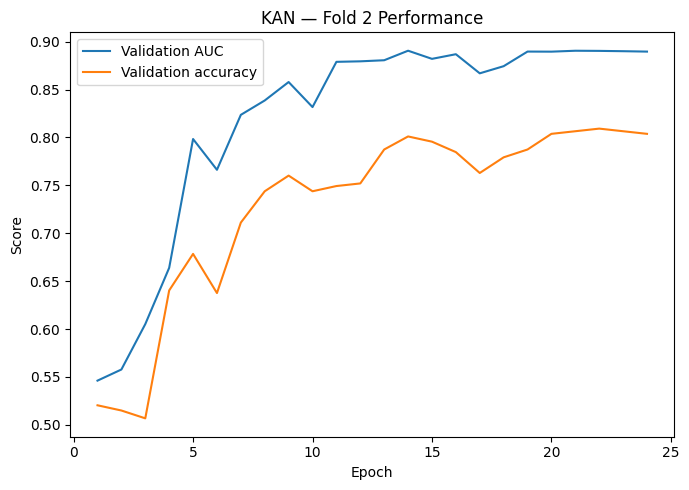

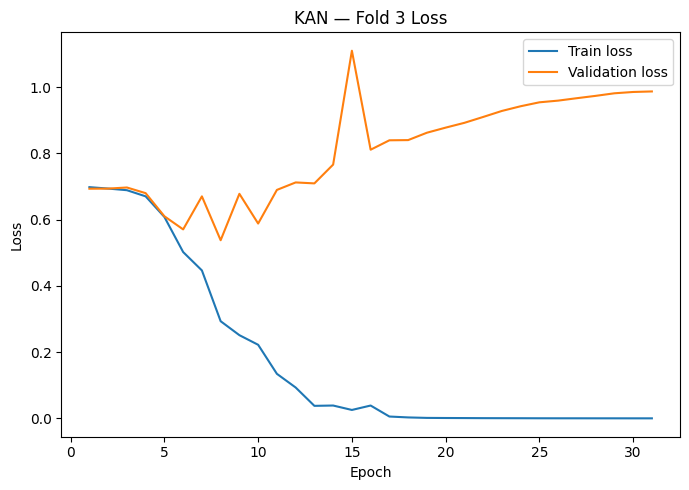

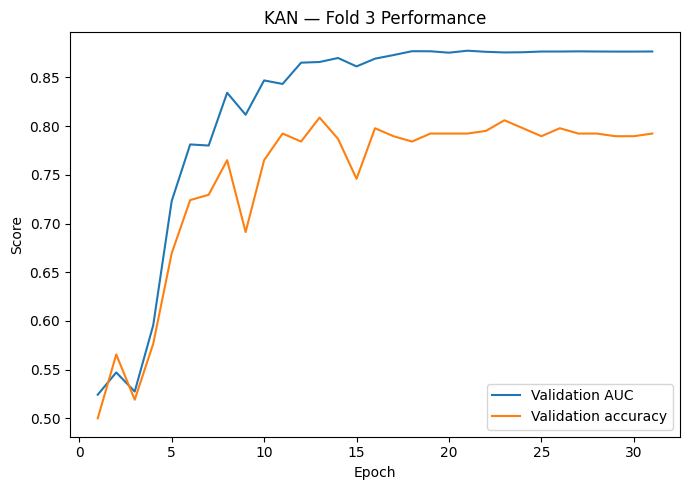


CELL 7 COMPLETE

Saved to:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\KAN_results

Most important output to send me:
1. Each fold's BEST RESULT
2. KAN MEAN ± STANDARD DEVIATION
3. OUT-OF-FOLD PERFORMANCE
4. DIRECT COMPARISON WITH PAPER


In [7]:
# ============================================================
# CELL 7 — FULL KAN 3-FOLD TRAINING
# Alzheimer OCT Paper Reproduction
#
# Dataset:
#   1100 images
#   50 x 50
#   ALL RAW / MARKED / FLAT / FLAT_NORMED retained
#   NO deduplication
#
# Evaluation:
#   Image-level stratified 3-fold CV
#
# KAN:
#   2500 -> 72 -> 72 -> 1
#   grid = 11
#   spline order = 3
#   GELU
#
# IMPORTANT:
#   This literal architecture has ~3.2M parameters,
#   while the paper reports ~200k.
# ============================================================

from pathlib import Path
import time
import gc
import random
import json
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import (
    TensorDataset,
    DataLoader
)

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    roc_auc_score,
    f1_score,
    confusion_matrix,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_curve
)

from kan.KANLayer import KANLayer

warnings.filterwarnings("ignore")


# ============================================================
# 1. CONFIGURATION
# ============================================================

SEED = 2026

N_SPLITS = 3

BATCH_SIZE = 8

MAX_EPOCHS = 50

LEARNING_RATE = 1e-3

WEIGHT_DECAY = 1e-5

PATIENCE = 10

MIN_DELTA = 1e-4

NUM_WORKERS = 0

THRESHOLD = 0.50

INPUT_DIM = 2500
HIDDEN_DIM = 72
GRID_SIZE = 11
SPLINE_ORDER = 3


# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


print("=" * 100)
print("CELL 7 — KAN 3-FOLD TRAINING")
print("=" * 100)

print("Device       :", DEVICE)

if torch.cuda.is_available():

    print(
        "GPU          :",
        torch.cuda.get_device_name(0)
    )

print("Batch size   :", BATCH_SIZE)
print("Max epochs   :", MAX_EPOCHS)
print("Learning rate:", LEARNING_RATE)
print("Patience     :", PATIENCE)


# ============================================================
# 2. PATHS + DATA
# ============================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

OUTPUT_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

KAN_DIR = (
    OUTPUT_DIR /
    "KAN_results"
)

KAN_DIR.mkdir(
    parents=True,
    exist_ok=True
)

NPZ_PATH = (
    OUTPUT_DIR /
    "AD_OCT_paperstyle_1100_50x50.npz"
)

META_PATH = (
    OUTPUT_DIR /
    "AD_OCT_paperstyle_1100_metadata.csv"
)


dataset = np.load(
    NPZ_PATH
)

X = dataset["X"].astype(
    np.float32
)

y = dataset["y"].astype(
    np.int64
)

metadata = pd.read_csv(
    META_PATH
)


# Flatten:
#
# (1100, 50, 50)
#       ↓
# (1100, 2500)

X_flat = X.reshape(
    len(X),
    -1
).astype(
    np.float32
)


print("\nDataset:")
print("X:", X_flat.shape)
print("y:", y.shape)

print(
    "Control:",
    int((y == 0).sum())
)

print(
    "AD     :",
    int((y == 1).sum())
)


# ============================================================
# 3. KAN MODEL
# ============================================================

class AlzheimerKAN(nn.Module):

    def __init__(
        self,
        input_dim=2500,
        hidden_dim=72,
        grid_size=11,
        spline_order=3,
        device="cpu"
    ):

        super().__init__()

        self.kan1 = KANLayer(
            in_dim=input_dim,
            out_dim=hidden_dim,
            num=grid_size,
            k=spline_order,
            base_fun=nn.GELU(),
            grid_range=[0.0, 1.0],
            device=device
        )

        self.kan2 = KANLayer(
            in_dim=hidden_dim,
            out_dim=hidden_dim,
            num=grid_size,
            k=spline_order,
            base_fun=nn.GELU(),
            grid_range=[-3.0, 3.0],
            device=device
        )

        self.kan3 = KANLayer(
            in_dim=hidden_dim,
            out_dim=1,
            num=grid_size,
            k=spline_order,
            base_fun=nn.GELU(),
            grid_range=[-3.0, 3.0],
            device=device
        )


    def forward(self, x):

        x, _, _, _ = self.kan1(x)

        x, _, _, _ = self.kan2(x)

        x, _, _, _ = self.kan3(x)

        return x.squeeze(1)


# ============================================================
# 4. METRIC FUNCTION
# ============================================================

def calculate_metrics(
    targets,
    probabilities,
    threshold=0.50
):

    targets = np.asarray(
        targets
    ).astype(int)

    probabilities = np.asarray(
        probabilities
    )

    predictions = (
        probabilities >= threshold
    ).astype(int)


    accuracy = accuracy_score(
        targets,
        predictions
    )

    precision = precision_score(
        targets,
        predictions,
        zero_division=0
    )

    recall = recall_score(
        targets,
        predictions,
        zero_division=0
    )

    f1 = f1_score(
        targets,
        predictions,
        zero_division=0
    )

    balanced_acc = balanced_accuracy_score(
        targets,
        predictions
    )

    mcc = matthews_corrcoef(
        targets,
        predictions
    )


    try:

        auc = roc_auc_score(
            targets,
            probabilities
        )

    except Exception:

        auc = np.nan


    cm = confusion_matrix(
        targets,
        predictions,
        labels=[0, 1]
    )

    tn, fp, fn, tp = cm.ravel()


    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else 0.0
    )

    sensitivity = recall


    return {

        "accuracy": accuracy,

        "precision": precision,

        "recall": recall,

        "sensitivity": sensitivity,

        "specificity": specificity,

        "f1": f1,

        "balanced_accuracy": balanced_acc,

        "mcc": mcc,

        "auc": auc,

        "tn": int(tn),

        "fp": int(fp),

        "fn": int(fn),

        "tp": int(tp)
    }


# ============================================================
# 5. EVALUATION FUNCTION
# ============================================================

@torch.no_grad()
def evaluate_model(
    model,
    loader,
    criterion
):

    model.eval()

    running_loss = 0.0

    all_targets = []
    all_probabilities = []


    for inputs, targets in loader:

        inputs = inputs.to(
            DEVICE,
            non_blocking=True
        )

        targets = targets.to(
            DEVICE,
            non_blocking=True
        )


        logits = model(
            inputs
        )

        loss = criterion(
            logits,
            targets
        )


        running_loss += (
            loss.item()
            * inputs.size(0)
        )


        probabilities = torch.sigmoid(
            logits
        )


        all_targets.extend(
            targets.detach()
            .cpu()
            .numpy()
            .tolist()
        )

        all_probabilities.extend(
            probabilities.detach()
            .cpu()
            .numpy()
            .tolist()
        )


    mean_loss = (
        running_loss
        /
        len(loader.dataset)
    )


    metrics = calculate_metrics(
        all_targets,
        all_probabilities,
        threshold=THRESHOLD
    )


    return (
        mean_loss,
        metrics,
        np.asarray(all_targets),
        np.asarray(all_probabilities)
    )


# ============================================================
# 6. 3-FOLD CV
# ============================================================

skf = StratifiedKFold(
    n_splits=N_SPLITS,
    shuffle=True,
    random_state=SEED
)


fold_results = []

all_oof_targets = []
all_oof_probabilities = []
all_oof_indices = []

training_histories = {}


for fold, (
    train_indices,
    val_indices
) in enumerate(
    skf.split(
        X_flat,
        y
    ),
    start=1
):

    print("\n")
    print("#" * 100)
    print(
        f"FOLD {fold}/{N_SPLITS}"
    )
    print("#" * 100)


    # --------------------------------------------------------
    # Fold seed
    # --------------------------------------------------------

    fold_seed = (
        SEED + fold
    )

    random.seed(
        fold_seed
    )

    np.random.seed(
        fold_seed
    )

    torch.manual_seed(
        fold_seed
    )

    if torch.cuda.is_available():

        torch.cuda.manual_seed_all(
            fold_seed
        )


    # --------------------------------------------------------
    # Data
    # --------------------------------------------------------

    X_train = torch.from_numpy(
        X_flat[
            train_indices
        ]
    ).float()

    y_train = torch.from_numpy(
        y[
            train_indices
        ]
    ).float()


    X_val = torch.from_numpy(
        X_flat[
            val_indices
        ]
    ).float()

    y_val = torch.from_numpy(
        y[
            val_indices
        ]
    ).float()


    train_dataset = TensorDataset(
        X_train,
        y_train
    )

    val_dataset = TensorDataset(
        X_val,
        y_val
    )


    train_generator = torch.Generator()

    train_generator.manual_seed(
        fold_seed
    )


    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=(
            DEVICE.type == "cuda"
        ),
        generator=train_generator
    )


    val_loader = DataLoader(
        val_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=(
            DEVICE.type == "cuda"
        )
    )


    print(
        "Train images:",
        len(train_indices)
    )

    print(
        "Valid images:",
        len(val_indices)
    )


    # --------------------------------------------------------
    # Fresh model
    # --------------------------------------------------------

    model = AlzheimerKAN(
        input_dim=INPUT_DIM,
        hidden_dim=HIDDEN_DIM,
        grid_size=GRID_SIZE,
        spline_order=SPLINE_ORDER,
        device=DEVICE
    ).to(
        DEVICE
    )


    trainable_params = sum(
        p.numel()
        for p in model.parameters()
        if p.requires_grad
    )


    print(
        f"Trainable parameters: "
        f"{trainable_params:,}"
    )


    # --------------------------------------------------------
    # Loss
    # --------------------------------------------------------

    criterion = nn.BCEWithLogitsLoss()


    # --------------------------------------------------------
    # Optimizer
    # --------------------------------------------------------

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=LEARNING_RATE,
        weight_decay=WEIGHT_DECAY
    )


    # --------------------------------------------------------
    # Scheduler
    # --------------------------------------------------------

    scheduler = (
        torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode="max",
            factor=0.5,
            patience=3,
            min_lr=1e-6
        )
    )


    # --------------------------------------------------------
    # Tracking
    # --------------------------------------------------------

    best_auc = -np.inf

    best_epoch = 0

    epochs_without_improvement = 0


    history = {

        "epoch": [],

        "train_loss": [],

        "val_loss": [],

        "val_accuracy": [],

        "val_precision": [],

        "val_recall": [],

        "val_f1": [],

        "val_auc": [],

        "lr": []
    }


    checkpoint_path = (
        KAN_DIR /
        f"KAN_fold_{fold}_best.pt"
    )


    fold_start_time = time.time()


    # ========================================================
    # 7. TRAINING LOOP
    # ========================================================

    for epoch in range(
        1,
        MAX_EPOCHS + 1
    ):

        epoch_start = time.time()

        model.train()

        train_running_loss = 0.0


        for batch_inputs, batch_targets in train_loader:

            batch_inputs = batch_inputs.to(
                DEVICE,
                non_blocking=True
            )

            batch_targets = batch_targets.to(
                DEVICE,
                non_blocking=True
            )


            optimizer.zero_grad(
                set_to_none=True
            )


            logits = model(
                batch_inputs
            )


            loss = criterion(
                logits,
                batch_targets
            )


            if not torch.isfinite(loss):

                raise RuntimeError(
                    "Non-finite training loss detected."
                )


            loss.backward()


            # Gradient clipping for stability
            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                max_norm=5.0
            )


            optimizer.step()


            train_running_loss += (
                loss.item()
                * batch_inputs.size(0)
            )


        train_loss = (
            train_running_loss
            /
            len(train_loader.dataset)
        )


        # ----------------------------------------------------
        # Validation
        # ----------------------------------------------------

        (
            val_loss,
            val_metrics,
            val_targets,
            val_probabilities
        ) = evaluate_model(
            model,
            val_loader,
            criterion
        )


        current_auc = (
            val_metrics["auc"]
        )


        # ----------------------------------------------------
        # Scheduler
        # ----------------------------------------------------

        scheduler.step(
            current_auc
        )


        current_lr = (
            optimizer.param_groups[0]["lr"]
        )


        # ----------------------------------------------------
        # History
        # ----------------------------------------------------

        history[
            "epoch"
        ].append(
            epoch
        )

        history[
            "train_loss"
        ].append(
            train_loss
        )

        history[
            "val_loss"
        ].append(
            val_loss
        )

        history[
            "val_accuracy"
        ].append(
            val_metrics["accuracy"]
        )

        history[
            "val_precision"
        ].append(
            val_metrics["precision"]
        )

        history[
            "val_recall"
        ].append(
            val_metrics["recall"]
        )

        history[
            "val_f1"
        ].append(
            val_metrics["f1"]
        )

        history[
            "val_auc"
        ].append(
            current_auc
        )

        history[
            "lr"
        ].append(
            current_lr
        )


        # ----------------------------------------------------
        # Best model
        # ----------------------------------------------------

        improved = (
            current_auc
            >
            best_auc + MIN_DELTA
        )


        if improved:

            best_auc = (
                current_auc
            )

            best_epoch = epoch

            epochs_without_improvement = 0


            torch.save(
                {
                    "fold":
                        fold,

                    "epoch":
                        epoch,

                    "model_state_dict":
                        model.state_dict(),

                    "optimizer_state_dict":
                        optimizer.state_dict(),

                    "val_auc":
                        current_auc,

                    "config": {
                        "input_dim":
                            INPUT_DIM,

                        "hidden_dim":
                            HIDDEN_DIM,

                        "grid_size":
                            GRID_SIZE,

                        "spline_order":
                            SPLINE_ORDER,

                        "activation":
                            "GELU",

                        "batch_size":
                            BATCH_SIZE,

                        "learning_rate":
                            LEARNING_RATE
                    }
                },
                checkpoint_path
            )

        else:

            epochs_without_improvement += 1


        epoch_time = (
            time.time()
            - epoch_start
        )


        print(
            f"Fold {fold} | "
            f"Epoch {epoch:02d}/{MAX_EPOCHS} | "
            f"TrainLoss {train_loss:.4f} | "
            f"ValLoss {val_loss:.4f} | "
            f"Acc {val_metrics['accuracy']:.4f} | "
            f"Prec {val_metrics['precision']:.4f} | "
            f"Rec {val_metrics['recall']:.4f} | "
            f"F1 {val_metrics['f1']:.4f} | "
            f"AUC {current_auc:.4f} | "
            f"LR {current_lr:.2e} | "
            f"{epoch_time:.1f}s"
        )


        # ----------------------------------------------------
        # Early stopping
        # ----------------------------------------------------

        if (
            epochs_without_improvement
            >= PATIENCE
        ):

            print(
                f"\nEarly stopping at epoch "
                f"{epoch}."
            )

            print(
                f"Best validation AUC "
                f"{best_auc:.4f} "
                f"at epoch {best_epoch}."
            )

            break


    # ========================================================
    # 8. LOAD BEST MODEL
    # ========================================================

    checkpoint = torch.load(
        checkpoint_path,
        map_location=DEVICE,
        weights_only=False
    )


    model.load_state_dict(
        checkpoint[
            "model_state_dict"
        ]
    )


    (
        best_val_loss,
        best_metrics,
        best_targets,
        best_probabilities
    ) = evaluate_model(
        model,
        val_loader,
        criterion
    )


    fold_time = (
        time.time()
        - fold_start_time
    )


    # --------------------------------------------------------
    # Results
    # --------------------------------------------------------

    fold_result = {

        "fold":
            fold,

        "best_epoch":
            best_epoch,

        "accuracy":
            best_metrics["accuracy"],

        "precision":
            best_metrics["precision"],

        "recall":
            best_metrics["recall"],

        "sensitivity":
            best_metrics["sensitivity"],

        "specificity":
            best_metrics["specificity"],

        "f1":
            best_metrics["f1"],

        "balanced_accuracy":
            best_metrics["balanced_accuracy"],

        "mcc":
            best_metrics["mcc"],

        "auc":
            best_metrics["auc"],

        "tn":
            best_metrics["tn"],

        "fp":
            best_metrics["fp"],

        "fn":
            best_metrics["fn"],

        "tp":
            best_metrics["tp"],

        "time_minutes":
            fold_time / 60.0
    }


    fold_results.append(
        fold_result
    )


    # OOF predictions
    all_oof_targets.extend(
        best_targets.tolist()
    )

    all_oof_probabilities.extend(
        best_probabilities.tolist()
    )

    all_oof_indices.extend(
        val_indices.tolist()
    )


    training_histories[
        fold
    ] = history


    print("\n" + "-" * 100)

    print(
        f"FOLD {fold} BEST RESULT"
    )

    print("-" * 100)

    for key in [
        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc"
    ]:

        print(
            f"{key:20s}: "
            f"{fold_result[key]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )

    print(
        np.array(
            [
                [
                    fold_result["tn"],
                    fold_result["fp"]
                ],
                [
                    fold_result["fn"],
                    fold_result["tp"]
                ]
            ]
        )
    )


    # --------------------------------------------------------
    # Clean memory
    # --------------------------------------------------------

    del model
    del optimizer
    del scheduler
    del criterion

    del train_dataset
    del val_dataset

    del train_loader
    del val_loader

    del X_train
    del X_val
    del y_train
    del y_val

    gc.collect()

    if torch.cuda.is_available():

        torch.cuda.empty_cache()


# ============================================================
# 9. FOLD RESULT TABLE
# ============================================================

results_df = pd.DataFrame(
    fold_results
)


print("\n")
print("=" * 100)
print("KAN — THREE-FOLD RESULTS")
print("=" * 100)

print(
    results_df.to_string(
        index=False
    )
)


# ============================================================
# 10. MEAN ± SD
# ============================================================

metric_columns = [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc"
]


print("\n" + "=" * 100)
print("KAN — MEAN ± STANDARD DEVIATION")
print("=" * 100)


summary_records = []


for metric in metric_columns:

    values = (
        results_df[
            metric
        ].values
    )

    mean_value = float(
        np.mean(values)
    )

    sd_value = float(
        np.std(
            values,
            ddof=1
        )
    )


    summary_records.append(
        {
            "metric":
                metric,

            "mean":
                mean_value,

            "sd":
                sd_value
        }
    )


    print(
        f"{metric:20s}: "
        f"{mean_value:.4f} "
        f"± {sd_value:.4f}"
    )


summary_df = pd.DataFrame(
    summary_records
)


# ============================================================
# 11. OOF RESULT
# ============================================================

all_oof_targets = np.asarray(
    all_oof_targets
)

all_oof_probabilities = np.asarray(
    all_oof_probabilities
)

all_oof_indices = np.asarray(
    all_oof_indices
)


# Restore dataset-index order

sort_order = np.argsort(
    all_oof_indices
)

oof_targets = (
    all_oof_targets[
        sort_order
    ]
)

oof_probabilities = (
    all_oof_probabilities[
        sort_order
    ]
)

oof_indices = (
    all_oof_indices[
        sort_order
    ]
)


oof_metrics = calculate_metrics(
    oof_targets,
    oof_probabilities,
    threshold=THRESHOLD
)


print("\n" + "=" * 100)
print("OUT-OF-FOLD PERFORMANCE — ALL 1100 IMAGES")
print("=" * 100)


for metric in [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc"
]:

    print(
        f"{metric:20s}: "
        f"{oof_metrics[metric]:.4f}"
    )


print(
    "\nOOF confusion matrix:"
)

print(
    np.array(
        [
            [
                oof_metrics["tn"],
                oof_metrics["fp"]
            ],
            [
                oof_metrics["fn"],
                oof_metrics["tp"]
            ]
        ]
    )
)


# ============================================================
# 12. COMPARE DIRECTLY WITH PAPER
# ============================================================

paper_metrics = {
    "accuracy": 0.87,
    "precision": 0.88,
    "recall": 0.86,
    "auc": 0.88
}


print("\n" + "=" * 100)
print("DIRECT COMPARISON WITH ICMHI 2025 PAPER")
print("=" * 100)

print(
    f"{'Metric':12s}"
    f"{'Paper':>12s}"
    f"{'Our OOF':>12s}"
    f"{'Difference':>14s}"
)

print("-" * 50)


for metric, paper_value in paper_metrics.items():

    ours = (
        oof_metrics[metric]
    )

    difference = (
        ours - paper_value
    )

    print(
        f"{metric:12s}"
        f"{paper_value:12.4f}"
        f"{ours:12.4f}"
        f"{difference:+14.4f}"
    )


# ============================================================
# 13. SAVE RESULTS
# ============================================================

results_csv = (
    KAN_DIR /
    "KAN_3fold_results.csv"
)

summary_csv = (
    KAN_DIR /
    "KAN_3fold_summary.csv"
)

oof_csv = (
    KAN_DIR /
    "KAN_oof_predictions.csv"
)


results_df.to_csv(
    results_csv,
    index=False
)

summary_df.to_csv(
    summary_csv,
    index=False
)


oof_df = metadata.copy()

oof_df[
    "target"
] = oof_targets

oof_df[
    "probability_AD"
] = oof_probabilities

oof_df[
    "prediction"
] = (
    oof_probabilities
    >= THRESHOLD
).astype(int)


oof_df.to_csv(
    oof_csv,
    index=False
)


# ============================================================
# 14. SAVE HISTORIES
# ============================================================

for fold, history in training_histories.items():

    pd.DataFrame(
        history
    ).to_csv(
        KAN_DIR /
        f"KAN_fold_{fold}_history.csv",
        index=False
    )


# ============================================================
# 15. ROC CURVE
# ============================================================

fpr, tpr, _ = roc_curve(
    oof_targets,
    oof_probabilities
)


plt.figure(
    figsize=(7, 6)
)

plt.plot(
    fpr,
    tpr,
    label=(
        f"KAN OOF "
        f"(AUC={oof_metrics['auc']:.3f})"
    )
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--"
)

plt.xlabel(
    "False Positive Rate"
)

plt.ylabel(
    "True Positive Rate"
)

plt.title(
    "KAN — 3-Fold Out-of-Fold ROC"
)

plt.legend(
    loc="lower right"
)

plt.tight_layout()


roc_path = (
    KAN_DIR /
    "KAN_OOF_ROC.png"
)

plt.savefig(
    roc_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 16. TRAINING CURVES
# ============================================================

for fold, history in training_histories.items():

    history_df = pd.DataFrame(
        history
    )


    plt.figure(
        figsize=(7, 5)
    )

    plt.plot(
        history_df["epoch"],
        history_df["train_loss"],
        label="Train loss"
    )

    plt.plot(
        history_df["epoch"],
        history_df["val_loss"],
        label="Validation loss"
    )

    plt.xlabel(
        "Epoch"
    )

    plt.ylabel(
        "Loss"
    )

    plt.title(
        f"KAN — Fold {fold} Loss"
    )

    plt.legend()

    plt.tight_layout()

    plt.savefig(
        KAN_DIR /
        f"KAN_fold_{fold}_loss.png",
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()


    plt.figure(
        figsize=(7, 5)
    )

    plt.plot(
        history_df["epoch"],
        history_df["val_auc"],
        label="Validation AUC"
    )

    plt.plot(
        history_df["epoch"],
        history_df["val_accuracy"],
        label="Validation accuracy"
    )

    plt.xlabel(
        "Epoch"
    )

    plt.ylabel(
        "Score"
    )

    plt.title(
        f"KAN — Fold {fold} Performance"
    )

    plt.legend()

    plt.tight_layout()

    plt.savefig(
        KAN_DIR /
        f"KAN_fold_{fold}_metrics.png",
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()


# ============================================================
# 17. FINAL
# ============================================================

print("\n" + "=" * 100)
print("CELL 7 COMPLETE")
print("=" * 100)

print("\nSaved to:")
print(KAN_DIR)

print(
    "\nMost important output to send me:"
)

print(
    "1. Each fold's BEST RESULT"
)

print(
    "2. KAN MEAN ± STANDARD DEVIATION"
)

print(
    "3. OUT-OF-FOLD PERFORMANCE"
)

print(
    "4. DIRECT COMPARISON WITH PAPER"
)

CELL 8 — KAN THRESHOLD DIAGNOSTIC

Images: 1100
AUC: 0.8782793822067068

BASELINE THRESHOLD = 0.50
accuracy            : 0.8009
precision           : 0.7856
recall              : 0.8297
specificity         : 0.7719
f1                  : 0.8070
balanced_accuracy   : 0.8008
mcc                 : 0.6027

Confusion matrix:
[[423 125]
 [ 94 458]]

DIAGNOSTIC: THRESHOLD WITH MAXIMUM OOF ACCURACY
threshold           : 0.3050
accuracy            : 0.8082
precision           : 0.7763
recall              : 0.8678
specificity         : 0.7482
f1                  : 0.8195
balanced_accuracy   : 0.8080
mcc                 : 0.6205

Confusion matrix:
[[410 138]
 [ 73 479]]

DIAGNOSTIC: BEST YOUDEN-J THRESHOLD
threshold           : 0.3050
accuracy            : 0.8082
precision           : 0.7763
recall              : 0.8678
specificity         : 0.7482
f1                  : 0.8195
balanced_accuracy   : 0.8080
mcc                 : 0.6205
youden_j            : 0.6159

DIAGNOSTIC: BEST F1 THRESHOLD
thre

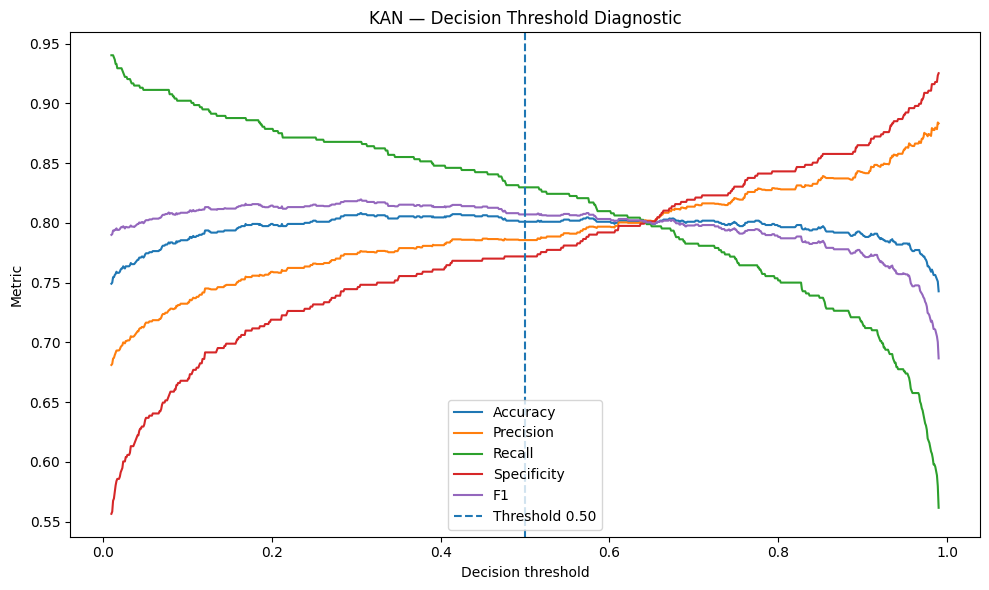


CELL 8 COMPLETE

Saved:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\KAN_results\KAN_threshold_sweep.csv
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\KAN_results\KAN_threshold_diagnostic.png

IMPORTANT:
These optimized OOF thresholds are DIAGNOSTIC.
Do not report them yet as unbiased final performance.


In [8]:
# ============================================================
# CELL 8 — KAN THRESHOLD DIAGNOSTIC
#
# IMPORTANT:
# This cell is DIAGNOSTIC ONLY.
#
# It investigates whether the gap between:
#   AUC ≈ 0.88 (matches paper)
# and
#   Accuracy ≈ 0.80
#
# is mainly caused by the fixed threshold = 0.50.
#
# Do NOT report optimized OOF threshold as final test result.
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score
)


# ============================================================
# 1. LOAD SAVED OOF PREDICTIONS
# ============================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

KAN_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "KAN_results"
)

OOF_PATH = (
    KAN_DIR /
    "KAN_oof_predictions.csv"
)

assert OOF_PATH.exists(), OOF_PATH

df = pd.read_csv(
    OOF_PATH
)

y_true = df[
    "target"
].values.astype(int)

y_prob = df[
    "probability_AD"
].values.astype(float)


print("=" * 95)
print("CELL 8 — KAN THRESHOLD DIAGNOSTIC")
print("=" * 95)

print("\nImages:", len(y_true))

print(
    "AUC:",
    roc_auc_score(
        y_true,
        y_prob
    )
)


# ============================================================
# 2. THRESHOLD METRIC FUNCTION
# ============================================================

def metrics_at_threshold(
    y_true,
    y_prob,
    threshold
):

    y_pred = (
        y_prob >= threshold
    ).astype(int)

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    accuracy = accuracy_score(
        y_true,
        y_pred
    )

    precision = precision_score(
        y_true,
        y_pred,
        zero_division=0
    )

    recall = recall_score(
        y_true,
        y_pred,
        zero_division=0
    )

    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else 0
    )

    f1 = f1_score(
        y_true,
        y_pred,
        zero_division=0
    )

    balanced_acc = balanced_accuracy_score(
        y_true,
        y_pred
    )

    mcc = matthews_corrcoef(
        y_true,
        y_pred
    )

    youden = (
        recall + specificity - 1
    )

    return {
        "threshold": threshold,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "specificity": specificity,
        "f1": f1,
        "balanced_accuracy": balanced_acc,
        "mcc": mcc,
        "youden_j": youden,
        "tn": int(tn),
        "fp": int(fp),
        "fn": int(fn),
        "tp": int(tp)
    }


# ============================================================
# 3. VERY FINE THRESHOLD SWEEP
# ============================================================

thresholds = np.arange(
    0.01,
    0.991,
    0.001
)

records = []

for threshold in thresholds:

    records.append(
        metrics_at_threshold(
            y_true,
            y_prob,
            float(threshold)
        )
    )

threshold_df = pd.DataFrame(
    records
)


# ============================================================
# 4. BASELINE = 0.50
# ============================================================

baseline = metrics_at_threshold(
    y_true,
    y_prob,
    0.50
)

print("\n" + "=" * 95)
print("BASELINE THRESHOLD = 0.50")
print("=" * 95)

for key in [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc"
]:

    print(
        f"{key:20s}: "
        f"{baseline[key]:.4f}"
    )

print("\nConfusion matrix:")

print(
    np.array([
        [
            baseline["tn"],
            baseline["fp"]
        ],
        [
            baseline["fn"],
            baseline["tp"]
        ]
    ])
)


# ============================================================
# 5. MAXIMUM ACCURACY THRESHOLD
# ============================================================

best_acc_idx = (
    threshold_df[
        "accuracy"
    ].idxmax()
)

best_acc = threshold_df.loc[
    best_acc_idx
]


print("\n" + "=" * 95)
print("DIAGNOSTIC: THRESHOLD WITH MAXIMUM OOF ACCURACY")
print("=" * 95)

for key in [
    "threshold",
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc"
]:

    print(
        f"{key:20s}: "
        f"{best_acc[key]:.4f}"
    )

print("\nConfusion matrix:")

print(
    np.array([
        [
            int(best_acc["tn"]),
            int(best_acc["fp"])
        ],
        [
            int(best_acc["fn"]),
            int(best_acc["tp"])
        ]
    ])
)


# ============================================================
# 6. BEST YOUDEN-J THRESHOLD
# ============================================================

best_youden_idx = (
    threshold_df[
        "youden_j"
    ].idxmax()
)

best_youden = threshold_df.loc[
    best_youden_idx
]


print("\n" + "=" * 95)
print("DIAGNOSTIC: BEST YOUDEN-J THRESHOLD")
print("=" * 95)

for key in [
    "threshold",
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "youden_j"
]:

    print(
        f"{key:20s}: "
        f"{best_youden[key]:.4f}"
    )


# ============================================================
# 7. BEST F1 THRESHOLD
# ============================================================

best_f1_idx = (
    threshold_df[
        "f1"
    ].idxmax()
)

best_f1 = threshold_df.loc[
    best_f1_idx
]


print("\n" + "=" * 95)
print("DIAGNOSTIC: BEST F1 THRESHOLD")
print("=" * 95)

for key in [
    "threshold",
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc"
]:

    print(
        f"{key:20s}: "
        f"{best_f1[key]:.4f}"
    )


# ============================================================
# 8. SEARCH FOR PAPER-LIKE OPERATING POINT
#
# Paper:
# Precision = 0.88
# Recall    = 0.86
#
# Find threshold closest to those two values.
# ============================================================

paper_precision = 0.88
paper_recall = 0.86


threshold_df[
    "paper_distance"
] = np.sqrt(
    (
        threshold_df["precision"]
        -
        paper_precision
    ) ** 2
    +
    (
        threshold_df["recall"]
        -
        paper_recall
    ) ** 2
)


paper_like_idx = (
    threshold_df[
        "paper_distance"
    ].idxmin()
)

paper_like = threshold_df.loc[
    paper_like_idx
]


print("\n" + "=" * 95)
print("DIAGNOSTIC: CLOSEST TO PAPER PRECISION/RECALL")
print("=" * 95)

for key in [
    "threshold",
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc"
]:

    print(
        f"{key:20s}: "
        f"{paper_like[key]:.4f}"
    )


# ============================================================
# 9. TOP 20 ACCURACY OPERATING POINTS
# ============================================================

print("\n" + "=" * 95)
print("TOP 20 THRESHOLDS BY ACCURACY")
print("=" * 95)

top20 = (
    threshold_df
    .sort_values(
        [
            "accuracy",
            "f1"
        ],
        ascending=False
    )
    .head(20)
)

print(
    top20[
        [
            "threshold",
            "accuracy",
            "precision",
            "recall",
            "specificity",
            "f1",
            "mcc"
        ]
    ].to_string(
        index=False
    )
)


# ============================================================
# 10. THRESHOLD CURVES
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    threshold_df["threshold"],
    threshold_df["accuracy"],
    label="Accuracy"
)

plt.plot(
    threshold_df["threshold"],
    threshold_df["precision"],
    label="Precision"
)

plt.plot(
    threshold_df["threshold"],
    threshold_df["recall"],
    label="Recall"
)

plt.plot(
    threshold_df["threshold"],
    threshold_df["specificity"],
    label="Specificity"
)

plt.plot(
    threshold_df["threshold"],
    threshold_df["f1"],
    label="F1"
)

plt.axvline(
    0.50,
    linestyle="--",
    label="Threshold 0.50"
)

plt.xlabel(
    "Decision threshold"
)

plt.ylabel(
    "Metric"
)

plt.title(
    "KAN — Decision Threshold Diagnostic"
)

plt.legend()

plt.tight_layout()

plot_path = (
    KAN_DIR /
    "KAN_threshold_diagnostic.png"
)

plt.savefig(
    plot_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 11. SAVE
# ============================================================

csv_path = (
    KAN_DIR /
    "KAN_threshold_sweep.csv"
)

threshold_df.to_csv(
    csv_path,
    index=False
)


print("\n" + "=" * 95)
print("CELL 8 COMPLETE")
print("=" * 95)

print("\nSaved:")
print(csv_path)
print(plot_path)

print(
    "\nIMPORTANT:"
    "\nThese optimized OOF thresholds are DIAGNOSTIC."
    "\nDo not report them yet as unbiased final performance."
)

CELL 9 — ORIGINAL OCT INTENSITY / PREPROCESSING AUDIT

Subjects: 28

SLICE COUNT
Total slices: 1100

By representation:
representation
RAW            275
MARKED         275
FLAT           275
FLAT_NORMED    275
Name: count, dtype: int64

INTENSITY SUMMARY BY REPRESENTATION
                slices    min_of_min    median_min    max_of_max    median_max  mean_of_means  sd_of_means  mean_dynamic_range  sd_dynamic_range
representation                                                                                                                                  
FLAT               275    117.392792    117.392792   7656.131836   7307.691406    2461.877723   250.678178         6971.112212        670.803664
FLAT_NORMED        275      0.000000      0.000000   7656.131836   7049.963379    2462.418622   256.697450         6937.973017        699.816980
MARKED             275      0.000000      0.000000    255.000000    255.000000      78.731456    24.578219          255.000000          0.000000
R

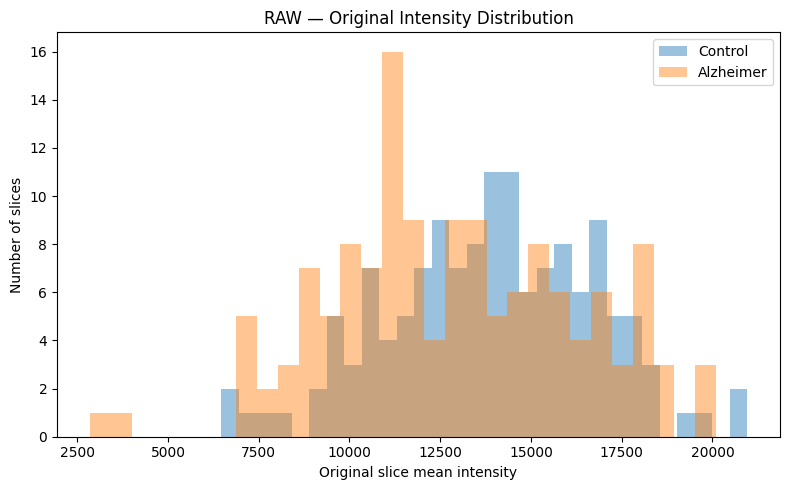

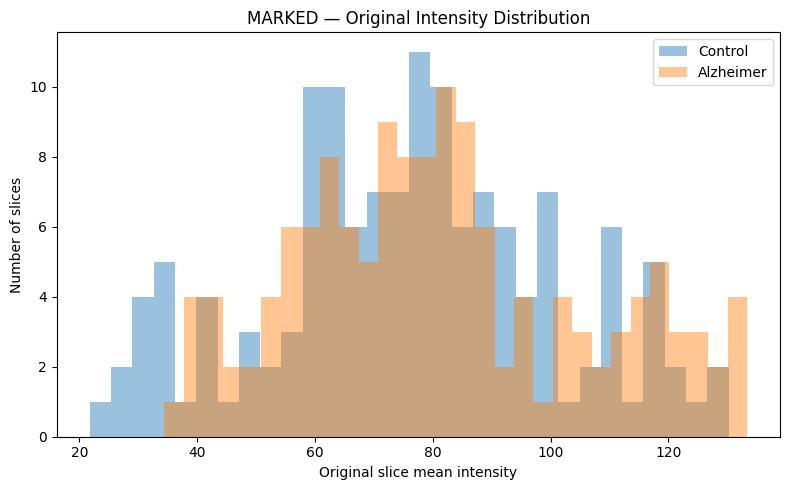

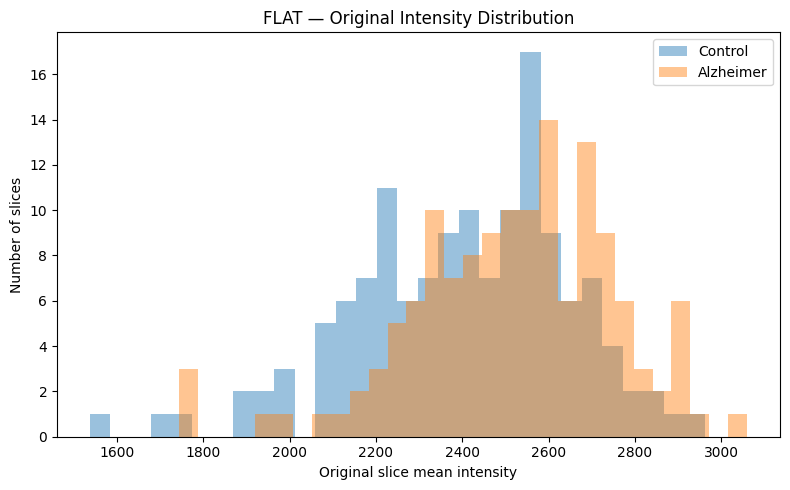

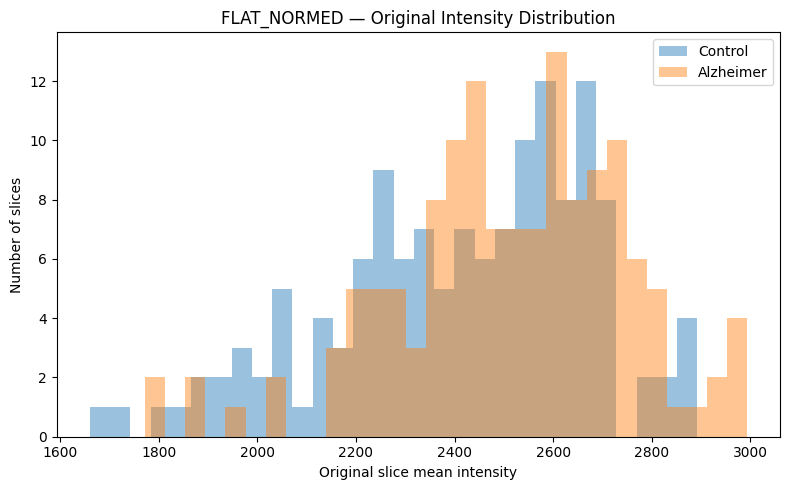


CELL 9 COMPLETE

Saved:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\original_slice_intensity_audit.csv
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\original_subject_intensity_audit.csv

DO NOT retrain KAN yet.
Send me these sections:
  INTENSITY SUMMARY BY REPRESENTATION
  ORIGINAL INTENSITY — ALZHEIMER VS CONTROL
  ORIGINAL INTENSITY — DARK VS LIGHT
  CLASS × CONDITION × REPRESENTATION
  PER-SLICE RANGE VARIABILITY


In [9]:
# ============================================================
# CELL 9 — ORIGINAL OCT INTENSITY / PREPROCESSING AUDIT
#
# PURPOSE
# -------
# Determine whether our per-slice min-max normalization in
# CELL 5 may be removing useful intensity information.
#
# We inspect:
#   RAW
#   MARKED
#   FLAT
#   FLAT_NORMED
#
# separately, before deciding on the next training dataset.
#
# NO TRAINING
# NO DATA MODIFICATION
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import struct
import re
import warnings

warnings.filterwarnings("ignore")


# ============================================================
# 1. PATHS
# ============================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

INNER_ROOT = (
    DATA_ROOT /
    "[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]"
)

OUTPUT_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

print("=" * 100)
print("CELL 9 — ORIGINAL OCT INTENSITY / PREPROCESSING AUDIT")
print("=" * 100)


# ============================================================
# 2. ANALYZE FORMAT SUPPORT
# ============================================================

ANALYZE_DTYPES = {
    2: np.uint8,
    4: np.int16,
    8: np.int32,
    16: np.float32,
    64: np.float64,
    256: np.int8,
    512: np.uint16,
    768: np.uint32,
    1024: np.int64,
    1280: np.uint64,
}


def read_analyze_header(hdr_path):

    hdr_path = Path(hdr_path)

    with open(hdr_path, "rb") as f:
        header = f.read(348)

    little = struct.unpack(
        "<i",
        header[0:4]
    )[0]

    big = struct.unpack(
        ">i",
        header[0:4]
    )[0]

    if little == 348:
        endian = "<"

    elif big == 348:
        endian = ">"

    else:
        raise ValueError(
            f"Cannot determine endian: {hdr_path}"
        )

    dims = struct.unpack(
        endian + "8h",
        header[40:56]
    )

    n_dims = int(
        dims[0]
    )

    shape = tuple(
        int(x)
        for x in dims[1:n_dims + 1]
    )

    datatype_code = struct.unpack(
        endian + "h",
        header[70:72]
    )[0]

    bitpix = struct.unpack(
        endian + "h",
        header[72:74]
    )[0]

    return {
        "shape": shape,
        "datatype_code": datatype_code,
        "bitpix": bitpix,
        "endian": endian
    }


def load_analyze_volume(hdr_path):

    hdr_path = Path(
        hdr_path
    )

    img_path = hdr_path.with_suffix(
        ".img"
    )

    info = read_analyze_header(
        hdr_path
    )

    dtype_code = info[
        "datatype_code"
    ]

    dtype = np.dtype(
        ANALYZE_DTYPES[
            dtype_code
        ]
    ).newbyteorder(
        info["endian"]
    )

    data = np.fromfile(
        img_path,
        dtype=dtype
    )

    expected = int(
        np.prod(
            info["shape"]
        )
    )

    if data.size != expected:

        raise RuntimeError(
            f"{img_path}: "
            f"expected {expected}, "
            f"got {data.size}"
        )

    volume = data.reshape(
        info["shape"],
        order="F"
    )

    volume = np.squeeze(
        volume
    )

    return volume


# ============================================================
# 3. SUBJECTS
# ============================================================

subject_pattern = re.compile(
    r"^(AD|CO)(\d+)$",
    re.IGNORECASE
)

subject_folders = []

for folder in sorted(
    INNER_ROOT.iterdir()
):

    if (
        folder.is_dir()
        and
        subject_pattern.match(
            folder.name
        )
    ):

        subject_folders.append(
            folder
        )


print(
    "\nSubjects:",
    len(subject_folders)
)


# ============================================================
# 4. FILE ID HANDLING
#
# AD443 folder contains AD433 filenames.
# ============================================================

def get_file_subject_id(folder):

    candidates = [
        p
        for p in folder.glob(
            "*_DARK.hdr"
        )
        if not p.name.startswith("_")
        and "MARKED" not in p.name.upper()
        and "-DIM" not in p.name.upper()
    ]

    if not candidates:

        candidates = [
            p
            for p in folder.glob(
                "*_LIGHT.hdr"
            )
            if not p.name.startswith("_")
            and "MARKED" not in p.name.upper()
            and "-DIM" not in p.name.upper()
        ]

    if not candidates:

        raise RuntimeError(
            f"No canonical file found: "
            f"{folder}"
        )

    stem = candidates[0].stem

    stem = stem.replace(
        "_DARK",
        ""
    )

    stem = stem.replace(
        "_LIGHT",
        ""
    )

    return stem


# ============================================================
# 5. REPRESENTATION PATH
# ============================================================

def get_hdr_path(
    folder,
    file_subject,
    condition,
    representation
):

    if representation == "RAW":

        name = (
            f"{file_subject}_"
            f"{condition}.hdr"
        )

    elif representation == "MARKED":

        name = (
            f"{file_subject}_"
            f"{condition}_MARKED.hdr"
        )

    elif representation == "FLAT":

        name = (
            f"_flat_"
            f"{file_subject}_"
            f"{condition}.hdr"
        )

    elif representation == "FLAT_NORMED":

        name = (
            f"_flat-normed_"
            f"{file_subject}_"
            f"{condition}.hdr"
        )

    else:

        raise ValueError(
            representation
        )

    return folder / name


REPRESENTATIONS = [
    "RAW",
    "MARKED",
    "FLAT",
    "FLAT_NORMED"
]

CONDITIONS = [
    "DARK",
    "LIGHT"
]


# ============================================================
# 6. SLICE-LEVEL INTENSITY STATISTICS
# ============================================================

records = []

for folder in subject_folders:

    folder_subject = (
        folder.name
    )

    class_name = (
        "Alzheimer"
        if folder_subject.startswith("AD")
        else "Control"
    )

    label = (
        1
        if class_name == "Alzheimer"
        else 0
    )

    file_subject = (
        get_file_subject_id(
            folder
        )
    )

    for condition in CONDITIONS:

        for representation in REPRESENTATIONS:

            hdr_path = get_hdr_path(
                folder,
                file_subject,
                condition,
                representation
            )

            volume = load_analyze_volume(
                hdr_path
            )

            for slice_index in range(
                volume.shape[2]
            ):

                image = np.asarray(
                    volume[
                        :,
                        :,
                        slice_index
                    ],
                    dtype=np.float64
                )

                finite = image[
                    np.isfinite(
                        image
                    )
                ]

                records.append({

                    "subject":
                        folder_subject,

                    "file_subject":
                        file_subject,

                    "class_name":
                        class_name,

                    "label":
                        label,

                    "condition":
                        condition,

                    "representation":
                        representation,

                    "slice_index":
                        slice_index,

                    "height":
                        image.shape[0],

                    "width":
                        image.shape[1],

                    "minimum":
                        float(
                            finite.min()
                        ),

                    "maximum":
                        float(
                            finite.max()
                        ),

                    "mean":
                        float(
                            finite.mean()
                        ),

                    "std":
                        float(
                            finite.std()
                        ),

                    "median":
                        float(
                            np.median(
                                finite
                            )
                        ),

                    "p01":
                        float(
                            np.percentile(
                                finite,
                                1
                            )
                        ),

                    "p05":
                        float(
                            np.percentile(
                                finite,
                                5
                            )
                        ),

                    "p95":
                        float(
                            np.percentile(
                                finite,
                                95
                            )
                        ),

                    "p99":
                        float(
                            np.percentile(
                                finite,
                                99
                            )
                        ),

                    "dynamic_range":
                        float(
                            finite.max()
                            -
                            finite.min()
                        )
                })


stats_df = pd.DataFrame(
    records
)


print("\n" + "=" * 100)
print("SLICE COUNT")
print("=" * 100)

print(
    "Total slices:",
    len(stats_df)
)

print(
    "\nBy representation:"
)

print(
    stats_df[
        "representation"
    ].value_counts()
)


# ============================================================
# 7. GLOBAL SUMMARY BY REPRESENTATION
# ============================================================

print("\n" + "=" * 100)
print("INTENSITY SUMMARY BY REPRESENTATION")
print("=" * 100)

summary = (
    stats_df
    .groupby(
        "representation"
    )
    .agg(

        slices=(
            "mean",
            "count"
        ),

        min_of_min=(
            "minimum",
            "min"
        ),

        median_min=(
            "minimum",
            "median"
        ),

        max_of_max=(
            "maximum",
            "max"
        ),

        median_max=(
            "maximum",
            "median"
        ),

        mean_of_means=(
            "mean",
            "mean"
        ),

        sd_of_means=(
            "mean",
            "std"
        ),

        mean_dynamic_range=(
            "dynamic_range",
            "mean"
        ),

        sd_dynamic_range=(
            "dynamic_range",
            "std"
        )
    )
)

print(
    summary.to_string()
)


# ============================================================
# 8. CLASS DIFFERENCES IN ORIGINAL INTENSITY
# ============================================================

print("\n" + "=" * 100)
print("ORIGINAL INTENSITY — ALZHEIMER VS CONTROL")
print("=" * 100)

class_summary = (
    stats_df
    .groupby(
        [
            "representation",
            "class_name"
        ]
    )
    .agg(

        slices=(
            "mean",
            "count"
        ),

        mean_intensity=(
            "mean",
            "mean"
        ),

        sd_mean_intensity=(
            "mean",
            "std"
        ),

        median_intensity=(
            "median",
            "mean"
        ),

        mean_p95=(
            "p95",
            "mean"
        ),

        mean_p99=(
            "p99",
            "mean"
        ),

        mean_dynamic_range=(
            "dynamic_range",
            "mean"
        )
    )
)

print(
    class_summary.to_string()
)


# ============================================================
# 9. DARK VS LIGHT ORIGINAL INTENSITY
# ============================================================

print("\n" + "=" * 100)
print("ORIGINAL INTENSITY — DARK VS LIGHT")
print("=" * 100)

condition_summary = (
    stats_df
    .groupby(
        [
            "representation",
            "condition"
        ]
    )
    .agg(

        slices=(
            "mean",
            "count"
        ),

        mean_intensity=(
            "mean",
            "mean"
        ),

        sd_mean_intensity=(
            "mean",
            "std"
        ),

        mean_p95=(
            "p95",
            "mean"
        ),

        mean_dynamic_range=(
            "dynamic_range",
            "mean"
        )
    )
)

print(
    condition_summary.to_string()
)


# ============================================================
# 10. AD/CONTROL × DARK/LIGHT
# ============================================================

print("\n" + "=" * 100)
print("CLASS × CONDITION × REPRESENTATION")
print("=" * 100)

threeway = (
    stats_df
    .groupby(
        [
            "representation",
            "class_name",
            "condition"
        ]
    )
    .agg(

        slices=(
            "mean",
            "count"
        ),

        mean_intensity=(
            "mean",
            "mean"
        ),

        mean_std=(
            "std",
            "mean"
        ),

        mean_dynamic_range=(
            "dynamic_range",
            "mean"
        )
    )
)

print(
    threeway.to_string()
)


# ============================================================
# 11. HOW MUCH DOES PER-SLICE MIN-MAX CHANGE SCALE?
# ============================================================

print("\n" + "=" * 100)
print("PER-SLICE RANGE VARIABILITY")
print("=" * 100)

range_variability = (
    stats_df
    .groupby(
        "representation"
    )[
        "dynamic_range"
    ]
    .describe()
)

print(
    range_variability.to_string()
)


# ============================================================
# 12. SUBJECT-LEVEL MEAN INTENSITY
# ============================================================

subject_means = (
    stats_df
    .groupby(
        [
            "subject",
            "class_name",
            "representation",
            "condition"
        ],
        as_index=False
    )
    .agg(
        mean_intensity=(
            "mean",
            "mean"
        ),
        mean_dynamic_range=(
            "dynamic_range",
            "mean"
        )
    )
)


print("\n" + "=" * 100)
print("SUBJECT-LEVEL ORIGINAL INTENSITY SUMMARY")
print("=" * 100)

print(
    subject_means.head(
        30
    ).to_string(
        index=False
    )
)


# ============================================================
# 13. PLOTS — MEAN INTENSITY DISTRIBUTION
# ============================================================

for representation in REPRESENTATIONS:

    subset = stats_df[
        stats_df[
            "representation"
        ]
        ==
        representation
    ]

    plt.figure(
        figsize=(8, 5)
    )

    for class_name in [
        "Control",
        "Alzheimer"
    ]:

        values = subset[
            subset[
                "class_name"
            ]
            ==
            class_name
        ][
            "mean"
        ].values

        plt.hist(
            values,
            bins=30,
            alpha=0.45,
            label=class_name
        )

    plt.xlabel(
        "Original slice mean intensity"
    )

    plt.ylabel(
        "Number of slices"
    )

    plt.title(
        f"{representation} — Original Intensity Distribution"
    )

    plt.legend()

    plt.tight_layout()

    plt.show()


# ============================================================
# 14. SAVE
# ============================================================

stats_path = (
    OUTPUT_DIR /
    "original_slice_intensity_audit.csv"
)

subject_path = (
    OUTPUT_DIR /
    "original_subject_intensity_audit.csv"
)

stats_df.to_csv(
    stats_path,
    index=False
)

subject_means.to_csv(
    subject_path,
    index=False
)


print("\n" + "=" * 100)
print("CELL 9 COMPLETE")
print("=" * 100)

print("\nSaved:")
print(stats_path)
print(subject_path)

print(
    "\nDO NOT retrain KAN yet."
)

print(
    "Send me these sections:"
)

print(
    "  INTENSITY SUMMARY BY REPRESENTATION"
)

print(
    "  ORIGINAL INTENSITY — ALZHEIMER VS CONTROL"
)

print(
    "  ORIGINAL INTENSITY — DARK VS LIGHT"
)

print(
    "  CLASS × CONDITION × REPRESENTATION"
)

print(
    "  PER-SLICE RANGE VARIABILITY"
)

In [10]:
# ============================================================
# CELL 10 — BUILD ABSOLUTE-INTENSITY 50x50 OCT DATASET
#
# Purpose:
#   Rebuild the same 1100 slices WITHOUT per-slice min-max.
#
# Representations retained:
#   RAW
#   MARKED
#   FLAT
#   FLAT_NORMED
#
# Conditions retained:
#   DARK
#   LIGHT
#
# No deduplication.
# No artificial replacement of missing slices.
#
# IMPORTANT:
#   RAW and MARKED are converted using fixed physical/encoded
#   ranges.
#
#   FLAT / FLAT_NORMED stay in their original intensity scale.
#   Their train-fold scaling will be performed in CELL 11.
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import struct
import re
from PIL import Image

# ------------------------------------------------------------
# 1. PATHS
# ------------------------------------------------------------

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

INNER_ROOT = (
    DATA_ROOT /
    "[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]"
)

OUTPUT_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

print("=" * 100)
print("CELL 10 — ABSOLUTE-INTENSITY OCT DATASET")
print("=" * 100)


# ============================================================
# 2. ANALYZE FORMAT READER
# ============================================================

ANALYZE_DTYPES = {
    2: np.uint8,
    4: np.int16,
    8: np.int32,
    16: np.float32,
    64: np.float64,
    256: np.int8,
    512: np.uint16,
    768: np.uint32,
    1024: np.int64,
    1280: np.uint64,
}


def read_analyze_header(hdr_path):

    hdr_path = Path(hdr_path)

    with open(hdr_path, "rb") as f:
        header = f.read(348)

    if len(header) != 348:
        raise ValueError(
            f"Invalid Analyze header: {hdr_path}"
        )

    little = struct.unpack(
        "<i",
        header[0:4]
    )[0]

    big = struct.unpack(
        ">i",
        header[0:4]
    )[0]

    if little == 348:
        endian = "<"

    elif big == 348:
        endian = ">"

    else:
        raise ValueError(
            f"Cannot determine endianness: {hdr_path}"
        )

    dims = struct.unpack(
        endian + "8h",
        header[40:56]
    )

    n_dims = int(
        dims[0]
    )

    shape = tuple(
        int(v)
        for v in dims[1:n_dims + 1]
    )

    datatype_code = struct.unpack(
        endian + "h",
        header[70:72]
    )[0]

    bitpix = struct.unpack(
        endian + "h",
        header[72:74]
    )[0]

    return {
        "shape": shape,
        "datatype_code": datatype_code,
        "bitpix": bitpix,
        "endian": endian
    }


def load_analyze_volume(hdr_path):

    hdr_path = Path(
        hdr_path
    )

    img_path = hdr_path.with_suffix(
        ".img"
    )

    info = read_analyze_header(
        hdr_path
    )

    dtype_code = info[
        "datatype_code"
    ]

    if dtype_code not in ANALYZE_DTYPES:
        raise ValueError(
            f"Unsupported datatype: {dtype_code}"
        )

    dtype = np.dtype(
        ANALYZE_DTYPES[
            dtype_code
        ]
    ).newbyteorder(
        info["endian"]
    )

    data = np.fromfile(
        img_path,
        dtype=dtype
    )

    expected = int(
        np.prod(
            info["shape"]
        )
    )

    if data.size != expected:

        raise RuntimeError(
            f"{img_path.name}: "
            f"expected {expected}, "
            f"found {data.size}"
        )

    volume = data.reshape(
        info["shape"],
        order="F"
    )

    volume = np.squeeze(
        volume
    )

    if volume.ndim != 3:

        raise RuntimeError(
            f"Expected 3D volume, "
            f"got {volume.shape}"
        )

    return volume


# ============================================================
# 3. RESIZE FLOAT IMAGE WITHOUT NORMALIZING IT
# ============================================================

def resize_float_image(
    image,
    output_size=(50, 50)
):

    image = np.asarray(
        image,
        dtype=np.float32
    )

    image = np.nan_to_num(
        image,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    # PIL mode F preserves floating-point values.
    pil = Image.fromarray(
        image,
        mode="F"
    )

    pil = pil.resize(
        output_size,
        resample=Image.BILINEAR
    )

    resized = np.asarray(
        pil,
        dtype=np.float32
    )

    return resized


# ============================================================
# 4. SUBJECT IDENTIFICATION
# ============================================================

subject_pattern = re.compile(
    r"^(AD|CO)(\d+)$",
    re.IGNORECASE
)

subject_folders = []

for folder in sorted(
    INNER_ROOT.iterdir()
):

    if not folder.is_dir():
        continue

    if subject_pattern.match(
        folder.name
    ):

        subject_folders.append(
            folder
        )


print(
    "\nParticipants:",
    len(subject_folders)
)


# ============================================================
# 5. AD443 / AD433 SPECIAL FILE-NAME CASE
# ============================================================

def get_file_subject_id(folder):

    candidates = [
        p
        for p in folder.glob(
            "*_DARK.hdr"
        )
        if not p.name.startswith("_")
        and "MARKED" not in p.name.upper()
        and "-DIM" not in p.name.upper()
    ]

    if not candidates:

        candidates = [
            p
            for p in folder.glob(
                "*_LIGHT.hdr"
            )
            if not p.name.startswith("_")
            and "MARKED" not in p.name.upper()
            and "-DIM" not in p.name.upper()
        ]

    if not candidates:

        raise RuntimeError(
            f"Cannot determine file subject: {folder}"
        )

    stem = candidates[0].stem

    stem = stem.replace(
        "_DARK",
        ""
    )

    stem = stem.replace(
        "_LIGHT",
        ""
    )

    return stem


# ============================================================
# 6. FILE PATH
# ============================================================

REPRESENTATIONS = [
    "RAW",
    "MARKED",
    "FLAT",
    "FLAT_NORMED"
]

CONDITIONS = [
    "DARK",
    "LIGHT"
]


def make_hdr_path(
    folder,
    file_subject,
    condition,
    representation
):

    if representation == "RAW":

        filename = (
            f"{file_subject}_"
            f"{condition}.hdr"
        )

    elif representation == "MARKED":

        filename = (
            f"{file_subject}_"
            f"{condition}_MARKED.hdr"
        )

    elif representation == "FLAT":

        filename = (
            f"_flat_"
            f"{file_subject}_"
            f"{condition}.hdr"
        )

    elif representation == "FLAT_NORMED":

        filename = (
            f"_flat-normed_"
            f"{file_subject}_"
            f"{condition}.hdr"
        )

    else:
        raise ValueError(
            representation
        )

    return (
        folder /
        filename
    )


# ============================================================
# 7. BUILD ORIGINAL-SCALE RESIZED DATASET
# ============================================================

images = []

labels = []

representation_ids = []

metadata_records = []

dataset_index = 0

volume_count = 0


for folder in subject_folders:

    folder_subject = (
        folder.name
    )

    label = (
        1
        if folder_subject.startswith("AD")
        else 0
    )

    class_name = (
        "Alzheimer"
        if label == 1
        else "Control"
    )

    file_subject = (
        get_file_subject_id(
            folder
        )
    )

    for condition in CONDITIONS:

        for representation in REPRESENTATIONS:

            hdr_path = make_hdr_path(
                folder,
                file_subject,
                condition,
                representation
            )

            if not hdr_path.exists():

                raise FileNotFoundError(
                    hdr_path
                )

            volume = load_analyze_volume(
                hdr_path
            )

            volume_count += 1

            for slice_index in range(
                volume.shape[2]
            ):

                original = np.asarray(
                    volume[
                        :,
                        :,
                        slice_index
                    ],
                    dtype=np.float32
                )

                # --------------------------------------------
                # FIXED representation-specific conversion.
                #
                # RAW:
                # signed int16 -> zero-based 16-bit range.
                #
                # MARKED:
                # fixed 0..255 encoded range.
                #
                # FLAT / FLAT_NORMED:
                # retain original float reflectivity scale.
                # --------------------------------------------

                if representation == "RAW":

                    processed = (
                        original
                        +
                        32768.0
                    ) / 65535.0

                    processed = np.clip(
                        processed,
                        0.0,
                        1.0
                    )


                elif representation == "MARKED":

                    processed = (
                        original
                        /
                        255.0
                    )

                    processed = np.clip(
                        processed,
                        0.0,
                        1.0
                    )


                elif representation in [
                    "FLAT",
                    "FLAT_NORMED"
                ]:

                    processed = original.copy()


                else:

                    raise ValueError(
                        representation
                    )


                resized = resize_float_image(
                    processed,
                    output_size=(
                        50,
                        50
                    )
                )


                images.append(
                    resized
                )

                labels.append(
                    label
                )

                representation_ids.append(
                    representation
                )


                metadata_records.append({

                    "dataset_index":
                        dataset_index,

                    "folder_subject":
                        folder_subject,

                    "file_subject":
                        file_subject,

                    "label":
                        label,

                    "class_name":
                        class_name,

                    "condition":
                        condition,

                    "representation":
                        representation,

                    "slice_index":
                        slice_index,

                    "source_height":
                        original.shape[0],

                    "source_width":
                        original.shape[1],

                    "resized_min":
                        float(
                            resized.min()
                        ),

                    "resized_max":
                        float(
                            resized.max()
                        ),

                    "resized_mean":
                        float(
                            resized.mean()
                        ),

                    "resized_std":
                        float(
                            resized.std()
                        ),

                    "hdr_file":
                        hdr_path.name
                })


                dataset_index += 1


# ============================================================
# 8. ARRAYS
# ============================================================

X_absolute = np.stack(
    images,
    axis=0
).astype(
    np.float32
)

y_absolute = np.asarray(
    labels,
    dtype=np.int64
)

representation_ids = np.asarray(
    representation_ids
)

meta_absolute = pd.DataFrame(
    metadata_records
)


# ============================================================
# 9. CHECKS
# ============================================================

print("\n" + "=" * 100)
print("FINAL ABSOLUTE-INTENSITY DATASET")
print("=" * 100)

print(
    "Volumes processed:",
    volume_count
)

print(
    "Images:",
    len(X_absolute)
)

print(
    "X shape:",
    X_absolute.shape
)

print(
    "y shape:",
    y_absolute.shape
)

print(
    "Control:",
    int(
        (
            y_absolute == 0
        ).sum()
    )
)

print(
    "Alzheimer:",
    int(
        (
            y_absolute == 1
        ).sum()
    )
)


assert volume_count == 224

assert len(
    X_absolute
) == 1100

assert X_absolute.shape == (
    1100,
    50,
    50
)

assert np.isfinite(
    X_absolute
).all()


# ============================================================
# 10. RESIZED INTENSITY SUMMARY
# ============================================================

print("\n" + "=" * 100)
print("RESIZED DATA — REPRESENTATION SUMMARY")
print("=" * 100)

summary = (
    meta_absolute
    .groupby(
        "representation"
    )
    .agg(
        slices=(
            "dataset_index",
            "count"
        ),
        min_value=(
            "resized_min",
            "min"
        ),
        max_value=(
            "resized_max",
            "max"
        ),
        mean_value=(
            "resized_mean",
            "mean"
        ),
        sd_slice_means=(
            "resized_mean",
            "std"
        )
    )
)

print(
    summary.to_string()
)


# ============================================================
# 11. AD / CONTROL AFTER RESIZING
# ============================================================

print("\n" + "=" * 100)
print("RESIZED DATA — AD VS CONTROL")
print("=" * 100)

class_summary = (
    meta_absolute
    .groupby(
        [
            "representation",
            "class_name"
        ]
    )
    .agg(
        slices=(
            "dataset_index",
            "count"
        ),
        mean_intensity=(
            "resized_mean",
            "mean"
        ),
        sd_slice_means=(
            "resized_mean",
            "std"
        )
    )
)

print(
    class_summary.to_string()
)


# ============================================================
# 12. SAVE
# ============================================================

npz_path = (
    OUTPUT_DIR /
    "AD_OCT_absolute_1100_50x50.npz"
)

metadata_path = (
    OUTPUT_DIR /
    "AD_OCT_absolute_1100_metadata.csv"
)


np.savez_compressed(
    npz_path,
    X=X_absolute,
    y=y_absolute,
    representation=representation_ids
)

meta_absolute.to_csv(
    metadata_path,
    index=False
)


print("\n" + "=" * 100)
print("CELL 10 COMPLETE")
print("=" * 100)

print("\nSaved dataset:")
print(npz_path)

print("\nSaved metadata:")
print(metadata_path)

print(
    "\nIMPORTANT:"
    "\nDo NOT train yet."
    "\nSend me:"
    "\n  1. FINAL ABSOLUTE-INTENSITY DATASET"
    "\n  2. RESIZED DATA — REPRESENTATION SUMMARY"
    "\n  3. RESIZED DATA — AD VS CONTROL"
)

CELL 10 — ABSOLUTE-INTENSITY OCT DATASET

Participants: 28

FINAL ABSOLUTE-INTENSITY DATASET
Volumes processed: 224
Images: 1100
X shape: (1100, 50, 50)
y shape: (1100,)
Control: 548
Alzheimer: 552

RESIZED DATA — REPRESENTATION SUMMARY
                slices   min_value    max_value   mean_value  sd_slice_means
representation                                                              
FLAT               275  117.392792  7217.113770  2462.271242      250.753677
FLAT_NORMED        275    0.000000  7246.958984  2464.250330      256.884311
MARKED             275    0.000000     0.918010     0.308711        0.096369
RAW                275    0.000000     1.000000     0.704004        0.048880

RESIZED DATA — AD VS CONTROL
                           slices  mean_intensity  sd_slice_means
representation class_name                                        
FLAT           Alzheimer      138     2521.705052      236.929478
               Control        137     2402.403607      250.871140
FLAT_NO

In [11]:
# ============================================================
# CELL 11 — FOLD-WISE ABSOLUTE-INTENSITY SCALING AUDIT
#
# Dataset:
#   AD_OCT_absolute_1100_50x50.npz
#
# Purpose:
#   Prepare the absolute-intensity dataset for KAN without
#   leaking validation information into preprocessing.
#
# RAW:
#   already fixed-scaled to [0,1]
#
# MARKED:
#   already fixed-scaled using /255
#
# FLAT:
#   scale using TRAIN-fold min/max only
#
# FLAT_NORMED:
#   scale using TRAIN-fold min/max only
#
# NO TRAINING IN THIS CELL
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd

from sklearn.model_selection import StratifiedKFold


# ============================================================
# 1. CONFIGURATION
# ============================================================

SEED = 2026
N_SPLITS = 3

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

OUTPUT_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

NPZ_PATH = (
    OUTPUT_DIR /
    "AD_OCT_absolute_1100_50x50.npz"
)

META_PATH = (
    OUTPUT_DIR /
    "AD_OCT_absolute_1100_metadata.csv"
)


print("=" * 105)
print("CELL 11 — FOLD-WISE ABSOLUTE-INTENSITY SCALING AUDIT")
print("=" * 105)


# ============================================================
# 2. LOAD DATA
# ============================================================

assert NPZ_PATH.exists(), NPZ_PATH
assert META_PATH.exists(), META_PATH

data = np.load(
    NPZ_PATH,
    allow_pickle=True
)

X = data["X"].astype(
    np.float32
)

y = data["y"].astype(
    np.int64
)

representations = data[
    "representation"
].astype(str)

metadata = pd.read_csv(
    META_PATH
)


print("\nDataset loaded")

print(
    "X:",
    X.shape
)

print(
    "y:",
    y.shape
)

print(
    "Representations:",
    np.unique(
        representations
    )
)


assert X.shape == (
    1100,
    50,
    50
)

assert y.shape == (
    1100,
)

assert len(
    representations
) == 1100

assert np.isfinite(
    X
).all()


# ============================================================
# 3. REPRESENTATION COUNTS
# ============================================================

print("\n" + "=" * 105)
print("REPRESENTATION COUNTS")
print("=" * 105)

for rep in [
    "RAW",
    "MARKED",
    "FLAT",
    "FLAT_NORMED"
]:

    print(
        f"{rep:15s}: "
        f"{int((representations == rep).sum())}"
    )


# ============================================================
# 4. SCALING FUNCTION
# ============================================================

def fit_representation_scaler(
    X_train,
    rep_train
):

    """
    Estimate scaling parameters ONLY from training images.

    RAW and MARKED:
        already fixed-scaled.

    FLAT and FLAT_NORMED:
        global training-fold min/max independently.
    """

    params = {}


    for rep in [
        "FLAT",
        "FLAT_NORMED"
    ]:

        mask = (
            rep_train == rep
        )

        values = X_train[
            mask
        ]

        rep_min = float(
            values.min()
        )

        rep_max = float(
            values.max()
        )

        if rep_max <= rep_min:

            raise RuntimeError(
                f"Invalid range for {rep}: "
                f"{rep_min}, {rep_max}"
            )


        params[
            rep
        ] = {
            "min": rep_min,
            "max": rep_max
        }


    return params


# ============================================================
# 5. APPLY SCALING
# ============================================================

def apply_representation_scaler(
    X_input,
    rep_input,
    params
):

    X_scaled = X_input.copy().astype(
        np.float32
    )


    # --------------------------------------------------------
    # RAW
    # Already fixed converted:
    #
    #   (signed value + 32768) / 65535
    #
    # --------------------------------------------------------

    raw_mask = (
        rep_input == "RAW"
    )

    X_scaled[
        raw_mask
    ] = np.clip(
        X_scaled[
            raw_mask
        ],
        0.0,
        1.0
    )


    # --------------------------------------------------------
    # MARKED
    # Already fixed converted:
    #
    #   value / 255
    #
    # --------------------------------------------------------

    marked_mask = (
        rep_input == "MARKED"
    )

    X_scaled[
        marked_mask
    ] = np.clip(
        X_scaled[
            marked_mask
        ],
        0.0,
        1.0
    )


    # --------------------------------------------------------
    # FLAT + FLAT_NORMED
    # Training-fold global scaling
    # --------------------------------------------------------

    for rep in [
        "FLAT",
        "FLAT_NORMED"
    ]:

        mask = (
            rep_input == rep
        )

        rep_min = params[
            rep
        ][
            "min"
        ]

        rep_max = params[
            rep
        ][
            "max"
        ]

        denominator = (
            rep_max
            -
            rep_min
        )


        X_scaled[
            mask
        ] = (
            X_scaled[
                mask
            ]
            -
            rep_min
        ) / denominator


        # Validation values can theoretically
        # exceed the training range.
        #
        # Clip AFTER applying training-derived parameters.

        X_scaled[
            mask
        ] = np.clip(
            X_scaled[
                mask
            ],
            0.0,
            1.0
        )


    return X_scaled


# ============================================================
# 6. CLIPPING DIAGNOSTIC
# ============================================================

def clipping_diagnostic(
    X_original,
    rep_array,
    params,
    representation
):

    mask = (
        rep_array
        ==
        representation
    )

    values = X_original[
        mask
    ]

    rep_min = params[
        representation
    ][
        "min"
    ]

    rep_max = params[
        representation
    ][
        "max"
    ]


    below = int(
        (
            values
            <
            rep_min
        ).sum()
    )

    above = int(
        (
            values
            >
            rep_max
        ).sum()
    )

    total = int(
        values.size
    )


    below_pct = (
        100.0
        *
        below
        /
        total
    )

    above_pct = (
        100.0
        *
        above
        /
        total
    )


    return (
        below,
        above,
        below_pct,
        above_pct
    )


# ============================================================
# 7. 3-FOLD CV AUDIT
# ============================================================

skf = StratifiedKFold(
    n_splits=N_SPLITS,
    shuffle=True,
    random_state=SEED
)


scaling_records = []

class_records = []


for fold, (
    train_idx,
    val_idx
) in enumerate(
    skf.split(
        X,
        y
    ),
    start=1
):

    print("\n")
    print("#" * 105)
    print(
        f"FOLD {fold}/{N_SPLITS}"
    )
    print("#" * 105)


    X_train = X[
        train_idx
    ]

    X_val = X[
        val_idx
    ]


    y_train = y[
        train_idx
    ]

    y_val = y[
        val_idx
    ]


    rep_train = representations[
        train_idx
    ]

    rep_val = representations[
        val_idx
    ]


    # --------------------------------------------------------
    # Fit using TRAIN only
    # --------------------------------------------------------

    params = fit_representation_scaler(
        X_train,
        rep_train
    )


    print(
        f"\nTrain images: "
        f"{len(train_idx)}"
    )

    print(
        f"Valid images: "
        f"{len(val_idx)}"
    )


    print("\nTraining-derived scaling parameters:")


    for rep in [
        "FLAT",
        "FLAT_NORMED"
    ]:

        rep_min = params[
            rep
        ][
            "min"
        ]

        rep_max = params[
            rep
        ][
            "max"
        ]


        print(
            f"  {rep:15s} "
            f"min={rep_min:12.6f} "
            f"max={rep_max:12.6f} "
            f"range={rep_max-rep_min:12.6f}"
        )


        scaling_records.append(
            {
                "fold":
                    fold,

                "representation":
                    rep,

                "train_min":
                    rep_min,

                "train_max":
                    rep_max,

                "train_range":
                    rep_max - rep_min
            }
        )


    # --------------------------------------------------------
    # Validation clipping BEFORE clipping is applied
    # --------------------------------------------------------

    print(
        "\nValidation values outside training range:"
    )


    for rep in [
        "FLAT",
        "FLAT_NORMED"
    ]:

        (
            below,
            above,
            below_pct,
            above_pct
        ) = clipping_diagnostic(
            X_val,
            rep_val,
            params,
            rep
        )


        print(
            f"  {rep:15s} | "
            f"below={below:8d} "
            f"({below_pct:.6f}%) | "
            f"above={above:8d} "
            f"({above_pct:.6f}%)"
        )


    # --------------------------------------------------------
    # Scale
    # --------------------------------------------------------

    X_train_scaled = apply_representation_scaler(
        X_train,
        rep_train,
        params
    )

    X_val_scaled = apply_representation_scaler(
        X_val,
        rep_val,
        params
    )


    assert np.isfinite(
        X_train_scaled
    ).all()

    assert np.isfinite(
        X_val_scaled
    ).all()


    assert (
        X_train_scaled.min()
        >=
        0.0
    )

    assert (
        X_train_scaled.max()
        <=
        1.0
    )

    assert (
        X_val_scaled.min()
        >=
        0.0
    )

    assert (
        X_val_scaled.max()
        <=
        1.0
    )


    # --------------------------------------------------------
    # Representation-specific ranges
    # --------------------------------------------------------

    print(
        "\nScaled TRAIN range by representation:"
    )


    for rep in [
        "RAW",
        "MARKED",
        "FLAT",
        "FLAT_NORMED"
    ]:

        mask = (
            rep_train == rep
        )

        subset = X_train_scaled[
            mask
        ]


        print(
            f"  {rep:15s}: "
            f"min={subset.min():.6f} "
            f"max={subset.max():.6f} "
            f"mean={subset.mean():.6f}"
        )


    print(
        "\nScaled VALIDATION range by representation:"
    )


    for rep in [
        "RAW",
        "MARKED",
        "FLAT",
        "FLAT_NORMED"
    ]:

        mask = (
            rep_val == rep
        )

        subset = X_val_scaled[
            mask
        ]


        print(
            f"  {rep:15s}: "
            f"min={subset.min():.6f} "
            f"max={subset.max():.6f} "
            f"mean={subset.mean():.6f}"
        )


    # --------------------------------------------------------
    # Validation AD vs Control means after scaling
    # --------------------------------------------------------

    print(
        "\nVALIDATION AD vs CONTROL "
        "mean intensity after fold-wise scaling:"
    )


    for rep in [
        "RAW",
        "MARKED",
        "FLAT",
        "FLAT_NORMED"
    ]:

        for class_label, class_name in [
            (0, "Control"),
            (1, "Alzheimer")
        ]:

            mask = (
                (rep_val == rep)
                &
                (y_val == class_label)
            )

            value = float(
                X_val_scaled[
                    mask
                ].mean()
            )


            print(
                f"  {rep:15s} | "
                f"{class_name:10s} | "
                f"mean={value:.6f}"
            )


            class_records.append(
                {
                    "fold":
                        fold,

                    "representation":
                        rep,

                    "class_name":
                        class_name,

                    "mean_scaled_intensity":
                        value,

                    "n_images":
                        int(
                            mask.sum()
                        )
                }
            )


    print(
        "\nWhole fold ranges:"
    )

    print(
        f"  TRAIN: "
        f"{X_train_scaled.min():.6f} "
        f"to "
        f"{X_train_scaled.max():.6f}"
    )

    print(
        f"  VALID: "
        f"{X_val_scaled.min():.6f} "
        f"to "
        f"{X_val_scaled.max():.6f}"
    )


# ============================================================
# 8. SUMMARY OF TRAINING SCALERS
# ============================================================

scaling_df = pd.DataFrame(
    scaling_records
)

class_df = pd.DataFrame(
    class_records
)


print("\n")
print("=" * 105)
print("TRAINING-DERIVED SCALER SUMMARY")
print("=" * 105)

print(
    scaling_df.to_string(
        index=False
    )
)


# ============================================================
# 9. CLASS-SEPARATION SUMMARY
# ============================================================

print("\n" + "=" * 105)
print("VALIDATION CLASS MEANS — ALL FOLDS")
print("=" * 105)

print(
    class_df.to_string(
        index=False
    )
)


print("\n" + "=" * 105)
print("MEAN VALIDATION INTENSITY ACROSS FOLDS")
print("=" * 105)


class_summary = (
    class_df
    .groupby(
        [
            "representation",
            "class_name"
        ]
    )
    .agg(
        mean_intensity=(
            "mean_scaled_intensity",
            "mean"
        ),

        sd_between_folds=(
            "mean_scaled_intensity",
            "std"
        ),

        total_images=(
            "n_images",
            "sum"
        )
    )
)


print(
    class_summary.to_string()
)


# ============================================================
# 10. SAVE PARAMETERS
# ============================================================

scaler_path = (
    OUTPUT_DIR /
    "absolute_intensity_fold_scalers.csv"
)

class_path = (
    OUTPUT_DIR /
    "absolute_intensity_fold_class_means.csv"
)


scaling_df.to_csv(
    scaler_path,
    index=False
)

class_df.to_csv(
    class_path,
    index=False
)


print("\n" + "=" * 105)
print("CELL 11 COMPLETE")
print("=" * 105)

print("\nSaved:")
print(scaler_path)
print(class_path)

print(
    "\nNO TRAINING HAS BEEN PERFORMED."
)

print(
    "\nSend me:"
    "\n  1. Training-derived scaling parameters"
    "\n  2. Validation values outside training range"
    "\n  3. Scaled validation range by representation"
    "\n  4. MEAN VALIDATION INTENSITY ACROSS FOLDS"
)

CELL 11 — FOLD-WISE ABSOLUTE-INTENSITY SCALING AUDIT

Dataset loaded
X: (1100, 50, 50)
y: (1100,)
Representations: ['FLAT' 'FLAT_NORMED' 'MARKED' 'RAW']

REPRESENTATION COUNTS
RAW            : 275
MARKED         : 275
FLAT           : 275
FLAT_NORMED    : 275


#########################################################################################################
FOLD 1/3
#########################################################################################################

Train images: 733
Valid images: 367

Training-derived scaling parameters:
  FLAT            min=  117.392792 max= 7217.113770 range= 7099.720978
  FLAT_NORMED     min=    0.000000 max= 7246.958984 range= 7246.958984

Validation values outside training range:
  FLAT            | below=       0 (0.000000%) | above=       0 (0.000000%)
  FLAT_NORMED     | below=       0 (0.000000%) | above=       0 (0.000000%)

Scaled TRAIN range by representation:
  RAW            : min=0.000000 max=1.000000 mean=0.699905
  MARKE

In [12]:
# ==================================================================================================
# CELL 12 — KAN TRAINING WITH ABSOLUTE-INTENSITY-PRESERVING SCALING
# ==================================================================================================
#
# CONTROLLED COMPARISON AGAINST CELL 7
#
# Old experiment:
#     Per-slice min-max normalized images
#
# New experiment:
#     RAW           -> fixed 16-bit conversion already applied
#     MARKED        -> fixed /255 conversion already applied
#     FLAT          -> TRAIN-FOLD global min/max
#     FLAT_NORMED   -> TRAIN-FOLD global min/max
#
# KAN:
#     2500 -> 72 -> 72 -> 1
#
# Grid:
#     11
#
# Spline order:
#     3
#
# Activation:
#     GELU
#
# CV:
#     3-fold IMAGE-LEVEL reproduction protocol
#
# IMPORTANT:
#     This reproduces the previous/paper-style image-level experiment.
#     It is NOT patient-level external/generalization validation.
# ==================================================================================================

from pathlib import Path
import copy
import random
import time
import warnings

import numpy as np
import pandas as pd

import torch
import torch.nn as nn

from torch.utils.data import (
    TensorDataset,
    DataLoader
)

from sklearn.model_selection import (
    StratifiedKFold
)

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    confusion_matrix
)

warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

BASE_SEED = 2026

N_SPLITS = 3

BATCH_SIZE = 8

MAX_EPOCHS = 50

LEARNING_RATE = 1e-3

EARLY_STOPPING_PATIENCE = 10

LR_PATIENCE = 3

LR_FACTOR = 0.5

THRESHOLD = 0.50


INPUT_DIM = 2500

HIDDEN_UNITS = 72

GRID_SIZE = 11

SPLINE_ORDER = 3


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

NPZ_PATH = (
    REPRO_DIR /
    "AD_OCT_absolute_1100_50x50.npz"
)

META_PATH = (
    REPRO_DIR /
    "AD_OCT_absolute_1100_metadata.csv"
)

OLD_KAN_DIR = (
    REPRO_DIR /
    "KAN_results"
)

OLD_OOF_PATH = (
    OLD_KAN_DIR /
    "KAN_oof_predictions.csv"
)

RESULT_DIR = (
    REPRO_DIR /
    "KAN_absolute_results"
)

RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ==================================================================================================
# 2. DEVICE
# ==================================================================================================

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


print("=" * 105)
print("CELL 12 — KAN ABSOLUTE-INTENSITY TRAINING")
print("=" * 105)

print(
    "\nDevice       :",
    DEVICE
)

if torch.cuda.is_available():

    print(
        "GPU          :",
        torch.cuda.get_device_name(0)
    )

print(
    "PyTorch      :",
    torch.__version__
)

print(
    "Batch size   :",
    BATCH_SIZE
)

print(
    "Max epochs   :",
    MAX_EPOCHS
)

print(
    "Learning rate:",
    LEARNING_RATE
)

print(
    "Patience     :",
    EARLY_STOPPING_PATIENCE
)


# ==================================================================================================
# 3. REPRODUCIBILITY
# ==================================================================================================

def set_seed(seed):

    random.seed(
        seed
    )

    np.random.seed(
        seed
    )

    torch.manual_seed(
        seed
    )

    if torch.cuda.is_available():

        torch.cuda.manual_seed_all(
            seed
        )

    torch.backends.cudnn.deterministic = True

    torch.backends.cudnn.benchmark = False


set_seed(
    BASE_SEED
)


# ==================================================================================================
# 4. LOAD DATA
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH
assert META_PATH.exists(), META_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)


X = data[
    "X"
].astype(
    np.float32
)


y = data[
    "y"
].astype(
    np.int64
)


representations = data[
    "representation"
].astype(str)


metadata = pd.read_csv(
    META_PATH
)


assert X.shape == (
    1100,
    50,
    50
)

assert y.shape == (
    1100,
)

assert len(
    representations
) == 1100

assert len(
    metadata
) == 1100

assert np.isfinite(
    X
).all()


print("\n" + "=" * 105)
print("DATASET")
print("=" * 105)

print(
    "X:",
    X.shape
)

print(
    "y:",
    y.shape
)

print(
    "Control:",
    int(
        (
            y == 0
        ).sum()
    )
)

print(
    "AD     :",
    int(
        (
            y == 1
        ).sum()
    )
)


print(
    "\nRepresentations:"
)

for rep in [
    "RAW",
    "MARKED",
    "FLAT",
    "FLAT_NORMED"
]:

    print(
        f"  {rep:15s}: "
        f"{int((representations == rep).sum())}"
    )


# ==================================================================================================
# 5. TRY TO REUSE EXACT CELL-7 FOLD ASSIGNMENTS
#
# If KAN_oof_predictions.csv contains a 'fold' column, we reuse it.
#
# This makes the comparison with CELL 7 stronger because the same
# images appear in the same training/validation folds.
#
# If unavailable, we fall back to the CELL-11 split configuration.
# ==================================================================================================

fold_assignments = None

split_source = None


if OLD_OOF_PATH.exists():

    try:

        old_oof = pd.read_csv(
            OLD_OOF_PATH
        )

        if (
            len(old_oof) == len(y)
            and
            "fold" in old_oof.columns
        ):

            # Optional target check
            if "target" in old_oof.columns:

                old_targets = old_oof[
                    "target"
                ].values.astype(int)

                if np.array_equal(
                    old_targets,
                    y
                ):

                    fold_assignments = old_oof[
                        "fold"
                    ].values.astype(int)

                    split_source = (
                        "Exact fold assignments "
                        "from CELL 7 OOF predictions"
                    )

                else:

                    print(
                        "\nWARNING:"
                        "\nOld OOF target order does not "
                        "match current dataset."
                        "\nFalling back to StratifiedKFold."
                    )

            else:

                fold_assignments = old_oof[
                    "fold"
                ].values.astype(int)

                split_source = (
                    "Fold assignments from "
                    "CELL 7 OOF predictions"
                )

    except Exception as e:

        print(
            "\nCould not reuse old folds:"
        )

        print(
            e
        )


# ==================================================================================================
# 6. FALLBACK SPLITS
# ==================================================================================================

if fold_assignments is None:

    skf = StratifiedKFold(
        n_splits=N_SPLITS,
        shuffle=True,
        random_state=BASE_SEED
    )

    fold_assignments = np.zeros(
        len(y),
        dtype=np.int64
    )

    for fold, (
        train_idx,
        val_idx
    ) in enumerate(
        skf.split(
            X,
            y
        ),
        start=1
    ):

        fold_assignments[
            val_idx
        ] = fold

    split_source = (
        "StratifiedKFold("
        f"random_state={BASE_SEED})"
    )


print("\n" + "=" * 105)
print("CV SPLIT SOURCE")
print("=" * 105)

print(
    split_source
)


for fold in range(
    1,
    N_SPLITS + 1
):

    idx = np.where(
        fold_assignments == fold
    )[0]

    print(
        f"Fold {fold}: "
        f"{len(idx)} images | "
        f"CO={(y[idx] == 0).sum()} | "
        f"AD={(y[idx] == 1).sum()}"
    )


# ==================================================================================================
# 7. FOLD-WISE REPRESENTATION SCALING
# ==================================================================================================

def fit_representation_scaler(
    X_train,
    rep_train
):

    params = {}

    for rep in [
        "FLAT",
        "FLAT_NORMED"
    ]:

        mask = (
            rep_train == rep
        )

        values = X_train[
            mask
        ]

        rep_min = float(
            values.min()
        )

        rep_max = float(
            values.max()
        )

        if rep_max <= rep_min:

            raise RuntimeError(
                f"Invalid range for {rep}: "
                f"{rep_min} -> {rep_max}"
            )

        params[
            rep
        ] = {
            "min": rep_min,
            "max": rep_max
        }

    return params


def apply_representation_scaler(
    X_input,
    rep_input,
    params
):

    X_scaled = X_input.copy().astype(
        np.float32
    )


    # RAW
    raw_mask = (
        rep_input == "RAW"
    )

    X_scaled[
        raw_mask
    ] = np.clip(
        X_scaled[
            raw_mask
        ],
        0.0,
        1.0
    )


    # MARKED
    marked_mask = (
        rep_input == "MARKED"
    )

    X_scaled[
        marked_mask
    ] = np.clip(
        X_scaled[
            marked_mask
        ],
        0.0,
        1.0
    )


    # FLAT + FLAT_NORMED
    for rep in [
        "FLAT",
        "FLAT_NORMED"
    ]:

        mask = (
            rep_input == rep
        )

        rep_min = params[
            rep
        ][
            "min"
        ]

        rep_max = params[
            rep
        ][
            "max"
        ]

        X_scaled[
            mask
        ] = (
            X_scaled[
                mask
            ]
            -
            rep_min
        ) / (
            rep_max
            -
            rep_min
        )

        X_scaled[
            mask
        ] = np.clip(
            X_scaled[
                mask
            ],
            0.0,
            1.0
        )

    return X_scaled


# ==================================================================================================
# 8. IMPORT OFFICIAL PYKAN KANLayer
# ==================================================================================================

try:

    from kan.KANLayer import KANLayer

except Exception as e:

    raise ImportError(
        "Could not import KANLayer from pykan.\n"
        "CELL 6 successfully installed pykan, "
        "so restart/import issues may have occurred.\n"
        f"Original error: {e}"
    )


# ==================================================================================================
# 9. SAME KAN ARCHITECTURE AS CELL 6/7
# ==================================================================================================

class AlzheimerKAN(
    nn.Module
):

    def __init__(self):

        super().__init__()


        self.kan1 = KANLayer(
            in_dim=INPUT_DIM,
            out_dim=HIDDEN_UNITS,
            num=GRID_SIZE,
            k=SPLINE_ORDER,
            base_fun=nn.GELU(),
            grid_range=[
                0.0,
                1.0
            ],
            device=str(
                DEVICE
            )
        )


        self.kan2 = KANLayer(
            in_dim=HIDDEN_UNITS,
            out_dim=HIDDEN_UNITS,
            num=GRID_SIZE,
            k=SPLINE_ORDER,
            base_fun=nn.GELU(),
            grid_range=[
                0.0,
                1.0
            ],
            device=str(
                DEVICE
            )
        )


        self.kan3 = KANLayer(
            in_dim=HIDDEN_UNITS,
            out_dim=1,
            num=GRID_SIZE,
            k=SPLINE_ORDER,
            base_fun=nn.GELU(),
            grid_range=[
                0.0,
                1.0
            ],
            device=str(
                DEVICE
            )
        )


    def forward(
        self,
        x
    ):

        x = self.kan1(
            x
        )[0]

        x = self.kan2(
            x
        )[0]

        x = self.kan3(
            x
        )[0]

        return x.squeeze(
            1
        )


# ==================================================================================================
# 10. PARAMETER CHECK
# ==================================================================================================

test_model = AlzheimerKAN().to(
    DEVICE
)


total_params = sum(
    p.numel()
    for p in test_model.parameters()
)


trainable_params = sum(
    p.numel()
    for p in test_model.parameters()
    if p.requires_grad
)


print("\n" + "=" * 105)
print("KAN ARCHITECTURE CHECK")
print("=" * 105)

print(
    "Architecture     : "
    "2500 -> 72 -> 72 -> 1"
)

print(
    "Grid size        :",
    GRID_SIZE
)

print(
    "Spline order     :",
    SPLINE_ORDER
)

print(
    "Base activation  : GELU"
)

print(
    "Total parameters :",
    f"{total_params:,}"
)

print(
    "Trainable params :",
    f"{trainable_params:,}"
)


EXPECTED_TRAINABLE = 2_964_096


assert trainable_params == EXPECTED_TRAINABLE, (
    f"KAN parameter mismatch: "
    f"{trainable_params:,} != "
    f"{EXPECTED_TRAINABLE:,}"
)


del test_model

if torch.cuda.is_available():

    torch.cuda.empty_cache()


# ==================================================================================================
# 11. METRICS
# ==================================================================================================

def calculate_metrics(
    y_true,
    y_prob,
    threshold=0.50
):

    y_true = np.asarray(
        y_true
    ).astype(int)

    y_prob = np.asarray(
        y_prob
    ).astype(float)

    y_pred = (
        y_prob >= threshold
    ).astype(int)


    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[
            0,
            1
        ]
    ).ravel()


    specificity = (
        tn / (
            tn + fp
        )
        if (
            tn + fp
        ) > 0
        else 0.0
    )


    metrics = {

        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "sensitivity":
            recall_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                y_pred
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                y_pred
            ),

        "auc":
            roc_auc_score(
                y_true,
                y_prob
            ),

        "tn":
            int(tn),

        "fp":
            int(fp),

        "fn":
            int(fn),

        "tp":
            int(tp)
    }


    return metrics


# ==================================================================================================
# 12. EVALUATION
# ==================================================================================================

@torch.no_grad()
def evaluate_model(
    model,
    loader,
    criterion
):

    model.eval()

    probabilities = []

    targets = []

    losses = []

    counts = []


    for xb, yb in loader:

        xb = xb.to(
            DEVICE,
            non_blocking=True
        )

        yb = yb.to(
            DEVICE,
            non_blocking=True
        )


        logits = model(
            xb
        )


        loss = criterion(
            logits,
            yb
        )


        probs = torch.sigmoid(
            logits
        )


        probabilities.append(
            probs.detach()
            .cpu()
            .numpy()
        )

        targets.append(
            yb.detach()
            .cpu()
            .numpy()
        )

        losses.append(
            float(
                loss.item()
            )
        )

        counts.append(
            len(
                yb
            )
        )


    probabilities = np.concatenate(
        probabilities
    )

    targets = np.concatenate(
        targets
    )


    mean_loss = np.average(
        losses,
        weights=counts
    )


    metrics = calculate_metrics(
        targets,
        probabilities,
        threshold=THRESHOLD
    )


    return (
        mean_loss,
        metrics,
        targets,
        probabilities
    )


# ==================================================================================================
# 13. STORAGE
# ==================================================================================================

fold_results = []

history_records = []

scaler_records = []


oof_probability = np.zeros(
    len(y),
    dtype=np.float32
)

oof_fold = np.zeros(
    len(y),
    dtype=np.int64
)


# ==================================================================================================
# 14. TRAIN THREE FOLDS
# ==================================================================================================

print("\n" + "=" * 105)
print("STARTING 3-FOLD KAN TRAINING")
print("=" * 105)


for fold in range(
    1,
    N_SPLITS + 1
):

    print("\n")
    print("#" * 105)
    print(
        f"FOLD {fold}/{N_SPLITS}"
    )
    print("#" * 105)


    fold_start = time.time()


    # ----------------------------------------------------------------------------------------------
    # Exact validation fold
    # ----------------------------------------------------------------------------------------------

    val_idx = np.where(
        fold_assignments == fold
    )[0]

    train_idx = np.where(
        fold_assignments != fold
    )[0]


    # ----------------------------------------------------------------------------------------------
    # Set seed before model creation
    # ----------------------------------------------------------------------------------------------

    fold_seed = (
        BASE_SEED
        +
        fold
    )

    set_seed(
        fold_seed
    )


    # ----------------------------------------------------------------------------------------------
    # Original absolute-intensity images
    # ----------------------------------------------------------------------------------------------

    X_train_original = X[
        train_idx
    ]

    X_val_original = X[
        val_idx
    ]


    y_train = y[
        train_idx
    ]

    y_val = y[
        val_idx
    ]


    rep_train = representations[
        train_idx
    ]

    rep_val = representations[
        val_idx
    ]


    # ----------------------------------------------------------------------------------------------
    # Fit scaling using TRAIN only
    # ----------------------------------------------------------------------------------------------

    scaler_params = fit_representation_scaler(
        X_train_original,
        rep_train
    )


    for rep in [
        "FLAT",
        "FLAT_NORMED"
    ]:

        scaler_records.append({

            "fold":
                fold,

            "representation":
                rep,

            "train_min":
                scaler_params[
                    rep
                ][
                    "min"
                ],

            "train_max":
                scaler_params[
                    rep
                ][
                    "max"
                ]
        })


    # ----------------------------------------------------------------------------------------------
    # Apply fold-wise scaling
    # ----------------------------------------------------------------------------------------------

    X_train = apply_representation_scaler(
        X_train_original,
        rep_train,
        scaler_params
    )


    X_val = apply_representation_scaler(
        X_val_original,
        rep_val,
        scaler_params
    )


    # ----------------------------------------------------------------------------------------------
    # Flatten 50x50 -> 2500
    # ----------------------------------------------------------------------------------------------

    X_train = X_train.reshape(
        len(X_train),
        -1
    ).astype(
        np.float32
    )


    X_val = X_val.reshape(
        len(X_val),
        -1
    ).astype(
        np.float32
    )


    assert X_train.shape[1] == INPUT_DIM
    assert X_val.shape[1] == INPUT_DIM


    print(
        "Train images:",
        len(
            train_idx
        )
    )

    print(
        "Valid images:",
        len(
            val_idx
        )
    )


    print(
        "\nScaler:"
    )

    for rep in [
        "FLAT",
        "FLAT_NORMED"
    ]:

        print(
            f"  {rep:15s}: "
            f"{scaler_params[rep]['min']:.6f} "
            f"-> "
            f"{scaler_params[rep]['max']:.6f}"
        )


    print(
        "\nScaled range:"
    )

    print(
        f"  Train: "
        f"{X_train.min():.6f} "
        f"to "
        f"{X_train.max():.6f}"
    )

    print(
        f"  Valid: "
        f"{X_val.min():.6f} "
        f"to "
        f"{X_val.max():.6f}"
    )


    # ----------------------------------------------------------------------------------------------
    # Tensors
    # ----------------------------------------------------------------------------------------------

    X_train_t = torch.from_numpy(
        X_train
    )

    X_val_t = torch.from_numpy(
        X_val
    )


    y_train_t = torch.from_numpy(
        y_train.astype(
            np.float32
        )
    )

    y_val_t = torch.from_numpy(
        y_val.astype(
            np.float32
        )
    )


    train_dataset = TensorDataset(
        X_train_t,
        y_train_t
    )

    val_dataset = TensorDataset(
        X_val_t,
        y_val_t
    )


    generator = torch.Generator()

    generator.manual_seed(
        fold_seed
    )


    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=0,
        pin_memory=(
            DEVICE.type
            ==
            "cuda"
        ),
        generator=generator
    )


    val_loader = DataLoader(
        val_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=0,
        pin_memory=(
            DEVICE.type
            ==
            "cuda"
        )
    )


    # ----------------------------------------------------------------------------------------------
    # Model
    # ----------------------------------------------------------------------------------------------

    model = AlzheimerKAN().to(
        DEVICE
    )


    current_trainable = sum(
        p.numel()
        for p in model.parameters()
        if p.requires_grad
    )


    print(
        "Trainable parameters:",
        f"{current_trainable:,}"
    )


    # ----------------------------------------------------------------------------------------------
    # Training setup
    # ----------------------------------------------------------------------------------------------

    criterion = nn.BCEWithLogitsLoss()


    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=LEARNING_RATE
    )


    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="max",
        factor=LR_FACTOR,
        patience=LR_PATIENCE
    )


    # ----------------------------------------------------------------------------------------------
    # Best checkpoint
    # ----------------------------------------------------------------------------------------------

    best_auc = -np.inf

    best_epoch = 0

    best_state = None

    best_metrics = None

    best_probs = None

    epochs_without_improvement = 0


    # ==============================================================================================
    # EPOCH LOOP
    # ==============================================================================================

    for epoch in range(
        1,
        MAX_EPOCHS + 1
    ):

        epoch_start = time.time()


        model.train()


        train_loss_sum = 0.0

        train_count = 0


        for xb, yb in train_loader:

            xb = xb.to(
                DEVICE,
                non_blocking=True
            )

            yb = yb.to(
                DEVICE,
                non_blocking=True
            )


            optimizer.zero_grad(
                set_to_none=True
            )


            logits = model(
                xb
            )


            loss = criterion(
                logits,
                yb
            )


            loss.backward()


            optimizer.step()


            train_loss_sum += (
                loss.item()
                *
                len(
                    yb
                )
            )

            train_count += len(
                yb
            )


        train_loss = (
            train_loss_sum
            /
            train_count
        )


        # ------------------------------------------------------------------------------------------
        # Validation
        # ------------------------------------------------------------------------------------------

        (
            val_loss,
            val_metrics,
            val_targets,
            val_probs
        ) = evaluate_model(
            model,
            val_loader,
            criterion
        )


        val_auc = val_metrics[
            "auc"
        ]


        # ------------------------------------------------------------------------------------------
        # Best AUC checkpoint
        # ------------------------------------------------------------------------------------------

        if (
            val_auc
            >
            best_auc
            +
            1e-8
        ):

            best_auc = val_auc

            best_epoch = epoch

            best_state = copy.deepcopy(
                model.state_dict()
            )

            best_metrics = copy.deepcopy(
                val_metrics
            )

            best_probs = val_probs.copy()

            epochs_without_improvement = 0


        else:

            epochs_without_improvement += 1


        # ------------------------------------------------------------------------------------------
        # LR scheduler
        # ------------------------------------------------------------------------------------------

        scheduler.step(
            val_auc
        )


        current_lr = optimizer.param_groups[
            0
        ][
            "lr"
        ]


        epoch_time = (
            time.time()
            -
            epoch_start
        )


        print(
            f"Fold {fold} | "
            f"Epoch {epoch:02d}/{MAX_EPOCHS} | "
            f"TrainLoss {train_loss:.4f} | "
            f"ValLoss {val_loss:.4f} | "
            f"Acc {val_metrics['accuracy']:.4f} | "
            f"Prec {val_metrics['precision']:.4f} | "
            f"Rec {val_metrics['recall']:.4f} | "
            f"F1 {val_metrics['f1']:.4f} | "
            f"AUC {val_metrics['auc']:.4f} | "
            f"LR {current_lr:.2e} | "
            f"{epoch_time:.1f}s"
        )


        history_records.append({

            "fold":
                fold,

            "epoch":
                epoch,

            "train_loss":
                train_loss,

            "val_loss":
                val_loss,

            "accuracy":
                val_metrics[
                    "accuracy"
                ],

            "precision":
                val_metrics[
                    "precision"
                ],

            "recall":
                val_metrics[
                    "recall"
                ],

            "specificity":
                val_metrics[
                    "specificity"
                ],

            "f1":
                val_metrics[
                    "f1"
                ],

            "balanced_accuracy":
                val_metrics[
                    "balanced_accuracy"
                ],

            "mcc":
                val_metrics[
                    "mcc"
                ],

            "auc":
                val_metrics[
                    "auc"
                ],

            "learning_rate":
                current_lr
        })


        # ------------------------------------------------------------------------------------------
        # Early stopping
        # ------------------------------------------------------------------------------------------

        if (
            epochs_without_improvement
            >=
            EARLY_STOPPING_PATIENCE
        ):

            print(
                f"\nEarly stopping at epoch "
                f"{epoch}."
            )

            print(
                f"Best validation AUC "
                f"{best_auc:.4f} "
                f"at epoch "
                f"{best_epoch}."
            )

            break


    # ==============================================================================================
    # RESTORE BEST MODEL
    # ==============================================================================================

    assert best_state is not None
    assert best_probs is not None


    model.load_state_dict(
        best_state
    )


    # ----------------------------------------------------------------------------------------------
    # Best validation metrics
    # ----------------------------------------------------------------------------------------------

    final_metrics = calculate_metrics(
        y_val,
        best_probs,
        threshold=THRESHOLD
    )


    # ----------------------------------------------------------------------------------------------
    # OOF
    # ----------------------------------------------------------------------------------------------

    oof_probability[
        val_idx
    ] = best_probs

    oof_fold[
        val_idx
    ] = fold


    fold_minutes = (
        time.time()
        -
        fold_start
    ) / 60.0


    fold_result = {

        "fold":
            fold,

        "best_epoch":
            best_epoch,

        **final_metrics,

        "time_minutes":
            fold_minutes
    }


    fold_results.append(
        fold_result
    )


    # ----------------------------------------------------------------------------------------------
    # Save checkpoint
    # ----------------------------------------------------------------------------------------------

    checkpoint_path = (
        RESULT_DIR /
        f"KAN_absolute_fold{fold}.pt"
    )


    torch.save(
        {
            "fold":
                fold,

            "model_state_dict":
                best_state,

            "best_epoch":
                best_epoch,

            "metrics":
                final_metrics,

            "scaler":
                scaler_params,

            "architecture":
                [
                    INPUT_DIM,
                    HIDDEN_UNITS,
                    HIDDEN_UNITS,
                    1
                ],

            "grid":
                GRID_SIZE,

            "spline_order":
                SPLINE_ORDER,

            "threshold":
                THRESHOLD
        },
        checkpoint_path
    )


    # ----------------------------------------------------------------------------------------------
    # Fold result
    # ----------------------------------------------------------------------------------------------

    print("\n" + "-" * 105)
    print(
        f"FOLD {fold} BEST RESULT"
    )
    print("-" * 105)


    for key in [
        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc"
    ]:

        print(
            f"{key:20s}: "
            f"{final_metrics[key]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )

    print(
        np.array(
            [
                [
                    final_metrics[
                        "tn"
                    ],
                    final_metrics[
                        "fp"
                    ]
                ],
                [
                    final_metrics[
                        "fn"
                    ],
                    final_metrics[
                        "tp"
                    ]
                ]
            ]
        )
    )


    del model
    del optimizer
    del scheduler

    if torch.cuda.is_available():

        torch.cuda.empty_cache()


# ==================================================================================================
# 15. FOLD RESULTS
# ==================================================================================================

results_df = pd.DataFrame(
    fold_results
)


print("\n")
print("=" * 105)
print("KAN ABSOLUTE-INTENSITY — THREE-FOLD RESULTS")
print("=" * 105)


columns_to_show = [
    "fold",
    "best_epoch",
    "accuracy",
    "precision",
    "recall",
    "sensitivity",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "tn",
    "fp",
    "fn",
    "tp",
    "time_minutes"
]


print(
    results_df[
        columns_to_show
    ].to_string(
        index=False
    )
)


# ==================================================================================================
# 16. MEAN ± SD
# ==================================================================================================

metric_columns = [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc"
]


print("\n" + "=" * 105)
print("KAN ABSOLUTE-INTENSITY — MEAN ± STANDARD DEVIATION")
print("=" * 105)


for metric in metric_columns:

    mean_value = results_df[
        metric
    ].mean()

    std_value = results_df[
        metric
    ].std(
        ddof=1
    )

    print(
        f"{metric:20s}: "
        f"{mean_value:.4f} "
        f"± "
        f"{std_value:.4f}"
    )


# ==================================================================================================
# 17. OOF PERFORMANCE
# ==================================================================================================

oof_metrics = calculate_metrics(
    y,
    oof_probability,
    threshold=THRESHOLD
)


print("\n" + "=" * 105)
print("OUT-OF-FOLD PERFORMANCE — ALL 1100 IMAGES")
print("=" * 105)


for key in [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc"
]:

    print(
        f"{key:20s}: "
        f"{oof_metrics[key]:.4f}"
    )


print(
    "\nOOF confusion matrix:"
)


print(
    np.array(
        [
            [
                oof_metrics[
                    "tn"
                ],
                oof_metrics[
                    "fp"
                ]
            ],
            [
                oof_metrics[
                    "fn"
                ],
                oof_metrics[
                    "tp"
                ]
            ]
        ]
    )
)


# ==================================================================================================
# 18. DIRECT COMPARISON WITH CELL 7
# ==================================================================================================

old_metrics = {

    "accuracy":
        0.8009,

    "precision":
        0.7856,

    "recall":
        0.8297,

    "specificity":
        0.7719,

    "f1":
        0.8070,

    "balanced_accuracy":
        0.8008,

    "mcc":
        0.6027,

    "auc":
        0.8783
}


print("\n" + "=" * 105)
print("CONTROLLED COMPARISON — CELL 7 VS ABSOLUTE INTENSITY")
print("=" * 105)


print(
    f"{'Metric':<22}"
    f"{'Cell 7':>12}"
    f"{'Absolute':>12}"
    f"{'Difference':>14}"
)


print(
    "-" * 60
)


for metric in metric_columns:

    old_value = old_metrics[
        metric
    ]

    new_value = oof_metrics[
        metric
    ]

    difference = (
        new_value
        -
        old_value
    )


    print(
        f"{metric:<22}"
        f"{old_value:>12.4f}"
        f"{new_value:>12.4f}"
        f"{difference:>+14.4f}"
    )


# ==================================================================================================
# 19. PAPER TARGET COMPARISON
# ==================================================================================================

paper_metrics = {

    "accuracy":
        0.87,

    "precision":
        0.88,

    "recall":
        0.86,

    "auc":
        0.88
}


print("\n" + "=" * 105)
print("DIRECT COMPARISON WITH PAPER TARGET")
print("=" * 105)


print(
    f"{'Metric':<20}"
    f"{'Paper':>12}"
    f"{'Our OOF':>12}"
    f"{'Difference':>14}"
)


print(
    "-" * 58
)


for metric in [
    "accuracy",
    "precision",
    "recall",
    "auc"
]:

    paper_value = paper_metrics[
        metric
    ]

    ours = oof_metrics[
        metric
    ]

    difference = (
        ours
        -
        paper_value
    )


    print(
        f"{metric:<20}"
        f"{paper_value:>12.4f}"
        f"{ours:>12.4f}"
        f"{difference:>+14.4f}"
    )


# ==================================================================================================
# 20. SAVE OOF PREDICTIONS
# ==================================================================================================

oof_pred = (
    oof_probability
    >=
    THRESHOLD
).astype(
    np.int64
)


oof_df = metadata.copy()


oof_df[
    "target"
] = y


oof_df[
    "fold"
] = oof_fold


oof_df[
    "probability_AD"
] = oof_probability


oof_df[
    "prediction"
] = oof_pred


oof_path = (
    RESULT_DIR /
    "KAN_absolute_oof_predictions.csv"
)


oof_df.to_csv(
    oof_path,
    index=False
)


# ==================================================================================================
# 21. SAVE RESULTS / HISTORY / SCALERS
# ==================================================================================================

results_path = (
    RESULT_DIR /
    "KAN_absolute_fold_results.csv"
)

history_path = (
    RESULT_DIR /
    "KAN_absolute_training_history.csv"
)

scaler_path = (
    RESULT_DIR /
    "KAN_absolute_fold_scalers.csv"
)


results_df.to_csv(
    results_path,
    index=False
)


pd.DataFrame(
    history_records
).to_csv(
    history_path,
    index=False
)


pd.DataFrame(
    scaler_records
).to_csv(
    scaler_path,
    index=False
)


# ==================================================================================================
# 22. SAVE SUMMARY
# ==================================================================================================

summary_path = (
    RESULT_DIR /
    "KAN_absolute_summary.txt"
)


with open(
    summary_path,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "KAN ABSOLUTE-INTENSITY EXPERIMENT\n"
    )

    f.write(
        "=" * 80
        +
        "\n\n"
    )

    f.write(
        f"Split source: {split_source}\n"
    )

    f.write(
        f"Images: {len(y)}\n"
    )

    f.write(
        f"Architecture: "
        f"2500 -> 72 -> 72 -> 1\n"
    )

    f.write(
        f"Trainable parameters: "
        f"{EXPECTED_TRAINABLE:,}\n"
    )

    f.write(
        f"Grid size: {GRID_SIZE}\n"
    )

    f.write(
        f"Spline order: {SPLINE_ORDER}\n"
    )

    f.write(
        f"Threshold: {THRESHOLD}\n\n"
    )


    f.write(
        "OOF PERFORMANCE\n"
    )

    for metric in metric_columns:

        f.write(
            f"{metric}: "
            f"{oof_metrics[metric]:.6f}\n"
        )


    f.write(
        "\nCELL 7 COMPARISON\n"
    )

    for metric in metric_columns:

        difference = (
            oof_metrics[
                metric
            ]
            -
            old_metrics[
                metric
            ]
        )

        f.write(
            f"{metric}: "
            f"old={old_metrics[metric]:.6f}, "
            f"new={oof_metrics[metric]:.6f}, "
            f"delta={difference:+.6f}\n"
        )


print("\n" + "=" * 105)
print("CELL 12 COMPLETE")
print("=" * 105)

print(
    "\nSaved:"
)

print(
    results_path
)

print(
    history_path
)

print(
    scaler_path
)

print(
    oof_path
)

print(
    summary_path
)


print(
    "\nMOST IMPORTANT OUTPUT TO SEND ME:"
)

print(
    "  1. CV SPLIT SOURCE"
)

print(
    "  2. Each FOLD BEST RESULT"
)

print(
    "  3. KAN ABSOLUTE-INTENSITY — MEAN ± SD"
)

print(
    "  4. OUT-OF-FOLD PERFORMANCE"
)

print(
    "  5. CONTROLLED COMPARISON — CELL 7 VS ABSOLUTE INTENSITY"
)

print(
    "  6. DIRECT COMPARISON WITH PAPER TARGET"
)

CELL 12 — KAN ABSOLUTE-INTENSITY TRAINING

Device       : cuda
GPU          : NVIDIA GeForce RTX 4070 SUPER
PyTorch      : 2.7.1+cu118
Batch size   : 8
Max epochs   : 50
Learning rate: 0.001
Patience     : 10

DATASET
X: (1100, 50, 50)
y: (1100,)
Control: 548
AD     : 552

Representations:
  RAW            : 275
  MARKED         : 275
  FLAT           : 275
  FLAT_NORMED    : 275

CV SPLIT SOURCE
StratifiedKFold(random_state=2026)
Fold 1: 367 images | CO=183 | AD=184
Fold 2: 367 images | CO=183 | AD=184
Fold 3: 366 images | CO=182 | AD=184

KAN ARCHITECTURE CHECK
Architecture     : 2500 -> 72 -> 72 -> 1
Grid size        : 11
Spline order     : 3
Base activation  : GELU
Total parameters : 3,196,944
Trainable params : 2,964,096

STARTING 3-FOLD KAN TRAINING


#########################################################################################################
FOLD 1/3
#########################################################################################################
Train image

In [13]:
# ==================================================================================================
# CELL 13 — PAIRED KAN RUN ON THE EXACT CELL-12 FOLDS
#
# Purpose:
#   1. Return to the better paper-style/per-image normalized dataset from CELL 5.
#   2. Reuse EXACTLY the fold assignments created in CELL 12.
#   3. Keep EXACTLY the same KAN architecture/training settings.
#   4. Establish permanent common folds for:
#
#          KAN
#          EfficientNet-B3
#          ResNet-50
#
# This is NOT another preprocessing search.
# ==================================================================================================

from pathlib import Path
import copy
import time

import numpy as np
import pandas as pd
import torch

from torch.utils.data import TensorDataset, DataLoader


# --------------------------------------------------------------------------------------------------
# CHECK CELL-12 OBJECTS
# --------------------------------------------------------------------------------------------------

required_objects = [
    "AlzheimerKAN",
    "set_seed",
    "calculate_metrics",
    "evaluate_model",
    "DEVICE"
]

missing = [
    name for name in required_objects
    if name not in globals()
]

if missing:
    raise RuntimeError(
        "CELL 13 must be run after CELL 12.\n"
        f"Missing objects: {missing}"
    )


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

BASE_SEED = 2026

N_SPLITS = 3

BATCH_SIZE = 8

MAX_EPOCHS = 50

LEARNING_RATE = 1e-3

EARLY_STOPPING_PATIENCE = 10

LR_PATIENCE = 3

LR_FACTOR = 0.5

THRESHOLD = 0.50


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)


# CELL 5 dataset
NPZ_PATH = (
    REPRO_DIR /
    "AD_OCT_paperstyle_1100_50x50.npz"
)


META_PATH = (
    REPRO_DIR /
    "AD_OCT_paperstyle_1100_metadata.csv"
)


# CELL 12 fold assignments
ABS_OOF_PATH = (
    REPRO_DIR /
    "KAN_absolute_results" /
    "KAN_absolute_oof_predictions.csv"
)


RESULT_DIR = (
    REPRO_DIR /
    "KAN_paperstyle_paired_results"
)

RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


print("=" * 108)
print("CELL 13 — PAIRED KAN ON EXACT CELL-12 FOLDS")
print("=" * 108)


# ==================================================================================================
# 2. LOAD PAPER-STYLE DATASET
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH
assert META_PATH.exists(), META_PATH
assert ABS_OOF_PATH.exists(), ABS_OOF_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)


X = data[
    "X"
].astype(
    np.float32
)


y = data[
    "y"
].astype(
    np.int64
)


metadata = pd.read_csv(
    META_PATH
)


assert X.shape == (
    1100,
    50,
    50
)

assert y.shape == (
    1100,
)

assert len(metadata) == 1100


print("\nDataset:")
print("X:", X.shape)
print("y:", y.shape)

print(
    "Control:",
    int(
        (y == 0).sum()
    )
)

print(
    "AD     :",
    int(
        (y == 1).sum()
    )
)

print(
    "Pixel range:",
    float(X.min()),
    "to",
    float(X.max())
)


assert X.min() >= 0.0
assert X.max() <= 1.0


# ==================================================================================================
# 3. LOAD EXACT CELL-12 FOLD ASSIGNMENTS
# ==================================================================================================

fold_file = pd.read_csv(
    ABS_OOF_PATH
)


assert len(
    fold_file
) == len(y)


assert "fold" in fold_file.columns
assert "target" in fold_file.columns


old_targets = fold_file[
    "target"
].values.astype(
    np.int64
)


assert np.array_equal(
    old_targets,
    y
), (
    "Target order mismatch between CELL 5 dataset "
    "and CELL 12 OOF file."
)


fold_assignments = fold_file[
    "fold"
].values.astype(
    np.int64
)


assert set(
    np.unique(
        fold_assignments
    )
) == {
    1,
    2,
    3
}


print("\n" + "=" * 108)
print("FIXED COMMON CV FOLDS")
print("=" * 108)

print(
    "Source:",
    ABS_OOF_PATH
)


for fold in range(
    1,
    N_SPLITS + 1
):

    idx = np.where(
        fold_assignments == fold
    )[0]

    print(
        f"Fold {fold}: "
        f"{len(idx)} images | "
        f"CO={(y[idx] == 0).sum()} | "
        f"AD={(y[idx] == 1).sum()}"
    )


# ==================================================================================================
# 4. SAVE PERMANENT COMMON FOLD FILE
# ==================================================================================================

common_fold_df = metadata.copy()

common_fold_df[
    "target"
] = y

common_fold_df[
    "fold"
] = fold_assignments


COMMON_FOLD_PATH = (
    REPRO_DIR /
    "paper_reproduction_common_folds_2026.csv"
)


common_fold_df.to_csv(
    COMMON_FOLD_PATH,
    index=False
)


print(
    "\nPermanent common fold file saved:"
)

print(
    COMMON_FOLD_PATH
)


# ==================================================================================================
# 5. FLATTEN 50x50 -> 2500
# ==================================================================================================

X_flat = X.reshape(
    len(X),
    -1
).astype(
    np.float32
)


assert X_flat.shape == (
    1100,
    2500
)


print(
    "\nKAN input:",
    X_flat.shape
)


# ==================================================================================================
# 6. STORAGE
# ==================================================================================================

fold_results = []

history_records = []


oof_probability = np.zeros(
    len(y),
    dtype=np.float32
)


oof_fold = np.zeros(
    len(y),
    dtype=np.int64
)


# ==================================================================================================
# 7. TRAINING
# ==================================================================================================

print("\n" + "=" * 108)
print("STARTING PAIRED KAN TRAINING")
print("=" * 108)


for fold in range(
    1,
    N_SPLITS + 1
):

    print("\n")
    print("#" * 108)
    print(
        f"FOLD {fold}/{N_SPLITS}"
    )
    print("#" * 108)


    fold_start = time.time()


    # ----------------------------------------------------------------------------------------------
    # Exact fixed folds
    # ----------------------------------------------------------------------------------------------

    val_idx = np.where(
        fold_assignments == fold
    )[0]


    train_idx = np.where(
        fold_assignments != fold
    )[0]


    # ----------------------------------------------------------------------------------------------
    # Same deterministic fold seed as CELL 12
    # ----------------------------------------------------------------------------------------------

    fold_seed = (
        BASE_SEED
        +
        fold
    )


    set_seed(
        fold_seed
    )


    # ----------------------------------------------------------------------------------------------
    # Data
    # ----------------------------------------------------------------------------------------------

    X_train = X_flat[
        train_idx
    ]


    X_val = X_flat[
        val_idx
    ]


    y_train = y[
        train_idx
    ]


    y_val = y[
        val_idx
    ]


    print(
        "Train images:",
        len(
            train_idx
        )
    )

    print(
        "Valid images:",
        len(
            val_idx
        )
    )


    print(
        "Train range:",
        f"{X_train.min():.6f}",
        "to",
        f"{X_train.max():.6f}"
    )


    print(
        "Valid range:",
        f"{X_val.min():.6f}",
        "to",
        f"{X_val.max():.6f}"
    )


    # ----------------------------------------------------------------------------------------------
    # Tensors
    # ----------------------------------------------------------------------------------------------

    X_train_t = torch.from_numpy(
        X_train
    )

    X_val_t = torch.from_numpy(
        X_val
    )


    y_train_t = torch.from_numpy(
        y_train.astype(
            np.float32
        )
    )

    y_val_t = torch.from_numpy(
        y_val.astype(
            np.float32
        )
    )


    train_dataset = TensorDataset(
        X_train_t,
        y_train_t
    )


    val_dataset = TensorDataset(
        X_val_t,
        y_val_t
    )


    generator = torch.Generator()

    generator.manual_seed(
        fold_seed
    )


    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=0,
        pin_memory=(
            DEVICE.type == "cuda"
        ),
        generator=generator
    )


    val_loader = DataLoader(
        val_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=0,
        pin_memory=(
            DEVICE.type == "cuda"
        )
    )


    # ----------------------------------------------------------------------------------------------
    # Same KAN
    # ----------------------------------------------------------------------------------------------

    model = AlzheimerKAN().to(
        DEVICE
    )


    trainable_params = sum(
        p.numel()
        for p in model.parameters()
        if p.requires_grad
    )


    print(
        "Trainable parameters:",
        f"{trainable_params:,}"
    )


    assert trainable_params == 2_964_096


    # ----------------------------------------------------------------------------------------------
    # Same optimization
    # ----------------------------------------------------------------------------------------------

    criterion = torch.nn.BCEWithLogitsLoss()


    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=LEARNING_RATE
    )


    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="max",
        factor=LR_FACTOR,
        patience=LR_PATIENCE
    )


    # ----------------------------------------------------------------------------------------------
    # Best checkpoint tracking
    # ----------------------------------------------------------------------------------------------

    best_auc = -np.inf

    best_epoch = 0

    best_state = None

    best_probs = None

    epochs_without_improvement = 0


    # ==============================================================================================
    # EPOCH LOOP
    # ==============================================================================================

    for epoch in range(
        1,
        MAX_EPOCHS + 1
    ):

        epoch_start = time.time()


        model.train()


        train_loss_sum = 0.0

        train_count = 0


        for xb, yb in train_loader:

            xb = xb.to(
                DEVICE,
                non_blocking=True
            )


            yb = yb.to(
                DEVICE,
                non_blocking=True
            )


            optimizer.zero_grad(
                set_to_none=True
            )


            logits = model(
                xb
            )


            loss = criterion(
                logits,
                yb
            )


            loss.backward()


            optimizer.step()


            train_loss_sum += (
                loss.item()
                *
                len(yb)
            )


            train_count += len(
                yb
            )


        train_loss = (
            train_loss_sum /
            train_count
        )


        # ------------------------------------------------------------------------------------------
        # Validation
        # ------------------------------------------------------------------------------------------

        (
            val_loss,
            val_metrics,
            val_targets,
            val_probs
        ) = evaluate_model(
            model,
            val_loader,
            criterion
        )


        val_auc = val_metrics[
            "auc"
        ]


        # ------------------------------------------------------------------------------------------
        # AUC checkpoint
        # ------------------------------------------------------------------------------------------

        if (
            val_auc >
            best_auc + 1e-8
        ):

            best_auc = val_auc

            best_epoch = epoch

            best_state = copy.deepcopy(
                model.state_dict()
            )

            best_probs = val_probs.copy()

            epochs_without_improvement = 0


        else:

            epochs_without_improvement += 1


        scheduler.step(
            val_auc
        )


        current_lr = optimizer.param_groups[
            0
        ][
            "lr"
        ]


        epoch_time = (
            time.time()
            -
            epoch_start
        )


        print(
            f"Fold {fold} | "
            f"Epoch {epoch:02d}/{MAX_EPOCHS} | "
            f"TrainLoss {train_loss:.4f} | "
            f"ValLoss {val_loss:.4f} | "
            f"Acc {val_metrics['accuracy']:.4f} | "
            f"Prec {val_metrics['precision']:.4f} | "
            f"Rec {val_metrics['recall']:.4f} | "
            f"F1 {val_metrics['f1']:.4f} | "
            f"AUC {val_metrics['auc']:.4f} | "
            f"LR {current_lr:.2e} | "
            f"{epoch_time:.1f}s"
        )


        history_records.append(
            {
                "fold":
                    fold,

                "epoch":
                    epoch,

                "train_loss":
                    train_loss,

                "val_loss":
                    val_loss,

                "accuracy":
                    val_metrics[
                        "accuracy"
                    ],

                "precision":
                    val_metrics[
                        "precision"
                    ],

                "recall":
                    val_metrics[
                        "recall"
                    ],

                "specificity":
                    val_metrics[
                        "specificity"
                    ],

                "f1":
                    val_metrics[
                        "f1"
                    ],

                "balanced_accuracy":
                    val_metrics[
                        "balanced_accuracy"
                    ],

                "mcc":
                    val_metrics[
                        "mcc"
                    ],

                "auc":
                    val_metrics[
                        "auc"
                    ],

                "learning_rate":
                    current_lr
            }
        )


        # ------------------------------------------------------------------------------------------
        # Early stopping
        # ------------------------------------------------------------------------------------------

        if (
            epochs_without_improvement
            >=
            EARLY_STOPPING_PATIENCE
        ):

            print(
                f"\nEarly stopping at epoch "
                f"{epoch}."
            )


            print(
                f"Best validation AUC "
                f"{best_auc:.4f} "
                f"at epoch "
                f"{best_epoch}."
            )


            break


    # ==============================================================================================
    # BEST FOLD RESULT
    # ==============================================================================================

    assert best_state is not None
    assert best_probs is not None


    model.load_state_dict(
        best_state
    )


    final_metrics = calculate_metrics(
        y_val,
        best_probs,
        threshold=THRESHOLD
    )


    oof_probability[
        val_idx
    ] = best_probs


    oof_fold[
        val_idx
    ] = fold


    fold_minutes = (
        time.time()
        -
        fold_start
    ) / 60.0


    fold_results.append(
        {
            "fold":
                fold,

            "best_epoch":
                best_epoch,

            **final_metrics,

            "time_minutes":
                fold_minutes
        }
    )


    checkpoint_path = (
        RESULT_DIR /
        f"KAN_paperstyle_paired_fold{fold}.pt"
    )


    torch.save(
        {
            "fold":
                fold,

            "model_state_dict":
                best_state,

            "best_epoch":
                best_epoch,

            "metrics":
                final_metrics,

            "architecture":
                [
                    2500,
                    72,
                    72,
                    1
                ],

            "grid":
                11,

            "spline_order":
                3,

            "threshold":
                THRESHOLD,

            "fold_seed":
                fold_seed
        },
        checkpoint_path
    )


    print("\n" + "-" * 108)
    print(
        f"FOLD {fold} BEST RESULT"
    )
    print("-" * 108)


    for key in [
        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc"
    ]:

        print(
            f"{key:20s}: "
            f"{final_metrics[key]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )


    print(
        np.array(
            [
                [
                    final_metrics["tn"],
                    final_metrics["fp"]
                ],

                [
                    final_metrics["fn"],
                    final_metrics["tp"]
                ]
            ]
        )
    )


    del model
    del optimizer
    del scheduler


    if torch.cuda.is_available():

        torch.cuda.empty_cache()


# ==================================================================================================
# 8. FOLD SUMMARY
# ==================================================================================================

results_df = pd.DataFrame(
    fold_results
)


print("\n")
print("=" * 108)
print("PAIRED PAPER-STYLE KAN — THREE-FOLD RESULTS")
print("=" * 108)


print(
    results_df.to_string(
        index=False
    )
)


# ==================================================================================================
# 9. MEAN ± SD
# ==================================================================================================

metrics_to_report = [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc"
]


print("\n" + "=" * 108)
print("PAIRED PAPER-STYLE KAN — MEAN ± STANDARD DEVIATION")
print("=" * 108)


for metric in metrics_to_report:

    print(
        f"{metric:20s}: "
        f"{results_df[metric].mean():.4f} "
        f"± "
        f"{results_df[metric].std(ddof=1):.4f}"
    )


# ==================================================================================================
# 10. OOF RESULT
# ==================================================================================================

oof_metrics = calculate_metrics(
    y,
    oof_probability,
    threshold=THRESHOLD
)


print("\n" + "=" * 108)
print("PAIRED PAPER-STYLE KAN — OOF PERFORMANCE")
print("=" * 108)


for key in metrics_to_report:

    print(
        f"{key:20s}: "
        f"{oof_metrics[key]:.4f}"
    )


print(
    "\nOOF confusion matrix:"
)


print(
    np.array(
        [
            [
                oof_metrics["tn"],
                oof_metrics["fp"]
            ],

            [
                oof_metrics["fn"],
                oof_metrics["tp"]
            ]
        ]
    )
)


# ==================================================================================================
# 11. LOAD CELL-12 ABSOLUTE RESULT FOR TRUE PAIRED COMPARISON
# ==================================================================================================

absolute_probability = fold_file[
    "probability_AD"
].values.astype(
    np.float32
)


absolute_metrics = calculate_metrics(
    y,
    absolute_probability,
    threshold=0.50
)


print("\n" + "=" * 108)
print("TRUE PAIRED COMPARISON — SAME IMAGES, SAME FOLDS")
print("=" * 108)


print(
    f"{'Metric':<22}"
    f"{'Paper-style':>14}"
    f"{'Absolute':>14}"
    f"{'Difference':>14}"
)


print(
    "-" * 66
)


for metric in metrics_to_report:

    paperstyle_value = oof_metrics[
        metric
    ]


    absolute_value = absolute_metrics[
        metric
    ]


    difference = (
        paperstyle_value
        -
        absolute_value
    )


    print(
        f"{metric:<22}"
        f"{paperstyle_value:>14.4f}"
        f"{absolute_value:>14.4f}"
        f"{difference:>+14.4f}"
    )


# ==================================================================================================
# 12. PAPER COMPARISON
# ==================================================================================================

paper_metrics = {
    "accuracy":
        0.87,

    "precision":
        0.88,

    "recall":
        0.86,

    "auc":
        0.88
}


print("\n" + "=" * 108)
print("DIRECT COMPARISON WITH ICMHI 2025 PAPER")
print("=" * 108)


print(
    f"{'Metric':<20}"
    f"{'Paper':>12}"
    f"{'Our OOF':>12}"
    f"{'Difference':>14}"
)


print(
    "-" * 58
)


for metric in [
    "accuracy",
    "precision",
    "recall",
    "auc"
]:

    difference = (
        oof_metrics[
            metric
        ]
        -
        paper_metrics[
            metric
        ]
    )


    print(
        f"{metric:<20}"
        f"{paper_metrics[metric]:>12.4f}"
        f"{oof_metrics[metric]:>12.4f}"
        f"{difference:>+14.4f}"
    )


# ==================================================================================================
# 13. SAVE EVERYTHING
# ==================================================================================================

results_path = (
    RESULT_DIR /
    "KAN_paperstyle_paired_fold_results.csv"
)


history_path = (
    RESULT_DIR /
    "KAN_paperstyle_paired_training_history.csv"
)


oof_path = (
    RESULT_DIR /
    "KAN_paperstyle_paired_oof_predictions.csv"
)


summary_path = (
    RESULT_DIR /
    "KAN_paperstyle_paired_summary.txt"
)


results_df.to_csv(
    results_path,
    index=False
)


pd.DataFrame(
    history_records
).to_csv(
    history_path,
    index=False
)


oof_df = metadata.copy()

oof_df[
    "target"
] = y

oof_df[
    "fold"
] = oof_fold

oof_df[
    "probability_AD"
] = oof_probability

oof_df[
    "prediction"
] = (
    oof_probability >=
    THRESHOLD
).astype(
    np.int64
)


oof_df.to_csv(
    oof_path,
    index=False
)


with open(
    summary_path,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PAIRED PAPER-STYLE KAN\n"
    )

    f.write(
        "=" * 80 +
        "\n\n"
    )

    f.write(
        f"Images: {len(y)}\n"
    )

    f.write(
        "Common fold source: "
        f"{COMMON_FOLD_PATH}\n"
    )

    f.write(
        "Architecture: "
        "2500 -> 72 -> 72 -> 1\n"
    )

    f.write(
        "Grid size: 11\n"
    )

    f.write(
        "Spline order: 3\n"
    )

    f.write(
        "Activation: GELU\n\n"
    )


    f.write(
        "OOF PERFORMANCE\n"
    )

    for metric in metrics_to_report:

        f.write(
            f"{metric}: "
            f"{oof_metrics[metric]:.6f}\n"
        )


print("\n" + "=" * 108)
print("CELL 13 COMPLETE")
print("=" * 108)


print("\nSaved:")

print(
    COMMON_FOLD_PATH
)

print(
    results_path
)

print(
    history_path
)

print(
    oof_path
)

print(
    summary_path
)


print(
    "\nSEND ME THESE SECTIONS:"
)

print(
    "1. FIXED COMMON CV FOLDS"
)

print(
    "2. Each FOLD BEST RESULT"
)

print(
    "3. PAIRED PAPER-STYLE KAN — MEAN ± STANDARD DEVIATION"
)

print(
    "4. PAIRED PAPER-STYLE KAN — OOF PERFORMANCE"
)

print(
    "5. TRUE PAIRED COMPARISON — SAME IMAGES, SAME FOLDS"
)

print(
    "6. DIRECT COMPARISON WITH ICMHI 2025 PAPER"
)

CELL 13 — PAIRED KAN ON EXACT CELL-12 FOLDS

Dataset:
X: (1100, 50, 50)
y: (1100,)
Control: 548
AD     : 552
Pixel range: 0.0 to 1.0

FIXED COMMON CV FOLDS
Source: D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\KAN_absolute_results\KAN_absolute_oof_predictions.csv
Fold 1: 367 images | CO=183 | AD=184
Fold 2: 367 images | CO=183 | AD=184
Fold 3: 366 images | CO=182 | AD=184

Permanent common fold file saved:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\paper_reproduction_common_folds_2026.csv

KAN input: (1100, 2500)

STARTING PAIRED KAN TRAINING


############################################################################################################
FOLD 1/3
############################################################################################################
Train images: 733
Valid images: 367
Train range: 0.000000 to 1.000000
Valid range: 0.000000 to 1.000000
Trainable parameters: 2,964,096
Fold 1 | Epoch 01/50 | TrainLoss 0.7036 | ValLoss 0.7

In [14]:
# ==================================================================================================
# CELL 14 — EFFICIENTNET-B3 SETUP + ARCHITECTURE SANITY CHECK
#
# NO TRAINING IN THIS CELL
#
# Paper-reproduction configuration:
#
# Input:
#     1100 OCT images
#     50 x 50 grayscale
#
# Conversion for ImageNet backbone:
#     grayscale -> 3 identical channels
#
# Backbone:
#     EfficientNet-B3
#     ImageNet pretrained
#
# MLP head:
#     1536 -> 829 -> 829 -> 829 -> 1
#
# Common folds:
#     SAME frozen folds used for KAN
#
# IMPORTANT:
#     No resize to 300x300 in this reproduction track.
# ==================================================================================================

from pathlib import Path
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torchvision

from torchvision.models import (
    efficientnet_b3,
    EfficientNet_B3_Weights
)


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

MLP_UNITS = 829

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)


NPZ_PATH = (
    REPRO_DIR /
    "AD_OCT_paperstyle_1100_50x50.npz"
)


COMMON_FOLD_PATH = (
    REPRO_DIR /
    "paper_reproduction_common_folds_2026.csv"
)


print("=" * 105)
print("CELL 14 — EFFICIENTNET-B3 SETUP AND SANITY CHECK")
print("=" * 105)


# ==================================================================================================
# 2. ENVIRONMENT
# ==================================================================================================

print("\n" + "=" * 105)
print("RUNTIME")
print("=" * 105)

print(
    "Python/PyTorch environment ready"
)

print(
    "PyTorch     :",
    torch.__version__
)

print(
    "Torchvision :",
    torchvision.__version__
)

print(
    "Device      :",
    DEVICE
)


if DEVICE.type == "cuda":

    print(
        "GPU         :",
        torch.cuda.get_device_name(0)
    )

    total_memory = (
        torch.cuda.get_device_properties(0)
        .total_memory
        /
        (1024 ** 3)
    )

    print(
        "GPU memory  :",
        f"{total_memory:.2f} GB"
    )


# ==================================================================================================
# 3. REPRODUCIBILITY
# ==================================================================================================

import random

random.seed(SEED)

np.random.seed(SEED)

torch.manual_seed(SEED)


if torch.cuda.is_available():

    torch.cuda.manual_seed_all(SEED)


torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


# ==================================================================================================
# 4. LOAD DATASET
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH

assert COMMON_FOLD_PATH.exists(), COMMON_FOLD_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)


X = data[
    "X"
].astype(
    np.float32
)


y = data[
    "y"
].astype(
    np.int64
)


fold_df = pd.read_csv(
    COMMON_FOLD_PATH
)


assert X.shape == (
    1100,
    50,
    50
)

assert y.shape == (
    1100,
)

assert len(
    fold_df
) == 1100


assert np.isfinite(
    X
).all()


assert X.min() >= 0.0

assert X.max() <= 1.0


# ==================================================================================================
# 5. CHECK FOLD ALIGNMENT
# ==================================================================================================

assert "fold" in fold_df.columns


if "target" in fold_df.columns:

    fold_targets = fold_df[
        "target"
    ].values.astype(
        np.int64
    )

    assert np.array_equal(
        fold_targets,
        y
    ), (
        "Dataset target order does not match "
        "the frozen common fold file."
    )


fold_assignments = fold_df[
    "fold"
].values.astype(
    np.int64
)


assert set(
    np.unique(
        fold_assignments
    )
) == {
    1,
    2,
    3
}


print("\n" + "=" * 105)
print("DATASET")
print("=" * 105)

print(
    "X shape     :",
    X.shape
)

print(
    "y shape     :",
    y.shape
)

print(
    "Control     :",
    int(
        (
            y == 0
        ).sum()
    )
)

print(
    "Alzheimer   :",
    int(
        (
            y == 1
        ).sum()
    )
)

print(
    "Pixel range :",
    float(
        X.min()
    ),
    "to",
    float(
        X.max()
    )
)


print("\nFrozen common folds:")


for fold in [
    1,
    2,
    3
]:

    idx = np.where(
        fold_assignments == fold
    )[0]

    print(
        f"  Fold {fold}: "
        f"{len(idx)} images | "
        f"CO={(y[idx] == 0).sum()} | "
        f"AD={(y[idx] == 1).sum()}"
    )


# ==================================================================================================
# 6. IMAGENET NORMALIZATION
#
# OCT image:
#
#     1 x 50 x 50
#
# becomes:
#
#     3 x 50 x 50
#
# R = grayscale
# G = grayscale
# B = grayscale
#
# Then ImageNet normalization.
# ==================================================================================================

IMAGENET_MEAN = torch.tensor(
    [
        0.485,
        0.456,
        0.406
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


IMAGENET_STD = torch.tensor(
    [
        0.229,
        0.224,
        0.225
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


def prepare_efficientnet_input(
    image_batch
):

    """
    image_batch:
        numpy array
        shape = (B, 50, 50)
        range = [0,1]

    output:
        torch tensor
        shape = (B, 3, 50, 50)
        ImageNet normalized
    """

    x = torch.from_numpy(
        image_batch.astype(
            np.float32
        )
    )


    # B x H x W
    # ->
    # B x 1 x H x W

    x = x.unsqueeze(
        1
    )


    # grayscale replicated to RGB

    x = x.repeat(
        1,
        3,
        1,
        1
    )


    # ImageNet normalization

    x = (
        x
        -
        IMAGENET_MEAN
    ) / IMAGENET_STD


    return x


# ==================================================================================================
# 7. TEST IMAGE PREPARATION
# ==================================================================================================

test_input = prepare_efficientnet_input(
    X[:4]
)


print("\n" + "=" * 105)
print("INPUT PREPARATION")
print("=" * 105)

print(
    "Original OCT batch :",
    X[:4].shape
)

print(
    "CNN input batch    :",
    tuple(
        test_input.shape
    )
)

print(
    "CNN input dtype    :",
    test_input.dtype
)

print(
    "Normalized minimum:",
    float(
        test_input.min()
    )
)

print(
    "Normalized maximum:",
    float(
        test_input.max()
    )
)


assert test_input.shape == (
    4,
    3,
    50,
    50
)


assert torch.isfinite(
    test_input
).all()


# ==================================================================================================
# 8. LOAD IMAGENET PRETRAINED EFFICIENTNET-B3
# ==================================================================================================

print("\n" + "=" * 105)
print("LOADING IMAGENET PRETRAINED EFFICIENTNET-B3")
print("=" * 105)


weights = (
    EfficientNet_B3_Weights
    .IMAGENET1K_V1
)


base_model = efficientnet_b3(
    weights=weights
)


print(
    "✓ ImageNet pretrained weights loaded"
)


# ==================================================================================================
# 9. ORIGINAL CLASSIFIER INFORMATION
# ==================================================================================================

print("\nOriginal classifier:")

print(
    base_model.classifier
)


original_in_features = (
    base_model
    .classifier[1]
    .in_features
)


print(
    "\nBackbone output features:",
    original_in_features
)


# EfficientNet-B3 should normally provide 1536 features.

assert original_in_features == 1536, (
    f"Unexpected EfficientNet-B3 feature dimension: "
    f"{original_in_features}"
)


# ==================================================================================================
# 10. PAPER-STYLE EFFICIENTNET-B3
# ==================================================================================================

class EfficientNetB3_AD(
    nn.Module
):

    def __init__(
        self,
        pretrained=True
    ):

        super().__init__()


        if pretrained:

            selected_weights = (
                EfficientNet_B3_Weights
                .IMAGENET1K_V1
            )

        else:

            selected_weights = None


        self.backbone = efficientnet_b3(
            weights=selected_weights
        )


        in_features = (
            self.backbone
            .classifier[1]
            .in_features
        )


        # ------------------------------------------------------------------------------------------
        # Remove original ImageNet classifier.
        #
        # Paper:
        #     EfficientNet-B3
        #     3 MLP layers
        #     829 neurons/layer
        #
        # Transparent implementation assumption:
        #
        #     1536
        #       ↓
        #     829
        #       ↓
        #     829
        #       ↓
        #     829
        #       ↓
        #       1
        #
        # ReLU is used for the MLP hidden activation.
        #
        # We retain EfficientNet-B3's standard classifier
        # dropout probability of 0.3.
        # ------------------------------------------------------------------------------------------

        self.backbone.classifier = nn.Sequential(

            nn.Dropout(
                p=0.3
            ),

            nn.Linear(
                in_features,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                1
            )
        )


    def forward(
        self,
        x
    ):

        logits = self.backbone(
            x
        )

        return logits.squeeze(
            1
        )


# ==================================================================================================
# 11. BUILD MODEL
# ==================================================================================================

model = EfficientNetB3_AD(
    pretrained=True
).to(
    DEVICE
)


# ==================================================================================================
# 12. PARAMETER COUNTS
# ==================================================================================================

total_params = sum(
    p.numel()
    for p in model.parameters()
)


trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)


classifier_params = sum(
    p.numel()
    for p in model.backbone.classifier.parameters()
)


feature_params = (
    total_params
    -
    classifier_params
)


print("\n" + "=" * 105)
print("EFFICIENTNET-B3 ARCHITECTURE")
print("=" * 105)


print(
    "Backbone              : EfficientNet-B3"
)

print(
    "Initialization        : ImageNet-1K pretrained"
)

print(
    "Input                 : 3 x 50 x 50"
)

print(
    "Backbone features     :",
    original_in_features
)

print(
    "MLP hidden layers     : 3"
)

print(
    "Units / hidden layer  :",
    MLP_UNITS
)

print(
    "MLP activation        : ReLU"
)

print(
    "Output                : 1 binary logit"
)

print(
    "Classifier dropout    : 0.30"
)

print(
    "\nTotal parameters      :",
    f"{total_params:,}"
)

print(
    "Trainable parameters  :",
    f"{trainable_params:,}"
)

print(
    "Feature parameters    :",
    f"{feature_params:,}"
)

print(
    "MLP head parameters   :",
    f"{classifier_params:,}"
)


# ==================================================================================================
# 13. CONFIRM FULL FINE-TUNING
# ==================================================================================================

frozen_params = sum(
    p.numel()
    for p in model.parameters()
    if not p.requires_grad
)


print(
    "\nFrozen parameters     :",
    f"{frozen_params:,}"
)


if frozen_params == 0:

    print(
        "Fine-tuning mode      : FULL BACKBONE + MLP"
    )

else:

    print(
        "WARNING: some parameters are frozen"
    )


# ==================================================================================================
# 14. FORWARD-PASS TEST
# ==================================================================================================

print("\n" + "=" * 105)
print("FORWARD PASS TEST")
print("=" * 105)


model.eval()


test_input_gpu = test_input.to(
    DEVICE
)


with torch.no_grad():

    logits = model(
        test_input_gpu
    )


    probabilities = torch.sigmoid(
        logits
    )


print(
    "Input shape   :",
    tuple(
        test_input_gpu.shape
    )
)

print(
    "Logit shape   :",
    tuple(
        logits.shape
    )
)

print(
    "Logits        :",
    logits.detach()
    .cpu()
    .numpy()
)

print(
    "Probabilities :",
    probabilities.detach()
    .cpu()
    .numpy()
)


assert logits.shape == (
    4,
)


assert torch.isfinite(
    logits
).all()


# ==================================================================================================
# 15. BCE LOSS TEST
# ==================================================================================================

criterion = nn.BCEWithLogitsLoss()


test_targets = torch.from_numpy(
    y[:4].astype(
        np.float32
    )
).to(
    DEVICE
)


test_loss = criterion(
    logits,
    test_targets
)


print(
    "\nTest BCE loss:",
    float(
        test_loss.item()
    )
)


assert torch.isfinite(
    test_loss
)


# ==================================================================================================
# 16. FOLD DATA CHECK
# ==================================================================================================

print("\n" + "=" * 105)
print("FIXED 3-FOLD SPLIT CHECK")
print("=" * 105)


for fold in [
    1,
    2,
    3
]:

    val_idx = np.where(
        fold_assignments == fold
    )[0]


    train_idx = np.where(
        fold_assignments != fold
    )[0]


    print(
        f"\nFold {fold}"
    )

    print(
        f"  Train = "
        f"{len(train_idx):4d} | "
        f"CO={(y[train_idx] == 0).sum():3d} | "
        f"AD={(y[train_idx] == 1).sum():3d}"
    )

    print(
        f"  Valid = "
        f"{len(val_idx):4d} | "
        f"CO={(y[val_idx] == 0).sum():3d} | "
        f"AD={(y[val_idx] == 1).sum():3d}"
    )


# ==================================================================================================
# 17. CLEANUP
# ==================================================================================================

del base_model

del model

del test_input_gpu


if torch.cuda.is_available():

    torch.cuda.empty_cache()


print("\n" + "=" * 105)
print("CELL 14 COMPLETE")
print("=" * 105)


print(
    "\nNO TRAINING HAS BEEN PERFORMED."
)


print(
    "\nSend me these outputs:"
)

print(
    "  1. Torchvision version"
)

print(
    "  2. INPUT PREPARATION"
)

print(
    "  3. Original classifier"
)

print(
    "  4. EFFICIENTNET-B3 ARCHITECTURE"
)

print(
    "  5. FORWARD PASS TEST"
)

print(
    "  6. Test BCE loss"
)

print(
    "  7. FIXED 3-FOLD SPLIT CHECK"
)

CELL 14 — EFFICIENTNET-B3 SETUP AND SANITY CHECK

RUNTIME
Python/PyTorch environment ready
PyTorch     : 2.7.1+cu118
Torchvision : 0.22.1+cu118
Device      : cuda
GPU         : NVIDIA GeForce RTX 4070 SUPER
GPU memory  : 11.99 GB

DATASET
X shape     : (1100, 50, 50)
y shape     : (1100,)
Control     : 548
Alzheimer   : 552
Pixel range : 0.0 to 1.0

Frozen common folds:
  Fold 1: 367 images | CO=183 | AD=184
  Fold 2: 367 images | CO=183 | AD=184
  Fold 3: 366 images | CO=182 | AD=184

INPUT PREPARATION
Original OCT batch : (4, 50, 50)
CNN input batch    : (4, 3, 50, 50)
CNN input dtype    : torch.float32
Normalized minimum: -1.3130406141281128
Normalized maximum: 2.552854299545288

LOADING IMAGENET PRETRAINED EFFICIENTNET-B3
✓ ImageNet pretrained weights loaded

Original classifier:
Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1536, out_features=1000, bias=True)
)

Backbone output features: 1536

EFFICIENTNET-B3 ARCHITECTURE
Backbone              : Efficie

In [15]:
# ==================================================================================================
# CELL 15 — EFFICIENTNET-B3 FULL 3-FOLD TRAINING
#
# PAPER-REPRODUCTION TRACK
#
# Dataset:
#     1100 paper-style OCT images
#     50 x 50 grayscale
#
# CNN input:
#     grayscale replicated to RGB
#     ImageNet normalization
#
# Model:
#     ImageNet-pretrained EfficientNet-B3
#
# Classifier:
#     1536 -> 829 -> 829 -> 829 -> 1
#
# Validation:
#     EXACT SAME fixed folds as KAN
#
# Important:
#     - no data augmentation
#     - full backbone fine-tuning
#     - threshold = 0.50
#
# Training choices not specified by paper:
#     AdamW
#     lr = 1e-4
#     weight decay = 1e-4
#     early stopping on validation AUC
#
# ==================================================================================================

from pathlib import Path
import copy
import random
import time
import warnings

import numpy as np
import pandas as pd

import torch
import torch.nn as nn

from torch.utils.data import (
    TensorDataset,
    DataLoader
)

from torchvision.models import (
    efficientnet_b3,
    EfficientNet_B3_Weights
)

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    confusion_matrix
)

warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

BASE_SEED = 2026

N_SPLITS = 3

BATCH_SIZE = 32

MAX_EPOCHS = 40

LEARNING_RATE = 1e-4

WEIGHT_DECAY = 1e-4

EARLY_STOPPING_PATIENCE = 8

LR_PATIENCE = 3

LR_FACTOR = 0.5

MIN_LR = 1e-6

THRESHOLD = 0.50

MLP_UNITS = 829


DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

NPZ_PATH = (
    REPRO_DIR /
    "AD_OCT_paperstyle_1100_50x50.npz"
)

COMMON_FOLD_PATH = (
    REPRO_DIR /
    "paper_reproduction_common_folds_2026.csv"
)

RESULT_DIR = (
    REPRO_DIR /
    "EfficientNetB3_results"
)

RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


print("=" * 110)
print("CELL 15 — EFFICIENTNET-B3 3-FOLD TRAINING")
print("=" * 110)

print(
    "\nDevice        :",
    DEVICE
)

if DEVICE.type == "cuda":

    print(
        "GPU           :",
        torch.cuda.get_device_name(0)
    )

print(
    "Batch size    :",
    BATCH_SIZE
)

print(
    "Max epochs    :",
    MAX_EPOCHS
)

print(
    "Learning rate :",
    LEARNING_RATE
)

print(
    "Weight decay  :",
    WEIGHT_DECAY
)

print(
    "Patience      :",
    EARLY_STOPPING_PATIENCE
)


# ==================================================================================================
# 2. REPRODUCIBILITY
# ==================================================================================================

def set_seed(seed):

    random.seed(seed)

    np.random.seed(seed)

    torch.manual_seed(seed)

    if torch.cuda.is_available():

        torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True

    torch.backends.cudnn.benchmark = False


set_seed(
    BASE_SEED
)


# ==================================================================================================
# 3. LOAD DATASET
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH
assert COMMON_FOLD_PATH.exists(), COMMON_FOLD_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)


X = data[
    "X"
].astype(
    np.float32
)


y = data[
    "y"
].astype(
    np.int64
)


fold_df = pd.read_csv(
    COMMON_FOLD_PATH
)


assert X.shape == (
    1100,
    50,
    50
)

assert y.shape == (
    1100,
)

assert len(
    fold_df
) == 1100

assert np.isfinite(
    X
).all()

assert X.min() >= 0.0
assert X.max() <= 1.0


# ==================================================================================================
# 4. CHECK COMMON FOLDS
# ==================================================================================================

assert "fold" in fold_df.columns


if "target" in fold_df.columns:

    old_targets = fold_df[
        "target"
    ].values.astype(
        np.int64
    )

    assert np.array_equal(
        old_targets,
        y
    )


fold_assignments = fold_df[
    "fold"
].values.astype(
    np.int64
)


assert set(
    np.unique(
        fold_assignments
    )
) == {
    1,
    2,
    3
}


print("\n" + "=" * 110)
print("DATASET + FIXED FOLDS")
print("=" * 110)

print(
    "X:",
    X.shape
)

print(
    "y:",
    y.shape
)

print(
    "Control:",
    int(
        (y == 0).sum()
    )
)

print(
    "AD     :",
    int(
        (y == 1).sum()
    )
)


for fold in range(
    1,
    4
):

    idx = np.where(
        fold_assignments == fold
    )[0]

    print(
        f"Fold {fold}: "
        f"{len(idx)} images | "
        f"CO={(y[idx] == 0).sum()} | "
        f"AD={(y[idx] == 1).sum()}"
    )


# ==================================================================================================
# 5. PREPARE CNN INPUT
#
# B x 50 x 50
# ->
# B x 3 x 50 x 50
#
# ImageNet normalization.
# ==================================================================================================

X_tensor = torch.from_numpy(
    X
).unsqueeze(
    1
)


X_tensor = X_tensor.repeat(
    1,
    3,
    1,
    1
)


IMAGENET_MEAN = torch.tensor(
    [
        0.485,
        0.456,
        0.406
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


IMAGENET_STD = torch.tensor(
    [
        0.229,
        0.224,
        0.225
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


X_tensor = (
    X_tensor
    -
    IMAGENET_MEAN
) / IMAGENET_STD


y_tensor = torch.from_numpy(
    y.astype(
        np.float32
    )
)


print(
    "\nCNN tensor:",
    tuple(
        X_tensor.shape
    )
)

print(
    "Range:",
    float(
        X_tensor.min()
    ),
    "to",
    float(
        X_tensor.max()
    )
)


assert X_tensor.shape == (
    1100,
    3,
    50,
    50
)

assert torch.isfinite(
    X_tensor
).all()


# ==================================================================================================
# 6. MODEL
# ==================================================================================================

class EfficientNetB3_AD(
    nn.Module
):

    def __init__(self):

        super().__init__()


        self.backbone = efficientnet_b3(

            weights=(
                EfficientNet_B3_Weights
                .IMAGENET1K_V1
            )
        )


        in_features = (
            self.backbone
            .classifier[1]
            .in_features
        )


        assert in_features == 1536


        self.backbone.classifier = nn.Sequential(

            nn.Dropout(
                p=0.30
            ),

            nn.Linear(
                1536,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                1
            )
        )


    def forward(
        self,
        x
    ):

        logits = self.backbone(
            x
        )

        return logits.squeeze(
            1
        )


# ==================================================================================================
# 7. METRICS
# ==================================================================================================

def calculate_metrics(
    y_true,
    y_prob,
    threshold=0.50
):

    y_true = np.asarray(
        y_true
    ).astype(int)


    y_prob = np.asarray(
        y_prob
    ).astype(float)


    y_pred = (
        y_prob >= threshold
    ).astype(int)


    tn, fp, fn, tp = confusion_matrix(

        y_true,

        y_pred,

        labels=[
            0,
            1
        ]

    ).ravel()


    specificity = (

        tn /
        (
            tn + fp
        )

        if (
            tn + fp
        ) > 0

        else 0.0
    )


    return {

        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "sensitivity":
            recall_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                y_pred
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                y_pred
            ),

        "auc":
            roc_auc_score(
                y_true,
                y_prob
            ),

        "tn":
            int(tn),

        "fp":
            int(fp),

        "fn":
            int(fn),

        "tp":
            int(tp)
    }


# ==================================================================================================
# 8. EVALUATION FUNCTION
# ==================================================================================================

@torch.no_grad()
def evaluate_model(
    model,
    loader,
    criterion
):

    model.eval()


    probabilities = []

    targets = []

    total_loss = 0.0

    total_count = 0


    for xb, yb in loader:

        xb = xb.to(
            DEVICE,
            non_blocking=True
        )

        yb = yb.to(
            DEVICE,
            non_blocking=True
        )


        logits = model(
            xb
        )


        loss = criterion(
            logits,
            yb
        )


        probs = torch.sigmoid(
            logits
        )


        total_loss += (
            float(
                loss.item()
            )
            *
            len(
                yb
            )
        )


        total_count += len(
            yb
        )


        probabilities.append(

            probs
            .detach()
            .cpu()
            .numpy()
        )


        targets.append(

            yb
            .detach()
            .cpu()
            .numpy()
        )


    probabilities = np.concatenate(
        probabilities
    )


    targets = np.concatenate(
        targets
    )


    mean_loss = (
        total_loss /
        total_count
    )


    metrics = calculate_metrics(
        targets,
        probabilities,
        threshold=THRESHOLD
    )


    return (
        mean_loss,
        metrics,
        targets,
        probabilities
    )


# ==================================================================================================
# 9. STORAGE
# ==================================================================================================

fold_results = []

history_records = []


oof_probability = np.zeros(
    len(y),
    dtype=np.float32
)


oof_fold = np.zeros(
    len(y),
    dtype=np.int64
)


# ==================================================================================================
# 10. TRAINING
# ==================================================================================================

print("\n" + "=" * 110)
print("STARTING EFFICIENTNET-B3 TRAINING")
print("=" * 110)


for fold in range(
    1,
    N_SPLITS + 1
):

    print("\n")
    print("#" * 110)
    print(
        f"FOLD {fold}/{N_SPLITS}"
    )
    print("#" * 110)


    fold_start = time.time()


    val_idx = np.where(
        fold_assignments == fold
    )[0]


    train_idx = np.where(
        fold_assignments != fold
    )[0]


    fold_seed = (
        BASE_SEED
        +
        fold
    )


    set_seed(
        fold_seed
    )


    print(
        "Train images:",
        len(
            train_idx
        )
    )

    print(
        "Valid images:",
        len(
            val_idx
        )
    )


    # ------------------------------------------------------------------------------------------------
    # Dataset
    # ------------------------------------------------------------------------------------------------

    train_dataset = TensorDataset(

        X_tensor[
            train_idx
        ],

        y_tensor[
            train_idx
        ]
    )


    val_dataset = TensorDataset(

        X_tensor[
            val_idx
        ],

        y_tensor[
            val_idx
        ]
    )


    generator = torch.Generator()

    generator.manual_seed(
        fold_seed
    )


    train_loader = DataLoader(

        train_dataset,

        batch_size=BATCH_SIZE,

        shuffle=True,

        num_workers=0,

        pin_memory=(
            DEVICE.type == "cuda"
        ),

        generator=generator
    )


    val_loader = DataLoader(

        val_dataset,

        batch_size=BATCH_SIZE,

        shuffle=False,

        num_workers=0,

        pin_memory=(
            DEVICE.type == "cuda"
        )
    )


    # ------------------------------------------------------------------------------------------------
    # Model
    # ------------------------------------------------------------------------------------------------

    model = EfficientNetB3_AD().to(
        DEVICE
    )


    trainable_params = sum(

        p.numel()

        for p in model.parameters()

        if p.requires_grad
    )


    print(
        "Trainable parameters:",
        f"{trainable_params:,}"
    )


    # ------------------------------------------------------------------------------------------------
    # Loss
    #
    # Dataset is essentially balanced:
    # CO = 548
    # AD = 552
    #
    # Therefore no class weighting.
    # ------------------------------------------------------------------------------------------------

    criterion = nn.BCEWithLogitsLoss()


    # ------------------------------------------------------------------------------------------------
    # Optimizer
    #
    # NOTE:
    # Paper does not report the exact optimizer/LR.
    # This is our documented reproduction configuration.
    # ------------------------------------------------------------------------------------------------

    optimizer = torch.optim.AdamW(

        model.parameters(),

        lr=LEARNING_RATE,

        weight_decay=WEIGHT_DECAY
    )


    scheduler = (
        torch.optim.lr_scheduler
        .ReduceLROnPlateau(

            optimizer,

            mode="max",

            factor=LR_FACTOR,

            patience=LR_PATIENCE,

            min_lr=MIN_LR
        )
    )


    # ------------------------------------------------------------------------------------------------
    # Best model
    # ------------------------------------------------------------------------------------------------

    best_auc = -np.inf

    best_epoch = 0

    best_state = None

    best_probs = None

    epochs_without_improvement = 0


    # ==============================================================================================
    # EPOCH LOOP
    # ==============================================================================================

    for epoch in range(
        1,
        MAX_EPOCHS + 1
    ):

        epoch_start = time.time()


        model.train()


        train_loss_sum = 0.0

        train_count = 0


        # ------------------------------------------------------------------------------------------
        # TRAIN
        # ------------------------------------------------------------------------------------------

        for xb, yb in train_loader:

            xb = xb.to(
                DEVICE,
                non_blocking=True
            )


            yb = yb.to(
                DEVICE,
                non_blocking=True
            )


            optimizer.zero_grad(
                set_to_none=True
            )


            logits = model(
                xb
            )


            loss = criterion(
                logits,
                yb
            )


            loss.backward()


            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                max_norm=5.0
            )


            optimizer.step()


            train_loss_sum += (
                float(
                    loss.item()
                )
                *
                len(
                    yb
                )
            )


            train_count += len(
                yb
            )


        train_loss = (
            train_loss_sum /
            train_count
        )


        # ------------------------------------------------------------------------------------------
        # VALIDATION
        # ------------------------------------------------------------------------------------------

        (
            val_loss,
            val_metrics,
            val_targets,
            val_probs
        ) = evaluate_model(

            model,

            val_loader,

            criterion
        )


        val_auc = val_metrics[
            "auc"
        ]


        # ------------------------------------------------------------------------------------------
        # SAVE BEST AUC
        # ------------------------------------------------------------------------------------------

        if (
            val_auc >
            best_auc + 1e-8
        ):

            best_auc = val_auc

            best_epoch = epoch

            best_state = copy.deepcopy(
                model.state_dict()
            )

            best_probs = val_probs.copy()

            epochs_without_improvement = 0


        else:

            epochs_without_improvement += 1


        scheduler.step(
            val_auc
        )


        current_lr = optimizer.param_groups[
            0
        ][
            "lr"
        ]


        epoch_seconds = (
            time.time()
            -
            epoch_start
        )


        print(
            f"Fold {fold} | "
            f"Epoch {epoch:02d}/{MAX_EPOCHS} | "
            f"TrainLoss {train_loss:.4f} | "
            f"ValLoss {val_loss:.4f} | "
            f"Acc {val_metrics['accuracy']:.4f} | "
            f"Prec {val_metrics['precision']:.4f} | "
            f"Rec {val_metrics['recall']:.4f} | "
            f"F1 {val_metrics['f1']:.4f} | "
            f"AUC {val_metrics['auc']:.4f} | "
            f"LR {current_lr:.2e} | "
            f"{epoch_seconds:.1f}s"
        )


        history_records.append({

            "fold":
                fold,

            "epoch":
                epoch,

            "train_loss":
                train_loss,

            "val_loss":
                val_loss,

            "accuracy":
                val_metrics[
                    "accuracy"
                ],

            "precision":
                val_metrics[
                    "precision"
                ],

            "recall":
                val_metrics[
                    "recall"
                ],

            "specificity":
                val_metrics[
                    "specificity"
                ],

            "f1":
                val_metrics[
                    "f1"
                ],

            "balanced_accuracy":
                val_metrics[
                    "balanced_accuracy"
                ],

            "mcc":
                val_metrics[
                    "mcc"
                ],

            "auc":
                val_metrics[
                    "auc"
                ],

            "learning_rate":
                current_lr,

            "epoch_seconds":
                epoch_seconds
        })


        # ------------------------------------------------------------------------------------------
        # EARLY STOPPING
        # ------------------------------------------------------------------------------------------

        if (
            epochs_without_improvement
            >=
            EARLY_STOPPING_PATIENCE
        ):

            print(
                f"\nEarly stopping at epoch "
                f"{epoch}."
            )

            print(
                f"Best validation AUC "
                f"{best_auc:.4f} "
                f"at epoch "
                f"{best_epoch}."
            )

            break


    # ==============================================================================================
    # BEST FOLD
    # ==============================================================================================

    assert best_state is not None
    assert best_probs is not None


    model.load_state_dict(
        best_state
    )


    final_metrics = calculate_metrics(

        y[
            val_idx
        ],

        best_probs,

        threshold=THRESHOLD
    )


    oof_probability[
        val_idx
    ] = best_probs


    oof_fold[
        val_idx
    ] = fold


    fold_minutes = (
        time.time()
        -
        fold_start
    ) / 60.0


    fold_results.append({

        "fold":
            fold,

        "best_epoch":
            best_epoch,

        **final_metrics,

        "time_minutes":
            fold_minutes
    })


    # ------------------------------------------------------------------------------------------------
    # CHECKPOINT
    # ------------------------------------------------------------------------------------------------

    checkpoint_path = (

        RESULT_DIR /
        f"EfficientNetB3_fold{fold}.pt"
    )


    torch.save({

        "fold":
            fold,

        "model_state_dict":
            best_state,

        "best_epoch":
            best_epoch,

        "metrics":
            final_metrics,

        "input_size":
            [
                3,
                50,
                50
            ],

        "mlp_units":
            MLP_UNITS,

        "learning_rate":
            LEARNING_RATE,

        "weight_decay":
            WEIGHT_DECAY,

        "threshold":
            THRESHOLD,

        "fold_seed":
            fold_seed

    }, checkpoint_path)


    # ------------------------------------------------------------------------------------------------
    # PRINT FOLD RESULT
    # ------------------------------------------------------------------------------------------------

    print("\n" + "-" * 110)

    print(
        f"FOLD {fold} BEST RESULT"
    )

    print("-" * 110)


    for key in [

        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc"

    ]:

        print(
            f"{key:20s}: "
            f"{final_metrics[key]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )


    print(
        np.array([
            [
                final_metrics["tn"],
                final_metrics["fp"]
            ],
            [
                final_metrics["fn"],
                final_metrics["tp"]
            ]
        ])
    )


    del model
    del optimizer
    del scheduler


    if torch.cuda.is_available():

        torch.cuda.empty_cache()


# ==================================================================================================
# 11. THREE-FOLD TABLE
# ==================================================================================================

results_df = pd.DataFrame(
    fold_results
)


print("\n")
print("=" * 110)
print("EFFICIENTNET-B3 — THREE-FOLD RESULTS")
print("=" * 110)


columns_to_show = [

    "fold",
    "best_epoch",
    "accuracy",
    "precision",
    "recall",
    "sensitivity",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "tn",
    "fp",
    "fn",
    "tp",
    "time_minutes"
]


print(
    results_df[
        columns_to_show
    ].to_string(
        index=False
    )
)


# ==================================================================================================
# 12. MEAN ± STANDARD DEVIATION
# ==================================================================================================

metric_columns = [

    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc"
]


print("\n" + "=" * 110)
print("EFFICIENTNET-B3 — MEAN ± STANDARD DEVIATION")
print("=" * 110)


for metric in metric_columns:

    mean_value = results_df[
        metric
    ].mean()


    std_value = results_df[
        metric
    ].std(
        ddof=1
    )


    print(
        f"{metric:20s}: "
        f"{mean_value:.4f} "
        f"± "
        f"{std_value:.4f}"
    )


# ==================================================================================================
# 13. OUT-OF-FOLD PERFORMANCE
# ==================================================================================================

oof_metrics = calculate_metrics(

    y,

    oof_probability,

    threshold=THRESHOLD
)


print("\n" + "=" * 110)
print("EFFICIENTNET-B3 — OUT-OF-FOLD PERFORMANCE")
print("=" * 110)


for key in metric_columns:

    print(
        f"{key:20s}: "
        f"{oof_metrics[key]:.4f}"
    )


print(
    "\nOOF confusion matrix:"
)


print(
    np.array([
        [
            oof_metrics["tn"],
            oof_metrics["fp"]
        ],
        [
            oof_metrics["fn"],
            oof_metrics["tp"]
        ]
    ])
)


# ==================================================================================================
# 14. PAPER COMPARISON
#
# Paper EfficientNet-B3:
#
# Accuracy  = 0.54
# Precision = 0.53
# Recall    = 0.62
# AUC       = 0.60
#
# ==================================================================================================

paper_metrics = {

    "accuracy":
        0.54,

    "precision":
        0.53,

    "recall":
        0.62,

    "auc":
        0.60
}


print("\n" + "=" * 110)
print("DIRECT COMPARISON WITH PAPER — EFFICIENTNET-B3")
print("=" * 110)


print(
    f"{'Metric':<20}"
    f"{'Paper':>12}"
    f"{'Our OOF':>12}"
    f"{'Difference':>14}"
)


print(
    "-" * 58
)


for metric in [

    "accuracy",
    "precision",
    "recall",
    "auc"

]:

    paper_value = paper_metrics[
        metric
    ]

    ours = oof_metrics[
        metric
    ]

    difference = (
        ours -
        paper_value
    )


    print(
        f"{metric:<20}"
        f"{paper_value:>12.4f}"
        f"{ours:>12.4f}"
        f"{difference:>+14.4f}"
    )


# ==================================================================================================
# 15. KAN VS EFFICIENTNET-B3
#
# Fixed-common-fold KAN OOF:
#
# Accuracy  = 0.7964
# Precision = 0.7637
# Recall    = 0.8605
# AUC       = 0.8730
#
# ==================================================================================================

kan_metrics = {

    "accuracy":
        0.7964,

    "precision":
        0.7637,

    "recall":
        0.8605,

    "auc":
        0.8730
}


print("\n" + "=" * 110)
print("COMMON-FOLD COMPARISON — KAN VS EFFICIENTNET-B3")
print("=" * 110)


print(
    f"{'Metric':<20}"
    f"{'KAN':>12}"
    f"{'EffNet-B3':>12}"
    f"{'EffNet-KAN':>14}"
)


print(
    "-" * 58
)


for metric in [

    "accuracy",
    "precision",
    "recall",
    "auc"

]:

    kan_value = kan_metrics[
        metric
    ]

    efficientnet_value = oof_metrics[
        metric
    ]


    difference = (
        efficientnet_value -
        kan_value
    )


    print(
        f"{metric:<20}"
        f"{kan_value:>12.4f}"
        f"{efficientnet_value:>12.4f}"
        f"{difference:>+14.4f}"
    )


# ==================================================================================================
# 16. SAVE OOF PREDICTIONS
# ==================================================================================================

oof_prediction = (

    oof_probability
    >=
    THRESHOLD

).astype(
    np.int64
)


oof_df = fold_df.copy()


oof_df[
    "target"
] = y


oof_df[
    "fold"
] = oof_fold


oof_df[
    "probability_AD"
] = oof_probability


oof_df[
    "prediction"
] = oof_prediction


oof_path = (

    RESULT_DIR /
    "EfficientNetB3_oof_predictions.csv"
)


oof_df.to_csv(
    oof_path,
    index=False
)


# ==================================================================================================
# 17. SAVE TABLES
# ==================================================================================================

results_path = (

    RESULT_DIR /
    "EfficientNetB3_fold_results.csv"
)


history_path = (

    RESULT_DIR /
    "EfficientNetB3_training_history.csv"
)


summary_path = (

    RESULT_DIR /
    "EfficientNetB3_summary.txt"
)


results_df.to_csv(
    results_path,
    index=False
)


pd.DataFrame(
    history_records
).to_csv(
    history_path,
    index=False
)


# ==================================================================================================
# 18. SUMMARY FILE
# ==================================================================================================

with open(
    summary_path,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "EFFICIENTNET-B3 PAPER-REPRODUCTION EXPERIMENT\n"
    )

    f.write(
        "=" * 90 +
        "\n\n"
    )

    f.write(
        f"Images: {len(y)}\n"
    )

    f.write(
        "Input: 3 x 50 x 50\n"
    )

    f.write(
        "Weights: ImageNet-1K pretrained\n"
    )

    f.write(
        "Head: "
        "1536 -> 829 -> 829 -> 829 -> 1\n"
    )

    f.write(
        "Fine-tuning: full backbone\n"
    )

    f.write(
        f"Batch size: {BATCH_SIZE}\n"
    )

    f.write(
        f"Learning rate: {LEARNING_RATE}\n"
    )

    f.write(
        f"Weight decay: {WEIGHT_DECAY}\n"
    )

    f.write(
        f"Threshold: {THRESHOLD}\n\n"
    )


    f.write(
        "OOF PERFORMANCE\n"
    )


    for metric in metric_columns:

        f.write(
            f"{metric}: "
            f"{oof_metrics[metric]:.6f}\n"
        )


    f.write(
        "\nPAPER COMPARISON\n"
    )


    for metric in [

        "accuracy",
        "precision",
        "recall",
        "auc"

    ]:

        f.write(
            f"{metric}: "
            f"paper={paper_metrics[metric]:.6f}, "
            f"ours={oof_metrics[metric]:.6f}, "
            f"delta="
            f"{oof_metrics[metric]-paper_metrics[metric]:+.6f}\n"
        )


# ==================================================================================================
# 19. COMPLETE
# ==================================================================================================

print("\n" + "=" * 110)
print("CELL 15 COMPLETE")
print("=" * 110)


print(
    "\nSaved:"
)

print(
    results_path
)

print(
    history_path
)

print(
    oof_path
)

print(
    summary_path
)


print(
    "\nMOST IMPORTANT OUTPUT TO SEND ME:"
)

print(
    "  1. Each FOLD BEST RESULT"
)

print(
    "  2. EFFICIENTNET-B3 — MEAN ± STANDARD DEVIATION"
)

print(
    "  3. EFFICIENTNET-B3 — OUT-OF-FOLD PERFORMANCE"
)

print(
    "  4. DIRECT COMPARISON WITH PAPER — EFFICIENTNET-B3"
)

print(
    "  5. COMMON-FOLD COMPARISON — KAN VS EFFICIENTNET-B3"
)

CELL 15 — EFFICIENTNET-B3 3-FOLD TRAINING

Device        : cuda
GPU           : NVIDIA GeForce RTX 4070 SUPER
Batch size    : 32
Max epochs    : 40
Learning rate : 0.0001
Weight decay  : 0.0001
Patience      : 8

DATASET + FIXED FOLDS
X: (1100, 50, 50)
y: (1100,)
Control: 548
AD     : 552
Fold 1: 367 images | CO=183 | AD=184
Fold 2: 367 images | CO=183 | AD=184
Fold 3: 366 images | CO=182 | AD=184

CNN tensor: (1100, 3, 50, 50)
Range: -2.1179039478302 to 2.640000104904175

STARTING EFFICIENTNET-B3 TRAINING


##############################################################################################################
FOLD 1/3
##############################################################################################################
Train images: 733
Valid images: 367
Trainable parameters: 13,347,375
Fold 1 | Epoch 01/40 | TrainLoss 0.6932 | ValLoss 0.6932 | Acc 0.4959 | Prec 0.4986 | Rec 0.9837 | F1 0.6618 | AUC 0.4978 | LR 1.00e-04 | 5.0s
Fold 1 | Epoch 02/40 | TrainLoss 0.6865 | V

In [16]:
# ==================================================================================================
# CELL 16 — EFFICIENTNET-B3 LEAKAGE + SUBGROUP DIAGNOSTIC
#
# NO TRAINING
#
# Purpose:
#
#   1. Measure participant overlap between training and validation.
#
#   2. Measure whether derived versions of the SAME underlying
#      subject/condition/slice occur across training and validation.
#
#   3. Measure EfficientNet-B3 performance separately for:
#         RAW
#         MARKED
#         FLAT
#         FLAT_NORMED
#
#   4. Measure performance separately for:
#         DARK
#         LIGHT
#
#   5. Aggregate predictions by participant for descriptive purposes.
#
# IMPORTANT:
#     Participant aggregation here is NOT leakage-free because the
#     same participant may have contributed images to training.
# ==================================================================================================

from pathlib import Path

import numpy as np
import pandas as pd

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    confusion_matrix
)


# ==================================================================================================
# 1. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

COMMON_FOLD_PATH = (
    REPRO_DIR /
    "paper_reproduction_common_folds_2026.csv"
)

EFFNET_OOF_PATH = (
    REPRO_DIR /
    "EfficientNetB3_results" /
    "EfficientNetB3_oof_predictions.csv"
)

OUTPUT_DIR = (
    REPRO_DIR /
    "EfficientNetB3_results"
)


print("=" * 110)
print("CELL 16 — EFFICIENTNET-B3 LEAKAGE + SUBGROUP AUDIT")
print("=" * 110)


# ==================================================================================================
# 2. LOAD
# ==================================================================================================

assert COMMON_FOLD_PATH.exists(), COMMON_FOLD_PATH
assert EFFNET_OOF_PATH.exists(), EFFNET_OOF_PATH


common = pd.read_csv(
    COMMON_FOLD_PATH
)

oof = pd.read_csv(
    EFFNET_OOF_PATH
)


print(
    "\nCommon-fold rows:",
    len(common)
)

print(
    "OOF rows        :",
    len(oof)
)


assert len(common) == 1100
assert len(oof) == 1100


print(
    "\nOOF columns:"
)

print(
    list(oof.columns)
)


# ==================================================================================================
# 3. REQUIRED METADATA
# ==================================================================================================

required_columns = [
    "folder_subject",
    "condition",
    "representation",
    "slice_index",
    "target",
    "fold",
    "probability_AD"
]


missing = [
    c
    for c in required_columns
    if c not in oof.columns
]


if missing:

    raise RuntimeError(
        "Missing required columns:\n"
        f"{missing}\n\n"
        "Send me the OOF column list if this happens."
    )


# ==================================================================================================
# 4. BASIC CHECKS
# ==================================================================================================

assert set(
    oof["fold"].unique()
) == {
    1,
    2,
    3
}


assert np.isfinite(
    oof["probability_AD"]
).all()


print("\n" + "=" * 110)
print("BASIC DATA INFORMATION")
print("=" * 110)


print(
    "Unique participants:",
    oof[
        "folder_subject"
    ].nunique()
)


print(
    "Alzheimer participants:",
    oof.loc[
        oof["target"] == 1,
        "folder_subject"
    ].nunique()
)


print(
    "Control participants:",
    oof.loc[
        oof["target"] == 0,
        "folder_subject"
    ].nunique()
)


print(
    "\nRepresentations:"
)

print(
    oof[
        "representation"
    ].value_counts()
)


print(
    "\nConditions:"
)

print(
    oof[
        "condition"
    ].value_counts()
)


# ==================================================================================================
# 5. DEFINE UNDERLYING SLICE KEY
#
# RAW / MARKED / FLAT / FLAT_NORMED versions with:
#
#     same participant
#     same LIGHT/DARK condition
#     same slice index
#
# originate from the same underlying acquisition/slice family.
# ==================================================================================================

oof[
    "base_slice_key"
] = (

    oof[
        "folder_subject"
    ].astype(str)

    + " | " +

    oof[
        "condition"
    ].astype(str)

    + " | slice=" +

    oof[
        "slice_index"
    ].astype(str)
)


print("\n" + "=" * 110)
print("UNDERLYING SLICE FAMILIES")
print("=" * 110)


print(
    "Unique 2-D slice families:",
    oof[
        "base_slice_key"
    ].nunique()
)


family_sizes = (
    oof
    .groupby(
        "base_slice_key"
    )
    .size()
)


print(
    "\nImages per slice family:"
)

print(
    family_sizes
    .value_counts()
    .sort_index()
)


# ==================================================================================================
# 6. PARTICIPANT LEAKAGE BY FOLD
# ==================================================================================================

participant_leak_records = []


print("\n" + "=" * 110)
print("PARTICIPANT OVERLAP — TRAIN VS VALIDATION")
print("=" * 110)


for fold in [
    1,
    2,
    3
]:

    train = oof[
        oof["fold"] != fold
    ]


    valid = oof[
        oof["fold"] == fold
    ]


    train_subjects = set(
        train[
            "folder_subject"
        ].unique()
    )


    valid_subjects = set(
        valid[
            "folder_subject"
        ].unique()
    )


    overlap = (
        train_subjects
        &
        valid_subjects
    )


    overlap_pct = (

        100.0
        *
        len(overlap)
        /
        len(valid_subjects)

        if len(valid_subjects) > 0

        else 0.0
    )


    print(
        f"\nFold {fold}"
    )

    print(
        "  Train participants      :",
        len(
            train_subjects
        )
    )

    print(
        "  Validation participants :",
        len(
            valid_subjects
        )
    )

    print(
        "  Participants in BOTH    :",
        len(
            overlap
        )
    )

    print(
        "  Validation overlap      :",
        f"{overlap_pct:.2f}%"
    )


    participant_leak_records.append(
        {
            "fold":
                fold,

            "train_participants":
                len(
                    train_subjects
                ),

            "validation_participants":
                len(
                    valid_subjects
                ),

            "overlapping_participants":
                len(
                    overlap
                ),

            "overlap_percent":
                overlap_pct
        }
    )


# ==================================================================================================
# 7. SAME-UNDERLYING-SLICE LEAKAGE
#
# For every validation image:
#
# Is another representation of the same
# participant + condition + slice
# present in training?
# ==================================================================================================

slice_leak_records = []


print("\n" + "=" * 110)
print("SAME UNDERLYING SLICE — TRAIN/VALIDATION LEAKAGE")
print("=" * 110)


for fold in [
    1,
    2,
    3
]:

    train = oof[
        oof["fold"] != fold
    ]


    valid = oof[
        oof["fold"] == fold
    ].copy()


    train_keys = set(
        train[
            "base_slice_key"
        ].unique()
    )


    valid[
        "same_slice_family_in_train"
    ] = (
        valid[
            "base_slice_key"
        ]
        .isin(
            train_keys
        )
    )


    leaked_images = int(

        valid[
            "same_slice_family_in_train"
        ].sum()
    )


    total_valid = len(
        valid
    )


    leaked_pct = (

        100.0
        *
        leaked_images
        /
        total_valid
    )


    print(
        f"\nFold {fold}"
    )


    print(
        "  Validation images:",
        total_valid
    )


    print(
        "  Validation images with a sibling"
        "\n  representation of SAME slice in training:",
        leaked_images
    )


    print(
        "  Percentage:",
        f"{leaked_pct:.2f}%"
    )


    slice_leak_records.append(
        {
            "fold":
                fold,

            "validation_images":
                total_valid,

            "same_slice_family_in_training":
                leaked_images,

            "same_slice_family_leak_percent":
                leaked_pct
        }
    )


# ==================================================================================================
# 8. HOW MANY SLICE FAMILIES ARE SPLIT ACROSS MULTIPLE FOLDS?
# ==================================================================================================

family_fold_counts = (

    oof
    .groupby(
        "base_slice_key"
    )[
        "fold"
    ]
    .nunique()
)


split_families = int(

    (
        family_fold_counts > 1
    ).sum()
)


total_families = len(
    family_fold_counts
)


split_family_pct = (

    100.0
    *
    split_families
    /
    total_families
)


print("\n" + "=" * 110)
print("SLICE-FAMILY FOLD DISTRIBUTION")
print("=" * 110)


print(
    "Total underlying slice families:",
    total_families
)


print(
    "Families appearing in >1 fold:",
    split_families
)


print(
    "Percentage split across folds:",
    f"{split_family_pct:.2f}%"
)


print(
    "\nNumber of folds occupied per family:"
)


print(
    family_fold_counts
    .value_counts()
    .sort_index()
)


# ==================================================================================================
# 9. METRIC FUNCTION
# ==================================================================================================

def metrics_from_dataframe(
    df,
    threshold=0.50
):

    y_true = (
        df[
            "target"
        ]
        .values
        .astype(int)
    )


    y_prob = (
        df[
            "probability_AD"
        ]
        .values
        .astype(float)
    )


    y_pred = (

        y_prob >= threshold

    ).astype(
        int
    )


    tn, fp, fn, tp = confusion_matrix(

        y_true,

        y_pred,

        labels=[
            0,
            1
        ]

    ).ravel()


    specificity = (

        tn /
        (
            tn + fp
        )

        if (
            tn + fp
        ) > 0

        else np.nan
    )


    if len(
        np.unique(
            y_true
        )
    ) == 2:

        auc = roc_auc_score(
            y_true,
            y_prob
        )

    else:

        auc = np.nan


    return {

        "n":
            len(
                df
            ),

        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                y_pred
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                y_pred
            ),

        "auc":
            auc,

        "tn":
            int(
                tn
            ),

        "fp":
            int(
                fp
            ),

        "fn":
            int(
                fn
            ),

        "tp":
            int(
                tp
            )
    }


# ==================================================================================================
# 10. PERFORMANCE BY REPRESENTATION
# ==================================================================================================

representation_records = []


for representation in [
    "RAW",
    "MARKED",
    "FLAT",
    "FLAT_NORMED"
]:

    subset = oof[
        oof[
            "representation"
        ] == representation
    ]


    result = metrics_from_dataframe(
        subset
    )


    representation_records.append(
        {
            "representation":
                representation,

            **result
        }
    )


representation_df = pd.DataFrame(
    representation_records
)


print("\n" + "=" * 110)
print("EFFICIENTNET-B3 PERFORMANCE BY REPRESENTATION")
print("=" * 110)


print(
    representation_df.to_string(
        index=False
    )
)


# ==================================================================================================
# 11. PERFORMANCE BY CONDITION
# ==================================================================================================

condition_records = []


for condition in [
    "DARK",
    "LIGHT"
]:

    subset = oof[
        oof[
            "condition"
        ] == condition
    ]


    result = metrics_from_dataframe(
        subset
    )


    condition_records.append(
        {
            "condition":
                condition,

            **result
        }
    )


condition_df = pd.DataFrame(
    condition_records
)


print("\n" + "=" * 110)
print("EFFICIENTNET-B3 PERFORMANCE BY LIGHT/DARK CONDITION")
print("=" * 110)


print(
    condition_df.to_string(
        index=False
    )
)


# ==================================================================================================
# 12. REPRESENTATION × CONDITION
# ==================================================================================================

rep_condition_records = []


for representation in [
    "RAW",
    "MARKED",
    "FLAT",
    "FLAT_NORMED"
]:

    for condition in [
        "DARK",
        "LIGHT"
    ]:

        subset = oof[
            (
                oof[
                    "representation"
                ]
                ==
                representation
            )
            &
            (
                oof[
                    "condition"
                ]
                ==
                condition
            )
        ]


        result = metrics_from_dataframe(
            subset
        )


        rep_condition_records.append(
            {
                "representation":
                    representation,

                "condition":
                    condition,

                **result
            }
        )


rep_condition_df = pd.DataFrame(
    rep_condition_records
)


print("\n" + "=" * 110)
print("EFFICIENTNET-B3 PERFORMANCE — REPRESENTATION × CONDITION")
print("=" * 110)


print(
    rep_condition_df.to_string(
        index=False
    )
)


# ==================================================================================================
# 13. DESCRIPTIVE PARTICIPANT-LEVEL AGGREGATION
#
# Again:
# THIS IS NOT LEAKAGE-FREE PATIENT VALIDATION.
#
# We simply average all OOF image probabilities belonging
# to each participant.
# ==================================================================================================

subject_df = (

    oof
    .groupby(
        [
            "folder_subject",
            "target"
        ],
        as_index=False
    )
    .agg(

        probability_AD=(
            "probability_AD",
            "mean"
        ),

        image_count=(
            "probability_AD",
            "size"
        )
    )
)


subject_df[
    "prediction"
] = (

    subject_df[
        "probability_AD"
    ]
    >=
    0.50

).astype(
    int
)


subject_metrics = metrics_from_dataframe(

    subject_df.rename(
        columns={
            "probability_AD":
                "probability_AD"
        }
    )
)


print("\n" + "=" * 110)
print("DESCRIPTIVE PARTICIPANT-LEVEL AGGREGATION")
print("=" * 110)


print(
    "\nWARNING:"
    "\nThis is NOT participant-independent validation."
    "\nParticipants occurred in the image-level training folds."
)


print(
    "\nParticipants:",
    len(
        subject_df
    )
)


for key in [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc"
]:

    print(
        f"{key:20s}: "
        f"{subject_metrics[key]:.4f}"
    )


print(
    "\nSubject predictions:"
)


print(
    subject_df
    .sort_values(
        [
            "target",
            "probability_AD"
        ]
    )
    .to_string(
        index=False
    )
)


# ==================================================================================================
# 14. SAVE
# ==================================================================================================

participant_leak_df = pd.DataFrame(
    participant_leak_records
)


slice_leak_df = pd.DataFrame(
    slice_leak_records
)


participant_leak_path = (
    OUTPUT_DIR /
    "EfficientNetB3_participant_leakage_audit.csv"
)


slice_leak_path = (
    OUTPUT_DIR /
    "EfficientNetB3_slice_family_leakage_audit.csv"
)


representation_path = (
    OUTPUT_DIR /
    "EfficientNetB3_performance_by_representation.csv"
)


condition_path = (
    OUTPUT_DIR /
    "EfficientNetB3_performance_by_condition.csv"
)


rep_condition_path = (
    OUTPUT_DIR /
    "EfficientNetB3_performance_by_representation_condition.csv"
)


subject_path = (
    OUTPUT_DIR /
    "EfficientNetB3_descriptive_subject_predictions.csv"
)


participant_leak_df.to_csv(
    participant_leak_path,
    index=False
)


slice_leak_df.to_csv(
    slice_leak_path,
    index=False
)


representation_df.to_csv(
    representation_path,
    index=False
)


condition_df.to_csv(
    condition_path,
    index=False
)


rep_condition_df.to_csv(
    rep_condition_path,
    index=False
)


subject_df.to_csv(
    subject_path,
    index=False
)


print("\n" + "=" * 110)
print("CELL 16 COMPLETE")
print("=" * 110)


print(
    "\nNO TRAINING WAS PERFORMED."
)


print(
    "\nSEND ME THESE OUTPUTS:"
)

print(
    "  1. PARTICIPANT OVERLAP — TRAIN VS VALIDATION"
)

print(
    "  2. SAME UNDERLYING SLICE — TRAIN/VALIDATION LEAKAGE"
)

print(
    "  3. SLICE-FAMILY FOLD DISTRIBUTION"
)

print(
    "  4. EFFICIENTNET-B3 PERFORMANCE BY REPRESENTATION"
)

print(
    "  5. EFFICIENTNET-B3 PERFORMANCE BY LIGHT/DARK CONDITION"
)

print(
    "  6. DESCRIPTIVE PARTICIPANT-LEVEL AGGREGATION"
)

CELL 16 — EFFICIENTNET-B3 LEAKAGE + SUBGROUP AUDIT

Common-fold rows: 1100
OOF rows        : 1100

OOF columns:
['dataset_index', 'folder_subject', 'file_subject', 'class_name', 'label', 'condition', 'representation', 'slice_index', 'original_height', 'original_width', 'hdr_file', 'target', 'fold', 'probability_AD', 'prediction']

BASIC DATA INFORMATION
Unique participants: 28
Alzheimer participants: 14
Control participants: 14

Representations:
representation
RAW            275
MARKED         275
FLAT           275
FLAT_NORMED    275
Name: count, dtype: int64

Conditions:
condition
DARK     556
LIGHT    544
Name: count, dtype: int64

UNDERLYING SLICE FAMILIES
Unique 2-D slice families: 275

Images per slice family:
4    275
Name: count, dtype: int64

PARTICIPANT OVERLAP — TRAIN VS VALIDATION

Fold 1
  Train participants      : 28
  Validation participants : 28
  Participants in BOTH    : 28
  Validation overlap      : 100.00%

Fold 2
  Train participants      : 28
  Validation partici

In [17]:
# ==================================================================================================
# CELL 17 — RESNET-50 SETUP + ARCHITECTURE SANITY CHECK
#
# NO TRAINING
#
# Paper reproduction:
#
# Input:
#     1100 OCT images
#     50 x 50 grayscale
#
# CNN conversion:
#     grayscale -> three identical channels
#     ImageNet normalization
#
# Backbone:
#     ResNet-50
#     ImageNet-1K V1 pretrained
#
# Paper MLP:
#     3 layers
#     458 neurons/layer
#
# Our explicit interpretation:
#
#     2048 -> 458 -> 458 -> 458 -> 1
#
# Same frozen image-level folds as KAN and EfficientNet-B3.
#
# ==================================================================================================

from pathlib import Path

import random
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torchvision

from torchvision.models import (
    resnet50,
    ResNet50_Weights
)


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

MLP_UNITS = 458

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

NPZ_PATH = (
    REPRO_DIR /
    "AD_OCT_paperstyle_1100_50x50.npz"
)

COMMON_FOLD_PATH = (
    REPRO_DIR /
    "paper_reproduction_common_folds_2026.csv"
)


print("=" * 108)
print("CELL 17 — RESNET-50 SETUP AND SANITY CHECK")
print("=" * 108)


# ==================================================================================================
# 2. RUNTIME
# ==================================================================================================

print("\n" + "=" * 108)
print("RUNTIME")
print("=" * 108)

print(
    "PyTorch     :",
    torch.__version__
)

print(
    "Torchvision :",
    torchvision.__version__
)

print(
    "Device      :",
    DEVICE
)


if DEVICE.type == "cuda":

    print(
        "GPU         :",
        torch.cuda.get_device_name(0)
    )

    gpu_memory = (
        torch.cuda
        .get_device_properties(0)
        .total_memory
        /
        (1024 ** 3)
    )

    print(
        "GPU memory  :",
        f"{gpu_memory:.2f} GB"
    )


# ==================================================================================================
# 3. REPRODUCIBILITY
# ==================================================================================================

random.seed(
    SEED
)

np.random.seed(
    SEED
)

torch.manual_seed(
    SEED
)


if torch.cuda.is_available():

    torch.cuda.manual_seed_all(
        SEED
    )


torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


# ==================================================================================================
# 4. LOAD DATA
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH
assert COMMON_FOLD_PATH.exists(), COMMON_FOLD_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)


X = data[
    "X"
].astype(
    np.float32
)


y = data[
    "y"
].astype(
    np.int64
)


fold_df = pd.read_csv(
    COMMON_FOLD_PATH
)


assert X.shape == (
    1100,
    50,
    50
)

assert y.shape == (
    1100,
)

assert len(
    fold_df
) == 1100

assert np.isfinite(
    X
).all()

assert X.min() >= 0.0
assert X.max() <= 1.0


# ==================================================================================================
# 5. CHECK FIXED FOLDS
# ==================================================================================================

assert "fold" in fold_df.columns


if "target" in fold_df.columns:

    saved_targets = fold_df[
        "target"
    ].values.astype(
        np.int64
    )

    assert np.array_equal(
        saved_targets,
        y
    ), (
        "Target ordering mismatch."
    )


fold_assignments = fold_df[
    "fold"
].values.astype(
    np.int64
)


assert set(
    np.unique(
        fold_assignments
    )
) == {
    1,
    2,
    3
}


print("\n" + "=" * 108)
print("DATASET")
print("=" * 108)


print(
    "X shape     :",
    X.shape
)

print(
    "y shape     :",
    y.shape
)

print(
    "Control     :",
    int(
        (y == 0).sum()
    )
)

print(
    "Alzheimer   :",
    int(
        (y == 1).sum()
    )
)

print(
    "Pixel range :",
    float(
        X.min()
    ),
    "to",
    float(
        X.max()
    )
)


print(
    "\nFrozen common folds:"
)


for fold in [
    1,
    2,
    3
]:

    idx = np.where(
        fold_assignments == fold
    )[0]

    print(
        f"  Fold {fold}: "
        f"{len(idx)} images | "
        f"CO={(y[idx] == 0).sum()} | "
        f"AD={(y[idx] == 1).sum()}"
    )


# ==================================================================================================
# 6. PREPARE RESNET INPUT
#
# grayscale:
#     B x 50 x 50
#
# ->
#
# RGB:
#     B x 3 x 50 x 50
#
# No enlargement to 224 x 224.
# ==================================================================================================

IMAGENET_MEAN = torch.tensor(
    [
        0.485,
        0.456,
        0.406
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


IMAGENET_STD = torch.tensor(
    [
        0.229,
        0.224,
        0.225
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


def prepare_resnet_input(
    image_batch
):

    x = torch.from_numpy(
        image_batch.astype(
            np.float32
        )
    )


    # B x H x W
    # ->
    # B x 1 x H x W

    x = x.unsqueeze(
        1
    )


    # grayscale -> RGB

    x = x.repeat(
        1,
        3,
        1,
        1
    )


    # ImageNet normalization

    x = (
        x
        -
        IMAGENET_MEAN
    ) / IMAGENET_STD


    return x


# ==================================================================================================
# 7. INPUT TEST
# ==================================================================================================

test_input = prepare_resnet_input(
    X[:4]
)


print("\n" + "=" * 108)
print("INPUT PREPARATION")
print("=" * 108)


print(
    "Original OCT batch :",
    X[:4].shape
)

print(
    "ResNet input batch :",
    tuple(
        test_input.shape
    )
)

print(
    "Input dtype        :",
    test_input.dtype
)

print(
    "Normalized min     :",
    float(
        test_input.min()
    )
)

print(
    "Normalized max     :",
    float(
        test_input.max()
    )
)


assert test_input.shape == (
    4,
    3,
    50,
    50
)

assert torch.isfinite(
    test_input
).all()


# ==================================================================================================
# 8. LOAD PRETRAINED RESNET-50
# ==================================================================================================

print("\n" + "=" * 108)
print("LOADING IMAGENET PRETRAINED RESNET-50")
print("=" * 108)


weights = (
    ResNet50_Weights
    .IMAGENET1K_V1
)


base_model = resnet50(
    weights=weights
)


print(
    "✓ ImageNet-1K V1 pretrained weights loaded"
)


# ==================================================================================================
# 9. ORIGINAL CLASSIFIER
# ==================================================================================================

print(
    "\nOriginal classifier:"
)

print(
    base_model.fc
)


original_in_features = (
    base_model
    .fc
    .in_features
)


print(
    "\nBackbone output features:",
    original_in_features
)


assert original_in_features == 2048, (
    f"Unexpected ResNet-50 feature dimension: "
    f"{original_in_features}"
)


# ==================================================================================================
# 10. PAPER-STYLE RESNET-50
# ==================================================================================================

class ResNet50_AD(
    nn.Module
):

    def __init__(
        self,
        pretrained=True
    ):

        super().__init__()


        if pretrained:

            selected_weights = (
                ResNet50_Weights
                .IMAGENET1K_V1
            )

        else:

            selected_weights = None


        self.backbone = resnet50(
            weights=selected_weights
        )


        in_features = (
            self.backbone
            .fc
            .in_features
        )


        assert in_features == 2048


        # ------------------------------------------------------------------------------------------
        # Paper:
        #
        #     ResNet-50
        #     MLP layers = 3
        #     neurons/layer = 458
        #
        # Explicit implementation assumption:
        #
        #     2048
        #       ↓
        #      458
        #       ↓
        #      458
        #       ↓
        #      458
        #       ↓
        #       1
        #
        # Hidden activation:
        #     ReLU
        #
        # No dropout added because paper does not specify it
        # and standard ResNet classifier does not require one.
        # ------------------------------------------------------------------------------------------

        self.backbone.fc = nn.Sequential(

            nn.Linear(
                in_features,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                1
            )
        )


    def forward(
        self,
        x
    ):

        logits = self.backbone(
            x
        )

        return logits.squeeze(
            1
        )


# ==================================================================================================
# 11. CREATE MODEL
# ==================================================================================================

model = ResNet50_AD(
    pretrained=True
).to(
    DEVICE
)


# ==================================================================================================
# 12. PARAMETER COUNTS
# ==================================================================================================

total_params = sum(
    p.numel()
    for p in model.parameters()
)


trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)


classifier_params = sum(
    p.numel()
    for p in model.backbone.fc.parameters()
)


feature_params = (
    total_params
    -
    classifier_params
)


print("\n" + "=" * 108)
print("RESNET-50 ARCHITECTURE")
print("=" * 108)


print(
    "Backbone              : ResNet-50"
)

print(
    "Initialization        : ImageNet-1K V1 pretrained"
)

print(
    "Input                 : 3 x 50 x 50"
)

print(
    "Backbone features     :",
    original_in_features
)

print(
    "MLP hidden layers     : 3"
)

print(
    "Units / hidden layer  :",
    MLP_UNITS
)

print(
    "MLP activation        : ReLU"
)

print(
    "Output                : 1 binary logit"
)

print(
    "\nTotal parameters      :",
    f"{total_params:,}"
)

print(
    "Trainable parameters  :",
    f"{trainable_params:,}"
)

print(
    "Feature parameters    :",
    f"{feature_params:,}"
)

print(
    "MLP head parameters   :",
    f"{classifier_params:,}"
)


# ==================================================================================================
# 13. FULL FINE-TUNING CHECK
# ==================================================================================================

frozen_params = sum(
    p.numel()
    for p in model.parameters()
    if not p.requires_grad
)


print(
    "\nFrozen parameters     :",
    f"{frozen_params:,}"
)


if frozen_params == 0:

    print(
        "Fine-tuning mode      : FULL BACKBONE + MLP"
    )

else:

    print(
        "WARNING: some parameters are frozen"
    )


# ==================================================================================================
# 14. FORWARD PASS
# ==================================================================================================

print("\n" + "=" * 108)
print("FORWARD PASS TEST")
print("=" * 108)


model.eval()


test_input_gpu = test_input.to(
    DEVICE
)


with torch.no_grad():

    logits = model(
        test_input_gpu
    )

    probabilities = torch.sigmoid(
        logits
    )


print(
    "Input shape   :",
    tuple(
        test_input_gpu.shape
    )
)

print(
    "Logit shape   :",
    tuple(
        logits.shape
    )
)

print(
    "Logits        :",
    logits.detach()
    .cpu()
    .numpy()
)

print(
    "Probabilities :",
    probabilities.detach()
    .cpu()
    .numpy()
)


assert logits.shape == (
    4,
)

assert torch.isfinite(
    logits
).all()


# ==================================================================================================
# 15. BCE LOSS TEST
# ==================================================================================================

criterion = nn.BCEWithLogitsLoss()


test_targets = torch.from_numpy(
    y[:4].astype(
        np.float32
    )
).to(
    DEVICE
)


test_loss = criterion(
    logits,
    test_targets
)


print(
    "\nTest BCE loss:",
    float(
        test_loss.item()
    )
)


assert torch.isfinite(
    test_loss
)


# ==================================================================================================
# 16. FIXED FOLD CHECK
# ==================================================================================================

print("\n" + "=" * 108)
print("FIXED 3-FOLD SPLIT CHECK")
print("=" * 108)


for fold in [
    1,
    2,
    3
]:

    val_idx = np.where(
        fold_assignments == fold
    )[0]


    train_idx = np.where(
        fold_assignments != fold
    )[0]


    print(
        f"\nFold {fold}"
    )


    print(
        f"  Train = "
        f"{len(train_idx):4d} | "
        f"CO={(y[train_idx] == 0).sum():3d} | "
        f"AD={(y[train_idx] == 1).sum():3d}"
    )


    print(
        f"  Valid = "
        f"{len(val_idx):4d} | "
        f"CO={(y[val_idx] == 0).sum():3d} | "
        f"AD={(y[val_idx] == 1).sum():3d}"
    )


# ==================================================================================================
# 17. CLEANUP
# ==================================================================================================

del base_model
del model
del test_input_gpu


if torch.cuda.is_available():

    torch.cuda.empty_cache()


print("\n" + "=" * 108)
print("CELL 17 COMPLETE")
print("=" * 108)


print(
    "\nNO TRAINING HAS BEEN PERFORMED."
)


print(
    "\nSend me:"
)

print(
    "  1. INPUT PREPARATION"
)

print(
    "  2. Original classifier"
)

print(
    "  3. RESNET-50 ARCHITECTURE"
)

print(
    "  4. FORWARD PASS TEST"
)

print(
    "  5. Test BCE loss"
)

print(
    "  6. FIXED 3-FOLD SPLIT CHECK"
)

CELL 17 — RESNET-50 SETUP AND SANITY CHECK

RUNTIME
PyTorch     : 2.7.1+cu118
Torchvision : 0.22.1+cu118
Device      : cuda
GPU         : NVIDIA GeForce RTX 4070 SUPER
GPU memory  : 11.99 GB

DATASET
X shape     : (1100, 50, 50)
y shape     : (1100,)
Control     : 548
Alzheimer   : 552
Pixel range : 0.0 to 1.0

Frozen common folds:
  Fold 1: 367 images | CO=183 | AD=184
  Fold 2: 367 images | CO=183 | AD=184
  Fold 3: 366 images | CO=182 | AD=184

INPUT PREPARATION
Original OCT batch : (4, 50, 50)
ResNet input batch : (4, 3, 50, 50)
Input dtype        : torch.float32
Normalized min     : -1.3130406141281128
Normalized max     : 2.552854299545288

LOADING IMAGENET PRETRAINED RESNET-50
✓ ImageNet-1K V1 pretrained weights loaded

Original classifier:
Linear(in_features=2048, out_features=1000, bias=True)

Backbone output features: 2048

RESNET-50 ARCHITECTURE
Backbone              : ResNet-50
Initialization        : ImageNet-1K V1 pretrained
Input                 : 3 x 50 x 50
Backbone fe

In [18]:
# ==================================================================================================
# CELL 18 — RESNET-50 FULL 3-FOLD TRAINING
#
# PAPER-REPRODUCTION TRACK
#
# Dataset:
#     1100 OCT images
#     50 x 50 grayscale
#
# CNN input:
#     grayscale -> 3 identical channels
#     ImageNet normalization
#
# Backbone:
#     ResNet-50
#     ImageNet-1K V1 pretrained
#
# Head:
#     2048 -> 458 -> 458 -> 458 -> 1
#
# Validation:
#     EXACT SAME fixed folds used by:
#         KAN
#         EfficientNet-B3
#
# No augmentation.
# Full fine-tuning.
# Threshold = 0.50.
#
# Training settings are reproduction choices because the paper
# does not provide the exact optimizer / LR / batch-size code.
# ==================================================================================================

from pathlib import Path
import copy
import random
import time
import warnings

import numpy as np
import pandas as pd

import torch
import torch.nn as nn

from torch.utils.data import (
    TensorDataset,
    DataLoader
)

from torchvision.models import (
    resnet50,
    ResNet50_Weights
)

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    confusion_matrix
)

warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

BASE_SEED = 2026

N_SPLITS = 3

BATCH_SIZE = 32

MAX_EPOCHS = 40

LEARNING_RATE = 1e-4

WEIGHT_DECAY = 1e-4

EARLY_STOPPING_PATIENCE = 8

LR_PATIENCE = 3

LR_FACTOR = 0.5

MIN_LR = 1e-6

THRESHOLD = 0.50

MLP_UNITS = 458


DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

NPZ_PATH = (
    REPRO_DIR /
    "AD_OCT_paperstyle_1100_50x50.npz"
)

COMMON_FOLD_PATH = (
    REPRO_DIR /
    "paper_reproduction_common_folds_2026.csv"
)

RESULT_DIR = (
    REPRO_DIR /
    "ResNet50_results"
)

RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


print("=" * 110)
print("CELL 18 — RESNET-50 3-FOLD TRAINING")
print("=" * 110)

print("\nDevice        :", DEVICE)

if DEVICE.type == "cuda":
    print(
        "GPU           :",
        torch.cuda.get_device_name(0)
    )

print(
    "Batch size    :",
    BATCH_SIZE
)

print(
    "Max epochs    :",
    MAX_EPOCHS
)

print(
    "Learning rate :",
    LEARNING_RATE
)

print(
    "Weight decay  :",
    WEIGHT_DECAY
)

print(
    "Patience      :",
    EARLY_STOPPING_PATIENCE
)


# ==================================================================================================
# 2. REPRODUCIBILITY
# ==================================================================================================

def set_seed(seed):

    random.seed(seed)

    np.random.seed(seed)

    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


set_seed(
    BASE_SEED
)


# ==================================================================================================
# 3. LOAD DATA
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH
assert COMMON_FOLD_PATH.exists(), COMMON_FOLD_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)


X = data[
    "X"
].astype(
    np.float32
)


y = data[
    "y"
].astype(
    np.int64
)


fold_df = pd.read_csv(
    COMMON_FOLD_PATH
)


assert X.shape == (
    1100,
    50,
    50
)

assert y.shape == (
    1100,
)

assert len(
    fold_df
) == 1100

assert np.isfinite(
    X
).all()

assert X.min() >= 0.0
assert X.max() <= 1.0


# ==================================================================================================
# 4. FOLD CHECK
# ==================================================================================================

assert "fold" in fold_df.columns


if "target" in fold_df.columns:

    saved_targets = fold_df[
        "target"
    ].values.astype(
        np.int64
    )

    assert np.array_equal(
        saved_targets,
        y
    )


fold_assignments = fold_df[
    "fold"
].values.astype(
    np.int64
)


assert set(
    np.unique(
        fold_assignments
    )
) == {
    1,
    2,
    3
}


print("\n" + "=" * 110)
print("DATASET + FIXED FOLDS")
print("=" * 110)

print(
    "X:",
    X.shape
)

print(
    "y:",
    y.shape
)

print(
    "Control:",
    int(
        (y == 0).sum()
    )
)

print(
    "AD     :",
    int(
        (y == 1).sum()
    )
)


for fold in range(
    1,
    N_SPLITS + 1
):

    idx = np.where(
        fold_assignments == fold
    )[0]

    print(
        f"Fold {fold}: "
        f"{len(idx)} images | "
        f"CO={(y[idx] == 0).sum()} | "
        f"AD={(y[idx] == 1).sum()}"
    )


# ==================================================================================================
# 5. PREPARE CNN TENSOR
#
# 1100 x 50 x 50
# ->
# 1100 x 3 x 50 x 50
#
# ==================================================================================================

X_tensor = torch.from_numpy(
    X
).unsqueeze(
    1
)


X_tensor = X_tensor.repeat(
    1,
    3,
    1,
    1
)


IMAGENET_MEAN = torch.tensor(
    [
        0.485,
        0.456,
        0.406
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


IMAGENET_STD = torch.tensor(
    [
        0.229,
        0.224,
        0.225
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


X_tensor = (
    X_tensor
    -
    IMAGENET_MEAN
) / IMAGENET_STD


y_tensor = torch.from_numpy(
    y.astype(
        np.float32
    )
)


print(
    "\nCNN tensor:",
    tuple(
        X_tensor.shape
    )
)

print(
    "Range:",
    float(
        X_tensor.min()
    ),
    "to",
    float(
        X_tensor.max()
    )
)


assert X_tensor.shape == (
    1100,
    3,
    50,
    50
)

assert torch.isfinite(
    X_tensor
).all()


# ==================================================================================================
# 6. MODEL
# ==================================================================================================

class ResNet50_AD(
    nn.Module
):

    def __init__(self):

        super().__init__()


        self.backbone = resnet50(

            weights=(
                ResNet50_Weights
                .IMAGENET1K_V1
            )
        )


        in_features = (
            self.backbone
            .fc
            .in_features
        )


        assert in_features == 2048


        self.backbone.fc = nn.Sequential(

            nn.Linear(
                2048,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                MLP_UNITS
            ),

            nn.ReLU(
                inplace=True
            ),

            nn.Linear(
                MLP_UNITS,
                1
            )
        )


    def forward(
        self,
        x
    ):

        logits = self.backbone(
            x
        )

        return logits.squeeze(
            1
        )


# ==================================================================================================
# 7. METRICS
# ==================================================================================================

def calculate_metrics(
    y_true,
    y_prob,
    threshold=0.50
):

    y_true = np.asarray(
        y_true
    ).astype(int)

    y_prob = np.asarray(
        y_prob
    ).astype(float)

    y_pred = (
        y_prob >= threshold
    ).astype(int)


    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[
            0,
            1
        ]
    ).ravel()


    specificity = (
        tn /
        (tn + fp)
        if (tn + fp) > 0
        else 0.0
    )


    return {

        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "sensitivity":
            recall_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                y_pred,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                y_pred
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                y_pred
            ),

        "auc":
            roc_auc_score(
                y_true,
                y_prob
            ),

        "tn":
            int(tn),

        "fp":
            int(fp),

        "fn":
            int(fn),

        "tp":
            int(tp)
    }


# ==================================================================================================
# 8. EVALUATION
# ==================================================================================================

@torch.no_grad()
def evaluate_model(
    model,
    loader,
    criterion
):

    model.eval()

    probabilities = []

    targets = []

    total_loss = 0.0

    total_count = 0


    for xb, yb in loader:

        xb = xb.to(
            DEVICE,
            non_blocking=True
        )

        yb = yb.to(
            DEVICE,
            non_blocking=True
        )


        logits = model(
            xb
        )


        loss = criterion(
            logits,
            yb
        )


        probs = torch.sigmoid(
            logits
        )


        total_loss += (
            float(
                loss.item()
            )
            *
            len(yb)
        )


        total_count += len(
            yb
        )


        probabilities.append(
            probs
            .detach()
            .cpu()
            .numpy()
        )


        targets.append(
            yb
            .detach()
            .cpu()
            .numpy()
        )


    probabilities = np.concatenate(
        probabilities
    )

    targets = np.concatenate(
        targets
    )


    mean_loss = (
        total_loss /
        total_count
    )


    metrics = calculate_metrics(
        targets,
        probabilities,
        threshold=THRESHOLD
    )


    return (
        mean_loss,
        metrics,
        targets,
        probabilities
    )


# ==================================================================================================
# 9. STORAGE
# ==================================================================================================

fold_results = []

history_records = []


oof_probability = np.zeros(
    len(y),
    dtype=np.float32
)


oof_fold = np.zeros(
    len(y),
    dtype=np.int64
)


# ==================================================================================================
# 10. TRAINING
# ==================================================================================================

print("\n" + "=" * 110)
print("STARTING RESNET-50 TRAINING")
print("=" * 110)


for fold in range(
    1,
    N_SPLITS + 1
):

    print("\n")
    print("#" * 110)
    print(
        f"FOLD {fold}/{N_SPLITS}"
    )
    print("#" * 110)


    fold_start = time.time()


    val_idx = np.where(
        fold_assignments == fold
    )[0]


    train_idx = np.where(
        fold_assignments != fold
    )[0]


    fold_seed = (
        BASE_SEED +
        fold
    )


    set_seed(
        fold_seed
    )


    print(
        "Train images:",
        len(
            train_idx
        )
    )

    print(
        "Valid images:",
        len(
            val_idx
        )
    )


    # ------------------------------------------------------------------------------------------------
    # DATASETS
    # ------------------------------------------------------------------------------------------------

    train_dataset = TensorDataset(

        X_tensor[
            train_idx
        ],

        y_tensor[
            train_idx
        ]
    )


    val_dataset = TensorDataset(

        X_tensor[
            val_idx
        ],

        y_tensor[
            val_idx
        ]
    )


    generator = torch.Generator()

    generator.manual_seed(
        fold_seed
    )


    train_loader = DataLoader(

        train_dataset,

        batch_size=BATCH_SIZE,

        shuffle=True,

        num_workers=0,

        pin_memory=(
            DEVICE.type == "cuda"
        ),

        generator=generator
    )


    val_loader = DataLoader(

        val_dataset,

        batch_size=BATCH_SIZE,

        shuffle=False,

        num_workers=0,

        pin_memory=(
            DEVICE.type == "cuda"
        )
    )


    # ------------------------------------------------------------------------------------------------
    # MODEL
    # ------------------------------------------------------------------------------------------------

    model = ResNet50_AD().to(
        DEVICE
    )


    trainable_params = sum(

        p.numel()

        for p in model.parameters()

        if p.requires_grad
    )


    print(
        "Trainable parameters:",
        f"{trainable_params:,}"
    )


    # ------------------------------------------------------------------------------------------------
    # LOSS
    # ------------------------------------------------------------------------------------------------

    criterion = nn.BCEWithLogitsLoss()


    # ------------------------------------------------------------------------------------------------
    # OPTIMIZER
    # ------------------------------------------------------------------------------------------------

    optimizer = torch.optim.AdamW(

        model.parameters(),

        lr=LEARNING_RATE,

        weight_decay=WEIGHT_DECAY
    )


    scheduler = (
        torch.optim.lr_scheduler
        .ReduceLROnPlateau(

            optimizer,

            mode="max",

            factor=LR_FACTOR,

            patience=LR_PATIENCE,

            min_lr=MIN_LR
        )
    )


    # ------------------------------------------------------------------------------------------------
    # BEST MODEL
    # ------------------------------------------------------------------------------------------------

    best_auc = -np.inf

    best_epoch = 0

    best_state = None

    best_probs = None

    epochs_without_improvement = 0


    # ==============================================================================================
    # EPOCH LOOP
    # ==============================================================================================

    for epoch in range(
        1,
        MAX_EPOCHS + 1
    ):

        epoch_start = time.time()


        model.train()


        train_loss_sum = 0.0

        train_count = 0


        # ------------------------------------------------------------------------------------------
        # TRAIN
        # ------------------------------------------------------------------------------------------

        for xb, yb in train_loader:

            xb = xb.to(
                DEVICE,
                non_blocking=True
            )

            yb = yb.to(
                DEVICE,
                non_blocking=True
            )


            optimizer.zero_grad(
                set_to_none=True
            )


            logits = model(
                xb
            )


            loss = criterion(
                logits,
                yb
            )


            loss.backward()


            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                max_norm=5.0
            )


            optimizer.step()


            train_loss_sum += (
                float(
                    loss.item()
                )
                *
                len(yb)
            )


            train_count += len(
                yb
            )


        train_loss = (
            train_loss_sum /
            train_count
        )


        # ------------------------------------------------------------------------------------------
        # VALIDATION
        # ------------------------------------------------------------------------------------------

        (
            val_loss,
            val_metrics,
            val_targets,
            val_probs
        ) = evaluate_model(
            model,
            val_loader,
            criterion
        )


        val_auc = val_metrics[
            "auc"
        ]


        # ------------------------------------------------------------------------------------------
        # BEST VALIDATION AUC
        # ------------------------------------------------------------------------------------------

        if (
            val_auc >
            best_auc + 1e-8
        ):

            best_auc = val_auc

            best_epoch = epoch

            best_state = copy.deepcopy(
                model.state_dict()
            )

            best_probs = val_probs.copy()

            epochs_without_improvement = 0


        else:

            epochs_without_improvement += 1


        scheduler.step(
            val_auc
        )


        current_lr = optimizer.param_groups[
            0
        ][
            "lr"
        ]


        epoch_seconds = (
            time.time()
            -
            epoch_start
        )


        print(
            f"Fold {fold} | "
            f"Epoch {epoch:02d}/{MAX_EPOCHS} | "
            f"TrainLoss {train_loss:.4f} | "
            f"ValLoss {val_loss:.4f} | "
            f"Acc {val_metrics['accuracy']:.4f} | "
            f"Prec {val_metrics['precision']:.4f} | "
            f"Rec {val_metrics['recall']:.4f} | "
            f"F1 {val_metrics['f1']:.4f} | "
            f"AUC {val_metrics['auc']:.4f} | "
            f"LR {current_lr:.2e} | "
            f"{epoch_seconds:.1f}s"
        )


        history_records.append({

            "fold":
                fold,

            "epoch":
                epoch,

            "train_loss":
                train_loss,

            "val_loss":
                val_loss,

            "accuracy":
                val_metrics[
                    "accuracy"
                ],

            "precision":
                val_metrics[
                    "precision"
                ],

            "recall":
                val_metrics[
                    "recall"
                ],

            "specificity":
                val_metrics[
                    "specificity"
                ],

            "f1":
                val_metrics[
                    "f1"
                ],

            "balanced_accuracy":
                val_metrics[
                    "balanced_accuracy"
                ],

            "mcc":
                val_metrics[
                    "mcc"
                ],

            "auc":
                val_metrics[
                    "auc"
                ],

            "learning_rate":
                current_lr,

            "epoch_seconds":
                epoch_seconds
        })


        # ------------------------------------------------------------------------------------------
        # EARLY STOP
        # ------------------------------------------------------------------------------------------

        if (
            epochs_without_improvement
            >=
            EARLY_STOPPING_PATIENCE
        ):

            print(
                f"\nEarly stopping at epoch "
                f"{epoch}."
            )

            print(
                f"Best validation AUC "
                f"{best_auc:.4f} "
                f"at epoch "
                f"{best_epoch}."
            )

            break


    # ==============================================================================================
    # BEST FOLD RESULT
    # ==============================================================================================

    assert best_state is not None
    assert best_probs is not None


    model.load_state_dict(
        best_state
    )


    final_metrics = calculate_metrics(

        y[
            val_idx
        ],

        best_probs,

        threshold=THRESHOLD
    )


    oof_probability[
        val_idx
    ] = best_probs


    oof_fold[
        val_idx
    ] = fold


    fold_minutes = (
        time.time()
        -
        fold_start
    ) / 60.0


    fold_results.append({

        "fold":
            fold,

        "best_epoch":
            best_epoch,

        **final_metrics,

        "time_minutes":
            fold_minutes
    })


    # ------------------------------------------------------------------------------------------------
    # SAVE CHECKPOINT
    # ------------------------------------------------------------------------------------------------

    checkpoint_path = (

        RESULT_DIR /
        f"ResNet50_fold{fold}.pt"
    )


    torch.save({

        "fold":
            fold,

        "model_state_dict":
            best_state,

        "best_epoch":
            best_epoch,

        "metrics":
            final_metrics,

        "input_size":
            [
                3,
                50,
                50
            ],

        "mlp_units":
            MLP_UNITS,

        "weights":
            "IMAGENET1K_V1",

        "learning_rate":
            LEARNING_RATE,

        "weight_decay":
            WEIGHT_DECAY,

        "threshold":
            THRESHOLD,

        "fold_seed":
            fold_seed

    }, checkpoint_path)


    print("\n" + "-" * 110)

    print(
        f"FOLD {fold} BEST RESULT"
    )

    print("-" * 110)


    for key in [

        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc"

    ]:

        print(
            f"{key:20s}: "
            f"{final_metrics[key]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )


    print(
        np.array([
            [
                final_metrics["tn"],
                final_metrics["fp"]
            ],
            [
                final_metrics["fn"],
                final_metrics["tp"]
            ]
        ])
    )


    del model
    del optimizer
    del scheduler


    if torch.cuda.is_available():
        torch.cuda.empty_cache()


# ==================================================================================================
# 11. FOLD RESULTS
# ==================================================================================================

results_df = pd.DataFrame(
    fold_results
)


print("\n")
print("=" * 110)
print("RESNET-50 — THREE-FOLD RESULTS")
print("=" * 110)


columns_to_show = [

    "fold",
    "best_epoch",
    "accuracy",
    "precision",
    "recall",
    "sensitivity",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "tn",
    "fp",
    "fn",
    "tp",
    "time_minutes"
]


print(
    results_df[
        columns_to_show
    ].to_string(
        index=False
    )
)


# ==================================================================================================
# 12. MEAN ± SD
# ==================================================================================================

metric_columns = [

    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc"
]


print("\n" + "=" * 110)
print("RESNET-50 — MEAN ± STANDARD DEVIATION")
print("=" * 110)


for metric in metric_columns:

    mean_value = results_df[
        metric
    ].mean()

    std_value = results_df[
        metric
    ].std(
        ddof=1
    )

    print(
        f"{metric:20s}: "
        f"{mean_value:.4f} "
        f"± "
        f"{std_value:.4f}"
    )


# ==================================================================================================
# 13. OOF PERFORMANCE
# ==================================================================================================

oof_metrics = calculate_metrics(
    y,
    oof_probability,
    threshold=THRESHOLD
)


print("\n" + "=" * 110)
print("RESNET-50 — OUT-OF-FOLD PERFORMANCE")
print("=" * 110)


for key in metric_columns:

    print(
        f"{key:20s}: "
        f"{oof_metrics[key]:.4f}"
    )


print(
    "\nOOF confusion matrix:"
)


print(
    np.array([
        [
            oof_metrics["tn"],
            oof_metrics["fp"]
        ],
        [
            oof_metrics["fn"],
            oof_metrics["tp"]
        ]
    ])
)


# ==================================================================================================
# 14. PAPER COMPARISON
#
# Paper:
#     Accuracy  = 73%
#     Precision = 81%
#     Recall    = 76%
#     AUC       = 84%
# ==================================================================================================

paper_metrics = {

    "accuracy":
        0.73,

    "precision":
        0.81,

    "recall":
        0.76,

    "auc":
        0.84
}


print("\n" + "=" * 110)
print("DIRECT COMPARISON WITH PAPER — RESNET-50")
print("=" * 110)


print(
    f"{'Metric':<20}"
    f"{'Paper':>12}"
    f"{'Our OOF':>12}"
    f"{'Difference':>14}"
)


print(
    "-" * 58
)


for metric in [
    "accuracy",
    "precision",
    "recall",
    "auc"
]:

    paper_value = paper_metrics[
        metric
    ]

    ours = oof_metrics[
        metric
    ]

    difference = (
        ours -
        paper_value
    )


    print(
        f"{metric:<20}"
        f"{paper_value:>12.4f}"
        f"{ours:>12.4f}"
        f"{difference:>+14.4f}"
    )


# ==================================================================================================
# 15. FINAL COMMON-FOLD MODEL COMPARISON
#
# KAN:
#     Accuracy 0.7964
#     Precision 0.7637
#     Recall 0.8605
#     AUC 0.8730
#
# EfficientNet-B3:
#     Accuracy 0.9036
#     Precision 0.9055
#     Recall 0.9022
#     AUC 0.9599
# ==================================================================================================

comparison_metrics = {

    "KAN": {

        "accuracy":
            0.7964,

        "precision":
            0.7637,

        "recall":
            0.8605,

        "auc":
            0.8730
    },

    "EfficientNet-B3": {

        "accuracy":
            0.9036,

        "precision":
            0.9055,

        "recall":
            0.9022,

        "auc":
            0.9599
    },

    "ResNet-50": {

        "accuracy":
            oof_metrics["accuracy"],

        "precision":
            oof_metrics["precision"],

        "recall":
            oof_metrics["recall"],

        "auc":
            oof_metrics["auc"]
    }
}


print("\n" + "=" * 110)
print("FINAL COMMON-FOLD COMPARISON — ALL THREE MODELS")
print("=" * 110)


print(
    f"{'Model':<22}"
    f"{'Accuracy':>12}"
    f"{'Precision':>12}"
    f"{'Recall':>12}"
    f"{'AUC':>12}"
)


print(
    "-" * 70
)


for model_name, values in comparison_metrics.items():

    print(
        f"{model_name:<22}"
        f"{values['accuracy']:>12.4f}"
        f"{values['precision']:>12.4f}"
        f"{values['recall']:>12.4f}"
        f"{values['auc']:>12.4f}"
    )


# ==================================================================================================
# 16. SAVE OOF
# ==================================================================================================

oof_prediction = (
    oof_probability
    >=
    THRESHOLD
).astype(
    np.int64
)


oof_df = fold_df.copy()


oof_df[
    "target"
] = y


oof_df[
    "fold"
] = oof_fold


oof_df[
    "probability_AD"
] = oof_probability


oof_df[
    "prediction"
] = oof_prediction


oof_path = (
    RESULT_DIR /
    "ResNet50_oof_predictions.csv"
)


oof_df.to_csv(
    oof_path,
    index=False
)


# ==================================================================================================
# 17. SAVE TABLES
# ==================================================================================================

results_path = (
    RESULT_DIR /
    "ResNet50_fold_results.csv"
)


history_path = (
    RESULT_DIR /
    "ResNet50_training_history.csv"
)


summary_path = (
    RESULT_DIR /
    "ResNet50_summary.txt"
)


comparison_path = (
    RESULT_DIR /
    "three_model_common_fold_comparison.csv"
)


results_df.to_csv(
    results_path,
    index=False
)


pd.DataFrame(
    history_records
).to_csv(
    history_path,
    index=False
)


comparison_df = pd.DataFrame(
    comparison_metrics
).T.reset_index()


comparison_df = comparison_df.rename(
    columns={
        "index":
            "model"
    }
)


comparison_df.to_csv(
    comparison_path,
    index=False
)


# ==================================================================================================
# 18. SUMMARY
# ==================================================================================================

with open(
    summary_path,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "RESNET-50 PAPER-REPRODUCTION EXPERIMENT\n"
    )

    f.write(
        "=" * 90 +
        "\n\n"
    )

    f.write(
        f"Images: {len(y)}\n"
    )

    f.write(
        "Input: 3 x 50 x 50\n"
    )

    f.write(
        "Weights: ImageNet-1K V1\n"
    )

    f.write(
        "Head: 2048 -> 458 -> 458 -> 458 -> 1\n"
    )

    f.write(
        "Fine-tuning: full backbone\n"
    )

    f.write(
        f"Batch size: {BATCH_SIZE}\n"
    )

    f.write(
        f"Learning rate: {LEARNING_RATE}\n"
    )

    f.write(
        f"Weight decay: {WEIGHT_DECAY}\n"
    )

    f.write(
        f"Threshold: {THRESHOLD}\n\n"
    )


    f.write(
        "OOF PERFORMANCE\n"
    )


    for metric in metric_columns:

        f.write(
            f"{metric}: "
            f"{oof_metrics[metric]:.6f}\n"
        )


    f.write(
        "\nPAPER COMPARISON\n"
    )


    for metric in [
        "accuracy",
        "precision",
        "recall",
        "auc"
    ]:

        f.write(
            f"{metric}: "
            f"paper={paper_metrics[metric]:.6f}, "
            f"ours={oof_metrics[metric]:.6f}, "
            f"delta="
            f"{oof_metrics[metric]-paper_metrics[metric]:+.6f}\n"
        )


# ==================================================================================================
# 19. COMPLETE
# ==================================================================================================

print("\n" + "=" * 110)
print("CELL 18 COMPLETE")
print("=" * 110)


print(
    "\nSaved:"
)

print(
    results_path
)

print(
    history_path
)

print(
    oof_path
)

print(
    comparison_path
)

print(
    summary_path
)


print(
    "\nSEND ME:"
)

print(
    "  1. Each FOLD BEST RESULT"
)

print(
    "  2. RESNET-50 — MEAN ± STANDARD DEVIATION"
)

print(
    "  3. RESNET-50 — OUT-OF-FOLD PERFORMANCE"
)

print(
    "  4. DIRECT COMPARISON WITH PAPER — RESNET-50"
)

print(
    "  5. FINAL COMMON-FOLD COMPARISON — ALL THREE MODELS"
)

CELL 18 — RESNET-50 3-FOLD TRAINING

Device        : cuda
GPU           : NVIDIA GeForce RTX 4070 SUPER
Batch size    : 32
Max epochs    : 40
Learning rate : 0.0001
Weight decay  : 0.0001
Patience      : 8

DATASET + FIXED FOLDS
X: (1100, 50, 50)
y: (1100,)
Control: 548
AD     : 552
Fold 1: 367 images | CO=183 | AD=184
Fold 2: 367 images | CO=183 | AD=184
Fold 3: 366 images | CO=182 | AD=184

CNN tensor: (1100, 3, 50, 50)
Range: -2.1179039478302 to 2.640000104904175

STARTING RESNET-50 TRAINING


##############################################################################################################
FOLD 1/3
##############################################################################################################
Train images: 733
Valid images: 367
Trainable parameters: 24,867,377
Fold 1 | Epoch 01/40 | TrainLoss 0.6737 | ValLoss 0.6192 | Acc 0.6349 | Prec 0.5947 | Rec 0.8533 | F1 0.7009 | AUC 0.7782 | LR 1.00e-04 | 7.1s
Fold 1 | Epoch 02/40 | TrainLoss 0.4108 | ValLoss 0.392

In [19]:
# ==================================================================================================
# CELL 19 — PARTICIPANT-GROUPED OUTER FOLDS
#
# NO TRAINING
#
# Purpose:
#
#     Create leakage-free Alzheimer-vs-Control folds.
#
# Fundamental rule:
#
#     A participant must occur in ONE fold only.
#
# Therefore ALL images belonging to a participant stay together:
#
#     RAW
#     MARKED
#     FLAT
#     FLAT_NORMED
#     DARK
#     LIGHT
#     all slices
#
# This removes:
#
#     participant leakage
#     same-slice-family leakage
#
# ==================================================================================================

from pathlib import Path

import numpy as np
import pandas as pd

from sklearn.model_selection import StratifiedKFold


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

N_SPLITS = 3


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)


OLD_FOLD_PATH = (
    REPRO_DIR /
    "paper_reproduction_common_folds_2026.csv"
)


NEW_FOLD_PATH = (
    REPRO_DIR /
    "participant_grouped_outer_folds_2026.csv"
)


print("=" * 110)
print("CELL 19 — PARTICIPANT-GROUPED OUTER FOLDS")
print("=" * 110)


# ==================================================================================================
# 2. LOAD METADATA
# ==================================================================================================

assert OLD_FOLD_PATH.exists(), OLD_FOLD_PATH


df = pd.read_csv(
    OLD_FOLD_PATH
)


print(
    "\nRows:",
    len(df)
)

print(
    "Columns:"
)

print(
    list(df.columns)
)


# ==================================================================================================
# 3. REQUIRED FIELDS
# ==================================================================================================

required = [
    "folder_subject",
    "target",
    "condition",
    "representation",
    "slice_index"
]


missing = [
    x
    for x in required
    if x not in df.columns
]


if missing:

    raise RuntimeError(
        f"Missing metadata columns: {missing}"
    )


assert len(df) == 1100


# ==================================================================================================
# 4. CHECK SUBJECT LABEL CONSISTENCY
# ==================================================================================================

subject_label_count = (

    df
    .groupby(
        "folder_subject"
    )[
        "target"
    ]
    .nunique()
)


assert (
    subject_label_count == 1
).all(), (
    "At least one participant has inconsistent labels."
)


# ==================================================================================================
# 5. CREATE PARTICIPANT TABLE
# ==================================================================================================

subject_df = (

    df
    .groupby(
        "folder_subject",
        as_index=False
    )
    .agg(

        target=(
            "target",
            "first"
        ),

        image_count=(
            "target",
            "size"
        )
    )
)


subject_df = subject_df.sort_values(
    "folder_subject"
).reset_index(
    drop=True
)


print("\n" + "=" * 110)
print("PARTICIPANT DATASET")
print("=" * 110)


print(
    subject_df.to_string(
        index=False
    )
)


print(
    "\nTotal participants:",
    len(subject_df)
)


print(
    "Control participants:",
    int(
        (
            subject_df["target"] == 0
        ).sum()
    )
)


print(
    "Alzheimer participants:",
    int(
        (
            subject_df["target"] == 1
        ).sum()
    )
)


assert len(
    subject_df
) == 28


assert (
    subject_df["target"] == 0
).sum() == 14


assert (
    subject_df["target"] == 1
).sum() == 14


# ==================================================================================================
# 6. STRATIFIED PARTICIPANT-LEVEL 3-FOLD SPLIT
#
# IMPORTANT:
#
# Stratification is performed on PARTICIPANTS,
# not on the 1100 images.
#
# ==================================================================================================

skf = StratifiedKFold(

    n_splits=N_SPLITS,

    shuffle=True,

    random_state=SEED
)


subject_df[
    "outer_fold"
] = 0


for fold, (_, test_subject_idx) in enumerate(

    skf.split(
        subject_df[
            "folder_subject"
        ],
        subject_df[
            "target"
        ]
    ),

    start=1
):

    subject_df.loc[
        test_subject_idx,
        "outer_fold"
    ] = fold


assert set(
    subject_df[
        "outer_fold"
    ].unique()
) == {
    1,
    2,
    3
}


# ==================================================================================================
# 7. MAP SUBJECT FOLD BACK TO ALL 1100 IMAGES
# ==================================================================================================

subject_to_fold = dict(

    zip(
        subject_df[
            "folder_subject"
        ],

        subject_df[
            "outer_fold"
        ]
    )
)


df[
    "outer_fold"
] = (
    df[
        "folder_subject"
    ]
    .map(
        subject_to_fold
    )
    .astype(
        int
    )
)


assert df[
    "outer_fold"
].notna().all()


# ==================================================================================================
# 8. PARTICIPANT DISTRIBUTION
# ==================================================================================================

print("\n" + "=" * 110)
print("PARTICIPANT-GROUPED OUTER FOLDS")
print("=" * 110)


for fold in range(
    1,
    N_SPLITS + 1
):

    test_subjects = subject_df[
        subject_df[
            "outer_fold"
        ] == fold
    ]


    print(
        f"\nFold {fold}"
    )


    print(
        "Test participants:",
        len(
            test_subjects
        )
    )


    print(
        "Control:",
        int(
            (
                test_subjects[
                    "target"
                ] == 0
            ).sum()
        )
    )


    print(
        "AD:",
        int(
            (
                test_subjects[
                    "target"
                ] == 1
            ).sum()
        )
    )


    print(
        "\nSubjects:"
    )


    print(
        test_subjects[
            [
                "folder_subject",
                "target",
                "image_count"
            ]
        ].to_string(
            index=False
        )
    )


# ==================================================================================================
# 9. IMAGE DISTRIBUTION
# ==================================================================================================

print("\n" + "=" * 110)
print("IMAGE DISTRIBUTION UNDER PARTICIPANT-GROUPED FOLDS")
print("=" * 110)


for fold in range(
    1,
    N_SPLITS + 1
):

    test = df[
        df[
            "outer_fold"
        ] == fold
    ]


    train = df[
        df[
            "outer_fold"
        ] != fold
    ]


    print(
        f"\nFold {fold}"
    )


    print(
        "Training images:",
        len(train)
    )


    print(
        "Test images:",
        len(test)
    )


    print(
        "Training participants:",
        train[
            "folder_subject"
        ].nunique()
    )


    print(
        "Test participants:",
        test[
            "folder_subject"
        ].nunique()
    )


    print(
        "Test Control images:",
        int(
            (
                test[
                    "target"
                ] == 0
            ).sum()
        )
    )


    print(
        "Test AD images:",
        int(
            (
                test[
                    "target"
                ] == 1
            ).sum()
        )
    )


# ==================================================================================================
# 10. PARTICIPANT LEAKAGE AUDIT
# ==================================================================================================

print("\n" + "=" * 110)
print("PARTICIPANT LEAKAGE AUDIT")
print("=" * 110)


all_passed = True


for fold in range(
    1,
    N_SPLITS + 1
):

    train = df[
        df[
            "outer_fold"
        ] != fold
    ]


    test = df[
        df[
            "outer_fold"
        ] == fold
    ]


    train_subjects = set(
        train[
            "folder_subject"
        ].unique()
    )


    test_subjects = set(
        test[
            "folder_subject"
        ].unique()
    )


    overlap = (
        train_subjects
        &
        test_subjects
    )


    print(
        f"Fold {fold}: "
        f"participant overlap = "
        f"{len(overlap)}"
    )


    if len(overlap) != 0:

        all_passed = False


assert all_passed


print(
    "\n✓ ZERO participant overlap in every fold."
)


# ==================================================================================================
# 11. SLICE-FAMILY LEAKAGE AUDIT
# ==================================================================================================

df[
    "base_slice_key"
] = (

    df[
        "folder_subject"
    ].astype(str)

    + " | "

    + df[
        "condition"
    ].astype(str)

    + " | slice="

    + df[
        "slice_index"
    ].astype(str)
)


print("\n" + "=" * 110)
print("SAME-SLICE-FAMILY LEAKAGE AUDIT")
print("=" * 110)


slice_passed = True


for fold in range(
    1,
    N_SPLITS + 1
):

    train = df[
        df[
            "outer_fold"
        ] != fold
    ]


    test = df[
        df[
            "outer_fold"
        ] == fold
    ]


    train_slice_keys = set(
        train[
            "base_slice_key"
        ].unique()
    )


    test_slice_keys = set(
        test[
            "base_slice_key"
        ].unique()
    )


    overlap = (
        train_slice_keys
        &
        test_slice_keys
    )


    print(
        f"Fold {fold}: "
        f"same-slice-family overlap = "
        f"{len(overlap)}"
    )


    if len(overlap) != 0:

        slice_passed = False


assert slice_passed


print(
    "\n✓ ZERO same-slice-family overlap in every fold."
)


# ==================================================================================================
# 12. CHECK ALL REPRESENTATIONS OF EACH SUBJECT STAY TOGETHER
# ==================================================================================================

subject_fold_counts = (

    df
    .groupby(
        "folder_subject"
    )[
        "outer_fold"
    ]
    .nunique()
)


assert (
    subject_fold_counts == 1
).all()


print(
    "\n✓ Every participant occurs in exactly one outer fold."
)


# ==================================================================================================
# 13. REPRESENTATION CHECK
# ==================================================================================================

print("\n" + "=" * 110)
print("REPRESENTATION DISTRIBUTION")
print("=" * 110)


print(
    pd.crosstab(
        df[
            "outer_fold"
        ],
        df[
            "representation"
        ]
    )
)


# ==================================================================================================
# 14. CONDITION CHECK
# ==================================================================================================

print("\n" + "=" * 110)
print("LIGHT/DARK DISTRIBUTION")
print("=" * 110)


print(
    pd.crosstab(
        df[
            "outer_fold"
        ],
        df[
            "condition"
        ]
    )
)


# ==================================================================================================
# 15. SAVE
# ==================================================================================================

df.to_csv(
    NEW_FOLD_PATH,
    index=False
)


subject_path = (
    REPRO_DIR /
    "participant_grouped_subject_table_2026.csv"
)


subject_df.to_csv(
    subject_path,
    index=False
)


print("\n" + "=" * 110)
print("CELL 19 COMPLETE")
print("=" * 110)


print(
    "\nSaved image-level metadata:"
)

print(
    NEW_FOLD_PATH
)


print(
    "\nSaved participant table:"
)

print(
    subject_path
)


print(
    "\nNO MODEL TRAINING WAS PERFORMED."
)


print(
    "\nSEND ME:"
)

print(
    "  1. PARTICIPANT-GROUPED OUTER FOLDS"
)

print(
    "  2. IMAGE DISTRIBUTION UNDER PARTICIPANT-GROUPED FOLDS"
)

print(
    "  3. PARTICIPANT LEAKAGE AUDIT"
)

print(
    "  4. SAME-SLICE-FAMILY LEAKAGE AUDIT"
)

print(
    "  5. REPRESENTATION DISTRIBUTION"
)

print(
    "  6. LIGHT/DARK DISTRIBUTION"
)

CELL 19 — PARTICIPANT-GROUPED OUTER FOLDS

Rows: 1100
Columns:
['dataset_index', 'folder_subject', 'file_subject', 'class_name', 'label', 'condition', 'representation', 'slice_index', 'original_height', 'original_width', 'hdr_file', 'target', 'fold']

PARTICIPANT DATASET
folder_subject  target  image_count
         AD057       1           40
         AD362       1           40
         AD387       1           40
         AD414       1           40
         AD439       1           40
         AD443       1           36
         AD459       1           40
         AD508       1           36
         AD613       1           40
         AD620       1           40
         AD647       1           40
         AD727       1           40
         AD786       1           40
         AD807       1           40
         CO015       0           40
         CO091       0           40
         CO100       0           40
         CO127       0           36
         CO267       0           40
        

In [20]:
# ==================================================================================================
# CELL 19 — PAIR-AD NESTED PARTICIPANT-EXCLUSIVE SPLIT
#
# NEW NOVEL RESEARCH TRACK
#
# NO MODEL TRAINING IN THIS CELL.
#
# GOAL:
#
#   Create rigorous leakage-free nested cross-validation.
#
# OUTER CV:
#       Final evaluation on completely unseen participants.
#
# INNER CV:
#       Model selection / early stopping / hyperparameter tuning.
#
# Fundamental rule:
#
#       A participant belongs entirely to ONE outer fold.
#
# Therefore ALL of the participant's:
#
#       RAW
#       MARKED
#       FLAT
#       FLAT_NORMED
#       DARK
#       LIGHT
#       all slices
#
# stay together.
#
# This removes:
#
#       participant leakage
#       derived-view leakage
#       same-slice-family leakage
#
# ==================================================================================================

from pathlib import Path

import numpy as np
import pandas as pd

from sklearn.model_selection import StratifiedKFold


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

OUTER_SEED = 2026

INNER_BASE_SEED = 12026

N_OUTER_FOLDS = 3

N_INNER_FOLDS = 3


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)


SOURCE_METADATA_PATH = (
    REPRO_DIR /
    "paper_reproduction_common_folds_2026.csv"
)


PAIR_AD_DIR = (
    REPRO_DIR /
    "PAIR_AD"
)


PAIR_AD_DIR.mkdir(
    parents=True,
    exist_ok=True
)


SUBJECT_SPLIT_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_nested_subject_splits_2026.csv"
)


IMAGE_SPLIT_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_nested_image_splits_2026.csv"
)


print("=" * 115)
print("CELL 19 — PAIR-AD NESTED PARTICIPANT-EXCLUSIVE SPLIT")
print("=" * 115)


# ==================================================================================================
# 2. LOAD ORIGINAL METADATA
# ==================================================================================================

assert SOURCE_METADATA_PATH.exists(), (
    f"Missing metadata file:\n"
    f"{SOURCE_METADATA_PATH}"
)


df = pd.read_csv(
    SOURCE_METADATA_PATH
)


print(
    "\nLoaded rows:",
    len(df)
)


print(
    "\nOriginal columns:"
)


print(
    list(df.columns)
)


assert len(df) == 1100


# ==================================================================================================
# 3. PRESERVE OLD IMAGE-LEVEL REPRODUCTION FOLD
#
# The old 'fold' column belongs to the reproduction experiment.
# We preserve it only for documentation.
#
# It MUST NOT be used for PAIR-AD.
# ==================================================================================================

if (
    "fold" in df.columns
    and
    "reproduction_image_fold" not in df.columns
):

    df = df.rename(
        columns={
            "fold":
                "reproduction_image_fold"
        }
    )


# ==================================================================================================
# 4. REQUIRED METADATA
# ==================================================================================================

required_columns = [

    "folder_subject",
    "target",
    "condition",
    "representation",
    "slice_index"

]


missing_columns = [

    col

    for col in required_columns

    if col not in df.columns
]


if missing_columns:

    raise RuntimeError(

        "Missing required metadata columns:\n"
        f"{missing_columns}"
    )


# ==================================================================================================
# 5. STANDARDIZE TYPES
# ==================================================================================================

df[
    "folder_subject"
] = (
    df[
        "folder_subject"
    ]
    .astype(str)
)


df[
    "target"
] = (
    df[
        "target"
    ]
    .astype(int)
)


df[
    "condition"
] = (
    df[
        "condition"
    ]
    .astype(str)
    .str.upper()
)


df[
    "representation"
] = (
    df[
        "representation"
    ]
    .astype(str)
    .str.upper()
)


# ==================================================================================================
# 6. VERIFY SUBJECT LABEL CONSISTENCY
# ==================================================================================================

subject_label_counts = (

    df
    .groupby(
        "folder_subject"
    )[
        "target"
    ]
    .nunique()
)


assert (
    subject_label_counts == 1
).all(), (
    "ERROR: at least one participant has multiple class labels."
)


# ==================================================================================================
# 7. BUILD PARTICIPANT TABLE
# ==================================================================================================

subject_df = (

    df
    .groupby(
        "folder_subject",
        as_index=False
    )
    .agg(

        target=(
            "target",
            "first"
        ),

        image_count=(
            "target",
            "size"
        )
    )
)


subject_df = (

    subject_df
    .sort_values(
        "folder_subject"
    )
    .reset_index(
        drop=True
    )
)


print("\n" + "=" * 115)
print("PARTICIPANT COHORT")
print("=" * 115)


print(
    subject_df.to_string(
        index=False
    )
)


n_subjects = len(
    subject_df
)


n_control = int(

    (
        subject_df[
            "target"
        ] == 0
    ).sum()
)


n_ad = int(

    (
        subject_df[
            "target"
        ] == 1
    ).sum()
)


print(
    "\nTotal participants :",
    n_subjects
)


print(
    "Control participants:",
    n_control
)


print(
    "AD participants     :",
    n_ad
)


assert n_subjects == 28

assert n_control == 14

assert n_ad == 14


# ==================================================================================================
# 8. CREATE OUTER PARTICIPANT-LEVEL FOLDS
#
# IMPORTANT:
#
# Splitting happens on 28 SUBJECTS.
#
# NOT on 1100 images.
# ==================================================================================================

outer_cv = StratifiedKFold(

    n_splits=N_OUTER_FOLDS,

    shuffle=True,

    random_state=OUTER_SEED
)


subject_df[
    "outer_fold"
] = 0


dummy_x = np.zeros(
    len(
        subject_df
    )
)


for outer_fold, (_, outer_test_position) in enumerate(

    outer_cv.split(

        dummy_x,

        subject_df[
            "target"
        ].values
    ),

    start=1
):

    subject_df.loc[
        outer_test_position,
        "outer_fold"
    ] = outer_fold


subject_df[
    "outer_fold"
] = (
    subject_df[
        "outer_fold"
    ]
    .astype(int)
)


assert set(

    subject_df[
        "outer_fold"
    ].unique()

) == {
    1,
    2,
    3
}


# ==================================================================================================
# 9. CREATE INNER FOLDS INSIDE EACH OUTER TRAINING SET
#
# Example:
#
# OUTER FOLD 1
#
#     outer test participants
#          -> NEVER used in inner CV
#
#     remaining participants
#          -> inner folds 1 / 2 / 3
#
# Repeat independently for every outer fold.
# ==================================================================================================

inner_columns = []


for outer_fold in range(
    1,
    N_OUTER_FOLDS + 1
):

    inner_col = (
        f"inner_fold_outer{outer_fold}"
    )


    inner_columns.append(
        inner_col
    )


    # -1 means:
    # participant belongs to OUTER TEST
    # for this particular outer experiment.

    subject_df[
        inner_col
    ] = -1


    outer_train_indices = (

        subject_df.index[
            subject_df[
                "outer_fold"
            ] != outer_fold
        ]
        .to_numpy()
    )


    outer_train_labels = (

        subject_df.loc[
            outer_train_indices,
            "target"
        ]
        .values
    )


    inner_cv = StratifiedKFold(

        n_splits=N_INNER_FOLDS,

        shuffle=True,

        random_state=(
            INNER_BASE_SEED
            +
            outer_fold
        )
    )


    inner_dummy_x = np.zeros(
        len(
            outer_train_indices
        )
    )


    for inner_fold, (_, inner_val_position) in enumerate(

        inner_cv.split(

            inner_dummy_x,

            outer_train_labels
        ),

        start=1
    ):

        original_subject_indices = (

            outer_train_indices[
                inner_val_position
            ]
        )


        subject_df.loc[
            original_subject_indices,
            inner_col
        ] = inner_fold


    # Verify outer test remains -1

    outer_test_mask = (

        subject_df[
            "outer_fold"
        ] == outer_fold
    )


    assert (

        subject_df.loc[
            outer_test_mask,
            inner_col
        ] == -1

    ).all()


    # Verify all outer training subjects got inner fold 1/2/3

    outer_train_mask = (

        subject_df[
            "outer_fold"
        ] != outer_fold
    )


    assert set(

        subject_df.loc[
            outer_train_mask,
            inner_col
        ].unique()

    ) == {
        1,
        2,
        3
    }


# ==================================================================================================
# 10. SHOW SUBJECT-LEVEL NESTED SPLITS
# ==================================================================================================

print("\n" + "=" * 115)
print("NESTED PARTICIPANT SPLIT TABLE")
print("=" * 115)


print(

    subject_df[
        [
            "folder_subject",
            "target",
            "image_count",
            "outer_fold",
            *inner_columns
        ]
    ]
    .to_string(
        index=False
    )
)


# ==================================================================================================
# 11. OUTER FOLD PARTICIPANT DISTRIBUTION
# ==================================================================================================

print("\n" + "=" * 115)
print("OUTER PARTICIPANT FOLDS")
print("=" * 115)


for outer_fold in range(
    1,
    N_OUTER_FOLDS + 1
):

    outer_test_subjects = (

        subject_df[
            subject_df[
                "outer_fold"
            ] == outer_fold
        ]
    )


    outer_train_subjects = (

        subject_df[
            subject_df[
                "outer_fold"
            ] != outer_fold
        ]
    )


    print(
        f"\nOUTER FOLD {outer_fold}"
    )


    print(
        "-" * 70
    )


    print(
        "Training participants:",
        len(
            outer_train_subjects
        )
    )


    print(
        "  Control:",
        int(
            (
                outer_train_subjects[
                    "target"
                ] == 0
            ).sum()
        )
    )


    print(
        "  AD     :",
        int(
            (
                outer_train_subjects[
                    "target"
                ] == 1
            ).sum()
        )
    )


    print(
        "\nTest participants:",
        len(
            outer_test_subjects
        )
    )


    print(
        "  Control:",
        int(
            (
                outer_test_subjects[
                    "target"
                ] == 0
            ).sum()
        )
    )


    print(
        "  AD     :",
        int(
            (
                outer_test_subjects[
                    "target"
                ] == 1
            ).sum()
        )
    )


    print(
        "\nOuter test subjects:"
    )


    print(

        outer_test_subjects[
            [
                "folder_subject",
                "target",
                "image_count"
            ]
        ]
        .to_string(
            index=False
        )
    )


# ==================================================================================================
# 12. INNER FOLD DISTRIBUTION
# ==================================================================================================

print("\n" + "=" * 115)
print("INNER PARTICIPANT FOLDS")
print("=" * 115)


for outer_fold in range(
    1,
    N_OUTER_FOLDS + 1
):

    inner_col = (
        f"inner_fold_outer{outer_fold}"
    )


    print(
        f"\nOUTER FOLD {outer_fold} — INNER CV"
    )


    print(
        "-" * 70
    )


    for inner_fold in range(
        1,
        N_INNER_FOLDS + 1
    ):

        inner_val_subjects = (

            subject_df[
                (
                    subject_df[
                        "outer_fold"
                    ] != outer_fold
                )
                &
                (
                    subject_df[
                        inner_col
                    ] == inner_fold
                )
            ]
        )


        inner_train_subjects = (

            subject_df[
                (
                    subject_df[
                        "outer_fold"
                    ] != outer_fold
                )
                &
                (
                    subject_df[
                        inner_col
                    ] != inner_fold
                )
            ]
        )


        print(
            f"\nInner fold {inner_fold}"
        )


        print(
            "  Inner training participants:",
            len(
                inner_train_subjects
            ),
            "| CO =",
            int(
                (
                    inner_train_subjects[
                        "target"
                    ] == 0
                ).sum()
            ),
            "| AD =",
            int(
                (
                    inner_train_subjects[
                        "target"
                    ] == 1
                ).sum()
            )
        )


        print(
            "  Inner validation participants:",
            len(
                inner_val_subjects
            ),
            "| CO =",
            int(
                (
                    inner_val_subjects[
                        "target"
                    ] == 0
                ).sum()
            ),
            "| AD =",
            int(
                (
                    inner_val_subjects[
                        "target"
                    ] == 1
                ).sum()
            )
        )


# ==================================================================================================
# 13. MAP NESTED SUBJECT SPLITS TO ALL 1100 IMAGES
# ==================================================================================================

subject_outer_map = dict(

    zip(
        subject_df[
            "folder_subject"
        ],

        subject_df[
            "outer_fold"
        ]
    )
)


df[
    "outer_fold"
] = (

    df[
        "folder_subject"
    ]
    .map(
        subject_outer_map
    )
    .astype(int)
)


for inner_col in inner_columns:

    inner_map = dict(

        zip(
            subject_df[
                "folder_subject"
            ],

            subject_df[
                inner_col
            ]
        )
    )


    df[
        inner_col
    ] = (

        df[
            "folder_subject"
        ]
        .map(
            inner_map
        )
        .astype(int)
    )


# ==================================================================================================
# 14. DEFINE SAME UNDERLYING SLICE FAMILY
#
# Four derived representations:
#
#       RAW
#       MARKED
#       FLAT
#       FLAT_NORMED
#
# from the same:
#
#       participant
#       condition
#       slice index
#
# belong to one underlying slice family.
# ==================================================================================================

df[
    "base_slice_key"
] = (

    df[
        "folder_subject"
    ].astype(str)

    + " | "

    + df[
        "condition"
    ].astype(str)

    + " | slice="

    + df[
        "slice_index"
    ].astype(str)
)


# ==================================================================================================
# 15. OUTER LEAKAGE AUDIT
# ==================================================================================================

print("\n" + "=" * 115)
print("OUTER LEAKAGE AUDIT")
print("=" * 115)


outer_audit_records = []


for outer_fold in range(
    1,
    N_OUTER_FOLDS + 1
):

    train_df = (

        df[
            df[
                "outer_fold"
            ] != outer_fold
        ]
    )


    test_df = (

        df[
            df[
                "outer_fold"
            ] == outer_fold
        ]
    )


    train_subjects = set(

        train_df[
            "folder_subject"
        ].unique()
    )


    test_subjects = set(

        test_df[
            "folder_subject"
        ].unique()
    )


    participant_overlap = (

        train_subjects
        &
        test_subjects
    )


    train_slice_families = set(

        train_df[
            "base_slice_key"
        ].unique()
    )


    test_slice_families = set(

        test_df[
            "base_slice_key"
        ].unique()
    )


    slice_overlap = (

        train_slice_families
        &
        test_slice_families
    )


    print(
        f"\nOuter fold {outer_fold}"
    )


    print(
        "  Participant overlap       :",
        len(
            participant_overlap
        )
    )


    print(
        "  Same-slice-family overlap :",
        len(
            slice_overlap
        )
    )


    print(
        "  Train images              :",
        len(
            train_df
        )
    )


    print(
        "  Test images               :",
        len(
            test_df
        )
    )


    assert len(
        participant_overlap
    ) == 0


    assert len(
        slice_overlap
    ) == 0


    outer_audit_records.append(
        {
            "outer_fold":
                outer_fold,

            "train_participants":
                len(
                    train_subjects
                ),

            "test_participants":
                len(
                    test_subjects
                ),

            "participant_overlap":
                len(
                    participant_overlap
                ),

            "same_slice_family_overlap":
                len(
                    slice_overlap
                ),

            "train_images":
                len(
                    train_df
                ),

            "test_images":
                len(
                    test_df
                )
        }
    )


print(
    "\n✓ ALL OUTER FOLDS HAVE ZERO PARTICIPANT LEAKAGE."
)


print(
    "✓ ALL OUTER FOLDS HAVE ZERO SAME-SLICE-FAMILY LEAKAGE."
)


# ==================================================================================================
# 16. INNER LEAKAGE AUDIT
# ==================================================================================================

print("\n" + "=" * 115)
print("INNER LEAKAGE AUDIT")
print("=" * 115)


inner_audit_records = []


for outer_fold in range(
    1,
    N_OUTER_FOLDS + 1
):

    inner_col = (
        f"inner_fold_outer{outer_fold}"
    )


    print(
        f"\nOUTER {outer_fold}"
    )


    for inner_fold in range(
        1,
        N_INNER_FOLDS + 1
    ):

        # Outer-test participants excluded completely.

        inner_pool = (

            df[
                df[
                    "outer_fold"
                ] != outer_fold
            ]
        )


        inner_train = (

            inner_pool[
                inner_pool[
                    inner_col
                ] != inner_fold
            ]
        )


        inner_val = (

            inner_pool[
                inner_pool[
                    inner_col
                ] == inner_fold
            ]
        )


        train_subjects = set(

            inner_train[
                "folder_subject"
            ].unique()
        )


        val_subjects = set(

            inner_val[
                "folder_subject"
            ].unique()
        )


        participant_overlap = (

            train_subjects
            &
            val_subjects
        )


        train_slice_keys = set(

            inner_train[
                "base_slice_key"
            ].unique()
        )


        val_slice_keys = set(

            inner_val[
                "base_slice_key"
            ].unique()
        )


        slice_overlap = (

            train_slice_keys
            &
            val_slice_keys
        )


        print(
            f"  Inner fold {inner_fold}: "
            f"participant overlap = "
            f"{len(participant_overlap)}, "
            f"slice-family overlap = "
            f"{len(slice_overlap)}"
        )


        assert len(
            participant_overlap
        ) == 0


        assert len(
            slice_overlap
        ) == 0


        inner_audit_records.append(
            {
                "outer_fold":
                    outer_fold,

                "inner_fold":
                    inner_fold,

                "train_participants":
                    len(
                        train_subjects
                    ),

                "validation_participants":
                    len(
                        val_subjects
                    ),

                "participant_overlap":
                    len(
                        participant_overlap
                    ),

                "same_slice_family_overlap":
                    len(
                        slice_overlap
                    )
            }
        )


print(
    "\n✓ ALL INNER FOLDS HAVE ZERO PARTICIPANT LEAKAGE."
)


print(
    "✓ ALL INNER FOLDS HAVE ZERO SAME-SLICE-FAMILY LEAKAGE."
)


# ==================================================================================================
# 17. VERIFY EACH PARTICIPANT HAS ONLY ONE OUTER FOLD
# ==================================================================================================

participant_outer_fold_count = (

    df
    .groupby(
        "folder_subject"
    )[
        "outer_fold"
    ]
    .nunique()
)


assert (

    participant_outer_fold_count == 1

).all()


print(
    "\n✓ Every participant belongs to exactly ONE outer fold."
)


# ==================================================================================================
# 18. IMAGE DISTRIBUTION BY OUTER FOLD
# ==================================================================================================

print("\n" + "=" * 115)
print("IMAGE DISTRIBUTION BY OUTER FOLD")
print("=" * 115)


image_distribution = (

    df
    .groupby(
        [
            "outer_fold",
            "target"
        ]
    )
    .size()
    .unstack(
        fill_value=0
    )
)


print(
    image_distribution
)


# ==================================================================================================
# 19. REPRESENTATION DISTRIBUTION
# ==================================================================================================

print("\n" + "=" * 115)
print("REPRESENTATION DISTRIBUTION BY OUTER FOLD")
print("=" * 115)


representation_distribution = pd.crosstab(

    df[
        "outer_fold"
    ],

    df[
        "representation"
    ]
)


print(
    representation_distribution
)


# ==================================================================================================
# 20. LIGHT/DARK DISTRIBUTION
# ==================================================================================================

print("\n" + "=" * 115)
print("LIGHT/DARK DISTRIBUTION BY OUTER FOLD")
print("=" * 115)


condition_distribution = pd.crosstab(

    df[
        "outer_fold"
    ],

    df[
        "condition"
    ]
)


print(
    condition_distribution
)


# ==================================================================================================
# 21. SAVE AUDIT FILES
# ==================================================================================================

outer_audit_df = pd.DataFrame(
    outer_audit_records
)


inner_audit_df = pd.DataFrame(
    inner_audit_records
)


outer_audit_path = (

    PAIR_AD_DIR /
    "PAIR_AD_outer_leakage_audit.csv"
)


inner_audit_path = (

    PAIR_AD_DIR /
    "PAIR_AD_inner_leakage_audit.csv"
)


outer_audit_df.to_csv(
    outer_audit_path,
    index=False
)


inner_audit_df.to_csv(
    inner_audit_path,
    index=False
)


# ==================================================================================================
# 22. SAVE NESTED SUBJECT SPLITS
# ==================================================================================================

subject_df.to_csv(
    SUBJECT_SPLIT_PATH,
    index=False
)


# ==================================================================================================
# 23. SAVE IMAGE-LEVEL METADATA WITH SUBJECT SPLITS
# ==================================================================================================

df.to_csv(
    IMAGE_SPLIT_PATH,
    index=False
)


# ==================================================================================================
# 24. FINAL SUMMARY
# ==================================================================================================

print("\n" + "=" * 115)
print("CELL 19 COMPLETE")
print("=" * 115)


print(
    "\nNested subject splits saved:"
)

print(
    SUBJECT_SPLIT_PATH
)


print(
    "\nImage metadata with nested splits saved:"
)

print(
    IMAGE_SPLIT_PATH
)


print(
    "\nOuter leakage audit:"
)

print(
    outer_audit_path
)


print(
    "\nInner leakage audit:"
)

print(
    inner_audit_path
)


print(
    "\nIMPORTANT:"
)


print(
    "  Old random image folds are now reproduction-only."
)


print(
    "  PAIR-AD will use OUTER participant folds for final testing."
)


print(
    "  PAIR-AD will use INNER participant folds for model selection."
)


print(
    "\nNO MODEL TRAINING WAS PERFORMED."
)


print(
    "\nSEND ME THESE OUTPUTS:"
)


print(
    "  1. OUTER PARTICIPANT FOLDS"
)


print(
    "  2. INNER PARTICIPANT FOLDS"
)


print(
    "  3. OUTER LEAKAGE AUDIT"
)


print(
    "  4. INNER LEAKAGE AUDIT"
)


print(
    "  5. IMAGE DISTRIBUTION BY OUTER FOLD"
)


print(
    "  6. REPRESENTATION DISTRIBUTION BY OUTER FOLD"
)


print(
    "  7. LIGHT/DARK DISTRIBUTION BY OUTER FOLD"
)

CELL 19 — PAIR-AD NESTED PARTICIPANT-EXCLUSIVE SPLIT

Loaded rows: 1100

Original columns:
['dataset_index', 'folder_subject', 'file_subject', 'class_name', 'label', 'condition', 'representation', 'slice_index', 'original_height', 'original_width', 'hdr_file', 'target', 'fold']

PARTICIPANT COHORT
folder_subject  target  image_count
         AD057       1           40
         AD362       1           40
         AD387       1           40
         AD414       1           40
         AD439       1           40
         AD443       1           36
         AD459       1           40
         AD508       1           36
         AD613       1           40
         AD620       1           40
         AD647       1           40
         AD727       1           40
         AD786       1           40
         AD807       1           40
         CO015       0           40
         CO091       0           40
         CO100       0           40
         CO127       0           36
         CO267   

In [21]:
# ==================================================================================================
# CELL 20 — PAIR-AD DARK/LIGHT PAIRABILITY AUDIT
#
# NO MODEL TRAINING
#
# PURPOSE:
#
#   Build exact LIGHT/DARK pair table and audit whether paired
#   functional-response learning is technically valid.
#
# Important:
#
#   We do NOT calculate a pixel subtraction yet.
#   First we establish exact pair relationships and inspect
#   alignment / dimensions / correlation.
#
# Pair identity:
#
#     same participant
#     same representation
#     same slice_index
#
# Conditions:
#
#     DARK
#     LIGHT
#
# ==================================================================================================

from pathlib import Path

import numpy as np
import pandas as pd

from scipy.stats import pearsonr


# ==================================================================================================
# 1. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)

PAIR_AD_DIR = (
    REPRO_DIR /
    "PAIR_AD"
)


SPLIT_METADATA_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_nested_image_splits_2026.csv"
)


PAPERSTYLE_NPZ_PATH = (
    REPRO_DIR /
    "AD_OCT_paperstyle_1100_50x50.npz"
)


ABSOLUTE_NPZ_PATH = (
    REPRO_DIR /
    "AD_OCT_absolute_1100_50x50.npz"
)


PAIR_TABLE_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_dark_light_pair_table.csv"
)


PAIR_AUDIT_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_pairability_summary.csv"
)


print("=" * 115)
print("CELL 20 — PAIR-AD DARK/LIGHT PAIRABILITY AUDIT")
print("=" * 115)


# ==================================================================================================
# 2. LOAD METADATA
# ==================================================================================================

assert SPLIT_METADATA_PATH.exists(), SPLIT_METADATA_PATH
assert PAPERSTYLE_NPZ_PATH.exists(), PAPERSTYLE_NPZ_PATH


meta = pd.read_csv(
    SPLIT_METADATA_PATH
)


print(
    "\nMetadata rows:",
    len(meta)
)


assert len(meta) == 1100


required = [

    "dataset_index",
    "folder_subject",
    "target",
    "condition",
    "representation",
    "slice_index",
    "original_height",
    "original_width",
    "outer_fold"

]


missing = [
    c
    for c in required
    if c not in meta.columns
]


if missing:

    raise RuntimeError(
        f"Missing metadata fields: {missing}"
    )


# ==================================================================================================
# 3. LOAD PAPER-STYLE IMAGE DATA
# ==================================================================================================

paper_data = np.load(
    PAPERSTYLE_NPZ_PATH,
    allow_pickle=True
)


print(
    "\nPaper-style NPZ keys:",
    list(
        paper_data.keys()
    )
)


X_paper = paper_data[
    "X"
].astype(
    np.float32
)


y_paper = paper_data[
    "y"
].astype(
    np.int64
)


assert X_paper.shape == (
    1100,
    50,
    50
)

assert len(y_paper) == 1100


# ==================================================================================================
# 4. OPTIONAL ABSOLUTE-INTENSITY DATA
# ==================================================================================================

X_absolute = None


if ABSOLUTE_NPZ_PATH.exists():

    absolute_data = np.load(
        ABSOLUTE_NPZ_PATH,
        allow_pickle=True
    )


    print(
        "\nAbsolute-intensity NPZ keys:",
        list(
            absolute_data.keys()
        )
    )


    if "X" in absolute_data.keys():

        X_absolute = absolute_data[
            "X"
        ].astype(
            np.float32
        )


        assert X_absolute.shape == (
            1100,
            50,
            50
        )


        print(
            "✓ Absolute-intensity dataset loaded."
        )

    else:

        print(
            "WARNING: absolute NPZ has no 'X' key."
        )

else:

    print(
        "\nWARNING:"
        "\nAbsolute-intensity dataset not found."
        "\nPair audit will continue using paper-style images."
    )


# ==================================================================================================
# 5. VERIFY DATASET INDEX
# ==================================================================================================

dataset_indices = (
    meta[
        "dataset_index"
    ]
    .values
    .astype(int)
)


assert len(
    np.unique(
        dataset_indices
    )
) == 1100


assert dataset_indices.min() >= 0

assert dataset_indices.max() < 1100


# Verify target alignment.

assert np.array_equal(

    meta[
        "target"
    ]
    .values
    .astype(int),

    y_paper[
        dataset_indices
    ]

), (
    "Metadata/image ordering mismatch."
)


print(
    "\n✓ Metadata-to-image indexing verified."
)


# ==================================================================================================
# 6. STANDARDIZE TEXT
# ==================================================================================================

meta[
    "condition"
] = (
    meta[
        "condition"
    ]
    .astype(str)
    .str.upper()
)


meta[
    "representation"
] = (
    meta[
        "representation"
    ]
    .astype(str)
    .str.upper()
)


# ==================================================================================================
# 7. DEFINE PAIR KEY
#
# A DARK image and LIGHT image are considered candidate partners if:
#
#     same participant
#     same representation
#     same slice index
#
# ==================================================================================================

meta[
    "pair_key"
] = (

    meta[
        "folder_subject"
    ].astype(str)

    + " | "

    + meta[
        "representation"
    ].astype(str)

    + " | slice="

    + meta[
        "slice_index"
    ].astype(str)
)


# ==================================================================================================
# 8. CHECK CONDITION MULTIPLICITY
# ==================================================================================================

condition_counts = (

    meta
    .groupby(
        [
            "pair_key",
            "condition"
        ]
    )
    .size()
)


if (
    condition_counts > 1
).any():

    problematic = (
        condition_counts[
            condition_counts > 1
        ]
    )

    print(
        "\nWARNING — duplicate condition entries:"
    )

    print(
        problematic
    )

    raise RuntimeError(
        "Duplicate DARK/LIGHT records found for the same pair key."
    )


print(
    "\n✓ No duplicate DARK/LIGHT records."
)


# ==================================================================================================
# 9. BUILD DARK/LIGHT PAIRS
# ==================================================================================================

dark_df = (

    meta[
        meta[
            "condition"
        ] == "DARK"
    ]
    .copy()
)


light_df = (

    meta[
        meta[
            "condition"
        ] == "LIGHT"
    ]
    .copy()
)


dark_df = dark_df.add_suffix(
    "_dark"
)


light_df = light_df.add_suffix(
    "_light"
)


pairs = dark_df.merge(

    light_df,

    left_on="pair_key_dark",

    right_on="pair_key_light",

    how="inner",

    validate="one_to_one"
)


print("\n" + "=" * 115)
print("PAIR COUNTS")
print("=" * 115)


print(
    "DARK images :",
    len(
        dark_df
    )
)


print(
    "LIGHT images:",
    len(
        light_df
    )
)


print(
    "Matched DARK/LIGHT pairs:",
    len(
        pairs
    )
)


print(
    "Images represented by pairs:",
    2 * len(
        pairs
    )
)


print(
    "Unpaired images:",
    len(meta)
    -
    2 * len(
        pairs
    )
)


# ==================================================================================================
# 10. VERIFY PAIR IDENTITY
# ==================================================================================================

assert np.array_equal(

    pairs[
        "folder_subject_dark"
    ].values,

    pairs[
        "folder_subject_light"
    ].values

)


assert np.array_equal(

    pairs[
        "representation_dark"
    ].values,

    pairs[
        "representation_light"
    ].values

)


assert np.array_equal(

    pairs[
        "slice_index_dark"
    ].values,

    pairs[
        "slice_index_light"
    ].values

)


assert np.array_equal(

    pairs[
        "target_dark"
    ].values,

    pairs[
        "target_light"
    ].values

)


assert np.array_equal(

    pairs[
        "outer_fold_dark"
    ].values,

    pairs[
        "outer_fold_light"
    ].values

)


print(
    "\n✓ Pair identity verified."
)


print(
    "✓ Every DARK/LIGHT pair stays in the same outer participant fold."
)


# ==================================================================================================
# 11. ADD CLEAN PAIR VARIABLES
# ==================================================================================================

pairs[
    "folder_subject"
] = pairs[
    "folder_subject_dark"
]


pairs[
    "target"
] = pairs[
    "target_dark"
].astype(int)


pairs[
    "representation"
] = pairs[
    "representation_dark"
]


pairs[
    "slice_index"
] = pairs[
    "slice_index_dark"
].astype(int)


pairs[
    "outer_fold"
] = pairs[
    "outer_fold_dark"
].astype(int)


pairs[
    "dark_dataset_index"
] = pairs[
    "dataset_index_dark"
].astype(int)


pairs[
    "light_dataset_index"
] = pairs[
    "dataset_index_light"
].astype(int)


# ==================================================================================================
# 12. ORIGINAL DIMENSION AUDIT
# ==================================================================================================

pairs[
    "same_original_height"
] = (

    pairs[
        "original_height_dark"
    ]
    ==
    pairs[
        "original_height_light"
    ]
)


pairs[
    "same_original_width"
] = (

    pairs[
        "original_width_dark"
    ]
    ==
    pairs[
        "original_width_light"
    ]
)


pairs[
    "same_original_shape"
] = (

    pairs[
        "same_original_height"
    ]
    &
    pairs[
        "same_original_width"
    ]
)


print("\n" + "=" * 115)
print("ORIGINAL DIMENSION MATCHING")
print("=" * 115)


print(
    "Pairs with same original height:",
    int(
        pairs[
            "same_original_height"
        ].sum()
    ),
    "/",
    len(pairs)
)


print(
    "Pairs with same original width :",
    int(
        pairs[
            "same_original_width"
        ].sum()
    ),
    "/",
    len(pairs)
)


print(
    "Pairs with identical shape     :",
    int(
        pairs[
            "same_original_shape"
        ].sum()
    ),
    "/",
    len(pairs)
)


print(
    "Identical-shape percentage     :",
    f"{100 * pairs['same_original_shape'].mean():.2f}%"
)


# ==================================================================================================
# 13. PAPER-STYLE DARK/LIGHT IMAGE CORRELATION
#
# NOTE:
#
# Correlation is only a diagnostic.
# High correlation does NOT prove pixel-perfect registration.
# ==================================================================================================

paper_correlations = []


paper_mae = []


paper_rmse = []


for row in pairs.itertuples():

    d = X_paper[
        row.dark_dataset_index
    ]


    l = X_paper[
        row.light_dataset_index
    ]


    d_flat = d.ravel()

    l_flat = l.ravel()


    if (
        np.std(
            d_flat
        ) > 1e-12
        and
        np.std(
            l_flat
        ) > 1e-12
    ):

        r = np.corrcoef(
            d_flat,
            l_flat
        )[0, 1]

    else:

        r = np.nan


    diff = (
        l - d
    )


    mae = np.mean(
        np.abs(
            diff
        )
    )


    rmse = np.sqrt(
        np.mean(
            diff ** 2
        )
    )


    paper_correlations.append(
        r
    )


    paper_mae.append(
        mae
    )


    paper_rmse.append(
        rmse
    )


pairs[
    "paperstyle_dark_light_r"
] = paper_correlations


pairs[
    "paperstyle_dark_light_mae"
] = paper_mae


pairs[
    "paperstyle_dark_light_rmse"
] = paper_rmse


# ==================================================================================================
# 14. ABSOLUTE-INTENSITY CORRELATION
# ==================================================================================================

if X_absolute is not None:

    absolute_correlations = []

    absolute_mae = []


    for row in pairs.itertuples():

        d = X_absolute[
            row.dark_dataset_index
        ]


        l = X_absolute[
            row.light_dataset_index
        ]


        d_flat = d.ravel()

        l_flat = l.ravel()


        if (
            np.std(
                d_flat
            ) > 1e-12
            and
            np.std(
                l_flat
            ) > 1e-12
        ):

            r = np.corrcoef(
                d_flat,
                l_flat
            )[0, 1]

        else:

            r = np.nan


        mae = np.mean(
            np.abs(
                l - d
            )
        )


        absolute_correlations.append(
            r
        )


        absolute_mae.append(
            mae
        )


    pairs[
        "absolute_dark_light_r"
    ] = absolute_correlations


    pairs[
        "absolute_dark_light_mae"
    ] = absolute_mae


# ==================================================================================================
# 15. PAIRS PER REPRESENTATION
# ==================================================================================================

print("\n" + "=" * 115)
print("PAIRS BY REPRESENTATION")
print("=" * 115)


representation_counts = (

    pairs[
        "representation"
    ]
    .value_counts()
    .sort_index()
)


print(
    representation_counts
)


# ==================================================================================================
# 16. PAIRS BY CLASS
# ==================================================================================================

print("\n" + "=" * 115)
print("PAIRS BY CLASS")
print("=" * 115)


class_counts = (

    pairs[
        "target"
    ]
    .value_counts()
    .sort_index()
)


print(
    "Control pairs:",
    int(
        class_counts.get(
            0,
            0
        )
    )
)


print(
    "AD pairs     :",
    int(
        class_counts.get(
            1,
            0
        )
    )
)


# ==================================================================================================
# 17. PAIRS PER PARTICIPANT
# ==================================================================================================

subject_pair_counts = (

    pairs
    .groupby(
        [
            "folder_subject",
            "target"
        ]
    )
    .size()
    .reset_index(
        name="paired_images"
    )
)


print("\n" + "=" * 115)
print("PAIRS PER PARTICIPANT")
print("=" * 115)


print(
    subject_pair_counts.to_string(
        index=False
    )
)


# ==================================================================================================
# 18. PAIRS PER OUTER FOLD
# ==================================================================================================

print("\n" + "=" * 115)
print("PAIRS BY OUTER FOLD")
print("=" * 115)


fold_pair_counts = pd.crosstab(

    pairs[
        "outer_fold"
    ],

    pairs[
        "target"
    ]
)


print(
    fold_pair_counts
)


# ==================================================================================================
# 19. CORRELATION SUMMARY BY REPRESENTATION
# ==================================================================================================

summary_rows = []


print("\n" + "=" * 115)
print("DARK/LIGHT PAIR SIMILARITY BY REPRESENTATION")
print("=" * 115)


for representation in sorted(
    pairs[
        "representation"
    ].unique()
):

    sub = pairs[
        pairs[
            "representation"
        ] == representation
    ]


    row = {

        "representation":
            representation,

        "pairs":
            len(sub),

        "same_shape_percent":
            100.0
            *
            sub[
                "same_original_shape"
            ].mean(),

        "paper_r_mean":
            sub[
                "paperstyle_dark_light_r"
            ].mean(),

        "paper_r_median":
            sub[
                "paperstyle_dark_light_r"
            ].median(),

        "paper_r_sd":
            sub[
                "paperstyle_dark_light_r"
            ].std(),

        "paper_mae_mean":
            sub[
                "paperstyle_dark_light_mae"
            ].mean(),

        "paper_rmse_mean":
            sub[
                "paperstyle_dark_light_rmse"
            ].mean()
    }


    if X_absolute is not None:

        row[
            "absolute_r_mean"
        ] = sub[
            "absolute_dark_light_r"
        ].mean()


        row[
            "absolute_r_median"
        ] = sub[
            "absolute_dark_light_r"
        ].median()


        row[
            "absolute_mae_mean"
        ] = sub[
            "absolute_dark_light_mae"
        ].mean()


    summary_rows.append(
        row
    )


summary_df = pd.DataFrame(
    summary_rows
)


print(
    summary_df.to_string(
        index=False
    )
)


# ==================================================================================================
# 20. IDENTIFY LOW-CORRELATION CANDIDATE PAIRS
#
# These are NOT automatically bad.
#
# We simply identify them for later visual inspection / registration.
# ==================================================================================================

LOW_R_THRESHOLD = 0.50


low_corr = (

    pairs[
        pairs[
            "paperstyle_dark_light_r"
        ] < LOW_R_THRESHOLD
    ]
    .copy()
)


print("\n" + "=" * 115)
print("LOW DARK/LIGHT CORRELATION PAIRS")
print("=" * 115)


print(
    f"Threshold r < {LOW_R_THRESHOLD:.2f}"
)


print(
    "Number of low-correlation pairs:",
    len(
        low_corr
    )
)


if len(
    low_corr
) > 0:

    print(

        low_corr[
            [
                "folder_subject",
                "target",
                "representation",
                "slice_index",
                "paperstyle_dark_light_r",
                "same_original_shape",
                "outer_fold"
            ]
        ]
        .sort_values(
            "paperstyle_dark_light_r"
        )
        .head(
            30
        )
        .to_string(
            index=False
        )
    )


# ==================================================================================================
# 21. VERIFY NO PAIR CROSSES OUTER FOLDS
# ==================================================================================================

cross_fold_pairs = (

    pairs[
        pairs[
            "outer_fold_dark"
        ]
        !=
        pairs[
            "outer_fold_light"
        ]
    ]
)


assert len(
    cross_fold_pairs
) == 0


print(
    "\n✓ ZERO DARK/LIGHT pairs cross outer folds."
)


# ==================================================================================================
# 22. SAVE CLEAN PAIR TABLE
# ==================================================================================================

columns_to_save = [

    "folder_subject",
    "target",
    "representation",
    "slice_index",
    "outer_fold",

    "dark_dataset_index",
    "light_dataset_index",

    "original_height_dark",
    "original_width_dark",

    "original_height_light",
    "original_width_light",

    "same_original_shape",

    "paperstyle_dark_light_r",
    "paperstyle_dark_light_mae",
    "paperstyle_dark_light_rmse"

]


if X_absolute is not None:

    columns_to_save += [

        "absolute_dark_light_r",
        "absolute_dark_light_mae"

    ]


pairs[
    columns_to_save
].to_csv(
    PAIR_TABLE_PATH,
    index=False
)


summary_df.to_csv(
    PAIR_AUDIT_PATH,
    index=False
)


# ==================================================================================================
# 23. FINAL REPORT
# ==================================================================================================

print("\n" + "=" * 115)
print("CELL 20 COMPLETE")
print("=" * 115)


print(
    "\nPair table saved:"
)

print(
    PAIR_TABLE_PATH
)


print(
    "\nPairability summary saved:"
)

print(
    PAIR_AUDIT_PATH
)


print(
    "\nNO TRAINING WAS PERFORMED."
)


print(
    "\nIMPORTANT:"
)


print(
    "Pixel-level LIGHT-DARK subtraction has NOT yet been used."
)


print(
    "We first audited exact pairing and potential registration issues."
)


print(
    "\nSEND ME THESE OUTPUTS:"
)


print(
    "  1. PAIR COUNTS"
)


print(
    "  2. ORIGINAL DIMENSION MATCHING"
)


print(
    "  3. PAIRS BY REPRESENTATION"
)


print(
    "  4. PAIRS BY CLASS"
)


print(
    "  5. PAIRS PER PARTICIPANT"
)


print(
    "  6. PAIRS BY OUTER FOLD"
)


print(
    "  7. DARK/LIGHT PAIR SIMILARITY BY REPRESENTATION"
)


print(
    "  8. LOW DARK/LIGHT CORRELATION PAIRS"
)

CELL 20 — PAIR-AD DARK/LIGHT PAIRABILITY AUDIT

Metadata rows: 1100

Paper-style NPZ keys: ['X', 'y']

Absolute-intensity NPZ keys: ['X', 'y', 'representation']
✓ Absolute-intensity dataset loaded.

✓ Metadata-to-image indexing verified.

✓ No duplicate DARK/LIGHT records.

PAIR COUNTS
DARK images : 556
LIGHT images: 544
Matched DARK/LIGHT pairs: 540
Images represented by pairs: 1080
Unpaired images: 20

✓ Pair identity verified.
✓ Every DARK/LIGHT pair stays in the same outer participant fold.

ORIGINAL DIMENSION MATCHING
Pairs with same original height: 540 / 540
Pairs with same original width : 540 / 540
Pairs with identical shape     : 540 / 540
Identical-shape percentage     : 100.00%

PAIRS BY REPRESENTATION
representation
FLAT           135
FLAT_NORMED    135
MARKED         135
RAW            135
Name: count, dtype: int64

PAIRS BY CLASS
Control pairs: 268
AD pairs     : 272

PAIRS PER PARTICIPANT
folder_subject  target  paired_images
         AD057       1             20
      

In [26]:
# ==================================================================================================
# CELL 21 FIX — ROBUST HDR/IMG PATH RESOLUTION
#
# Reason for previous error:
#
# metadata contains:
#       AD057_DARK.hdr
#
# but actual file is nested deeper under DATA_ROOT.
#
# This creates a recursive index ONCE, so we do not repeatedly
# search the whole 5+ GB directory tree for every image.
# ==================================================================================================

from pathlib import Path
from collections import defaultdict


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


print("=" * 110)
print("BUILDING ANALYZE FILE INDEX")
print("=" * 110)


# --------------------------------------------------------------------------------------------------
# 1. FIND ALL HDR FILES ONCE
# --------------------------------------------------------------------------------------------------

all_hdr_files = list(
    DATA_ROOT.rglob("*.hdr")
)


print(
    "HDR files found:",
    len(all_hdr_files)
)


if len(all_hdr_files) == 0:

    raise RuntimeError(
        "No .hdr files found anywhere below:\n"
        f"{DATA_ROOT}"
    )


# --------------------------------------------------------------------------------------------------
# 2. CREATE CASE-INSENSITIVE BASENAME INDEX
#
# Example:
#
#     AD057_DARK.hdr
#           ->
#     D:\...\RAW\AD057_DARK.hdr
#
# --------------------------------------------------------------------------------------------------

HDR_INDEX = defaultdict(list)


for hdr_path in all_hdr_files:

    HDR_INDEX[
        hdr_path.name.lower()
    ].append(
        hdr_path
    )


print(
    "Unique HDR basenames:",
    len(HDR_INDEX)
)


duplicate_hdr_names = {

    name:
        paths

    for name, paths in HDR_INDEX.items()

    if len(paths) > 1
}


print(
    "Duplicate HDR basenames:",
    len(duplicate_hdr_names)
)


# --------------------------------------------------------------------------------------------------
# 3. SHOW A FEW EXAMPLES
# --------------------------------------------------------------------------------------------------

print(
    "\nExample resolved HDR files:"
)


for path in all_hdr_files[:10]:

    print(
        " ",
        path
    )


# --------------------------------------------------------------------------------------------------
# 4. ROBUST HDR RESOLVER
# --------------------------------------------------------------------------------------------------

def resolve_hdr_path(
    path_value
):

    """
    Resolve an HDR path stored in metadata.

    Metadata may contain:
        - absolute path
        - relative path
        - basename only

    Resolution order:
        1. exact supplied path
        2. DATA_ROOT / supplied path
        3. recursive basename index
    """

    if pd.isna(
        path_value
    ):

        raise FileNotFoundError(
            "HDR metadata value is NaN."
        )


    path_text = str(
        path_value
    ).strip()


    p = Path(
        path_text
    )


    # ----------------------------------------------------------------------------------------------
    # Case 1 — already valid absolute/relative path
    # ----------------------------------------------------------------------------------------------

    if p.exists():

        return p.resolve()


    # ----------------------------------------------------------------------------------------------
    # Case 2 — relative to DATA_ROOT
    # ----------------------------------------------------------------------------------------------

    candidate = (
        DATA_ROOT /
        p
    )


    if candidate.exists():

        return candidate.resolve()


    # ----------------------------------------------------------------------------------------------
    # Case 3 — metadata contains basename only
    # ----------------------------------------------------------------------------------------------

    basename = p.name.lower()


    matches = HDR_INDEX.get(
        basename,
        []
    )


    if len(matches) == 1:

        return matches[
            0
        ].resolve()


    # ----------------------------------------------------------------------------------------------
    # No match
    # ----------------------------------------------------------------------------------------------

    if len(matches) == 0:

        raise FileNotFoundError(

            "Could not resolve HDR file.\n\n"
            f"Metadata value : {path_value}\n"
            f"Basename       : {p.name}\n"
            f"Dataset root   : {DATA_ROOT}"
        )


    # ----------------------------------------------------------------------------------------------
    # Multiple matches
    # ----------------------------------------------------------------------------------------------

    raise RuntimeError(

        "Multiple HDR files have the same basename.\n\n"
        f"Metadata value: {path_value}\n\n"
        "Candidates:\n"

        +
        "\n".join(
            str(x)
            for x in matches
        )
    )


# --------------------------------------------------------------------------------------------------
# 5. ROBUST IMG RESOLVER
# --------------------------------------------------------------------------------------------------

def resolve_img_path(
    hdr_path
):

    hdr_path = resolve_hdr_path(
        hdr_path
    )


    candidates = [

        hdr_path.with_suffix(
            ".img"
        ),

        hdr_path.with_suffix(
            ".IMG"
        ),

        hdr_path.with_suffix(
            ".Img"
        )
    ]


    for candidate in candidates:

        if candidate.exists():

            return candidate.resolve()


    # Fallback case-insensitive scan in SAME directory

    target_stem = (
        hdr_path.stem.lower()
    )


    for candidate in hdr_path.parent.iterdir():

        if (
            candidate.is_file()
            and
            candidate.suffix.lower() == ".img"
            and
            candidate.stem.lower() == target_stem
        ):

            return candidate.resolve()


    raise FileNotFoundError(

        "Matching .img file not found.\n\n"
        f"HDR file:\n{hdr_path}"
    )


# ==================================================================================================
# 6. TEST THE EXACT FILE THAT FAILED
# ==================================================================================================

print("\n" + "=" * 110)
print("TESTING FAILED FILE")
print("=" * 110)


test_hdr = resolve_hdr_path(
    "AD057_DARK.hdr"
)


test_img = resolve_img_path(
    test_hdr
)


print(
    "HDR resolved:"
)

print(
    test_hdr
)


print(
    "\nIMG resolved:"
)

print(
    test_img
)


assert test_hdr.exists()

assert test_img.exists()


print(
    "\n✓ HDR/IMG path resolution is now working."
)

BUILDING ANALYZE FILE INDEX
HDR files found: 432
Unique HDR basenames: 386
Duplicate HDR basenames: 34

Example resolved HDR files:
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\AD057_DARK.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\AD057_DARK_MARKED.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\AD057_LIGHT.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\AD057_LIGHT_MARKED.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\_flat-normed_AD057_DARK.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\_flat-normed_AD057_LIGHT.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\_flat_AD057_DARK.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\_flat_AD05

CELL 21 — PAIR-AD HIGH-RESOLUTION MULTIVIEW FUNCTIONAL DATASET

Pair-table rows: 540
Image metadata rows: 1100
Subject rows: 28

✓ Dataset-index metadata lookup created.

PRIMARY REPRESENTATION PAIRS
RAW pairs        : 135
FLAT_NORMED pairs: 135

Complete RAW + FLAT_NORMED slice sets: 135

BUILDING ORIGINAL OCT FILE INDEX
HDR files found: 432
Unique HDR basenames: 386
Duplicate HDR basenames: 34

Example HDR locations:
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\AD057_DARK.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\AD057_DARK_MARKED.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\AD057_LIGHT.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\AD057_LIGHT_MARKED.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\_flat-normed_AD057_DARK.hdr
  D:\Datasets\OCT__FOR_DRYAD_2020

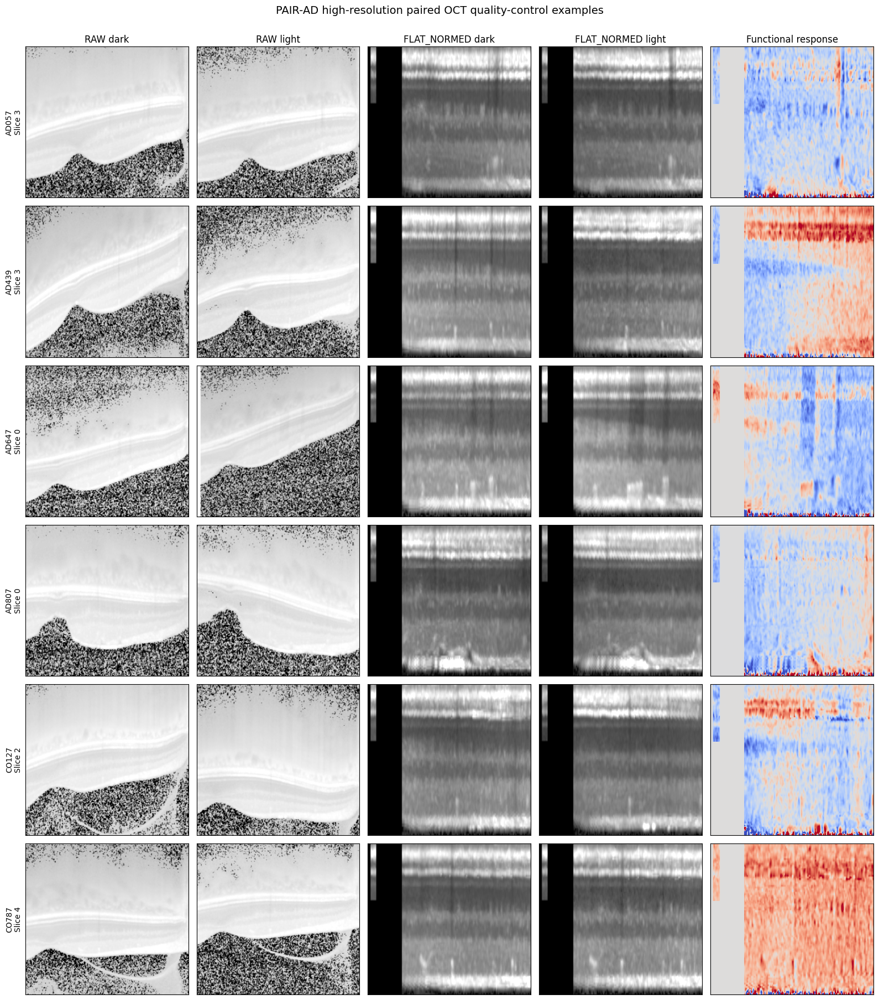

QC figure saved:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_highres_functional_QC.png

SAVING PAIR-AD HIGH-RESOLUTION DATASET
✓ Saved NPZ successfully reloaded and validated.

CELL 21 COMPLETE

High-resolution PAIR-AD dataset:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_highres_256_multiview.npz

High-resolution metadata:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_highres_256_multiview_metadata.csv

Subject summary:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_highres_256_subject_summary.csv

Shape audit:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_highres_shape_audit.csv

QC figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_highres_functional_QC.png

Final dataset:
  Participants       : 28
  Paired slice sets  : 135
  Resolution         : 256 x 256
  Primary views      :
      RAW DARK


In [29]:
# ==================================================================================================
# CELL 21 — PAIR-AD HIGH-RESOLUTION MULTIVIEW FUNCTIONAL DATASET
# UPDATED COMPLETE VERSION
#
# NOVEL RESEARCH TRACK
#
# NO MODEL TRAINING.
#
# PRIMARY DATA:
#
#   RAW DARK
#   RAW LIGHT
#
#   FLAT_NORMED DARK
#   FLAT_NORMED LIGHT
#
#   FLAT_NORMED FUNCTIONAL RESPONSE
#
# IMPORTANT IMPROVEMENTS:
#
#   1. Reads ORIGINAL .hdr/.img OCT volumes
#   2. Robust recursive HDR/IMG file resolution
#   3. Handles metadata containing only filenames
#   4. Handles duplicate HDR basenames using participant folder
#   5. Uses 256 x 256 instead of old 50 x 50
#   6. Preserves nested participant-exclusive folds
#   7. Verifies zero participant leakage
#   8. Audits DARK/LIGHT registration
#   9. Creates functional-response maps
#  10. Saves QC figure + NPZ + metadata
#
# ==================================================================================================

from pathlib import Path
from collections import defaultdict
import struct
import warnings
import random

import numpy as np
import pandas as pd

from PIL import Image

import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

OUTPUT_SIZE = 256

EPS_RESPONSE = 1.0

RANDOM_SEED = 2026


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


REPRO_DIR = (
    DATA_ROOT /
    "_paper_reproduction"
)


PAIR_AD_DIR = (
    REPRO_DIR /
    "PAIR_AD"
)


PAIR_AD_DIR.mkdir(
    parents=True,
    exist_ok=True
)


PAIR_TABLE_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_dark_light_pair_table.csv"
)


IMAGE_METADATA_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_nested_image_splits_2026.csv"
)


SUBJECT_SPLIT_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_nested_subject_splits_2026.csv"
)


OUTPUT_NPZ_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_multiview.npz"
)


OUTPUT_METADATA_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_multiview_metadata.csv"
)


OUTPUT_SUBJECT_SUMMARY_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_subject_summary.csv"
)


OUTPUT_SHAPE_AUDIT_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_shape_audit.csv"
)


QC_FIGURE_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_functional_QC.png"
)


print("=" * 120)
print("CELL 21 — PAIR-AD HIGH-RESOLUTION MULTIVIEW FUNCTIONAL DATASET")
print("=" * 120)


# ==================================================================================================
# 2. LOAD TABLES
# ==================================================================================================

assert PAIR_TABLE_PATH.exists(), (
    f"Missing:\n{PAIR_TABLE_PATH}"
)

assert IMAGE_METADATA_PATH.exists(), (
    f"Missing:\n{IMAGE_METADATA_PATH}"
)

assert SUBJECT_SPLIT_PATH.exists(), (
    f"Missing:\n{SUBJECT_SPLIT_PATH}"
)


pairs = pd.read_csv(
    PAIR_TABLE_PATH
)


image_meta = pd.read_csv(
    IMAGE_METADATA_PATH
)


subject_splits = pd.read_csv(
    SUBJECT_SPLIT_PATH
)


print(
    "\nPair-table rows:",
    len(pairs)
)


print(
    "Image metadata rows:",
    len(image_meta)
)


print(
    "Subject rows:",
    len(subject_splits)
)


assert len(pairs) == 540

assert len(image_meta) == 1100

assert len(subject_splits) == 28


# ==================================================================================================
# 3. STANDARDIZE TYPES
# ==================================================================================================

pairs[
    "folder_subject"
] = (
    pairs[
        "folder_subject"
    ]
    .astype(str)
)


pairs[
    "representation"
] = (
    pairs[
        "representation"
    ]
    .astype(str)
    .str.upper()
)


pairs[
    "slice_index"
] = (
    pairs[
        "slice_index"
    ]
    .astype(int)
)


pairs[
    "target"
] = (
    pairs[
        "target"
    ]
    .astype(int)
)


pairs[
    "outer_fold"
] = (
    pairs[
        "outer_fold"
    ]
    .astype(int)
)


image_meta[
    "dataset_index"
] = (
    image_meta[
        "dataset_index"
    ]
    .astype(int)
)


image_meta[
    "folder_subject"
] = (
    image_meta[
        "folder_subject"
    ]
    .astype(str)
)


image_meta[
    "representation"
] = (
    image_meta[
        "representation"
    ]
    .astype(str)
    .str.upper()
)


image_meta[
    "condition"
] = (
    image_meta[
        "condition"
    ]
    .astype(str)
    .str.upper()
)


# ==================================================================================================
# 4. VERIFY UNIQUE DATASET INDEX
# ==================================================================================================

assert (
    image_meta[
        "dataset_index"
    ].nunique()
    ==
    1100
)


assert image_meta[
    "dataset_index"
].min() >= 0


assert image_meta[
    "dataset_index"
].max() < 1100


meta_lookup = (
    image_meta
    .set_index(
        "dataset_index"
    )
)


print(
    "\n✓ Dataset-index metadata lookup created."
)


# ==================================================================================================
# 5. EXTRACT PRIMARY REPRESENTATIONS
#
# Primary model:
#
#       RAW
#       FLAT_NORMED
#
# MARKED deliberately excluded from primary model.
# ==================================================================================================

raw_pairs = (

    pairs[
        pairs[
            "representation"
        ] == "RAW"
    ]
    .copy()
)


fn_pairs = (

    pairs[
        pairs[
            "representation"
        ] == "FLAT_NORMED"
    ]
    .copy()
)


print("\n" + "=" * 120)
print("PRIMARY REPRESENTATION PAIRS")
print("=" * 120)


print(
    "RAW pairs        :",
    len(raw_pairs)
)


print(
    "FLAT_NORMED pairs:",
    len(fn_pairs)
)


assert len(raw_pairs) == 135

assert len(fn_pairs) == 135


# ==================================================================================================
# 6. MERGE RAW + FLAT_NORMED
#
# One row becomes:
#
#       one participant
#       one slice_index
#
# containing:
#
#       RAW DARK
#       RAW LIGHT
#       FN DARK
#       FN LIGHT
# ==================================================================================================

merge_keys = [

    "folder_subject",
    "target",
    "slice_index",
    "outer_fold"

]


raw_for_merge = (

    raw_pairs[
        [
            *merge_keys,
            "dark_dataset_index",
            "light_dataset_index"
        ]
    ]
    .rename(
        columns={

            "dark_dataset_index":
                "raw_dark_dataset_index",

            "light_dataset_index":
                "raw_light_dataset_index"
        }
    )
)


fn_for_merge = (

    fn_pairs[
        [
            *merge_keys,
            "dark_dataset_index",
            "light_dataset_index"
        ]
    ]
    .rename(
        columns={

            "dark_dataset_index":
                "fn_dark_dataset_index",

            "light_dataset_index":
                "fn_light_dataset_index"
        }
    )
)


samples = raw_for_merge.merge(

    fn_for_merge,

    on=merge_keys,

    how="inner",

    validate="one_to_one"
)


samples = (

    samples
    .sort_values(
        [
            "folder_subject",
            "slice_index"
        ]
    )
    .reset_index(
        drop=True
    )
)


print(
    "\nComplete RAW + FLAT_NORMED slice sets:",
    len(samples)
)


assert len(samples) == 135


# ==================================================================================================
# 7. ADD NESTED INNER FOLDS
# ==================================================================================================

required_split_columns = [

    "folder_subject",
    "outer_fold",
    "inner_fold_outer1",
    "inner_fold_outer2",
    "inner_fold_outer3"

]


missing_split_columns = [

    col

    for col in required_split_columns

    if col not in subject_splits.columns
]


if missing_split_columns:

    raise RuntimeError(

        "Missing nested split columns:\n"
        f"{missing_split_columns}"
    )


samples = samples.merge(

    subject_splits[
        [
            "folder_subject",
            "inner_fold_outer1",
            "inner_fold_outer2",
            "inner_fold_outer3"
        ]
    ],

    on="folder_subject",

    how="left",

    validate="many_to_one"
)


assert samples[
    [
        "inner_fold_outer1",
        "inner_fold_outer2",
        "inner_fold_outer3"
    ]
].notna().all().all()


for col in [

    "inner_fold_outer1",
    "inner_fold_outer2",
    "inner_fold_outer3"

]:

    samples[
        col
    ] = (
        samples[
            col
        ]
        .astype(int)
    )


# ==================================================================================================
# 8. BUILD COMPLETE HDR FILE INDEX
#
# Metadata stores only filenames such as:
#
#       AD057_DARK.hdr
#
# Actual file:
#
#       D:\...\AD057\AD057_DARK.hdr
#
# We recursively index all HDR files ONCE.
# ==================================================================================================

print("\n" + "=" * 120)
print("BUILDING ORIGINAL OCT FILE INDEX")
print("=" * 120)


ALL_HDR_FILES = list(
    DATA_ROOT.rglob("*.hdr")
)


print(
    "HDR files found:",
    len(
        ALL_HDR_FILES
    )
)


if len(
    ALL_HDR_FILES
) == 0:

    raise RuntimeError(

        "No .hdr files were found below:\n"
        f"{DATA_ROOT}"
    )


HDR_INDEX = defaultdict(
    list
)


for hdr_path in ALL_HDR_FILES:

    HDR_INDEX[
        hdr_path.name.lower()
    ].append(
        hdr_path.resolve()
    )


print(
    "Unique HDR basenames:",
    len(
        HDR_INDEX
    )
)


duplicate_hdr_names = {

    name:
        paths

    for name, paths in HDR_INDEX.items()

    if len(paths) > 1
}


print(
    "Duplicate HDR basenames:",
    len(
        duplicate_hdr_names
    )
)


print(
    "\nExample HDR locations:"
)


for path in ALL_HDR_FILES[:8]:

    print(
        " ",
        path
    )


# ==================================================================================================
# 9. ROBUST HDR RESOLVER
# ==================================================================================================

def resolve_hdr_path(
    path_value,
    folder_subject=None
):

    """
    Resolve metadata HDR path.

    Resolution priority:

    1. Supplied path already exists.
    2. DATA_ROOT / supplied path exists.
    3. Recursive basename lookup.
    4. If basename duplicated, use participant folder.
    """


    if pd.isna(
        path_value
    ):

        raise FileNotFoundError(
            "HDR metadata value is NaN."
        )


    path_text = str(
        path_value
    ).strip()


    p = Path(
        path_text
    )


    # ----------------------------------------------------------------------------------------------
    # Existing supplied path
    # ----------------------------------------------------------------------------------------------

    if p.exists():

        return p.resolve()


    # ----------------------------------------------------------------------------------------------
    # Relative to DATA_ROOT
    # ----------------------------------------------------------------------------------------------

    candidate = (
        DATA_ROOT /
        p
    )


    if candidate.exists():

        return candidate.resolve()


    # ----------------------------------------------------------------------------------------------
    # Recursive basename lookup
    # ----------------------------------------------------------------------------------------------

    basename = (
        p.name.lower()
    )


    matches = HDR_INDEX.get(
        basename,
        []
    )


    if len(matches) == 0:

        raise FileNotFoundError(

            "Could not resolve HDR file.\n\n"
            f"Metadata value : {path_value}\n"
            f"Participant    : {folder_subject}\n"
            f"Dataset root   : {DATA_ROOT}"
        )


    # ----------------------------------------------------------------------------------------------
    # Unique match
    # ----------------------------------------------------------------------------------------------

    if len(matches) == 1:

        return matches[
            0
        ]


    # ----------------------------------------------------------------------------------------------
    # Multiple matches:
    # try exact participant directory
    # ----------------------------------------------------------------------------------------------

    if folder_subject is not None:

        subject_text = str(
            folder_subject
        ).lower()


        exact_parent_matches = [

            candidate

            for candidate in matches

            if (
                candidate
                .parent
                .name
                .lower()
                ==
                subject_text
            )
        ]


        if len(
            exact_parent_matches
        ) == 1:

            return exact_parent_matches[
                0
            ]


        # ------------------------------------------------------------------------------------------
        # Fallback:
        # participant name somewhere in path
        # ------------------------------------------------------------------------------------------

        path_subject_matches = []


        for candidate in matches:

            parts_lower = [

                part.lower()

                for part in candidate.parts
            ]


            if subject_text in parts_lower:

                path_subject_matches.append(
                    candidate
                )


        if len(
            path_subject_matches
        ) == 1:

            return path_subject_matches[
                0
            ]


    # ----------------------------------------------------------------------------------------------
    # Still ambiguous
    # ----------------------------------------------------------------------------------------------

    raise RuntimeError(

        "Ambiguous HDR filename.\n\n"
        f"Filename    : {path_value}\n"
        f"Participant : {folder_subject}\n\n"
        "Possible matching files:\n"

        +

        "\n".join(
            str(x)
            for x in matches
        )
    )


# ==================================================================================================
# 10. ROBUST IMG RESOLVER
# ==================================================================================================

def resolve_img_path(
    hdr_path
):

    p = Path(
        str(
            hdr_path
        )
    )


    if not p.exists():

        p = resolve_hdr_path(
            hdr_path
        )


    candidates = [

        p.with_suffix(
            ".img"
        ),

        p.with_suffix(
            ".IMG"
        ),

        p.with_suffix(
            ".Img"
        )
    ]


    for candidate in candidates:

        if candidate.exists():

            return candidate.resolve()


    # ----------------------------------------------------------------------------------------------
    # Case-insensitive fallback
    # ----------------------------------------------------------------------------------------------

    for candidate in p.parent.iterdir():

        if (

            candidate.is_file()

            and

            candidate.stem.lower()
            ==
            p.stem.lower()

            and

            candidate.suffix.lower()
            ==
            ".img"

        ):

            return candidate.resolve()


    raise FileNotFoundError(

        "Matching IMG file was not found.\n\n"
        f"HDR path:\n{p}"
    )


# ==================================================================================================
# 11. GET HDR FROM DATASET INDEX
# ==================================================================================================

RESOLVED_HDR_CACHE = {}


def get_hdr_from_dataset_index(
    dataset_index
):

    dataset_index = int(
        dataset_index
    )


    if dataset_index in RESOLVED_HDR_CACHE:

        return RESOLVED_HDR_CACHE[
            dataset_index
        ]


    if dataset_index not in meta_lookup.index:

        raise KeyError(

            f"dataset_index={dataset_index} "
            f"not found in image metadata."
        )


    row = meta_lookup.loc[
        dataset_index
    ]


    hdr_name = row[
        "hdr_file"
    ]


    subject_name = row[
        "folder_subject"
    ]


    resolved = resolve_hdr_path(

        hdr_name,

        folder_subject=subject_name
    )


    RESOLVED_HDR_CACHE[
        dataset_index
    ] = resolved


    return resolved


# ==================================================================================================
# 12. PREFLIGHT PATH RESOLUTION
#
# Resolve all 4 files for all 135 paired samples before extraction.
# ==================================================================================================

print("\n" + "=" * 120)
print("PREFLIGHT ORIGINAL OCT PATH RESOLUTION")
print("=" * 120)


index_columns = [

    "raw_dark_dataset_index",
    "raw_light_dataset_index",
    "fn_dark_dataset_index",
    "fn_light_dataset_index"

]


unique_dataset_indices = np.unique(

    np.concatenate(
        [
            samples[
                col
            ].values.astype(int)

            for col in index_columns
        ]
    )
)


print(
    "Unique source image indices to resolve:",
    len(
        unique_dataset_indices
    )
)


path_errors = []


for dataset_index in unique_dataset_indices:

    try:

        hdr = get_hdr_from_dataset_index(
            int(
                dataset_index
            )
        )


        img = resolve_img_path(
            hdr
        )


        assert hdr.exists()

        assert img.exists()


    except Exception as e:

        path_errors.append(
            (
                int(
                    dataset_index
                ),
                str(
                    e
                )
            )
        )


if len(
    path_errors
) > 0:

    print(
        "\nPATH RESOLUTION ERRORS:"
    )


    for idx, error_text in path_errors[:20]:

        print(
            "\nDataset index:",
            idx
        )

        print(
            error_text
        )


    raise RuntimeError(

        f"{len(path_errors)} source files "
        f"could not be resolved."
    )


print(
    "✓ All required HDR/IMG source files resolved."
)


# ==================================================================================================
# 13. TEST ORIGINAL FAILED FILE
# ==================================================================================================

print("\n" + "=" * 120)
print("TESTING ORIGINAL OCT PATH RESOLUTION")
print("=" * 120)


test_index = int(

    samples.iloc[
        0
    ][
        "raw_dark_dataset_index"
    ]
)


test_hdr = get_hdr_from_dataset_index(
    test_index
)


test_img = resolve_img_path(
    test_hdr
)


print(
    "Dataset index:",
    test_index
)


print(
    "\nResolved HDR:"
)

print(
    test_hdr
)


print(
    "\nResolved IMG:"
)

print(
    test_img
)


assert test_hdr.exists()

assert test_img.exists()


print(
    "\n✓ ORIGINAL OCT PATH RESOLUTION PASSED."
)


# ==================================================================================================
# 14. ANALYZE 7.5 DATATYPE DEFINITIONS
# ==================================================================================================

ANALYZE_DTYPES = {

    2:
        np.uint8,

    4:
        np.int16,

    8:
        np.int32,

    16:
        np.float32,

    64:
        np.float64
}


# ==================================================================================================
# 15. ANALYZE HEADER PARSER
# ==================================================================================================

def parse_analyze_header(
    hdr_path
):

    hdr_path = Path(
        hdr_path
    )


    if not hdr_path.exists():

        hdr_path = resolve_hdr_path(
            hdr_path
        )


    with open(
        hdr_path,
        "rb"
    ) as f:

        header = f.read(
            348
        )


    if len(
        header
    ) < 348:

        raise RuntimeError(

            "Incomplete Analyze header:\n"
            f"{hdr_path}"
        )


    # ----------------------------------------------------------------------------------------------
    # Determine byte order
    # ----------------------------------------------------------------------------------------------

    little_size = struct.unpack(
        "<i",
        header[
            0:4
        ]
    )[0]


    big_size = struct.unpack(
        ">i",
        header[
            0:4
        ]
    )[0]


    if little_size == 348:

        endian = "<"


    elif big_size == 348:

        endian = ">"


    else:

        raise RuntimeError(

            "Could not determine Analyze endian.\n\n"
            f"File: {hdr_path}\n"
            f"Little-endian sizeof_hdr = {little_size}\n"
            f"Big-endian sizeof_hdr    = {big_size}"
        )


    # ----------------------------------------------------------------------------------------------
    # Dimensions
    # ----------------------------------------------------------------------------------------------

    dims = struct.unpack(

        endian + "8h",

        header[
            40:56
        ]
    )


    datatype = struct.unpack(

        endian + "h",

        header[
            70:72
        ]
    )[0]


    bitpix = struct.unpack(

        endian + "h",

        header[
            72:74
        ]
    )[0]


    ndim = int(
        dims[
            0
        ]
    )


    x = int(
        dims[
            1
        ]
    )


    y = int(
        dims[
            2
        ]
    )


    z = (

        int(
            dims[
                3
            ]
        )

        if ndim >= 3

        else 1
    )


    if datatype not in ANALYZE_DTYPES:

        raise RuntimeError(

            f"Unsupported Analyze datatype={datatype}\n"
            f"File: {hdr_path}"
        )


    base_dtype = ANALYZE_DTYPES[
        datatype
    ]


    if np.dtype(
        base_dtype
    ).itemsize > 1:

        dtype = np.dtype(
            base_dtype
        ).newbyteorder(
            endian
        )


    else:

        dtype = np.dtype(
            base_dtype
        )


    return {

        "hdr_path":
            hdr_path,

        "endian":
            endian,

        "x":
            x,

        "y":
            y,

        "z":
            z,

        "datatype":
            datatype,

        "bitpix":
            bitpix,

        "dtype":
            dtype
    }


# ==================================================================================================
# 16. READ ONE ORIGINAL OCT SLICE
# ==================================================================================================

def read_analyze_slice(
    hdr_path,
    slice_index
):

    info = parse_analyze_header(
        hdr_path
    )


    img_path = resolve_img_path(
        info[
            "hdr_path"
        ]
    )


    slice_index = int(
        slice_index
    )


    if not (

        0
        <=
        slice_index
        <
        info[
            "z"
        ]

    ):

        raise IndexError(

            f"slice_index={slice_index} "
            f"outside valid range "
            f"0-{info['z']-1}\n"
            f"File: {img_path}"
        )


    expected_voxels = (

        info[
            "x"
        ]
        *
        info[
            "y"
        ]
        *
        info[
            "z"
        ]
    )


    expected_bytes = (

        expected_voxels
        *
        np.dtype(
            info[
                "dtype"
            ]
        ).itemsize
    )


    actual_bytes = (
        img_path.stat().st_size
    )


    if actual_bytes < expected_bytes:

        raise RuntimeError(

            "IMG file is smaller than expected.\n\n"
            f"File          : {img_path}\n"
            f"Expected bytes: {expected_bytes}\n"
            f"Actual bytes  : {actual_bytes}"
        )


    # ----------------------------------------------------------------------------------------------
    # Analyze storage:
    #
    # x fastest
    # then y
    # then z
    #
    # reshape:
    #
    #       z x y x x
    # ----------------------------------------------------------------------------------------------

    volume = np.memmap(

        img_path,

        dtype=info[
            "dtype"
        ],

        mode="r",

        shape=(

            info[
                "z"
            ],

            info[
                "y"
            ],

            info[
                "x"
            ]
        )
    )


    image = np.array(

        volume[
            slice_index
        ],

        dtype=np.float32,

        copy=True
    )


    return (
        image,
        info
    )


# ==================================================================================================
# 17. FLOAT IMAGE RESIZE
# ==================================================================================================

try:

    PIL_BILINEAR = (
        Image
        .Resampling
        .BILINEAR
    )


except AttributeError:

    PIL_BILINEAR = (
        Image
        .BILINEAR
    )


def resize_float_image(
    image,
    size=OUTPUT_SIZE
):

    image = np.asarray(
        image,
        dtype=np.float32
    )


    pil_image = Image.fromarray(
        image,
        mode="F"
    )


    resized = pil_image.resize(

        (
            size,
            size
        ),

        resample=PIL_BILINEAR
    )


    return np.asarray(
        resized,
        dtype=np.float32
    )


# ==================================================================================================
# 18. ALLOCATE ARRAYS
# ==================================================================================================

N = len(
    samples
)


raw_dark = np.zeros(

    (
        N,
        OUTPUT_SIZE,
        OUTPUT_SIZE
    ),

    dtype=np.float32
)


raw_light = np.zeros_like(
    raw_dark
)


flat_normed_dark = np.zeros_like(
    raw_dark
)


flat_normed_light = np.zeros_like(
    raw_dark
)


functional_response = np.zeros_like(
    raw_dark
)


# ==================================================================================================
# 19. EXTRACT ORIGINAL HIGH-RESOLUTION SLICES
# ==================================================================================================

print("\n" + "=" * 120)
print("EXTRACTING ORIGINAL HIGH-RESOLUTION OCT SLICES")
print("=" * 120)


shape_audit_records = []


raw_datatypes = set()

fn_datatypes = set()


for i, row in samples.iterrows():

    # ----------------------------------------------------------------------------------------------
    # RAW DARK
    # ----------------------------------------------------------------------------------------------

    raw_d_hdr = get_hdr_from_dataset_index(

        row[
            "raw_dark_dataset_index"
        ]
    )


    raw_d, raw_d_info = read_analyze_slice(

        raw_d_hdr,

        row[
            "slice_index"
        ]
    )


    # ----------------------------------------------------------------------------------------------
    # RAW LIGHT
    # ----------------------------------------------------------------------------------------------

    raw_l_hdr = get_hdr_from_dataset_index(

        row[
            "raw_light_dataset_index"
        ]
    )


    raw_l, raw_l_info = read_analyze_slice(

        raw_l_hdr,

        row[
            "slice_index"
        ]
    )


    # ----------------------------------------------------------------------------------------------
    # FLAT_NORMED DARK
    # ----------------------------------------------------------------------------------------------

    fn_d_hdr = get_hdr_from_dataset_index(

        row[
            "fn_dark_dataset_index"
        ]
    )


    fn_d, fn_d_info = read_analyze_slice(

        fn_d_hdr,

        row[
            "slice_index"
        ]
    )


    # ----------------------------------------------------------------------------------------------
    # FLAT_NORMED LIGHT
    # ----------------------------------------------------------------------------------------------

    fn_l_hdr = get_hdr_from_dataset_index(

        row[
            "fn_light_dataset_index"
        ]
    )


    fn_l, fn_l_info = read_analyze_slice(

        fn_l_hdr,

        row[
            "slice_index"
        ]
    )


    raw_datatypes.add(
        raw_d_info[
            "datatype"
        ]
    )


    raw_datatypes.add(
        raw_l_info[
            "datatype"
        ]
    )


    fn_datatypes.add(
        fn_d_info[
            "datatype"
        ]
    )


    fn_datatypes.add(
        fn_l_info[
            "datatype"
        ]
    )


    # ----------------------------------------------------------------------------------------------
    # Shape audit
    # ----------------------------------------------------------------------------------------------

    raw_pair_shape_match = (
        raw_d.shape
        ==
        raw_l.shape
    )


    fn_pair_shape_match = (
        fn_d.shape
        ==
        fn_l.shape
    )


    if not raw_pair_shape_match:

        raise RuntimeError(

            "RAW DARK/LIGHT shape mismatch.\n"
            f"Subject: {row['folder_subject']}\n"
            f"Slice  : {row['slice_index']}\n"
            f"DARK   : {raw_d.shape}\n"
            f"LIGHT  : {raw_l.shape}"
        )


    if not fn_pair_shape_match:

        raise RuntimeError(

            "FLAT_NORMED DARK/LIGHT shape mismatch.\n"
            f"Subject: {row['folder_subject']}\n"
            f"Slice  : {row['slice_index']}\n"
            f"DARK   : {fn_d.shape}\n"
            f"LIGHT  : {fn_l.shape}"
        )


    shape_audit_records.append(
        {

            "sample_index":
                i,

            "folder_subject":
                row[
                    "folder_subject"
                ],

            "target":
                int(
                    row[
                        "target"
                    ]
                ),

            "slice_index":
                int(
                    row[
                        "slice_index"
                    ]
                ),

            "raw_height":
                raw_d.shape[
                    0
                ],

            "raw_width":
                raw_d.shape[
                    1
                ],

            "fn_height":
                fn_d.shape[
                    0
                ],

            "fn_width":
                fn_d.shape[
                    1
                ],

            "raw_pair_shape_match":
                raw_pair_shape_match,

            "fn_pair_shape_match":
                fn_pair_shape_match
        }
    )


    # ----------------------------------------------------------------------------------------------
    # Resize original OCT -> 256 x 256
    # ----------------------------------------------------------------------------------------------

    raw_d_256 = resize_float_image(
        raw_d
    )


    raw_l_256 = resize_float_image(
        raw_l
    )


    fn_d_256 = resize_float_image(
        fn_d
    )


    fn_l_256 = resize_float_image(
        fn_l
    )


    # ----------------------------------------------------------------------------------------------
    # RAW fixed int16 scaling
    #
    # Archive RAW volumes are expected to be int16.
    #
    #     -32768 -> 0
    #      32767 -> 1
    #
    # No train/test statistics are used.
    # ----------------------------------------------------------------------------------------------

    raw_d_scaled = (

        raw_d_256
        +
        32768.0

    ) / 65535.0


    raw_l_scaled = (

        raw_l_256
        +
        32768.0

    ) / 65535.0


    raw_d_scaled = np.clip(

        raw_d_scaled,

        0.0,

        1.0
    )


    raw_l_scaled = np.clip(

        raw_l_scaled,

        0.0,

        1.0
    )


    # ----------------------------------------------------------------------------------------------
    # FLAT_NORMED FUNCTIONAL RESPONSE
    #
    # Symmetric normalized response:
    #
    #
    #                  2 (LIGHT - DARK)
    #       R = --------------------------------
    #            |LIGHT| + |DARK| + epsilon
    #
    #
    # Approximate range:
    #
    #       -2 to +2
    #
    # Positive:
    #       LIGHT greater than DARK
    #
    # Negative:
    #       LIGHT lower than DARK
    #
    # This is an explicit functional-response channel.
    #
    # Later PAIR-AD will ALSO learn:
    #
    #       Δz = z_LIGHT - z_DARK
    #
    # in latent feature space.
    # ----------------------------------------------------------------------------------------------

    response = (

        2.0

        *

        (
            fn_l_256
            -
            fn_d_256
        )

    ) / (

        np.abs(
            fn_l_256
        )

        +

        np.abs(
            fn_d_256
        )

        +

        EPS_RESPONSE
    )


    response = np.clip(

        response,

        -2.0,

        2.0
    )


    # ----------------------------------------------------------------------------------------------
    # Save arrays
    # ----------------------------------------------------------------------------------------------

    raw_dark[
        i
    ] = raw_d_scaled


    raw_light[
        i
    ] = raw_l_scaled


    flat_normed_dark[
        i
    ] = fn_d_256


    flat_normed_light[
        i
    ] = fn_l_256


    functional_response[
        i
    ] = response


    if (

        (i + 1) % 20 == 0

        or

        (i + 1) == N

    ):

        print(

            f"Processed "
            f"{i + 1:3d}/{N} "
            f"paired slice sets"
        )


shape_audit_df = pd.DataFrame(
    shape_audit_records
)


shape_audit_df.to_csv(

    OUTPUT_SHAPE_AUDIT_PATH,

    index=False
)


print(
    "\nRAW Analyze datatype codes:",
    sorted(
        raw_datatypes
    )
)


print(
    "FLAT_NORMED Analyze datatype codes:",
    sorted(
        fn_datatypes
    )
)


# ==================================================================================================
# 20. ARRAY AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("HIGH-RESOLUTION ARRAY AUDIT")
print("=" * 120)


arrays_to_check = {

    "RAW DARK":
        raw_dark,

    "RAW LIGHT":
        raw_light,

    "FLAT_NORMED DARK":
        flat_normed_dark,

    "FLAT_NORMED LIGHT":
        flat_normed_light,

    "FUNCTIONAL RESPONSE":
        functional_response
}


for name, array in arrays_to_check.items():

    assert np.isfinite(
        array
    ).all()


    print(
        f"\n{name}"
    )


    print(
        "  shape :",
        array.shape
    )


    print(
        "  min   :",
        float(
            array.min()
        )
    )


    print(
        "  max   :",
        float(
            array.max()
        )
    )


    print(
        "  mean  :",
        float(
            array.mean()
        )
    )


    print(
        "  std   :",
        float(
            array.std()
        )
    )


assert raw_dark.shape == (
    135,
    256,
    256
)


assert raw_light.shape == (
    135,
    256,
    256
)


assert flat_normed_dark.shape == (
    135,
    256,
    256
)


assert flat_normed_light.shape == (
    135,
    256,
    256
)


assert functional_response.shape == (
    135,
    256,
    256
)


# ==================================================================================================
# 21. HIGH-RES FLAT_NORMED DARK/LIGHT CORRELATION
# ==================================================================================================

highres_r = []


for i in range(
    N
):

    d = flat_normed_dark[
        i
    ].ravel()


    l = flat_normed_light[
        i
    ].ravel()


    if (

        np.std(
            d
        ) > 1e-12

        and

        np.std(
            l
        ) > 1e-12

    ):

        r = np.corrcoef(
            d,
            l
        )[0, 1]


    else:

        r = np.nan


    highres_r.append(
        r
    )


samples[
    "fn_highres_dark_light_r"
] = highres_r


print("\n" + "=" * 120)
print("HIGH-RES FLAT_NORMED PAIR CORRELATION")
print("=" * 120)


print(
    "Mean   :",
    float(
        np.nanmean(
            highres_r
        )
    )
)


print(
    "Median :",
    float(
        np.nanmedian(
            highres_r
        )
    )
)


print(
    "SD     :",
    float(
        np.nanstd(
            highres_r,
            ddof=1
        )
    )
)


print(
    "Minimum:",
    float(
        np.nanmin(
            highres_r
        )
    )
)


print(
    "Maximum:",
    float(
        np.nanmax(
            highres_r
        )
    )
)


# ==================================================================================================
# 22. OPTIONAL REGISTRATION AUDIT
#
# IMPORTANT:
#
# This estimates translation only.
#
# It DOES NOT modify images.
# ==================================================================================================

print("\n" + "=" * 120)
print("OPTIONAL HIGH-RES REGISTRATION AUDIT")
print("=" * 120)


registration_available = False


try:

    from skimage.registration import (
        phase_cross_correlation
    )

    registration_available = True


except Exception as e:

    print(
        "scikit-image registration unavailable:"
    )

    print(
        str(
            e
        )
    )


if registration_available:

    shifts_y = []

    shifts_x = []

    shift_magnitude = []

    registration_errors = []


    for i in range(
        N
    ):

        d = flat_normed_dark[
            i
        ]


        l = flat_normed_light[
            i
        ]


        shift, error, phase_difference = (
            phase_cross_correlation(

                d,

                l,

                upsample_factor=10
            )
        )


        sy = float(
            shift[
                0
            ]
        )


        sx = float(
            shift[
                1
            ]
        )


        magnitude = float(

            np.sqrt(

                sy ** 2

                +

                sx ** 2
            )
        )


        shifts_y.append(
            sy
        )


        shifts_x.append(
            sx
        )


        shift_magnitude.append(
            magnitude
        )


        registration_errors.append(
            float(
                error
            )
        )


    samples[
        "registration_shift_y"
    ] = shifts_y


    samples[
        "registration_shift_x"
    ] = shifts_x


    samples[
        "registration_shift_magnitude"
    ] = shift_magnitude


    samples[
        "registration_error"
    ] = registration_errors


    print(
        "Median shift magnitude:",
        f"{np.median(shift_magnitude):.3f} px"
    )


    print(
        "Mean shift magnitude  :",
        f"{np.mean(shift_magnitude):.3f} px"
    )


    print(
        "95th percentile       :",
        f"{np.percentile(shift_magnitude, 95):.3f} px"
    )


    print(
        "Maximum               :",
        f"{np.max(shift_magnitude):.3f} px"
    )


else:

    print(
        "Registration-shift audit skipped."
    )


# ==================================================================================================
# 23. SUBJECT-LEVEL SUMMARY
# ==================================================================================================

subject_summary = (

    samples
    .groupby(
        [
            "folder_subject",
            "target",
            "outer_fold"
        ],
        as_index=False
    )
    .agg(

        paired_slices=(
            "slice_index",
            "size"
        ),

        mean_pair_correlation=(
            "fn_highres_dark_light_r",
            "mean"
        ),

        median_pair_correlation=(
            "fn_highres_dark_light_r",
            "median"
        )
    )
)


print("\n" + "=" * 120)
print("SUBJECT-LEVEL HIGH-RES DATASET")
print("=" * 120)


print(
    subject_summary.to_string(
        index=False
    )
)


print(
    "\nPaired slices per participant:"
)


print(

    subject_summary[
        "paired_slices"
    ]
    .value_counts()
    .sort_index()
)


assert len(
    subject_summary
) == 28


assert set(

    subject_summary[
        "paired_slices"
    ].unique()

).issubset(
    {
        4,
        5
    }
)


# ==================================================================================================
# 24. CLASS BALANCE
# ==================================================================================================

print("\n" + "=" * 120)
print("HIGH-RES PAIRED-SLICE CLASS DISTRIBUTION")
print("=" * 120)


print(
    samples[
        "target"
    ]
    .value_counts()
    .sort_index()
)


# ==================================================================================================
# 25. OUTER FOLD DISTRIBUTION
# ==================================================================================================

print("\n" + "=" * 120)
print("HIGH-RES PAIRED-SLICE DISTRIBUTION BY OUTER FOLD")
print("=" * 120)


fold_distribution = pd.crosstab(

    samples[
        "outer_fold"
    ],

    samples[
        "target"
    ]
)


print(
    fold_distribution
)


# ==================================================================================================
# 26. PARTICIPANT LEAKAGE RECHECK
# ==================================================================================================

print("\n" + "=" * 120)
print("HIGH-RES PARTICIPANT LEAKAGE RECHECK")
print("=" * 120)


for fold in [
    1,
    2,
    3
]:

    train_subjects = set(

        samples.loc[
            samples[
                "outer_fold"
            ] != fold,
            "folder_subject"
        ].unique()
    )


    test_subjects = set(

        samples.loc[
            samples[
                "outer_fold"
            ] == fold,
            "folder_subject"
        ].unique()
    )


    overlap = (

        train_subjects
        &
        test_subjects
    )


    print(

        f"Outer fold {fold}: "
        f"participant overlap = "
        f"{len(overlap)}"
    )


    assert len(
        overlap
    ) == 0


print(
    "\n✓ ZERO participant leakage remains."
)


# ==================================================================================================
# 27. VERIFY INNER SPLITS ALSO REMAIN SUBJECT EXCLUSIVE
# ==================================================================================================

print("\n" + "=" * 120)
print("HIGH-RES INNER-FOLD LEAKAGE RECHECK")
print("=" * 120)


for outer_fold in [
    1,
    2,
    3
]:

    inner_col = (
        f"inner_fold_outer{outer_fold}"
    )


    outer_training_pool = samples[
        samples[
            "outer_fold"
        ] != outer_fold
    ]


    for inner_fold in [
        1,
        2,
        3
    ]:

        inner_train_subjects = set(

            outer_training_pool.loc[
                outer_training_pool[
                    inner_col
                ] != inner_fold,
                "folder_subject"
            ].unique()
        )


        inner_val_subjects = set(

            outer_training_pool.loc[
                outer_training_pool[
                    inner_col
                ] == inner_fold,
                "folder_subject"
            ].unique()
        )


        overlap = (

            inner_train_subjects
            &
            inner_val_subjects
        )


        print(

            f"Outer {outer_fold} | "
            f"Inner {inner_fold}: "
            f"participant overlap = "
            f"{len(overlap)}"
        )


        assert len(
            overlap
        ) == 0


print(
    "\n✓ ZERO participant leakage in all inner folds."
)


# ==================================================================================================
# 28. FUNCTIONAL RESPONSE SUMMARY
# ==================================================================================================

print("\n" + "=" * 120)
print("FUNCTIONAL RESPONSE SUMMARY")
print("=" * 120)


sample_response_mean = functional_response.mean(
    axis=(
        1,
        2
    )
)


sample_response_abs_mean = np.abs(
    functional_response
).mean(
    axis=(
        1,
        2
    )
)


samples[
    "functional_response_mean"
] = sample_response_mean


samples[
    "functional_response_abs_mean"
] = sample_response_abs_mean


for target_value, class_name in [

    (
        0,
        "Control"
    ),

    (
        1,
        "Alzheimer"
    )

]:

    mask = (
        samples[
            "target"
        ].values
        ==
        target_value
    )


    print(
        f"\n{class_name}"
    )


    print(

        "  Mean signed response :",
        float(
            sample_response_mean[
                mask
            ].mean()
        )
    )


    print(

        "  Mean absolute response:",
        float(
            sample_response_abs_mean[
                mask
            ].mean()
        )
    )


print(
    "\nNOTE:"
)

print(
    "These values are descriptive only."
)

print(
    "No statistical or model conclusion is made here."
)


# ==================================================================================================
# 29. QC FIGURE
#
# Deterministic random examples.
#
# Diagnosis is NOT used to select examples.
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING TECHNICAL QC FIGURE")
print("=" * 120)


rng = np.random.default_rng(
    RANDOM_SEED
)


qc_count = min(
    6,
    N
)


qc_indices = np.sort(

    rng.choice(

        np.arange(
            N
        ),

        size=qc_count,

        replace=False
    )
)


fig, axes = plt.subplots(

    qc_count,

    5,

    figsize=(
        16,
        3 * qc_count
    )
)


if qc_count == 1:

    axes = np.expand_dims(
        axes,
        axis=0
    )


titles = [

    "RAW dark",

    "RAW light",

    "FLAT_NORMED dark",

    "FLAT_NORMED light",

    "Functional response"
]


for row_number, sample_index in enumerate(
    qc_indices
):

    images = [

        raw_dark[
            sample_index
        ],

        raw_light[
            sample_index
        ],

        flat_normed_dark[
            sample_index
        ],

        flat_normed_light[
            sample_index
        ],

        functional_response[
            sample_index
        ]
    ]


    for col_number, image in enumerate(
        images
    ):

        ax = axes[
            row_number,
            col_number
        ]


        if col_number < 4:

            low = np.percentile(
                image,
                1
            )


            high = np.percentile(
                image,
                99
            )


            if high <= low:

                high = (
                    low
                    +
                    1e-6
                )


            ax.imshow(

                image,

                cmap="gray",

                vmin=low,

                vmax=high,

                aspect="auto"
            )


        else:

            abs_limit = np.percentile(

                np.abs(
                    image
                ),

                99
            )


            abs_limit = max(
                abs_limit,
                1e-6
            )


            ax.imshow(

                image,

                cmap="coolwarm",

                vmin=-abs_limit,

                vmax=abs_limit,

                aspect="auto"
            )


        if row_number == 0:

            ax.set_title(
                titles[
                    col_number
                ]
            )


        if col_number == 0:

            subject_name = samples.loc[
                sample_index,
                "folder_subject"
            ]


            slice_number = samples.loc[
                sample_index,
                "slice_index"
            ]


            ax.set_ylabel(

                f"{subject_name}\n"
                f"Slice {slice_number}"
            )


        ax.set_xticks(
            []
        )


        ax.set_yticks(
            []
        )


plt.suptitle(

    "PAIR-AD high-resolution paired OCT quality-control examples",

    fontsize=14,

    y=1.002
)


plt.tight_layout()


plt.savefig(

    QC_FIGURE_PATH,

    dpi=300,

    bbox_inches="tight"
)


plt.show()


print(
    "QC figure saved:"
)

print(
    QC_FIGURE_PATH
)


# ==================================================================================================
# 30. SAVE HIGH-RESOLUTION DATASET
# ==================================================================================================

print("\n" + "=" * 120)
print("SAVING PAIR-AD HIGH-RESOLUTION DATASET")
print("=" * 120)


np.savez_compressed(

    OUTPUT_NPZ_PATH,

    raw_dark=raw_dark,

    raw_light=raw_light,

    flat_normed_dark=flat_normed_dark,

    flat_normed_light=flat_normed_light,

    functional_response=functional_response,

    y=samples[
        "target"
    ].values.astype(
        np.int64
    ),

    subject=samples[
        "folder_subject"
    ].values.astype(str),

    slice_index=samples[
        "slice_index"
    ].values.astype(
        np.int64
    ),

    outer_fold=samples[
        "outer_fold"
    ].values.astype(
        np.int64
    ),

    inner_fold_outer1=samples[
        "inner_fold_outer1"
    ].values.astype(
        np.int64
    ),

    inner_fold_outer2=samples[
        "inner_fold_outer2"
    ].values.astype(
        np.int64
    ),

    inner_fold_outer3=samples[
        "inner_fold_outer3"
    ].values.astype(
        np.int64
    )
)


samples.to_csv(

    OUTPUT_METADATA_PATH,

    index=False
)


subject_summary.to_csv(

    OUTPUT_SUBJECT_SUMMARY_PATH,

    index=False
)


# ==================================================================================================
# 31. RELOAD + VALIDATE SAVED FILE
# ==================================================================================================

saved = np.load(

    OUTPUT_NPZ_PATH,

    allow_pickle=True
)


required_npz_keys = [

    "raw_dark",
    "raw_light",
    "flat_normed_dark",
    "flat_normed_light",
    "functional_response",
    "y",
    "subject",
    "slice_index",
    "outer_fold",
    "inner_fold_outer1",
    "inner_fold_outer2",
    "inner_fold_outer3"

]


for key in required_npz_keys:

    assert key in saved.keys(), (
        f"Missing saved NPZ key: {key}"
    )


assert saved[
    "raw_dark"
].shape == (
    135,
    256,
    256
)


assert saved[
    "raw_light"
].shape == (
    135,
    256,
    256
)


assert saved[
    "flat_normed_dark"
].shape == (
    135,
    256,
    256
)


assert saved[
    "flat_normed_light"
].shape == (
    135,
    256,
    256
)


assert saved[
    "functional_response"
].shape == (
    135,
    256,
    256
)


assert len(
    saved[
        "y"
    ]
) == 135


assert len(
    np.unique(
        saved[
            "subject"
        ]
    )
) == 28


assert set(

    np.unique(
        saved[
            "outer_fold"
        ]
    )

) == {
    1,
    2,
    3
}


print(
    "✓ Saved NPZ successfully reloaded and validated."
)


# ==================================================================================================
# 32. FINAL SUMMARY
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 21 COMPLETE")
print("=" * 120)


print(
    "\nHigh-resolution PAIR-AD dataset:"
)

print(
    OUTPUT_NPZ_PATH
)


print(
    "\nHigh-resolution metadata:"
)

print(
    OUTPUT_METADATA_PATH
)


print(
    "\nSubject summary:"
)

print(
    OUTPUT_SUBJECT_SUMMARY_PATH
)


print(
    "\nShape audit:"
)

print(
    OUTPUT_SHAPE_AUDIT_PATH
)


print(
    "\nQC figure:"
)

print(
    QC_FIGURE_PATH
)


print(
    "\nFinal dataset:"
)


print(
    "  Participants       :",
    len(
        np.unique(
            saved[
                "subject"
            ]
        )
    )
)


print(
    "  Paired slice sets  :",
    len(
        saved[
            "y"
        ]
    )
)


print(
    "  Resolution         :",
    f"{OUTPUT_SIZE} x {OUTPUT_SIZE}"
)


print(
    "  Primary views      :"
)


print(
    "      RAW DARK"
)


print(
    "      RAW LIGHT"
)


print(
    "      FLAT_NORMED DARK"
)


print(
    "      FLAT_NORMED LIGHT"
)


print(
    "      Functional response"
)


print(
    "\nNO MODEL TRAINING WAS PERFORMED."
)


print(
    "\nSEND ME THESE OUTPUTS:"
)


print(
    "  1. PREFLIGHT ORIGINAL OCT PATH RESOLUTION"
)


print(
    "  2. TESTING ORIGINAL OCT PATH RESOLUTION"
)


print(
    "  3. RAW / FLAT_NORMED Analyze datatype codes"
)


print(
    "  4. HIGH-RESOLUTION ARRAY AUDIT"
)


print(
    "  5. HIGH-RES FLAT_NORMED PAIR CORRELATION"
)


print(
    "  6. OPTIONAL HIGH-RES REGISTRATION AUDIT"
)


print(
    "  7. SUBJECT-LEVEL HIGH-RES DATASET"
)


print(
    "  8. HIGH-RES PAIRED-SLICE DISTRIBUTION BY OUTER FOLD"
)


print(
    "  9. HIGH-RES PARTICIPANT LEAKAGE RECHECK"
)


print(
    " 10. HIGH-RES INNER-FOLD LEAKAGE RECHECK"
)


print(
    " 11. FUNCTIONAL RESPONSE SUMMARY"
)


print(
    " 12. CELL 21 COMPLETE"
)

CELL 22 — PAIR-AD ARTIFACT-SAFE FUNCTIONAL RESPONSE + PATIENT BAGS

Samples: 135
Participants: 28
Image size: (256, 256)

CREATING SAMPLE-LOCAL FUNCTIONAL MASKS

FUNCTIONAL MASK COVERAGE
Mean coverage  : 71.94%
Median coverage: 72.00%
Minimum        : 68.98%
Maximum        : 73.27%

BOUNDARY-RESPONSE AUDIT
Original response:
  Mean border fraction: 17.36%
  Median border fraction: 17.29%

Clean response:
  Mean border fraction: 5.88%
  Median border fraction: 5.77%

Reduction:
  Mean relative reduction: 66.16%

CLEAN FUNCTIONAL RESPONSE DISTRIBUTION
Valid response pixels: 6364623
Mean   : -0.0035488668363541365
Median : -0.0034900791943073273
SD     : 0.18108955025672913
1st percentile : -0.46381593465805054
99th percentile: 0.42259058952331574

BUILDING PATIENT-LEVEL MIL BAGS
folder_subject  target  outer_fold  n_slices      sample_indices slice_indices  inner_fold_outer1  inner_fold_outer2  inner_fold_outer3
         AD057       1           1         5           0,1,2,3,4     0,1,2,3

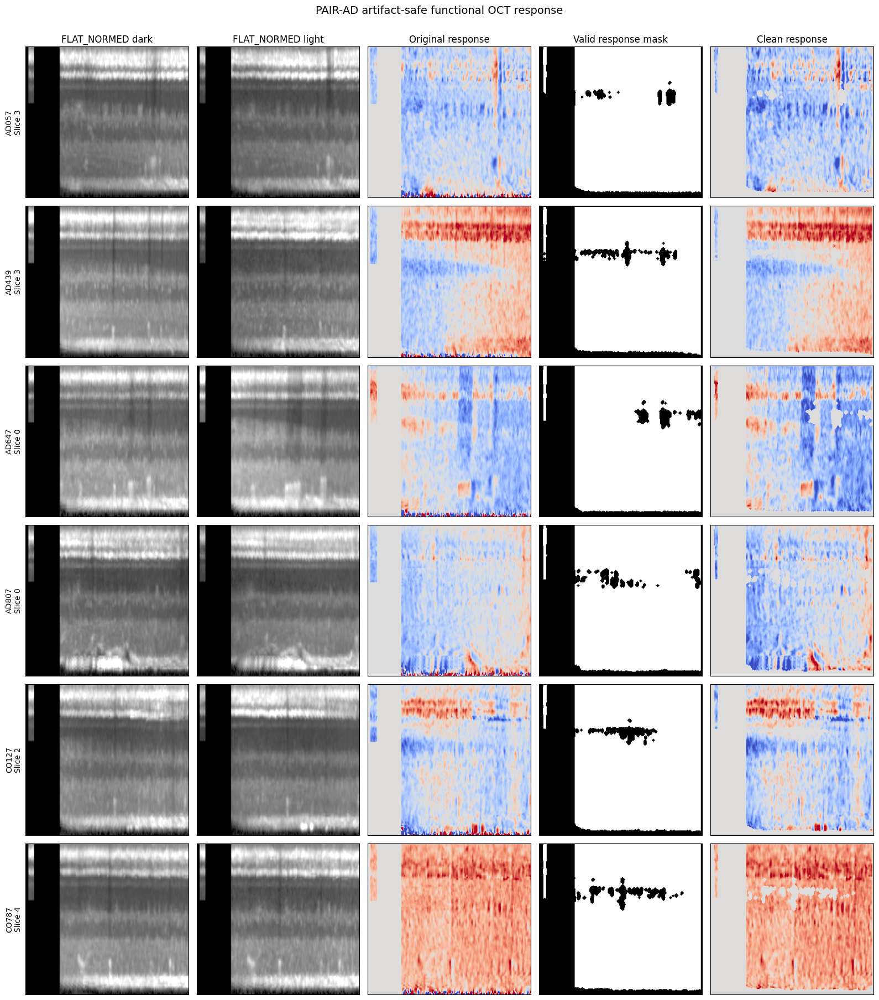

Saved QC figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_clean_functional_response_QC.png

CELL 22 COMPLETE

Clean PAIR-AD dataset:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_highres_256_clean_functional.npz

Patient-bag table:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_patient_bags_2026.csv

Mask audit:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_functional_mask_audit.csv

QC figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_clean_functional_response_QC.png

FINAL STRUCTURE:
  28 patient bags
  14 Control
  14 Alzheimer
  4-5 paired OCT slices per patient
  256 x 256
  RAW DARK + LIGHT
  FLAT_NORMED DARK + LIGHT
  Artifact-safe functional response

NO MODEL TRAINING WAS PERFORMED.

SEND ME:
  1. FUNCTIONAL MASK COVERAGE
  2. BOUNDARY-RESPONSE AUDIT
  3. CLEAN FUNCTIONAL RESPONSE DISTRIBUTION
  4. PATIENT-LEVEL MIL 

In [30]:
# ==================================================================================================
# CELL 22 — PAIR-AD ARTIFACT-SAFE FUNCTIONAL RESPONSE + PATIENT BAG CONSTRUCTION
#
# NOVEL RESEARCH TRACK
#
# NO MODEL TRAINING.
#
# PURPOSE
# -------
#
# 1. Remove low-signal/background regions from functional-response maps.
# 2. Prevent preprocessing boundaries from becoming model shortcuts.
# 3. Preserve biologically meaningful LIGHT/DARK changes.
# 4. Build explicit patient-level bags for hierarchical MIL.
# 5. Verify all folds remain leakage-free.
#
#
# INPUT:
#
#     PAIR_AD_highres_256_multiview.npz
#
#
# OUTPUT:
#
#     RAW DARK
#     RAW LIGHT
#     FLAT_NORMED DARK
#     FLAT_NORMED LIGHT
#     original functional response
#     valid retinal-response mask
#     CLEAN functional response
#
#     + patient-level bag metadata
#
#
# IMPORTANT:
#
# No AD/Control label is used to create the mask.
#
# Masking is sample-local and therefore does not estimate
# preprocessing parameters from outer-test participants.
#
# ==================================================================================================

from pathlib import Path
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

RANDOM_SEED = 2026

SIGNAL_PERCENTILE = 5.0

EROSION_ITERATIONS = 2

BORDER_WIDTH = 8


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


INPUT_NPZ_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_multiview.npz"
)


INPUT_METADATA_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_multiview_metadata.csv"
)


OUTPUT_NPZ_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)


OUTPUT_METADATA_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional_metadata.csv"
)


PATIENT_BAG_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_patient_bags_2026.csv"
)


MASK_AUDIT_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_functional_mask_audit.csv"
)


QC_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_clean_functional_response_QC.png"
)


print("=" * 120)
print("CELL 22 — PAIR-AD ARTIFACT-SAFE FUNCTIONAL RESPONSE + PATIENT BAGS")
print("=" * 120)


# ==================================================================================================
# 2. LOAD DATA
# ==================================================================================================

assert INPUT_NPZ_PATH.exists(), INPUT_NPZ_PATH
assert INPUT_METADATA_PATH.exists(), INPUT_METADATA_PATH


data = np.load(
    INPUT_NPZ_PATH,
    allow_pickle=True
)


meta = pd.read_csv(
    INPUT_METADATA_PATH
)


required_keys = [

    "raw_dark",
    "raw_light",

    "flat_normed_dark",
    "flat_normed_light",

    "functional_response",

    "y",
    "subject",
    "slice_index",

    "outer_fold",

    "inner_fold_outer1",
    "inner_fold_outer2",
    "inner_fold_outer3"
]


for key in required_keys:

    assert key in data.keys(), (
        f"Missing NPZ key: {key}"
    )


raw_dark = data[
    "raw_dark"
].astype(
    np.float32
)


raw_light = data[
    "raw_light"
].astype(
    np.float32
)


fn_dark = data[
    "flat_normed_dark"
].astype(
    np.float32
)


fn_light = data[
    "flat_normed_light"
].astype(
    np.float32
)


response_original = data[
    "functional_response"
].astype(
    np.float32
)


y = data[
    "y"
].astype(
    np.int64
)


subjects = data[
    "subject"
].astype(str)


slice_index = data[
    "slice_index"
].astype(
    np.int64
)


outer_fold = data[
    "outer_fold"
].astype(
    np.int64
)


inner1 = data[
    "inner_fold_outer1"
].astype(
    np.int64
)


inner2 = data[
    "inner_fold_outer2"
].astype(
    np.int64
)


inner3 = data[
    "inner_fold_outer3"
].astype(
    np.int64
)


N = len(
    y
)


print(
    "\nSamples:",
    N
)


print(
    "Participants:",
    len(
        np.unique(
            subjects
        )
    )
)


print(
    "Image size:",
    fn_dark.shape[
        1:
    ]
)


assert N == 135


assert fn_dark.shape == (
    135,
    256,
    256
)


assert fn_light.shape == (
    135,
    256,
    256
)


assert response_original.shape == (
    135,
    256,
    256
)


assert len(
    np.unique(
        subjects
    )
) == 28


# ==================================================================================================
# 3. MORPHOLOGICAL EROSION
#
# scipy is normally available.
#
# If unavailable, we continue without erosion.
# ==================================================================================================

erosion_available = False


try:

    from scipy.ndimage import binary_erosion

    erosion_available = True

except Exception as e:

    print(
        "\nWARNING:"
    )

    print(
        "scipy binary erosion unavailable."
    )

    print(
        str(
            e
        )
    )


# ==================================================================================================
# 4. CREATE VALID FUNCTIONAL-RESPONSE MASK
#
# For each DARK/LIGHT pair:
#
#     signal = |DARK| + |LIGHT|
#
# We first require BOTH images to contain positive signal.
#
# Then a very low pair-specific signal threshold removes
# background / near-zero denominator areas.
#
# IMPORTANT:
#
# No class label.
# No training statistics.
# No test-set statistics.
#
# Each pair defines its own support mask.
# ==================================================================================================

valid_masks = np.zeros(

    (
        N,
        256,
        256
    ),

    dtype=np.uint8
)


clean_response = np.zeros_like(
    response_original
)


mask_records = []


print("\n" + "=" * 120)
print("CREATING SAMPLE-LOCAL FUNCTIONAL MASKS")
print("=" * 120)


for i in range(
    N
):

    D = fn_dark[
        i
    ]


    L = fn_light[
        i
    ]


    # ----------------------------------------------------------------------------------------------
    # Both conditions must contain valid signal.
    # ----------------------------------------------------------------------------------------------

    common_positive = (

        np.isfinite(
            D
        )

        &

        np.isfinite(
            L
        )

        &

        (
            D > 0
        )

        &

        (
            L > 0
        )
    )


    # ----------------------------------------------------------------------------------------------
    # Combined LIGHT/DARK signal strength
    # ----------------------------------------------------------------------------------------------

    pair_signal = (

        np.abs(
            D
        )

        +

        np.abs(
            L
        )
    )


    positive_signal = pair_signal[
        common_positive
    ]


    if positive_signal.size == 0:

        raise RuntimeError(

            f"No valid paired signal for sample {i}"
        )


    # ----------------------------------------------------------------------------------------------
    # Extremely low-signal pixels are unreliable for normalized difference.
    #
    # Calculate threshold WITHIN THIS PAIR ONLY.
    # ----------------------------------------------------------------------------------------------

    signal_floor = np.percentile(

        positive_signal,

        SIGNAL_PERCENTILE
    )


    valid = (

        common_positive

        &

        (
            pair_signal >= signal_floor
        )
    )


    # ----------------------------------------------------------------------------------------------
    # Erode very slightly so transition boundaries do not dominate.
    # ----------------------------------------------------------------------------------------------

    if erosion_available:

        valid = binary_erosion(

            valid,

            iterations=EROSION_ITERATIONS,

            border_value=0
        )


    valid = valid.astype(
        np.uint8
    )


    # ----------------------------------------------------------------------------------------------
    # Mask response
    # ----------------------------------------------------------------------------------------------

    clean = (

        response_original[
            i
        ]

        *

        valid.astype(
            np.float32
        )
    )


    valid_masks[
        i
    ] = valid


    clean_response[
        i
    ] = clean


    coverage = float(
        valid.mean()
    )


    mask_records.append(
        {

            "sample_index":
                i,

            "folder_subject":
                subjects[
                    i
                ],

            "target":
                int(
                    y[
                        i
                    ]
                ),

            "slice_index":
                int(
                    slice_index[
                        i
                    ]
                ),

            "outer_fold":
                int(
                    outer_fold[
                        i
                    ]
                ),

            "signal_floor":
                float(
                    signal_floor
                ),

            "mask_coverage":
                coverage,

            "valid_pixels":
                int(
                    valid.sum()
                )
        }
    )


mask_audit = pd.DataFrame(
    mask_records
)


# ==================================================================================================
# 5. MASK COVERAGE AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("FUNCTIONAL MASK COVERAGE")
print("=" * 120)


print(
    "Mean coverage  :",
    f"{mask_audit['mask_coverage'].mean()*100:.2f}%"
)


print(
    "Median coverage:",
    f"{mask_audit['mask_coverage'].median()*100:.2f}%"
)


print(
    "Minimum        :",
    f"{mask_audit['mask_coverage'].min()*100:.2f}%"
)


print(
    "Maximum        :",
    f"{mask_audit['mask_coverage'].max()*100:.2f}%"
)


# ==================================================================================================
# 6. BORDER-RESPONSE AUDIT
#
# Quantify how much absolute response occurs near image boundaries
# before and after artifact-safe masking.
#
# This does NOT use diagnosis.
# ==================================================================================================

def border_mask(
    height,
    width,
    border_width
):

    mask = np.zeros(
        (
            height,
            width
        ),
        dtype=bool
    )


    b = int(
        border_width
    )


    mask[
        :b,
        :
    ] = True


    mask[
        -b:,
        :
    ] = True


    mask[
        :,
        :b
    ] = True


    mask[
        :,
        -b:
    ] = True


    return mask


border = border_mask(

    256,

    256,

    BORDER_WIDTH
)


def response_border_fraction(
    response
):

    absolute_response = np.abs(
        response
    )


    total = absolute_response.sum(
        axis=(
            1,
            2
        )
    )


    border_energy = absolute_response[
        :,
        border
    ].sum(
        axis=1
    )


    return (

        border_energy

        /

        np.maximum(
            total,
            1e-12
        )
    )


border_fraction_original = response_border_fraction(
    response_original
)


border_fraction_clean = response_border_fraction(
    clean_response
)


print("\n" + "=" * 120)
print("BOUNDARY-RESPONSE AUDIT")
print("=" * 120)


print(
    "Original response:"
)


print(
    "  Mean border fraction:",
    f"{border_fraction_original.mean()*100:.2f}%"
)


print(
    "  Median border fraction:",
    f"{np.median(border_fraction_original)*100:.2f}%"
)


print(
    "\nClean response:"
)


print(
    "  Mean border fraction:",
    f"{border_fraction_clean.mean()*100:.2f}%"
)


print(
    "  Median border fraction:",
    f"{np.median(border_fraction_clean)*100:.2f}%"
)


print(
    "\nReduction:"
)


border_reduction = (

    1.0

    -

    (
        border_fraction_clean.mean()

        /

        max(
            border_fraction_original.mean(),
            1e-12
        )
    )
)


print(
    "  Mean relative reduction:",
    f"{border_reduction*100:.2f}%"
)


# ==================================================================================================
# 7. RESPONSE STATISTICS
#
# Descriptive only.
#
# IMPORTANT:
#
# We print global distribution only.
# We DO NOT optimize the mask using AD/control separation.
# ==================================================================================================

print("\n" + "=" * 120)
print("CLEAN FUNCTIONAL RESPONSE DISTRIBUTION")
print("=" * 120)


valid_response_values = clean_response[
    valid_masks.astype(
        bool
    )
]


print(
    "Valid response pixels:",
    len(
        valid_response_values
    )
)


print(
    "Mean   :",
    float(
        valid_response_values.mean()
    )
)


print(
    "Median :",
    float(
        np.median(
            valid_response_values
        )
    )
)


print(
    "SD     :",
    float(
        valid_response_values.std()
    )
)


print(
    "1st percentile :",
    float(
        np.percentile(
            valid_response_values,
            1
        )
    )
)


print(
    "99th percentile:",
    float(
        np.percentile(
            valid_response_values,
            99
        )
    )
)


# ==================================================================================================
# 8. BUILD PATIENT-LEVEL BAGS
#
# PAIR-AD WILL NOT CLASSIFY THESE 135 SLICES AS 135 INDEPENDENT PEOPLE.
#
# Each participant becomes:
#
#       Bag_i = {slice_1, ..., slice_K}
#
# K = 4 or 5
#
# Patient-level label:
#
#       y_i
#
# ==================================================================================================

print("\n" + "=" * 120)
print("BUILDING PATIENT-LEVEL MIL BAGS")
print("=" * 120)


patient_records = []


unique_subjects = np.unique(
    subjects
)


for subject_name in unique_subjects:

    indices = np.where(
        subjects
        ==
        subject_name
    )[0]


    subject_labels = np.unique(
        y[
            indices
        ]
    )


    subject_outer_folds = np.unique(
        outer_fold[
            indices
        ]
    )


    assert len(
        subject_labels
    ) == 1


    assert len(
        subject_outer_folds
    ) == 1


    ordered = indices[
        np.argsort(
            slice_index[
                indices
            ]
        )
    ]


    patient_records.append(
        {

            "folder_subject":
                subject_name,

            "target":
                int(
                    subject_labels[
                        0
                    ]
                ),

            "outer_fold":
                int(
                    subject_outer_folds[
                        0
                    ]
                ),

            "n_slices":
                len(
                    ordered
                ),

            "sample_indices":
                ",".join(
                    str(
                        int(
                            idx
                        )
                    )
                    for idx in ordered
                ),

            "slice_indices":
                ",".join(
                    str(
                        int(
                            slice_index[
                                idx
                            ]
                        )
                    )
                    for idx in ordered
                ),

            "inner_fold_outer1":
                int(
                    np.unique(
                        inner1[
                            indices
                        ]
                    )[
                        0
                    ]
                ),

            "inner_fold_outer2":
                int(
                    np.unique(
                        inner2[
                            indices
                        ]
                    )[
                        0
                    ]
                ),

            "inner_fold_outer3":
                int(
                    np.unique(
                        inner3[
                            indices
                        ]
                    )[
                        0
                    ]
                )
        }
    )


patient_df = pd.DataFrame(
    patient_records
)


patient_df = patient_df.sort_values(
    "folder_subject"
).reset_index(
    drop=True
)


print(
    patient_df.to_string(
        index=False
    )
)


print(
    "\nPatient bags:",
    len(
        patient_df
    )
)


print(
    "Control bags:",
    int(
        (
            patient_df[
                "target"
            ] == 0
        ).sum()
    )
)


print(
    "AD bags:",
    int(
        (
            patient_df[
                "target"
            ] == 1
        ).sum()
    )
)


print(
    "\nSlices per patient:"
)


print(
    patient_df[
        "n_slices"
    ]
    .value_counts()
    .sort_index()
)


assert len(
    patient_df
) == 28


assert (
    patient_df[
        "target"
    ] == 0
).sum() == 14


assert (
    patient_df[
        "target"
    ] == 1
).sum() == 14


assert set(
    patient_df[
        "n_slices"
    ].unique()
).issubset(
    {
        4,
        5
    }
)


# ==================================================================================================
# 9. PATIENT-LEVEL OUTER-FOLD DISTRIBUTION
# ==================================================================================================

print("\n" + "=" * 120)
print("PATIENT BAG DISTRIBUTION BY OUTER FOLD")
print("=" * 120)


patient_fold_table = pd.crosstab(

    patient_df[
        "outer_fold"
    ],

    patient_df[
        "target"
    ]
)


print(
    patient_fold_table
)


# ==================================================================================================
# 10. OUTER-FOLD LEAKAGE AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("PATIENT-BAG OUTER LEAKAGE AUDIT")
print("=" * 120)


for fold in [
    1,
    2,
    3
]:

    train_subjects = set(

        patient_df.loc[
            patient_df[
                "outer_fold"
            ] != fold,
            "folder_subject"
        ]
    )


    test_subjects = set(

        patient_df.loc[
            patient_df[
                "outer_fold"
            ] == fold,
            "folder_subject"
        ]
    )


    overlap = (

        train_subjects
        &
        test_subjects
    )


    print(
        f"Outer fold {fold}: "
        f"participant overlap = "
        f"{len(overlap)}"
    )


    assert len(
        overlap
    ) == 0


print(
    "\n✓ ZERO participant leakage at patient-bag level."
)


# ==================================================================================================
# 11. INNER-FOLD LEAKAGE AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("PATIENT-BAG INNER LEAKAGE AUDIT")
print("=" * 120)


for outer in [
    1,
    2,
    3
]:

    inner_col = (
        f"inner_fold_outer{outer}"
    )


    pool = patient_df[
        patient_df[
            "outer_fold"
        ] != outer
    ]


    for inner in [
        1,
        2,
        3
    ]:

        train_subjects = set(

            pool.loc[
                pool[
                    inner_col
                ] != inner,
                "folder_subject"
            ]
        )


        val_subjects = set(

            pool.loc[
                pool[
                    inner_col
                ] == inner,
                "folder_subject"
            ]
        )


        overlap = (

            train_subjects
            &
            val_subjects
        )


        print(
            f"Outer {outer} | "
            f"Inner {inner}: "
            f"overlap = "
            f"{len(overlap)}"
        )


        assert len(
            overlap
        ) == 0


print(
    "\n✓ ZERO participant leakage in patient-level inner CV."
)


# ==================================================================================================
# 12. QC FIGURE
#
# Show:
#
#       FLAT_NORMED DARK
#       FLAT_NORMED LIGHT
#       original response
#       valid mask
#       clean response
#
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING CLEAN FUNCTIONAL-RESPONSE QC FIGURE")
print("=" * 120)


rng = np.random.default_rng(
    RANDOM_SEED
)


qc_count = 6


qc_indices = np.sort(

    rng.choice(

        np.arange(
            N
        ),

        size=qc_count,

        replace=False
    )
)


fig, axes = plt.subplots(

    qc_count,

    5,

    figsize=(
        16,
        3 * qc_count
    )
)


column_titles = [

    "FLAT_NORMED dark",

    "FLAT_NORMED light",

    "Original response",

    "Valid response mask",

    "Clean response"
]


for row_number, idx in enumerate(
    qc_indices
):

    # ----------------------------------------------------------------------------------------------
    # DARK
    # ----------------------------------------------------------------------------------------------

    dark = fn_dark[
        idx
    ]


    low = np.percentile(
        dark,
        1
    )


    high = np.percentile(
        dark,
        99
    )


    axes[
        row_number,
        0
    ].imshow(

        dark,

        cmap="gray",

        vmin=low,

        vmax=high,

        aspect="auto"
    )


    # ----------------------------------------------------------------------------------------------
    # LIGHT
    # ----------------------------------------------------------------------------------------------

    light = fn_light[
        idx
    ]


    low = np.percentile(
        light,
        1
    )


    high = np.percentile(
        light,
        99
    )


    axes[
        row_number,
        1
    ].imshow(

        light,

        cmap="gray",

        vmin=low,

        vmax=high,

        aspect="auto"
    )


    # ----------------------------------------------------------------------------------------------
    # Original response
    # ----------------------------------------------------------------------------------------------

    original = response_original[
        idx
    ]


    lim = max(

        np.percentile(
            np.abs(
                original
            ),
            99
        ),

        1e-6
    )


    axes[
        row_number,
        2
    ].imshow(

        original,

        cmap="coolwarm",

        vmin=-lim,

        vmax=lim,

        aspect="auto"
    )


    # ----------------------------------------------------------------------------------------------
    # Mask
    # ----------------------------------------------------------------------------------------------

    axes[
        row_number,
        3
    ].imshow(

        valid_masks[
            idx
        ],

        cmap="gray",

        vmin=0,

        vmax=1,

        aspect="auto"
    )


    # ----------------------------------------------------------------------------------------------
    # Clean response
    # ----------------------------------------------------------------------------------------------

    clean = clean_response[
        idx
    ]


    valid_values = np.abs(
        clean[
            valid_masks[
                idx
            ].astype(
                bool
            )
        ]
    )


    if len(
        valid_values
    ) > 0:

        lim_clean = max(

            np.percentile(
                valid_values,
                99
            ),

            1e-6
        )


    else:

        lim_clean = 1.0


    axes[
        row_number,
        4
    ].imshow(

        clean,

        cmap="coolwarm",

        vmin=-lim_clean,

        vmax=lim_clean,

        aspect="auto"
    )


    # ----------------------------------------------------------------------------------------------
    # Labels
    # ----------------------------------------------------------------------------------------------

    axes[
        row_number,
        0
    ].set_ylabel(

        f"{subjects[idx]}\n"
        f"Slice {slice_index[idx]}"
    )


    for col in range(
        5
    ):

        if row_number == 0:

            axes[
                row_number,
                col
            ].set_title(
                column_titles[
                    col
                ]
            )


        axes[
            row_number,
            col
        ].set_xticks(
            []
        )


        axes[
            row_number,
            col
        ].set_yticks(
            []
        )


plt.suptitle(

    "PAIR-AD artifact-safe functional OCT response",

    fontsize=14,

    y=1.002
)


plt.tight_layout()


plt.savefig(

    QC_PATH,

    dpi=300,

    bbox_inches="tight"
)


plt.show()


print(
    "Saved QC figure:"
)

print(
    QC_PATH
)


# ==================================================================================================
# 13. SAVE CLEAN DATASET
# ==================================================================================================

np.savez_compressed(

    OUTPUT_NPZ_PATH,

    raw_dark=raw_dark,

    raw_light=raw_light,

    flat_normed_dark=fn_dark,

    flat_normed_light=fn_light,

    functional_response_original=response_original,

    functional_valid_mask=valid_masks,

    functional_response_clean=clean_response,

    y=y,

    subject=subjects,

    slice_index=slice_index,

    outer_fold=outer_fold,

    inner_fold_outer1=inner1,

    inner_fold_outer2=inner2,

    inner_fold_outer3=inner3
)


# ==================================================================================================
# 14. SAVE METADATA
# ==================================================================================================

meta_out = meta.copy()


if len(
    meta_out
) == N:

    meta_out[
        "functional_mask_coverage"
    ] = mask_audit[
        "mask_coverage"
    ].values


    meta_out[
        "functional_signal_floor"
    ] = mask_audit[
        "signal_floor"
    ].values


    meta_out[
        "border_fraction_original"
    ] = border_fraction_original


    meta_out[
        "border_fraction_clean"
    ] = border_fraction_clean


meta_out.to_csv(

    OUTPUT_METADATA_PATH,

    index=False
)


mask_audit.to_csv(

    MASK_AUDIT_PATH,

    index=False
)


patient_df.to_csv(

    PATIENT_BAG_PATH,

    index=False
)


# ==================================================================================================
# 15. RELOAD VALIDATION
# ==================================================================================================

saved = np.load(

    OUTPUT_NPZ_PATH,

    allow_pickle=True
)


assert saved[
    "functional_response_clean"
].shape == (
    135,
    256,
    256
)


assert saved[
    "functional_valid_mask"
].shape == (
    135,
    256,
    256
)


assert len(
    np.unique(
        saved[
            "subject"
        ]
    )
) == 28


assert len(
    patient_df
) == 28


print("\n" + "=" * 120)
print("CELL 22 COMPLETE")
print("=" * 120)


print(
    "\nClean PAIR-AD dataset:"
)

print(
    OUTPUT_NPZ_PATH
)


print(
    "\nPatient-bag table:"
)

print(
    PATIENT_BAG_PATH
)


print(
    "\nMask audit:"
)

print(
    MASK_AUDIT_PATH
)


print(
    "\nQC figure:"
)

print(
    QC_PATH
)


print(
    "\nFINAL STRUCTURE:"
)


print(
    "  28 patient bags"
)


print(
    "  14 Control"
)


print(
    "  14 Alzheimer"
)


print(
    "  4-5 paired OCT slices per patient"
)


print(
    "  256 x 256"
)


print(
    "  RAW DARK + LIGHT"
)


print(
    "  FLAT_NORMED DARK + LIGHT"
)


print(
    "  Artifact-safe functional response"
)


print(
    "\nNO MODEL TRAINING WAS PERFORMED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. FUNCTIONAL MASK COVERAGE"
)


print(
    "  2. BOUNDARY-RESPONSE AUDIT"
)


print(
    "  3. CLEAN FUNCTIONAL RESPONSE DISTRIBUTION"
)


print(
    "  4. PATIENT-LEVEL MIL BAGS"
)


print(
    "  5. PATIENT BAG DISTRIBUTION BY OUTER FOLD"
)


print(
    "  6. PATIENT-BAG OUTER LEAKAGE AUDIT"
)


print(
    "  7. PATIENT-BAG INNER LEAKAGE AUDIT"
)


print(
    "  8. The new QC figure"
)

CELL 23 — PATIENT-LEVEL FUNCTIONAL RESPONSE BASELINE

Response shape: (135, 256, 256)
Participants: 28
Patient bags: 28

SLICE-LEVEL FUNCTIONAL FEATURES
Rows: 135
Feature columns: ['signed_mean', 'absolute_mean', 'std', 'median', 'p05', 'p25', 'p75', 'p95', 'rms', 'positive_fraction', 'negative_fraction']

PATIENT-LEVEL FUNCTIONAL FEATURE MATRIX
Patients: 28
Functional features: 22
Matrix shape: (28, 22)

Control patients: 14
AD patients: 14

STARTING NESTED PARTICIPANT-LEVEL CV


########################################################################################################################
OUTER FOLD 1
########################################################################################################################
Outer training patients: 18
Outer test patients    : 10
Test CO: 5 | AD: 5

Selected C: 10.0
Best inner mean AUC: 0.5926
Selected threshold: 0.74
Inner OOF threshold balanced accuracy: 0.6667
Inner OOF AUC: 0.5802

--------------------------------------------

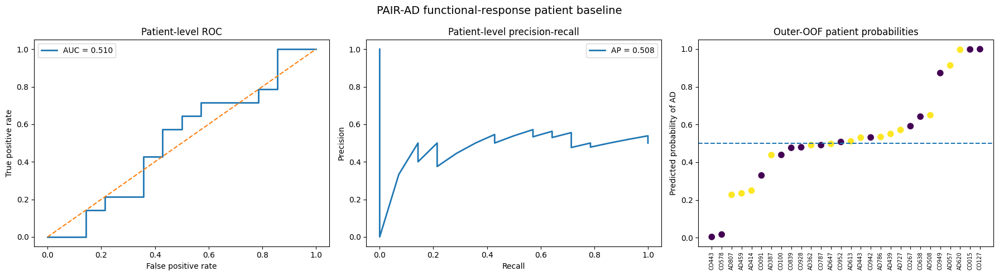

Saved:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Functional_Baseline\PAIR_AD_functional_baseline_results.png

CELL 23 COMPLETE

Patient functional features:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Functional_Baseline\PAIR_AD_patient_functional_features.csv

OOF predictions:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Functional_Baseline\PAIR_AD_functional_baseline_OOF.csv

Outer fold results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Functional_Baseline\PAIR_AD_functional_baseline_fold_results.csv

Inner search:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Functional_Baseline\PAIR_AD_functional_baseline_inner_search.csv

Summary:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Functional_Baseline\PAIR_AD_functional_baseline_summary.txt

Result figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Functional_Basel

In [31]:
# ==================================================================================================
# CELL 23 — PAIR-AD PATIENT-LEVEL FUNCTIONAL RESPONSE BASELINE
#
# FIRST LEAKAGE-FREE MODEL EXPERIMENT
#
# PURPOSE
# -------
#
# Test whether the cleaned DARK/LIGHT functional response alone
# contains useful Alzheimer-vs-Control information.
#
#
# IMPORTANT:
#
# Prediction unit:
#
#       PATIENT
#
# NOT:
#
#       individual OCT slice
#
#
# Validation:
#
#       Nested participant-level cross-validation
#
#
# OUTER CV:
#
#       completely unseen patients
#
#
# INNER CV:
#
#       C selection
#       threshold selection
#       train-only standardization
#
#
# Model:
#
#       L2 Logistic Regression
#
#
# This is deliberately simple.
#
# Later models must beat this baseline.
#
# ==================================================================================================

from pathlib import Path
import warnings
import random

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    average_precision_score,
    confusion_matrix,
    roc_curve,
    precision_recall_curve
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

THRESHOLD_GRID = np.arange(
    0.10,
    0.91,
    0.01
)


C_GRID = np.array(
    [
        0.01,
        0.03,
        0.10,
        0.30,
        1.00,
        3.00,
        10.00,
        30.00,
        100.00
    ],
    dtype=np.float64
)


N_BOOTSTRAP = 2000


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


NPZ_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)


PATIENT_BAG_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_patient_bags_2026.csv"
)


RESULT_DIR = (
    PAIR_AD_DIR /
    "Functional_Baseline"
)


RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


FEATURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_patient_functional_features.csv"
)


OOF_PATH = (
    RESULT_DIR /
    "PAIR_AD_functional_baseline_OOF.csv"
)


FOLD_RESULT_PATH = (
    RESULT_DIR /
    "PAIR_AD_functional_baseline_fold_results.csv"
)


INNER_RESULT_PATH = (
    RESULT_DIR /
    "PAIR_AD_functional_baseline_inner_search.csv"
)


SUMMARY_PATH = (
    RESULT_DIR /
    "PAIR_AD_functional_baseline_summary.txt"
)


FIGURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_functional_baseline_results.png"
)


print("=" * 120)
print("CELL 23 — PATIENT-LEVEL FUNCTIONAL RESPONSE BASELINE")
print("=" * 120)


# ==================================================================================================
# 2. REPRODUCIBILITY
# ==================================================================================================

random.seed(
    SEED
)


np.random.seed(
    SEED
)


# ==================================================================================================
# 3. LOAD DATA
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH

assert PATIENT_BAG_PATH.exists(), PATIENT_BAG_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)


patient_df = pd.read_csv(
    PATIENT_BAG_PATH
)


response = data[
    "functional_response_clean"
].astype(
    np.float32
)


valid_mask = data[
    "functional_valid_mask"
].astype(
    bool
)


y_slice = data[
    "y"
].astype(
    np.int64
)


subjects = data[
    "subject"
].astype(str)


slice_indices = data[
    "slice_index"
].astype(
    np.int64
)


outer_fold_slice = data[
    "outer_fold"
].astype(
    np.int64
)


print(
    "\nResponse shape:",
    response.shape
)


print(
    "Participants:",
    len(
        np.unique(
            subjects
        )
    )
)


print(
    "Patient bags:",
    len(
        patient_df
    )
)


assert response.shape == (
    135,
    256,
    256
)


assert valid_mask.shape == (
    135,
    256,
    256
)


assert len(
    patient_df
) == 28


assert len(
    np.unique(
        subjects
    )
) == 28


# ==================================================================================================
# 4. SLICE-LEVEL FUNCTIONAL DESCRIPTORS
#
# IMPORTANT:
#
# All descriptors are:
#
#       deterministic
#       label-independent
#       sample-local
#
# No information from other participants is needed.
#
#
# Per valid response map:
#
#       signed mean
#       absolute mean
#       standard deviation
#       median
#       5th percentile
#       25th percentile
#       75th percentile
#       95th percentile
#       RMS response
#       positive response fraction
#       negative response fraction
#
# ==================================================================================================

def extract_slice_features(
    response_map,
    mask
):

    values = response_map[
        mask
    ]


    values = values[
        np.isfinite(
            values
        )
    ]


    if len(
        values
    ) == 0:

        raise RuntimeError(
            "A slice contains no valid response pixels."
        )


    abs_values = np.abs(
        values
    )


    rms = np.sqrt(
        np.mean(
            values ** 2
        )
    )


    # Fixed response thresholds.
    #
    # These are NOT optimized using diagnosis.

    positive_fraction = np.mean(
        values > 0.05
    )


    negative_fraction = np.mean(
        values < -0.05
    )


    return {

        "signed_mean":
            float(
                np.mean(
                    values
                )
            ),

        "absolute_mean":
            float(
                np.mean(
                    abs_values
                )
            ),

        "std":
            float(
                np.std(
                    values
                )
            ),

        "median":
            float(
                np.median(
                    values
                )
            ),

        "p05":
            float(
                np.percentile(
                    values,
                    5
                )
            ),

        "p25":
            float(
                np.percentile(
                    values,
                    25
                )
            ),

        "p75":
            float(
                np.percentile(
                    values,
                    75
                )
            ),

        "p95":
            float(
                np.percentile(
                    values,
                    95
                )
            ),

        "rms":
            float(
                rms
            ),

        "positive_fraction":
            float(
                positive_fraction
            ),

        "negative_fraction":
            float(
                negative_fraction
            )
    }


# ==================================================================================================
# 5. EXTRACT SLICE FEATURES
# ==================================================================================================

slice_feature_records = []


for i in range(
    len(
        y_slice
    )
):

    features = extract_slice_features(

        response[
            i
        ],

        valid_mask[
            i
        ]
    )


    record = {

        "sample_index":
            i,

        "folder_subject":
            subjects[
                i
            ],

        "target":
            int(
                y_slice[
                    i
                ]
            ),

        "slice_index":
            int(
                slice_indices[
                    i
                ]
            ),

        "outer_fold":
            int(
                outer_fold_slice[
                    i
                ]
            ),

        **features
    }


    slice_feature_records.append(
        record
    )


slice_features = pd.DataFrame(
    slice_feature_records
)


print("\n" + "=" * 120)
print("SLICE-LEVEL FUNCTIONAL FEATURES")
print("=" * 120)


print(
    "Rows:",
    len(
        slice_features
    )
)


print(
    "Feature columns:",
    [
        c

        for c in slice_features.columns

        if c not in [

            "sample_index",
            "folder_subject",
            "target",
            "slice_index",
            "outer_fold"

        ]
    ]
)


# ==================================================================================================
# 6. AGGREGATE TO PATIENT LEVEL
#
# Each patient has 4 or 5 paired OCT slices.
#
#
# For each slice descriptor:
#
#       patient mean
#       patient standard deviation
#
#
# This produces ONE vector per participant.
# ==================================================================================================

slice_feature_names = [

    "signed_mean",
    "absolute_mean",
    "std",
    "median",
    "p05",
    "p25",
    "p75",
    "p95",
    "rms",
    "positive_fraction",
    "negative_fraction"

]


patient_feature_records = []


for subject_name in sorted(
    np.unique(
        subjects
    )
):

    sub = slice_features[
        slice_features[
            "folder_subject"
        ] == subject_name
    ]


    assert sub[
        "target"
    ].nunique() == 1


    assert sub[
        "outer_fold"
    ].nunique() == 1


    row = {

        "folder_subject":
            subject_name,

        "target":
            int(
                sub[
                    "target"
                ].iloc[
                    0
                ]
            ),

        "outer_fold":
            int(
                sub[
                    "outer_fold"
                ].iloc[
                    0
                ]
            ),

        "n_slices":
            len(
                sub
            )
    }


    for feature_name in slice_feature_names:

        values = sub[
            feature_name
        ].values.astype(
            np.float64
        )


        row[
            f"{feature_name}_mean"
        ] = float(
            values.mean()
        )


        row[
            f"{feature_name}_sd"
        ] = float(
            values.std(
                ddof=0
            )
        )


    patient_feature_records.append(
        row
    )


feature_df = pd.DataFrame(
    patient_feature_records
)


# ==================================================================================================
# 7. ADD NESTED INNER FOLDS
# ==================================================================================================

inner_columns = [

    "inner_fold_outer1",
    "inner_fold_outer2",
    "inner_fold_outer3"

]


feature_df = feature_df.merge(

    patient_df[
        [
            "folder_subject",
            *inner_columns
        ]
    ],

    on="folder_subject",

    how="left",

    validate="one_to_one"
)


assert len(
    feature_df
) == 28


assert feature_df[
    inner_columns
].notna().all().all()


print("\n" + "=" * 120)
print("PATIENT-LEVEL FUNCTIONAL FEATURE MATRIX")
print("=" * 120)


print(
    "Patients:",
    len(
        feature_df
    )
)


feature_columns = [

    c

    for c in feature_df.columns

    if c not in [

        "folder_subject",
        "target",
        "outer_fold",
        "n_slices",
        "inner_fold_outer1",
        "inner_fold_outer2",
        "inner_fold_outer3"

    ]
]


print(
    "Functional features:",
    len(
        feature_columns
    )
)


print(
    "Matrix shape:",
    (
        len(
            feature_df
        ),
        len(
            feature_columns
        )
    )
)


print(
    "\nControl patients:",
    int(
        (
            feature_df[
                "target"
            ] == 0
        ).sum()
    )
)


print(
    "AD patients:",
    int(
        (
            feature_df[
                "target"
            ] == 1
        ).sum()
    )
)


assert (
    feature_df[
        "target"
    ] == 0
).sum() == 14


assert (
    feature_df[
        "target"
    ] == 1
).sum() == 14


feature_df.to_csv(
    FEATURE_PATH,
    index=False
)


# ==================================================================================================
# 8. METRIC FUNCTION
# ==================================================================================================

def compute_metrics(
    y_true,
    y_probability,
    threshold
):

    y_true = np.asarray(
        y_true
    ).astype(
        int
    )


    y_probability = np.asarray(
        y_probability
    ).astype(
        float
    )


    prediction = (

        y_probability
        >=
        threshold

    ).astype(
        int
    )


    tn, fp, fn, tp = confusion_matrix(

        y_true,

        prediction,

        labels=[
            0,
            1
        ]
    ).ravel()


    specificity = (

        tn
        /
        (
            tn
            +
            fp
        )

        if (
            tn
            +
            fp
        ) > 0

        else np.nan
    )


    return {

        "accuracy":
            accuracy_score(
                y_true,
                prediction
            ),

        "precision":
            precision_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                prediction
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                prediction
            ),

        "auc":
            roc_auc_score(
                y_true,
                y_probability
            ),

        "average_precision":
            average_precision_score(
                y_true,
                y_probability
            ),

        "tn":
            int(
                tn
            ),

        "fp":
            int(
                fp
            ),

        "fn":
            int(
                fn
            ),

        "tp":
            int(
                tp
            )
    }


# ==================================================================================================
# 9. SELECT THRESHOLD USING INNER OOF ONLY
# ==================================================================================================

def select_threshold(
    y_true,
    probabilities
):

    best_threshold = 0.50

    best_score = -np.inf


    for threshold in THRESHOLD_GRID:

        predictions = (

            probabilities
            >=
            threshold

        ).astype(
            int
        )


        score = balanced_accuracy_score(

            y_true,

            predictions
        )


        if score > best_score + 1e-12:

            best_score = score

            best_threshold = float(
                threshold
            )


        elif abs(
            score
            -
            best_score
        ) <= 1e-12:

            # Tie-break:
            #
            # prefer threshold closer to 0.50.

            if abs(
                threshold
                -
                0.50
            ) < abs(
                best_threshold
                -
                0.50
            ):

                best_threshold = float(
                    threshold
                )


    return (
        best_threshold,
        best_score
    )


# ==================================================================================================
# 10. ARRAYS
# ==================================================================================================

X_all = feature_df[
    feature_columns
].values.astype(
    np.float64
)


y_all = feature_df[
    "target"
].values.astype(
    np.int64
)


outer_folds = feature_df[
    "outer_fold"
].values.astype(
    np.int64
)


patient_names = feature_df[
    "folder_subject"
].values.astype(str)


oof_probability = np.full(

    len(
        feature_df
    ),

    np.nan,

    dtype=np.float64
)


oof_prediction = np.full(

    len(
        feature_df
    ),

    -1,

    dtype=np.int64
)


oof_threshold = np.full(

    len(
        feature_df
    ),

    np.nan,

    dtype=np.float64
)


fold_records = []

inner_search_records = []


# ==================================================================================================
# 11. NESTED OUTER CV
# ==================================================================================================

print("\n" + "=" * 120)
print("STARTING NESTED PARTICIPANT-LEVEL CV")
print("=" * 120)


for outer in [
    1,
    2,
    3
]:

    print("\n")
    print("#" * 120)
    print(
        f"OUTER FOLD {outer}"
    )
    print("#" * 120)


    outer_train_idx = np.where(
        outer_folds
        !=
        outer
    )[0]


    outer_test_idx = np.where(
        outer_folds
        ==
        outer
    )[0]


    print(
        "Outer training patients:",
        len(
            outer_train_idx
        )
    )


    print(
        "Outer test patients    :",
        len(
            outer_test_idx
        )
    )


    print(
        "Test CO:",
        int(
            (
                y_all[
                    outer_test_idx
                ] == 0
            ).sum()
        ),
        "| AD:",
        int(
            (
                y_all[
                    outer_test_idx
                ] == 1
            ).sum()
        )
    )


    # ==============================================================================================
    # INNER HYPERPARAMETER SEARCH
    # ==============================================================================================

    inner_column = (
        f"inner_fold_outer{outer}"
    )


    inner_assignments = feature_df[
        inner_column
    ].values.astype(
        np.int64
    )


    c_results = []


    for C in C_GRID:

        inner_auc_scores = []


        for inner in [
            1,
            2,
            3
        ]:

            inner_train_idx = np.where(

                (
                    outer_folds
                    !=
                    outer
                )

                &

                (
                    inner_assignments
                    !=
                    inner
                )

            )[0]


            inner_val_idx = np.where(

                (
                    outer_folds
                    !=
                    outer
                )

                &

                (
                    inner_assignments
                    ==
                    inner
                )

            )[0]


            assert len(
                set(
                    patient_names[
                        inner_train_idx
                    ]
                )

                &

                set(
                    patient_names[
                        inner_val_idx
                    ]
                )
            ) == 0


            scaler = StandardScaler()


            X_train_scaled = scaler.fit_transform(

                X_all[
                    inner_train_idx
                ]
            )


            X_val_scaled = scaler.transform(

                X_all[
                    inner_val_idx
                ]
            )


            model = LogisticRegression(

                C=float(
                    C
                ),

                penalty="l2",

                solver="liblinear",

                max_iter=5000,

                random_state=SEED
            )


            model.fit(

                X_train_scaled,

                y_all[
                    inner_train_idx
                ]
            )


            val_probability = model.predict_proba(

                X_val_scaled

            )[
                :,
                1
            ]


            val_auc = roc_auc_score(

                y_all[
                    inner_val_idx
                ],

                val_probability
            )


            inner_auc_scores.append(
                val_auc
            )


            inner_search_records.append(
                {

                    "outer_fold":
                        outer,

                    "C":
                        float(
                            C
                        ),

                    "inner_fold":
                        inner,

                    "validation_auc":
                        float(
                            val_auc
                        ),

                    "train_patients":
                        len(
                            inner_train_idx
                        ),

                    "validation_patients":
                        len(
                            inner_val_idx
                        )
                }
            )


        c_results.append(
            {

                "C":
                    float(
                        C
                    ),

                "mean_auc":
                    float(
                        np.mean(
                            inner_auc_scores
                        )
                    ),

                "sd_auc":
                    float(
                        np.std(
                            inner_auc_scores,
                            ddof=1
                        )
                    )
            }
        )


    c_df = pd.DataFrame(
        c_results
    )


    # ----------------------------------------------------------------------------------------------
    # Select best C.
    #
    # Highest inner mean AUC.
    #
    # If tied:
    # choose smaller C = stronger regularization.
    # ----------------------------------------------------------------------------------------------

    best_mean_auc = c_df[
        "mean_auc"
    ].max()


    tied = c_df[
        np.isclose(
            c_df[
                "mean_auc"
            ],
            best_mean_auc
        )
    ]


    best_C = float(
        tied[
            "C"
        ].min()
    )


    print(
        "\nSelected C:",
        best_C
    )


    print(
        "Best inner mean AUC:",
        f"{best_mean_auc:.4f}"
    )


    # ==============================================================================================
    # INNER OOF PROBABILITIES USING SELECTED C
    #
    # Used ONLY to choose classification threshold.
    # ==============================================================================================

    inner_oof_probability = np.full(

        len(
            outer_train_idx
        ),

        np.nan,

        dtype=np.float64
    )


    # Map global patient index -> local outer-training position.

    outer_global_to_local = {

        int(
            global_idx
        ):
            local_idx

        for local_idx, global_idx in enumerate(
            outer_train_idx
        )
    }


    for inner in [
        1,
        2,
        3
    ]:

        inner_train_idx = np.where(

            (
                outer_folds
                !=
                outer
            )

            &

            (
                inner_assignments
                !=
                inner
            )

        )[0]


        inner_val_idx = np.where(

            (
                outer_folds
                !=
                outer
            )

            &

            (
                inner_assignments
                ==
                inner
            )

        )[0]


        scaler = StandardScaler()


        X_train_scaled = scaler.fit_transform(

            X_all[
                inner_train_idx
            ]
        )


        X_val_scaled = scaler.transform(

            X_all[
                inner_val_idx
            ]
        )


        model = LogisticRegression(

            C=best_C,

            penalty="l2",

            solver="liblinear",

            max_iter=5000,

            random_state=SEED
        )


        model.fit(

            X_train_scaled,

            y_all[
                inner_train_idx
            ]
        )


        probabilities = model.predict_proba(

            X_val_scaled

        )[
            :,
            1
        ]


        for global_idx, probability in zip(

            inner_val_idx,

            probabilities

        ):

            local_idx = outer_global_to_local[
                int(
                    global_idx
                )
            ]


            inner_oof_probability[
                local_idx
            ] = probability


    assert np.isfinite(
        inner_oof_probability
    ).all()


    inner_oof_y = y_all[
        outer_train_idx
    ]


    selected_threshold, threshold_bal_acc = (
        select_threshold(

            inner_oof_y,

            inner_oof_probability
        )
    )


    print(
        "Selected threshold:",
        f"{selected_threshold:.2f}"
    )


    print(
        "Inner OOF threshold balanced accuracy:",
        f"{threshold_bal_acc:.4f}"
    )


    print(
        "Inner OOF AUC:",
        f"{roc_auc_score(inner_oof_y, inner_oof_probability):.4f}"
    )


    # ==============================================================================================
    # FINAL OUTER MODEL
    #
    # Fit scaler ONLY on outer-training patients.
    #
    # Fit model ONLY on outer-training patients.
    #
    # Test ONCE on untouched outer-test patients.
    # ==============================================================================================

    final_scaler = StandardScaler()


    X_outer_train_scaled = final_scaler.fit_transform(

        X_all[
            outer_train_idx
        ]
    )


    X_outer_test_scaled = final_scaler.transform(

        X_all[
            outer_test_idx
        ]
    )


    final_model = LogisticRegression(

        C=best_C,

        penalty="l2",

        solver="liblinear",

        max_iter=5000,

        random_state=SEED
    )


    final_model.fit(

        X_outer_train_scaled,

        y_all[
            outer_train_idx
        ]
    )


    test_probability = final_model.predict_proba(

        X_outer_test_scaled

    )[
        :,
        1
    ]


    test_prediction = (

        test_probability
        >=
        selected_threshold

    ).astype(
        np.int64
    )


    oof_probability[
        outer_test_idx
    ] = test_probability


    oof_prediction[
        outer_test_idx
    ] = test_prediction


    oof_threshold[
        outer_test_idx
    ] = selected_threshold


    metrics = compute_metrics(

        y_all[
            outer_test_idx
        ],

        test_probability,

        selected_threshold
    )


    fold_records.append(
        {

            "outer_fold":
                outer,

            "train_patients":
                len(
                    outer_train_idx
                ),

            "test_patients":
                len(
                    outer_test_idx
                ),

            "selected_C":
                best_C,

            "inner_mean_auc":
                best_mean_auc,

            "selected_threshold":
                selected_threshold,

            **metrics
        }
    )


    print("\n" + "-" * 90)
    print(
        f"OUTER FOLD {outer} RESULT"
    )
    print("-" * 90)


    for metric_name in [

        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc",
        "average_precision"

    ]:

        print(
            f"{metric_name:20s}: "
            f"{metrics[metric_name]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )


    print(

        np.array(
            [
                [
                    metrics[
                        "tn"
                    ],
                    metrics[
                        "fp"
                    ]
                ],
                [
                    metrics[
                        "fn"
                    ],
                    metrics[
                        "tp"
                    ]
                ]
            ]
        )
    )


# ==================================================================================================
# 12. VERIFY COMPLETE OUTER OOF
# ==================================================================================================

assert np.isfinite(
    oof_probability
).all()


assert np.isfinite(
    oof_threshold
).all()


assert (
    oof_prediction
    >=
    0
).all()


# ==================================================================================================
# 13. FINAL PATIENT-LEVEL OOF PERFORMANCE
# ==================================================================================================

# Each subject uses the threshold selected from its OUTER training
# inner-CV procedure.
#
# For threshold-dependent pooled metrics, predictions are therefore
# taken directly from each outer fold.

tn, fp, fn, tp = confusion_matrix(

    y_all,

    oof_prediction,

    labels=[
        0,
        1
    ]
).ravel()


overall_specificity = (
    tn
    /
    (
        tn
        +
        fp
    )
)


overall_metrics = {

    "accuracy":
        accuracy_score(
            y_all,
            oof_prediction
        ),

    "precision":
        precision_score(
            y_all,
            oof_prediction,
            zero_division=0
        ),

    "recall":
        recall_score(
            y_all,
            oof_prediction,
            zero_division=0
        ),

    "specificity":
        overall_specificity,

    "f1":
        f1_score(
            y_all,
            oof_prediction,
            zero_division=0
        ),

    "balanced_accuracy":
        balanced_accuracy_score(
            y_all,
            oof_prediction
        ),

    "mcc":
        matthews_corrcoef(
            y_all,
            oof_prediction
        ),

    "auc":
        roc_auc_score(
            y_all,
            oof_probability
        ),

    "average_precision":
        average_precision_score(
            y_all,
            oof_probability
        ),

    "tn":
        int(
            tn
        ),

    "fp":
        int(
            fp
        ),

    "fn":
        int(
            fn
        ),

    "tp":
        int(
            tp
        )
}


print("\n")
print("=" * 120)
print("FINAL PATIENT-LEVEL OUT-OF-FOLD PERFORMANCE")
print("=" * 120)


for metric_name in [

    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "average_precision"

]:

    print(
        f"{metric_name:20s}: "
        f"{overall_metrics[metric_name]:.4f}"
    )


print(
    "\nConfusion matrix:"
)


print(

    np.array(
        [
            [
                tn,
                fp
            ],
            [
                fn,
                tp
            ]
        ]
    )
)


# ==================================================================================================
# 14. STRATIFIED PATIENT BOOTSTRAP CONFIDENCE INTERVALS
#
# Bootstrap the FINAL OOF patient predictions.
#
# This does not retrain models.
#
# It quantifies uncertainty in the observed patient-level predictions.
# ==================================================================================================

print("\n" + "=" * 120)
print("STRATIFIED PATIENT BOOTSTRAP 95% CONFIDENCE INTERVALS")
print("=" * 120)


rng = np.random.default_rng(
    SEED
)


control_idx = np.where(
    y_all == 0
)[0]


ad_idx = np.where(
    y_all == 1
)[0]


bootstrap_auc = []

bootstrap_accuracy = []

bootstrap_balanced_accuracy = []


for _ in range(
    N_BOOTSTRAP
):

    sampled_control = rng.choice(

        control_idx,

        size=len(
            control_idx
        ),

        replace=True
    )


    sampled_ad = rng.choice(

        ad_idx,

        size=len(
            ad_idx
        ),

        replace=True
    )


    sampled_idx = np.concatenate(
        [
            sampled_control,
            sampled_ad
        ]
    )


    y_b = y_all[
        sampled_idx
    ]


    p_b = oof_probability[
        sampled_idx
    ]


    pred_b = oof_prediction[
        sampled_idx
    ]


    bootstrap_auc.append(

        roc_auc_score(
            y_b,
            p_b
        )
    )


    bootstrap_accuracy.append(

        accuracy_score(
            y_b,
            pred_b
        )
    )


    bootstrap_balanced_accuracy.append(

        balanced_accuracy_score(
            y_b,
            pred_b
        )
    )


def percentile_ci(
    values
):

    values = np.asarray(
        values,
        dtype=np.float64
    )


    return (

        float(
            np.percentile(
                values,
                2.5
            )
        ),

        float(
            np.percentile(
                values,
                97.5
            )
        )
    )


auc_ci = percentile_ci(
    bootstrap_auc
)


accuracy_ci = percentile_ci(
    bootstrap_accuracy
)


balanced_ci = percentile_ci(
    bootstrap_balanced_accuracy
)


print(
    "AUC:"
)

print(
    f"  {overall_metrics['auc']:.4f} "
    f"[95% CI "
    f"{auc_ci[0]:.4f} - "
    f"{auc_ci[1]:.4f}]"
)


print(
    "\nAccuracy:"
)

print(
    f"  {overall_metrics['accuracy']:.4f} "
    f"[95% CI "
    f"{accuracy_ci[0]:.4f} - "
    f"{accuracy_ci[1]:.4f}]"
)


print(
    "\nBalanced accuracy:"
)

print(
    f"  {overall_metrics['balanced_accuracy']:.4f} "
    f"[95% CI "
    f"{balanced_ci[0]:.4f} - "
    f"{balanced_ci[1]:.4f}]"
)


# ==================================================================================================
# 15. PATIENT OOF TABLE
# ==================================================================================================

oof_df = pd.DataFrame(
    {

        "folder_subject":
            patient_names,

        "target":
            y_all,

        "outer_fold":
            outer_folds,

        "probability_AD":
            oof_probability,

        "threshold":
            oof_threshold,

        "prediction":
            oof_prediction
    }
)


oof_df = oof_df.sort_values(
    "probability_AD"
).reset_index(
    drop=True
)


print("\n" + "=" * 120)
print("PATIENT-LEVEL OOF PREDICTIONS")
print("=" * 120)


print(
    oof_df.to_string(
        index=False
    )
)


# ==================================================================================================
# 16. THREE-FOLD SUMMARY
# ==================================================================================================

fold_df = pd.DataFrame(
    fold_records
)


print("\n" + "=" * 120)
print("OUTER-FOLD RESULTS")
print("=" * 120)


print(
    fold_df.to_string(
        index=False
    )
)


print("\n" + "=" * 120)
print("OUTER-FOLD MEAN ± SD")
print("=" * 120)


for metric_name in [

    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "average_precision"

]:

    mean_value = fold_df[
        metric_name
    ].mean()


    sd_value = fold_df[
        metric_name
    ].std(
        ddof=1
    )


    print(
        f"{metric_name:20s}: "
        f"{mean_value:.4f} "
        f"± "
        f"{sd_value:.4f}"
    )


# ==================================================================================================
# 17. RESULT FIGURE
#
# Three panels:
#
#       ROC
#       Precision-Recall
#       patient probabilities
#
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING BASELINE RESULT FIGURE")
print("=" * 120)


fig, axes = plt.subplots(

    1,

    3,

    figsize=(
        18,
        5
    )
)


# --------------------------------------------------------------------------------------------------
# ROC
# --------------------------------------------------------------------------------------------------

fpr, tpr, _ = roc_curve(

    y_all,

    oof_probability
)


axes[
    0
].plot(

    fpr,

    tpr,

    linewidth=2,

    label=(
        f"AUC = "
        f"{overall_metrics['auc']:.3f}"
    )
)


axes[
    0
].plot(
    [
        0,
        1
    ],
    [
        0,
        1
    ],
    linestyle="--"
)


axes[
    0
].set_xlabel(
    "False positive rate"
)


axes[
    0
].set_ylabel(
    "True positive rate"
)


axes[
    0
].set_title(
    "Patient-level ROC"
)


axes[
    0
].legend()


# --------------------------------------------------------------------------------------------------
# Precision-Recall
# --------------------------------------------------------------------------------------------------

precision_curve, recall_curve, _ = (
    precision_recall_curve(

        y_all,

        oof_probability
    )
)


axes[
    1
].plot(

    recall_curve,

    precision_curve,

    linewidth=2,

    label=(
        f"AP = "
        f"{overall_metrics['average_precision']:.3f}"
    )
)


axes[
    1
].set_xlabel(
    "Recall"
)


axes[
    1
].set_ylabel(
    "Precision"
)


axes[
    1
].set_title(
    "Patient-level precision-recall"
)


axes[
    1
].legend()


# --------------------------------------------------------------------------------------------------
# Patient probabilities
# --------------------------------------------------------------------------------------------------

plot_df = oof_df.sort_values(
    "probability_AD"
).reset_index(
    drop=True
)


x_positions = np.arange(
    len(
        plot_df
    )
)


axes[
    2
].scatter(

    x_positions,

    plot_df[
        "probability_AD"
    ].values,

    c=plot_df[
        "target"
    ].values,

    s=55
)


axes[
    2
].axhline(
    0.5,
    linestyle="--"
)


axes[
    2
].set_xticks(
    x_positions
)


axes[
    2
].set_xticklabels(

    plot_df[
        "folder_subject"
    ].values,

    rotation=90,

    fontsize=7
)


axes[
    2
].set_ylabel(
    "Predicted probability of AD"
)


axes[
    2
].set_title(
    "Outer-OOF patient probabilities"
)


plt.suptitle(

    "PAIR-AD functional-response patient baseline",

    fontsize=14
)


plt.tight_layout()


plt.savefig(

    FIGURE_PATH,

    dpi=300,

    bbox_inches="tight"
)


plt.show()


print(
    "Saved:"
)

print(
    FIGURE_PATH
)


# ==================================================================================================
# 18. SAVE TABLES
# ==================================================================================================

oof_df.to_csv(
    OOF_PATH,
    index=False
)


fold_df.to_csv(
    FOLD_RESULT_PATH,
    index=False
)


pd.DataFrame(
    inner_search_records
).to_csv(
    INNER_RESULT_PATH,
    index=False
)


# ==================================================================================================
# 19. SAVE SUMMARY
# ==================================================================================================

with open(
    SUMMARY_PATH,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PAIR-AD PATIENT-LEVEL FUNCTIONAL RESPONSE BASELINE\n"
    )


    f.write(
        "=" * 90
        +
        "\n\n"
    )


    f.write(
        "Participants: 28\n"
    )


    f.write(
        "Control: 14\n"
    )


    f.write(
        "Alzheimer: 14\n"
    )


    f.write(
        "Validation: nested participant-exclusive 3x3 CV\n"
    )


    f.write(
        "Features: artifact-safe DARK/LIGHT functional-response descriptors\n"
    )


    f.write(
        "Classifier: StandardScaler + L2 Logistic Regression\n\n"
    )


    for metric_name in [

        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc",
        "average_precision"

    ]:

        f.write(

            f"{metric_name}: "
            f"{overall_metrics[metric_name]:.6f}\n"
        )


    f.write(
        "\n"
    )


    f.write(
        f"AUC 95% bootstrap CI: "
        f"{auc_ci[0]:.6f} - "
        f"{auc_ci[1]:.6f}\n"
    )


    f.write(
        f"Accuracy 95% bootstrap CI: "
        f"{accuracy_ci[0]:.6f} - "
        f"{accuracy_ci[1]:.6f}\n"
    )


    f.write(
        f"Balanced accuracy 95% bootstrap CI: "
        f"{balanced_ci[0]:.6f} - "
        f"{balanced_ci[1]:.6f}\n"
    )


# ==================================================================================================
# 20. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 23 COMPLETE")
print("=" * 120)


print(
    "\nPatient functional features:"
)

print(
    FEATURE_PATH
)


print(
    "\nOOF predictions:"
)

print(
    OOF_PATH
)


print(
    "\nOuter fold results:"
)

print(
    FOLD_RESULT_PATH
)


print(
    "\nInner search:"
)

print(
    INNER_RESULT_PATH
)


print(
    "\nSummary:"
)

print(
    SUMMARY_PATH
)


print(
    "\nResult figure:"
)

print(
    FIGURE_PATH
)


print(
    "\nSEND ME THESE OUTPUTS:"
)


print(
    "  1. PATIENT-LEVEL FUNCTIONAL FEATURE MATRIX"
)


print(
    "  2. Each OUTER FOLD RESULT"
)


print(
    "  3. FINAL PATIENT-LEVEL OUT-OF-FOLD PERFORMANCE"
)


print(
    "  4. STRATIFIED PATIENT BOOTSTRAP 95% CONFIDENCE INTERVALS"
)


print(
    "  5. PATIENT-LEVEL OOF PREDICTIONS"
)


print(
    "  6. OUTER-FOLD MEAN ± SD"
)


print(
    "  7. The result figure"
)

In [32]:
# ==================================================================================================
# CELL 24 — PAIR-AD FROZEN RESNET-50 STRUCTURAL PATIENT BASELINE
#
# SECOND LEAKAGE-FREE MODEL EXPERIMENT
#
# PURPOSE
# -------
#
# Determine whether STATIC retinal structure can discriminate
# Alzheimer vs Control in completely unseen participants.
#
#
# Input:
#
#       FLAT_NORMED DARK
#       FLAT_NORMED LIGHT
#
#
# Frozen pretrained encoder:
#
#       ImageNet ResNet-50
#
#
# Slice representation:
#
#       z_D = E(DARK)
#       z_L = E(LIGHT)
#
# Structural representation:
#
#       z_S = (z_D + z_L) / 2
#
#
# Patient representation:
#
#       z_patient = mean(z_S across 4-5 slices)
#
#
# Classifier:
#
#       StandardScaler
#       PCA (inner-selected dimensions)
#       L2 Logistic Regression
#
#
# Validation:
#
#       nested PARTICIPANT-EXCLUSIVE CV
#
#
# IMPORTANT:
#
# ResNet backbone is NEVER trained here.
#
# Outer test participants are NEVER used in:
#
#       scaling
#       PCA fitting
#       C selection
#       threshold selection
#
# ==================================================================================================

from pathlib import Path
import warnings
import random

import numpy as np
import pandas as pd

import torch
import torch.nn as nn

from torch.utils.data import (
    TensorDataset,
    DataLoader
)

from torchvision.models import (
    resnet50,
    ResNet50_Weights
)

from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    average_precision_score,
    confusion_matrix
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


BATCH_SIZE = 16


C_GRID = [

    0.01,
    0.03,
    0.10,
    0.30,
    1.00,
    3.00,
    10.00

]


# PCA dimensions.
#
# Actual usable dimension is automatically limited by the
# number of inner-training participants.

PCA_GRID = [

    2,
    3,
    4,
    5,
    6,
    8,
    10

]


THRESHOLD_GRID = np.arange(
    0.10,
    0.91,
    0.01
)


N_BOOTSTRAP = 2000


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


NPZ_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)


PATIENT_BAG_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_patient_bags_2026.csv"
)


RESULT_DIR = (
    PAIR_AD_DIR /
    "Structural_ResNet50_Baseline"
)


RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


SLICE_FEATURE_PATH = (
    RESULT_DIR /
    "ResNet50_slice_features.npz"
)


PATIENT_FEATURE_PATH = (
    RESULT_DIR /
    "ResNet50_structural_patient_features.csv"
)


OOF_PATH = (
    RESULT_DIR /
    "ResNet50_structural_OOF.csv"
)


FOLD_RESULT_PATH = (
    RESULT_DIR /
    "ResNet50_structural_fold_results.csv"
)


INNER_RESULT_PATH = (
    RESULT_DIR /
    "ResNet50_structural_inner_search.csv"
)


SUMMARY_PATH = (
    RESULT_DIR /
    "ResNet50_structural_summary.txt"
)


print("=" * 120)
print("CELL 24 — FROZEN RESNET-50 STRUCTURAL PATIENT BASELINE")
print("=" * 120)


print(
    "\nDevice:",
    DEVICE
)


if DEVICE.type == "cuda":

    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )


# ==================================================================================================
# 2. REPRODUCIBILITY
# ==================================================================================================

random.seed(
    SEED
)


np.random.seed(
    SEED
)


torch.manual_seed(
    SEED
)


if torch.cuda.is_available():

    torch.cuda.manual_seed_all(
        SEED
    )


# ==================================================================================================
# 3. LOAD DATA
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH

assert PATIENT_BAG_PATH.exists(), PATIENT_BAG_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)


patient_df = pd.read_csv(
    PATIENT_BAG_PATH
)


fn_dark = data[
    "flat_normed_dark"
].astype(
    np.float32
)


fn_light = data[
    "flat_normed_light"
].astype(
    np.float32
)


y_slice = data[
    "y"
].astype(
    np.int64
)


subjects = data[
    "subject"
].astype(str)


slice_index = data[
    "slice_index"
].astype(
    np.int64
)


outer_fold_slice = data[
    "outer_fold"
].astype(
    np.int64
)


print(
    "\nFLAT_NORMED DARK:",
    fn_dark.shape
)


print(
    "FLAT_NORMED LIGHT:",
    fn_light.shape
)


print(
    "Participants:",
    len(
        np.unique(
            subjects
        )
    )
)


assert fn_dark.shape == (
    135,
    256,
    256
)


assert fn_light.shape == (
    135,
    256,
    256
)


assert len(
    np.unique(
        subjects
    )
) == 28


# ==================================================================================================
# 4. SAMPLE-LOCAL IMAGE NORMALIZATION
#
# FLAT_NORMED values are not in [0,1].
#
# For frozen ImageNet feature extraction:
#
#       each OCT slice -> robust [0,1]
#
# based ONLY on that individual image.
#
# No information from another participant is used.
# ==================================================================================================

def robust_minmax(
    image
):

    image = np.asarray(
        image,
        dtype=np.float32
    )


    low = np.percentile(
        image,
        1
    )


    high = np.percentile(
        image,
        99
    )


    if high <= low:

        return np.zeros_like(
            image,
            dtype=np.float32
        )


    output = (

        image
        -
        low

    ) / (

        high
        -
        low
    )


    return np.clip(
        output,
        0.0,
        1.0
    ).astype(
        np.float32
    )


# ==================================================================================================
# 5. PREPARE 224x224 RGB INPUT
#
# ResNet's ImageNet pretrained representation is used at its
# standard spatial input scale.
#
# We resize from our preserved 256x256 image to 224x224.
# ==================================================================================================

try:

    from PIL import Image

    PIL_BILINEAR = (
        Image
        .Resampling
        .BILINEAR
    )


except AttributeError:

    from PIL import Image

    PIL_BILINEAR = (
        Image
        .BILINEAR
    )


def resize_224(
    image
):

    pil = Image.fromarray(
        image.astype(
            np.float32
        ),
        mode="F"
    )


    pil = pil.resize(

        (
            224,
            224
        ),

        resample=PIL_BILINEAR
    )


    return np.asarray(
        pil,
        dtype=np.float32
    )


def prepare_images(
    array
):

    processed = np.zeros(

        (
            len(
                array
            ),
            3,
            224,
            224
        ),

        dtype=np.float32
    )


    mean = np.array(
        [
            0.485,
            0.456,
            0.406
        ],
        dtype=np.float32
    ).reshape(
        3,
        1,
        1
    )


    std = np.array(
        [
            0.229,
            0.224,
            0.225
        ],
        dtype=np.float32
    ).reshape(
        3,
        1,
        1
    )


    for i in range(
        len(
            array
        )
    ):

        image = robust_minmax(
            array[
                i
            ]
        )


        image = resize_224(
            image
        )


        rgb = np.repeat(

            image[
                None,
                :,
                :
            ],

            3,

            axis=0
        )


        rgb = (

            rgb
            -
            mean

        ) / std


        processed[
            i
        ] = rgb


    return processed


print("\n" + "=" * 120)
print("PREPARING CNN INPUTS")
print("=" * 120)


dark_input = prepare_images(
    fn_dark
)


light_input = prepare_images(
    fn_light
)


print(
    "DARK tensor:",
    dark_input.shape
)


print(
    "LIGHT tensor:",
    light_input.shape
)


assert dark_input.shape == (
    135,
    3,
    224,
    224
)


# ==================================================================================================
# 6. FROZEN RESNET-50 FEATURE EXTRACTOR
# ==================================================================================================

print("\n" + "=" * 120)
print("LOADING FROZEN IMAGENET RESNET-50")
print("=" * 120)


model = resnet50(

    weights=(
        ResNet50_Weights
        .IMAGENET1K_V1
    )
)


feature_dim = (
    model
    .fc
    .in_features
)


assert feature_dim == 2048


model.fc = nn.Identity()


for parameter in model.parameters():

    parameter.requires_grad = False


model = model.to(
    DEVICE
)


model.eval()


print(
    "Feature dimension:",
    feature_dim
)


print(
    "Trainable backbone parameters:",
    sum(
        p.numel()

        for p in model.parameters()

        if p.requires_grad
    )
)


assert sum(

    p.numel()

    for p in model.parameters()

    if p.requires_grad

) == 0


# ==================================================================================================
# 7. EXTRACT FEATURES
# ==================================================================================================

@torch.no_grad()
def extract_features(
    input_array
):

    dataset = TensorDataset(

        torch.from_numpy(
            input_array
        )
    )


    loader = DataLoader(

        dataset,

        batch_size=BATCH_SIZE,

        shuffle=False,

        num_workers=0,

        pin_memory=(
            DEVICE.type == "cuda"
        )
    )


    all_features = []


    for (
        batch,
    ) in loader:

        batch = batch.to(

            DEVICE,

            non_blocking=True
        )


        features = model(
            batch
        )


        all_features.append(

            features
            .cpu()
            .numpy()
        )


    return np.concatenate(
        all_features,
        axis=0
    ).astype(
        np.float32
    )


print("\n" + "=" * 120)
print("EXTRACTING FROZEN STRUCTURAL FEATURES")
print("=" * 120)


z_dark = extract_features(
    dark_input
)


z_light = extract_features(
    light_input
)


print(
    "DARK features:",
    z_dark.shape
)


print(
    "LIGHT features:",
    z_light.shape
)


assert z_dark.shape == (
    135,
    2048
)


assert z_light.shape == (
    135,
    2048
)


assert np.isfinite(
    z_dark
).all()


assert np.isfinite(
    z_light
).all()


# ==================================================================================================
# 8. STRUCTURAL FEATURE
#
# Average DARK and LIGHT representation.
#
# This intentionally suppresses condition-specific change.
#
# Later PAIR-AD will explicitly model:
#
#       z_LIGHT - z_DARK
# ==================================================================================================

z_structure = (

    z_dark
    +
    z_light

) / 2.0


print(
    "\nStructural slice features:",
    z_structure.shape
)


# ==================================================================================================
# 9. SAVE SLICE FEATURES
# ==================================================================================================

np.savez_compressed(

    SLICE_FEATURE_PATH,

    z_dark=z_dark,

    z_light=z_light,

    z_structure=z_structure,

    y=y_slice,

    subject=subjects,

    slice_index=slice_index,

    outer_fold=outer_fold_slice
)


# ==================================================================================================
# 10. PATIENT MEAN POOLING
#
# One feature vector per PATIENT.
# ==================================================================================================

patient_records = []

patient_features = []


for subject_name in sorted(
    np.unique(
        subjects
    )
):

    idx = np.where(
        subjects
        ==
        subject_name
    )[0]


    assert len(
        np.unique(
            y_slice[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            outer_fold_slice[
                idx
            ]
        )
    ) == 1


    pooled = z_structure[
        idx
    ].mean(
        axis=0
    )


    patient_features.append(
        pooled
    )


    patient_records.append(
        {

            "folder_subject":
                subject_name,

            "target":
                int(
                    y_slice[
                        idx[
                            0
                        ]
                    ]
                ),

            "outer_fold":
                int(
                    outer_fold_slice[
                        idx[
                            0
                        ]
                    ]
                ),

            "n_slices":
                len(
                    idx
                )
        }
    )


X_patient = np.asarray(
    patient_features,
    dtype=np.float64
)


feature_df = pd.DataFrame(
    patient_records
)


feature_df = feature_df.merge(

    patient_df[
        [
            "folder_subject",

            "inner_fold_outer1",
            "inner_fold_outer2",
            "inner_fold_outer3"
        ]
    ],

    on="folder_subject",

    how="left",

    validate="one_to_one"
)


print("\n" + "=" * 120)
print("PATIENT STRUCTURAL FEATURE MATRIX")
print("=" * 120)


print(
    "Patients:",
    len(
        feature_df
    )
)


print(
    "Feature dimension:",
    X_patient.shape[
        1
    ]
)


print(
    "Matrix:",
    X_patient.shape
)


assert X_patient.shape == (
    28,
    2048
)


assert len(
    feature_df
) == 28


# ==================================================================================================
# 11. SAVE PATIENT METADATA
# ==================================================================================================

feature_df.to_csv(
    PATIENT_FEATURE_PATH,
    index=False
)


# ==================================================================================================
# 12. METRICS
# ==================================================================================================

def compute_metrics(
    y_true,
    probability,
    threshold
):

    y_true = np.asarray(
        y_true,
        dtype=int
    )


    probability = np.asarray(
        probability,
        dtype=float
    )


    prediction = (

        probability
        >=
        threshold

    ).astype(
        int
    )


    tn, fp, fn, tp = confusion_matrix(

        y_true,

        prediction,

        labels=[
            0,
            1
        ]
    ).ravel()


    specificity = (

        tn
        /
        (
            tn
            +
            fp
        )
    )


    return {

        "accuracy":
            accuracy_score(
                y_true,
                prediction
            ),

        "precision":
            precision_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                prediction
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                prediction
            ),

        "auc":
            roc_auc_score(
                y_true,
                probability
            ),

        "average_precision":
            average_precision_score(
                y_true,
                probability
            ),

        "tn":
            int(
                tn
            ),

        "fp":
            int(
                fp
            ),

        "fn":
            int(
                fn
            ),

        "tp":
            int(
                tp
            )
    }


# ==================================================================================================
# 13. THRESHOLD SELECTION
# ==================================================================================================

def select_threshold(
    y_true,
    probability
):

    best_threshold = 0.50

    best_score = -np.inf


    for threshold in THRESHOLD_GRID:

        pred = (

            probability
            >=
            threshold

        ).astype(
            int
        )


        score = balanced_accuracy_score(

            y_true,

            pred
        )


        if score > best_score + 1e-12:

            best_score = score

            best_threshold = float(
                threshold
            )


        elif abs(
            score
            -
            best_score
        ) <= 1e-12:

            if abs(
                threshold
                -
                0.50
            ) < abs(
                best_threshold
                -
                0.50
            ):

                best_threshold = float(
                    threshold
                )


    return (
        best_threshold,
        best_score
    )


# ==================================================================================================
# 14. PATIENT LABEL ARRAYS
# ==================================================================================================

y_patient = feature_df[
    "target"
].values.astype(
    np.int64
)


outer_folds = feature_df[
    "outer_fold"
].values.astype(
    np.int64
)


patient_names = feature_df[
    "folder_subject"
].values.astype(str)


# ==================================================================================================
# 15. MODEL HELPER
#
# Scaler + PCA + Logistic Regression
#
# Everything is fitted TRAIN-ONLY.
# ==================================================================================================

def fit_transform_model(
    X_train,
    y_train,
    X_eval,
    n_components,
    C
):

    scaler = StandardScaler()


    X_train_scaled = scaler.fit_transform(
        X_train
    )


    X_eval_scaled = scaler.transform(
        X_eval
    )


    maximum_components = min(

        X_train_scaled.shape[
            0
        ]
        -
        1,

        X_train_scaled.shape[
            1
        ]
    )


    actual_components = min(

        int(
            n_components
        ),

        int(
            maximum_components
        )
    )


    pca = PCA(

        n_components=actual_components,

        random_state=SEED
    )


    X_train_pca = pca.fit_transform(
        X_train_scaled
    )


    X_eval_pca = pca.transform(
        X_eval_scaled
    )


    classifier = LogisticRegression(

        C=float(
            C
        ),

        penalty="l2",

        solver="liblinear",

        max_iter=5000,

        random_state=SEED
    )


    classifier.fit(

        X_train_pca,

        y_train
    )


    probability = classifier.predict_proba(

        X_eval_pca

    )[
        :,
        1
    ]


    return probability


# ==================================================================================================
# 16. NESTED CV
# ==================================================================================================

oof_probability = np.full(

    28,

    np.nan,

    dtype=np.float64
)


oof_prediction = np.full(

    28,

    -1,

    dtype=np.int64
)


oof_threshold = np.full(

    28,

    np.nan,

    dtype=np.float64
)


fold_records = []

inner_records = []


print("\n" + "=" * 120)
print("STARTING NESTED PARTICIPANT-LEVEL STRUCTURAL CV")
print("=" * 120)


for outer in [
    1,
    2,
    3
]:

    print("\n")
    print("#" * 120)
    print(
        f"OUTER FOLD {outer}"
    )
    print("#" * 120)


    train_idx = np.where(
        outer_folds
        !=
        outer
    )[0]


    test_idx = np.where(
        outer_folds
        ==
        outer
    )[0]


    inner_col = (
        f"inner_fold_outer{outer}"
    )


    inner_assignment = feature_df[
        inner_col
    ].values.astype(
        np.int64
    )


    search_results = []


    # ==============================================================================================
    # INNER SEARCH
    # ==============================================================================================

    for n_components in PCA_GRID:

        for C in C_GRID:

            fold_aucs = []


            for inner in [
                1,
                2,
                3
            ]:

                inner_train = np.where(

                    (
                        outer_folds
                        !=
                        outer
                    )

                    &

                    (
                        inner_assignment
                        !=
                        inner
                    )

                )[0]


                inner_val = np.where(

                    (
                        outer_folds
                        !=
                        outer
                    )

                    &

                    (
                        inner_assignment
                        ==
                        inner
                    )

                )[0]


                probability = fit_transform_model(

                    X_patient[
                        inner_train
                    ],

                    y_patient[
                        inner_train
                    ],

                    X_patient[
                        inner_val
                    ],

                    n_components,

                    C
                )


                auc_value = roc_auc_score(

                    y_patient[
                        inner_val
                    ],

                    probability
                )


                fold_aucs.append(
                    auc_value
                )


                inner_records.append(
                    {

                        "outer_fold":
                            outer,

                        "n_components":
                            n_components,

                        "C":
                            C,

                        "inner_fold":
                            inner,

                        "validation_auc":
                            auc_value
                    }
                )


            mean_auc = float(
                np.mean(
                    fold_aucs
                )
            )


            sd_auc = float(
                np.std(
                    fold_aucs,
                    ddof=1
                )
            )


            search_results.append(
                {

                    "n_components":
                        n_components,

                    "C":
                        C,

                    "mean_auc":
                        mean_auc,

                    "sd_auc":
                        sd_auc
                }
            )


    search_df = pd.DataFrame(
        search_results
    )


    best_auc = search_df[
        "mean_auc"
    ].max()


    candidates = search_df[
        np.isclose(
            search_df[
                "mean_auc"
            ],
            best_auc
        )
    ].copy()


    # Prefer:
    #
    #       fewer PCA dimensions
    #       stronger regularization
    #
    # in ties.

    candidates = candidates.sort_values(

        [
            "n_components",
            "C"
        ],

        ascending=[
            True,
            True
        ]
    )


    best_row = candidates.iloc[
        0
    ]


    best_components = int(
        best_row[
            "n_components"
        ]
    )


    best_C = float(
        best_row[
            "C"
        ]
    )


    print(
        "Selected PCA dimensions:",
        best_components
    )


    print(
        "Selected C:",
        best_C
    )


    print(
        "Best inner mean AUC:",
        f"{best_auc:.4f}"
    )


    # ==============================================================================================
    # INNER OOF FOR THRESHOLD
    # ==============================================================================================

    train_global_to_local = {

        int(
            global_idx
        ):
            local_idx

        for local_idx, global_idx in enumerate(
            train_idx
        )
    }


    inner_oof = np.full(

        len(
            train_idx
        ),

        np.nan,

        dtype=np.float64
    )


    for inner in [
        1,
        2,
        3
    ]:

        inner_train = np.where(

            (
                outer_folds
                !=
                outer
            )

            &

            (
                inner_assignment
                !=
                inner
            )

        )[0]


        inner_val = np.where(

            (
                outer_folds
                !=
                outer
            )

            &

            (
                inner_assignment
                ==
                inner
            )

        )[0]


        probability = fit_transform_model(

            X_patient[
                inner_train
            ],

            y_patient[
                inner_train
            ],

            X_patient[
                inner_val
            ],

            best_components,

            best_C
        )


        for global_idx, probability_value in zip(

            inner_val,

            probability

        ):

            local_idx = train_global_to_local[
                int(
                    global_idx
                )
            ]


            inner_oof[
                local_idx
            ] = probability_value


    assert np.isfinite(
        inner_oof
    ).all()


    threshold, inner_balanced = select_threshold(

        y_patient[
            train_idx
        ],

        inner_oof
    )


    print(
        "Selected threshold:",
        f"{threshold:.2f}"
    )


    print(
        "Inner OOF AUC:",
        f"{roc_auc_score(y_patient[train_idx], inner_oof):.4f}"
    )


    print(
        "Inner OOF balanced accuracy:",
        f"{inner_balanced:.4f}"
    )


    # ==============================================================================================
    # FINAL OUTER TEST
    # ==============================================================================================

    test_probability = fit_transform_model(

        X_patient[
            train_idx
        ],

        y_patient[
            train_idx
        ],

        X_patient[
            test_idx
        ],

        best_components,

        best_C
    )


    test_prediction = (

        test_probability
        >=
        threshold

    ).astype(
        np.int64
    )


    oof_probability[
        test_idx
    ] = test_probability


    oof_prediction[
        test_idx
    ] = test_prediction


    oof_threshold[
        test_idx
    ] = threshold


    metrics = compute_metrics(

        y_patient[
            test_idx
        ],

        test_probability,

        threshold
    )


    fold_records.append(
        {

            "outer_fold":
                outer,

            "train_patients":
                len(
                    train_idx
                ),

            "test_patients":
                len(
                    test_idx
                ),

            "pca_components":
                best_components,

            "selected_C":
                best_C,

            "selected_threshold":
                threshold,

            "inner_mean_auc":
                best_auc,

            **metrics
        }
    )


    print("\n" + "-" * 90)
    print(
        f"OUTER FOLD {outer} RESULT"
    )
    print("-" * 90)


    for key in [

        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc",
        "average_precision"

    ]:

        print(
            f"{key:20s}: "
            f"{metrics[key]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )


    print(

        np.array(
            [
                [
                    metrics[
                        "tn"
                    ],
                    metrics[
                        "fp"
                    ]
                ],
                [
                    metrics[
                        "fn"
                    ],
                    metrics[
                        "tp"
                    ]
                ]
            ]
        )
    )


# ==================================================================================================
# 17. FINAL OOF
# ==================================================================================================

assert np.isfinite(
    oof_probability
).all()


tn, fp, fn, tp = confusion_matrix(

    y_patient,

    oof_prediction,

    labels=[
        0,
        1
    ]
).ravel()


specificity = (
    tn
    /
    (
        tn
        +
        fp
    )
)


overall = {

    "accuracy":
        accuracy_score(
            y_patient,
            oof_prediction
        ),

    "precision":
        precision_score(
            y_patient,
            oof_prediction,
            zero_division=0
        ),

    "recall":
        recall_score(
            y_patient,
            oof_prediction,
            zero_division=0
        ),

    "specificity":
        specificity,

    "f1":
        f1_score(
            y_patient,
            oof_prediction,
            zero_division=0
        ),

    "balanced_accuracy":
        balanced_accuracy_score(
            y_patient,
            oof_prediction
        ),

    "mcc":
        matthews_corrcoef(
            y_patient,
            oof_prediction
        ),

    "auc":
        roc_auc_score(
            y_patient,
            oof_probability
        ),

    "average_precision":
        average_precision_score(
            y_patient,
            oof_probability
        )
}


print("\n" + "=" * 120)
print("FINAL STRUCTURAL PATIENT-LEVEL OOF PERFORMANCE")
print("=" * 120)


for key, value in overall.items():

    print(
        f"{key:20s}: "
        f"{value:.4f}"
    )


print(
    "\nConfusion matrix:"
)


print(

    np.array(
        [
            [
                tn,
                fp
            ],
            [
                fn,
                tp
            ]
        ]
    )
)


# ==================================================================================================
# 18. BOOTSTRAP CI
# ==================================================================================================

rng = np.random.default_rng(
    SEED
)


control_idx = np.where(
    y_patient == 0
)[0]


ad_idx = np.where(
    y_patient == 1
)[0]


auc_boot = []

accuracy_boot = []


for _ in range(
    N_BOOTSTRAP
):

    sampled_idx = np.concatenate(
        [

            rng.choice(
                control_idx,
                len(
                    control_idx
                ),
                replace=True
            ),

            rng.choice(
                ad_idx,
                len(
                    ad_idx
                ),
                replace=True
            )
        ]
    )


    auc_boot.append(

        roc_auc_score(

            y_patient[
                sampled_idx
            ],

            oof_probability[
                sampled_idx
            ]
        )
    )


    accuracy_boot.append(

        accuracy_score(

            y_patient[
                sampled_idx
            ],

            oof_prediction[
                sampled_idx
            ]
        )
    )


auc_ci = np.percentile(

    auc_boot,

    [
        2.5,
        97.5
    ]
)


accuracy_ci = np.percentile(

    accuracy_boot,

    [
        2.5,
        97.5
    ]
)


print("\n" + "=" * 120)
print("PATIENT BOOTSTRAP 95% CONFIDENCE INTERVALS")
print("=" * 120)


print(

    f"AUC: "
    f"{overall['auc']:.4f} "
    f"[{auc_ci[0]:.4f} - "
    f"{auc_ci[1]:.4f}]"
)


print(

    f"Accuracy: "
    f"{overall['accuracy']:.4f} "
    f"[{accuracy_ci[0]:.4f} - "
    f"{accuracy_ci[1]:.4f}]"
)


# ==================================================================================================
# 19. OOF TABLE
# ==================================================================================================

oof_df = pd.DataFrame(
    {

        "folder_subject":
            patient_names,

        "target":
            y_patient,

        "outer_fold":
            outer_folds,

        "probability_AD":
            oof_probability,

        "threshold":
            oof_threshold,

        "prediction":
            oof_prediction
    }
)


oof_df = oof_df.sort_values(
    "probability_AD"
)


print("\n" + "=" * 120)
print("STRUCTURAL PATIENT OOF PREDICTIONS")
print("=" * 120)


print(
    oof_df.to_string(
        index=False
    )
)


# ==================================================================================================
# 20. SAVE
# ==================================================================================================

fold_df = pd.DataFrame(
    fold_records
)


oof_df.to_csv(
    OOF_PATH,
    index=False
)


fold_df.to_csv(
    FOLD_RESULT_PATH,
    index=False
)


pd.DataFrame(
    inner_records
).to_csv(
    INNER_RESULT_PATH,
    index=False
)


with open(
    SUMMARY_PATH,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PAIR-AD FROZEN RESNET50 STRUCTURAL PATIENT BASELINE\n"
    )


    f.write(
        "=" * 90
        +
        "\n\n"
    )


    f.write(
        "28 participants: 14 AD / 14 Control\n"
    )


    f.write(
        "Nested participant-exclusive 3x3 CV\n"
    )


    f.write(
        "Frozen ImageNet-1K V1 ResNet-50\n"
    )


    f.write(
        "Structural feature = (DARK + LIGHT feature)/2\n"
    )


    f.write(
        "Patient aggregation = mean pooling\n"
    )


    f.write(
        "Classifier = train-only scaler + PCA + logistic regression\n\n"
    )


    for key, value in overall.items():

        f.write(
            f"{key}: "
            f"{value:.6f}\n"
        )


    f.write(

        f"\nAUC 95% CI: "
        f"{auc_ci[0]:.6f} - "
        f"{auc_ci[1]:.6f}\n"
    )


print("\n" + "=" * 120)
print("CELL 24 COMPLETE")
print("=" * 120)


print(
    "\nSEND ME:"
)


print(
    "  1. FROZEN STRUCTURAL FEATURES shapes"
)


print(
    "  2. PATIENT STRUCTURAL FEATURE MATRIX"
)


print(
    "  3. Selected PCA/C/threshold for each outer fold"
)


print(
    "  4. Each OUTER FOLD RESULT"
)


print(
    "  5. FINAL STRUCTURAL PATIENT-LEVEL OOF PERFORMANCE"
)


print(
    "  6. PATIENT BOOTSTRAP 95% CONFIDENCE INTERVALS"
)


print(
    "  7. STRUCTURAL PATIENT OOF PREDICTIONS"
)

CELL 24 — FROZEN RESNET-50 STRUCTURAL PATIENT BASELINE

Device: cuda
GPU: NVIDIA GeForce RTX 4070 SUPER

FLAT_NORMED DARK: (135, 256, 256)
FLAT_NORMED LIGHT: (135, 256, 256)
Participants: 28

PREPARING CNN INPUTS
DARK tensor: (135, 3, 224, 224)
LIGHT tensor: (135, 3, 224, 224)

LOADING FROZEN IMAGENET RESNET-50
Feature dimension: 2048
Trainable backbone parameters: 0

EXTRACTING FROZEN STRUCTURAL FEATURES
DARK features: (135, 2048)
LIGHT features: (135, 2048)

Structural slice features: (135, 2048)

PATIENT STRUCTURAL FEATURE MATRIX
Patients: 28
Feature dimension: 2048
Matrix: (28, 2048)

STARTING NESTED PARTICIPANT-LEVEL STRUCTURAL CV


########################################################################################################################
OUTER FOLD 1
########################################################################################################################
Selected PCA dimensions: 3
Selected C: 0.03
Best inner mean AUC: 0.5556
Selected threshold: 0.48
In

CELL 25 — PAIR-AD PAIRED LATENT STRUCTURE–FUNCTION BASELINE

DARK features     : (135, 2048)
LIGHT features    : (135, 2048)
Structural features: (135, 2048)

LATENT FUNCTIONAL RESPONSE
Raw latent delta: (135, 2048)
Normalized latent delta: (135, 2048)
Normalized delta min: -1.9999938506949229
Normalized delta max: 1.999990087912231
Normalized delta mean: -0.03132098498906674
Normalized delta std: 0.6077648317361374

PATIENT LATENT REPRESENTATIONS
STRUCTURE_ONLY                  : (28, 2048)
RAW_DELTA_ONLY                  : (28, 2048)
NORM_DELTA_ONLY                 : (28, 2048)
STRUCTURE_PLUS_FUNCTION         : (28, 4096)
STRUCTURE_FUNCTION_VARIABILITY  : (28, 6144)

STARTING NESTED PAIRED LATENT CV


########################################################################################################################
OUTER FOLD 1
########################################################################################################################
Selected representation: STRUCTU

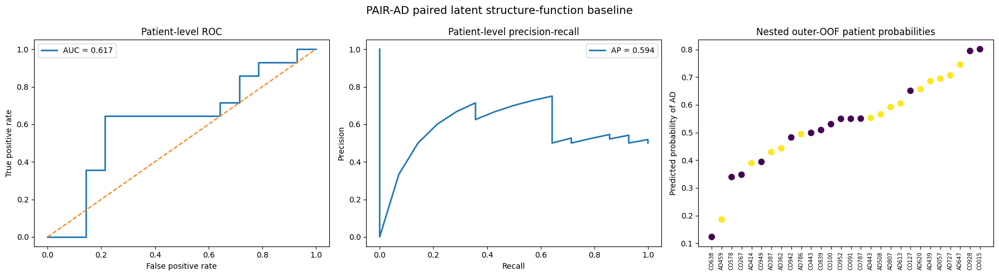


CELL 25 COMPLETE

Saved:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Paired_Latent_Baseline\PAIR_AD_paired_latent_OOF.csv
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Paired_Latent_Baseline\PAIR_AD_paired_latent_fold_results.csv
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Paired_Latent_Baseline\PAIR_AD_paired_latent_inner_search.csv
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Paired_Latent_Baseline\PAIR_AD_paired_latent_patient_features.npz
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Paired_Latent_Baseline\PAIR_AD_paired_latent_summary.txt
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Paired_Latent_Baseline\PAIR_AD_paired_latent_results.png

SEND ME:
  1. LATENT FUNCTIONAL RESPONSE
  2. PATIENT LATENT REPRESENTATIONS
  3. Selected representation/PCA/C/threshold for EACH outer fold
  4. EACH OUTER FOLD RESULT
  5. FINAL PAIRED-LATENT PATIENT

In [33]:
# ==================================================================================================
# CELL 25 — PAIR-AD PAIRED LATENT STRUCTURE–FUNCTION BASELINE
#
# THIRD LEAKAGE-FREE MODEL EXPERIMENT
#
# PURPOSE
# -------
#
# Determine whether LIGHT/DARK FUNCTIONAL information becomes useful
# when represented in deep feature space.
#
#
# Frozen encoder features from Cell 24:
#
#       z_D = ResNet50(DARK)
#       z_L = ResNet50(LIGHT)
#
#
# Structural representation:
#
#       z_S = (z_D + z_L) / 2
#
#
# Raw latent functional response:
#
#       z_delta = z_L - z_D
#
#
# Normalized latent functional response:
#
#                    2(z_L - z_D)
#       z_F = ------------------------------
#              |z_L| + |z_D| + epsilon
#
#
# Patient aggregation:
#
#       mean across 4-5 slices
#
# optionally:
#
#       standard deviation across slices
#
#
# MODEL SELECTION
# ---------------
#
# Candidate representation is selected ONLY using INNER CV.
#
# PCA and logistic-regression C are also INNER-selected.
#
# Classification threshold is chosen using INNER OOF predictions.
#
#
# OUTER TEST PARTICIPANTS ARE NEVER USED FOR MODEL SELECTION.
#
# ==================================================================================================

from pathlib import Path
import warnings
import random

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    average_precision_score,
    confusion_matrix,
    roc_curve,
    precision_recall_curve
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

EPS = 1e-6


PCA_GRID = [
    2,
    3,
    4,
    5,
    6,
    8,
    10
]


C_GRID = [
    0.01,
    0.03,
    0.10,
    0.30,
    1.00,
    3.00,
    10.00
]


THRESHOLD_GRID = np.arange(
    0.10,
    0.91,
    0.01
)


N_BOOTSTRAP = 2000


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


STRUCTURAL_DIR = (
    PAIR_AD_DIR /
    "Structural_ResNet50_Baseline"
)


SLICE_FEATURE_PATH = (
    STRUCTURAL_DIR /
    "ResNet50_slice_features.npz"
)


PATIENT_BAG_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_patient_bags_2026.csv"
)


RESULT_DIR = (
    PAIR_AD_DIR /
    "Paired_Latent_Baseline"
)


RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


OOF_PATH = (
    RESULT_DIR /
    "PAIR_AD_paired_latent_OOF.csv"
)


FOLD_PATH = (
    RESULT_DIR /
    "PAIR_AD_paired_latent_fold_results.csv"
)


INNER_PATH = (
    RESULT_DIR /
    "PAIR_AD_paired_latent_inner_search.csv"
)


FEATURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_paired_latent_patient_features.npz"
)


SUMMARY_PATH = (
    RESULT_DIR /
    "PAIR_AD_paired_latent_summary.txt"
)


FIGURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_paired_latent_results.png"
)


print("=" * 120)
print("CELL 25 — PAIR-AD PAIRED LATENT STRUCTURE–FUNCTION BASELINE")
print("=" * 120)


# ==================================================================================================
# 2. REPRODUCIBILITY
# ==================================================================================================

random.seed(
    SEED
)

np.random.seed(
    SEED
)


# ==================================================================================================
# 3. LOAD FROZEN RESNET FEATURES
# ==================================================================================================

assert SLICE_FEATURE_PATH.exists(), SLICE_FEATURE_PATH
assert PATIENT_BAG_PATH.exists(), PATIENT_BAG_PATH


data = np.load(
    SLICE_FEATURE_PATH,
    allow_pickle=True
)


patient_df = pd.read_csv(
    PATIENT_BAG_PATH
)


required = [
    "z_dark",
    "z_light",
    "z_structure",
    "y",
    "subject",
    "slice_index",
    "outer_fold"
]


for key in required:

    assert key in data.keys(), (
        f"Missing feature key: {key}"
    )


z_dark = data[
    "z_dark"
].astype(
    np.float64
)


z_light = data[
    "z_light"
].astype(
    np.float64
)


z_structure = data[
    "z_structure"
].astype(
    np.float64
)


y_slice = data[
    "y"
].astype(
    np.int64
)


subjects = data[
    "subject"
].astype(str)


slice_index = data[
    "slice_index"
].astype(
    np.int64
)


outer_fold_slice = data[
    "outer_fold"
].astype(
    np.int64
)


print(
    "\nDARK features     :",
    z_dark.shape
)


print(
    "LIGHT features    :",
    z_light.shape
)


print(
    "Structural features:",
    z_structure.shape
)


assert z_dark.shape == (
    135,
    2048
)


assert z_light.shape == (
    135,
    2048
)


assert len(
    np.unique(
        subjects
    )
) == 28


# ==================================================================================================
# 4. LATENT FUNCTIONAL RESPONSE
# ==================================================================================================

z_delta_raw = (
    z_light
    -
    z_dark
)


z_delta_norm = (

    2.0
    *
    (
        z_light
        -
        z_dark
    )

) / (

    np.abs(
        z_light
    )

    +

    np.abs(
        z_dark
    )

    +

    EPS
)


z_delta_norm = np.clip(
    z_delta_norm,
    -2.0,
    2.0
)


print("\n" + "=" * 120)
print("LATENT FUNCTIONAL RESPONSE")
print("=" * 120)


print(
    "Raw latent delta:",
    z_delta_raw.shape
)


print(
    "Normalized latent delta:",
    z_delta_norm.shape
)


print(
    "Normalized delta min:",
    float(
        z_delta_norm.min()
    )
)


print(
    "Normalized delta max:",
    float(
        z_delta_norm.max()
    )
)


print(
    "Normalized delta mean:",
    float(
        z_delta_norm.mean()
    )
)


print(
    "Normalized delta std:",
    float(
        z_delta_norm.std()
    )
)


assert np.isfinite(
    z_delta_norm
).all()


# ==================================================================================================
# 5. BUILD PATIENT-LEVEL REPRESENTATIONS
#
# Each participant has 4 or 5 slice pairs.
#
#
# Candidate representations:
#
# A. STRUCTURE_ONLY
#
#       mean(z_structure)
#
#
# B. RAW_DELTA_ONLY
#
#       mean(z_L - z_D)
#
#
# C. NORM_DELTA_ONLY
#
#       mean(normalized latent response)
#
#
# D. STRUCTURE_PLUS_FUNCTION
#
#       [mean(z_structure),
#        mean(z_function)]
#
#
# E. STRUCTURE_FUNCTION_VARIABILITY
#
#       [mean(z_structure),
#        mean(z_function),
#        std(z_function across slices)]
#
#
# Candidate type itself will be INNER-selected.
# ==================================================================================================

patient_names = sorted(
    np.unique(
        subjects
    )
)


patient_records = []


structure_mean_list = []

delta_raw_mean_list = []

delta_norm_mean_list = []

delta_norm_sd_list = []


for subject_name in patient_names:

    idx = np.where(
        subjects
        ==
        subject_name
    )[0]


    assert len(
        np.unique(
            y_slice[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            outer_fold_slice[
                idx
            ]
        )
    ) == 1


    structure_mean = z_structure[
        idx
    ].mean(
        axis=0
    )


    raw_delta_mean = z_delta_raw[
        idx
    ].mean(
        axis=0
    )


    norm_delta_mean = z_delta_norm[
        idx
    ].mean(
        axis=0
    )


    norm_delta_sd = z_delta_norm[
        idx
    ].std(
        axis=0,
        ddof=0
    )


    structure_mean_list.append(
        structure_mean
    )


    delta_raw_mean_list.append(
        raw_delta_mean
    )


    delta_norm_mean_list.append(
        norm_delta_mean
    )


    delta_norm_sd_list.append(
        norm_delta_sd
    )


    patient_records.append(
        {
            "folder_subject":
                subject_name,

            "target":
                int(
                    y_slice[
                        idx[
                            0
                        ]
                    ]
                ),

            "outer_fold":
                int(
                    outer_fold_slice[
                        idx[
                            0
                        ]
                    ]
                ),

            "n_slices":
                len(
                    idx
                )
        }
    )


structure_mean = np.asarray(
    structure_mean_list,
    dtype=np.float64
)


delta_raw_mean = np.asarray(
    delta_raw_mean_list,
    dtype=np.float64
)


delta_norm_mean = np.asarray(
    delta_norm_mean_list,
    dtype=np.float64
)


delta_norm_sd = np.asarray(
    delta_norm_sd_list,
    dtype=np.float64
)


feature_df = pd.DataFrame(
    patient_records
)


feature_df = feature_df.merge(

    patient_df[
        [
            "folder_subject",
            "inner_fold_outer1",
            "inner_fold_outer2",
            "inner_fold_outer3"
        ]
    ],

    on="folder_subject",

    how="left",

    validate="one_to_one"
)


# ==================================================================================================
# 6. CANDIDATE REPRESENTATIONS
# ==================================================================================================

REPRESENTATIONS = {

    "STRUCTURE_ONLY":
        structure_mean,

    "RAW_DELTA_ONLY":
        delta_raw_mean,

    "NORM_DELTA_ONLY":
        delta_norm_mean,

    "STRUCTURE_PLUS_FUNCTION":
        np.concatenate(
            [
                structure_mean,
                delta_norm_mean
            ],
            axis=1
        ),

    "STRUCTURE_FUNCTION_VARIABILITY":
        np.concatenate(
            [
                structure_mean,
                delta_norm_mean,
                delta_norm_sd
            ],
            axis=1
        )
}


print("\n" + "=" * 120)
print("PATIENT LATENT REPRESENTATIONS")
print("=" * 120)


for name, array in REPRESENTATIONS.items():

    print(
        f"{name:32s}: "
        f"{array.shape}"
    )


    assert array.shape[
        0
    ] == 28


    assert np.isfinite(
        array
    ).all()


# Complexity order used only for tie-breaking.

REPRESENTATION_COMPLEXITY = {

    "STRUCTURE_ONLY":
        0,

    "RAW_DELTA_ONLY":
        1,

    "NORM_DELTA_ONLY":
        1,

    "STRUCTURE_PLUS_FUNCTION":
        2,

    "STRUCTURE_FUNCTION_VARIABILITY":
        3
}


# ==================================================================================================
# 7. SAVE PATIENT FEATURES
# ==================================================================================================

np.savez_compressed(

    FEATURE_PATH,

    structure_mean=structure_mean,

    delta_raw_mean=delta_raw_mean,

    delta_norm_mean=delta_norm_mean,

    delta_norm_sd=delta_norm_sd,

    y=feature_df[
        "target"
    ].values.astype(
        np.int64
    ),

    subject=feature_df[
        "folder_subject"
    ].values.astype(str),

    outer_fold=feature_df[
        "outer_fold"
    ].values.astype(
        np.int64
    )
)


# ==================================================================================================
# 8. ARRAYS
# ==================================================================================================

y_patient = feature_df[
    "target"
].values.astype(
    np.int64
)


outer_folds = feature_df[
    "outer_fold"
].values.astype(
    np.int64
)


patient_names_array = feature_df[
    "folder_subject"
].values.astype(str)


assert (
    y_patient == 0
).sum() == 14


assert (
    y_patient == 1
).sum() == 14


# ==================================================================================================
# 9. METRICS
# ==================================================================================================

def compute_metrics(
    y_true,
    probability,
    threshold
):

    y_true = np.asarray(
        y_true,
        dtype=int
    )


    probability = np.asarray(
        probability,
        dtype=float
    )


    prediction = (
        probability
        >=
        threshold
    ).astype(
        int
    )


    tn, fp, fn, tp = confusion_matrix(

        y_true,

        prediction,

        labels=[
            0,
            1
        ]
    ).ravel()


    specificity = (

        tn
        /
        (
            tn
            +
            fp
        )
    )


    return {

        "accuracy":
            accuracy_score(
                y_true,
                prediction
            ),

        "precision":
            precision_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                prediction
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                prediction
            ),

        "auc":
            roc_auc_score(
                y_true,
                probability
            ),

        "average_precision":
            average_precision_score(
                y_true,
                probability
            ),

        "tn":
            int(
                tn
            ),

        "fp":
            int(
                fp
            ),

        "fn":
            int(
                fn
            ),

        "tp":
            int(
                tp
            )
    }


# ==================================================================================================
# 10. THRESHOLD SELECTION
# ==================================================================================================

def select_threshold(
    y_true,
    probability
):

    best_threshold = 0.50

    best_score = -np.inf


    for threshold in THRESHOLD_GRID:

        prediction = (
            probability
            >=
            threshold
        ).astype(
            int
        )


        score = balanced_accuracy_score(
            y_true,
            prediction
        )


        if score > best_score + 1e-12:

            best_score = score

            best_threshold = float(
                threshold
            )


        elif abs(
            score
            -
            best_score
        ) <= 1e-12:

            if abs(
                threshold
                -
                0.50
            ) < abs(
                best_threshold
                -
                0.50
            ):

                best_threshold = float(
                    threshold
                )


    return (
        best_threshold,
        best_score
    )


# ==================================================================================================
# 11. FIT PCA + LOGISTIC MODEL
#
# Everything learned from TRAIN only.
# ==================================================================================================

def fit_predict(
    X_train,
    y_train,
    X_eval,
    n_components,
    C
):

    scaler = StandardScaler()


    X_train_scaled = scaler.fit_transform(
        X_train
    )


    X_eval_scaled = scaler.transform(
        X_eval
    )


    maximum_components = min(

        X_train_scaled.shape[
            0
        ] - 1,

        X_train_scaled.shape[
            1
        ]
    )


    actual_components = min(

        int(
            n_components
        ),

        int(
            maximum_components
        )
    )


    pca = PCA(

        n_components=actual_components,

        random_state=SEED
    )


    X_train_pca = pca.fit_transform(
        X_train_scaled
    )


    X_eval_pca = pca.transform(
        X_eval_scaled
    )


    classifier = LogisticRegression(

        C=float(
            C
        ),

        penalty="l2",

        solver="liblinear",

        max_iter=5000,

        random_state=SEED
    )


    classifier.fit(

        X_train_pca,

        y_train
    )


    probability = classifier.predict_proba(

        X_eval_pca

    )[
        :,
        1
    ]


    return probability


# ==================================================================================================
# 12. STORAGE
# ==================================================================================================

oof_probability = np.full(
    28,
    np.nan,
    dtype=np.float64
)


oof_prediction = np.full(
    28,
    -1,
    dtype=np.int64
)


oof_threshold = np.full(
    28,
    np.nan,
    dtype=np.float64
)


selected_representation = np.full(
    28,
    "",
    dtype=object
)


fold_records = []

inner_records = []


# ==================================================================================================
# 13. NESTED CV
# ==================================================================================================

print("\n" + "=" * 120)
print("STARTING NESTED PAIRED LATENT CV")
print("=" * 120)


for outer in [
    1,
    2,
    3
]:

    print("\n")
    print("#" * 120)
    print(
        f"OUTER FOLD {outer}"
    )
    print("#" * 120)


    outer_train = np.where(
        outer_folds
        !=
        outer
    )[0]


    outer_test = np.where(
        outer_folds
        ==
        outer
    )[0]


    inner_col = (
        f"inner_fold_outer{outer}"
    )


    inner_assignments = feature_df[
        inner_col
    ].values.astype(
        np.int64
    )


    search_rows = []


    # ==============================================================================================
    # INNER SEARCH
    #
    # Search:
    #
    #       representation
    #       PCA dimensions
    #       Logistic C
    #
    # ==============================================================================================

    for representation_name, X_candidate in REPRESENTATIONS.items():

        for n_components in PCA_GRID:

            for C in C_GRID:

                inner_aucs = []


                for inner in [
                    1,
                    2,
                    3
                ]:

                    inner_train = np.where(

                        (
                            outer_folds
                            !=
                            outer
                        )

                        &

                        (
                            inner_assignments
                            !=
                            inner
                        )

                    )[0]


                    inner_val = np.where(

                        (
                            outer_folds
                            !=
                            outer
                        )

                        &

                        (
                            inner_assignments
                            ==
                            inner
                        )

                    )[0]


                    probability = fit_predict(

                        X_candidate[
                            inner_train
                        ],

                        y_patient[
                            inner_train
                        ],

                        X_candidate[
                            inner_val
                        ],

                        n_components,

                        C
                    )


                    auc_value = roc_auc_score(

                        y_patient[
                            inner_val
                        ],

                        probability
                    )


                    inner_aucs.append(
                        auc_value
                    )


                    inner_records.append(
                        {

                            "outer_fold":
                                outer,

                            "representation":
                                representation_name,

                            "pca_components":
                                n_components,

                            "C":
                                C,

                            "inner_fold":
                                inner,

                            "validation_auc":
                                auc_value
                        }
                    )


                search_rows.append(
                    {

                        "representation":
                            representation_name,

                        "pca_components":
                            n_components,

                        "C":
                            C,

                        "mean_auc":
                            float(
                                np.mean(
                                    inner_aucs
                                )
                            ),

                        "sd_auc":
                            float(
                                np.std(
                                    inner_aucs,
                                    ddof=1
                                )
                            )
                    }
                )


    search_df = pd.DataFrame(
        search_rows
    )


    # ==============================================================================================
    # SELECT BEST INNER CONFIGURATION
    # ==============================================================================================

    best_auc = search_df[
        "mean_auc"
    ].max()


    candidates = search_df[
        np.isclose(
            search_df[
                "mean_auc"
            ],
            best_auc
        )
    ].copy()


    candidates[
        "complexity"
    ] = candidates[
        "representation"
    ].map(
        REPRESENTATION_COMPLEXITY
    )


    # Tie-break:
    #
    #       simpler representation
    #       fewer PCA components
    #       stronger regularization

    candidates = candidates.sort_values(

        [
            "complexity",
            "pca_components",
            "C"
        ],

        ascending=[
            True,
            True,
            True
        ]
    )


    best = candidates.iloc[
        0
    ]


    best_representation = str(
        best[
            "representation"
        ]
    )


    best_pca = int(
        best[
            "pca_components"
        ]
    )


    best_C = float(
        best[
            "C"
        ]
    )


    print(
        "Selected representation:",
        best_representation
    )


    print(
        "Selected PCA dimensions:",
        best_pca
    )


    print(
        "Selected C:",
        best_C
    )


    print(
        "Best inner mean AUC:",
        f"{best_auc:.4f}"
    )


    X_selected = REPRESENTATIONS[
        best_representation
    ]


    # ==============================================================================================
    # INNER OOF FOR THRESHOLD
    # ==============================================================================================

    global_to_local = {

        int(
            global_idx
        ):
            local_idx

        for local_idx, global_idx in enumerate(
            outer_train
        )
    }


    inner_oof_probability = np.full(

        len(
            outer_train
        ),

        np.nan,

        dtype=np.float64
    )


    for inner in [
        1,
        2,
        3
    ]:

        inner_train = np.where(

            (
                outer_folds
                !=
                outer
            )

            &

            (
                inner_assignments
                !=
                inner
            )

        )[0]


        inner_val = np.where(

            (
                outer_folds
                !=
                outer
            )

            &

            (
                inner_assignments
                ==
                inner
            )

        )[0]


        probability = fit_predict(

            X_selected[
                inner_train
            ],

            y_patient[
                inner_train
            ],

            X_selected[
                inner_val
            ],

            best_pca,

            best_C
        )


        for global_idx, prob in zip(
            inner_val,
            probability
        ):

            local_idx = global_to_local[
                int(
                    global_idx
                )
            ]


            inner_oof_probability[
                local_idx
            ] = prob


    assert np.isfinite(
        inner_oof_probability
    ).all()


    threshold, inner_balanced = select_threshold(

        y_patient[
            outer_train
        ],

        inner_oof_probability
    )


    inner_oof_auc = roc_auc_score(

        y_patient[
            outer_train
        ],

        inner_oof_probability
    )


    print(
        "Selected threshold:",
        f"{threshold:.2f}"
    )


    print(
        "Inner OOF AUC:",
        f"{inner_oof_auc:.4f}"
    )


    print(
        "Inner OOF balanced accuracy:",
        f"{inner_balanced:.4f}"
    )


    # ==============================================================================================
    # FINAL OUTER TEST
    # ==============================================================================================

    test_probability = fit_predict(

        X_selected[
            outer_train
        ],

        y_patient[
            outer_train
        ],

        X_selected[
            outer_test
        ],

        best_pca,

        best_C
    )


    test_prediction = (
        test_probability
        >=
        threshold
    ).astype(
        np.int64
    )


    oof_probability[
        outer_test
    ] = test_probability


    oof_prediction[
        outer_test
    ] = test_prediction


    oof_threshold[
        outer_test
    ] = threshold


    selected_representation[
        outer_test
    ] = best_representation


    metrics = compute_metrics(

        y_patient[
            outer_test
        ],

        test_probability,

        threshold
    )


    fold_records.append(
        {

            "outer_fold":
                outer,

            "train_patients":
                len(
                    outer_train
                ),

            "test_patients":
                len(
                    outer_test
                ),

            "selected_representation":
                best_representation,

            "pca_components":
                best_pca,

            "selected_C":
                best_C,

            "selected_threshold":
                threshold,

            "inner_mean_auc":
                best_auc,

            "inner_oof_auc":
                inner_oof_auc,

            **metrics
        }
    )


    print("\n" + "-" * 100)
    print(
        f"OUTER FOLD {outer} RESULT"
    )
    print("-" * 100)


    for metric_name in [
        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc",
        "average_precision"
    ]:

        print(
            f"{metric_name:20s}: "
            f"{metrics[metric_name]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )


    print(
        np.array(
            [
                [
                    metrics["tn"],
                    metrics["fp"]
                ],
                [
                    metrics["fn"],
                    metrics["tp"]
                ]
            ]
        )
    )


# ==================================================================================================
# 14. FINAL OOF PERFORMANCE
# ==================================================================================================

assert np.isfinite(
    oof_probability
).all()


assert (
    oof_prediction
    >=
    0
).all()


tn, fp, fn, tp = confusion_matrix(

    y_patient,

    oof_prediction,

    labels=[
        0,
        1
    ]
).ravel()


specificity = (
    tn
    /
    (
        tn
        +
        fp
    )
)


overall = {

    "accuracy":
        accuracy_score(
            y_patient,
            oof_prediction
        ),

    "precision":
        precision_score(
            y_patient,
            oof_prediction,
            zero_division=0
        ),

    "recall":
        recall_score(
            y_patient,
            oof_prediction,
            zero_division=0
        ),

    "specificity":
        specificity,

    "f1":
        f1_score(
            y_patient,
            oof_prediction,
            zero_division=0
        ),

    "balanced_accuracy":
        balanced_accuracy_score(
            y_patient,
            oof_prediction
        ),

    "mcc":
        matthews_corrcoef(
            y_patient,
            oof_prediction
        ),

    "auc":
        roc_auc_score(
            y_patient,
            oof_probability
        ),

    "average_precision":
        average_precision_score(
            y_patient,
            oof_probability
        )
}


print("\n" + "=" * 120)
print("FINAL PAIRED-LATENT PATIENT-LEVEL OOF PERFORMANCE")
print("=" * 120)


for key, value in overall.items():

    print(
        f"{key:20s}: "
        f"{value:.4f}"
    )


print(
    "\nConfusion matrix:"
)


print(
    np.array(
        [
            [
                tn,
                fp
            ],
            [
                fn,
                tp
            ]
        ]
    )
)


# ==================================================================================================
# 15. SELECTED REPRESENTATION SUMMARY
# ==================================================================================================

fold_df = pd.DataFrame(
    fold_records
)


print("\n" + "=" * 120)
print("SELECTED REPRESENTATIONS")
print("=" * 120)


print(
    fold_df[
        [
            "outer_fold",
            "selected_representation",
            "pca_components",
            "selected_C",
            "selected_threshold",
            "inner_mean_auc",
            "auc"
        ]
    ].to_string(
        index=False
    )
)


# ==================================================================================================
# 16. BOOTSTRAP CI
# ==================================================================================================

rng = np.random.default_rng(
    SEED
)


control_idx = np.where(
    y_patient == 0
)[0]


ad_idx = np.where(
    y_patient == 1
)[0]


auc_boot = []

accuracy_boot = []

balanced_boot = []


for _ in range(
    N_BOOTSTRAP
):

    sampled = np.concatenate(
        [

            rng.choice(
                control_idx,
                len(
                    control_idx
                ),
                replace=True
            ),

            rng.choice(
                ad_idx,
                len(
                    ad_idx
                ),
                replace=True
            )
        ]
    )


    auc_boot.append(

        roc_auc_score(

            y_patient[
                sampled
            ],

            oof_probability[
                sampled
            ]
        )
    )


    accuracy_boot.append(

        accuracy_score(

            y_patient[
                sampled
            ],

            oof_prediction[
                sampled
            ]
        )
    )


    balanced_boot.append(

        balanced_accuracy_score(

            y_patient[
                sampled
            ],

            oof_prediction[
                sampled
            ]
        )
    )


auc_ci = np.percentile(
    auc_boot,
    [
        2.5,
        97.5
    ]
)


accuracy_ci = np.percentile(
    accuracy_boot,
    [
        2.5,
        97.5
    ]
)


balanced_ci = np.percentile(
    balanced_boot,
    [
        2.5,
        97.5
    ]
)


print("\n" + "=" * 120)
print("PATIENT BOOTSTRAP 95% CONFIDENCE INTERVALS")
print("=" * 120)


print(
    f"AUC: "
    f"{overall['auc']:.4f} "
    f"[{auc_ci[0]:.4f} - "
    f"{auc_ci[1]:.4f}]"
)


print(
    f"Accuracy: "
    f"{overall['accuracy']:.4f} "
    f"[{accuracy_ci[0]:.4f} - "
    f"{accuracy_ci[1]:.4f}]"
)


print(
    f"Balanced accuracy: "
    f"{overall['balanced_accuracy']:.4f} "
    f"[{balanced_ci[0]:.4f} - "
    f"{balanced_ci[1]:.4f}]"
)


# ==================================================================================================
# 17. OOF TABLE
# ==================================================================================================

oof_df = pd.DataFrame(
    {

        "folder_subject":
            patient_names_array,

        "target":
            y_patient,

        "outer_fold":
            outer_folds,

        "selected_representation":
            selected_representation,

        "probability_AD":
            oof_probability,

        "threshold":
            oof_threshold,

        "prediction":
            oof_prediction
    }
)


oof_df = oof_df.sort_values(
    "probability_AD"
).reset_index(
    drop=True
)


print("\n" + "=" * 120)
print("PAIRED-LATENT PATIENT OOF PREDICTIONS")
print("=" * 120)


print(
    oof_df.to_string(
        index=False
    )
)


# ==================================================================================================
# 18. OUTER-FOLD MEAN ± SD
# ==================================================================================================

print("\n" + "=" * 120)
print("OUTER-FOLD MEAN ± SD")
print("=" * 120)


for metric_name in [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "average_precision"
]:

    mean_value = fold_df[
        metric_name
    ].mean()


    sd_value = fold_df[
        metric_name
    ].std(
        ddof=1
    )


    print(
        f"{metric_name:20s}: "
        f"{mean_value:.4f} "
        f"± "
        f"{sd_value:.4f}"
    )


# ==================================================================================================
# 19. RESULT FIGURE
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING PAIRED-LATENT RESULT FIGURE")
print("=" * 120)


fig, axes = plt.subplots(
    1,
    3,
    figsize=(
        18,
        5
    )
)


# ROC

fpr, tpr, _ = roc_curve(
    y_patient,
    oof_probability
)


axes[
    0
].plot(
    fpr,
    tpr,
    linewidth=2,
    label=(
        f"AUC = "
        f"{overall['auc']:.3f}"
    )
)


axes[
    0
].plot(
    [
        0,
        1
    ],
    [
        0,
        1
    ],
    linestyle="--"
)


axes[
    0
].set_xlabel(
    "False positive rate"
)


axes[
    0
].set_ylabel(
    "True positive rate"
)


axes[
    0
].set_title(
    "Patient-level ROC"
)


axes[
    0
].legend()


# PR

precision_curve, recall_curve, _ = precision_recall_curve(
    y_patient,
    oof_probability
)


axes[
    1
].plot(
    recall_curve,
    precision_curve,
    linewidth=2,
    label=(
        f"AP = "
        f"{overall['average_precision']:.3f}"
    )
)


axes[
    1
].set_xlabel(
    "Recall"
)


axes[
    1
].set_ylabel(
    "Precision"
)


axes[
    1
].set_title(
    "Patient-level precision-recall"
)


axes[
    1
].legend()


# Patient probabilities

plot_df = oof_df.sort_values(
    "probability_AD"
).reset_index(
    drop=True
)


positions = np.arange(
    len(
        plot_df
    )
)


axes[
    2
].scatter(
    positions,
    plot_df[
        "probability_AD"
    ],
    c=plot_df[
        "target"
    ],
    s=55
)


axes[
    2
].set_xticks(
    positions
)


axes[
    2
].set_xticklabels(
    plot_df[
        "folder_subject"
    ],
    rotation=90,
    fontsize=7
)


axes[
    2
].set_ylabel(
    "Predicted probability of AD"
)


axes[
    2
].set_title(
    "Nested outer-OOF patient probabilities"
)


plt.suptitle(
    "PAIR-AD paired latent structure-function baseline",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 20. SAVE RESULTS
# ==================================================================================================

oof_df.to_csv(
    OOF_PATH,
    index=False
)


fold_df.to_csv(
    FOLD_PATH,
    index=False
)


pd.DataFrame(
    inner_records
).to_csv(
    INNER_PATH,
    index=False
)


with open(
    SUMMARY_PATH,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PAIR-AD PAIRED LATENT STRUCTURE-FUNCTION BASELINE\n"
    )


    f.write(
        "=" * 90
        +
        "\n\n"
    )


    f.write(
        "Participants: 28 (14 AD / 14 Control)\n"
    )


    f.write(
        "Frozen encoder: ImageNet ResNet-50\n"
    )


    f.write(
        "Validation: nested participant-exclusive 3x3 CV\n"
    )


    f.write(
        "Representation/PCA/C selected by INNER CV only\n"
    )


    f.write(
        "Threshold selected using INNER OOF only\n\n"
    )


    for key, value in overall.items():

        f.write(
            f"{key}: "
            f"{value:.6f}\n"
        )


    f.write(
        "\n"
    )


    f.write(
        f"AUC 95% CI: "
        f"{auc_ci[0]:.6f} - "
        f"{auc_ci[1]:.6f}\n"
    )


# ==================================================================================================
# 21. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 25 COMPLETE")
print("=" * 120)


print(
    "\nSaved:"
)


print(
    OOF_PATH
)


print(
    FOLD_PATH
)


print(
    INNER_PATH
)


print(
    FEATURE_PATH
)


print(
    SUMMARY_PATH
)


print(
    FIGURE_PATH
)


print(
    "\nSEND ME:"
)


print(
    "  1. LATENT FUNCTIONAL RESPONSE"
)


print(
    "  2. PATIENT LATENT REPRESENTATIONS"
)


print(
    "  3. Selected representation/PCA/C/threshold for EACH outer fold"
)


print(
    "  4. EACH OUTER FOLD RESULT"
)


print(
    "  5. FINAL PAIRED-LATENT PATIENT-LEVEL OOF PERFORMANCE"
)


print(
    "  6. SELECTED REPRESENTATIONS"
)


print(
    "  7. PATIENT BOOTSTRAP 95% CONFIDENCE INTERVALS"
)


print(
    "  8. PAIRED-LATENT PATIENT OOF PREDICTIONS"
)


print(
    "  9. OUTER-FOLD MEAN ± SD"
)


print(
    " 10. Result figure"
)

In [34]:
# ==================================================================================================
# CELL 26 — RETFOUND-OCT ENVIRONMENT + CHECKPOINT AUDIT
#
# NO TRAINING
# NO PACKAGE INSTALLATION
# NO FILE DOWNLOAD
#
# PURPOSE
# -------
#
# Determine:
#
#   1. Current Python / PyTorch environment
#   2. Whether timm is available
#   3. Whether HuggingFace support is available
#   4. Whether an official RETFound repository already exists locally
#   5. Whether RETFound OCT weights already exist locally
#   6. Whether GPU memory is sufficient
#
# IMPORTANT:
#
# This cell DOES NOT print passwords or HuggingFace tokens.
# ==================================================================================================

from pathlib import Path
import sys
import os
import platform
import importlib.util

import torch
import torchvision


# ==================================================================================================
# 1. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


RETFOUND_WORK_DIR = (
    DATA_ROOT /
    "_retfound"
)


RETFOUND_WORK_DIR.mkdir(
    parents=True,
    exist_ok=True
)


print("=" * 115)
print("CELL 26 — RETFOUND-OCT ENVIRONMENT + CHECKPOINT AUDIT")
print("=" * 115)


# ==================================================================================================
# 2. PYTHON
# ==================================================================================================

print("\n" + "=" * 115)
print("PYTHON ENVIRONMENT")
print("=" * 115)


print(
    "Python version :",
    sys.version
)


print(
    "Executable     :",
    sys.executable
)


print(
    "Platform       :",
    platform.platform()
)


print(
    "Working dir    :",
    os.getcwd()
)


# ==================================================================================================
# 3. PYTORCH
# ==================================================================================================

print("\n" + "=" * 115)
print("PYTORCH ENVIRONMENT")
print("=" * 115)


print(
    "PyTorch        :",
    torch.__version__
)


print(
    "Torchvision    :",
    torchvision.__version__
)


print(
    "CUDA available :",
    torch.cuda.is_available()
)


if torch.cuda.is_available():

    print(
        "CUDA runtime   :",
        torch.version.cuda
    )


    print(
        "GPU            :",
        torch.cuda.get_device_name(0)
    )


    properties = torch.cuda.get_device_properties(
        0
    )


    total_memory = (
        properties.total_memory
        /
        1024 ** 3
    )


    print(
        "GPU memory     :",
        f"{total_memory:.2f} GB"
    )


# ==================================================================================================
# 4. PACKAGE AUDIT
# ==================================================================================================

print("\n" + "=" * 115)
print("PACKAGE AUDIT")
print("=" * 115)


packages = [

    "timm",
    "huggingface_hub",
    "transformers",
    "einops",
    "scipy",
    "sklearn",
    "PIL"

]


for package in packages:

    spec = importlib.util.find_spec(
        package
    )


    if spec is None:

        print(
            f"{package:20s}: NOT INSTALLED"
        )


    else:

        try:

            module = __import__(
                package
            )


            version = getattr(
                module,
                "__version__",
                "version unavailable"
            )


            print(
                f"{package:20s}: INSTALLED | {version}"
            )


        except Exception as e:

            print(
                f"{package:20s}: FOUND but import failed"
            )


            print(
                " " * 22,
                str(
                    e
                )
            )


# ==================================================================================================
# 5. SEARCH FOR EXISTING RETFOUND REPOSITORIES
#
# We only inspect likely locations.
# We DO NOT recursively search the entire computer.
# ==================================================================================================

print("\n" + "=" * 115)
print("LOCAL RETFOUND REPOSITORY AUDIT")
print("=" * 115)


candidate_repo_paths = [

    RETFOUND_WORK_DIR /
    "RETFound",

    DATA_ROOT /
    "RETFound",

    Path.home() /
    "RETFound",

    Path.home() /
    "Documents" /
    "RETFound",

    Path.home() /
    "Downloads" /
    "RETFound"

]


existing_repos = []


for candidate in candidate_repo_paths:

    models_vit = (
        candidate /
        "models_vit.py"
    )


    main_finetune = (
        candidate /
        "main_finetune.py"
    )


    if (
        candidate.exists()
        and
        models_vit.exists()
    ):

        existing_repos.append(
            candidate
        )


        print(
            "FOUND:"
        )


        print(
            candidate
        )


        print(
            "  models_vit.py:",
            models_vit.exists()
        )


        print(
            "  main_finetune.py:",
            main_finetune.exists()
        )


if len(
    existing_repos
) == 0:

    print(
        "No local RETFound repository found in standard locations."
    )


# ==================================================================================================
# 6. SEARCH FOR EXISTING RETFOUND CHECKPOINTS
#
# Only selected folders are searched.
# ==================================================================================================

print("\n" + "=" * 115)
print("LOCAL RETFOUND CHECKPOINT AUDIT")
print("=" * 115)


checkpoint_roots = [

    RETFOUND_WORK_DIR,

    DATA_ROOT,

    Path.home() /
    ".cache" /
    "huggingface" /
    "hub",

    Path.home() /
    "Downloads"

]


checkpoint_patterns = [

    "*RETFound*OCT*.pth",

    "*retfound*oct*.pth",

    "*natureOCT*.pth",

    "*RETFound*OCT*.pt",

    "*retfound*oct*.pt",

    "*natureOCT*.pt",

    "*RETFound*OCT*.bin",

    "*natureOCT*.bin",

    "*RETFound*OCT*.safetensors",

    "*natureOCT*.safetensors"

]


found_checkpoints = []


for root in checkpoint_roots:

    if not root.exists():

        continue


    for pattern in checkpoint_patterns:

        try:

            matches = list(
                root.rglob(
                    pattern
                )
            )


            for match in matches:

                if match not in found_checkpoints:

                    found_checkpoints.append(
                        match
                    )


        except Exception:

            pass


if len(
    found_checkpoints
) == 0:

    print(
        "No RETFound OCT checkpoint found locally."
    )


else:

    for checkpoint in found_checkpoints:

        try:

            size_gb = (
                checkpoint.stat().st_size
                /
                1024 ** 3
            )


        except Exception:

            size_gb = float(
                "nan"
            )


        print(
            "\nFOUND CHECKPOINT:"
        )


        print(
            checkpoint
        )


        print(
            "Size:",
            f"{size_gb:.3f} GB"
        )


# ==================================================================================================
# 7. VERIFY PAIR-AD INPUT
# ==================================================================================================

print("\n" + "=" * 115)
print("PAIR-AD INPUT AUDIT")
print("=" * 115)


PAIR_AD_NPZ = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)


print(
    "Dataset:"
)

print(
    PAIR_AD_NPZ
)


print(
    "Exists:",
    PAIR_AD_NPZ.exists()
)


if PAIR_AD_NPZ.exists():

    import numpy as np


    pair_data = np.load(
        PAIR_AD_NPZ,
        allow_pickle=True
    )


    print(
        "\nAvailable keys:"
    )


    print(
        list(
            pair_data.keys()
        )
    )


    print(
        "\nFLAT_NORMED DARK:",
        pair_data[
            "flat_normed_dark"
        ].shape
    )


    print(
        "FLAT_NORMED LIGHT:",
        pair_data[
            "flat_normed_light"
        ].shape
    )


    print(
        "Participants:",
        len(
            np.unique(
                pair_data[
                    "subject"
                ]
            )
        )
    )


# ==================================================================================================
# 8. FINAL STATUS
# ==================================================================================================

print("\n" + "=" * 115)
print("RETFOUND READINESS STATUS")
print("=" * 115)


repo_ready = (
    len(
        existing_repos
    )
    >
    0
)


checkpoint_ready = (
    len(
        found_checkpoints
    )
    >
    0
)


timm_ready = (
    importlib.util.find_spec(
        "timm"
    )
    is not None
)


hf_ready = (
    importlib.util.find_spec(
        "huggingface_hub"
    )
    is not None
)


print(
    "RETFound repository :",
    "READY"
    if repo_ready
    else "MISSING"
)


print(
    "RETFound OCT weights:",
    "READY"
    if checkpoint_ready
    else "MISSING"
)


print(
    "timm               :",
    "READY"
    if timm_ready
    else "MISSING"
)


print(
    "huggingface_hub    :",
    "READY"
    if hf_ready
    else "MISSING"
)


print(
    "PAIR-AD dataset     :",
    "READY"
    if PAIR_AD_NPZ.exists()
    else "MISSING"
)


print("\n" + "=" * 115)
print("CELL 26 COMPLETE")
print("=" * 115)


print(
    "\nNO PACKAGES WERE INSTALLED."
)


print(
    "NO MODEL WAS DOWNLOADED."
)


print(
    "NO TRAINING WAS PERFORMED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. PYTHON ENVIRONMENT"
)


print(
    "  2. PYTORCH ENVIRONMENT"
)


print(
    "  3. PACKAGE AUDIT"
)


print(
    "  4. LOCAL RETFOUND REPOSITORY AUDIT"
)


print(
    "  5. LOCAL RETFOUND CHECKPOINT AUDIT"
)


print(
    "  6. RETFOUND READINESS STATUS"
)

CELL 26 — RETFOUND-OCT ENVIRONMENT + CHECKPOINT AUDIT

PYTHON ENVIRONMENT
Python version : 3.9.18 (main, Sep 11 2023, 13:30:38) [MSC v.1916 64 bit (AMD64)]
Executable     : C:\Users\Testing\.conda\envs\test_env_gpu\python.exe
Platform       : Windows-10-10.0.26200-SP0
Working dir    : C:\Windows\System32

PYTORCH ENVIRONMENT
PyTorch        : 2.7.1+cu118
Torchvision    : 0.22.1+cu118
CUDA available : True
CUDA runtime   : 11.8
GPU            : NVIDIA GeForce RTX 4070 SUPER
GPU memory     : 11.99 GB

PACKAGE AUDIT
timm                : INSTALLED | 1.0.25
huggingface_hub     : INSTALLED | 1.7.1
transformers        : NOT INSTALLED
einops              : NOT INSTALLED
scipy               : INSTALLED | 1.13.1
sklearn             : INSTALLED | 1.6.1
PIL                 : INSTALLED | 11.2.1

LOCAL RETFOUND REPOSITORY AUDIT
No local RETFound repository found in standard locations.

LOCAL RETFOUND CHECKPOINT AUDIT
No RETFound OCT checkpoint found locally.

PAIR-AD INPUT AUDIT
Dataset:
D:\Datasets

In [35]:
# ==================================================================================================
# CELL 27 — RETFOUND_PAIRAD NEW ENVIRONMENT VERIFICATION
#
# NO TRAINING
# NO MODEL LOADING YET
#
# ==================================================================================================

from pathlib import Path
import sys
import os
import importlib.util

import torch
import torchvision
import numpy as np


print("=" * 115)
print("CELL 27 — RETFOUND_PAIRAD ENVIRONMENT VERIFICATION")
print("=" * 115)


# ==================================================================================================
# 1. PYTHON
# ==================================================================================================

print("\n" + "=" * 115)
print("PYTHON")
print("=" * 115)


print(
    "Python version :",
    sys.version
)


print(
    "Executable     :",
    sys.executable
)


print(
    "Working dir    :",
    os.getcwd()
)


# ==================================================================================================
# 2. PYTORCH
# ==================================================================================================

print("\n" + "=" * 115)
print("PYTORCH")
print("=" * 115)


print(
    "PyTorch     :",
    torch.__version__
)


print(
    "Torchvision :",
    torchvision.__version__
)


print(
    "CUDA        :",
    torch.cuda.is_available()
)


if torch.cuda.is_available():

    print(
        "CUDA runtime:",
        torch.version.cuda
    )


    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )


    memory_gb = (
        torch.cuda
        .get_device_properties(0)
        .total_memory
        /
        1024 ** 3
    )


    print(
        "GPU memory:",
        f"{memory_gb:.2f} GB"
    )


# ==================================================================================================
# 3. PACKAGES
# ==================================================================================================

print("\n" + "=" * 115)
print("RETFOUND PACKAGE CHECK")
print("=" * 115)


packages = [

    "timm",
    "huggingface_hub",
    "sklearn",
    "PIL",
    "cv2"

]


for package in packages:

    spec = importlib.util.find_spec(
        package
    )


    if spec is None:

        print(
            f"{package:20s}: MISSING"
        )

    else:

        module = __import__(
            package
        )


        version = getattr(
            module,
            "__version__",
            "version unavailable"
        )


        print(
            f"{package:20s}: READY | {version}"
        )


# ==================================================================================================
# 4. OFFICIAL RETFOUND REPOSITORY
# ==================================================================================================

RETFOUND_DIR = Path(
    r"D:\Datasets\RETFound_PAIRAD\RETFound"
)


print("\n" + "=" * 115)
print("OFFICIAL RETFOUND REPOSITORY")
print("=" * 115)


print(
    "Repository:"
)

print(
    RETFOUND_DIR
)


print(
    "\nExists:",
    RETFOUND_DIR.exists()
)


important_files = [

    "models_vit.py",
    "main_finetune.py",
    "requirements.txt"

]


for filename in important_files:

    path = (
        RETFOUND_DIR /
        filename
    )


    print(
        f"{filename:25s}:",
        "READY"
        if path.exists()
        else "MISSING"
    )


# ==================================================================================================
# 5. PAIR-AD DATASET
# ==================================================================================================

PAIR_AD_PATH = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
) / "_paper_reproduction" / "PAIR_AD" / \
    "PAIR_AD_highres_256_clean_functional.npz"


print("\n" + "=" * 115)
print("PAIR-AD DATASET")
print("=" * 115)


print(
    "Exists:",
    PAIR_AD_PATH.exists()
)


if PAIR_AD_PATH.exists():

    data = np.load(
        PAIR_AD_PATH,
        allow_pickle=True
    )


    print(
        "Keys:"
    )


    print(
        list(
            data.keys()
        )
    )


    print(
        "\nFLAT_NORMED DARK:",
        data[
            "flat_normed_dark"
        ].shape
    )


    print(
        "FLAT_NORMED LIGHT:",
        data[
            "flat_normed_light"
        ].shape
    )


    print(
        "Subjects:",
        len(
            np.unique(
                data[
                    "subject"
                ]
            )
        )
    )


# ==================================================================================================
# 6. GPU FLOAT16 TEST
#
# Important because RETFound ViT-Large is ~300M parameters.
# ==================================================================================================

print("\n" + "=" * 115)
print("GPU TEST")
print("=" * 115)


if torch.cuda.is_available():

    x = torch.randn(
        2,
        3,
        224,
        224,
        device="cuda",
        dtype=torch.float16
    )


    print(
        "FP16 test tensor:",
        tuple(
            x.shape
        )
    )


    print(
        "dtype:",
        x.dtype
    )


    print(
        "device:",
        x.device
    )


    del x

    torch.cuda.empty_cache()


    print(
        "✓ GPU FP16 test passed."
    )


else:

    print(
        "WARNING: CUDA is unavailable."
    )


# ==================================================================================================
# 7. FINAL STATUS
# ==================================================================================================

repo_ready = (

    RETFOUND_DIR.exists()

    and

    (
        RETFOUND_DIR /
        "models_vit.py"
    ).exists()
)


data_ready = (
    PAIR_AD_PATH.exists()
)


print("\n" + "=" * 115)
print("CELL 27 FINAL STATUS")
print("=" * 115)


print(
    "Correct Python 3.11 environment:",
    "YES"
    if sys.version_info.major == 3
    and sys.version_info.minor == 11
    else "NO"
)


print(
    "CUDA:",
    "READY"
    if torch.cuda.is_available()
    else "MISSING"
)


print(
    "RETFound repository:",
    "READY"
    if repo_ready
    else "MISSING"
)


print(
    "PAIR-AD dataset:",
    "READY"
    if data_ready
    else "MISSING"
)


print("\n" + "=" * 115)
print("CELL 27 COMPLETE")
print("=" * 115)


print(
    "\nNO MODEL WAS TRAINED."
)


print(
    "NO RETFOUND FEATURES WERE EXTRACTED YET."
)


print(
    "\nSEND ME:"
)


print(
    "  1. PYTHON"
)


print(
    "  2. PYTORCH"
)


print(
    "  3. RETFOUND PACKAGE CHECK"
)


print(
    "  4. OFFICIAL RETFOUND REPOSITORY"
)


print(
    "  5. CELL 27 FINAL STATUS"
)

CELL 27 — RETFOUND_PAIRAD ENVIRONMENT VERIFICATION

PYTHON
Python version : 3.9.18 (main, Sep 11 2023, 13:30:38) [MSC v.1916 64 bit (AMD64)]
Executable     : C:\Users\Testing\.conda\envs\test_env_gpu\python.exe
Working dir    : C:\Windows\System32

PYTORCH
PyTorch     : 2.7.1+cu118
Torchvision : 0.22.1+cu118
CUDA        : True
CUDA runtime: 11.8
GPU: NVIDIA GeForce RTX 4070 SUPER
GPU memory: 11.99 GB

RETFOUND PACKAGE CHECK
timm                : READY | 1.0.25
huggingface_hub     : READY | 1.7.1
sklearn             : READY | 1.6.1
PIL                 : READY | 11.2.1
cv2                 : READY | 4.13.0

OFFICIAL RETFOUND REPOSITORY
Repository:
D:\Datasets\RETFound_PAIRAD\RETFound

Exists: False
models_vit.py            : MISSING
main_finetune.py         : MISSING
requirements.txt         : MISSING

PAIR-AD DATASET
Exists: True
Keys:
['raw_dark', 'raw_light', 'flat_normed_dark', 'flat_normed_light', 'functional_response_original', 'functional_valid_mask', 'functional_response_clean', '

In [36]:
# ==================================================================================================
# CELL 26B — PAIR-AD-SF-MIL ARCHITECTURE SANITY CHECK
#
# CURRENT ENVIRONMENT ONLY
#
# NO RETFOUND
# NO NEW ENVIRONMENT
# NO PACKAGE INSTALLATION
# NO TRAINING
#
# Model:
#
#   FLAT_NORMED DARK ─┐
#                     ├─ Shared ResNet spatial encoder
#   FLAT_NORMED LIGHT ┘
#
#                      ↓
#
#               Structural feature
#               Functional difference
#
#                      +
#
#          Explicit functional-response CNN
#
#                      ↓
#
#                Cross-gated fusion
#
#                      ↓
#
#                 Slice embedding
#
#                      ↓
#
#                Attention-based MIL
#
#                      ↓
#
#                  Patient logit
#
# ==================================================================================================

from pathlib import Path
import random
import warnings

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision.models import (
    resnet50,
    ResNet50_Weights
)

warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIG
# ==================================================================================================

SEED = 2026

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

IMAGE_SIZE = 224

ADAPTER_CHANNELS = 128

SLICE_EMBED_DIM = 256

MIL_HIDDEN_DIM = 128


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)

NPZ_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)

PATIENT_BAG_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_patient_bags_2026.csv"
)


print("=" * 120)
print("CELL 26B — PAIR-AD-SF-MIL ARCHITECTURE SANITY CHECK")
print("=" * 120)

print(
    "\nDevice:",
    DEVICE
)

if DEVICE.type == "cuda":

    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )


# ==================================================================================================
# 2. REPRODUCIBILITY
# ==================================================================================================

random.seed(
    SEED
)

np.random.seed(
    SEED
)

torch.manual_seed(
    SEED
)

if torch.cuda.is_available():

    torch.cuda.manual_seed_all(
        SEED
    )


# ==================================================================================================
# 3. LOAD PAIR-AD DATA
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH
assert PATIENT_BAG_PATH.exists(), PATIENT_BAG_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)

patient_df = pd.read_csv(
    PATIENT_BAG_PATH
)


fn_dark = data[
    "flat_normed_dark"
].astype(
    np.float32
)

fn_light = data[
    "flat_normed_light"
].astype(
    np.float32
)

functional_response = data[
    "functional_response_clean"
].astype(
    np.float32
)

functional_mask = data[
    "functional_valid_mask"
].astype(
    np.float32
)

targets = data[
    "y"
].astype(
    np.int64
)

subjects = data[
    "subject"
].astype(str)

slice_indices = data[
    "slice_index"
].astype(
    np.int64
)


print(
    "\nFLAT_NORMED DARK:",
    fn_dark.shape
)

print(
    "FLAT_NORMED LIGHT:",
    fn_light.shape
)

print(
    "Functional response:",
    functional_response.shape
)

print(
    "Participants:",
    len(
        np.unique(
            subjects
        )
    )
)


assert fn_dark.shape == (
    135,
    256,
    256
)

assert fn_light.shape == (
    135,
    256,
    256
)

assert functional_response.shape == (
    135,
    256,
    256
)


# ==================================================================================================
# 4. SAMPLE-LOCAL OCT NORMALIZATION
# ==================================================================================================

def robust_normalize(
    image
):

    image = np.asarray(
        image,
        dtype=np.float32
    )


    low = np.percentile(
        image,
        1
    )

    high = np.percentile(
        image,
        99
    )


    if high <= low:

        return np.zeros_like(
            image,
            dtype=np.float32
        )


    image = (
        image
        -
        low
    ) / (
        high
        -
        low
    )


    return np.clip(
        image,
        0.0,
        1.0
    )


# ==================================================================================================
# 5. PREPARE ONE PATIENT BAG
#
# This is only a forward-pass test.
# ==================================================================================================

test_subject = patient_df[
    "folder_subject"
].iloc[
    0
]


test_indices = np.where(
    subjects
    ==
    test_subject
)[0]


test_indices = test_indices[
    np.argsort(
        slice_indices[
            test_indices
        ]
    )
]


print(
    "\nTest participant:",
    test_subject
)

print(
    "Slices:",
    len(
        test_indices
    )
)

print(
    "Slice indices:",
    slice_indices[
        test_indices
    ]
)


# ==================================================================================================
# 6. RESIZE USING TORCH
# ==================================================================================================

def prepare_oct_bag(
    images
):

    normalized = np.stack(
        [
            robust_normalize(
                image
            )

            for image in images
        ],
        axis=0
    )


    x = torch.from_numpy(
        normalized
    ).float()


    x = x.unsqueeze(
        1
    )


    x = F.interpolate(
        x,
        size=(
            IMAGE_SIZE,
            IMAGE_SIZE
        ),
        mode="bilinear",
        align_corners=False
    )


    x = x.repeat(
        1,
        3,
        1,
        1
    )


    mean = torch.tensor(
        [
            0.485,
            0.456,
            0.406
        ]
    ).view(
        1,
        3,
        1,
        1
    )


    std = torch.tensor(
        [
            0.229,
            0.224,
            0.225
        ]
    ).view(
        1,
        3,
        1,
        1
    )


    x = (
        x
        -
        mean
    ) / std


    return x


def prepare_response_bag(
    responses
):

    x = torch.from_numpy(
        responses
    ).float()


    x = x.unsqueeze(
        1
    )


    x = F.interpolate(
        x,
        size=(
            IMAGE_SIZE,
            IMAGE_SIZE
        ),
        mode="bilinear",
        align_corners=False
    )


    return x


dark_bag = prepare_oct_bag(
    fn_dark[
        test_indices
    ]
)


light_bag = prepare_oct_bag(
    fn_light[
        test_indices
    ]
)


response_bag = prepare_response_bag(
    functional_response[
        test_indices
    ]
)


print(
    "\nPrepared DARK:",
    tuple(
        dark_bag.shape
    )
)

print(
    "Prepared LIGHT:",
    tuple(
        light_bag.shape
    )
)

print(
    "Prepared RESPONSE:",
    tuple(
        response_bag.shape
    )
)


# ==================================================================================================
# 7. SHARED SPATIAL RESNET ENCODER
#
# We keep convolutional feature maps rather than final 2048 vectors.
#
# ResNet layer3 output:
#
#       ~1024 x 14 x 14
#
# for 224 x 224 input.
# ==================================================================================================

class SharedRetinalEncoder(
    nn.Module
):

    def __init__(
        self
    ):

        super().__init__()


        backbone = resnet50(
            weights=(
                ResNet50_Weights
                .IMAGENET1K_V1
            )
        )


        self.stem = nn.Sequential(

            backbone.conv1,
            backbone.bn1,
            backbone.relu,
            backbone.maxpool
        )


        self.layer1 = backbone.layer1

        self.layer2 = backbone.layer2

        self.layer3 = backbone.layer3


        # Freeze generic encoder.

        for parameter in self.parameters():

            parameter.requires_grad = False


    def forward(
        self,
        x
    ):

        x = self.stem(
            x
        )

        x = self.layer1(
            x
        )

        x = self.layer2(
            x
        )

        x = self.layer3(
            x
        )

        return x


# ==================================================================================================
# 8. FUNCTIONAL RESPONSE CNN
#
# Lightweight trainable branch.
# ==================================================================================================

class FunctionalResponseEncoder(
    nn.Module
):

    def __init__(
        self,
        out_channels=ADAPTER_CHANNELS
    ):

        super().__init__()


        self.net = nn.Sequential(

            nn.Conv2d(
                1,
                32,
                kernel_size=5,
                stride=2,
                padding=2,
                bias=False
            ),

            nn.BatchNorm2d(
                32
            ),

            nn.GELU(),

            nn.Conv2d(
                32,
                64,
                kernel_size=3,
                stride=2,
                padding=1,
                bias=False
            ),

            nn.BatchNorm2d(
                64
            ),

            nn.GELU(),

            nn.Conv2d(
                64,
                out_channels,
                kernel_size=3,
                stride=2,
                padding=1,
                bias=False
            ),

            nn.BatchNorm2d(
                out_channels
            ),

            nn.GELU(),

            nn.AdaptiveAvgPool2d(
                (
                    14,
                    14
                )
            )
        )


    def forward(
        self,
        x
    ):

        return self.net(
            x
        )


# ==================================================================================================
# 9. PAIRED STRUCTURE-FUNCTION ADAPTER
#
# Inputs:
#
#       feature_dark
#       feature_light
#
# Construct:
#
#       structural average
#       signed difference
#       absolute difference
#
# Then reduce channels.
# ==================================================================================================

class PairedFeatureAdapter(
    nn.Module
):

    def __init__(
        self,
        in_channels=1024,
        out_channels=ADAPTER_CHANNELS
    ):

        super().__init__()


        combined_channels = (
            in_channels
            *
            3
        )


        self.adapter = nn.Sequential(

            nn.Conv2d(
                combined_channels,
                384,
                kernel_size=1,
                bias=False
            ),

            nn.BatchNorm2d(
                384
            ),

            nn.GELU(),

            nn.Conv2d(
                384,
                out_channels,
                kernel_size=1,
                bias=False
            ),

            nn.BatchNorm2d(
                out_channels
            ),

            nn.GELU()
        )


    def forward(
        self,
        f_dark,
        f_light
    ):

        structure = (
            f_dark
            +
            f_light
        ) / 2.0


        signed_delta = (
            f_light
            -
            f_dark
        )


        absolute_delta = torch.abs(
            signed_delta
        )


        combined = torch.cat(
            [
                structure,
                signed_delta,
                absolute_delta
            ],
            dim=1
        )


        return self.adapter(
            combined
        )


# ==================================================================================================
# 10. CROSS-GATED FUSION
#
# Learns how much information to use from:
#
#       latent paired branch
#       explicit functional response branch
# ==================================================================================================

class CrossGatedFusion(
    nn.Module
):

    def __init__(
        self,
        channels=ADAPTER_CHANNELS
    ):

        super().__init__()


        self.gate = nn.Sequential(

            nn.Conv2d(
                channels * 2,
                channels,
                kernel_size=1
            ),

            nn.Sigmoid()
        )


        self.refine = nn.Sequential(

            nn.Conv2d(
                channels,
                channels,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            nn.BatchNorm2d(
                channels
            ),

            nn.GELU()
        )


    def forward(
        self,
        latent_pair,
        explicit_response
    ):

        combined = torch.cat(
            [
                latent_pair,
                explicit_response
            ],
            dim=1
        )


        gate = self.gate(
            combined
        )


        fused = (

            gate
            *
            explicit_response

            +

            (
                1.0
                -
                gate
            )
            *
            latent_pair
        )


        fused = self.refine(
            fused
        )


        return (
            fused,
            gate
        )


# ==================================================================================================
# 11. SLICE EMBEDDING
# ==================================================================================================

class SliceEmbedding(
    nn.Module
):

    def __init__(
        self,
        channels=ADAPTER_CHANNELS,
        embedding_dim=SLICE_EMBED_DIM
    ):

        super().__init__()


        self.pool = nn.AdaptiveAvgPool2d(
            1
        )


        self.project = nn.Sequential(

            nn.Linear(
                channels,
                embedding_dim
            ),

            nn.LayerNorm(
                embedding_dim
            ),

            nn.GELU(),

            nn.Dropout(
                0.20
            )
        )


    def forward(
        self,
        x
    ):

        x = self.pool(
            x
        )


        x = x.flatten(
            1
        )


        return self.project(
            x
        )


# ==================================================================================================
# 12. ATTENTION MIL
#
# Learns the importance of each OCT slice.
# ==================================================================================================

class GatedAttentionMIL(
    nn.Module
):

    def __init__(
        self,
        embedding_dim=SLICE_EMBED_DIM,
        hidden_dim=MIL_HIDDEN_DIM
    ):

        super().__init__()


        self.V = nn.Linear(
            embedding_dim,
            hidden_dim
        )


        self.U = nn.Linear(
            embedding_dim,
            hidden_dim
        )


        self.w = nn.Linear(
            hidden_dim,
            1,
            bias=False
        )


    def forward(
        self,
        embeddings
    ):

        # embeddings:
        #
        #     K x D


        attention_logits = self.w(

            torch.tanh(
                self.V(
                    embeddings
                )
            )

            *

            torch.sigmoid(
                self.U(
                    embeddings
                )
            )
        )


        attention_weights = torch.softmax(

            attention_logits,

            dim=0
        )


        patient_embedding = torch.sum(

            attention_weights
            *
            embeddings,

            dim=0
        )


        return (
            patient_embedding,
            attention_weights.squeeze(
                1
            )
        )


# ==================================================================================================
# 13. COMPLETE PAIR-AD-SF-MIL
# ==================================================================================================

class PairAD_SFMIL(
    nn.Module
):

    def __init__(
        self
    ):

        super().__init__()


        self.retinal_encoder = (
            SharedRetinalEncoder()
        )


        self.paired_adapter = (
            PairedFeatureAdapter()
        )


        self.response_encoder = (
            FunctionalResponseEncoder()
        )


        self.fusion = (
            CrossGatedFusion()
        )


        self.slice_embedding = (
            SliceEmbedding()
        )


        self.mil = (
            GatedAttentionMIL()
        )


        self.classifier = nn.Sequential(

            nn.Linear(
                SLICE_EMBED_DIM,
                64
            ),

            nn.GELU(),

            nn.Dropout(
                0.25
            ),

            nn.Linear(
                64,
                1
            )
        )


    def forward(
        self,
        dark,
        light,
        response
    ):

        # --------------------------------------------------------------
        # Shared frozen feature extraction
        # --------------------------------------------------------------

        f_dark = self.retinal_encoder(
            dark
        )


        f_light = self.retinal_encoder(
            light
        )


        # --------------------------------------------------------------
        # Latent paired structure/function
        # --------------------------------------------------------------

        latent_pair = self.paired_adapter(

            f_dark,

            f_light
        )


        # --------------------------------------------------------------
        # Explicit functional-response branch
        # --------------------------------------------------------------

        explicit_response = self.response_encoder(
            response
        )


        # --------------------------------------------------------------
        # Cross-gated fusion
        # --------------------------------------------------------------

        fused_map, gate = self.fusion(

            latent_pair,

            explicit_response
        )


        # --------------------------------------------------------------
        # Slice embeddings
        # --------------------------------------------------------------

        slice_embeddings = self.slice_embedding(
            fused_map
        )


        # --------------------------------------------------------------
        # Patient MIL
        # --------------------------------------------------------------

        patient_embedding, attention = self.mil(

            slice_embeddings
        )


        # --------------------------------------------------------------
        # Patient prediction
        # --------------------------------------------------------------

        logit = self.classifier(

            patient_embedding
        ).squeeze(
            -1
        )


        return {

            "logit":
                logit,

            "slice_embeddings":
                slice_embeddings,

            "attention":
                attention,

            "gate":
                gate,

            "latent_pair_map":
                latent_pair,

            "explicit_response_map":
                explicit_response,

            "fused_map":
                fused_map
        }


# ==================================================================================================
# 14. CREATE MODEL
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING PAIR-AD-SF-MIL")
print("=" * 120)


model = PairAD_SFMIL().to(
    DEVICE
)


# ==================================================================================================
# 15. PARAMETER COUNTS
# ==================================================================================================

total_params = sum(
    p.numel()
    for p in model.parameters()
)


trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)


frozen_params = (
    total_params
    -
    trainable_params
)


print(
    "Total parameters    :",
    f"{total_params:,}"
)


print(
    "Trainable parameters:",
    f"{trainable_params:,}"
)


print(
    "Frozen parameters   :",
    f"{frozen_params:,}"
)


print(
    "Trainable percentage:",
    f"{100*trainable_params/total_params:.2f}%"
)


# ==================================================================================================
# 16. FORWARD PASS
# ==================================================================================================

print("\n" + "=" * 120)
print("PATIENT FORWARD-PASS TEST")
print("=" * 120)


dark_gpu = dark_bag.to(
    DEVICE
)


light_gpu = light_bag.to(
    DEVICE
)


response_gpu = response_bag.to(
    DEVICE
)


model.eval()


with torch.no_grad():

    output = model(

        dark_gpu,

        light_gpu,

        response_gpu
    )


probability = torch.sigmoid(
    output[
        "logit"
    ]
)


print(
    "Patient:",
    test_subject
)


print(
    "Number of slices:",
    len(
        test_indices
    )
)


print(
    "Patient logit:",
    float(
        output[
            "logit"
        ].cpu()
    )
)


print(
    "Patient probability:",
    float(
        probability.cpu()
    )
)


print(
    "\nSlice embedding shape:",
    tuple(
        output[
            "slice_embeddings"
        ].shape
    )
)


print(
    "MIL attention shape:",
    tuple(
        output[
            "attention"
        ].shape
    )
)


print(
    "MIL attention weights:",
    output[
        "attention"
    ].cpu().numpy()
)


print(
    "MIL attention sum:",
    float(
        output[
            "attention"
        ].sum().cpu()
    )
)


print(
    "\nLatent pair map:",
    tuple(
        output[
            "latent_pair_map"
        ].shape
    )
)


print(
    "Explicit response map:",
    tuple(
        output[
            "explicit_response_map"
        ].shape
    )
)


print(
    "Fused map:",
    tuple(
        output[
            "fused_map"
        ].shape
    )
)


print(
    "Gate map:",
    tuple(
        output[
            "gate"
        ].shape
    )
)


# ==================================================================================================
# 17. LOSS TEST
# ==================================================================================================

criterion = nn.BCEWithLogitsLoss()


patient_target = torch.tensor(

    float(
        targets[
            test_indices[
                0
            ]
        ]
    ),

    device=DEVICE
)


loss = criterion(

    output[
        "logit"
    ],

    patient_target
)


print(
    "\nTest target:",
    float(
        patient_target.cpu()
    )
)


print(
    "Test BCE loss:",
    float(
        loss.cpu()
    )
)


assert torch.isfinite(
    loss
)


# ==================================================================================================
# 18. CHECK ENCODER IS FROZEN
# ==================================================================================================

encoder_trainable = sum(

    p.numel()

    for p in model.retinal_encoder.parameters()

    if p.requires_grad
)


print("\n" + "=" * 120)
print("FREEZING CHECK")
print("=" * 120)


print(
    "Trainable shared-encoder parameters:",
    encoder_trainable
)


assert encoder_trainable == 0


print(
    "✓ Shared pretrained ResNet encoder is frozen."
)


# ==================================================================================================
# 19. CLEANUP
# ==================================================================================================

del dark_gpu
del light_gpu
del response_gpu


if torch.cuda.is_available():

    torch.cuda.empty_cache()


print("\n" + "=" * 120)
print("CELL 26B COMPLETE")
print("=" * 120)


print(
    "\nNO TRAINING WAS PERFORMED."
)


print(
    "\nPAIR-AD-SF-MIL modules:"
)


print(
    "  ✓ shared DARK/LIGHT spatial encoder"
)


print(
    "  ✓ structural feature pathway"
)


print(
    "  ✓ signed latent functional response"
)


print(
    "  ✓ absolute latent functional response"
)


print(
    "  ✓ explicit clean functional-response CNN"
)


print(
    "  ✓ cross-gated structure/function fusion"
)


print(
    "  ✓ slice embedding"
)


print(
    "  ✓ patient-level gated attention MIL"
)


print(
    "\nSEND ME:"
)


print(
    "  1. Total/trainable/frozen parameter counts"
)


print(
    "  2. Patient logit + probability"
)


print(
    "  3. Slice embedding shape"
)


print(
    "  4. MIL attention weights + sum"
)


print(
    "  5. Latent/response/fused/gate map shapes"
)


print(
    "  6. Test BCE loss"
)


print(
    "  7. FREEZING CHECK"
)

CELL 26B — PAIR-AD-SF-MIL ARCHITECTURE SANITY CHECK

Device: cuda
GPU: NVIDIA GeForce RTX 4070 SUPER

FLAT_NORMED DARK: (135, 256, 256)
FLAT_NORMED LIGHT: (135, 256, 256)
Functional response: (135, 256, 256)
Participants: 28

Test participant: AD057
Slices: 5
Slice indices: [0 1 2 3 4]

Prepared DARK: (5, 3, 224, 224)
Prepared LIGHT: (5, 3, 224, 224)
Prepared RESPONSE: (5, 1, 224, 224)

CREATING PAIR-AD-SF-MIL
Total parameters    : 10,163,105
Trainable parameters: 1,619,809
Frozen parameters   : 8,543,296
Trainable percentage: 15.94%

PATIENT FORWARD-PASS TEST
Patient: AD057
Number of slices: 5
Patient logit: -0.0638987123966217
Patient probability: 0.48403075337409973

Slice embedding shape: (5, 256)
MIL attention shape: (5,)
MIL attention weights: [0.19999084 0.20002884 0.19998285 0.20000276 0.19999471]
MIL attention sum: 1.0

Latent pair map: (5, 128, 14, 14)
Explicit response map: (5, 128, 14, 14)
Fused map: (5, 128, 14, 14)
Gate map: (5, 128, 14, 14)

Test target: 1.0
Test BCE los

In [37]:
# ==================================================================================================
# CELL 27B — CACHE FROZEN SPATIAL FEATURES + COMPACT PAIR-AD-SF-MIL
#
# NO CLASSIFIER TRAINING
#
# PURPOSE
# -------
#
# 1. Extract and cache frozen ResNet layer3 spatial maps.
#
#       DARK  -> 1024 x 14 x 14
#       LIGHT -> 1024 x 14 x 14
#
# 2. Build a smaller PAIR-AD-SF-MIL model suitable for only 28 patients.
#
# Improvements over Cell 26B:
#
#       - ~0.5M trainable parameters instead of ~1.62M
#       - GroupNorm instead of BatchNorm
#       - frozen ResNet never enters training mode
#       - spatial maps cached once
#
# ==================================================================================================

from pathlib import Path
import random
import warnings

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import (
    TensorDataset,
    DataLoader
)

from torchvision.models import (
    resnet50,
    ResNet50_Weights
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


IMAGE_SIZE = 224

FEATURE_CHANNELS = 1024

ADAPTER_CHANNELS = 64

ADAPTER_BOTTLENECK = 128

SLICE_EMBED_DIM = 128

MIL_HIDDEN_DIM = 64

BATCH_SIZE_FEATURES = 16


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


NPZ_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)


PATIENT_BAG_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_patient_bags_2026.csv"
)


MODEL_DIR = (
    PAIR_AD_DIR /
    "PAIR_AD_SFMIL"
)


MODEL_DIR.mkdir(
    parents=True,
    exist_ok=True
)


CACHE_PATH = (
    MODEL_DIR /
    "PAIR_AD_frozen_spatial_features_layer3.npz"
)


print("=" * 120)
print("CELL 27B — FROZEN SPATIAL CACHE + COMPACT PAIR-AD-SF-MIL")
print("=" * 120)


print(
    "\nDevice:",
    DEVICE
)


if DEVICE.type == "cuda":

    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )


# ==================================================================================================
# 2. REPRODUCIBILITY
# ==================================================================================================

random.seed(
    SEED
)


np.random.seed(
    SEED
)


torch.manual_seed(
    SEED
)


if torch.cuda.is_available():

    torch.cuda.manual_seed_all(
        SEED
    )


# ==================================================================================================
# 3. LOAD DATA
# ==================================================================================================

assert NPZ_PATH.exists(), NPZ_PATH
assert PATIENT_BAG_PATH.exists(), PATIENT_BAG_PATH


data = np.load(
    NPZ_PATH,
    allow_pickle=True
)


patient_df = pd.read_csv(
    PATIENT_BAG_PATH
)


fn_dark = data[
    "flat_normed_dark"
].astype(
    np.float32
)


fn_light = data[
    "flat_normed_light"
].astype(
    np.float32
)


functional_response = data[
    "functional_response_clean"
].astype(
    np.float32
)


functional_mask = data[
    "functional_valid_mask"
].astype(
    np.float32
)


targets = data[
    "y"
].astype(
    np.int64
)


subjects = data[
    "subject"
].astype(str)


slice_indices = data[
    "slice_index"
].astype(
    np.int64
)


outer_folds = data[
    "outer_fold"
].astype(
    np.int64
)


inner1 = data[
    "inner_fold_outer1"
].astype(
    np.int64
)


inner2 = data[
    "inner_fold_outer2"
].astype(
    np.int64
)


inner3 = data[
    "inner_fold_outer3"
].astype(
    np.int64
)


print(
    "\nPaired slices:",
    len(
        targets
    )
)


print(
    "Participants:",
    len(
        np.unique(
            subjects
        )
    )
)


assert len(
    targets
) == 135


assert len(
    np.unique(
        subjects
    )
) == 28


# ==================================================================================================
# 4. SAMPLE-LOCAL OCT NORMALIZATION
# ==================================================================================================

def robust_normalize(
    image
):

    image = np.asarray(
        image,
        dtype=np.float32
    )


    low = np.percentile(
        image,
        1
    )


    high = np.percentile(
        image,
        99
    )


    if high <= low:

        return np.zeros_like(
            image,
            dtype=np.float32
        )


    output = (
        image
        -
        low
    ) / (
        high
        -
        low
    )


    return np.clip(
        output,
        0.0,
        1.0
    )


# ==================================================================================================
# 5. PREPARE OCT INPUT
# ==================================================================================================

IMAGENET_MEAN = torch.tensor(
    [
        0.485,
        0.456,
        0.406
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


IMAGENET_STD = torch.tensor(
    [
        0.229,
        0.224,
        0.225
    ],
    dtype=torch.float32
).view(
    1,
    3,
    1,
    1
)


def prepare_oct_array(
    images
):

    normalized = np.stack(
        [
            robust_normalize(
                image
            )

            for image in images
        ],
        axis=0
    )


    x = torch.from_numpy(
        normalized
    ).float()


    x = x.unsqueeze(
        1
    )


    x = F.interpolate(
        x,
        size=(
            IMAGE_SIZE,
            IMAGE_SIZE
        ),
        mode="bilinear",
        align_corners=False
    )


    x = x.repeat(
        1,
        3,
        1,
        1
    )


    x = (
        x
        -
        IMAGENET_MEAN
    ) / IMAGENET_STD


    return x


print("\n" + "=" * 120)
print("PREPARING DARK/LIGHT OCT INPUT")
print("=" * 120)


dark_input = prepare_oct_array(
    fn_dark
)


light_input = prepare_oct_array(
    fn_light
)


print(
    "DARK:",
    tuple(
        dark_input.shape
    )
)


print(
    "LIGHT:",
    tuple(
        light_input.shape
    )
)


assert dark_input.shape == (
    135,
    3,
    224,
    224
)


# ==================================================================================================
# 6. PREPARE EXPLICIT RESPONSE
#
# Keep one channel.
# ==================================================================================================

response_tensor = torch.from_numpy(
    functional_response
).float()


response_tensor = response_tensor.unsqueeze(
    1
)


response_tensor = F.interpolate(
    response_tensor,
    size=(
        IMAGE_SIZE,
        IMAGE_SIZE
    ),
    mode="bilinear",
    align_corners=False
)


mask_tensor = torch.from_numpy(
    functional_mask
).float()


mask_tensor = mask_tensor.unsqueeze(
    1
)


mask_tensor = F.interpolate(
    mask_tensor,
    size=(
        IMAGE_SIZE,
        IMAGE_SIZE
    ),
    mode="nearest"
)


response_tensor = (
    response_tensor
    *
    mask_tensor
)


print(
    "Response:",
    tuple(
        response_tensor.shape
    )
)


print(
    "Mask:",
    tuple(
        mask_tensor.shape
    )
)


# ==================================================================================================
# 7. FROZEN RESNET LAYER3 ENCODER
# ==================================================================================================

class FrozenLayer3Encoder(
    nn.Module
):

    def __init__(
        self
    ):

        super().__init__()


        backbone = resnet50(
            weights=(
                ResNet50_Weights
                .IMAGENET1K_V1
            )
        )


        self.stem = nn.Sequential(

            backbone.conv1,
            backbone.bn1,
            backbone.relu,
            backbone.maxpool
        )


        self.layer1 = backbone.layer1

        self.layer2 = backbone.layer2

        self.layer3 = backbone.layer3


        for parameter in self.parameters():

            parameter.requires_grad = False


        # Critical:
        #
        # frozen BatchNorm running statistics must never update.

        self.eval()


    def train(
        self,
        mode=True
    ):

        # Always remain in eval mode.

        super().train(
            False
        )

        return self


    def forward(
        self,
        x
    ):

        x = self.stem(
            x
        )

        x = self.layer1(
            x
        )

        x = self.layer2(
            x
        )

        x = self.layer3(
            x
        )

        return x


# ==================================================================================================
# 8. EXTRACT/CACHE SPATIAL FEATURES
# ==================================================================================================

print("\n" + "=" * 120)
print("EXTRACTING FROZEN RESNET SPATIAL FEATURES")
print("=" * 120)


encoder = FrozenLayer3Encoder().to(
    DEVICE
)


@torch.no_grad()
def extract_spatial_features(
    x_cpu
):

    dataset = TensorDataset(
        x_cpu
    )


    loader = DataLoader(

        dataset,

        batch_size=BATCH_SIZE_FEATURES,

        shuffle=False,

        num_workers=0,

        pin_memory=(
            DEVICE.type == "cuda"
        )
    )


    outputs = []


    for (
        batch,
    ) in loader:

        batch = batch.to(

            DEVICE,

            non_blocking=True
        )


        feature = encoder(
            batch
        )


        outputs.append(

            feature
            .cpu()
            .numpy()
            .astype(
                np.float32
            )
        )


    return np.concatenate(
        outputs,
        axis=0
    )


dark_spatial = extract_spatial_features(
    dark_input
)


light_spatial = extract_spatial_features(
    light_input
)


print(
    "DARK spatial:",
    dark_spatial.shape
)


print(
    "LIGHT spatial:",
    light_spatial.shape
)


assert dark_spatial.shape == (
    135,
    1024,
    14,
    14
)


assert light_spatial.shape == (
    135,
    1024,
    14,
    14
)


assert np.isfinite(
    dark_spatial
).all()


assert np.isfinite(
    light_spatial
).all()


# ==================================================================================================
# 9. SAVE CACHE
# ==================================================================================================

np.savez_compressed(

    CACHE_PATH,

    dark_spatial=dark_spatial,

    light_spatial=light_spatial,

    functional_response=response_tensor.numpy().astype(
        np.float32
    ),

    functional_mask=mask_tensor.numpy().astype(
        np.float32
    ),

    y=targets,

    subject=subjects,

    slice_index=slice_indices,

    outer_fold=outer_folds,

    inner_fold_outer1=inner1,

    inner_fold_outer2=inner2,

    inner_fold_outer3=inner3
)


print(
    "\nCached spatial features:"
)

print(
    CACHE_PATH
)


# ==================================================================================================
# 10. GROUP-NORM HELPER
# ==================================================================================================

def group_norm(
    channels
):

    possible_groups = [
        16,
        8,
        4,
        2,
        1
    ]


    for groups in possible_groups:

        if channels % groups == 0:

            return nn.GroupNorm(
                groups,
                channels
            )


    return nn.GroupNorm(
        1,
        channels
    )


# ==================================================================================================
# 11. COMPACT PAIRED FEATURE ADAPTER
# ==================================================================================================

class CompactPairedFeatureAdapter(
    nn.Module
):

    def __init__(
        self,
        in_channels=FEATURE_CHANNELS,
        bottleneck=ADAPTER_BOTTLENECK,
        out_channels=ADAPTER_CHANNELS
    ):

        super().__init__()


        self.net = nn.Sequential(

            nn.Conv2d(
                in_channels * 3,
                bottleneck,
                kernel_size=1,
                bias=False
            ),

            group_norm(
                bottleneck
            ),

            nn.GELU(),

            nn.Dropout2d(
                0.15
            ),

            nn.Conv2d(
                bottleneck,
                out_channels,
                kernel_size=1,
                bias=False
            ),

            group_norm(
                out_channels
            ),

            nn.GELU()
        )


    def forward(
        self,
        dark,
        light
    ):

        structure = (
            dark
            +
            light
        ) / 2.0


        signed_delta = (
            light
            -
            dark
        )


        absolute_delta = torch.abs(
            signed_delta
        )


        combined = torch.cat(
            [
                structure,
                signed_delta,
                absolute_delta
            ],
            dim=1
        )


        return self.net(
            combined
        )


# ==================================================================================================
# 12. COMPACT RESPONSE ENCODER
# ==================================================================================================

class CompactResponseEncoder(
    nn.Module
):

    def __init__(
        self,
        out_channels=ADAPTER_CHANNELS
    ):

        super().__init__()


        self.net = nn.Sequential(

            nn.Conv2d(
                1,
                24,
                kernel_size=5,
                stride=2,
                padding=2,
                bias=False
            ),

            group_norm(
                24
            ),

            nn.GELU(),

            nn.Conv2d(
                24,
                48,
                kernel_size=3,
                stride=2,
                padding=1,
                bias=False
            ),

            group_norm(
                48
            ),

            nn.GELU(),

            nn.Conv2d(
                48,
                out_channels,
                kernel_size=3,
                stride=2,
                padding=1,
                bias=False
            ),

            group_norm(
                out_channels
            ),

            nn.GELU(),

            nn.AdaptiveAvgPool2d(
                (
                    14,
                    14
                )
            )
        )


    def forward(
        self,
        x
    ):

        return self.net(
            x
        )


# ==================================================================================================
# 13. CROSS-GATED FUSION
# ==================================================================================================

class CompactCrossGate(
    nn.Module
):

    def __init__(
        self,
        channels=ADAPTER_CHANNELS
    ):

        super().__init__()


        self.gate = nn.Conv2d(

            channels * 2,

            channels,

            kernel_size=1
        )


        self.refine = nn.Sequential(

            nn.Conv2d(
                channels,
                channels,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            group_norm(
                channels
            ),

            nn.GELU(),

            nn.Dropout2d(
                0.10
            )
        )


    def forward(
        self,
        paired,
        response
    ):

        gate = torch.sigmoid(

            self.gate(

                torch.cat(
                    [
                        paired,
                        response
                    ],
                    dim=1
                )
            )
        )


        fused = (

            gate
            *
            response

            +

            (
                1.0
                -
                gate
            )
            *
            paired
        )


        fused = self.refine(
            fused
        )


        return (
            fused,
            gate
        )


# ==================================================================================================
# 14. SLICE EMBEDDING
# ==================================================================================================

class CompactSliceEmbedding(
    nn.Module
):

    def __init__(
        self,
        channels=ADAPTER_CHANNELS,
        embed_dim=SLICE_EMBED_DIM
    ):

        super().__init__()


        self.pool = nn.AdaptiveAvgPool2d(
            1
        )


        self.project = nn.Sequential(

            nn.Linear(
                channels,
                embed_dim
            ),

            nn.LayerNorm(
                embed_dim
            ),

            nn.GELU(),

            nn.Dropout(
                0.30
            )
        )


    def forward(
        self,
        x
    ):

        x = self.pool(
            x
        ).flatten(
            1
        )


        return self.project(
            x
        )


# ==================================================================================================
# 15. GATED ATTENTION MIL
# ==================================================================================================

class CompactGatedMIL(
    nn.Module
):

    def __init__(
        self,
        embed_dim=SLICE_EMBED_DIM,
        hidden_dim=MIL_HIDDEN_DIM
    ):

        super().__init__()


        self.V = nn.Linear(
            embed_dim,
            hidden_dim
        )


        self.U = nn.Linear(
            embed_dim,
            hidden_dim
        )


        self.w = nn.Linear(
            hidden_dim,
            1,
            bias=False
        )


    def forward(
        self,
        embeddings
    ):

        score = self.w(

            torch.tanh(
                self.V(
                    embeddings
                )
            )

            *

            torch.sigmoid(
                self.U(
                    embeddings
                )
            )
        )


        attention = torch.softmax(
            score,
            dim=0
        )


        patient_embedding = torch.sum(

            attention
            *
            embeddings,

            dim=0
        )


        return (
            patient_embedding,
            attention.squeeze(
                1
            )
        )


# ==================================================================================================
# 16. COMPLETE COMPACT PAIR-AD-SF-MIL
# ==================================================================================================

class CompactPairAD_SFMIL(
    nn.Module
):

    def __init__(
        self
    ):

        super().__init__()


        self.paired_adapter = (
            CompactPairedFeatureAdapter()
        )


        self.response_encoder = (
            CompactResponseEncoder()
        )


        self.fusion = (
            CompactCrossGate()
        )


        self.slice_embedding = (
            CompactSliceEmbedding()
        )


        self.mil = (
            CompactGatedMIL()
        )


        self.classifier = nn.Sequential(

            nn.Linear(
                SLICE_EMBED_DIM,
                32
            ),

            nn.LayerNorm(
                32
            ),

            nn.GELU(),

            nn.Dropout(
                0.35
            ),

            nn.Linear(
                32,
                1
            )
        )


    def forward(
        self,
        dark_spatial,
        light_spatial,
        response
    ):

        paired = self.paired_adapter(

            dark_spatial,

            light_spatial
        )


        explicit_response = (
            self.response_encoder(
                response
            )
        )


        fused, gate = self.fusion(

            paired,

            explicit_response
        )


        slice_embeddings = (
            self.slice_embedding(
                fused
            )
        )


        patient_embedding, attention = (
            self.mil(
                slice_embeddings
            )
        )


        logit = self.classifier(

            patient_embedding

        ).squeeze(
            -1
        )


        return {

            "logit":
                logit,

            "attention":
                attention,

            "gate":
                gate,

            "slice_embeddings":
                slice_embeddings,

            "paired_map":
                paired,

            "response_map":
                explicit_response,

            "fused_map":
                fused
        }


# ==================================================================================================
# 17. MODEL PARAMETER AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("COMPACT MODEL PARAMETER AUDIT")
print("=" * 120)


model = CompactPairAD_SFMIL().to(
    DEVICE
)


total_params = sum(

    p.numel()

    for p in model.parameters()
)


trainable_params = sum(

    p.numel()

    for p in model.parameters()

    if p.requires_grad
)


print(
    "Total parameters    :",
    f"{total_params:,}"
)


print(
    "Trainable parameters:",
    f"{trainable_params:,}"
)


print(
    "Model size reduction vs Cell 26B:"
)


OLD_TRAINABLE = 1_619_809


reduction = (

    1.0

    -

    trainable_params
    /
    OLD_TRAINABLE
)


print(
    f"{100*reduction:.2f}% fewer trainable parameters"
)


# ==================================================================================================
# 18. FORWARD PASS USING CACHED FEATURES
# ==================================================================================================

print("\n" + "=" * 120)
print("CACHED PATIENT FORWARD-PASS TEST")
print("=" * 120)


test_subject = patient_df[
    "folder_subject"
].iloc[
    0
]


indices = np.where(
    subjects
    ==
    test_subject
)[0]


indices = indices[
    np.argsort(
        slice_indices[
            indices
        ]
    )
]


dark_test = torch.from_numpy(

    dark_spatial[
        indices
    ]

).float().to(
    DEVICE
)


light_test = torch.from_numpy(

    light_spatial[
        indices
    ]

).float().to(
    DEVICE
)


response_test = response_tensor[
    indices
].to(
    DEVICE
)


model.eval()


with torch.no_grad():

    output = model(

        dark_test,

        light_test,

        response_test
    )


probability = torch.sigmoid(

    output[
        "logit"
    ]
)


print(
    "Patient:",
    test_subject
)


print(
    "Slices:",
    len(
        indices
    )
)


print(
    "Logit:",
    float(
        output[
            "logit"
        ].cpu()
    )
)


print(
    "Probability:",
    float(
        probability.cpu()
    )
)


print(
    "\nAttention:"
)


print(
    output[
        "attention"
    ].cpu().numpy()
)


print(
    "Attention sum:",
    float(
        output[
            "attention"
        ].sum().cpu()
    )
)


print(
    "\nPaired map:",
    tuple(
        output[
            "paired_map"
        ].shape
    )
)


print(
    "Response map:",
    tuple(
        output[
            "response_map"
        ].shape
    )
)


print(
    "Fused map:",
    tuple(
        output[
            "fused_map"
        ].shape
    )
)


print(
    "Slice embeddings:",
    tuple(
        output[
            "slice_embeddings"
        ].shape
    )
)


# ==================================================================================================
# 19. LOSS TEST
# ==================================================================================================

criterion = nn.BCEWithLogitsLoss()


patient_target = torch.tensor(

    float(
        targets[
            indices[
                0
            ]
        ]
    ),

    device=DEVICE
)


loss = criterion(

    output[
        "logit"
    ],

    patient_target
)


print(
    "\nTarget:",
    float(
        patient_target.cpu()
    )
)


print(
    "BCE loss:",
    float(
        loss.cpu()
    )
)


assert torch.isfinite(
    loss
)


# ==================================================================================================
# 20. CACHE RELOAD TEST
# ==================================================================================================

del encoder


if torch.cuda.is_available():

    torch.cuda.empty_cache()


cache = np.load(
    CACHE_PATH,
    allow_pickle=True
)


print("\n" + "=" * 120)
print("CACHE RELOAD TEST")
print("=" * 120)


print(
    "DARK spatial:",
    cache[
        "dark_spatial"
    ].shape
)


print(
    "LIGHT spatial:",
    cache[
        "light_spatial"
    ].shape
)


print(
    "Response:",
    cache[
        "functional_response"
    ].shape
)


print(
    "Participants:",
    len(
        np.unique(
            cache[
                "subject"
            ]
        )
    )
)


assert cache[
    "dark_spatial"
].shape == (
    135,
    1024,
    14,
    14
)


assert len(
    np.unique(
        cache[
            "subject"
        ]
    )
) == 28


print(
    "\n✓ Frozen spatial cache successfully validated."
)


# ==================================================================================================
# 21. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 27B COMPLETE")
print("=" * 120)


print(
    "\nNO CLASSIFIER TRAINING WAS PERFORMED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. DARK/LIGHT spatial feature shapes"
)


print(
    "  2. Cached spatial feature path"
)


print(
    "  3. COMPACT MODEL PARAMETER AUDIT"
)


print(
    "  4. Probability + attention"
)


print(
    "  5. Paired/response/fused map shapes"
)


print(
    "  6. BCE loss"
)


print(
    "  7. CACHE RELOAD TEST"
)

CELL 27B — FROZEN SPATIAL CACHE + COMPACT PAIR-AD-SF-MIL

Device: cuda
GPU: NVIDIA GeForce RTX 4070 SUPER

Paired slices: 135
Participants: 28

PREPARING DARK/LIGHT OCT INPUT
DARK: (135, 3, 224, 224)
LIGHT: (135, 3, 224, 224)
Response: (135, 1, 224, 224)
Mask: (135, 1, 224, 224)

EXTRACTING FROZEN RESNET SPATIAL FEATURES
DARK spatial: (135, 1024, 14, 14)
LIGHT spatial: (135, 1024, 14, 14)

Cached spatial features:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_SFMIL\PAIR_AD_frozen_spatial_features_layer3.npz

COMPACT MODEL PARAMETER AUDIT
Total parameters    : 515,305
Trainable parameters: 515,305
Model size reduction vs Cell 26B:
68.19% fewer trainable parameters

CACHED PATIENT FORWARD-PASS TEST
Patient: AD057
Slices: 5
Logit: 0.49481305480003357
Probability: 0.6212396025657654

Attention:
[0.2019056  0.19866142 0.20005241 0.19886126 0.20051934]
Attention sum: 1.0

Paired map: (5, 64, 14, 14)
Response map: (5, 64, 14, 14)
Fused map: (5, 64, 14, 14)
Slice

CELL 28 — PAIR-AD-SF-MIL FULL NESTED PATIENT-EXCLUSIVE TRAINING

Device: cuda
GPU: NVIDIA GeForce RTX 4070 SUPER

Locked training seeds: [2026, 2027, 2028]
Learning rate: 0.0003
Weight decay: 0.002
Maximum epochs: 80
Early-stop patience: 12

CACHE
DARK: (135, 1024, 14, 14)
LIGHT: (135, 1024, 14, 14)
Response: (135, 1, 224, 224)
Participants: 28

Patient bags prepared: 28

MODEL LOCK CHECK
Trainable parameters: 515,305

STARTING FULL NESTED PAIR-AD-SF-MIL TRAINING


########################################################################################################################
OUTER FOLD 1
########################################################################################################################
Outer train patients: 18
Outer test patients : 10
Test Control: 5 | AD: 5

Inner 1: train=12 | val=6
  Seed 2026: best epoch= 9 | val loss=0.7113 | val AUC=0.5556
  Seed 2027: best epoch= 6 | val loss=0.7010 | val AUC=0.5556
  Seed 2028: best epoch= 8 | val loss=0.6937 | val

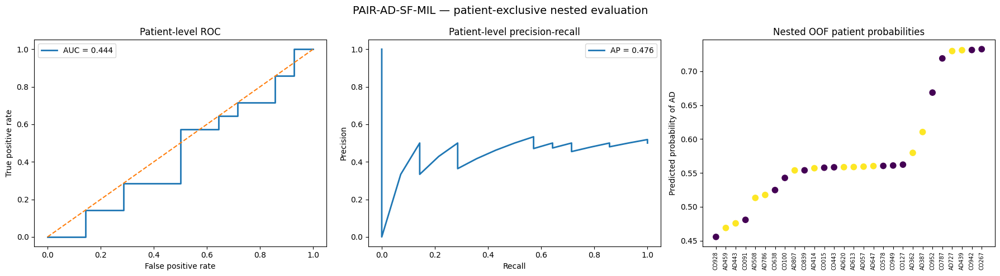


CELL 28 COMPLETE

Saved OOF predictions:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_SFMIL\Nested_Training\PAIR_AD_SFMIL_OOF_predictions.csv

Saved outer-fold results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_SFMIL\Nested_Training\PAIR_AD_SFMIL_outer_fold_results.csv

Saved inner-training results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_SFMIL\Nested_Training\PAIR_AD_SFMIL_inner_training_results.csv

Saved summary:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_SFMIL\Nested_Training\PAIR_AD_SFMIL_summary.txt

Saved figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\PAIR_AD_SFMIL\Nested_Training\PAIR_AD_SFMIL_patient_results.png

IMPORTANT:
Do not change the locked architecture/training settings after inspecting these outer-test results.

SEND ME:
  1. INNER-CV SELECTION for all 3 outer folds
  2. OUTER FOLD 1 RESULT
  3. OUTER

In [38]:
# ==================================================================================================
# CELL 28 — PAIR-AD-SF-MIL FULL NESTED PATIENT-EXCLUSIVE TRAINING
#
# FINAL LOCKED TRAINING PROTOCOL FOR THIS ARCHITECTURE
#
# IMPORTANT
# ---------
#
# 1. Prediction unit = PATIENT
# 2. Outer test participants remain untouched
# 3. Early stopping uses INNER validation participants only
# 4. Classification threshold uses INNER OOF probabilities only
# 5. Final outer model trains for the median INNER-selected epoch
# 6. Three fixed seeds are ensembled to reduce small-cohort training variance
# 7. No architecture/hyperparameter selection uses outer-test performance
#
#
# MODEL
# -----
#
# Frozen cached ResNet layer3 spatial maps
#            +
# paired DARK/LIGHT structure-function adapter
#            +
# explicit functional-response branch
#            +
# cross-gated fusion
#            +
# slice embedding
#            +
# gated attention MIL
#            ↓
#        Patient AD probability
#
# ==================================================================================================

from pathlib import Path
import copy
import random
import warnings
import math

import numpy as np
import pandas as pd

import torch
import torch.nn as nn

import matplotlib.pyplot as plt

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    average_precision_score,
    confusion_matrix,
    roc_curve,
    precision_recall_curve
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. LOCKED CONFIGURATION
# ==================================================================================================

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


TRAIN_SEEDS = [
    2026,
    2027,
    2028
]


MAX_EPOCHS = 80

PATIENCE = 12

MIN_DELTA = 1e-4


LEARNING_RATE = 3e-4

WEIGHT_DECAY = 2e-3

GRAD_CLIP = 1.0


THRESHOLD_GRID = np.arange(
    0.10,
    0.91,
    0.01
)


N_BOOTSTRAP = 2000


FEATURE_CHANNELS = 1024

ADAPTER_CHANNELS = 64

ADAPTER_BOTTLENECK = 128

SLICE_EMBED_DIM = 128

MIL_HIDDEN_DIM = 64


# ==================================================================================================
# 2. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


MODEL_DIR = (
    PAIR_AD_DIR /
    "PAIR_AD_SFMIL"
)


CACHE_PATH = (
    MODEL_DIR /
    "PAIR_AD_frozen_spatial_features_layer3.npz"
)


PATIENT_BAG_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_patient_bags_2026.csv"
)


RESULT_DIR = (
    MODEL_DIR /
    "Nested_Training"
)


RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


OOF_PATH = (
    RESULT_DIR /
    "PAIR_AD_SFMIL_OOF_predictions.csv"
)


FOLD_PATH = (
    RESULT_DIR /
    "PAIR_AD_SFMIL_outer_fold_results.csv"
)


INNER_PATH = (
    RESULT_DIR /
    "PAIR_AD_SFMIL_inner_training_results.csv"
)


SUMMARY_PATH = (
    RESULT_DIR /
    "PAIR_AD_SFMIL_summary.txt"
)


FIGURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_SFMIL_patient_results.png"
)


print("=" * 120)
print("CELL 28 — PAIR-AD-SF-MIL FULL NESTED PATIENT-EXCLUSIVE TRAINING")
print("=" * 120)


print(
    "\nDevice:",
    DEVICE
)


if DEVICE.type == "cuda":

    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )


print(
    "\nLocked training seeds:",
    TRAIN_SEEDS
)


print(
    "Learning rate:",
    LEARNING_RATE
)


print(
    "Weight decay:",
    WEIGHT_DECAY
)


print(
    "Maximum epochs:",
    MAX_EPOCHS
)


print(
    "Early-stop patience:",
    PATIENCE
)


# ==================================================================================================
# 3. REPRODUCIBILITY HELPER
# ==================================================================================================

def set_seed(
    seed
):

    random.seed(
        seed
    )


    np.random.seed(
        seed
    )


    torch.manual_seed(
        seed
    )


    if torch.cuda.is_available():

        torch.cuda.manual_seed_all(
            seed
        )


    torch.backends.cudnn.benchmark = False

    torch.backends.cudnn.deterministic = True


    try:

        torch.use_deterministic_algorithms(
            True,
            warn_only=True
        )

    except Exception:

        pass


set_seed(
    TRAIN_SEEDS[
        0
    ]
)


# ==================================================================================================
# 4. LOAD CACHED FEATURES
# ==================================================================================================

assert CACHE_PATH.exists(), CACHE_PATH

assert PATIENT_BAG_PATH.exists(), PATIENT_BAG_PATH


cache = np.load(
    CACHE_PATH,
    allow_pickle=True
)


patient_df = pd.read_csv(
    PATIENT_BAG_PATH
)


dark_np = cache[
    "dark_spatial"
].astype(
    np.float32
)


light_np = cache[
    "light_spatial"
].astype(
    np.float32
)


response_np = cache[
    "functional_response"
].astype(
    np.float32
)


y_slice = cache[
    "y"
].astype(
    np.int64
)


subjects_slice = cache[
    "subject"
].astype(str)


slice_indices = cache[
    "slice_index"
].astype(
    np.int64
)


outer_slice = cache[
    "outer_fold"
].astype(
    np.int64
)


print("\n" + "=" * 120)
print("CACHE")
print("=" * 120)


print(
    "DARK:",
    dark_np.shape
)


print(
    "LIGHT:",
    light_np.shape
)


print(
    "Response:",
    response_np.shape
)


print(
    "Participants:",
    len(
        np.unique(
            subjects_slice
        )
    )
)


assert dark_np.shape == (
    135,
    1024,
    14,
    14
)


assert light_np.shape == (
    135,
    1024,
    14,
    14
)


assert response_np.shape == (
    135,
    1,
    224,
    224
)


assert len(
    patient_df
) == 28


# ==================================================================================================
# 5. KEEP ALL CACHED DATA ON GPU
#
# ~small relative to 12 GB GPU and avoids repeated host->device copies.
# ==================================================================================================

dark_all = torch.from_numpy(
    dark_np
).to(
    DEVICE
)


light_all = torch.from_numpy(
    light_np
).to(
    DEVICE
)


response_all = torch.from_numpy(
    response_np
).to(
    DEVICE
)


# ==================================================================================================
# 6. PATIENT LOOKUPS
# ==================================================================================================

patient_df[
    "folder_subject"
] = patient_df[
    "folder_subject"
].astype(str)


patient_df[
    "target"
] = patient_df[
    "target"
].astype(int)


patient_df[
    "outer_fold"
] = patient_df[
    "outer_fold"
].astype(int)


for col in [
    "inner_fold_outer1",
    "inner_fold_outer2",
    "inner_fold_outer3"
]:

    patient_df[
        col
    ] = patient_df[
        col
    ].astype(int)


PATIENT_INDICES = {}


for subject_name in patient_df[
    "folder_subject"
]:

    idx = np.where(
        subjects_slice
        ==
        subject_name
    )[0]


    idx = idx[
        np.argsort(
            slice_indices[
                idx
            ]
        )
    ]


    PATIENT_INDICES[
        subject_name
    ] = torch.tensor(

        idx,

        dtype=torch.long,

        device=DEVICE
    )


TARGET_BY_SUBJECT = dict(
    zip(
        patient_df[
            "folder_subject"
        ],
        patient_df[
            "target"
        ]
    )
)


print(
    "\nPatient bags prepared:",
    len(
        PATIENT_INDICES
    )
)


# ==================================================================================================
# 7. GROUP NORM
# ==================================================================================================

def group_norm(
    channels
):

    for groups in [
        16,
        8,
        4,
        2,
        1
    ]:

        if channels % groups == 0:

            return nn.GroupNorm(
                groups,
                channels
            )


    return nn.GroupNorm(
        1,
        channels
    )


# ==================================================================================================
# 8. COMPACT MODEL
#
# EXACT ARCHITECTURE FROM CELL 27B
# ==================================================================================================

class CompactPairedFeatureAdapter(
    nn.Module
):

    def __init__(
        self,
        in_channels=FEATURE_CHANNELS,
        bottleneck=ADAPTER_BOTTLENECK,
        out_channels=ADAPTER_CHANNELS
    ):

        super().__init__()


        self.net = nn.Sequential(

            nn.Conv2d(
                in_channels * 3,
                bottleneck,
                kernel_size=1,
                bias=False
            ),

            group_norm(
                bottleneck
            ),

            nn.GELU(),

            nn.Dropout2d(
                0.15
            ),

            nn.Conv2d(
                bottleneck,
                out_channels,
                kernel_size=1,
                bias=False
            ),

            group_norm(
                out_channels
            ),

            nn.GELU()
        )


    def forward(
        self,
        dark,
        light
    ):

        structure = (
            dark
            +
            light
        ) / 2.0


        signed_delta = (
            light
            -
            dark
        )


        absolute_delta = torch.abs(
            signed_delta
        )


        combined = torch.cat(
            [
                structure,
                signed_delta,
                absolute_delta
            ],
            dim=1
        )


        return self.net(
            combined
        )


class CompactResponseEncoder(
    nn.Module
):

    def __init__(
        self,
        out_channels=ADAPTER_CHANNELS
    ):

        super().__init__()


        self.net = nn.Sequential(

            nn.Conv2d(
                1,
                24,
                kernel_size=5,
                stride=2,
                padding=2,
                bias=False
            ),

            group_norm(
                24
            ),

            nn.GELU(),

            nn.Conv2d(
                24,
                48,
                kernel_size=3,
                stride=2,
                padding=1,
                bias=False
            ),

            group_norm(
                48
            ),

            nn.GELU(),

            nn.Conv2d(
                48,
                out_channels,
                kernel_size=3,
                stride=2,
                padding=1,
                bias=False
            ),

            group_norm(
                out_channels
            ),

            nn.GELU(),

            nn.AdaptiveAvgPool2d(
                (
                    14,
                    14
                )
            )
        )


    def forward(
        self,
        x
    ):

        return self.net(
            x
        )


class CompactCrossGate(
    nn.Module
):

    def __init__(
        self,
        channels=ADAPTER_CHANNELS
    ):

        super().__init__()


        self.gate = nn.Conv2d(
            channels * 2,
            channels,
            kernel_size=1
        )


        self.refine = nn.Sequential(

            nn.Conv2d(
                channels,
                channels,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            group_norm(
                channels
            ),

            nn.GELU(),

            nn.Dropout2d(
                0.10
            )
        )


    def forward(
        self,
        paired,
        response
    ):

        gate = torch.sigmoid(

            self.gate(

                torch.cat(
                    [
                        paired,
                        response
                    ],
                    dim=1
                )
            )
        )


        fused = (

            gate
            *
            response

            +

            (
                1.0
                -
                gate
            )
            *
            paired
        )


        fused = self.refine(
            fused
        )


        return (
            fused,
            gate
        )


class CompactSliceEmbedding(
    nn.Module
):

    def __init__(
        self,
        channels=ADAPTER_CHANNELS,
        embed_dim=SLICE_EMBED_DIM
    ):

        super().__init__()


        self.pool = nn.AdaptiveAvgPool2d(
            1
        )


        self.project = nn.Sequential(

            nn.Linear(
                channels,
                embed_dim
            ),

            nn.LayerNorm(
                embed_dim
            ),

            nn.GELU(),

            nn.Dropout(
                0.30
            )
        )


    def forward(
        self,
        x
    ):

        return self.project(

            self.pool(
                x
            ).flatten(
                1
            )
        )


class CompactGatedMIL(
    nn.Module
):

    def __init__(
        self,
        embed_dim=SLICE_EMBED_DIM,
        hidden_dim=MIL_HIDDEN_DIM
    ):

        super().__init__()


        self.V = nn.Linear(
            embed_dim,
            hidden_dim
        )


        self.U = nn.Linear(
            embed_dim,
            hidden_dim
        )


        self.w = nn.Linear(
            hidden_dim,
            1,
            bias=False
        )


    def forward(
        self,
        embeddings
    ):

        score = self.w(

            torch.tanh(
                self.V(
                    embeddings
                )
            )

            *

            torch.sigmoid(
                self.U(
                    embeddings
                )
            )
        )


        attention = torch.softmax(
            score,
            dim=0
        )


        patient_embedding = torch.sum(

            attention
            *
            embeddings,

            dim=0
        )


        return (
            patient_embedding,
            attention.squeeze(
                1
            )
        )


class CompactPairAD_SFMIL(
    nn.Module
):

    def __init__(
        self
    ):

        super().__init__()


        self.paired_adapter = (
            CompactPairedFeatureAdapter()
        )


        self.response_encoder = (
            CompactResponseEncoder()
        )


        self.fusion = (
            CompactCrossGate()
        )


        self.slice_embedding = (
            CompactSliceEmbedding()
        )


        self.mil = (
            CompactGatedMIL()
        )


        self.classifier = nn.Sequential(

            nn.Linear(
                SLICE_EMBED_DIM,
                32
            ),

            nn.LayerNorm(
                32
            ),

            nn.GELU(),

            nn.Dropout(
                0.35
            ),

            nn.Linear(
                32,
                1
            )
        )


    def forward(
        self,
        dark_spatial,
        light_spatial,
        response
    ):

        paired = self.paired_adapter(
            dark_spatial,
            light_spatial
        )


        response_feature = (
            self.response_encoder(
                response
            )
        )


        fused, gate = self.fusion(
            paired,
            response_feature
        )


        slice_embeddings = (
            self.slice_embedding(
                fused
            )
        )


        patient_embedding, attention = (
            self.mil(
                slice_embeddings
            )
        )


        logit = self.classifier(
            patient_embedding
        ).squeeze(
            -1
        )


        return {

            "logit":
                logit,

            "attention":
                attention,

            "gate":
                gate,

            "slice_embeddings":
                slice_embeddings
        }


# ==================================================================================================
# 9. MODEL FACTORY
# ==================================================================================================

def create_model(
    seed
):

    set_seed(
        seed
    )


    model = CompactPairAD_SFMIL().to(
        DEVICE
    )


    return model


test_model = create_model(
    TRAIN_SEEDS[
        0
    ]
)


trainable_parameters = sum(

    p.numel()

    for p in test_model.parameters()

    if p.requires_grad
)


print("\n" + "=" * 120)
print("MODEL LOCK CHECK")
print("=" * 120)


print(
    "Trainable parameters:",
    f"{trainable_parameters:,}"
)


assert trainable_parameters == 515305


del test_model


if torch.cuda.is_available():

    torch.cuda.empty_cache()


# ==================================================================================================
# 10. GET PATIENT BAG
# ==================================================================================================

def get_patient_bag(
    subject_name
):

    idx = PATIENT_INDICES[
        subject_name
    ]


    return (

        dark_all[
            idx
        ],

        light_all[
            idx
        ],

        response_all[
            idx
        ]
    )


# ==================================================================================================
# 11. CLASS WEIGHT FROM TRAINING SUBJECTS ONLY
# ==================================================================================================

def get_pos_weight(
    subject_list
):

    labels = np.array(
        [
            TARGET_BY_SUBJECT[
                subject
            ]

            for subject in subject_list
        ],
        dtype=int
    )


    n_positive = int(
        (
            labels == 1
        ).sum()
    )


    n_negative = int(
        (
            labels == 0
        ).sum()
    )


    return float(

        n_negative

        /

        max(
            n_positive,
            1
        )
    )


# ==================================================================================================
# 12. ONE TRAINING EPOCH
# ==================================================================================================

def train_one_epoch(
    model,
    optimizer,
    train_subjects,
    seed,
    epoch
):

    model.train()


    pos_weight_value = get_pos_weight(
        train_subjects
    )


    criterion = nn.BCEWithLogitsLoss(

        pos_weight=torch.tensor(

            pos_weight_value,

            dtype=torch.float32,

            device=DEVICE
        )
    )


    rng = np.random.default_rng(

        seed
        +
        epoch * 1009
    )


    order = np.array(
        train_subjects,
        dtype=object
    )


    rng.shuffle(
        order
    )


    losses = []


    for subject_name in order:

        optimizer.zero_grad(
            set_to_none=True
        )


        dark, light, response = (
            get_patient_bag(
                str(
                    subject_name
                )
            )
        )


        output = model(
            dark,
            light,
            response
        )


        target = torch.tensor(

            float(
                TARGET_BY_SUBJECT[
                    str(
                        subject_name
                    )
                ]
            ),

            dtype=torch.float32,

            device=DEVICE
        )


        loss = criterion(

            output[
                "logit"
            ],

            target
        )


        loss.backward()


        torch.nn.utils.clip_grad_norm_(

            model.parameters(),

            GRAD_CLIP
        )


        optimizer.step()


        losses.append(
            float(
                loss.detach().cpu()
            )
        )


    return float(
        np.mean(
            losses
        )
    )


# ==================================================================================================
# 13. EVALUATION
# ==================================================================================================

@torch.no_grad()
def evaluate_model(
    model,
    subject_list
):

    model.eval()


    rows = []

    losses = []


    for subject_name in subject_list:

        dark, light, response = (
            get_patient_bag(
                subject_name
            )
        )


        output = model(
            dark,
            light,
            response
        )


        logit = output[
            "logit"
        ]


        probability = torch.sigmoid(
            logit
        )


        target_value = int(
            TARGET_BY_SUBJECT[
                subject_name
            ]
        )


        target = torch.tensor(

            float(
                target_value
            ),

            dtype=torch.float32,

            device=DEVICE
        )


        loss = nn.functional.binary_cross_entropy_with_logits(

            logit,

            target
        )


        attention = (
            output[
                "attention"
            ]
            .detach()
            .cpu()
            .numpy()
        )


        K = len(
            attention
        )


        # Normalized attention entropy:
        #
        # 1.0 = uniform
        # 0.0 = maximally concentrated

        if K > 1:

            attention_entropy = (

                -np.sum(

                    attention

                    *

                    np.log(
                        attention
                        +
                        1e-12
                    )
                )

                /

                np.log(
                    K
                )
            )


        else:

            attention_entropy = 1.0


        gate_mean = float(

            output[
                "gate"
            ]
            .mean()
            .detach()
            .cpu()
        )


        rows.append(
            {

                "folder_subject":
                    subject_name,

                "target":
                    target_value,

                "probability_AD":
                    float(
                        probability.cpu()
                    ),

                "attention_entropy":
                    float(
                        attention_entropy
                    ),

                "gate_mean":
                    gate_mean
            }
        )


        losses.append(
            float(
                loss.cpu()
            )
        )


    return (

        pd.DataFrame(
            rows
        ),

        float(
            np.mean(
                losses
            )
        )
    )


# ==================================================================================================
# 14. TRAIN WITH INNER EARLY STOPPING
#
# Selection criterion:
#
#       validation BCE
#
# not outer AUC.
# ==================================================================================================

def train_with_early_stopping(
    train_subjects,
    val_subjects,
    seed
):

    model = create_model(
        seed
    )


    optimizer = torch.optim.AdamW(

        model.parameters(),

        lr=LEARNING_RATE,

        weight_decay=WEIGHT_DECAY
    )


    best_state = None

    best_epoch = 1

    best_val_loss = np.inf

    wait = 0


    for epoch in range(
        1,
        MAX_EPOCHS + 1
    ):

        train_loss = train_one_epoch(

            model,

            optimizer,

            train_subjects,

            seed,

            epoch
        )


        val_df, val_loss = evaluate_model(

            model,

            val_subjects
        )


        if (

            val_loss

            <
            best_val_loss
            -
            MIN_DELTA

        ):

            best_val_loss = val_loss

            best_epoch = epoch

            best_state = copy.deepcopy(
                model.state_dict()
            )


            wait = 0


        else:

            wait += 1


        if wait >= PATIENCE:

            break


    assert best_state is not None


    model.load_state_dict(
        best_state
    )


    final_val_df, final_val_loss = (
        evaluate_model(

            model,

            val_subjects
        )
    )


    return {

        "model":
            model,

        "best_epoch":
            int(
                best_epoch
            ),

        "best_val_loss":
            float(
                best_val_loss
            ),

        "val_df":
            final_val_df
    }


# ==================================================================================================
# 15. FIXED-EPOCH FINAL TRAINING
# ==================================================================================================

def train_fixed_epochs(
    train_subjects,
    seed,
    n_epochs
):

    model = create_model(
        seed
    )


    optimizer = torch.optim.AdamW(

        model.parameters(),

        lr=LEARNING_RATE,

        weight_decay=WEIGHT_DECAY
    )


    for epoch in range(
        1,
        n_epochs + 1
    ):

        train_one_epoch(

            model,

            optimizer,

            train_subjects,

            seed,

            epoch
        )


    return model


# ==================================================================================================
# 16. THRESHOLD SELECTION
#
# INNER OOF ONLY.
# ==================================================================================================

def select_threshold(
    y_true,
    probabilities
):

    best_threshold = 0.50

    best_score = -np.inf


    for threshold in THRESHOLD_GRID:

        prediction = (

            probabilities
            >=
            threshold

        ).astype(
            int
        )


        score = balanced_accuracy_score(

            y_true,

            prediction
        )


        if score > best_score + 1e-12:

            best_score = score

            best_threshold = float(
                threshold
            )


        elif abs(
            score
            -
            best_score
        ) <= 1e-12:

            # Prefer threshold closest to 0.50.

            if abs(
                threshold
                -
                0.50
            ) < abs(
                best_threshold
                -
                0.50
            ):

                best_threshold = float(
                    threshold
                )


    return (
        best_threshold,
        best_score
    )


# ==================================================================================================
# 17. METRIC FUNCTION
# ==================================================================================================

def compute_metrics(
    y_true,
    probability,
    prediction
):

    tn, fp, fn, tp = confusion_matrix(

        y_true,

        prediction,

        labels=[
            0,
            1
        ]
    ).ravel()


    specificity = (

        tn

        /

        max(
            tn
            +
            fp,
            1
        )
    )


    return {

        "accuracy":
            accuracy_score(
                y_true,
                prediction
            ),

        "precision":
            precision_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                prediction
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                prediction
            ),

        "auc":
            roc_auc_score(
                y_true,
                probability
            ),

        "average_precision":
            average_precision_score(
                y_true,
                probability
            ),

        "tn":
            int(
                tn
            ),

        "fp":
            int(
                fp
            ),

        "fn":
            int(
                fn
            ),

        "tp":
            int(
                tp
            )
    }


# ==================================================================================================
# 18. STORAGE
# ==================================================================================================

inner_records = []

outer_records = []

oof_records = []


# ==================================================================================================
# 19. FULL NESTED CV
# ==================================================================================================

print("\n" + "=" * 120)
print("STARTING FULL NESTED PAIR-AD-SF-MIL TRAINING")
print("=" * 120)


for outer_fold in [
    1,
    2,
    3
]:

    print("\n")
    print("#" * 120)
    print(
        f"OUTER FOLD {outer_fold}"
    )
    print("#" * 120)


    outer_train_df = patient_df[
        patient_df[
            "outer_fold"
        ] != outer_fold
    ].copy()


    outer_test_df = patient_df[
        patient_df[
            "outer_fold"
        ] == outer_fold
    ].copy()


    outer_train_subjects = (
        outer_train_df[
            "folder_subject"
        ]
        .tolist()
    )


    outer_test_subjects = (
        outer_test_df[
            "folder_subject"
        ]
        .tolist()
    )


    print(
        "Outer train patients:",
        len(
            outer_train_subjects
        )
    )


    print(
        "Outer test patients :",
        len(
            outer_test_subjects
        )
    )


    print(
        "Test Control:",
        int(
            (
                outer_test_df[
                    "target"
                ] == 0
            ).sum()
        ),
        "| AD:",
        int(
            (
                outer_test_df[
                    "target"
                ] == 1
            ).sum()
        )
    )


    # ==============================================================================================
    # INNER CV
    # ==============================================================================================

    inner_column = (
        f"inner_fold_outer{outer_fold}"
    )


    inner_oof_rows = []

    best_epochs_all = []


    for inner_fold in [
        1,
        2,
        3
    ]:

        inner_train_subjects = (

            outer_train_df.loc[
                outer_train_df[
                    inner_column
                ] != inner_fold,
                "folder_subject"
            ]
            .tolist()
        )


        inner_val_subjects = (

            outer_train_df.loc[
                outer_train_df[
                    inner_column
                ] == inner_fold,
                "folder_subject"
            ]
            .tolist()
        )


        print(
            f"\nInner {inner_fold}: "
            f"train={len(inner_train_subjects)} "
            f"| val={len(inner_val_subjects)}"
        )


        seed_validation_frames = []


        for seed in TRAIN_SEEDS:

            result = train_with_early_stopping(

                inner_train_subjects,

                inner_val_subjects,

                seed
            )


            best_epochs_all.append(
                result[
                    "best_epoch"
                ]
            )


            val_df = result[
                "val_df"
            ].copy()


            val_df[
                "seed"
            ] = seed


            seed_validation_frames.append(
                val_df
            )


            y_val = val_df[
                "target"
            ].values


            p_val = val_df[
                "probability_AD"
            ].values


            seed_auc = roc_auc_score(
                y_val,
                p_val
            )


            inner_records.append(
                {

                    "outer_fold":
                        outer_fold,

                    "inner_fold":
                        inner_fold,

                    "seed":
                        seed,

                    "train_patients":
                        len(
                            inner_train_subjects
                        ),

                    "val_patients":
                        len(
                            inner_val_subjects
                        ),

                    "best_epoch":
                        result[
                            "best_epoch"
                        ],

                    "best_val_loss":
                        result[
                            "best_val_loss"
                        ],

                    "validation_auc":
                        seed_auc
                }
            )


            print(
                f"  Seed {seed}: "
                f"best epoch={result['best_epoch']:2d} "
                f"| val loss={result['best_val_loss']:.4f} "
                f"| val AUC={seed_auc:.4f}"
            )


            del result[
                "model"
            ]


            if torch.cuda.is_available():

                torch.cuda.empty_cache()


        # ------------------------------------------------------------------------------------------
        # Ensemble the 3 inner validation models.
        # ------------------------------------------------------------------------------------------

        combined = pd.concat(
            seed_validation_frames,
            ignore_index=True
        )


        inner_ensemble = (

            combined
            .groupby(
                [
                    "folder_subject",
                    "target"
                ],
                as_index=False
            )
            .agg(

                probability_AD=(
                    "probability_AD",
                    "mean"
                ),

                attention_entropy=(
                    "attention_entropy",
                    "mean"
                ),

                gate_mean=(
                    "gate_mean",
                    "mean"
                )
            )
        )


        inner_ensemble[
            "inner_fold"
        ] = inner_fold


        inner_oof_rows.append(
            inner_ensemble
        )


    # ==============================================================================================
    # INNER OOF MODEL SELECTION
    # ==============================================================================================

    inner_oof = pd.concat(
        inner_oof_rows,
        ignore_index=True
    )


    assert inner_oof[
        "folder_subject"
    ].nunique() == len(
        outer_train_subjects
    )


    inner_y = inner_oof[
        "target"
    ].values.astype(
        int
    )


    inner_probability = inner_oof[
        "probability_AD"
    ].values.astype(
        float
    )


    inner_auc = roc_auc_score(

        inner_y,

        inner_probability
    )


    selected_threshold, inner_bal_acc = (
        select_threshold(

            inner_y,

            inner_probability
        )
    )


    # Median of ALL 3 x 3 = 9 inner early-stop epochs.

    selected_epoch = int(

        np.clip(

            np.rint(

                np.median(
                    best_epochs_all
                )
            ),

            1,

            MAX_EPOCHS
        )
    )


    print("\n" + "-" * 100)
    print("INNER-CV SELECTION")
    print("-" * 100)


    print(
        "Inner ensemble OOF AUC:",
        f"{inner_auc:.4f}"
    )


    print(
        "Selected threshold:",
        f"{selected_threshold:.2f}"
    )


    print(
        "Inner OOF balanced accuracy:",
        f"{inner_bal_acc:.4f}"
    )


    print(
        "Inner best epochs:",
        best_epochs_all
    )


    print(
        "Selected final epoch:",
        selected_epoch
    )


    # ==============================================================================================
    # FINAL OUTER TRAINING
    #
    # 3 independently initialized models.
    #
    # NO OUTER VALIDATION.
    # ==============================================================================================

    outer_seed_frames = []


    for seed in TRAIN_SEEDS:

        print(
            f"\nTraining final outer model "
            f"| seed={seed} "
            f"| epochs={selected_epoch}"
        )


        model = train_fixed_epochs(

            outer_train_subjects,

            seed,

            selected_epoch
        )


        test_df, test_loss = evaluate_model(

            model,

            outer_test_subjects
        )


        test_df[
            "seed"
        ] = seed


        outer_seed_frames.append(
            test_df
        )


        checkpoint_path = (

            RESULT_DIR
            /
            (
                f"outer{outer_fold}"
                f"_seed{seed}"
                f"_epoch{selected_epoch}.pt"
            )
        )


        torch.save(
            {

                "model_state_dict":
                    model.state_dict(),

                "outer_fold":
                    outer_fold,

                "seed":
                    seed,

                "selected_epoch":
                    selected_epoch,

                "selected_threshold":
                    selected_threshold,

                "train_subjects":
                    outer_train_subjects,

                "test_subjects":
                    outer_test_subjects

            },

            checkpoint_path
        )


        print(
            "  Test BCE:",
            f"{test_loss:.4f}"
        )


        del model


        if torch.cuda.is_available():

            torch.cuda.empty_cache()


    # ==============================================================================================
    # OUTER SEED ENSEMBLE
    # ==============================================================================================

    outer_combined = pd.concat(
        outer_seed_frames,
        ignore_index=True
    )


    outer_ensemble = (

        outer_combined
        .groupby(
            [
                "folder_subject",
                "target"
            ],
            as_index=False
        )
        .agg(

            probability_AD=(
                "probability_AD",
                "mean"
            ),

            probability_sd=(
                "probability_AD",
                "std"
            ),

            attention_entropy=(
                "attention_entropy",
                "mean"
            ),

            gate_mean=(
                "gate_mean",
                "mean"
            )
        )
    )


    outer_ensemble[
        "outer_fold"
    ] = outer_fold


    outer_ensemble[
        "threshold"
    ] = selected_threshold


    outer_ensemble[
        "prediction"
    ] = (

        outer_ensemble[
            "probability_AD"
        ]
        >=
        selected_threshold

    ).astype(
        int
    )


    y_test = outer_ensemble[
        "target"
    ].values.astype(
        int
    )


    p_test = outer_ensemble[
        "probability_AD"
    ].values.astype(
        float
    )


    pred_test = outer_ensemble[
        "prediction"
    ].values.astype(
        int
    )


    metrics = compute_metrics(

        y_test,

        p_test,

        pred_test
    )


    outer_records.append(
        {

            "outer_fold":
                outer_fold,

            "train_patients":
                len(
                    outer_train_subjects
                ),

            "test_patients":
                len(
                    outer_test_subjects
                ),

            "selected_epoch":
                selected_epoch,

            "selected_threshold":
                selected_threshold,

            "inner_oof_auc":
                inner_auc,

            "inner_oof_balanced_accuracy":
                inner_bal_acc,

            **metrics
        }
    )


    for _, row in outer_ensemble.iterrows():

        oof_records.append(
            row.to_dict()
        )


    print("\n" + "=" * 100)
    print(
        f"OUTER FOLD {outer_fold} RESULT"
    )
    print("=" * 100)


    for metric_name in [
        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc",
        "average_precision"
    ]:

        print(
            f"{metric_name:22s}: "
            f"{metrics[metric_name]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )


    print(

        np.array(
            [
                [
                    metrics[
                        "tn"
                    ],
                    metrics[
                        "fp"
                    ]
                ],

                [
                    metrics[
                        "fn"
                    ],
                    metrics[
                        "tp"
                    ]
                ]
            ]
        )
    )


# ==================================================================================================
# 20. FINAL OOF TABLE
# ==================================================================================================

oof_df = pd.DataFrame(
    oof_records
)


oof_df = oof_df[
    [
        "folder_subject",
        "target",
        "outer_fold",
        "probability_AD",
        "probability_sd",
        "threshold",
        "prediction",
        "attention_entropy",
        "gate_mean"
    ]
]


oof_df = oof_df.sort_values(
    "folder_subject"
).reset_index(
    drop=True
)


assert len(
    oof_df
) == 28


assert oof_df[
    "folder_subject"
].nunique() == 28


# ==================================================================================================
# 21. FINAL OOF METRICS
# ==================================================================================================

y_all = oof_df[
    "target"
].values.astype(
    int
)


p_all = oof_df[
    "probability_AD"
].values.astype(
    float
)


pred_all = oof_df[
    "prediction"
].values.astype(
    int
)


overall = compute_metrics(

    y_all,

    p_all,

    pred_all
)


print("\n" + "=" * 120)
print("FINAL PAIR-AD-SF-MIL PATIENT-LEVEL OOF PERFORMANCE")
print("=" * 120)


for metric_name in [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "average_precision"
]:

    print(
        f"{metric_name:22s}: "
        f"{overall[metric_name]:.4f}"
    )


print(
    "\nConfusion matrix:"
)


print(

    np.array(
        [
            [
                overall[
                    "tn"
                ],
                overall[
                    "fp"
                ]
            ],

            [
                overall[
                    "fn"
                ],
                overall[
                    "tp"
                ]
            ]
        ]
    )
)


# ==================================================================================================
# 22. FOLD RESULTS
# ==================================================================================================

fold_df = pd.DataFrame(
    outer_records
)


print("\n" + "=" * 120)
print("OUTER FOLD RESULTS")
print("=" * 120)


print(
    fold_df.to_string(
        index=False
    )
)


print("\n" + "=" * 120)
print("OUTER-FOLD MEAN ± SD")
print("=" * 120)


for metric_name in [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "average_precision"
]:

    mean_value = fold_df[
        metric_name
    ].mean()


    sd_value = fold_df[
        metric_name
    ].std(
        ddof=1
    )


    print(
        f"{metric_name:22s}: "
        f"{mean_value:.4f} "
        f"± "
        f"{sd_value:.4f}"
    )


# ==================================================================================================
# 23. STRATIFIED PATIENT BOOTSTRAP
# ==================================================================================================

print("\n" + "=" * 120)
print("STRATIFIED PATIENT BOOTSTRAP 95% CONFIDENCE INTERVALS")
print("=" * 120)


rng = np.random.default_rng(
    2026
)


control_idx = np.where(
    y_all == 0
)[0]


ad_idx = np.where(
    y_all == 1
)[0]


auc_boot = []

accuracy_boot = []

balanced_boot = []


for _ in range(
    N_BOOTSTRAP
):

    sampled = np.concatenate(
        [

            rng.choice(
                control_idx,
                size=len(
                    control_idx
                ),
                replace=True
            ),

            rng.choice(
                ad_idx,
                size=len(
                    ad_idx
                ),
                replace=True
            )
        ]
    )


    auc_boot.append(

        roc_auc_score(

            y_all[
                sampled
            ],

            p_all[
                sampled
            ]
        )
    )


    accuracy_boot.append(

        accuracy_score(

            y_all[
                sampled
            ],

            pred_all[
                sampled
            ]
        )
    )


    balanced_boot.append(

        balanced_accuracy_score(

            y_all[
                sampled
            ],

            pred_all[
                sampled
            ]
        )
    )


auc_ci = np.percentile(
    auc_boot,
    [
        2.5,
        97.5
    ]
)


accuracy_ci = np.percentile(
    accuracy_boot,
    [
        2.5,
        97.5
    ]
)


balanced_ci = np.percentile(
    balanced_boot,
    [
        2.5,
        97.5
    ]
)


print(
    f"AUC: "
    f"{overall['auc']:.4f} "
    f"[{auc_ci[0]:.4f} - "
    f"{auc_ci[1]:.4f}]"
)


print(
    f"Accuracy: "
    f"{overall['accuracy']:.4f} "
    f"[{accuracy_ci[0]:.4f} - "
    f"{accuracy_ci[1]:.4f}]"
)


print(
    f"Balanced accuracy: "
    f"{overall['balanced_accuracy']:.4f} "
    f"[{balanced_ci[0]:.4f} - "
    f"{balanced_ci[1]:.4f}]"
)


# ==================================================================================================
# 24. OOF PREDICTIONS
# ==================================================================================================

print("\n" + "=" * 120)
print("PAIR-AD-SF-MIL OOF PATIENT PREDICTIONS")
print("=" * 120)


print(

    oof_df
    .sort_values(
        "probability_AD"
    )
    .to_string(
        index=False
    )
)


# ==================================================================================================
# 25. INTERPRETABILITY SUMMARY
# ==================================================================================================

print("\n" + "=" * 120)
print("MIL / FUSION DIAGNOSTIC SUMMARY")
print("=" * 120)


print(
    "Mean normalized attention entropy:",
    f"{oof_df['attention_entropy'].mean():.4f}"
)


print(
    "Median normalized attention entropy:",
    f"{oof_df['attention_entropy'].median():.4f}"
)


print(
    "\nInterpretation:"
)


print(
    "  entropy near 1.0 -> nearly uniform slice weighting"
)


print(
    "  lower entropy    -> model focuses more strongly on selected slices"
)


print(
    "\nMean fusion gate:",
    f"{oof_df['gate_mean'].mean():.4f}"
)


print(
    "Median fusion gate:",
    f"{oof_df['gate_mean'].median():.4f}"
)


print(
    "\nGate interpretation:"
)


print(
    "  closer to 1 -> more explicit functional-response branch"
)


print(
    "  closer to 0 -> more paired latent structure/function branch"
)


# ==================================================================================================
# 26. RESULT FIGURE
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING RESULT FIGURE")
print("=" * 120)


fig, axes = plt.subplots(
    1,
    3,
    figsize=(
        18,
        5
    )
)


# --------------------------------------------------------------------------------------------------
# ROC
# --------------------------------------------------------------------------------------------------

fpr, tpr, _ = roc_curve(
    y_all,
    p_all
)


axes[
    0
].plot(
    fpr,
    tpr,
    linewidth=2,
    label=(
        f"AUC = "
        f"{overall['auc']:.3f}"
    )
)


axes[
    0
].plot(
    [
        0,
        1
    ],
    [
        0,
        1
    ],
    linestyle="--"
)


axes[
    0
].set_xlabel(
    "False positive rate"
)


axes[
    0
].set_ylabel(
    "True positive rate"
)


axes[
    0
].set_title(
    "Patient-level ROC"
)


axes[
    0
].legend()


# --------------------------------------------------------------------------------------------------
# PR
# --------------------------------------------------------------------------------------------------

precision_curve, recall_curve, _ = (
    precision_recall_curve(
        y_all,
        p_all
    )
)


axes[
    1
].plot(
    recall_curve,
    precision_curve,
    linewidth=2,
    label=(
        f"AP = "
        f"{overall['average_precision']:.3f}"
    )
)


axes[
    1
].set_xlabel(
    "Recall"
)


axes[
    1
].set_ylabel(
    "Precision"
)


axes[
    1
].set_title(
    "Patient-level precision-recall"
)


axes[
    1
].legend()


# --------------------------------------------------------------------------------------------------
# PATIENT PROBABILITIES
# --------------------------------------------------------------------------------------------------

plot_df = oof_df.sort_values(
    "probability_AD"
).reset_index(
    drop=True
)


x = np.arange(
    len(
        plot_df
    )
)


axes[
    2
].scatter(
    x,
    plot_df[
        "probability_AD"
    ],
    c=plot_df[
        "target"
    ],
    s=55
)


axes[
    2
].set_xticks(
    x
)


axes[
    2
].set_xticklabels(
    plot_df[
        "folder_subject"
    ],
    rotation=90,
    fontsize=7
)


axes[
    2
].set_ylabel(
    "Predicted probability of AD"
)


axes[
    2
].set_title(
    "Nested OOF patient probabilities"
)


plt.suptitle(
    "PAIR-AD-SF-MIL — patient-exclusive nested evaluation",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 27. SAVE
# ==================================================================================================

oof_df.to_csv(
    OOF_PATH,
    index=False
)


fold_df.to_csv(
    FOLD_PATH,
    index=False
)


inner_df = pd.DataFrame(
    inner_records
)


inner_df.to_csv(
    INNER_PATH,
    index=False
)


with open(
    SUMMARY_PATH,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PAIR-AD-SF-MIL\n"
    )


    f.write(
        "=" * 90
        +
        "\n\n"
    )


    f.write(
        "Prediction unit: participant\n"
    )


    f.write(
        "Participants: 28 (14 Control / 14 AD)\n"
    )


    f.write(
        "Outer CV: participant-exclusive 3-fold\n"
    )


    f.write(
        "Inner CV: participant-exclusive 3-fold\n"
    )


    f.write(
        "Three-seed ensemble: 2026, 2027, 2028\n"
    )


    f.write(
        "Trainable parameters: 515,305\n"
    )


    f.write(
        "Frozen spatial backbone features: ImageNet ResNet50 layer3\n"
    )


    f.write(
        "Outer test patients never used for early stopping or threshold selection.\n\n"
    )


    for metric_name in [
        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc",
        "average_precision"
    ]:

        f.write(
            f"{metric_name}: "
            f"{overall[metric_name]:.6f}\n"
        )


    f.write(
        "\n"
    )


    f.write(
        f"AUC 95% bootstrap CI: "
        f"{auc_ci[0]:.6f} - "
        f"{auc_ci[1]:.6f}\n"
    )


    f.write(
        f"Accuracy 95% bootstrap CI: "
        f"{accuracy_ci[0]:.6f} - "
        f"{accuracy_ci[1]:.6f}\n"
    )


    f.write(
        f"Balanced accuracy 95% bootstrap CI: "
        f"{balanced_ci[0]:.6f} - "
        f"{balanced_ci[1]:.6f}\n"
    )


# ==================================================================================================
# 28. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 28 COMPLETE")
print("=" * 120)


print(
    "\nSaved OOF predictions:"
)

print(
    OOF_PATH
)


print(
    "\nSaved outer-fold results:"
)

print(
    FOLD_PATH
)


print(
    "\nSaved inner-training results:"
)

print(
    INNER_PATH
)


print(
    "\nSaved summary:"
)

print(
    SUMMARY_PATH
)


print(
    "\nSaved figure:"
)

print(
    FIGURE_PATH
)


print(
    "\nIMPORTANT:"
)


print(
    "Do not change the locked architecture/training settings "
    "after inspecting these outer-test results."
)


print(
    "\nSEND ME:"
)


print(
    "  1. INNER-CV SELECTION for all 3 outer folds"
)


print(
    "  2. OUTER FOLD 1 RESULT"
)


print(
    "  3. OUTER FOLD 2 RESULT"
)


print(
    "  4. OUTER FOLD 3 RESULT"
)


print(
    "  5. FINAL PAIR-AD-SF-MIL PATIENT-LEVEL OOF PERFORMANCE"
)


print(
    "  6. OUTER-FOLD MEAN ± SD"
)


print(
    "  7. STRATIFIED PATIENT BOOTSTRAP 95% CONFIDENCE INTERVALS"
)


print(
    "  8. MIL / FUSION DIAGNOSTIC SUMMARY"
)


print(
    "  9. Result figure"
)

CELL 29 — PAIR-AD RETINAL DEPTH-RESPONSE AUDIT

Response: (135, 256, 256)
Mask: (135, 256, 256)
Participants: 28

EXTRACTING DEPTH RESPONSE PROFILES
Processed: 135 slice pairs

DEPTH PROFILE AUDIT
Signed row profiles: (135, 256)
Absolute row profiles: (135, 256)
Coverage profiles: (135, 256)

Binned signed profiles: (135, 32)
Binned absolute profiles: (135, 32)
Binned coverage: (135, 32)

Global mean valid coverage: 0.7193810343742371
Minimum slice mean coverage: 0.6898193359375
Maximum slice mean coverage: 0.7327423095703125

PATIENT DEPTH REPRESENTATIONS
Patients: 28
Signed mean: (28, 32)
Signed SD: (28, 32)
Absolute mean: (28, 32)
Absolute SD: (28, 32)
Coverage: (28, 32)

CREATING DEPTH-PROFILE QC FIGURE


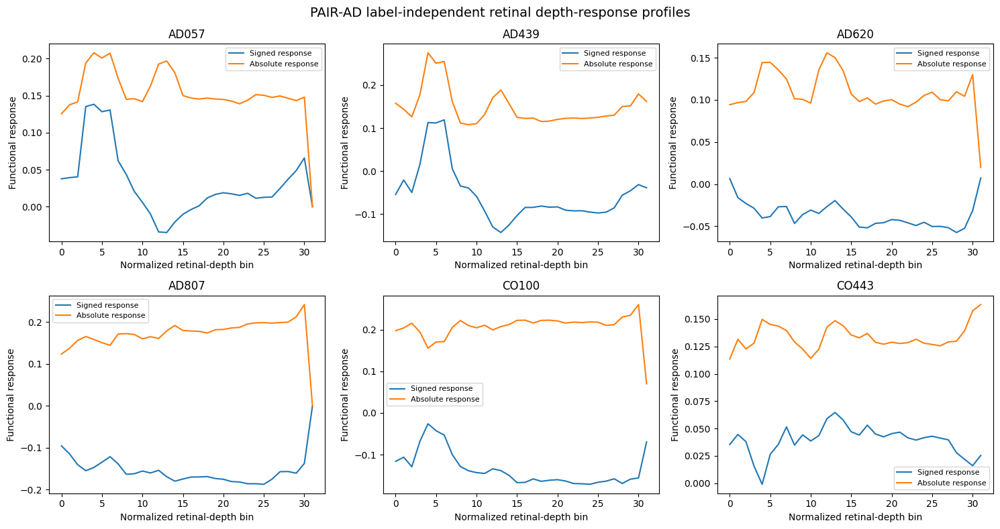


CELL 29 COMPLETE

Saved depth dataset:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Depth_Response\PAIR_AD_depth_response_32bins.npz

Saved patient metadata:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Depth_Response\PAIR_AD_depth_response_patient_metadata.csv

Saved slice metadata:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Depth_Response\PAIR_AD_depth_response_slice_features.csv

Saved QC figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Depth_Response\PAIR_AD_depth_response_QC.png

NO MODEL WAS TRAINED.
NO CLASS-BASED FEATURE SELECTION WAS PERFORMED.

SEND ME:
  1. DEPTH PROFILE AUDIT
  2. PATIENT DEPTH REPRESENTATIONS
  3. The depth-profile QC figure


In [39]:
# ==================================================================================================
# CELL 29 — PAIR-AD RETINAL DEPTH-RESPONSE AUDIT
#
# NO MODEL TRAINING
# NO CLASS-BASED FEATURE SELECTION
#
# PURPOSE
# -------
#
# Cell 28 showed that generic 2D fusion + MIL did not generalize.
#
# The original functional-OCT study suggests that disease information
# may be RETINAL-LAYER / DEPTH dependent rather than a whole-image signal.
#
# Therefore this cell converts each cleaned functional-response map into:
#
#       1. signed depth-response profile
#       2. absolute depth-response profile
#       3. valid-pixel coverage profile
#
# We then reduce 256 vertical rows into 32 depth bins.
#
# IMPORTANT:
#
# Feature construction is completely LABEL-INDEPENDENT.
#
# NO AD/control comparison is performed in this cell.
# NO classifier is trained.
#
# ==================================================================================================

from pathlib import Path
import warnings
import random

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

N_DEPTH_BINS = 32

MIN_ROW_VALID_FRACTION = 0.10


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


INPUT_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Depth_Response"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


OUTPUT_NPZ = (
    OUTPUT_DIR /
    "PAIR_AD_depth_response_32bins.npz"
)


OUTPUT_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_depth_response_patient_metadata.csv"
)


SLICE_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_depth_response_slice_features.csv"
)


QC_FIGURE = (
    OUTPUT_DIR /
    "PAIR_AD_depth_response_QC.png"
)


print("=" * 120)
print("CELL 29 — PAIR-AD RETINAL DEPTH-RESPONSE AUDIT")
print("=" * 120)


# ==================================================================================================
# 2. LOAD
# ==================================================================================================

assert INPUT_PATH.exists(), INPUT_PATH


data = np.load(
    INPUT_PATH,
    allow_pickle=True
)


response = data[
    "functional_response_clean"
].astype(
    np.float32
)


mask = data[
    "functional_valid_mask"
].astype(
    bool
)


subjects = data[
    "subject"
].astype(str)


targets = data[
    "y"
].astype(
    np.int64
)


slice_index = data[
    "slice_index"
].astype(
    np.int64
)


outer_fold = data[
    "outer_fold"
].astype(
    np.int64
)


inner1 = data[
    "inner_fold_outer1"
].astype(
    np.int64
)


inner2 = data[
    "inner_fold_outer2"
].astype(
    np.int64
)


inner3 = data[
    "inner_fold_outer3"
].astype(
    np.int64
)


print(
    "\nResponse:",
    response.shape
)


print(
    "Mask:",
    mask.shape
)


print(
    "Participants:",
    len(
        np.unique(
            subjects
        )
    )
)


assert response.shape == (
    135,
    256,
    256
)


assert mask.shape == (
    135,
    256,
    256
)


# ==================================================================================================
# 3. DEPTH-PROFILE EXTRACTION
#
# For each vertical retinal coordinate y:
#
#     signed(y) =
#         mean valid response across horizontal x
#
#     absolute(y) =
#         mean |response| across horizontal x
#
#     coverage(y) =
#         fraction of horizontal pixels considered valid
#
# ==================================================================================================

def extract_depth_profiles(
    response_map,
    valid_mask
):

    height, width = response_map.shape


    signed_profile = np.full(
        height,
        np.nan,
        dtype=np.float32
    )


    absolute_profile = np.full(
        height,
        np.nan,
        dtype=np.float32
    )


    coverage_profile = np.zeros(
        height,
        dtype=np.float32
    )


    for y in range(
        height
    ):

        row_mask = valid_mask[
            y
        ]


        coverage = float(
            row_mask.mean()
        )


        coverage_profile[
            y
        ] = coverage


        if (
            coverage
            <
            MIN_ROW_VALID_FRACTION
        ):

            continue


        values = response_map[
            y
        ][
            row_mask
        ]


        if values.size == 0:

            continue


        signed_profile[
            y
        ] = float(
            np.mean(
                values
            )
        )


        absolute_profile[
            y
        ] = float(
            np.mean(
                np.abs(
                    values
                )
            )
        )


    return (
        signed_profile,
        absolute_profile,
        coverage_profile
    )


# ==================================================================================================
# 4. REDUCE 256 ROWS -> 32 FIXED DEPTH BINS
#
# No labels are involved.
# ==================================================================================================

def bin_profile(
    profile,
    n_bins=N_DEPTH_BINS
):

    profile = np.asarray(
        profile,
        dtype=np.float32
    )


    edges = np.linspace(
        0,
        len(
            profile
        ),
        n_bins + 1
    ).astype(
        int
    )


    binned = np.zeros(
        n_bins,
        dtype=np.float32
    )


    for b in range(
        n_bins
    ):

        start = edges[
            b
        ]


        end = edges[
            b + 1
        ]


        values = profile[
            start:end
        ]


        finite = values[
            np.isfinite(
                values
            )
        ]


        if finite.size == 0:

            binned[
                b
            ] = 0.0


        else:

            binned[
                b
            ] = float(
                np.mean(
                    finite
                )
            )


    return binned


# ==================================================================================================
# 5. SLICE-LEVEL DEPTH FEATURES
# ==================================================================================================

N = len(
    response
)


signed_rows = np.zeros(
    (
        N,
        256
    ),
    dtype=np.float32
)


absolute_rows = np.zeros(
    (
        N,
        256
    ),
    dtype=np.float32
)


coverage_rows = np.zeros(
    (
        N,
        256
    ),
    dtype=np.float32
)


signed_bins = np.zeros(
    (
        N,
        N_DEPTH_BINS
    ),
    dtype=np.float32
)


absolute_bins = np.zeros_like(
    signed_bins
)


coverage_bins = np.zeros_like(
    signed_bins
)


records = []


print("\n" + "=" * 120)
print("EXTRACTING DEPTH RESPONSE PROFILES")
print("=" * 120)


for i in range(
    N
):

    signed, absolute, coverage = (
        extract_depth_profiles(

            response[
                i
            ],

            mask[
                i
            ]
        )
    )


    signed_rows[
        i
    ] = np.nan_to_num(
        signed,
        nan=0.0
    )


    absolute_rows[
        i
    ] = np.nan_to_num(
        absolute,
        nan=0.0
    )


    coverage_rows[
        i
    ] = coverage


    signed_bins[
        i
    ] = bin_profile(
        signed
    )


    absolute_bins[
        i
    ] = bin_profile(
        absolute
    )


    coverage_bins[
        i
    ] = bin_profile(
        coverage
    )


    records.append(
        {

            "sample_index":
                i,

            "folder_subject":
                subjects[
                    i
                ],

            "target":
                int(
                    targets[
                        i
                    ]
                ),

            "slice_index":
                int(
                    slice_index[
                        i
                    ]
                ),

            "outer_fold":
                int(
                    outer_fold[
                        i
                    ]
                ),

            "mean_valid_coverage":
                float(
                    coverage.mean()
                )
        }
    )


print(
    "Processed:",
    N,
    "slice pairs"
)


# ==================================================================================================
# 6. BASIC LABEL-INDEPENDENT AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("DEPTH PROFILE AUDIT")
print("=" * 120)


print(
    "Signed row profiles:",
    signed_rows.shape
)


print(
    "Absolute row profiles:",
    absolute_rows.shape
)


print(
    "Coverage profiles:",
    coverage_rows.shape
)


print(
    "\nBinned signed profiles:",
    signed_bins.shape
)


print(
    "Binned absolute profiles:",
    absolute_bins.shape
)


print(
    "Binned coverage:",
    coverage_bins.shape
)


print(
    "\nGlobal mean valid coverage:",
    float(
        coverage_rows.mean()
    )
)


print(
    "Minimum slice mean coverage:",
    float(
        coverage_rows.mean(
            axis=1
        ).min()
    )
)


print(
    "Maximum slice mean coverage:",
    float(
        coverage_rows.mean(
            axis=1
        ).max()
    )
)


assert np.isfinite(
    signed_bins
).all()


assert np.isfinite(
    absolute_bins
).all()


assert np.isfinite(
    coverage_bins
).all()


# ==================================================================================================
# 7. PATIENT-LEVEL DEPTH PROFILES
#
# For every patient:
#
#     mean across 4-5 slices
#     variability across 4-5 slices
#
# ==================================================================================================

patient_names = sorted(
    np.unique(
        subjects
    )
)


patient_signed_mean = []

patient_signed_sd = []

patient_absolute_mean = []

patient_absolute_sd = []

patient_coverage_mean = []


patient_records = []


for subject_name in patient_names:

    idx = np.where(
        subjects
        ==
        subject_name
    )[0]


    idx = idx[
        np.argsort(
            slice_index[
                idx
            ]
        )
    ]


    assert len(
        np.unique(
            targets[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            outer_fold[
                idx
            ]
        )
    ) == 1


    patient_signed_mean.append(

        signed_bins[
            idx
        ].mean(
            axis=0
        )
    )


    patient_signed_sd.append(

        signed_bins[
            idx
        ].std(
            axis=0
        )
    )


    patient_absolute_mean.append(

        absolute_bins[
            idx
        ].mean(
            axis=0
        )
    )


    patient_absolute_sd.append(

        absolute_bins[
            idx
        ].std(
            axis=0
        )
    )


    patient_coverage_mean.append(

        coverage_bins[
            idx
        ].mean(
            axis=0
        )
    )


    patient_records.append(
        {

            "folder_subject":
                subject_name,

            "target":
                int(
                    targets[
                        idx[
                            0
                        ]
                    ]
                ),

            "outer_fold":
                int(
                    outer_fold[
                        idx[
                            0
                        ]
                    ]
                ),

            "n_slices":
                len(
                    idx
                ),

            "inner_fold_outer1":
                int(
                    np.unique(
                        inner1[
                            idx
                        ]
                    )[
                        0
                    ]
                ),

            "inner_fold_outer2":
                int(
                    np.unique(
                        inner2[
                            idx
                        ]
                    )[
                        0
                    ]
                ),

            "inner_fold_outer3":
                int(
                    np.unique(
                        inner3[
                            idx
                        ]
                    )[
                        0
                    ]
                )
        }
    )


patient_signed_mean = np.asarray(
    patient_signed_mean,
    dtype=np.float32
)


patient_signed_sd = np.asarray(
    patient_signed_sd,
    dtype=np.float32
)


patient_absolute_mean = np.asarray(
    patient_absolute_mean,
    dtype=np.float32
)


patient_absolute_sd = np.asarray(
    patient_absolute_sd,
    dtype=np.float32
)


patient_coverage_mean = np.asarray(
    patient_coverage_mean,
    dtype=np.float32
)


patient_meta = pd.DataFrame(
    patient_records
)


print("\n" + "=" * 120)
print("PATIENT DEPTH REPRESENTATIONS")
print("=" * 120)


print(
    "Patients:",
    len(
        patient_meta
    )
)


print(
    "Signed mean:",
    patient_signed_mean.shape
)


print(
    "Signed SD:",
    patient_signed_sd.shape
)


print(
    "Absolute mean:",
    patient_absolute_mean.shape
)


print(
    "Absolute SD:",
    patient_absolute_sd.shape
)


print(
    "Coverage:",
    patient_coverage_mean.shape
)


assert patient_signed_mean.shape == (
    28,
    32
)


# ==================================================================================================
# 8. SAVE
# ==================================================================================================

np.savez_compressed(

    OUTPUT_NPZ,

    slice_signed_bins=signed_bins,

    slice_absolute_bins=absolute_bins,

    slice_coverage_bins=coverage_bins,

    patient_signed_mean=patient_signed_mean,

    patient_signed_sd=patient_signed_sd,

    patient_absolute_mean=patient_absolute_mean,

    patient_absolute_sd=patient_absolute_sd,

    patient_coverage_mean=patient_coverage_mean,

    patient_subject=patient_meta[
        "folder_subject"
    ].values.astype(str),

    patient_target=patient_meta[
        "target"
    ].values.astype(
        np.int64
    ),

    patient_outer_fold=patient_meta[
        "outer_fold"
    ].values.astype(
        np.int64
    )
)


pd.DataFrame(
    records
).to_csv(
    SLICE_CSV,
    index=False
)


patient_meta.to_csv(
    OUTPUT_CSV,
    index=False
)


# ==================================================================================================
# 9. LABEL-INDEPENDENT QC FIGURE
#
# Random patients only.
#
# Diagnosis is NOT used for selection.
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING DEPTH-PROFILE QC FIGURE")
print("=" * 120)


rng = np.random.default_rng(
    SEED
)


n_show = 6


chosen = np.sort(

    rng.choice(

        np.arange(
            28
        ),

        size=n_show,

        replace=False
    )
)


fig, axes = plt.subplots(

    2,

    3,

    figsize=(
        15,
        8
    )
)


axes = axes.ravel()


depth_axis = np.arange(
    N_DEPTH_BINS
)


for ax, patient_idx in zip(
    axes,
    chosen
):

    ax.plot(

        depth_axis,

        patient_signed_mean[
            patient_idx
        ],

        label="Signed response"
    )


    ax.plot(

        depth_axis,

        patient_absolute_mean[
            patient_idx
        ],

        label="Absolute response"
    )


    ax.set_title(

        patient_meta.loc[
            patient_idx,
            "folder_subject"
        ]
    )


    ax.set_xlabel(
        "Normalized retinal-depth bin"
    )


    ax.set_ylabel(
        "Functional response"
    )


    ax.legend(
        fontsize=8
    )


plt.suptitle(

    "PAIR-AD label-independent retinal depth-response profiles",

    fontsize=14
)


plt.tight_layout()


plt.savefig(

    QC_FIGURE,

    dpi=300,

    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 10. FINAL
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 29 COMPLETE")
print("=" * 120)


print(
    "\nSaved depth dataset:"
)

print(
    OUTPUT_NPZ
)


print(
    "\nSaved patient metadata:"
)

print(
    OUTPUT_CSV
)


print(
    "\nSaved slice metadata:"
)

print(
    SLICE_CSV
)


print(
    "\nSaved QC figure:"
)

print(
    QC_FIGURE
)


print(
    "\nNO MODEL WAS TRAINED."
)


print(
    "NO CLASS-BASED FEATURE SELECTION WAS PERFORMED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. DEPTH PROFILE AUDIT"
)


print(
    "  2. PATIENT DEPTH REPRESENTATIONS"
)


print(
    "  3. The depth-profile QC figure"
)

CELL 30 — PAIR-AD DEPTH-DCT PATIENT BASELINE

IMPORTANT:
This is exploratory model-development evaluation.
The 28-subject cohort has already been used for previous model comparisons.

INPUT
Signed mean : (28, 32)
Signed SD   : (28, 32)
Absolute mean: (28, 32)
Absolute SD : (28, 32)
Coverage    : (28, 32)
Participants: 28

FIXED DEPTH SUPPORT
Original bins: 32
Removed from top: 2
Removed from bottom: 2
Retained bins: 28
Retained depth range: 2 ... 29
Mean retained coverage: 0.74676130630304

DEPTH-DCT FEATURE MATRIX
Patients: 28
Features: 24
Matrix: (28, 24)

Channels:
  Signed mean DCT    : (28, 6)
  Signed SD DCT      : (28, 6)
  Absolute mean DCT  : (28, 6)
  Absolute SD DCT    : (28, 6)

STARTING EXPLORATORY NESTED DEPTH-DCT EVALUATION


########################################################################################################################
OUTER FOLD 1
###################################################################################################################

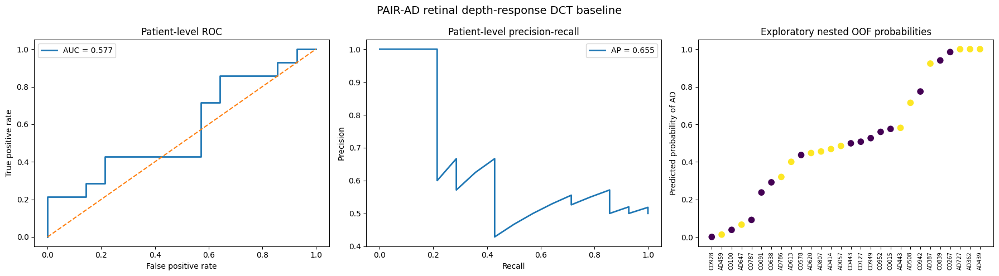


CELL 30 COMPLETE

Feature table:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Depth_Response\Depth_DCT_Baseline\PAIR_AD_depth_DCT_patient_features.csv

OOF predictions:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Depth_Response\Depth_DCT_Baseline\PAIR_AD_depth_DCT_OOF.csv

Fold results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Depth_Response\Depth_DCT_Baseline\PAIR_AD_depth_DCT_outer_results.csv

Summary:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Depth_Response\Depth_DCT_Baseline\PAIR_AD_depth_DCT_summary.txt

Figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Depth_Response\Depth_DCT_Baseline\PAIR_AD_depth_DCT_results.png

SEND ME:
  1. FIXED DEPTH SUPPORT
  2. DEPTH-DCT FEATURE MATRIX
  3. Selected C / inner OOF AUC for each fold
  4. All three OUTER FOLD results
  5. FINAL EXPLORATORY DEPTH-DCT PATIENT OOF PERFORMANCE
  6. OUTER-FOLD MEAN ± SD
  7. EXPLO

In [40]:
# ==================================================================================================
# CELL 30 — PAIR-AD DEPTH-DCT PATIENT BASELINE
#
# EXPLORATORY MODEL-DEVELOPMENT EXPERIMENT
#
# PURPOSE
# -------
#
# Test whether RETINAL-DEPTH PATTERNS of the DARK->LIGHT response
# contain useful AD information.
#
#
# INPUT REPRESENTATIONS
# ---------------------
#
# patient_signed_mean
# patient_signed_sd
# patient_absolute_mean
# patient_absolute_sd
#
#
# PREPROCESSING
# -------------
#
# Fixed removal of two extreme depth bins from each end:
#
#       original bins : 0 ... 31
#       retained      : 2 ... 29
#
# This is NOT selected using diagnosis.
#
#
# FEATURE COMPRESSION
# -------------------
#
# Fixed DCT-II:
#
#       first 6 coefficients per profile
#
# Four profiles x six coefficients:
#
#       24 patient features
#
#
# CLASSIFIER
# ----------
#
# StandardScaler + L2 Logistic Regression
#
#
# VALIDATION
# ----------
#
# Same nested participant-exclusive folds.
#
# IMPORTANT:
#
# Since earlier outer-fold results have already been inspected,
# this experiment is EXPLORATORY / MODEL DEVELOPMENT rather than
# a new confirmatory validation.
#
# ==================================================================================================

from pathlib import Path
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from scipy.fft import dct

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    average_precision_score,
    confusion_matrix,
    roc_curve,
    precision_recall_curve
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. LOCKED CONFIGURATION
# ==================================================================================================

SEED = 2026

EDGE_TRIM = 2

N_DCT_COEFFICIENTS = 6


C_GRID = [
    0.03,
    0.10,
    0.30,
    1.00,
    3.00
]


THRESHOLD_GRID = np.arange(
    0.10,
    0.91,
    0.01
)


N_BOOTSTRAP = 2000


# ==================================================================================================
# 2. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


DEPTH_DIR = (
    PAIR_AD_DIR /
    "Depth_Response"
)


INPUT_NPZ = (
    DEPTH_DIR /
    "PAIR_AD_depth_response_32bins.npz"
)


INPUT_METADATA = (
    DEPTH_DIR /
    "PAIR_AD_depth_response_patient_metadata.csv"
)


RESULT_DIR = (
    DEPTH_DIR /
    "Depth_DCT_Baseline"
)


RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


FEATURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_depth_DCT_patient_features.csv"
)


OOF_PATH = (
    RESULT_DIR /
    "PAIR_AD_depth_DCT_OOF.csv"
)


FOLD_PATH = (
    RESULT_DIR /
    "PAIR_AD_depth_DCT_outer_results.csv"
)


INNER_PATH = (
    RESULT_DIR /
    "PAIR_AD_depth_DCT_inner_results.csv"
)


SUMMARY_PATH = (
    RESULT_DIR /
    "PAIR_AD_depth_DCT_summary.txt"
)


FIGURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_depth_DCT_results.png"
)


print("=" * 120)
print("CELL 30 — PAIR-AD DEPTH-DCT PATIENT BASELINE")
print("=" * 120)


print(
    "\nIMPORTANT:"
)

print(
    "This is exploratory model-development evaluation."
)

print(
    "The 28-subject cohort has already been used for previous model comparisons."
)


# ==================================================================================================
# 3. LOAD DEPTH REPRESENTATIONS
# ==================================================================================================

assert INPUT_NPZ.exists(), INPUT_NPZ
assert INPUT_METADATA.exists(), INPUT_METADATA


data = np.load(
    INPUT_NPZ,
    allow_pickle=True
)


meta = pd.read_csv(
    INPUT_METADATA
)


signed_mean = data[
    "patient_signed_mean"
].astype(
    np.float64
)


signed_sd = data[
    "patient_signed_sd"
].astype(
    np.float64
)


absolute_mean = data[
    "patient_absolute_mean"
].astype(
    np.float64
)


absolute_sd = data[
    "patient_absolute_sd"
].astype(
    np.float64
)


coverage = data[
    "patient_coverage_mean"
].astype(
    np.float64
)


subjects = data[
    "patient_subject"
].astype(str)


y = data[
    "patient_target"
].astype(
    np.int64
)


outer_fold = data[
    "patient_outer_fold"
].astype(
    np.int64
)


print("\n" + "=" * 120)
print("INPUT")
print("=" * 120)


print(
    "Signed mean :",
    signed_mean.shape
)


print(
    "Signed SD   :",
    signed_sd.shape
)


print(
    "Absolute mean:",
    absolute_mean.shape
)


print(
    "Absolute SD :",
    absolute_sd.shape
)


print(
    "Coverage    :",
    coverage.shape
)


print(
    "Participants:",
    len(
        subjects
    )
)


assert signed_mean.shape == (
    28,
    32
)


assert signed_sd.shape == (
    28,
    32
)


assert absolute_mean.shape == (
    28,
    32
)


assert absolute_sd.shape == (
    28,
    32
)


assert len(
    subjects
) == 28


# ==================================================================================================
# 4. VERIFY METADATA ALIGNMENT
# ==================================================================================================

meta[
    "folder_subject"
] = meta[
    "folder_subject"
].astype(str)


meta_lookup = meta.set_index(
    "folder_subject"
)


for subject_name in subjects:

    assert subject_name in meta_lookup.index


meta_ordered = meta_lookup.loc[
    subjects
].reset_index()


assert np.array_equal(

    meta_ordered[
        "target"
    ].values.astype(
        int
    ),

    y
)


assert np.array_equal(

    meta_ordered[
        "outer_fold"
    ].values.astype(
        int
    ),

    outer_fold
)


# ==================================================================================================
# 5. FIXED DEPTH TRIM
#
# Remove:
#
#       bins 0,1
#
# and:
#
#       bins 30,31
#
# Retain:
#
#       bins 2 ... 29
#
# Exactly 28 depth bins.
# ==================================================================================================

start_bin = EDGE_TRIM

end_bin = 32 - EDGE_TRIM


signed_mean_trim = signed_mean[
    :,
    start_bin:end_bin
]


signed_sd_trim = signed_sd[
    :,
    start_bin:end_bin
]


absolute_mean_trim = absolute_mean[
    :,
    start_bin:end_bin
]


absolute_sd_trim = absolute_sd[
    :,
    start_bin:end_bin
]


coverage_trim = coverage[
    :,
    start_bin:end_bin
]


print("\n" + "=" * 120)
print("FIXED DEPTH SUPPORT")
print("=" * 120)


print(
    "Original bins:",
    32
)


print(
    "Removed from top:",
    EDGE_TRIM
)


print(
    "Removed from bottom:",
    EDGE_TRIM
)


print(
    "Retained bins:",
    signed_mean_trim.shape[
        1
    ]
)


print(
    "Retained depth range:",
    f"{start_bin} ... {end_bin-1}"
)


print(
    "Mean retained coverage:",
    float(
        coverage_trim.mean()
    )
)


assert signed_mean_trim.shape == (
    28,
    28
)


# ==================================================================================================
# 6. FIXED DCT FEATURE EXTRACTION
#
# DCT-II with orthonormal normalization.
#
# Keep first six low-frequency coefficients.
#
# No labels are involved.
# ==================================================================================================

def dct_features(
    profile
):

    coefficients = dct(

        profile,

        type=2,

        axis=1,

        norm="ortho"
    )


    return coefficients[
        :,
        :N_DCT_COEFFICIENTS
    ]


dct_signed_mean = dct_features(
    signed_mean_trim
)


dct_signed_sd = dct_features(
    signed_sd_trim
)


dct_absolute_mean = dct_features(
    absolute_mean_trim
)


dct_absolute_sd = dct_features(
    absolute_sd_trim
)


X = np.concatenate(
    [
        dct_signed_mean,
        dct_signed_sd,
        dct_absolute_mean,
        dct_absolute_sd
    ],
    axis=1
)


print("\n" + "=" * 120)
print("DEPTH-DCT FEATURE MATRIX")
print("=" * 120)


print(
    "Patients:",
    X.shape[
        0
    ]
)


print(
    "Features:",
    X.shape[
        1
    ]
)


print(
    "Matrix:",
    X.shape
)


print(
    "\nChannels:"
)


print(
    "  Signed mean DCT    :",
    dct_signed_mean.shape
)


print(
    "  Signed SD DCT      :",
    dct_signed_sd.shape
)


print(
    "  Absolute mean DCT  :",
    dct_absolute_mean.shape
)


print(
    "  Absolute SD DCT    :",
    dct_absolute_sd.shape
)


assert X.shape == (
    28,
    24
)


assert np.isfinite(
    X
).all()


# ==================================================================================================
# 7. SAVE FEATURE TABLE
# ==================================================================================================

feature_names = []


for profile_name in [

    "signed_mean",
    "signed_sd",
    "absolute_mean",
    "absolute_sd"

]:

    for coefficient in range(
        N_DCT_COEFFICIENTS
    ):

        feature_names.append(

            f"{profile_name}_dct"
            f"{coefficient}"
        )


feature_df = pd.DataFrame(
    X,
    columns=feature_names
)


feature_df.insert(
    0,
    "folder_subject",
    subjects
)


feature_df.insert(
    1,
    "target",
    y
)


feature_df.insert(
    2,
    "outer_fold",
    outer_fold
)


feature_df.to_csv(
    FEATURE_PATH,
    index=False
)


# ==================================================================================================
# 8. METRICS
# ==================================================================================================

def compute_metrics(
    y_true,
    probability,
    prediction
):

    tn, fp, fn, tp = confusion_matrix(

        y_true,

        prediction,

        labels=[
            0,
            1
        ]
    ).ravel()


    specificity = (

        tn

        /

        max(
            tn
            +
            fp,
            1
        )
    )


    return {

        "accuracy":
            accuracy_score(
                y_true,
                prediction
            ),

        "precision":
            precision_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                prediction
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                prediction
            ),

        "auc":
            roc_auc_score(
                y_true,
                probability
            ),

        "average_precision":
            average_precision_score(
                y_true,
                probability
            ),

        "tn":
            int(
                tn
            ),

        "fp":
            int(
                fp
            ),

        "fn":
            int(
                fn
            ),

        "tp":
            int(
                tp
            )
    }


# ==================================================================================================
# 9. THRESHOLD SELECTION
# ==================================================================================================

def select_threshold(
    y_true,
    probability
):

    best_threshold = 0.50

    best_score = -np.inf


    for threshold in THRESHOLD_GRID:

        prediction = (

            probability
            >=
            threshold

        ).astype(
            int
        )


        score = balanced_accuracy_score(

            y_true,

            prediction
        )


        if score > best_score + 1e-12:

            best_score = score

            best_threshold = float(
                threshold
            )


        elif abs(
            score
            -
            best_score
        ) <= 1e-12:

            if abs(
                threshold
                -
                0.50
            ) < abs(
                best_threshold
                -
                0.50
            ):

                best_threshold = float(
                    threshold
                )


    return (
        best_threshold,
        best_score
    )


# ==================================================================================================
# 10. TRAIN/EVALUATE LOGISTIC MODEL
# ==================================================================================================

def fit_predict(
    X_train,
    y_train,
    X_eval,
    C
):

    scaler = StandardScaler()


    X_train_scaled = scaler.fit_transform(
        X_train
    )


    X_eval_scaled = scaler.transform(
        X_eval
    )


    model = LogisticRegression(

        C=float(
            C
        ),

        penalty="l2",

        solver="liblinear",

        max_iter=5000,

        random_state=SEED
    )


    model.fit(
        X_train_scaled,
        y_train
    )


    return model.predict_proba(
        X_eval_scaled
    )[
        :,
        1
    ]


# ==================================================================================================
# 11. STORAGE
# ==================================================================================================

oof_probability = np.full(
    28,
    np.nan,
    dtype=np.float64
)


oof_prediction = np.full(
    28,
    -1,
    dtype=np.int64
)


oof_threshold = np.full(
    28,
    np.nan,
    dtype=np.float64
)


fold_records = []

inner_records = []


# ==================================================================================================
# 12. NESTED PATIENT CV
# ==================================================================================================

print("\n" + "=" * 120)
print("STARTING EXPLORATORY NESTED DEPTH-DCT EVALUATION")
print("=" * 120)


for outer in [
    1,
    2,
    3
]:

    print("\n")
    print("#" * 120)
    print(
        f"OUTER FOLD {outer}"
    )
    print("#" * 120)


    outer_train = np.where(
        outer_fold
        !=
        outer
    )[0]


    outer_test = np.where(
        outer_fold
        ==
        outer
    )[0]


    inner_column = (
        f"inner_fold_outer{outer}"
    )


    inner_assignment = meta_ordered[
        inner_column
    ].values.astype(
        int
    )


    # ==============================================================================================
    # SELECT C USING INNER AUC
    # ==============================================================================================

    C_results = []


    for C in C_GRID:

        inner_aucs = []


        for inner in [
            1,
            2,
            3
        ]:

            inner_train = np.where(

                (
                    outer_fold
                    !=
                    outer
                )

                &

                (
                    inner_assignment
                    !=
                    inner
                )

            )[0]


            inner_val = np.where(

                (
                    outer_fold
                    !=
                    outer
                )

                &

                (
                    inner_assignment
                    ==
                    inner
                )

            )[0]


            probability = fit_predict(

                X[
                    inner_train
                ],

                y[
                    inner_train
                ],

                X[
                    inner_val
                ],

                C
            )


            auc_value = roc_auc_score(

                y[
                    inner_val
                ],

                probability
            )


            inner_aucs.append(
                auc_value
            )


            inner_records.append(
                {

                    "outer_fold":
                        outer,

                    "inner_fold":
                        inner,

                    "C":
                        C,

                    "validation_auc":
                        auc_value
                }
            )


        C_results.append(
            {

                "C":
                    C,

                "mean_auc":
                    float(
                        np.mean(
                            inner_aucs
                        )
                    ),

                "sd_auc":
                    float(
                        np.std(
                            inner_aucs,
                            ddof=1
                        )
                    )
            }
        )


    C_df = pd.DataFrame(
        C_results
    )


    best_inner_auc = C_df[
        "mean_auc"
    ].max()


    candidates = C_df[
        np.isclose(
            C_df[
                "mean_auc"
            ],
            best_inner_auc
        )
    ]


    # Tie:
    #
    # choose smaller C = stronger regularization.

    best_C = float(
        candidates[
            "C"
        ].min()
    )


    # ==============================================================================================
    # INNER OOF FOR THRESHOLD
    # ==============================================================================================

    local_lookup = {

        int(
            global_idx
        ):
            local_idx

        for local_idx, global_idx in enumerate(
            outer_train
        )
    }


    inner_oof_probability = np.full(

        len(
            outer_train
        ),

        np.nan,

        dtype=np.float64
    )


    for inner in [
        1,
        2,
        3
    ]:

        inner_train = np.where(

            (
                outer_fold
                !=
                outer
            )

            &

            (
                inner_assignment
                !=
                inner
            )

        )[0]


        inner_val = np.where(

            (
                outer_fold
                !=
                outer
            )

            &

            (
                inner_assignment
                ==
                inner
            )

        )[0]


        probability = fit_predict(

            X[
                inner_train
            ],

            y[
                inner_train
            ],

            X[
                inner_val
            ],

            best_C
        )


        for global_idx, p in zip(
            inner_val,
            probability
        ):

            inner_oof_probability[
                local_lookup[
                    int(
                        global_idx
                    )
                ]
            ] = p


    assert np.isfinite(
        inner_oof_probability
    ).all()


    inner_y = y[
        outer_train
    ]


    inner_oof_auc = roc_auc_score(

        inner_y,

        inner_oof_probability
    )


    threshold, inner_balanced = select_threshold(

        inner_y,

        inner_oof_probability
    )


    print(
        "Selected C:",
        best_C
    )


    print(
        "Best inner mean AUC:",
        f"{best_inner_auc:.4f}"
    )


    print(
        "Inner OOF AUC:",
        f"{inner_oof_auc:.4f}"
    )


    print(
        "Selected threshold:",
        f"{threshold:.2f}"
    )


    print(
        "Inner OOF balanced accuracy:",
        f"{inner_balanced:.4f}"
    )


    # ==============================================================================================
    # OUTER TEST
    # ==============================================================================================

    probability = fit_predict(

        X[
            outer_train
        ],

        y[
            outer_train
        ],

        X[
            outer_test
        ],

        best_C
    )


    prediction = (

        probability
        >=
        threshold

    ).astype(
        int
    )


    oof_probability[
        outer_test
    ] = probability


    oof_prediction[
        outer_test
    ] = prediction


    oof_threshold[
        outer_test
    ] = threshold


    metrics = compute_metrics(

        y[
            outer_test
        ],

        probability,

        prediction
    )


    fold_records.append(
        {

            "outer_fold":
                outer,

            "selected_C":
                best_C,

            "selected_threshold":
                threshold,

            "inner_mean_auc":
                best_inner_auc,

            "inner_oof_auc":
                inner_oof_auc,

            **metrics
        }
    )


    print("\n" + "-" * 90)
    print(
        f"OUTER FOLD {outer} RESULT"
    )
    print("-" * 90)


    for name in [

        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc",
        "average_precision"

    ]:

        print(
            f"{name:22s}: "
            f"{metrics[name]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )


    print(

        np.array(
            [
                [
                    metrics[
                        "tn"
                    ],
                    metrics[
                        "fp"
                    ]
                ],

                [
                    metrics[
                        "fn"
                    ],
                    metrics[
                        "tp"
                    ]
                ]
            ]
        )
    )


# ==================================================================================================
# 13. FINAL EXPLORATORY OOF RESULT
# ==================================================================================================

assert np.isfinite(
    oof_probability
).all()


tn, fp, fn, tp = confusion_matrix(

    y,

    oof_prediction,

    labels=[
        0,
        1
    ]
).ravel()


specificity = (

    tn

    /

    max(
        tn
        +
        fp,
        1
    )
)


overall = {

    "accuracy":
        accuracy_score(
            y,
            oof_prediction
        ),

    "precision":
        precision_score(
            y,
            oof_prediction,
            zero_division=0
        ),

    "recall":
        recall_score(
            y,
            oof_prediction,
            zero_division=0
        ),

    "specificity":
        specificity,

    "f1":
        f1_score(
            y,
            oof_prediction,
            zero_division=0
        ),

    "balanced_accuracy":
        balanced_accuracy_score(
            y,
            oof_prediction
        ),

    "mcc":
        matthews_corrcoef(
            y,
            oof_prediction
        ),

    "auc":
        roc_auc_score(
            y,
            oof_probability
        ),

    "average_precision":
        average_precision_score(
            y,
            oof_probability
        )
}


print("\n" + "=" * 120)
print("FINAL EXPLORATORY DEPTH-DCT PATIENT OOF PERFORMANCE")
print("=" * 120)


for name, value in overall.items():

    print(
        f"{name:22s}: "
        f"{value:.4f}"
    )


print(
    "\nConfusion matrix:"
)


print(
    np.array(
        [
            [
                tn,
                fp
            ],
            [
                fn,
                tp
            ]
        ]
    )
)


# ==================================================================================================
# 14. OUTER FOLD SUMMARY
# ==================================================================================================

fold_df = pd.DataFrame(
    fold_records
)


print("\n" + "=" * 120)
print("OUTER-FOLD MEAN ± SD")
print("=" * 120)


for name in [

    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "average_precision"

]:

    print(

        f"{name:22s}: "
        f"{fold_df[name].mean():.4f} "
        f"± "
        f"{fold_df[name].std(ddof=1):.4f}"
    )


# ==================================================================================================
# 15. BOOTSTRAP UNCERTAINTY
#
# DESCRIPTIVE / EXPLORATORY ONLY.
# ==================================================================================================

rng = np.random.default_rng(
    SEED
)


control_idx = np.where(
    y == 0
)[0]


ad_idx = np.where(
    y == 1
)[0]


auc_boot = []

accuracy_boot = []


for _ in range(
    N_BOOTSTRAP
):

    sampled = np.concatenate(
        [

            rng.choice(
                control_idx,
                size=len(
                    control_idx
                ),
                replace=True
            ),

            rng.choice(
                ad_idx,
                size=len(
                    ad_idx
                ),
                replace=True
            )
        ]
    )


    auc_boot.append(

        roc_auc_score(

            y[
                sampled
            ],

            oof_probability[
                sampled
            ]
        )
    )


    accuracy_boot.append(

        accuracy_score(

            y[
                sampled
            ],

            oof_prediction[
                sampled
            ]
        )
    )


auc_ci = np.percentile(
    auc_boot,
    [
        2.5,
        97.5
    ]
)


accuracy_ci = np.percentile(
    accuracy_boot,
    [
        2.5,
        97.5
    ]
)


print("\n" + "=" * 120)
print("EXPLORATORY BOOTSTRAP 95% INTERVALS")
print("=" * 120)


print(
    f"AUC: "
    f"{overall['auc']:.4f} "
    f"[{auc_ci[0]:.4f} - "
    f"{auc_ci[1]:.4f}]"
)


print(
    f"Accuracy: "
    f"{overall['accuracy']:.4f} "
    f"[{accuracy_ci[0]:.4f} - "
    f"{accuracy_ci[1]:.4f}]"
)


# ==================================================================================================
# 16. OOF TABLE
# ==================================================================================================

oof_df = pd.DataFrame(
    {

        "folder_subject":
            subjects,

        "target":
            y,

        "outer_fold":
            outer_fold,

        "probability_AD":
            oof_probability,

        "threshold":
            oof_threshold,

        "prediction":
            oof_prediction
    }
)


print("\n" + "=" * 120)
print("DEPTH-DCT OOF PATIENT PREDICTIONS")
print("=" * 120)


print(

    oof_df
    .sort_values(
        "probability_AD"
    )
    .to_string(
        index=False
    )
)


# ==================================================================================================
# 17. FIGURE
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING DEPTH-DCT RESULT FIGURE")
print("=" * 120)


fig, axes = plt.subplots(
    1,
    3,
    figsize=(
        18,
        5
    )
)


# ROC

fpr, tpr, _ = roc_curve(
    y,
    oof_probability
)


axes[
    0
].plot(

    fpr,

    tpr,

    linewidth=2,

    label=(
        f"AUC = "
        f"{overall['auc']:.3f}"
    )
)


axes[
    0
].plot(
    [
        0,
        1
    ],
    [
        0,
        1
    ],
    linestyle="--"
)


axes[
    0
].set_xlabel(
    "False positive rate"
)


axes[
    0
].set_ylabel(
    "True positive rate"
)


axes[
    0
].set_title(
    "Patient-level ROC"
)


axes[
    0
].legend()


# PR

precision_curve, recall_curve, _ = (
    precision_recall_curve(
        y,
        oof_probability
    )
)


axes[
    1
].plot(

    recall_curve,

    precision_curve,

    linewidth=2,

    label=(
        f"AP = "
        f"{overall['average_precision']:.3f}"
    )
)


axes[
    1
].set_xlabel(
    "Recall"
)


axes[
    1
].set_ylabel(
    "Precision"
)


axes[
    1
].set_title(
    "Patient-level precision-recall"
)


axes[
    1
].legend()


# Probabilities

plot_df = oof_df.sort_values(
    "probability_AD"
).reset_index(
    drop=True
)


positions = np.arange(
    len(
        plot_df
    )
)


axes[
    2
].scatter(

    positions,

    plot_df[
        "probability_AD"
    ],

    c=plot_df[
        "target"
    ],

    s=55
)


axes[
    2
].set_xticks(
    positions
)


axes[
    2
].set_xticklabels(

    plot_df[
        "folder_subject"
    ],

    rotation=90,

    fontsize=7
)


axes[
    2
].set_ylabel(
    "Predicted probability of AD"
)


axes[
    2
].set_title(
    "Exploratory nested OOF probabilities"
)


plt.suptitle(

    "PAIR-AD retinal depth-response DCT baseline",

    fontsize=14
)


plt.tight_layout()


plt.savefig(

    FIGURE_PATH,

    dpi=300,

    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 18. SAVE
# ==================================================================================================

oof_df.to_csv(
    OOF_PATH,
    index=False
)


fold_df.to_csv(
    FOLD_PATH,
    index=False
)


pd.DataFrame(
    inner_records
).to_csv(
    INNER_PATH,
    index=False
)


with open(
    SUMMARY_PATH,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PAIR-AD DEPTH-DCT PATIENT BASELINE\n"
    )


    f.write(
        "=" * 90
        +
        "\n\n"
    )


    f.write(
        "STATUS: exploratory model-development result\n"
    )


    f.write(
        "Participants: 28\n"
    )


    f.write(
        "Depth bins: 32 original; fixed trim to bins 2-29\n"
    )


    f.write(
        "DCT coefficients/profile: 6\n"
    )


    f.write(
        "Profiles: signed mean, signed SD, absolute mean, absolute SD\n"
    )


    f.write(
        "Total classifier features: 24\n"
    )


    f.write(
        "Classifier: train-only StandardScaler + L2 Logistic Regression\n\n"
    )


    for name, value in overall.items():

        f.write(
            f"{name}: "
            f"{value:.6f}\n"
        )


    f.write(
        "\n"
    )


    f.write(
        f"Exploratory AUC interval: "
        f"{auc_ci[0]:.6f} - "
        f"{auc_ci[1]:.6f}\n"
    )


# ==================================================================================================
# 19. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 30 COMPLETE")
print("=" * 120)


print(
    "\nFeature table:"
)

print(
    FEATURE_PATH
)


print(
    "\nOOF predictions:"
)

print(
    OOF_PATH
)


print(
    "\nFold results:"
)

print(
    FOLD_PATH
)


print(
    "\nSummary:"
)

print(
    SUMMARY_PATH
)


print(
    "\nFigure:"
)

print(
    FIGURE_PATH
)


print(
    "\nSEND ME:"
)


print(
    "  1. FIXED DEPTH SUPPORT"
)


print(
    "  2. DEPTH-DCT FEATURE MATRIX"
)


print(
    "  3. Selected C / inner OOF AUC for each fold"
)


print(
    "  4. All three OUTER FOLD results"
)


print(
    "  5. FINAL EXPLORATORY DEPTH-DCT PATIENT OOF PERFORMANCE"
)


print(
    "  6. OUTER-FOLD MEAN ± SD"
)


print(
    "  7. EXPLORATORY BOOTSTRAP interval"
)


print(
    "  8. Result figure"
)

CELL 31 — PAIR-AD PATIENT HETEROGENEITY + OUTER-FOLD SHIFT AUDIT

Paired slices: 135
Participants: 28

PATIENT QC TABLE
folder_subject  target  outer_fold  n_slices  response_signed_mean  response_abs_mean  mask_coverage  dark_light_correlation  depth_signed_global  depth_signed_range
         AD057       1           1         5              0.032248           0.158559       0.727081                0.971187             0.030670            0.173209
         AD362       1           3         5              0.053450           0.091579       0.719537                0.979072             0.051074            0.117465
         AD387       1           3         5              0.087944           0.130258       0.727908                0.979503             0.084861            0.184992
         AD414       1           1         5             -0.045979           0.089241       0.722470                0.982700            -0.044498            0.096016
         AD439       1           3         5      

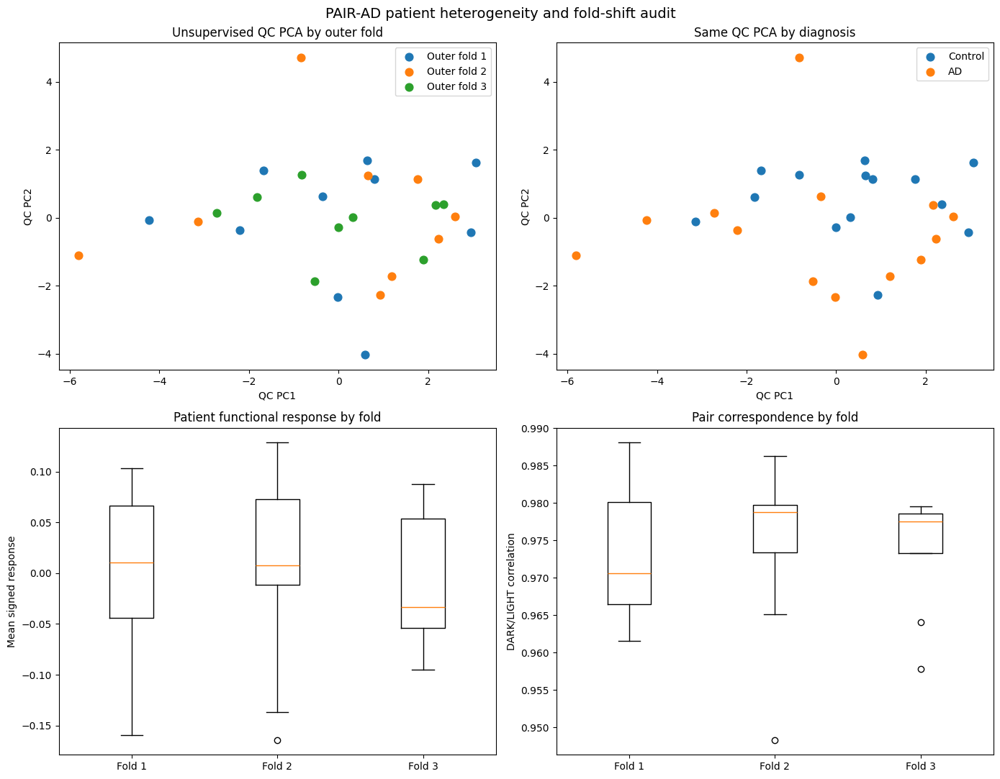


TOP POTENTIAL FOLD-SHIFT VARIABLES
               feature  fold1_mean  fold2_mean  fold3_mean  p_value
              n_slices    4.900000    4.555556    5.000000 0.039266
        raw_light_mean    0.688545    0.698835    0.718025 0.311941
  depth_absolute_range    0.121348    0.155275    0.141460 0.378884
         raw_dark_mean    0.695866    0.703307    0.722062 0.392821
           response_sd    0.110122    0.106660    0.109105 0.599648
    depth_signed_range    0.144160    0.140088    0.165104 0.660378
dark_light_correlation    0.972978    0.974370    0.973764 0.666096
   depth_signed_global    0.002901    0.003232   -0.011192 0.742340

TOP AD/CONTROL QC DIFFERENCES
              feature  control_mean     AD_mean  difference_AD_minus_CO  p_value
 depth_absolute_range      0.115333    0.162102                0.046769 0.029072
         fn_dark_mean   2397.715129 2526.000951              128.285822 0.036562
       raw_light_mean      0.711339    0.691318               -0.020021 0.1752

In [41]:
# ==================================================================================================
# CELL 31 — PAIR-AD PATIENT HETEROGENEITY + OUTER-FOLD SHIFT AUDIT
#
# NO CLASSIFIER TRAINING
# NO HYPERPARAMETER SEARCH
# NO FEATURE SELECTION
#
# PURPOSE
# -------
#
# We observed substantial instability across participant-exclusive folds.
#
# Before designing another model, determine whether patients/folds differ
# systematically in:
#
#   - number of paired slices
#   - RAW intensity
#   - FLAT_NORMED intensity
#   - functional-response magnitude
#   - signed functional response
#   - mask coverage
#   - DARK/LIGHT correlation
#   - depth-response magnitude
#
#
# This is a descriptive QC / cohort-shift analysis.
# ==================================================================================================

from pathlib import Path
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from scipy.stats import (
    kruskal,
    mannwhitneyu
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


HIGHRES_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)


HIGHRES_META_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional_metadata.csv"
)


DEPTH_PATH = (
    PAIR_AD_DIR /
    "Depth_Response" /
    "PAIR_AD_depth_response_32bins.npz"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Heterogeneity_Audit"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


PATIENT_TABLE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_patient_heterogeneity_features.csv"
)


FOLD_TABLE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_outer_fold_shift_summary.csv"
)


CLASS_TABLE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_class_QC_summary.csv"
)


FIGURE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_patient_heterogeneity_QC.png"
)


print("=" * 120)
print("CELL 31 — PAIR-AD PATIENT HETEROGENEITY + OUTER-FOLD SHIFT AUDIT")
print("=" * 120)


# ==================================================================================================
# 2. LOAD
# ==================================================================================================

assert HIGHRES_PATH.exists(), HIGHRES_PATH
assert DEPTH_PATH.exists(), DEPTH_PATH


data = np.load(
    HIGHRES_PATH,
    allow_pickle=True
)


depth_data = np.load(
    DEPTH_PATH,
    allow_pickle=True
)


raw_dark = data[
    "raw_dark"
].astype(
    np.float32
)


raw_light = data[
    "raw_light"
].astype(
    np.float32
)


fn_dark = data[
    "flat_normed_dark"
].astype(
    np.float32
)


fn_light = data[
    "flat_normed_light"
].astype(
    np.float32
)


response = data[
    "functional_response_clean"
].astype(
    np.float32
)


mask = data[
    "functional_valid_mask"
].astype(
    bool
)


subjects = data[
    "subject"
].astype(str)


target = data[
    "y"
].astype(
    int
)


slice_index = data[
    "slice_index"
].astype(
    int
)


outer_fold = data[
    "outer_fold"
].astype(
    int
)


patient_signed_mean = depth_data[
    "patient_signed_mean"
].astype(
    np.float32
)


patient_absolute_mean = depth_data[
    "patient_absolute_mean"
].astype(
    np.float32
)


depth_subjects = depth_data[
    "patient_subject"
].astype(str)


print(
    "\nPaired slices:",
    len(
        subjects
    )
)


print(
    "Participants:",
    len(
        np.unique(
            subjects
        )
    )
)


# ==================================================================================================
# 3. DARK/LIGHT CORRELATION
# ==================================================================================================

def safe_corr(
    a,
    b
):

    a = a.ravel()

    b = b.ravel()


    if (
        np.std(
            a
        )
        <
        1e-12
    ):

        return np.nan


    if (
        np.std(
            b
        )
        <
        1e-12
    ):

        return np.nan


    return float(
        np.corrcoef(
            a,
            b
        )[
            0,
            1
        ]
    )


pair_corr = np.array(
    [

        safe_corr(
            fn_dark[
                i
            ],
            fn_light[
                i
            ]
        )

        for i in range(
            len(
                subjects
            )
        )
    ],
    dtype=np.float64
)


# ==================================================================================================
# 4. SLICE-LEVEL QC FEATURES
# ==================================================================================================

slice_rows = []


for i in range(
    len(
        subjects
    )
):

    valid = mask[
        i
    ]


    response_values = response[
        i
    ][
        valid
    ]


    if response_values.size == 0:

        raise RuntimeError(
            f"No valid response pixels for sample {i}"
        )


    row = {

        "sample_index":
            i,

        "folder_subject":
            subjects[
                i
            ],

        "target":
            int(
                target[
                    i
                ]
            ),

        "outer_fold":
            int(
                outer_fold[
                    i
                ]
            ),

        "slice_index":
            int(
                slice_index[
                    i
                ]
            ),

        # RAW
        "raw_dark_mean":
            float(
                raw_dark[
                    i
                ].mean()
            ),

        "raw_light_mean":
            float(
                raw_light[
                    i
                ].mean()
            ),

        "raw_dark_sd":
            float(
                raw_dark[
                    i
                ].std()
            ),

        "raw_light_sd":
            float(
                raw_light[
                    i
                ].std()
            ),

        # FLAT_NORMED
        "fn_dark_mean":
            float(
                fn_dark[
                    i
                ].mean()
            ),

        "fn_light_mean":
            float(
                fn_light[
                    i
                ].mean()
            ),

        "fn_dark_sd":
            float(
                fn_dark[
                    i
                ].std()
            ),

        "fn_light_sd":
            float(
                fn_light[
                    i
                ].std()
            ),

        # functional response
        "response_signed_mean":
            float(
                response_values.mean()
            ),

        "response_abs_mean":
            float(
                np.abs(
                    response_values
                ).mean()
            ),

        "response_sd":
            float(
                response_values.std()
            ),

        "response_positive_fraction":
            float(
                np.mean(
                    response_values
                    >
                    0
                )
            ),

        "response_negative_fraction":
            float(
                np.mean(
                    response_values
                    <
                    0
                )
            ),

        # mask
        "mask_coverage":
            float(
                valid.mean()
            ),

        # DARK/LIGHT pair
        "dark_light_correlation":
            pair_corr[
                i
            ]
    }


    slice_rows.append(
        row
    )


slice_df = pd.DataFrame(
    slice_rows
)


# ==================================================================================================
# 5. PATIENT AGGREGATION
# ==================================================================================================

qc_features = [

    "raw_dark_mean",
    "raw_light_mean",
    "raw_dark_sd",
    "raw_light_sd",

    "fn_dark_mean",
    "fn_light_mean",
    "fn_dark_sd",
    "fn_light_sd",

    "response_signed_mean",
    "response_abs_mean",
    "response_sd",

    "response_positive_fraction",
    "response_negative_fraction",

    "mask_coverage",

    "dark_light_correlation"
]


patient_rows = []


for subject_name in sorted(
    np.unique(
        subjects
    )
):

    sub = slice_df[
        slice_df[
            "folder_subject"
        ]
        ==
        subject_name
    ]


    row = {

        "folder_subject":
            subject_name,

        "target":
            int(
                sub[
                    "target"
                ].iloc[
                    0
                ]
            ),

        "outer_fold":
            int(
                sub[
                    "outer_fold"
                ].iloc[
                    0
                ]
            ),

        "n_slices":
            len(
                sub
            )
    }


    for feature in qc_features:

        values = sub[
            feature
        ].values.astype(
            np.float64
        )


        row[
            feature
        ] = float(
            np.nanmean(
                values
            )
        )


        row[
            feature
            +
            "_slice_sd"
        ] = float(
            np.nanstd(
                values
            )
        )


    patient_rows.append(
        row
    )


patient_qc = pd.DataFrame(
    patient_rows
)


# ==================================================================================================
# 6. ADD DEPTH-PROFILE SUMMARY
# ==================================================================================================

depth_lookup = {

    subject:
        i

    for i, subject in enumerate(
        depth_subjects
    )
}


depth_signed_global = []

depth_abs_global = []

depth_signed_range = []

depth_abs_range = []


for subject_name in patient_qc[
    "folder_subject"
]:

    i = depth_lookup[
        subject_name
    ]


    signed = patient_signed_mean[
        i
    ]


    absolute = patient_absolute_mean[
        i
    ]


    depth_signed_global.append(
        float(
            signed.mean()
        )
    )


    depth_abs_global.append(
        float(
            absolute.mean()
        )
    )


    depth_signed_range.append(
        float(
            signed.max()
            -
            signed.min()
        )
    )


    depth_abs_range.append(
        float(
            absolute.max()
            -
            absolute.min()
        )
    )


patient_qc[
    "depth_signed_global"
] = depth_signed_global


patient_qc[
    "depth_absolute_global"
] = depth_abs_global


patient_qc[
    "depth_signed_range"
] = depth_signed_range


patient_qc[
    "depth_absolute_range"
] = depth_abs_range


patient_qc.to_csv(
    PATIENT_TABLE_PATH,
    index=False
)


# ==================================================================================================
# 7. PRINT PATIENT TABLE
# ==================================================================================================

print("\n" + "=" * 120)
print("PATIENT QC TABLE")
print("=" * 120)


display_columns = [

    "folder_subject",
    "target",
    "outer_fold",
    "n_slices",

    "response_signed_mean",
    "response_abs_mean",

    "mask_coverage",
    "dark_light_correlation",

    "depth_signed_global",
    "depth_signed_range"
]


print(
    patient_qc[
        display_columns
    ].to_string(
        index=False
    )
)


# ==================================================================================================
# 8. FOLD-SHIFT TEST
#
# Kruskal-Wallis across folds.
#
# DESCRIPTIVE QC ONLY.
# ==================================================================================================

audit_features = [

    "n_slices",

    "raw_dark_mean",
    "raw_light_mean",

    "fn_dark_mean",
    "fn_light_mean",

    "response_signed_mean",
    "response_abs_mean",
    "response_sd",

    "mask_coverage",

    "dark_light_correlation",

    "depth_signed_global",
    "depth_absolute_global",
    "depth_signed_range",
    "depth_absolute_range"
]


fold_shift_rows = []


for feature in audit_features:

    groups = [

        patient_qc.loc[
            patient_qc[
                "outer_fold"
            ]
            ==
            fold,
            feature
        ].values

        for fold in [
            1,
            2,
            3
        ]
    ]


    statistic, p_value = kruskal(
        *groups
    )


    fold_shift_rows.append(
        {

            "feature":
                feature,

            "fold1_mean":
                float(
                    np.mean(
                        groups[
                            0
                        ]
                    )
                ),

            "fold2_mean":
                float(
                    np.mean(
                        groups[
                            1
                        ]
                    )
                ),

            "fold3_mean":
                float(
                    np.mean(
                        groups[
                            2
                        ]
                    )
                ),

            "kruskal_H":
                float(
                    statistic
                ),

            "p_value":
                float(
                    p_value
                )
        }
    )


fold_shift_df = pd.DataFrame(
    fold_shift_rows
)


fold_shift_df[
    "abs_max_mean_difference"
] = (

    fold_shift_df[
        [
            "fold1_mean",
            "fold2_mean",
            "fold3_mean"
        ]
    ].max(
        axis=1
    )

    -

    fold_shift_df[
        [
            "fold1_mean",
            "fold2_mean",
            "fold3_mean"
        ]
    ].min(
        axis=1
    )
)


fold_shift_df = fold_shift_df.sort_values(
    "p_value"
).reset_index(
    drop=True
)


fold_shift_df.to_csv(
    FOLD_TABLE_PATH,
    index=False
)


print("\n" + "=" * 120)
print("OUTER-FOLD QC SHIFT")
print("=" * 120)


print(
    fold_shift_df.to_string(
        index=False
    )
)


print(
    "\nNOTE:"
)


print(
    "These p-values are descriptive QC diagnostics."
)


print(
    "No multiple-testing-adjusted biological claims should be made."
)


# ==================================================================================================
# 9. CLASS QC COMPARISON
#
# Not feature selection.
#
# Used only to identify possible nuisance/confounding variables.
# ==================================================================================================

class_rows = []


for feature in audit_features:

    controls = patient_qc.loc[
        patient_qc[
            "target"
        ]
        ==
        0,
        feature
    ].values


    ad = patient_qc.loc[
        patient_qc[
            "target"
        ]
        ==
        1,
        feature
    ].values


    statistic, p_value = mannwhitneyu(

        controls,

        ad,

        alternative="two-sided"
    )


    class_rows.append(
        {

            "feature":
                feature,

            "control_mean":
                float(
                    np.mean(
                        controls
                    )
                ),

            "AD_mean":
                float(
                    np.mean(
                        ad
                    )
                ),

            "difference_AD_minus_CO":
                float(
                    np.mean(
                        ad
                    )
                    -
                    np.mean(
                        controls
                    )
                ),

            "mannwhitney_U":
                float(
                    statistic
                ),

            "p_value":
                float(
                    p_value
                )
        }
    )


class_df = pd.DataFrame(
    class_rows
)


class_df = class_df.sort_values(
    "p_value"
).reset_index(
    drop=True
)


class_df.to_csv(
    CLASS_TABLE_PATH,
    index=False
)


print("\n" + "=" * 120)
print("AD/CONTROL QC DIFFERENCES — CONFOUNDING AUDIT ONLY")
print("=" * 120)


print(
    class_df.to_string(
        index=False
    )
)


print(
    "\nIMPORTANT:"
)


print(
    "Do NOT use this table to choose classifier features."
)


print(
    "It is only checking whether technical/QC variables differ between groups."
)


# ==================================================================================================
# 10. PCA OF QC FEATURES
#
# Unsupervised PCA:
#
# Labels and folds are used only AFTER PCA for plotting.
# ==================================================================================================

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


pca_features = [

    feature

    for feature in audit_features

    if feature
    !=
    "n_slices"
]


X_qc = patient_qc[
    pca_features
].values.astype(
    np.float64
)


X_qc_scaled = StandardScaler().fit_transform(
    X_qc
)


pca = PCA(
    n_components=2
)


coordinates = pca.fit_transform(
    X_qc_scaled
)


patient_qc[
    "QC_PC1"
] = coordinates[
    :,
    0
]


patient_qc[
    "QC_PC2"
] = coordinates[
    :,
    1
]


# ==================================================================================================
# 11. FIGURE
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING HETEROGENEITY FIGURE")
print("=" * 120)


fig, axes = plt.subplots(

    2,

    2,

    figsize=(
        14,
        11
    )
)


# ----------------------------------------------------------------------------------------------
# A. QC PCA colored by outer fold
# ----------------------------------------------------------------------------------------------

for fold in [
    1,
    2,
    3
]:

    mask_fold = (
        patient_qc[
            "outer_fold"
        ]
        ==
        fold
    )


    axes[
        0,
        0
    ].scatter(

        patient_qc.loc[
            mask_fold,
            "QC_PC1"
        ],

        patient_qc.loc[
            mask_fold,
            "QC_PC2"
        ],

        label=f"Outer fold {fold}",

        s=60
    )


axes[
    0,
    0
].set_xlabel(
    "QC PC1"
)


axes[
    0,
    0
].set_ylabel(
    "QC PC2"
)


axes[
    0,
    0
].set_title(
    "Unsupervised QC PCA by outer fold"
)


axes[
    0,
    0
].legend()


# ----------------------------------------------------------------------------------------------
# B. QC PCA by diagnosis
# ----------------------------------------------------------------------------------------------

for target_value, label in [
    (
        0,
        "Control"
    ),
    (
        1,
        "AD"
    )
]:

    mask_class = (
        patient_qc[
            "target"
        ]
        ==
        target_value
    )


    axes[
        0,
        1
    ].scatter(

        patient_qc.loc[
            mask_class,
            "QC_PC1"
        ],

        patient_qc.loc[
            mask_class,
            "QC_PC2"
        ],

        label=label,

        s=60
    )


axes[
    0,
    1
].set_xlabel(
    "QC PC1"
)


axes[
    0,
    1
].set_ylabel(
    "QC PC2"
)


axes[
    0,
    1
].set_title(
    "Same QC PCA by diagnosis"
)


axes[
    0,
    1
].legend()


# ----------------------------------------------------------------------------------------------
# C. signed response by fold
# ----------------------------------------------------------------------------------------------

fold_values = [

    patient_qc.loc[
        patient_qc[
            "outer_fold"
        ]
        ==
        fold,
        "response_signed_mean"
    ].values

    for fold in [
        1,
        2,
        3
    ]
]


axes[
    1,
    0
].boxplot(

    fold_values,

    labels=[
        "Fold 1",
        "Fold 2",
        "Fold 3"
    ]
)


axes[
    1,
    0
].set_ylabel(
    "Mean signed response"
)


axes[
    1,
    0
].set_title(
    "Patient functional response by fold"
)


# ----------------------------------------------------------------------------------------------
# D. DARK/LIGHT correlation by fold
# ----------------------------------------------------------------------------------------------

corr_values = [

    patient_qc.loc[
        patient_qc[
            "outer_fold"
        ]
        ==
        fold,
        "dark_light_correlation"
    ].values

    for fold in [
        1,
        2,
        3
    ]
]


axes[
    1,
    1
].boxplot(

    corr_values,

    labels=[
        "Fold 1",
        "Fold 2",
        "Fold 3"
    ]
)


axes[
    1,
    1
].set_ylabel(
    "DARK/LIGHT correlation"
)


axes[
    1,
    1
].set_title(
    "Pair correspondence by fold"
)


plt.suptitle(

    "PAIR-AD patient heterogeneity and fold-shift audit",

    fontsize=14
)


plt.tight_layout()


plt.savefig(

    FIGURE_PATH,

    dpi=300,

    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 12. FINAL INTERPRETATION AIDS
# ==================================================================================================

print("\n" + "=" * 120)
print("TOP POTENTIAL FOLD-SHIFT VARIABLES")
print("=" * 120)


print(

    fold_shift_df[
        [
            "feature",
            "fold1_mean",
            "fold2_mean",
            "fold3_mean",
            "p_value"
        ]
    ]
    .head(
        8
    )
    .to_string(
        index=False
    )
)


print("\n" + "=" * 120)
print("TOP AD/CONTROL QC DIFFERENCES")
print("=" * 120)


print(

    class_df[
        [
            "feature",
            "control_mean",
            "AD_mean",
            "difference_AD_minus_CO",
            "p_value"
        ]
    ]
    .head(
        8
    )
    .to_string(
        index=False
    )
)


# ==================================================================================================
# 13. SAVE FINAL PATIENT TABLE
# ==================================================================================================

patient_qc.to_csv(
    PATIENT_TABLE_PATH,
    index=False
)


# ==================================================================================================
# 14. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 31 COMPLETE")
print("=" * 120)


print(
    "\nPatient QC table:"
)

print(
    PATIENT_TABLE_PATH
)


print(
    "\nFold-shift table:"
)

print(
    FOLD_TABLE_PATH
)


print(
    "\nClass QC table:"
)

print(
    CLASS_TABLE_PATH
)


print(
    "\nFigure:"
)

print(
    FIGURE_PATH
)


print(
    "\nNO CLASSIFIER WAS TRAINED."
)


print(
    "NO MODEL HYPERPARAMETERS WERE SELECTED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. OUTER-FOLD QC SHIFT"
)


print(
    "  2. AD/CONTROL QC DIFFERENCES"
)


print(
    "  3. TOP POTENTIAL FOLD-SHIFT VARIABLES"
)


print(
    "  4. TOP AD/CONTROL QC DIFFERENCES"
)


print(
    "  5. The heterogeneity figure"
)

CELL 32 — PAIR-AD MARKED RETINAL ANATOMY AUDIT

All paired records: 540
Image metadata rows: 1100

MARKED PAIR TABLE
MARKED pairs: 135
Participants: 28
✓ MARKED pairs align with the 135 high-resolution paired samples.

BUILDING ANALYZE FILE INDEX
HDR files: 432
Unique basenames: 386
Duplicate basenames: 34

EXTRACTING ORIGINAL MARKED OCT SLICES
Processed  20/135
Processed  40/135
Processed  60/135
Processed  80/135
Processed 100/135
Processed 120/135
Processed 135/135

MARKED REPRESENTATION AUDIT
Samples: 135
Participants: 28
Analyze datatype codes: [2]

Original dimensions:
height  width
223     1170     5
286     1182     5
333     1248     5
326     1245     5
312     1317     5
309     1182     5
308     1134     5
307     1302     5
304     1161     5
303     1419     5
292     1287     5
290     1152     5
239     1248     5
286     1248     5
283     1227     5
281     1368     5
276     1272     5
269     1272     5
258     1300     5
252     1140     5
Name: count, dtype: int6

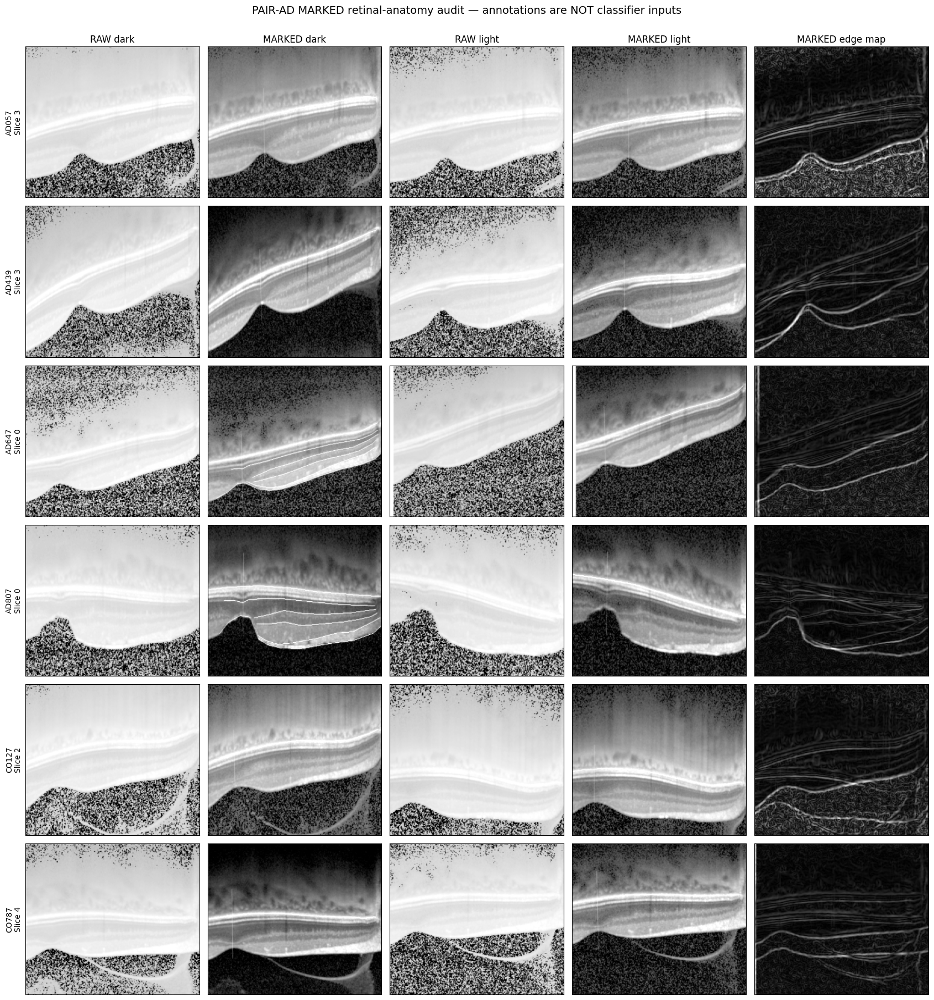

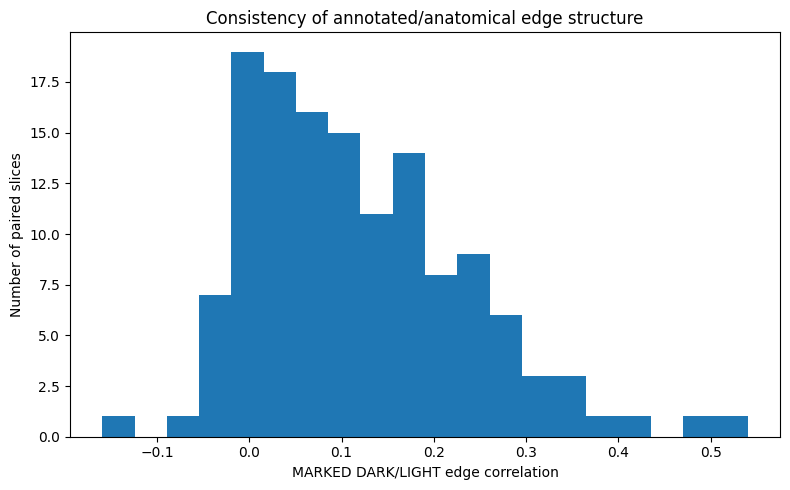


CELL 32 COMPLETE

Saved MARKED dataset:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Anatomical_Audit\PAIR_AD_MARKED_256_anatomy_audit.npz

Saved audit table:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Anatomical_Audit\PAIR_AD_MARKED_anatomy_audit.csv

Saved anatomy QC figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Anatomical_Audit\PAIR_AD_MARKED_anatomy_QC.png

Saved edge histogram:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Anatomical_Audit\PAIR_AD_MARKED_edge_correspondence_histogram.png

NO CLASSIFIER WAS TRAINED.
MARKED IMAGES WERE NOT USED AS PREDICTIVE INPUTS.

SEND ME:
  1. MARKED REPRESENTATION AUDIT
  2. MARKED DARK/LIGHT correlation
  3. MARKED edge correspondence
  4. The MARKED anatomy QC figure
  5. The edge-correlation histogram


In [42]:
# ==================================================================================================
# CELL 32 — PAIR-AD MARKED RETINAL ANATOMY AUDIT
#
# NO CLASSIFIER TRAINING
# NO FEATURE SELECTION
#
# PURPOSE
# -------
#
# The archive contains a MARKED representation.
#
# We previously excluded MARKED images from prediction because manually
# annotated images could provide shortcut information.
#
# Here MARKED data are used ONLY for anatomical/QC investigation:
#
#   1. Load original high-resolution MARKED DARK/LIGHT slices
#   2. Verify pairability and dimensions
#   3. Inspect intensity / edge characteristics
#   4. Compare MARKED anatomy with the corresponding RAW OCT
#   5. Determine whether visible annotations could support
#      retinal-layer coordinate normalization
#
#
# IMPORTANT
# ---------
#
# Diagnosis is NOT used to:
#
#   - choose examples
#   - determine thresholds
#   - select boundaries
#   - train any model
#
# ==================================================================================================

from pathlib import Path
from collections import defaultdict
import struct
import warnings

import numpy as np
import pandas as pd

from PIL import Image

import matplotlib.pyplot as plt

from scipy.ndimage import (
    sobel,
    gaussian_filter
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

OUTPUT_SIZE = 256


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


PAIR_TABLE_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_dark_light_pair_table.csv"
)


IMAGE_METADATA_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_nested_image_splits_2026.csv"
)


HIGHRES_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Anatomical_Audit"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


OUTPUT_NPZ = (
    OUTPUT_DIR /
    "PAIR_AD_MARKED_256_anatomy_audit.npz"
)


OUTPUT_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_MARKED_anatomy_audit.csv"
)


QC_FIGURE = (
    OUTPUT_DIR /
    "PAIR_AD_MARKED_anatomy_QC.png"
)


print("=" * 120)
print("CELL 32 — PAIR-AD MARKED RETINAL ANATOMY AUDIT")
print("=" * 120)


# ==================================================================================================
# 2. LOAD PAIR TABLE + METADATA
# ==================================================================================================

assert PAIR_TABLE_PATH.exists(), PAIR_TABLE_PATH
assert IMAGE_METADATA_PATH.exists(), IMAGE_METADATA_PATH
assert HIGHRES_PATH.exists(), HIGHRES_PATH


pairs = pd.read_csv(
    PAIR_TABLE_PATH
)


image_meta = pd.read_csv(
    IMAGE_METADATA_PATH
)


highres = np.load(
    HIGHRES_PATH,
    allow_pickle=True
)


image_meta[
    "dataset_index"
] = image_meta[
    "dataset_index"
].astype(
    int
)


image_meta[
    "folder_subject"
] = image_meta[
    "folder_subject"
].astype(str)


image_meta[
    "representation"
] = (
    image_meta[
        "representation"
    ]
    .astype(str)
    .str.upper()
)


image_meta[
    "condition"
] = (
    image_meta[
        "condition"
    ]
    .astype(str)
    .str.upper()
)


meta_lookup = image_meta.set_index(
    "dataset_index"
)


pairs[
    "representation"
] = (
    pairs[
        "representation"
    ]
    .astype(str)
    .str.upper()
)


pairs[
    "folder_subject"
] = pairs[
    "folder_subject"
].astype(str)


pairs[
    "slice_index"
] = pairs[
    "slice_index"
].astype(int)


print(
    "\nAll paired records:",
    len(
        pairs
    )
)


print(
    "Image metadata rows:",
    len(
        image_meta
    )
)


# ==================================================================================================
# 3. MARKED PAIRS
# ==================================================================================================

marked_pairs = (

    pairs[
        pairs[
            "representation"
        ]
        ==
        "MARKED"
    ]
    .copy()
)


marked_pairs = (

    marked_pairs
    .sort_values(
        [
            "folder_subject",
            "slice_index"
        ]
    )
    .reset_index(
        drop=True
    )
)


print("\n" + "=" * 120)
print("MARKED PAIR TABLE")
print("=" * 120)


print(
    "MARKED pairs:",
    len(
        marked_pairs
    )
)


print(
    "Participants:",
    marked_pairs[
        "folder_subject"
    ].nunique()
)


assert len(
    marked_pairs
) == 135


assert marked_pairs[
    "folder_subject"
].nunique() == 28


# ==================================================================================================
# 4. VERIFY SAME PATIENT/SLICE ORDER AS HIGH-RES DATA
# ==================================================================================================

high_subject = highres[
    "subject"
].astype(str)


high_slice = highres[
    "slice_index"
].astype(int)


assert len(
    high_subject
) == 135


for i, row in marked_pairs.iterrows():

    assert (
        row[
            "folder_subject"
        ]
        ==
        high_subject[
            i
        ]
    ), (
        f"Subject-order mismatch at row {i}"
    )


    assert int(
        row[
            "slice_index"
        ]
    ) == int(
        high_slice[
            i
        ]
    ), (
        f"Slice-order mismatch at row {i}"
    )


print(
    "✓ MARKED pairs align with the 135 high-resolution paired samples."
)


# ==================================================================================================
# 5. BUILD HDR INDEX
# ==================================================================================================

print("\n" + "=" * 120)
print("BUILDING ANALYZE FILE INDEX")
print("=" * 120)


ALL_HDR_FILES = list(
    DATA_ROOT.rglob(
        "*.hdr"
    )
)


HDR_INDEX = defaultdict(
    list
)


for hdr_path in ALL_HDR_FILES:

    HDR_INDEX[
        hdr_path.name.lower()
    ].append(
        hdr_path.resolve()
    )


print(
    "HDR files:",
    len(
        ALL_HDR_FILES
    )
)


print(
    "Unique basenames:",
    len(
        HDR_INDEX
    )
)


print(
    "Duplicate basenames:",
    sum(
        len(
            paths
        )
        >
        1

        for paths in HDR_INDEX.values()
    )
)


# ==================================================================================================
# 6. ROBUST HDR RESOLVER
# ==================================================================================================

def resolve_hdr_path(
    path_value,
    folder_subject=None
):

    p = Path(
        str(
            path_value
        ).strip()
    )


    if p.exists():

        return p.resolve()


    candidate = (
        DATA_ROOT /
        p
    )


    if candidate.exists():

        return candidate.resolve()


    matches = HDR_INDEX.get(
        p.name.lower(),
        []
    )


    if len(
        matches
    ) == 0:

        raise FileNotFoundError(

            "Could not resolve HDR:\n"
            f"{path_value}"
        )


    if len(
        matches
    ) == 1:

        return matches[
            0
        ]


    if folder_subject is not None:

        subject_text = str(
            folder_subject
        ).lower()


        exact = [

            candidate

            for candidate in matches

            if (
                candidate
                .parent
                .name
                .lower()
                ==
                subject_text
            )
        ]


        if len(
            exact
        ) == 1:

            return exact[
                0
            ]


        contained = []


        for candidate in matches:

            path_parts = [

                part.lower()

                for part in candidate.parts
            ]


            if subject_text in path_parts:

                contained.append(
                    candidate
                )


        if len(
            contained
        ) == 1:

            return contained[
                0
            ]


    raise RuntimeError(

        "Ambiguous HDR filename:\n"
        f"{path_value}\n\n"

        +

        "\n".join(
            str(
                x
            )
            for x in matches
        )
    )


# ==================================================================================================
# 7. IMG RESOLVER
# ==================================================================================================

def resolve_img_path(
    hdr_path
):

    hdr_path = Path(
        hdr_path
    )


    candidates = [

        hdr_path.with_suffix(
            ".img"
        ),

        hdr_path.with_suffix(
            ".IMG"
        ),

        hdr_path.with_suffix(
            ".Img"
        )
    ]


    for candidate in candidates:

        if candidate.exists():

            return candidate.resolve()


    for candidate in hdr_path.parent.iterdir():

        if (

            candidate.is_file()

            and

            candidate.stem.lower()
            ==
            hdr_path.stem.lower()

            and

            candidate.suffix.lower()
            ==
            ".img"

        ):

            return candidate.resolve()


    raise FileNotFoundError(

        f"No IMG found for:\n{hdr_path}"
    )


# ==================================================================================================
# 8. ANALYZE HEADER PARSER
# ==================================================================================================

ANALYZE_DTYPES = {

    2:
        np.uint8,

    4:
        np.int16,

    8:
        np.int32,

    16:
        np.float32,

    64:
        np.float64
}


def parse_analyze_header(
    hdr_path
):

    hdr_path = Path(
        hdr_path
    )


    with open(
        hdr_path,
        "rb"
    ) as f:

        header = f.read(
            348
        )


    little_size = struct.unpack(
        "<i",
        header[
            0:4
        ]
    )[0]


    big_size = struct.unpack(
        ">i",
        header[
            0:4
        ]
    )[0]


    if little_size == 348:

        endian = "<"


    elif big_size == 348:

        endian = ">"


    else:

        raise RuntimeError(

            f"Invalid Analyze header:\n{hdr_path}"
        )


    dims = struct.unpack(

        endian + "8h",

        header[
            40:56
        ]
    )


    datatype = struct.unpack(

        endian + "h",

        header[
            70:72
        ]
    )[0]


    x = int(
        dims[
            1
        ]
    )


    y = int(
        dims[
            2
        ]
    )


    z = int(
        dims[
            3
        ]
    )


    if datatype not in ANALYZE_DTYPES:

        raise RuntimeError(

            f"Unsupported datatype "
            f"{datatype}"
        )


    base_dtype = np.dtype(
        ANALYZE_DTYPES[
            datatype
        ]
    )


    if base_dtype.itemsize > 1:

        dtype = base_dtype.newbyteorder(
            endian
        )


    else:

        dtype = base_dtype


    return {

        "hdr_path":
            hdr_path,

        "x":
            x,

        "y":
            y,

        "z":
            z,

        "datatype":
            datatype,

        "dtype":
            dtype
    }


# ==================================================================================================
# 9. READ ANALYZE SLICE
# ==================================================================================================

def read_analyze_slice(
    hdr_path,
    slice_number
):

    info = parse_analyze_header(
        hdr_path
    )


    img_path = resolve_img_path(
        hdr_path
    )


    slice_number = int(
        slice_number
    )


    if not (
        0
        <=
        slice_number
        <
        info[
            "z"
        ]
    ):

        raise IndexError(

            f"Invalid slice "
            f"{slice_number} for {hdr_path}"
        )


    volume = np.memmap(

        img_path,

        dtype=info[
            "dtype"
        ],

        mode="r",

        shape=(

            info[
                "z"
            ],

            info[
                "y"
            ],

            info[
                "x"
            ]
        )
    )


    image = np.array(

        volume[
            slice_number
        ],

        dtype=np.float32,

        copy=True
    )


    return (
        image,
        info
    )


# ==================================================================================================
# 10. GET HDR FROM DATASET INDEX
# ==================================================================================================

def get_hdr_from_dataset_index(
    dataset_index
):

    dataset_index = int(
        dataset_index
    )


    row = meta_lookup.loc[
        dataset_index
    ]


    return resolve_hdr_path(

        row[
            "hdr_file"
        ],

        folder_subject=row[
            "folder_subject"
        ]
    )


# ==================================================================================================
# 11. RESIZE
# ==================================================================================================

try:

    PIL_BILINEAR = (
        Image
        .Resampling
        .BILINEAR
    )


except AttributeError:

    PIL_BILINEAR = Image.BILINEAR


def resize_float(
    image
):

    image = np.asarray(
        image,
        dtype=np.float32
    )


    pil = Image.fromarray(
        image,
        mode="F"
    )


    pil = pil.resize(

        (
            OUTPUT_SIZE,
            OUTPUT_SIZE
        ),

        resample=PIL_BILINEAR
    )


    return np.asarray(
        pil,
        dtype=np.float32
    )


# ==================================================================================================
# 12. ROBUST DISPLAY NORMALIZATION
# ==================================================================================================

def robust_normalize(
    image
):

    image = np.asarray(
        image,
        dtype=np.float32
    )


    low = np.percentile(
        image,
        1
    )


    high = np.percentile(
        image,
        99
    )


    if high <= low:

        return np.zeros_like(
            image
        )


    output = (

        image
        -
        low

    ) / (

        high
        -
        low
    )


    return np.clip(
        output,
        0.0,
        1.0
    )


# ==================================================================================================
# 13. EXTRACT ALL MARKED PAIRS
# ==================================================================================================

print("\n" + "=" * 120)
print("EXTRACTING ORIGINAL MARKED OCT SLICES")
print("=" * 120)


N = len(
    marked_pairs
)


marked_dark = np.zeros(

    (
        N,
        OUTPUT_SIZE,
        OUTPUT_SIZE
    ),

    dtype=np.float32
)


marked_light = np.zeros_like(
    marked_dark
)


audit_rows = []


datatype_codes = set()


for i, row in marked_pairs.iterrows():

    dark_hdr = get_hdr_from_dataset_index(

        row[
            "dark_dataset_index"
        ]
    )


    light_hdr = get_hdr_from_dataset_index(

        row[
            "light_dataset_index"
        ]
    )


    dark, dark_info = read_analyze_slice(

        dark_hdr,

        row[
            "slice_index"
        ]
    )


    light, light_info = read_analyze_slice(

        light_hdr,

        row[
            "slice_index"
        ]
    )


    assert dark.shape == light.shape


    datatype_codes.add(
        dark_info[
            "datatype"
        ]
    )


    datatype_codes.add(
        light_info[
            "datatype"
        ]
    )


    dark_256 = resize_float(
        dark
    )


    light_256 = resize_float(
        light
    )


    marked_dark[
        i
    ] = dark_256


    marked_light[
        i
    ] = light_256


    dark_norm = robust_normalize(
        dark_256
    )


    light_norm = robust_normalize(
        light_256
    )


    # ----------------------------------------------------------------------------------------------
    # Edge / annotation-structure audit
    # ----------------------------------------------------------------------------------------------

    dark_smooth = gaussian_filter(
        dark_norm,
        sigma=1.0
    )


    light_smooth = gaussian_filter(
        light_norm,
        sigma=1.0
    )


    dark_gx = sobel(
        dark_smooth,
        axis=1
    )


    dark_gy = sobel(
        dark_smooth,
        axis=0
    )


    light_gx = sobel(
        light_smooth,
        axis=1
    )


    light_gy = sobel(
        light_smooth,
        axis=0
    )


    dark_edge = np.sqrt(

        dark_gx ** 2

        +

        dark_gy ** 2
    )


    light_edge = np.sqrt(

        light_gx ** 2

        +

        light_gy ** 2
    )


    corr = np.corrcoef(

        dark_norm.ravel(),

        light_norm.ravel()

    )[
        0,
        1
    ]


    edge_corr = np.corrcoef(

        dark_edge.ravel(),

        light_edge.ravel()

    )[
        0,
        1
    ]


    audit_rows.append(
        {

            "sample_index":
                i,

            "folder_subject":
                row[
                    "folder_subject"
                ],

            "target":
                int(
                    row[
                        "target"
                    ]
                ),

            "outer_fold":
                int(
                    row[
                        "outer_fold"
                    ]
                ),

            "slice_index":
                int(
                    row[
                        "slice_index"
                    ]
                ),

            "height":
                int(
                    dark.shape[
                        0
                    ]
                ),

            "width":
                int(
                    dark.shape[
                        1
                    ]
                ),

            "datatype":
                int(
                    dark_info[
                        "datatype"
                    ]
                ),

            "marked_dark_min":
                float(
                    dark.min()
                ),

            "marked_dark_max":
                float(
                    dark.max()
                ),

            "marked_dark_mean":
                float(
                    dark.mean()
                ),

            "marked_dark_sd":
                float(
                    dark.std()
                ),

            "marked_light_min":
                float(
                    light.min()
                ),

            "marked_light_max":
                float(
                    light.max()
                ),

            "marked_light_mean":
                float(
                    light.mean()
                ),

            "marked_light_sd":
                float(
                    light.std()
                ),

            "marked_dark_light_correlation":
                float(
                    corr
                ),

            "marked_edge_correlation":
                float(
                    edge_corr
                ),

            "dark_edge_mean":
                float(
                    dark_edge.mean()
                ),

            "light_edge_mean":
                float(
                    light_edge.mean()
                )
        }
    )


    if (
        (i + 1) % 20 == 0

        or

        i + 1 == N
    ):

        print(

            f"Processed "
            f"{i+1:3d}/{N}"
        )


audit_df = pd.DataFrame(
    audit_rows
)


# ==================================================================================================
# 14. NUMERIC AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("MARKED REPRESENTATION AUDIT")
print("=" * 120)


print(
    "Samples:",
    len(
        audit_df
    )
)


print(
    "Participants:",
    audit_df[
        "folder_subject"
    ].nunique()
)


print(
    "Analyze datatype codes:",
    sorted(
        datatype_codes
    )
)


print(
    "\nOriginal dimensions:"
)


print(

    audit_df[
        [
            "height",
            "width"
        ]
    ]
    .value_counts()
    .head(
        20
    )
)


print(
    "\nMARKED DARK/LIGHT correlation:"
)


print(
    "  Mean   :",
    float(
        audit_df[
            "marked_dark_light_correlation"
        ].mean()
    )
)


print(
    "  Median :",
    float(
        audit_df[
            "marked_dark_light_correlation"
        ].median()
    )
)


print(
    "  Minimum:",
    float(
        audit_df[
            "marked_dark_light_correlation"
        ].min()
    )
)


print(
    "  Maximum:",
    float(
        audit_df[
            "marked_dark_light_correlation"
        ].max()
    )
)


print(
    "\nMARKED edge correspondence:"
)


print(
    "  Mean   :",
    float(
        audit_df[
            "marked_edge_correlation"
        ].mean()
    )
)


print(
    "  Median :",
    float(
        audit_df[
            "marked_edge_correlation"
        ].median()
    )
)


# ==================================================================================================
# 15. COMPARE MARKED TO ORIGINAL RAW
#
# This is visual/QC only.
# ==================================================================================================

raw_dark = highres[
    "raw_dark"
].astype(
    np.float32
)


raw_light = highres[
    "raw_light"
].astype(
    np.float32
)


assert raw_dark.shape == (
    135,
    256,
    256
)


assert raw_light.shape == (
    135,
    256,
    256
)


# ==================================================================================================
# 16. SAVE
# ==================================================================================================

np.savez_compressed(

    OUTPUT_NPZ,

    marked_dark=marked_dark,

    marked_light=marked_light,

    raw_dark=raw_dark,

    raw_light=raw_light,

    subject=high_subject,

    slice_index=high_slice,

    y=highres[
        "y"
    ].astype(
        np.int64
    ),

    outer_fold=highres[
        "outer_fold"
    ].astype(
        np.int64
    )
)


audit_df.to_csv(

    OUTPUT_CSV,

    index=False
)


# ==================================================================================================
# 17. QC FIGURE
#
# Random, label-independent sample selection.
#
# Columns:
#
#       RAW DARK
#       MARKED DARK
#       RAW LIGHT
#       MARKED LIGHT
#       MARKED edge map
#
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING MARKED ANATOMY QC FIGURE")
print("=" * 120)


rng = np.random.default_rng(
    SEED
)


N_SHOW = 6


chosen = np.sort(

    rng.choice(

        np.arange(
            N
        ),

        size=N_SHOW,

        replace=False
    )
)


fig, axes = plt.subplots(

    N_SHOW,

    5,

    figsize=(
        17,
        3 * N_SHOW
    )
)


column_titles = [

    "RAW dark",

    "MARKED dark",

    "RAW light",

    "MARKED light",

    "MARKED edge map"
]


for row_number, idx in enumerate(
    chosen
):

    raw_d = raw_dark[
        idx
    ]


    raw_l = raw_light[
        idx
    ]


    marked_d = robust_normalize(

        marked_dark[
            idx
        ]
    )


    marked_l = robust_normalize(

        marked_light[
            idx
        ]
    )


    edge_source = gaussian_filter(

        (

            marked_d

            +

            marked_l

        ) / 2.0,

        sigma=1.0
    )


    gx = sobel(
        edge_source,
        axis=1
    )


    gy = sobel(
        edge_source,
        axis=0
    )


    edge_map = np.sqrt(

        gx ** 2

        +

        gy ** 2
    )


    images = [

        raw_d,
        marked_d,
        raw_l,
        marked_l,
        edge_map
    ]


    for col_number, image in enumerate(
        images
    ):

        ax = axes[
            row_number,
            col_number
        ]


        if col_number in [
            0,
            2
        ]:

            low = np.percentile(
                image,
                1
            )


            high = np.percentile(
                image,
                99
            )


            ax.imshow(

                image,

                cmap="gray",

                vmin=low,

                vmax=high,

                aspect="auto"
            )


        else:

            ax.imshow(

                image,

                cmap="gray",

                aspect="auto"
            )


        if row_number == 0:

            ax.set_title(
                column_titles[
                    col_number
                ]
            )


        if col_number == 0:

            ax.set_ylabel(

                f"{high_subject[idx]}\n"
                f"Slice {high_slice[idx]}"
            )


        ax.set_xticks(
            []
        )


        ax.set_yticks(
            []
        )


plt.suptitle(

    "PAIR-AD MARKED retinal-anatomy audit — annotations are NOT classifier inputs",

    fontsize=14,

    y=1.002
)


plt.tight_layout()


plt.savefig(

    QC_FIGURE,

    dpi=300,

    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 18. DARK/LIGHT EDGE-CORRESPONDENCE HISTOGRAM
# ==================================================================================================

plt.figure(
    figsize=(
        8,
        5
    )
)


plt.hist(

    audit_df[
        "marked_edge_correlation"
    ].values,

    bins=20
)


plt.xlabel(
    "MARKED DARK/LIGHT edge correlation"
)


plt.ylabel(
    "Number of paired slices"
)


plt.title(
    "Consistency of annotated/anatomical edge structure"
)


plt.tight_layout()


EDGE_HIST_PATH = (

    OUTPUT_DIR /
    "PAIR_AD_MARKED_edge_correspondence_histogram.png"
)


plt.savefig(

    EDGE_HIST_PATH,

    dpi=300,

    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 19. FINAL
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 32 COMPLETE")
print("=" * 120)


print(
    "\nSaved MARKED dataset:"
)

print(
    OUTPUT_NPZ
)


print(
    "\nSaved audit table:"
)

print(
    OUTPUT_CSV
)


print(
    "\nSaved anatomy QC figure:"
)

print(
    QC_FIGURE
)


print(
    "\nSaved edge histogram:"
)

print(
    EDGE_HIST_PATH
)


print(
    "\nNO CLASSIFIER WAS TRAINED."
)


print(
    "MARKED IMAGES WERE NOT USED AS PREDICTIVE INPUTS."
)


print(
    "\nSEND ME:"
)


print(
    "  1. MARKED REPRESENTATION AUDIT"
)


print(
    "  2. MARKED DARK/LIGHT correlation"
)


print(
    "  3. MARKED edge correspondence"
)


print(
    "  4. The MARKED anatomy QC figure"
)


print(
    "  5. The edge-correlation histogram"
)

In [43]:
# ==================================================================================================
# CELL 33 — PAIR-AD AUXILIARY ANATOMICAL FILE AUDIT
#
# NO MODEL TRAINING
# NO FEATURE SELECTION
#
# PURPOSE
# -------
#
# The OCT archive contains many:
#
#       .txt
#       .xlsx
#
# auxiliary files.
#
# Before reverse-engineering manually drawn retinal boundaries from MARKED
# raster images, determine whether the archive already stores:
#
#       retinal layer coordinates
#       segmentation boundaries
#       thickness values
#       flattening coordinates
#       acquisition metadata
#
#
# We inspect ONLY the 28 AD/control participants.
#
# Nothing is modified.
# ==================================================================================================

from pathlib import Path
from collections import Counter
import re
import warnings

import numpy as np
import pandas as pd


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Anatomical_Audit"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


FILE_AUDIT_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_auxiliary_file_audit.csv"
)


TEXT_AUDIT_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_txt_content_audit.csv"
)


EXCEL_AUDIT_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_xlsx_content_audit.csv"
)


REPORT_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_auxiliary_anatomy_report.txt"
)


# ==================================================================================================
# 2. SUBJECT PANEL
# ==================================================================================================

AD_SUBJECTS = [

    "AD057",
    "AD362",
    "AD387",
    "AD414",
    "AD439",
    "AD443",
    "AD459",
    "AD508",
    "AD613",
    "AD620",
    "AD647",
    "AD727",
    "AD786",
    "AD807"
]


CONTROL_SUBJECTS = [

    "CO015",
    "CO091",
    "CO100",
    "CO127",
    "CO267",
    "CO443",
    "CO578",
    "CO638",
    "CO787",
    "CO839",
    "CO928",
    "CO942",
    "CO949",
    "CO952"
]


SUBJECTS = (
    AD_SUBJECTS
    +
    CONTROL_SUBJECTS
)


# Known archive naming irregularity.
#
# Folder:
#
#       AD443
#
# Some files:
#
#       AD433
#
ALIASES = {

    "AD443": [
        "AD443",
        "AD433"
    ]
}


for subject in SUBJECTS:

    if subject not in ALIASES:

        ALIASES[
            subject
        ] = [
            subject
        ]


print("=" * 120)
print("CELL 33 — PAIR-AD AUXILIARY ANATOMICAL FILE AUDIT")
print("=" * 120)


print(
    "\nAD/control participants:",
    len(
        SUBJECTS
    )
)


# ==================================================================================================
# 3. FIND ALL TXT / XLSX FILES
# ==================================================================================================

print("\n" + "=" * 120)
print("SEARCHING AUXILIARY FILES")
print("=" * 120)


all_txt = list(
    DATA_ROOT.rglob(
        "*.txt"
    )
)


all_xlsx = list(
    DATA_ROOT.rglob(
        "*.xlsx"
    )
)


print(
    "All TXT files in archive :",
    len(
        all_txt
    )
)


print(
    "All XLSX files in archive:",
    len(
        all_xlsx
    )
)


# ==================================================================================================
# 4. ASSIGN FILE TO PARTICIPANT
#
# Priority:
#
#   1. participant folder in path
#   2. participant ID / known alias in filename/path
# ==================================================================================================

def identify_subject(
    path
):

    path = Path(
        path
    )


    parts_upper = [

        part.upper()

        for part in path.parts
    ]


    # ----------------------------------------------------------------------------------------------
    # Exact subject directory first.
    # ----------------------------------------------------------------------------------------------

    for subject in SUBJECTS:

        if subject.upper() in parts_upper:

            return subject


    # ----------------------------------------------------------------------------------------------
    # Filename/path aliases.
    # ----------------------------------------------------------------------------------------------

    text = str(
        path
    ).upper()


    for subject, aliases in ALIASES.items():

        for alias in aliases:

            if alias.upper() in text:

                return subject


    return None


selected_files = []


for path in (
    all_txt
    +
    all_xlsx
):

    subject = identify_subject(
        path
    )


    if subject is None:

        continue


    selected_files.append(
        {

            "folder_subject":
                subject,

            "target":
                int(
                    subject.startswith(
                        "AD"
                    )
                ),

            "extension":
                path.suffix.lower(),

            "filename":
                path.name,

            "full_path":
                str(
                    path
                ),

            "relative_path":
                str(
                    path.relative_to(
                        DATA_ROOT
                    )
                ),

            "size_bytes":
                int(
                    path.stat().st_size
                )
        }
    )


file_df = pd.DataFrame(
    selected_files
)


print(
    "\nAD/control auxiliary files:",
    len(
        file_df
    )
)


if len(
    file_df
) == 0:

    raise RuntimeError(
        "No AD/control TXT/XLSX auxiliary files were identified."
    )


print(
    "\nBy extension:"
)


print(
    file_df[
        "extension"
    ].value_counts()
)


print(
    "\nFiles per participant:"
)


print(

    pd.crosstab(

        file_df[
            "folder_subject"
        ],

        file_df[
            "extension"
        ]
    )
)


file_df.to_csv(
    FILE_AUDIT_PATH,
    index=False
)


# ==================================================================================================
# 5. PRINT FILE NAMES
# ==================================================================================================

print("\n" + "=" * 120)
print("AUXILIARY FILE INVENTORY")
print("=" * 120)


for subject in SUBJECTS:

    sub = file_df[
        file_df[
            "folder_subject"
        ]
        ==
        subject
    ]


    if len(
        sub
    ) == 0:

        continue


    print(
        f"\n[{subject}]"
    )


    for _, row in sub.iterrows():

        print(
            " ",
            row[
                "relative_path"
            ]
        )


# ==================================================================================================
# 6. ANATOMICAL KEYWORDS
# ==================================================================================================

KEYWORDS = [

    "layer",
    "layers",

    "boundary",
    "boundaries",

    "segment",
    "segmentation",

    "flatten",
    "flattened",

    "thickness",

    "retina",
    "retinal",

    "ilm",
    "rnfl",
    "gcl",
    "ipl",
    "inl",
    "opl",
    "onl",
    "elm",
    "ez",
    "ellipsoid",
    "rpe",
    "bruchs",
    "brm",
    "bm",

    "choroid",
    "choroidal",

    "pixel",
    "coordinate",
    "coordinates",

    "dark",
    "light",

    "reflectivity"
]


def keyword_hits(
    text
):

    text_lower = str(
        text
    ).lower()


    hits = []


    for keyword in KEYWORDS:

        if re.search(

            rf"\b{re.escape(keyword)}\b",

            text_lower
        ):

            hits.append(
                keyword
            )


    return sorted(
        set(
            hits
        )
    )


# ==================================================================================================
# 7. ROBUST TEXT READER
# ==================================================================================================

def read_text_file(
    path
):

    encodings = [

        "utf-8",
        "utf-8-sig",
        "utf-16",
        "latin-1",
        "cp1252"
    ]


    for encoding in encodings:

        try:

            with open(
                path,
                "r",
                encoding=encoding
            ) as f:

                text = f.read()


            return (
                text,
                encoding
            )


        except Exception:

            pass


    return (
        None,
        None
    )


# ==================================================================================================
# 8. TXT CONTENT AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("TXT CONTENT AUDIT")
print("=" * 120)


txt_rows = []


txt_files = file_df[
    file_df[
        "extension"
    ]
    ==
    ".txt"
]


for _, file_row in txt_files.iterrows():

    path = Path(
        file_row[
            "full_path"
        ]
    )


    text, encoding = read_text_file(
        path
    )


    if text is None:

        txt_rows.append(
            {

                "folder_subject":
                    file_row[
                        "folder_subject"
                    ],

                "filename":
                    path.name,

                "read_success":
                    False,

                "encoding":
                    "",

                "n_lines":
                    0,

                "keyword_hits":
                    "",

                "numeric_line_fraction":
                    np.nan,

                "preview":
                    "COULD NOT READ"
            }
        )


        continue


    lines = text.splitlines()


    nonempty = [

        line.strip()

        for line in lines

        if line.strip()
    ]


    numeric_line_count = 0


    for line in nonempty:

        tokens = re.split(
            r"[\s,;\t]+",
            line.strip()
        )


        numeric_tokens = 0


        for token in tokens:

            try:

                float(
                    token
                )

                numeric_tokens += 1


            except Exception:

                pass


        if (

            len(
                tokens
            )
            >
            0

            and

            numeric_tokens
            /
            len(
                tokens
            )
            >=
            0.70
        ):

            numeric_line_count += 1


    numeric_fraction = (

        numeric_line_count
        /
        max(
            len(
                nonempty
            ),
            1
        )
    )


    hits = keyword_hits(
        text
    )


    preview_lines = nonempty[
        :20
    ]


    preview = "\n".join(
        preview_lines
    )


    txt_rows.append(
        {

            "folder_subject":
                file_row[
                    "folder_subject"
                ],

            "filename":
                path.name,

            "relative_path":
                file_row[
                    "relative_path"
                ],

            "read_success":
                True,

            "encoding":
                encoding,

            "n_lines":
                len(
                    lines
                ),

            "n_nonempty_lines":
                len(
                    nonempty
                ),

            "keyword_hits":
                ", ".join(
                    hits
                ),

            "numeric_line_fraction":
                float(
                    numeric_fraction
                ),

            "preview":
                preview
        }
    )


txt_audit = pd.DataFrame(
    txt_rows
)


txt_audit.to_csv(
    TEXT_AUDIT_PATH,
    index=False
)


print(
    "TXT files inspected:",
    len(
        txt_audit
    )
)


if len(
    txt_audit
) > 0:

    print(
        "\nFiles with anatomical keywords:"
    )


    anatomical_txt = txt_audit[

        txt_audit[
            "keyword_hits"
        ].fillna(
            ""
        )
        !=
        ""
    ]


    print(

        anatomical_txt[
            [
                "folder_subject",
                "filename",
                "n_lines",
                "numeric_line_fraction",
                "keyword_hits"
            ]
        ].to_string(
            index=False
        )
    )


    print(
        "\nHighly numeric TXT files:"
    )


    numeric_txt = (

        txt_audit[
            txt_audit[
                "numeric_line_fraction"
            ]
            >=
            0.50
        ]
        .sort_values(
            "numeric_line_fraction",
            ascending=False
        )
    )


    print(

        numeric_txt[
            [
                "folder_subject",
                "filename",
                "n_lines",
                "numeric_line_fraction",
                "keyword_hits"
            ]
        ]
        .head(
            50
        )
        .to_string(
            index=False
        )
    )


# ==================================================================================================
# 9. SHOW REPRESENTATIVE TXT CONTENT
#
# Choose files based on:
#
#   anatomical keyword presence first
#   numeric structure second
#
# NOT diagnosis.
# ==================================================================================================

print("\n" + "=" * 120)
print("REPRESENTATIVE TXT CONTENT")
print("=" * 120)


if len(
    txt_audit
) > 0:

    txt_display = txt_audit.copy()


    txt_display[
        "has_keywords"
    ] = (

        txt_display[
            "keyword_hits"
        ].fillna(
            ""
        )
        !=
        ""
    ).astype(
        int
    )


    txt_display = txt_display.sort_values(

        [
            "has_keywords",
            "numeric_line_fraction",
            "n_lines"
        ],

        ascending=[
            False,
            False,
            False
        ]
    )


    for _, row in txt_display.head(
        10
    ).iterrows():

        print(
            "\n"
            +
            "-" * 110
        )


        print(
            row[
                "relative_path"
            ]
        )


        print(
            "Keywords:",
            row[
                "keyword_hits"
            ]
        )


        print(
            "Numeric-line fraction:",
            row[
                "numeric_line_fraction"
            ]
        )


        print(
            "\nPreview:"
        )


        print(
            row[
                "preview"
            ]
        )


# ==================================================================================================
# 10. XLSX SUPPORT CHECK
# ==================================================================================================

print("\n" + "=" * 120)
print("XLSX CONTENT AUDIT")
print("=" * 120)


try:

    import openpyxl

    OPENPYXL_READY = True


    print(
        "openpyxl:",
        openpyxl.__version__
    )


except Exception as e:

    OPENPYXL_READY = False


    print(
        "openpyxl unavailable."
    )


    print(
        "XLSX detailed inspection will be skipped."
    )


    print(
        str(
            e
        )
    )


# ==================================================================================================
# 11. XLSX AUDIT
# ==================================================================================================

xlsx_rows = []


xlsx_files = file_df[
    file_df[
        "extension"
    ]
    ==
    ".xlsx"
]


if OPENPYXL_READY:

    for _, file_row in xlsx_files.iterrows():

        path = Path(
            file_row[
                "full_path"
            ]
        )


        try:

            excel = pd.ExcelFile(

                path,

                engine="openpyxl"
            )


            sheet_names = excel.sheet_names


            for sheet_name in sheet_names:

                try:

                    df = pd.read_excel(

                        path,

                        sheet_name=sheet_name,

                        header=None,

                        engine="openpyxl"
                    )


                    # --------------------------------------------------------------------------
                    # Remove completely empty rows/cols for inspection.
                    # --------------------------------------------------------------------------

                    trimmed = df.dropna(
                        axis=0,
                        how="all"
                    ).dropna(
                        axis=1,
                        how="all"
                    )


                    if trimmed.empty:

                        text_blob = ""

                        numeric_fraction = 0.0


                    else:

                        text_blob = " ".join(

                            trimmed
                            .astype(str)
                            .values
                            .ravel()
                            .tolist()
                        )


                        numeric_count = 0

                        total_nonempty = 0


                        for value in trimmed.values.ravel():

                            if pd.isna(
                                value
                            ):

                                continue


                            total_nonempty += 1


                            try:

                                float(
                                    value
                                )

                                numeric_count += 1


                            except Exception:

                                pass


                        numeric_fraction = (

                            numeric_count
                            /
                            max(
                                total_nonempty,
                                1
                            )
                        )


                    hits = keyword_hits(
                        text_blob
                    )


                    preview_df = trimmed.iloc[
                        :10,
                        :12
                    ]


                    preview = preview_df.to_string(

                        index=False,

                        header=False
                    )


                    xlsx_rows.append(
                        {

                            "folder_subject":
                                file_row[
                                    "folder_subject"
                                ],

                            "filename":
                                path.name,

                            "relative_path":
                                file_row[
                                    "relative_path"
                                ],

                            "sheet_name":
                                sheet_name,

                            "rows":
                                int(
                                    trimmed.shape[
                                        0
                                    ]
                                ),

                            "columns":
                                int(
                                    trimmed.shape[
                                        1
                                    ]
                                ),

                            "numeric_cell_fraction":
                                float(
                                    numeric_fraction
                                ),

                            "keyword_hits":
                                ", ".join(
                                    hits
                                ),

                            "preview":
                                preview
                        }
                    )


                except Exception as e:

                    xlsx_rows.append(
                        {

                            "folder_subject":
                                file_row[
                                    "folder_subject"
                                ],

                            "filename":
                                path.name,

                            "relative_path":
                                file_row[
                                    "relative_path"
                                ],

                            "sheet_name":
                                sheet_name,

                            "rows":
                                -1,

                            "columns":
                                -1,

                            "numeric_cell_fraction":
                                np.nan,

                            "keyword_hits":
                                "",

                            "preview":
                                f"ERROR: {e}"
                        }
                    )


        except Exception as e:

            xlsx_rows.append(
                {

                    "folder_subject":
                        file_row[
                            "folder_subject"
                        ],

                    "filename":
                        path.name,

                    "relative_path":
                        file_row[
                            "relative_path"
                        ],

                    "sheet_name":
                        "WORKBOOK_ERROR",

                    "rows":
                        -1,

                    "columns":
                        -1,

                    "numeric_cell_fraction":
                        np.nan,

                    "keyword_hits":
                        "",

                    "preview":
                        f"ERROR: {e}"
                }
            )


xlsx_audit = pd.DataFrame(
    xlsx_rows
)


xlsx_audit.to_csv(
    EXCEL_AUDIT_PATH,
    index=False
)


print(
    "XLSX files identified:",
    len(
        xlsx_files
    )
)


print(
    "XLSX sheets inspected:",
    len(
        xlsx_audit
    )
)


# ==================================================================================================
# 12. XLSX SUMMARY
# ==================================================================================================

if len(
    xlsx_audit
) > 0:

    print(
        "\nSheets with anatomical keywords:"
    )


    anatomical_xlsx = xlsx_audit[

        xlsx_audit[
            "keyword_hits"
        ].fillna(
            ""
        )
        !=
        ""
    ]


    print(

        anatomical_xlsx[
            [
                "folder_subject",
                "filename",
                "sheet_name",
                "rows",
                "columns",
                "numeric_cell_fraction",
                "keyword_hits"
            ]
        ].to_string(
            index=False
        )
    )


    print(
        "\nHighly numeric spreadsheet sheets:"
    )


    numeric_xlsx = (

        xlsx_audit[
            xlsx_audit[
                "numeric_cell_fraction"
            ]
            >=
            0.50
        ]
        .sort_values(
            "numeric_cell_fraction",
            ascending=False
        )
    )


    print(

        numeric_xlsx[
            [
                "folder_subject",
                "filename",
                "sheet_name",
                "rows",
                "columns",
                "numeric_cell_fraction",
                "keyword_hits"
            ]
        ]
        .head(
            50
        )
        .to_string(
            index=False
        )
    )


# ==================================================================================================
# 13. REPRESENTATIVE XLSX CONTENT
# ==================================================================================================

print("\n" + "=" * 120)
print("REPRESENTATIVE XLSX CONTENT")
print("=" * 120)


if len(
    xlsx_audit
) > 0:

    display_xlsx = xlsx_audit.copy()


    display_xlsx[
        "has_keywords"
    ] = (

        display_xlsx[
            "keyword_hits"
        ].fillna(
            ""
        )
        !=
        ""
    ).astype(
        int
    )


    display_xlsx = display_xlsx.sort_values(

        [
            "has_keywords",
            "numeric_cell_fraction",
            "rows"
        ],

        ascending=[
            False,
            False,
            False
        ]
    )


    for _, row in display_xlsx.head(
        12
    ).iterrows():

        print(
            "\n"
            +
            "-" * 110
        )


        print(
            row[
                "relative_path"
            ]
        )


        print(
            "Sheet:",
            row[
                "sheet_name"
            ]
        )


        print(
            "Shape:",
            row[
                "rows"
            ],
            "x",
            row[
                "columns"
            ]
        )


        print(
            "Numeric fraction:",
            row[
                "numeric_cell_fraction"
            ]
        )


        print(
            "Keywords:",
            row[
                "keyword_hits"
            ]
        )


        print(
            "\nPreview:"
        )


        print(
            row[
                "preview"
            ]
        )


# ==================================================================================================
# 14. FILE-NAME KEYWORD AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("FILENAME ANATOMICAL KEYWORD AUDIT")
print("=" * 120)


filename_rows = []


for _, row in file_df.iterrows():

    hits = keyword_hits(
        row[
            "filename"
        ]
    )


    filename_rows.append(
        {

            "folder_subject":
                row[
                    "folder_subject"
                ],

            "filename":
                row[
                    "filename"
                ],

            "extension":
                row[
                    "extension"
                ],

            "keyword_hits":
                ", ".join(
                    hits
                )
        }
    )


filename_df = pd.DataFrame(
    filename_rows
)


filename_hits = filename_df[

    filename_df[
        "keyword_hits"
    ]
    !=
    ""
]


if len(
    filename_hits
) > 0:

    print(

        filename_hits.to_string(
            index=False
        )
    )


else:

    print(
        "No anatomical keywords were found directly in filenames."
    )


# ==================================================================================================
# 15. GLOBAL KEYWORD FREQUENCY
# ==================================================================================================

print("\n" + "=" * 120)
print("GLOBAL ANATOMICAL KEYWORD FREQUENCY")
print("=" * 120)


all_hit_lists = []


if len(
    txt_audit
) > 0:

    for value in txt_audit[
        "keyword_hits"
    ].fillna(
        ""
    ):

        if value:

            all_hit_lists.extend(

                [
                    item.strip()

                    for item in value.split(
                        ","
                    )

                    if item.strip()
                ]
            )


if len(
    xlsx_audit
) > 0:

    for value in xlsx_audit[
        "keyword_hits"
    ].fillna(
        ""
    ):

        if value:

            all_hit_lists.extend(

                [
                    item.strip()

                    for item in value.split(
                        ","
                    )

                    if item.strip()
                ]
            )


keyword_counts = Counter(
    all_hit_lists
)


if len(
    keyword_counts
) == 0:

    print(
        "No predefined anatomical keywords found in auxiliary-file contents."
    )


else:

    for keyword, count in keyword_counts.most_common():

        print(
            f"{keyword:20s}: {count}"
        )


# ==================================================================================================
# 16. SAVE HUMAN-READABLE REPORT
# ==================================================================================================

with open(
    REPORT_PATH,
    "w",
    encoding="utf-8"
) as report:

    report.write(
        "PAIR-AD AUXILIARY ANATOMICAL FILE AUDIT\n"
    )


    report.write(
        "=" * 100
        +
        "\n\n"
    )


    report.write(
        f"AD/control participants: "
        f"{len(SUBJECTS)}\n"
    )


    report.write(
        f"TXT files in full archive: "
        f"{len(all_txt)}\n"
    )


    report.write(
        f"XLSX files in full archive: "
        f"{len(all_xlsx)}\n"
    )


    report.write(
        f"AD/control auxiliary files: "
        f"{len(file_df)}\n\n"
    )


    report.write(
        "FILE COUNTS\n"
    )


    report.write(
        "-" * 100
        +
        "\n"
    )


    report.write(

        file_df[
            "extension"
        ]
        .value_counts()
        .to_string()
    )


    report.write(
        "\n\n"
    )


    report.write(
        "ANATOMICAL KEYWORD FREQUENCY\n"
    )


    report.write(
        "-" * 100
        +
        "\n"
    )


    if len(
        keyword_counts
    ) == 0:

        report.write(
            "None found.\n"
        )


    else:

        for keyword, count in keyword_counts.most_common():

            report.write(
                f"{keyword}: {count}\n"
            )


    report.write(
        "\n\n"
    )


    report.write(
        "IMPORTANT\n"
    )


    report.write(
        "-" * 100
        +
        "\n"
    )


    report.write(
        "No classifier was trained.\n"
    )


    report.write(
        "No disease-label-based feature selection was performed.\n"
    )


    report.write(
        "This audit is solely to locate anatomical annotations, "
        "segmentation coordinates, or acquisition metadata.\n"
    )


# ==================================================================================================
# 17. FINAL DECISION AID
# ==================================================================================================

n_keyword_txt = 0

n_numeric_txt = 0

n_keyword_xlsx = 0

n_numeric_xlsx = 0


if len(
    txt_audit
) > 0:

    n_keyword_txt = int(

        (
            txt_audit[
                "keyword_hits"
            ].fillna(
                ""
            )
            !=
            ""
        ).sum()
    )


    n_numeric_txt = int(

        (
            txt_audit[
                "numeric_line_fraction"
            ]
            >=
            0.50
        ).sum()
    )


if len(
    xlsx_audit
) > 0:

    n_keyword_xlsx = int(

        (
            xlsx_audit[
                "keyword_hits"
            ].fillna(
                ""
            )
            !=
            ""
        ).sum()
    )


    n_numeric_xlsx = int(

        (
            xlsx_audit[
                "numeric_cell_fraction"
            ]
            >=
            0.50
        ).sum()
    )


print("\n" + "=" * 120)
print("AUXILIARY ANATOMY DECISION SUMMARY")
print("=" * 120)


print(
    "TXT files with anatomical keywords:",
    n_keyword_txt
)


print(
    "Highly numeric TXT files:",
    n_numeric_txt
)


print(
    "XLSX sheets with anatomical keywords:",
    n_keyword_xlsx
)


print(
    "Highly numeric XLSX sheets:",
    n_numeric_xlsx
)


# ==================================================================================================
# 18. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 33 COMPLETE")
print("=" * 120)


print(
    "\nSaved file inventory:"
)

print(
    FILE_AUDIT_PATH
)


print(
    "\nSaved TXT audit:"
)

print(
    TEXT_AUDIT_PATH
)


print(
    "\nSaved XLSX audit:"
)

print(
    EXCEL_AUDIT_PATH
)


print(
    "\nSaved report:"
)

print(
    REPORT_PATH
)


print(
    "\nNO MODEL WAS TRAINED."
)


print(
    "NO CLASSIFICATION FEATURES WERE SELECTED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. AUXILIARY FILE INVENTORY summary"
)


print(
    "  2. TXT CONTENT AUDIT"
)


print(
    "  3. REPRESENTATIVE TXT CONTENT"
)


print(
    "  4. XLSX CONTENT AUDIT"
)


print(
    "  5. REPRESENTATIVE XLSX CONTENT"
)


print(
    "  6. GLOBAL ANATOMICAL KEYWORD FREQUENCY"
)


print(
    "  7. AUXILIARY ANATOMY DECISION SUMMARY"
)

CELL 33 — PAIR-AD AUXILIARY ANATOMICAL FILE AUDIT

AD/control participants: 28

SEARCHING AUXILIARY FILES
All TXT files in archive : 205
All XLSX files in archive: 45

AD/control auxiliary files: 141

By extension:
extension
.txt     113
.xlsx     28
Name: count, dtype: int64

Files per participant:
extension       .txt  .xlsx
folder_subject             
AD057              4      1
AD362              4      1
AD387              4      1
AD414              4      1
AD439              4      1
AD443              5      1
AD459              4      1
AD508              4      1
AD613              4      1
AD620              4      1
AD647              4      1
AD727              4      1
AD786              4      1
AD807              4      1
CO015              4      1
CO091              4      1
CO100              4      1
CO127              4      1
CO267              4      1
CO443              4      1
CO578              4      1
CO638              4      1
CO787              4      1

CELL 34 — CORRECTED SOURCE-NATIVE DARK/LIGHT PROFILE RECONSTRUCTION

Existing paired records: 135
Participants: 28

LOCATING PARTICIPANT DIRECTORIES
AD057    -> D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057
AD362    -> D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD362
AD387    -> D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD387
AD414    -> D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD414
AD439    -> D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD439
AD443    -> D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD443
AD459    -> D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD459
AD508    -> D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD508
AD613    -> D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR

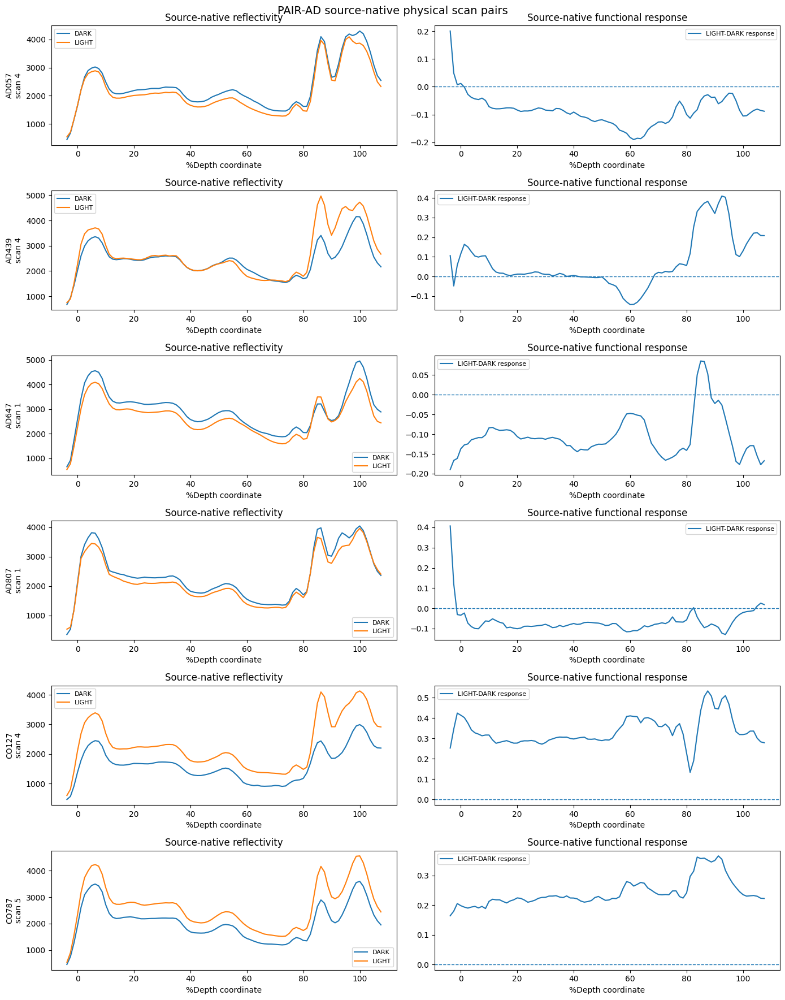


CELL 34 CORRECTED COMPLETE

Correct source-native dataset:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\PAIR_AD_source_native_profiles_CORRECTED.npz

Sample table:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\PAIR_AD_source_native_profile_samples_CORRECTED.csv

Patient table:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\PAIR_AD_source_native_profile_patients_CORRECTED.csv

Old-vs-source pair audit:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\PAIR_AD_original_vs_source_scan_pair_audit.csv

QC figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\PAIR_AD_source_native_profile_QC_CORRECTED.png

IMPORTANT INTERPRETATION
14 old DARK/LIGHT records paired different original source scan IDs.
Therefore previous image-derived functional-response experiments involv

In [45]:
# ==================================================================================================
# CELL 34 — CORRECTED
# PAIR-AD SOURCE-NATIVE DARK/LIGHT RETINAL PROFILE RECONSTRUCTION
#
# CRITICAL CORRECTION
# -------------------
# Do NOT assume:
#
#       source_scan_id = compressed_slice_index + 1
#
# Five acquisitions have excluded source scans:
#
#   AD443 LIGHT : scan 1 excluded
#   AD508 LIGHT : scan 3 excluded
#   CO127 LIGHT : scan 1 excluded
#   CO638 LIGHT : scan 2 excluded
#   CO928 DARK  : scan 4 excluded
#
# Therefore valid DARK/LIGHT pairing must use ORIGINAL SOURCE SCAN ID.
#
# NO CLASSIFIER TRAINING.
# NO DIAGNOSIS-BASED FEATURE SELECTION.
# ==================================================================================================

from pathlib import Path
import hashlib
import warnings
import random
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026
EPS = 1e-6

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)

HIGHRES_PATH = (
    PAIR_AD_DIR /
    "PAIR_AD_highres_256_clean_functional.npz"
)

OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

OUTPUT_NPZ = (
    OUTPUT_DIR /
    "PAIR_AD_source_native_profiles_CORRECTED.npz"
)

SAMPLE_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_source_native_profile_samples_CORRECTED.csv"
)

PATIENT_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_source_native_profile_patients_CORRECTED.csv"
)

GRID_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_source_native_profile_grid_CORRECTED.csv"
)

PAIR_AUDIT_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_original_vs_source_scan_pair_audit.csv"
)

QC_FIGURE = (
    OUTPUT_DIR /
    "PAIR_AD_source_native_profile_QC_CORRECTED.png"
)


print("=" * 120)
print("CELL 34 — CORRECTED SOURCE-NATIVE DARK/LIGHT PROFILE RECONSTRUCTION")
print("=" * 120)


# ==================================================================================================
# 2. LOAD EXISTING HIGH-RES DATA
#
# We use this for:
#   - participant labels
#   - outer/inner folds
#   - auditing old compressed indices
#
# We do NOT assume its 0-based slice_index equals original source scan ID.
# ==================================================================================================

assert HIGHRES_PATH.exists(), HIGHRES_PATH

highres = np.load(
    HIGHRES_PATH,
    allow_pickle=True
)

old_subject = highres[
    "subject"
].astype(str)

old_slice_index = highres[
    "slice_index"
].astype(
    np.int64
)

old_y = highres[
    "y"
].astype(
    np.int64
)

old_outer = highres[
    "outer_fold"
].astype(
    np.int64
)

old_inner1 = highres[
    "inner_fold_outer1"
].astype(
    np.int64
)

old_inner2 = highres[
    "inner_fold_outer2"
].astype(
    np.int64
)

old_inner3 = highres[
    "inner_fold_outer3"
].astype(
    np.int64
)


unique_subjects = sorted(
    np.unique(
        old_subject
    )
)


print(
    "\nExisting paired records:",
    len(
        old_subject
    )
)

print(
    "Participants:",
    len(
        unique_subjects
    )
)


assert len(
    unique_subjects
) == 28


# ==================================================================================================
# 3. PARTICIPANT-LEVEL METADATA LOOKUP
# ==================================================================================================

subject_metadata = {}


for subject_name in unique_subjects:

    idx = np.where(
        old_subject
        ==
        subject_name
    )[0]


    assert len(
        np.unique(
            old_y[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            old_outer[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            old_inner1[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            old_inner2[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            old_inner3[
                idx
            ]
        )
    ) == 1


    subject_metadata[
        subject_name
    ] = {

        "target":
            int(
                old_y[
                    idx[
                        0
                    ]
                ]
            ),

        "outer_fold":
            int(
                old_outer[
                    idx[
                        0
                    ]
                ]
            ),

        "inner_fold_outer1":
            int(
                old_inner1[
                    idx[
                        0
                    ]
                ]
            ),

        "inner_fold_outer2":
            int(
                old_inner2[
                    idx[
                        0
                    ]
                ]
            ),

        "inner_fold_outer3":
            int(
                old_inner3[
                    idx[
                        0
                    ]
                ]
            )
    }


# ==================================================================================================
# 4. LOCATE SUBJECT DIRECTORIES
# ==================================================================================================

print("\n" + "=" * 120)
print("LOCATING PARTICIPANT DIRECTORIES")
print("=" * 120)


all_dirs = [
    p
    for p in DATA_ROOT.rglob("*")
    if p.is_dir()
]


SUBJECT_DIR = {}


for subject_name in unique_subjects:

    matches = [
        p
        for p in all_dirs
        if p.name.upper()
        ==
        subject_name.upper()
    ]


    if len(
        matches
    ) != 1:

        raise RuntimeError(
            f"{subject_name}: expected one directory, "
            f"found {len(matches)}"
        )


    SUBJECT_DIR[
        subject_name
    ] = matches[
        0
    ]


    print(
        f"{subject_name:8s} -> "
        f"{matches[0]}"
    )


# ==================================================================================================
# 5. FIND PROFILE FILES
# ==================================================================================================

PROFILE_FILES = {}
FILE_INFO_FILES = {}


for subject_name in unique_subjects:

    folder = SUBJECT_DIR[
        subject_name
    ]


    txt_files = list(
        folder.glob(
            "*.txt"
        )
    )


    dark_candidates = [
        p
        for p in txt_files
        if "_dark_profiles_" in p.name.lower()
    ]


    light_candidates = [
        p
        for p in txt_files
        if "_light_profiles_" in p.name.lower()
    ]


    file_info_candidates = [
        p
        for p in txt_files
        if p.name.lower()
        ==
        "file info.txt"
    ]


    if len(
        dark_candidates
    ) != 1:

        raise RuntimeError(
            f"{subject_name}: DARK profile count "
            f"{len(dark_candidates)}"
        )


    if len(
        light_candidates
    ) != 1:

        raise RuntimeError(
            f"{subject_name}: LIGHT profile count "
            f"{len(light_candidates)}"
        )


    if len(
        file_info_candidates
    ) != 1:

        raise RuntimeError(
            f"{subject_name}: FILE INFO count "
            f"{len(file_info_candidates)}"
        )


    PROFILE_FILES[
        subject_name
    ] = {

        "dark":
            dark_candidates[
                0
            ],

        "light":
            light_candidates[
                0
            ]
    }


    FILE_INFO_FILES[
        subject_name
    ] = file_info_candidates[
        0
    ]


print("\n" + "=" * 120)
print("SOURCE FILE RESOLUTION")
print("=" * 120)


print(
    "DARK profile files :",
    len(
        PROFILE_FILES
    )
)

print(
    "LIGHT profile files:",
    len(
        PROFILE_FILES
    )
)

print(
    "FILE INFO files    :",
    len(
        FILE_INFO_FILES
    )
)


# ==================================================================================================
# 6. TEXT READER
# ==================================================================================================

def read_text(
    path
):

    encodings = [
        "utf-8",
        "utf-8-sig",
        "utf-16",
        "cp1252",
        "latin-1"
    ]


    for encoding in encodings:

        try:

            with open(
                path,
                "r",
                encoding=encoding
            ) as f:

                return (
                    f.read(),
                    encoding
                )

        except Exception:

            pass


    raise RuntimeError(
        f"Could not decode:\n{path}"
    )


# ==================================================================================================
# 7. PRINT REPRESENTATIVE FILE INFO
# ==================================================================================================

representative_subject = unique_subjects[
    0
]


file_info_text, _ = read_text(
    FILE_INFO_FILES[
        representative_subject
    ]
)


print("\n" + "=" * 120)
print(
    f"COMPLETE FILE INFO — {representative_subject}"
)
print("=" * 120)

print(
    file_info_text
)


# ==================================================================================================
# 8. PROFILE PARSER
# ==================================================================================================

def parse_profile_file(
    path
):

    text, encoding = read_text(
        path
    )


    lines = [
        line.strip()
        for line in text.splitlines()
        if line.strip()
    ]


    header = re.split(
        r"\s+",
        lines[
            0
        ]
    )


    profile_name = header[
        0
    ]


    scan_ids = np.asarray(
        [
            int(
                float(
                    token
                )
            )
            for token in header[
                1:
            ]
        ],
        dtype=np.int64
    )


    named_rows = {}

    coordinate_rows = {}


    for line in lines[
        1:
    ]:

        tokens = re.split(
            r"\s+",
            line
        )


        label = tokens[
            0
        ]


        values = np.asarray(
            [
                float(
                    token
                )
                for token in tokens[
                    1:
                ]
            ],
            dtype=np.float64
        )


        if len(
            values
        ) != len(
            scan_ids
        ):

            raise RuntimeError(
                f"Column mismatch:\n{path}\n"
                f"{line}"
            )


        try:

            coordinate = float(
                label
            )


            coordinate_rows[
                coordinate
            ] = values


        except ValueError:

            named_rows[
                label
            ] = values


    coordinates = np.asarray(
        sorted(
            coordinate_rows.keys()
        ),
        dtype=np.float64
    )


    matrix = np.stack(
        [
            coordinate_rows[
                coordinate
            ]
            for coordinate in coordinates
        ],
        axis=0
    ).T


    return {

        "path":
            path,

        "profile_name":
            profile_name,

        "scan_ids":
            scan_ids,

        "named_rows":
            named_rows,

        "coordinates":
            coordinates,

        "profile_matrix":
            matrix
    }


# ==================================================================================================
# 9. PARSE ALL SUBJECTS
# ==================================================================================================

PARSED = {}


print("\n" + "=" * 120)
print("SOURCE SCAN-ID AUDIT")
print("=" * 120)


for subject_name in unique_subjects:

    dark = parse_profile_file(
        PROFILE_FILES[
            subject_name
        ][
            "dark"
        ]
    )


    light = parse_profile_file(
        PROFILE_FILES[
            subject_name
        ][
            "light"
        ]
    )


    PARSED[
        subject_name
    ] = {
        "dark":
            dark,

        "light":
            light
    }


    common_scans = sorted(
        set(
            dark[
                "scan_ids"
            ].tolist()
        )
        &
        set(
            light[
                "scan_ids"
            ].tolist()
        )
    )


    print(
        f"{subject_name:8s} | "
        f"DARK={dark['scan_ids'].tolist()} | "
        f"LIGHT={light['scan_ids'].tolist()} | "
        f"PAIRED={common_scans}"
    )


# ==================================================================================================
# 10. EXPECTED IRREGULAR ACQUISITIONS
# ==================================================================================================

print("\n" + "=" * 120)
print("IRREGULAR SOURCE-SCAN CHECK")
print("=" * 120)


irregular = []


for subject_name in unique_subjects:

    dark_ids = PARSED[
        subject_name
    ][
        "dark"
    ][
        "scan_ids"
    ].tolist()


    light_ids = PARSED[
        subject_name
    ][
        "light"
    ][
        "scan_ids"
    ].tolist()


    if (
        dark_ids
        !=
        [1, 2, 3, 4, 5]

        or

        light_ids
        !=
        [1, 2, 3, 4, 5]
    ):

        irregular.append(
            subject_name
        )


        print(
            f"{subject_name:8s} | "
            f"DARK={dark_ids} | "
            f"LIGHT={light_ids}"
        )


print(
    "\nIrregular participants:",
    len(
        irregular
    )
)


print(
    irregular
)


# Based directly on archive exclusion information.

expected_irregular = {
    "AD443",
    "AD508",
    "CO127",
    "CO638",
    "CO928"
}


assert set(
    irregular
) == expected_irregular


print(
    "✓ Exactly the five known excluded-scan participants were detected."
)


# ==================================================================================================
# 11. COORDINATE GRID
# ==================================================================================================

all_coordinate_arrays = []


for subject_name in unique_subjects:

    all_coordinate_arrays.extend(
        [
            PARSED[
                subject_name
            ][
                "dark"
            ][
                "coordinates"
            ],

            PARSED[
                subject_name
            ][
                "light"
            ][
                "coordinates"
            ]
        ]
    )


reference_grid = all_coordinate_arrays[
    0
]


for coordinates in all_coordinate_arrays:

    assert coordinates.shape == reference_grid.shape

    assert np.allclose(
        coordinates,
        reference_grid
    )


common_grid = reference_grid.copy()


print("\n" + "=" * 120)
print("SOURCE PROFILE COORDINATE GRID")
print("=" * 120)


print(
    "Coordinate count:",
    len(
        common_grid
    )
)


print(
    "Minimum:",
    common_grid.min()
)


print(
    "Maximum:",
    common_grid.max()
)


print(
    "Spacing:",
    np.unique(
        np.diff(
            common_grid
        )
    )
)


assert len(
    common_grid
) == 90


# ==================================================================================================
# 12. HELPERS
# ==================================================================================================

def scan_position(
    parsed,
    source_scan_id
):

    positions = np.where(
        parsed[
            "scan_ids"
        ]
        ==
        int(
            source_scan_id
        )
    )[0]


    if len(
        positions
    ) != 1:

        raise RuntimeError(
            f"Scan {source_scan_id} not uniquely available in "
            f"{parsed['path']}"
        )


    return int(
        positions[
            0
        ]
    )


def get_profile(
    parsed,
    source_scan_id
):

    position = scan_position(
        parsed,
        source_scan_id
    )


    return parsed[
        "profile_matrix"
    ][
        position
    ].astype(
        np.float64
    )


def get_named(
    parsed,
    name,
    source_scan_id
):

    lookup = {
        key.lower():
            key
        for key in parsed[
            "named_rows"
        ]
    }


    if name.lower() not in lookup:

        return np.nan


    position = scan_position(
        parsed,
        source_scan_id
    )


    return float(
        parsed[
            "named_rows"
        ][
            lookup[
                name.lower()
            ]
        ][
            position
        ]
    )


# ==================================================================================================
# 13. REBUILD TRUE PHYSICAL DARK/LIGHT PAIRS
#
# The pair key is:
#
#       participant + ORIGINAL SOURCE SCAN ID
#
# not compressed array position.
# ==================================================================================================

print("\n" + "=" * 120)
print("BUILDING TRUE SOURCE-SCAN PAIRS")
print("=" * 120)


pair_rows = []


for subject_name in unique_subjects:

    dark = PARSED[
        subject_name
    ][
        "dark"
    ]


    light = PARSED[
        subject_name
    ][
        "light"
    ]


    common_scan_ids = sorted(
        set(
            dark[
                "scan_ids"
            ].tolist()
        )
        &
        set(
            light[
                "scan_ids"
            ].tolist()
        )
    )


    metadata = subject_metadata[
        subject_name
    ]


    for source_scan_id in common_scan_ids:

        pair_rows.append(
            {

                "folder_subject":
                    subject_name,

                "target":
                    metadata[
                        "target"
                    ],

                "outer_fold":
                    metadata[
                        "outer_fold"
                    ],

                "inner_fold_outer1":
                    metadata[
                        "inner_fold_outer1"
                    ],

                "inner_fold_outer2":
                    metadata[
                        "inner_fold_outer2"
                    ],

                "inner_fold_outer3":
                    metadata[
                        "inner_fold_outer3"
                    ],

                "source_scan_id":
                    int(
                        source_scan_id
                    )
            }
        )


pair_df = pd.DataFrame(
    pair_rows
)


pair_df = pair_df.sort_values(
    [
        "folder_subject",
        "source_scan_id"
    ]
).reset_index(
    drop=True
)


print(
    "True source-scan pairs:",
    len(
        pair_df
    )
)


print(
    "Participants:",
    pair_df[
        "folder_subject"
    ].nunique()
)


print(
    "\nPairs per participant:"
)


print(
    pair_df[
        "folder_subject"
    ].value_counts(
    ).sort_index()
)


assert len(
    pair_df
) == 135


assert pair_df[
    "folder_subject"
].nunique() == 28


counts = pair_df[
    "folder_subject"
].value_counts()


assert (
    counts == 4
).sum() == 5


assert (
    counts == 5
).sum() == 23


print(
    "\n✓ Correct total = 135 physical DARK/LIGHT source-scan pairs."
)


# ==================================================================================================
# 14. AUDIT THE OLD COMPRESSED-INDEX PAIRING
#
# This does NOT alter old files.
#
# It tells us where:
#
#       old slice index 0,1,2,3
#
# cannot be interpreted as:
#
#       physical source scan 1,2,3,4
# ==================================================================================================

old_pair_audit = []


for subject_name in unique_subjects:

    old_idx = np.where(
        old_subject
        ==
        subject_name
    )[0]


    old_idx = old_idx[
        np.argsort(
            old_slice_index[
                old_idx
            ]
        )
    ]


    dark_source_ids = PARSED[
        subject_name
    ][
        "dark"
    ][
        "scan_ids"
    ]


    light_source_ids = PARSED[
        subject_name
    ][
        "light"
    ][
        "scan_ids"
    ]


    n_old = len(
        old_idx
    )


    # The original Analyze stacks retain surviving scans in order.
    # Therefore compressed position j maps to source ID listed at
    # position j in each condition-specific profile header.

    assert n_old <= len(
        dark_source_ids
    )


    assert n_old <= len(
        light_source_ids
    )


    for position, idx in enumerate(
        old_idx
    ):

        dark_source = int(
            dark_source_ids[
                position
            ]
        )


        light_source = int(
            light_source_ids[
                position
            ]
        )


        same_physical_scan = (
            dark_source
            ==
            light_source
        )


        old_pair_audit.append(
            {

                "folder_subject":
                    subject_name,

                "old_sample_index":
                    int(
                        idx
                    ),

                "old_slice_index":
                    int(
                        old_slice_index[
                            idx
                        ]
                    ),

                "dark_source_scan_id":
                    dark_source,

                "light_source_scan_id":
                    light_source,

                "same_physical_scan":
                    same_physical_scan
            }
        )


old_pair_audit_df = pd.DataFrame(
    old_pair_audit
)


old_pair_audit_df.to_csv(
    PAIR_AUDIT_CSV,
    index=False
)


print("\n" + "=" * 120)
print("OLD HIGH-RES PAIRING AUDIT")
print("=" * 120)


n_mismatch = int(
    (
        ~old_pair_audit_df[
            "same_physical_scan"
        ]
    ).sum()
)


mismatch_subjects = sorted(
    old_pair_audit_df.loc[
        ~old_pair_audit_df[
            "same_physical_scan"
        ],
        "folder_subject"
    ].unique()
)


print(
    "Old records audited:",
    len(
        old_pair_audit_df
    )
)


print(
    "Physical scan-ID mismatches:",
    n_mismatch
)


print(
    "Participants affected:",
    mismatch_subjects
)


if n_mismatch > 0:

    print(
        "\nMismatched old pairs:"
    )


    print(
        old_pair_audit_df[
            ~old_pair_audit_df[
                "same_physical_scan"
            ]
        ].to_string(
            index=False
        )
    )


# ==================================================================================================
# 15. CONSTRUCT CORRECT SOURCE-NATIVE PROFILE MATRICES
# ==================================================================================================

N = len(
    pair_df
)

M = len(
    common_grid
)


dark_profiles = np.zeros(
    (
        N,
        M
    ),
    dtype=np.float32
)


light_profiles = np.zeros_like(
    dark_profiles
)


raw_difference = np.zeros_like(
    dark_profiles
)


symmetric_response = np.zeros_like(
    dark_profiles
)


log_ratio_response = np.zeros_like(
    dark_profiles
)


sample_rows = []


for i, row in pair_df.iterrows():

    subject_name = row[
        "folder_subject"
    ]


    source_scan_id = int(
        row[
            "source_scan_id"
        ]
    )


    dark_parsed = PARSED[
        subject_name
    ][
        "dark"
    ]


    light_parsed = PARSED[
        subject_name
    ][
        "light"
    ]


    dark_profile = get_profile(
        dark_parsed,
        source_scan_id
    )


    light_profile = get_profile(
        light_parsed,
        source_scan_id
    )


    dark_profiles[
        i
    ] = dark_profile


    light_profiles[
        i
    ] = light_profile


    raw_difference[
        i
    ] = (
        light_profile
        -
        dark_profile
    )


    symmetric_response[
        i
    ] = (

        2.0
        *
        (
            light_profile
            -
            dark_profile
        )

        /

        (
            np.abs(
                light_profile
            )

            +

            np.abs(
                dark_profile
            )

            +

            EPS
        )
    )


    log_ratio_response[
        i
    ] = np.log(

        np.maximum(
            light_profile,
            EPS
        )

        /

        np.maximum(
            dark_profile,
            EPS
        )
    )


    sample_rows.append(
        {

            "sample_index":
                i,

            "folder_subject":
                subject_name,

            "target":
                int(
                    row[
                        "target"
                    ]
                ),

            "outer_fold":
                int(
                    row[
                        "outer_fold"
                    ]
                ),

            "inner_fold_outer1":
                int(
                    row[
                        "inner_fold_outer1"
                    ]
                ),

            "inner_fold_outer2":
                int(
                    row[
                        "inner_fold_outer2"
                    ]
                ),

            "inner_fold_outer3":
                int(
                    row[
                        "inner_fold_outer3"
                    ]
                ),

            "source_scan_id":
                source_scan_id,

            "dark_angle":
                get_named(
                    dark_parsed,
                    "angle",
                    source_scan_id
                ),

            "light_angle":
                get_named(
                    light_parsed,
                    "angle",
                    source_scan_id
                ),

            "dark_whole":
                get_named(
                    dark_parsed,
                    "whole",
                    source_scan_id
                ),

            "light_whole":
                get_named(
                    light_parsed,
                    "whole",
                    source_scan_id
                ),

            "dark_RPEtoOLM":
                get_named(
                    dark_parsed,
                    "RPEtoOLM",
                    source_scan_id
                ),

            "light_RPEtoOLM":
                get_named(
                    light_parsed,
                    "RPEtoOLM",
                    source_scan_id
                ),

            "dark_RNFL":
                get_named(
                    dark_parsed,
                    "RNFL",
                    source_scan_id
                ),

            "light_RNFL":
                get_named(
                    light_parsed,
                    "RNFL",
                    source_scan_id
                ),

            "dark_profile_mean":
                float(
                    dark_profile.mean()
                ),

            "light_profile_mean":
                float(
                    light_profile.mean()
                ),

            "raw_difference_mean":
                float(
                    (
                        light_profile
                        -
                        dark_profile
                    ).mean()
                ),

            "symmetric_response_mean":
                float(
                    symmetric_response[
                        i
                    ].mean()
                ),

            "log_ratio_mean":
                float(
                    log_ratio_response[
                        i
                    ].mean()
                ),

            "dark_light_profile_correlation":
                float(
                    np.corrcoef(
                        dark_profile,
                        light_profile
                    )[
                        0,
                        1
                    ]
                )
        }
    )


sample_df = pd.DataFrame(
    sample_rows
)


# ==================================================================================================
# 16. CORRECT ALIGNMENT AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("CORRECT SOURCE PROFILE PAIRING AUDIT")
print("=" * 120)


print(
    "Correct physical pairs:",
    len(
        sample_df
    )
)


print(
    "Participants:",
    sample_df[
        "folder_subject"
    ].nunique()
)


print(
    "Profile points:",
    M
)


print(
    "\nSource scan IDs used for irregular participants:"
)


for subject_name in sorted(
    expected_irregular
):

    scans = sample_df.loc[
        sample_df[
            "folder_subject"
        ]
        ==
        subject_name,
        "source_scan_id"
    ].tolist()


    print(
        f"{subject_name:8s}: "
        f"{scans}"
    )


print(
    "\nDARK/LIGHT source-profile correlation:"
)


print(
    "Mean   :",
    sample_df[
        "dark_light_profile_correlation"
    ].mean()
)


print(
    "Median :",
    sample_df[
        "dark_light_profile_correlation"
    ].median()
)


print(
    "Minimum:",
    sample_df[
        "dark_light_profile_correlation"
    ].min()
)


print(
    "Maximum:",
    sample_df[
        "dark_light_profile_correlation"
    ].max()
)


# ==================================================================================================
# 17. RESPONSE DISTRIBUTIONS
# ==================================================================================================

print("\n" + "=" * 120)
print("SOURCE-NATIVE FUNCTIONAL PROFILE DISTRIBUTION")
print("=" * 120)


for name, array in [
    (
        "Raw LIGHT-DARK",
        raw_difference
    ),
    (
        "Symmetric response",
        symmetric_response
    ),
    (
        "Log LIGHT/DARK",
        log_ratio_response
    )
]:

    print(
        f"\n{name}"
    )


    print(
        "  Mean   :",
        float(
            array.mean()
        )
    )


    print(
        "  Median :",
        float(
            np.median(
                array
            )
        )
    )


    print(
        "  SD     :",
        float(
            array.std()
        )
    )


    print(
        "  1%     :",
        float(
            np.percentile(
                array,
                1
            )
        )
    )


    print(
        "  99%    :",
        float(
            np.percentile(
                array,
                99
            )
        )
    )


# ==================================================================================================
# 18. ANATOMICAL MEASUREMENT AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("SOURCE-NATIVE ANATOMICAL MEASUREMENT AUDIT")
print("=" * 120)


for variable in [
    "whole",
    "RPEtoOLM",
    "RNFL"
]:

    dark_column = (
        f"dark_{variable}"
    )


    light_column = (
        f"light_{variable}"
    )


    delta = (
        sample_df[
            light_column
        ]
        -
        sample_df[
            dark_column
        ]
    )


    print(
        f"\n{variable}"
    )


    print(
        "  DARK mean:",
        float(
            sample_df[
                dark_column
            ].mean()
        )
    )


    print(
        "  LIGHT mean:",
        float(
            sample_df[
                light_column
            ].mean()
        )
    )


    print(
        "  LIGHT-DARK mean:",
        float(
            delta.mean()
        )
    )


    print(
        "  LIGHT-DARK SD:",
        float(
            delta.std()
        )
    )


# ==================================================================================================
# 19. PATIENT AGGREGATION
# ==================================================================================================

patient_rows = []


for subject_name in unique_subjects:

    sub = sample_df[
        sample_df[
            "folder_subject"
        ]
        ==
        subject_name
    ]


    idx = sub[
        "sample_index"
    ].values.astype(
        int
    )


    patient_rows.append(
        {

            "folder_subject":
                subject_name,

            "target":
                int(
                    sub[
                        "target"
                    ].iloc[
                        0
                    ]
                ),

            "outer_fold":
                int(
                    sub[
                        "outer_fold"
                    ].iloc[
                        0
                    ]
                ),

            "n_source_paired_scans":
                len(
                    sub
                ),

            "source_scan_ids":
                ",".join(
                    map(
                        str,
                        sub[
                            "source_scan_id"
                        ].tolist()
                    )
                ),

            "mean_dark_profile":
                float(
                    dark_profiles[
                        idx
                    ].mean()
                ),

            "mean_light_profile":
                float(
                    light_profiles[
                        idx
                    ].mean()
                ),

            "mean_raw_difference":
                float(
                    raw_difference[
                        idx
                    ].mean()
                ),

            "mean_symmetric_response":
                float(
                    symmetric_response[
                        idx
                    ].mean()
                ),

            "mean_log_ratio":
                float(
                    log_ratio_response[
                        idx
                    ].mean()
                ),

            "mean_whole_dark":
                float(
                    sub[
                        "dark_whole"
                    ].mean()
                ),

            "mean_whole_light":
                float(
                    sub[
                        "light_whole"
                    ].mean()
                ),

            "mean_RPEtoOLM_dark":
                float(
                    sub[
                        "dark_RPEtoOLM"
                    ].mean()
                ),

            "mean_RPEtoOLM_light":
                float(
                    sub[
                        "light_RPEtoOLM"
                    ].mean()
                ),

            "mean_RNFL_dark":
                float(
                    sub[
                        "dark_RNFL"
                    ].mean()
                ),

            "mean_RNFL_light":
                float(
                    sub[
                        "light_RNFL"
                    ].mean()
                )
        }
    )


patient_df = pd.DataFrame(
    patient_rows
)


# ==================================================================================================
# 20. SAVE
# ==================================================================================================

np.savez_compressed(

    OUTPUT_NPZ,

    coordinate=common_grid.astype(
        np.float32
    ),

    dark_profile=dark_profiles,

    light_profile=light_profiles,

    raw_difference=raw_difference,

    symmetric_response=symmetric_response,

    log_ratio_response=log_ratio_response,

    subject=sample_df[
        "folder_subject"
    ].values.astype(str),

    y=sample_df[
        "target"
    ].values.astype(
        np.int64
    ),

    source_scan_id=sample_df[
        "source_scan_id"
    ].values.astype(
        np.int64
    ),

    outer_fold=sample_df[
        "outer_fold"
    ].values.astype(
        np.int64
    ),

    inner_fold_outer1=sample_df[
        "inner_fold_outer1"
    ].values.astype(
        np.int64
    ),

    inner_fold_outer2=sample_df[
        "inner_fold_outer2"
    ].values.astype(
        np.int64
    ),

    inner_fold_outer3=sample_df[
        "inner_fold_outer3"
    ].values.astype(
        np.int64
    ),

    dark_angle=sample_df[
        "dark_angle"
    ].values.astype(
        np.float32
    ),

    light_angle=sample_df[
        "light_angle"
    ].values.astype(
        np.float32
    ),

    dark_whole=sample_df[
        "dark_whole"
    ].values.astype(
        np.float32
    ),

    light_whole=sample_df[
        "light_whole"
    ].values.astype(
        np.float32
    ),

    dark_RPEtoOLM=sample_df[
        "dark_RPEtoOLM"
    ].values.astype(
        np.float32
    ),

    light_RPEtoOLM=sample_df[
        "light_RPEtoOLM"
    ].values.astype(
        np.float32
    ),

    dark_RNFL=sample_df[
        "dark_RNFL"
    ].values.astype(
        np.float32
    ),

    light_RNFL=sample_df[
        "light_RNFL"
    ].values.astype(
        np.float32
    )
)


sample_df.to_csv(
    SAMPLE_CSV,
    index=False
)


patient_df.to_csv(
    PATIENT_CSV,
    index=False
)


pd.DataFrame(
    {
        "profile_coordinate":
            common_grid
    }
).to_csv(
    GRID_CSV,
    index=False
)


# ==================================================================================================
# 21. LABEL-INDEPENDENT QC FIGURE
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING SOURCE-NATIVE PROFILE QC FIGURE")
print("=" * 120)


rng = np.random.default_rng(
    SEED
)


chosen = np.sort(
    rng.choice(
        np.arange(
            len(
                sample_df
            )
        ),
        size=6,
        replace=False
    )
)


fig, axes = plt.subplots(
    6,
    2,
    figsize=(
        14,
        18
    )
)


for row_number, idx in enumerate(
    chosen
):

    axes[
        row_number,
        0
    ].plot(
        common_grid,
        dark_profiles[
            idx
        ],
        label="DARK"
    )


    axes[
        row_number,
        0
    ].plot(
        common_grid,
        light_profiles[
            idx
        ],
        label="LIGHT"
    )


    axes[
        row_number,
        0
    ].set_ylabel(
        f"{sample_df.loc[idx, 'folder_subject']}\n"
        f"scan {sample_df.loc[idx, 'source_scan_id']}"
    )


    axes[
        row_number,
        0
    ].set_xlabel(
        "%Depth coordinate"
    )


    axes[
        row_number,
        0
    ].set_title(
        "Source-native reflectivity"
    )


    axes[
        row_number,
        0
    ].legend(
        fontsize=8
    )


    axes[
        row_number,
        1
    ].plot(
        common_grid,
        symmetric_response[
            idx
        ],
        label="LIGHT-DARK response"
    )


    axes[
        row_number,
        1
    ].axhline(
        0,
        linestyle="--",
        linewidth=1
    )


    axes[
        row_number,
        1
    ].set_xlabel(
        "%Depth coordinate"
    )


    axes[
        row_number,
        1
    ].set_title(
        "Source-native functional response"
    )


    axes[
        row_number,
        1
    ].legend(
        fontsize=8
    )


plt.suptitle(
    "PAIR-AD source-native physical scan pairs",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    QC_FIGURE,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 22. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 34 CORRECTED COMPLETE")
print("=" * 120)


print(
    "\nCorrect source-native dataset:"
)

print(
    OUTPUT_NPZ
)


print(
    "\nSample table:"
)

print(
    SAMPLE_CSV
)


print(
    "\nPatient table:"
)

print(
    PATIENT_CSV
)


print(
    "\nOld-vs-source pair audit:"
)

print(
    PAIR_AUDIT_CSV
)


print(
    "\nQC figure:"
)

print(
    QC_FIGURE
)


print("\n" + "=" * 120)
print("IMPORTANT INTERPRETATION")
print("=" * 120)


if n_mismatch == 0:

    print(
        "No physical source-scan mismatch was detected in the old high-resolution pairing."
    )

else:

    print(
        f"{n_mismatch} old DARK/LIGHT records paired different original source scan IDs."
    )


    print(
        "Therefore previous image-derived functional-response experiments involving these records "
        "must be treated as affected by pairing error."
    )


    print(
        "Do NOT delete the earlier results; retain them as development history."
    )


print(
    "\nNO CLASSIFIER WAS TRAINED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. SOURCE SCAN-ID AUDIT"
)


print(
    "  2. IRREGULAR SOURCE-SCAN CHECK"
)


print(
    "  3. BUILDING TRUE SOURCE-SCAN PAIRS"
)


print(
    "  4. OLD HIGH-RES PAIRING AUDIT"
)


print(
    "  5. CORRECT SOURCE PROFILE PAIRING AUDIT"
)


print(
    "  6. SOURCE-NATIVE FUNCTIONAL PROFILE DISTRIBUTION"
)


print(
    "  7. SOURCE-NATIVE ANATOMICAL MEASUREMENT AUDIT"
)


print(
    "  8. The QC figure"
)

CELL 35 — CORRECTED HIGH-RESOLUTION PHYSICAL DARK/LIGHT PAIRS

Correct physical pairs: 135
Participants: 28

Participant directories: 28

ANALYZE FILE RESOLUTION
Resolved participant × representation × condition files: 112

Example:
RAW DARK: D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\AD057_DARK.hdr
FLAT_NORMED LIGHT: D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\[[[OCT RAW FOR DRYAD]]][2020-01JAN-16]\AD057\_flat-normed_AD057_LIGHT.hdr

STACK LENGTH / SOURCE SCAN-ID AUDIT
Stacks audited: 112
Stack/source-ID count matches: 112 / 112
✓ Every stack position can be mapped to an original source scan ID.

EXTRACTING CORRECT PHYSICAL IMAGE PAIRS
Processed  20/135
Processed  40/135
Processed  60/135
Processed  80/135
Processed 100/135
Processed 120/135
Processed 135/135

CORRECTED PHYSICAL IMAGE-PAIR AUDIT
Samples: 135
Participants: 28

Pairs per participant:
folder_subject
AD057    5
AD362    5
AD387    5
AD414    5
AD439    5
AD443    4
AD459    5
AD508 

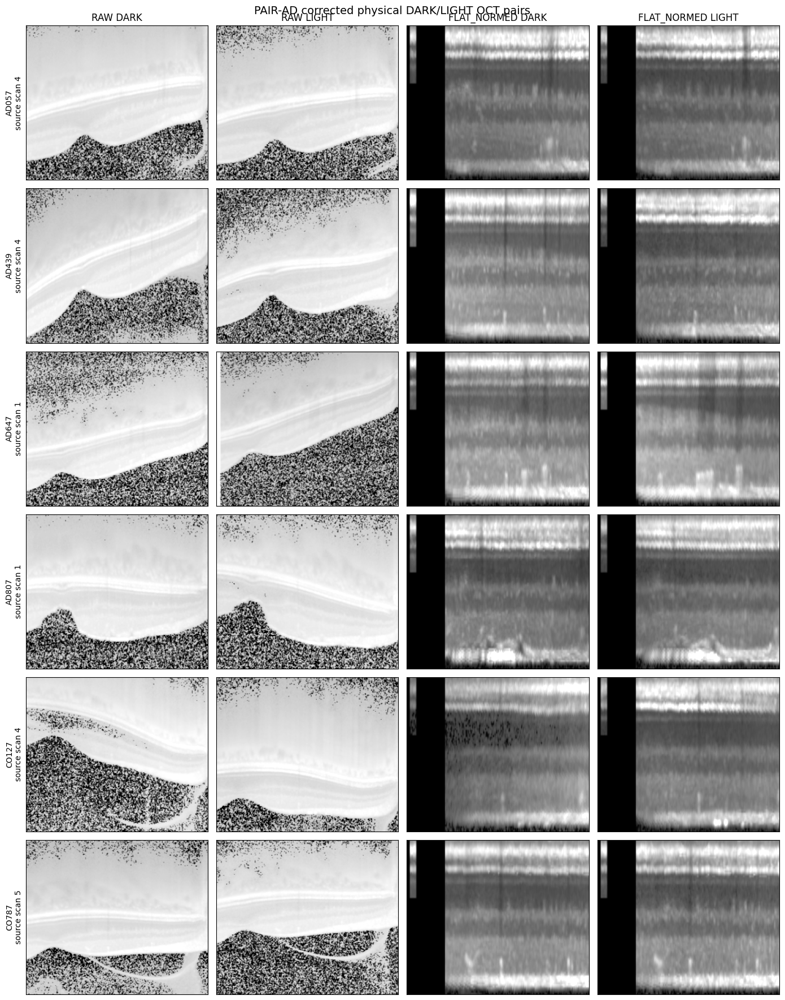


CELL 35 COMPLETE

✓ 135 physically matched DARK/LIGHT image pairs rebuilt.
✓ Original source scan identity preserved.
✓ Nested participant folds preserved.
✓ Old files were NOT overwritten.

NO FUNCTIONAL RESPONSE WAS CREATED YET.
NO MODEL WAS TRAINED.

SEND ME:
  1. STACK LENGTH / SOURCE SCAN-ID AUDIT
  2. CORRECTED PHYSICAL IMAGE-PAIR AUDIT
  3. FLAT_NORMED DARK/LIGHT correlation
  4. RAW DARK/LIGHT correlation
  5. IRREGULAR PARTICIPANT PHYSICAL-SCAN MAPPING
  6. The corrected QC figure


In [46]:
# ==================================================================================================
# CELL 35 — PAIR-AD CORRECTED HIGH-RESOLUTION PHYSICAL DARK/LIGHT PAIRS
#
# NO TRAINING
#
# PURPOSE
# -------
#
# Rebuild RAW and FLAT_NORMED image pairs using ORIGINAL SOURCE SCAN ID.
#
# Critical rule:
#
#       pair key = participant + source_scan_id
#
# NOT:
#
#       pair key = participant + compressed array position
#
#
# Authoritative manifest:
#
#       PAIR_AD_source_native_profiles_CORRECTED.npz
#
#
# OUTPUT
# ------
#
# 135 correctly paired physical OCT scan pairs:
#
#       RAW DARK
#       RAW LIGHT
#       FLAT_NORMED DARK
#       FLAT_NORMED LIGHT
#
# plus:
#
#       source_scan_id
#       condition-specific stack positions
#       nested subject-level fold assignments
#
#
# NO FUNCTIONAL RESPONSE IS CALCULATED YET.
# We first verify that the physical image pairing is correct.
# ==================================================================================================

from pathlib import Path
import struct
import warnings

import numpy as np
import pandas as pd

from PIL import Image

import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

OUTPUT_SIZE = 256

SEED = 2026


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


SOURCE_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles"
)


SOURCE_NPZ = (
    SOURCE_DIR /
    "PAIR_AD_source_native_profiles_CORRECTED.npz"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Corrected_Physical_Pairs"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


OUTPUT_NPZ = (
    OUTPUT_DIR /
    "PAIR_AD_highres_256_physical_pairs_CORRECTED.npz"
)


OUTPUT_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_highres_256_physical_pairs_CORRECTED.csv"
)


QC_FIGURE = (
    OUTPUT_DIR /
    "PAIR_AD_highres_physical_pair_QC.png"
)


print("=" * 120)
print("CELL 35 — CORRECTED HIGH-RESOLUTION PHYSICAL DARK/LIGHT PAIRS")
print("=" * 120)


# ==================================================================================================
# 2. LOAD CORRECT SOURCE-SCAN MANIFEST
# ==================================================================================================

assert SOURCE_NPZ.exists(), SOURCE_NPZ


source = np.load(
    SOURCE_NPZ,
    allow_pickle=True
)


subjects = source[
    "subject"
].astype(str)


targets = source[
    "y"
].astype(
    np.int64
)


source_scan_ids = source[
    "source_scan_id"
].astype(
    np.int64
)


outer_fold = source[
    "outer_fold"
].astype(
    np.int64
)


inner1 = source[
    "inner_fold_outer1"
].astype(
    np.int64
)


inner2 = source[
    "inner_fold_outer2"
].astype(
    np.int64
)


inner3 = source[
    "inner_fold_outer3"
].astype(
    np.int64
)


print(
    "\nCorrect physical pairs:",
    len(
        subjects
    )
)


print(
    "Participants:",
    len(
        np.unique(
            subjects
        )
    )
)


assert len(
    subjects
) == 135


assert len(
    np.unique(
        subjects
    )
) == 28


# ==================================================================================================
# 3. FIND PARTICIPANT FOLDERS
# ==================================================================================================

unique_subjects = sorted(
    np.unique(
        subjects
    )
)


all_directories = [
    p
    for p in DATA_ROOT.rglob("*")
    if p.is_dir()
]


SUBJECT_DIR = {}


for subject_name in unique_subjects:

    matches = [
        p
        for p in all_directories
        if p.name.upper()
        ==
        subject_name.upper()
    ]


    if len(
        matches
    ) != 1:

        raise RuntimeError(
            f"{subject_name}: "
            f"expected exactly one subject directory; "
            f"found {len(matches)}"
        )


    SUBJECT_DIR[
        subject_name
    ] = matches[
        0
    ]


print(
    "\nParticipant directories:",
    len(
        SUBJECT_DIR
    )
)


# ==================================================================================================
# 4. TEXT READER
# ==================================================================================================

def read_text(
    path
):

    for encoding in [
        "utf-8",
        "utf-8-sig",
        "utf-16",
        "cp1252",
        "latin-1"
    ]:

        try:

            with open(
                path,
                "r",
                encoding=encoding
            ) as f:

                return f.read()


        except Exception:

            continue


    raise RuntimeError(
        f"Could not decode:\n{path}"
    )


# ==================================================================================================
# 5. SOURCE PROFILE SCAN-ID READER
#
# We only need the first non-empty line.
# ==================================================================================================

def read_profile_scan_ids(
    path
):

    text = read_text(
        path
    )


    lines = [
        line.strip()
        for line in text.splitlines()
        if line.strip()
    ]


    tokens = lines[
        0
    ].split()


    return np.asarray(
        [
            int(
                float(
                    token
                )
            )

            for token in tokens[
                1:
            ]
        ],
        dtype=np.int64
    )


# ==================================================================================================
# 6. LOCATE PROFILE FILES
# ==================================================================================================

PROFILE_SCAN_IDS = {}


for subject_name in unique_subjects:

    folder = SUBJECT_DIR[
        subject_name
    ]


    txt_files = list(
        folder.glob(
            "*.txt"
        )
    )


    dark_profiles = [
        p
        for p in txt_files
        if "_dark_profiles_" in p.name.lower()
    ]


    light_profiles = [
        p
        for p in txt_files
        if "_light_profiles_" in p.name.lower()
    ]


    if len(
        dark_profiles
    ) != 1:

        raise RuntimeError(
            f"{subject_name}: DARK profile file count "
            f"{len(dark_profiles)}"
        )


    if len(
        light_profiles
    ) != 1:

        raise RuntimeError(
            f"{subject_name}: LIGHT profile file count "
            f"{len(light_profiles)}"
        )


    PROFILE_SCAN_IDS[
        subject_name
    ] = {

        "DARK":
            read_profile_scan_ids(
                dark_profiles[
                    0
                ]
            ),

        "LIGHT":
            read_profile_scan_ids(
                light_profiles[
                    0
                ]
            )
    }


# ==================================================================================================
# 7. FIND ANALYZE HDR BY REPRESENTATION + CONDITION
# ==================================================================================================

def normalize_filename(
    name
):

    return (
        str(
            name
        )
        .lower()
        .replace(
            "_",
            "-"
        )
    )


def find_hdr(
    subject_name,
    representation,
    condition
):

    folder = SUBJECT_DIR[
        subject_name
    ]


    hdr_files = list(
        folder.glob(
            "*.hdr"
        )
    )


    condition_lower = condition.lower()


    candidates = []


    for path in hdr_files:

        name = normalize_filename(
            path.stem
        )


        if condition_lower not in name:

            continue


        if representation == "RAW":

            if "flat" in name:

                continue


            if "marked" in name:

                continue


            candidates.append(
                path
            )


        elif representation == "FLAT_NORMED":

            if (
                "flat-normed" in name
                or
                (
                    "flat" in name
                    and
                    "norm" in name
                )
            ):

                candidates.append(
                    path
                )


        else:

            raise ValueError(
                representation
            )


    if len(
        candidates
    ) != 1:

        print(
            f"\nDEBUG {subject_name} "
            f"{representation} {condition}"
        )


        for path in hdr_files:

            print(
                " ",
                path.name
            )


        raise RuntimeError(
            f"{subject_name} | "
            f"{representation} | "
            f"{condition}: "
            f"expected 1 HDR, found "
            f"{len(candidates)}"
        )


    return candidates[
        0
    ]


# ==================================================================================================
# 8. VERIFY FILE RESOLUTION
# ==================================================================================================

HDR_PATHS = {}


print("\n" + "=" * 120)
print("ANALYZE FILE RESOLUTION")
print("=" * 120)


for subject_name in unique_subjects:

    HDR_PATHS[
        subject_name
    ] = {}


    for representation in [
        "RAW",
        "FLAT_NORMED"
    ]:

        HDR_PATHS[
            subject_name
        ][
            representation
        ] = {}


        for condition in [
            "DARK",
            "LIGHT"
        ]:

            path = find_hdr(
                subject_name,
                representation,
                condition
            )


            HDR_PATHS[
                subject_name
            ][
                representation
            ][
                condition
            ] = path


print(
    "Resolved participant × representation × condition files:",
    28 * 2 * 2
)


print(
    "\nExample:"
)


print(
    "RAW DARK:",
    HDR_PATHS[
        "AD057"
    ][
        "RAW"
    ][
        "DARK"
    ]
)


print(
    "FLAT_NORMED LIGHT:",
    HDR_PATHS[
        "AD057"
    ][
        "FLAT_NORMED"
    ][
        "LIGHT"
    ]
)


# ==================================================================================================
# 9. ANALYZE HEADER PARSER
# ==================================================================================================

ANALYZE_DTYPES = {

    2:
        np.uint8,

    4:
        np.int16,

    8:
        np.int32,

    16:
        np.float32,

    64:
        np.float64
}


HEADER_CACHE = {}


def parse_analyze_header(
    hdr_path
):

    hdr_path = Path(
        hdr_path
    ).resolve()


    key = str(
        hdr_path
    )


    if key in HEADER_CACHE:

        return HEADER_CACHE[
            key
        ]


    with open(
        hdr_path,
        "rb"
    ) as f:

        header = f.read(
            348
        )


    little_size = struct.unpack(
        "<i",
        header[
            0:4
        ]
    )[0]


    big_size = struct.unpack(
        ">i",
        header[
            0:4
        ]
    )[0]


    if little_size == 348:

        endian = "<"


    elif big_size == 348:

        endian = ">"


    else:

        raise RuntimeError(
            f"Invalid Analyze header:\n{hdr_path}"
        )


    dims = struct.unpack(
        endian + "8h",
        header[
            40:56
        ]
    )


    datatype = struct.unpack(
        endian + "h",
        header[
            70:72
        ]
    )[0]


    if datatype not in ANALYZE_DTYPES:

        raise RuntimeError(
            f"Unsupported Analyze datatype "
            f"{datatype}:\n{hdr_path}"
        )


    x = int(
        dims[
            1
        ]
    )


    y = int(
        dims[
            2
        ]
    )


    z = int(
        dims[
            3
        ]
    )


    base_dtype = np.dtype(
        ANALYZE_DTYPES[
            datatype
        ]
    )


    if base_dtype.itemsize > 1:

        dtype = base_dtype.newbyteorder(
            endian
        )


    else:

        dtype = base_dtype


    info = {

        "hdr_path":
            hdr_path,

        "x":
            x,

        "y":
            y,

        "z":
            z,

        "datatype":
            datatype,

        "dtype":
            dtype
    }


    HEADER_CACHE[
        key
    ] = info


    return info


# ==================================================================================================
# 10. IMG RESOLVER
# ==================================================================================================

def resolve_img_path(
    hdr_path
):

    hdr_path = Path(
        hdr_path
    )


    for suffix in [
        ".img",
        ".IMG",
        ".Img"
    ]:

        candidate = hdr_path.with_suffix(
            suffix
        )


        if candidate.exists():

            return candidate.resolve()


    for candidate in hdr_path.parent.iterdir():

        if (
            candidate.is_file()

            and

            candidate.stem.lower()
            ==
            hdr_path.stem.lower()

            and

            candidate.suffix.lower()
            ==
            ".img"
        ):

            return candidate.resolve()


    raise FileNotFoundError(
        f"No IMG for:\n{hdr_path}"
    )


# ==================================================================================================
# 11. READ STACK POSITION
#
# IMPORTANT:
#
# position is compressed stack position:
#
#       0 ... z-1
#
# Physical source scan identity is obtained from the profile header.
# ==================================================================================================

def read_analyze_position(
    hdr_path,
    position
):

    info = parse_analyze_header(
        hdr_path
    )


    position = int(
        position
    )


    if not (
        0
        <=
        position
        <
        info[
            "z"
        ]
    ):

        raise IndexError(
            f"Position {position} outside "
            f"z={info['z']}:\n{hdr_path}"
        )


    img_path = resolve_img_path(
        hdr_path
    )


    volume = np.memmap(
        img_path,
        dtype=info[
            "dtype"
        ],
        mode="r",
        shape=(
            info[
                "z"
            ],
            info[
                "y"
            ],
            info[
                "x"
            ]
        )
    )


    image = np.array(
        volume[
            position
        ],
        dtype=np.float32,
        copy=True
    )


    return (
        image,
        info
    )


# ==================================================================================================
# 12. VERIFY STACK LENGTH AGAINST SOURCE PROFILE HEADERS
# ==================================================================================================

print("\n" + "=" * 120)
print("STACK LENGTH / SOURCE SCAN-ID AUDIT")
print("=" * 120)


stack_audit_rows = []


for subject_name in unique_subjects:

    for representation in [
        "RAW",
        "FLAT_NORMED"
    ]:

        for condition in [
            "DARK",
            "LIGHT"
        ]:

            path = HDR_PATHS[
                subject_name
            ][
                representation
            ][
                condition
            ]


            info = parse_analyze_header(
                path
            )


            source_ids = PROFILE_SCAN_IDS[
                subject_name
            ][
                condition
            ]


            match = (
                info[
                    "z"
                ]
                ==
                len(
                    source_ids
                )
            )


            stack_audit_rows.append(
                {

                    "folder_subject":
                        subject_name,

                    "representation":
                        representation,

                    "condition":
                        condition,

                    "stack_z":
                        info[
                            "z"
                        ],

                    "source_scan_ids":
                        ",".join(
                            map(
                                str,
                                source_ids
                            )
                        ),

                    "source_scan_count":
                        len(
                            source_ids
                        ),

                    "match":
                        match
                }
            )


stack_audit_df = pd.DataFrame(
    stack_audit_rows
)


print(
    "Stacks audited:",
    len(
        stack_audit_df
    )
)


print(
    "Stack/source-ID count matches:",
    int(
        stack_audit_df[
            "match"
        ].sum()
    ),
    "/",
    len(
        stack_audit_df
    )
)


if not stack_audit_df[
    "match"
].all():

    print(
        "\nMismatches:"
    )


    print(
        stack_audit_df[
            ~stack_audit_df[
                "match"
            ]
        ].to_string(
            index=False
        )
    )


    raise RuntimeError(
        "At least one Analyze stack length does not "
        "match its authoritative source scan-ID list."
    )


print(
    "✓ Every stack position can be mapped to an original source scan ID."
)


# ==================================================================================================
# 13. SOURCE SCAN -> CONDITION-SPECIFIC STACK POSITION
# ==================================================================================================

def get_stack_position(
    subject_name,
    condition,
    source_scan_id
):

    scan_ids = PROFILE_SCAN_IDS[
        subject_name
    ][
        condition
    ]


    matches = np.where(
        scan_ids
        ==
        int(
            source_scan_id
        )
    )[0]


    if len(
        matches
    ) != 1:

        raise RuntimeError(
            f"{subject_name} {condition}: "
            f"source scan {source_scan_id} "
            f"not uniquely available. "
            f"Available={scan_ids.tolist()}"
        )


    return int(
        matches[
            0
        ]
    )


# ==================================================================================================
# 14. RESIZE
# ==================================================================================================

try:

    BILINEAR = (
        Image
        .Resampling
        .BILINEAR
    )


except AttributeError:

    BILINEAR = Image.BILINEAR


def resize_float(
    image
):

    image = np.asarray(
        image,
        dtype=np.float32
    )


    pil = Image.fromarray(
        image,
        mode="F"
    )


    pil = pil.resize(
        (
            OUTPUT_SIZE,
            OUTPUT_SIZE
        ),
        resample=BILINEAR
    )


    return np.asarray(
        pil,
        dtype=np.float32
    )


# ==================================================================================================
# 15. RAW FIXED SCALING
#
# FILE INFO explicitly states int16 RAW should be offset by 32768.
# ==================================================================================================

def scale_raw(
    image
):

    image = np.asarray(
        image,
        dtype=np.float32
    )


    output = (
        image
        +
        32768.0
    ) / 65535.0


    return np.clip(
        output,
        0.0,
        1.0
    ).astype(
        np.float32
    )


# ==================================================================================================
# 16. SAFE CORRELATION
# ==================================================================================================

def safe_corr(
    a,
    b
):

    a = np.asarray(
        a,
        dtype=np.float64
    ).ravel()


    b = np.asarray(
        b,
        dtype=np.float64
    ).ravel()


    if (
        np.std(
            a
        )
        <
        1e-12
        or
        np.std(
            b
        )
        <
        1e-12
    ):

        return np.nan


    return float(
        np.corrcoef(
            a,
            b
        )[
            0,
            1
        ]
    )


# ==================================================================================================
# 17. BUILD CORRECT PHYSICAL IMAGE PAIRS
# ==================================================================================================

N = len(
    subjects
)


raw_dark = np.zeros(
    (
        N,
        OUTPUT_SIZE,
        OUTPUT_SIZE
    ),
    dtype=np.float32
)


raw_light = np.zeros_like(
    raw_dark
)


flat_normed_dark = np.zeros_like(
    raw_dark
)


flat_normed_light = np.zeros_like(
    raw_dark
)


metadata_rows = []


print("\n" + "=" * 120)
print("EXTRACTING CORRECT PHYSICAL IMAGE PAIRS")
print("=" * 120)


for i in range(
    N
):

    subject_name = subjects[
        i
    ]


    source_scan_id = int(
        source_scan_ids[
            i
        ]
    )


    dark_position = get_stack_position(
        subject_name,
        "DARK",
        source_scan_id
    )


    light_position = get_stack_position(
        subject_name,
        "LIGHT",
        source_scan_id
    )


    # ----------------------------------------------------------------------------------------------
    # RAW DARK
    # ----------------------------------------------------------------------------------------------

    raw_d_original, raw_d_info = read_analyze_position(
        HDR_PATHS[
            subject_name
        ][
            "RAW"
        ][
            "DARK"
        ],
        dark_position
    )


    # ----------------------------------------------------------------------------------------------
    # RAW LIGHT
    # ----------------------------------------------------------------------------------------------

    raw_l_original, raw_l_info = read_analyze_position(
        HDR_PATHS[
            subject_name
        ][
            "RAW"
        ][
            "LIGHT"
        ],
        light_position
    )


    # ----------------------------------------------------------------------------------------------
    # FLAT_NORMED DARK
    # ----------------------------------------------------------------------------------------------

    fn_d_original, fn_d_info = read_analyze_position(
        HDR_PATHS[
            subject_name
        ][
            "FLAT_NORMED"
        ][
            "DARK"
        ],
        dark_position
    )


    # ----------------------------------------------------------------------------------------------
    # FLAT_NORMED LIGHT
    # ----------------------------------------------------------------------------------------------

    fn_l_original, fn_l_info = read_analyze_position(
        HDR_PATHS[
            subject_name
        ][
            "FLAT_NORMED"
        ][
            "LIGHT"
        ],
        light_position
    )


    # ----------------------------------------------------------------------------------------------
    # Resize
    # ----------------------------------------------------------------------------------------------

    raw_d = scale_raw(
        resize_float(
            raw_d_original
        )
    )


    raw_l = scale_raw(
        resize_float(
            raw_l_original
        )
    )


    fn_d = resize_float(
        fn_d_original
    )


    fn_l = resize_float(
        fn_l_original
    )


    raw_dark[
        i
    ] = raw_d


    raw_light[
        i
    ] = raw_l


    flat_normed_dark[
        i
    ] = fn_d


    flat_normed_light[
        i
    ] = fn_l


    metadata_rows.append(
        {

            "sample_index":
                i,

            "folder_subject":
                subject_name,

            "target":
                int(
                    targets[
                        i
                    ]
                ),

            "source_scan_id":
                source_scan_id,

            "dark_stack_position":
                dark_position,

            "light_stack_position":
                light_position,

            "outer_fold":
                int(
                    outer_fold[
                        i
                    ]
                ),

            "inner_fold_outer1":
                int(
                    inner1[
                        i
                    ]
                ),

            "inner_fold_outer2":
                int(
                    inner2[
                        i
                    ]
                ),

            "inner_fold_outer3":
                int(
                    inner3[
                        i
                    ]
                ),

            "raw_dark_original_height":
                int(
                    raw_d_original.shape[
                        0
                    ]
                ),

            "raw_dark_original_width":
                int(
                    raw_d_original.shape[
                        1
                    ]
                ),

            "raw_light_original_height":
                int(
                    raw_l_original.shape[
                        0
                    ]
                ),

            "raw_light_original_width":
                int(
                    raw_l_original.shape[
                        1
                    ]
                ),

            "flat_normed_dark_height":
                int(
                    fn_d_original.shape[
                        0
                    ]
                ),

            "flat_normed_dark_width":
                int(
                    fn_d_original.shape[
                        1
                    ]
                ),

            "flat_normed_light_height":
                int(
                    fn_l_original.shape[
                        0
                    ]
                ),

            "flat_normed_light_width":
                int(
                    fn_l_original.shape[
                        1
                    ]
                ),

            "raw_dark_light_correlation":
                safe_corr(
                    raw_d,
                    raw_l
                ),

            "flat_normed_dark_light_correlation":
                safe_corr(
                    fn_d,
                    fn_l
                )
        }
    )


    if (
        (i + 1) % 20 == 0
        or
        i + 1 == N
    ):

        print(
            f"Processed "
            f"{i+1:3d}/{N}"
        )


metadata = pd.DataFrame(
    metadata_rows
)


# ==================================================================================================
# 18. FINAL PHYSICAL-PAIR AUDIT
# ==================================================================================================

print("\n" + "=" * 120)
print("CORRECTED PHYSICAL IMAGE-PAIR AUDIT")
print("=" * 120)


print(
    "Samples:",
    len(
        metadata
    )
)


print(
    "Participants:",
    metadata[
        "folder_subject"
    ].nunique()
)


print(
    "\nPairs per participant:"
)


print(
    metadata[
        "folder_subject"
    ].value_counts(
    ).sort_index()
)


print(
    "\nFLAT_NORMED DARK/LIGHT correlation:"
)


print(
    "  Mean   :",
    float(
        metadata[
            "flat_normed_dark_light_correlation"
        ].mean()
    )
)


print(
    "  Median :",
    float(
        metadata[
            "flat_normed_dark_light_correlation"
        ].median()
    )
)


print(
    "  Minimum:",
    float(
        metadata[
            "flat_normed_dark_light_correlation"
        ].min()
    )
)


print(
    "  Maximum:",
    float(
        metadata[
            "flat_normed_dark_light_correlation"
        ].max()
    )
)


print(
    "\nRAW DARK/LIGHT correlation:"
)


print(
    "  Mean   :",
    float(
        metadata[
            "raw_dark_light_correlation"
        ].mean()
    )
)


print(
    "  Median :",
    float(
        metadata[
            "raw_dark_light_correlation"
        ].median()
    )
)


# ==================================================================================================
# 19. IRREGULAR-PARTICIPANT MAPPING
# ==================================================================================================

print("\n" + "=" * 120)
print("IRREGULAR PARTICIPANT PHYSICAL-SCAN MAPPING")
print("=" * 120)


irregular_subjects = [
    "AD443",
    "AD508",
    "CO127",
    "CO638",
    "CO928"
]


print(
    metadata.loc[
        metadata[
            "folder_subject"
        ].isin(
            irregular_subjects
        ),
        [
            "folder_subject",
            "source_scan_id",
            "dark_stack_position",
            "light_stack_position",
            "flat_normed_dark_light_correlation"
        ]
    ].to_string(
        index=False
    )
)


# ==================================================================================================
# 20. SAVE
# ==================================================================================================

np.savez_compressed(

    OUTPUT_NPZ,

    raw_dark=raw_dark,

    raw_light=raw_light,

    flat_normed_dark=flat_normed_dark,

    flat_normed_light=flat_normed_light,

    y=targets,

    subject=subjects,

    source_scan_id=source_scan_ids,

    dark_stack_position=metadata[
        "dark_stack_position"
    ].values.astype(
        np.int64
    ),

    light_stack_position=metadata[
        "light_stack_position"
    ].values.astype(
        np.int64
    ),

    outer_fold=outer_fold,

    inner_fold_outer1=inner1,

    inner_fold_outer2=inner2,

    inner_fold_outer3=inner3
)


metadata.to_csv(
    OUTPUT_CSV,
    index=False
)


print(
    "\nSaved corrected image dataset:"
)

print(
    OUTPUT_NPZ
)


print(
    "\nSaved corrected metadata:"
)

print(
    OUTPUT_CSV
)


# ==================================================================================================
# 21. LABEL-INDEPENDENT QC FIGURE
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING CORRECTED PHYSICAL-PAIR QC FIGURE")
print("=" * 120)


rng = np.random.default_rng(
    SEED
)


chosen = np.sort(
    rng.choice(
        np.arange(
            N
        ),
        size=6,
        replace=False
    )
)


fig, axes = plt.subplots(
    6,
    4,
    figsize=(
        14,
        18
    )
)


titles = [
    "RAW DARK",
    "RAW LIGHT",
    "FLAT_NORMED DARK",
    "FLAT_NORMED LIGHT"
]


for row_idx, sample_idx in enumerate(
    chosen
):

    images = [
        raw_dark[
            sample_idx
        ],
        raw_light[
            sample_idx
        ],
        flat_normed_dark[
            sample_idx
        ],
        flat_normed_light[
            sample_idx
        ]
    ]


    for col_idx, image in enumerate(
        images
    ):

        ax = axes[
            row_idx,
            col_idx
        ]


        low = np.percentile(
            image,
            1
        )


        high = np.percentile(
            image,
            99
        )


        ax.imshow(
            image,
            cmap="gray",
            vmin=low,
            vmax=high,
            aspect="auto"
        )


        if row_idx == 0:

            ax.set_title(
                titles[
                    col_idx
                ]
            )


        if col_idx == 0:

            ax.set_ylabel(
                f"{subjects[sample_idx]}\n"
                f"source scan "
                f"{source_scan_ids[sample_idx]}"
            )


        ax.set_xticks(
            []
        )


        ax.set_yticks(
            []
        )


plt.suptitle(
    "PAIR-AD corrected physical DARK/LIGHT OCT pairs",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    QC_FIGURE,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 22. FINAL VALIDATION
# ==================================================================================================

assert raw_dark.shape == (
    135,
    256,
    256
)


assert raw_light.shape == (
    135,
    256,
    256
)


assert flat_normed_dark.shape == (
    135,
    256,
    256
)


assert flat_normed_light.shape == (
    135,
    256,
    256
)


assert metadata[
    "folder_subject"
].nunique() == 28


counts = metadata[
    "folder_subject"
].value_counts()


assert (
    counts == 5
).sum() == 23


assert (
    counts == 4
).sum() == 5


print("\n" + "=" * 120)
print("CELL 35 COMPLETE")
print("=" * 120)


print(
    "\n✓ 135 physically matched DARK/LIGHT image pairs rebuilt."
)


print(
    "✓ Original source scan identity preserved."
)


print(
    "✓ Nested participant folds preserved."
)


print(
    "✓ Old files were NOT overwritten."
)


print(
    "\nNO FUNCTIONAL RESPONSE WAS CREATED YET."
)


print(
    "NO MODEL WAS TRAINED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. STACK LENGTH / SOURCE SCAN-ID AUDIT"
)


print(
    "  2. CORRECTED PHYSICAL IMAGE-PAIR AUDIT"
)


print(
    "  3. FLAT_NORMED DARK/LIGHT correlation"
)


print(
    "  4. RAW DARK/LIGHT correlation"
)


print(
    "  5. IRREGULAR PARTICIPANT PHYSICAL-SCAN MAPPING"
)


print(
    "  6. The corrected QC figure"
)

CELL 36 — CORRECTED FLAT_NORMED ↔ SOURCE-NATIVE PROFILE CROSS-VALIDATION

Corrected image manifest: (135, 20)
Source DARK profiles: (135, 90)
Source LIGHT profiles: (135, 90)
Source functional response: (135, 90)
Source coordinate: (90,)

PAIR-KEY ALIGNMENT
✓ Corrected image manifest and source-native dataset have identical:
  participant ordering
  physical source scan IDs

ORIGINAL FLAT_NORMED GEOMETRY + ORIENTATION AUDIT
Original FLAT_NORMED dimensions:
height  width
90      2851     135
Name: count, dtype: int64

Detected formal-region widths:
count     135.0
mean     2251.0
std         0.0
min      2251.0
25%      2251.0
50%      2251.0
75%      2251.0
max      2251.0
Name: formal_width, dtype: float64

Median direct orientation correlation : 0.37229065149657653
Median reversed orientation correlation: 0.9999999999999296

Selected GLOBAL vertical orientation: REVERSED
Selection used source-profile agreement only; diagnosis labels were not used.

RECONSTRUCTING IMAGE-DERIVED SOURCE

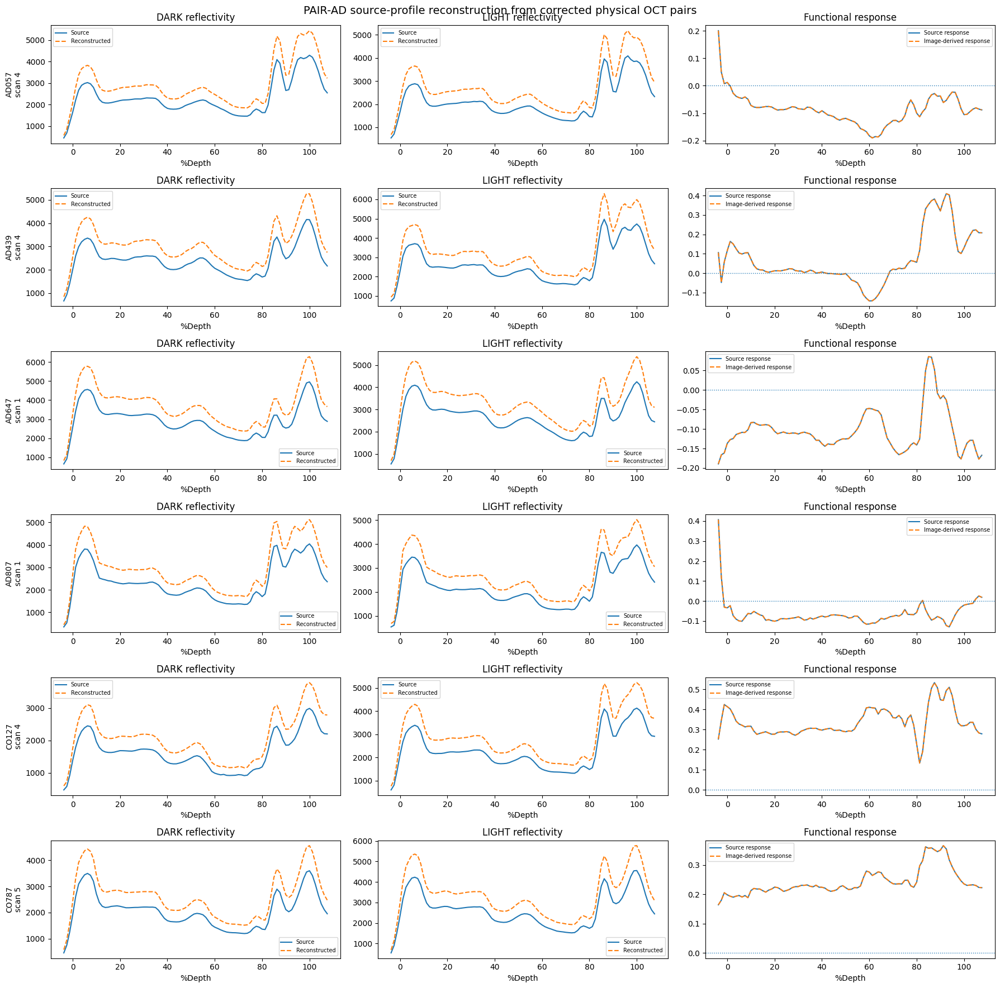

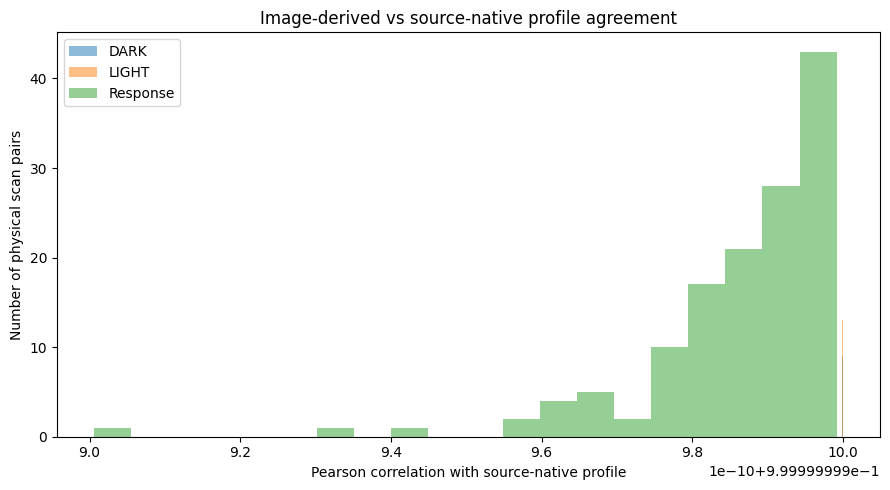


PROFILE VALIDATION DECISION SUMMARY
Median DARK agreement: 0.9999999999999278
Median LIGHT agreement: 0.9999999999999312
Median functional-response agreement: 0.9999999999909183

✓ STRONG SOURCE-PROFILE REPRODUCTION.
The corrected FLAT_NORMED images faithfully reproduce the source-native quantitative profiles.

CELL 36 COMPLETE

Saved audit:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Profile_CrossValidation\PAIR_AD_FLATNORM_source_profile_crossvalidation.csv

Saved cross-validation dataset:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Profile_CrossValidation\PAIR_AD_image_vs_source_profiles.npz

Saved QC figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Profile_CrossValidation\PAIR_AD_image_vs_source_profile_QC.png

Saved correlation figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Profile_CrossValidation\PAIR_AD_profile_correlation_distribution.png

NO CLASSIFIER WAS TRAINED.

SEN

In [47]:
# ==================================================================================================
# CELL 36 — CROSS-VALIDATION OF CORRECTED FLAT_NORMED OCT AGAINST SOURCE-NATIVE PROFILES
#
# NO CLASSIFIER TRAINING
# NO DIAGNOSIS-BASED FEATURE SELECTION
#
# PURPOSE
# -------
#
# The dataset authors state that:
#
#   _dark_profiles_ / _light_profiles_
#
# contain average reflectivities from the formal 500–2750 micron portion
# of the spatially normalized FLAT_NORMED OCT.
#
# We therefore independently reconstruct a vertical reflectivity profile
# from the ORIGINAL FLAT_NORMED Analyze images and compare it against
# the supplied source-native 90-point profile.
#
#
# IMPORTANT
# ---------
#
# - physical source scan IDs from corrected Cell 34 are authoritative
# - no disease labels are used for preprocessing
# - no classifier is trained
# - no image region is chosen according to AD/control performance
#
# ==================================================================================================

from pathlib import Path
import struct
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. CONFIGURATION
# ==================================================================================================

SEED = 2026

ZERO_EPS = 1e-8

COLUMN_SUPPORT_THRESHOLD = 0.50

RESPONSE_EPS = 1e-6


DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


CORRECTED_DIR = (
    PAIR_AD_DIR /
    "Corrected_Physical_Pairs"
)


SOURCE_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles"
)


CORRECTED_META_PATH = (
    CORRECTED_DIR /
    "PAIR_AD_highres_256_physical_pairs_CORRECTED.csv"
)


SOURCE_NPZ_PATH = (
    SOURCE_DIR /
    "PAIR_AD_source_native_profiles_CORRECTED.npz"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Profile_CrossValidation"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


AUDIT_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_FLATNORM_source_profile_crossvalidation.csv"
)


OUTPUT_NPZ = (
    OUTPUT_DIR /
    "PAIR_AD_image_vs_source_profiles.npz"
)


QC_FIGURE = (
    OUTPUT_DIR /
    "PAIR_AD_image_vs_source_profile_QC.png"
)


CORRELATION_FIGURE = (
    OUTPUT_DIR /
    "PAIR_AD_profile_correlation_distribution.png"
)


print("=" * 120)
print("CELL 36 — CORRECTED FLAT_NORMED ↔ SOURCE-NATIVE PROFILE CROSS-VALIDATION")
print("=" * 120)


# ==================================================================================================
# 2. LOAD CORRECTED MANIFEST + SOURCE PROFILES
# ==================================================================================================

assert CORRECTED_META_PATH.exists(), CORRECTED_META_PATH
assert SOURCE_NPZ_PATH.exists(), SOURCE_NPZ_PATH


meta = pd.read_csv(
    CORRECTED_META_PATH
)


source = np.load(
    SOURCE_NPZ_PATH,
    allow_pickle=True
)


source_subject = source[
    "subject"
].astype(str)


source_scan_id = source[
    "source_scan_id"
].astype(
    np.int64
)


source_dark_profile = source[
    "dark_profile"
].astype(
    np.float64
)


source_light_profile = source[
    "light_profile"
].astype(
    np.float64
)


source_response = source[
    "symmetric_response"
].astype(
    np.float64
)


source_coordinate = source[
    "coordinate"
].astype(
    np.float64
)


print(
    "\nCorrected image manifest:",
    meta.shape
)


print(
    "Source DARK profiles:",
    source_dark_profile.shape
)


print(
    "Source LIGHT profiles:",
    source_light_profile.shape
)


print(
    "Source functional response:",
    source_response.shape
)


print(
    "Source coordinate:",
    source_coordinate.shape
)


assert len(
    meta
) == 135


assert source_dark_profile.shape == (
    135,
    90
)


assert source_light_profile.shape == (
    135,
    90
)


assert source_response.shape == (
    135,
    90
)


# ==================================================================================================
# 3. VERIFY EXACT PAIR ORDERING
# ==================================================================================================

print("\n" + "=" * 120)
print("PAIR-KEY ALIGNMENT")
print("=" * 120)


meta_subject = meta[
    "folder_subject"
].astype(str).values


meta_scan = meta[
    "source_scan_id"
].astype(
    np.int64
).values


assert np.array_equal(
    meta_subject,
    source_subject
)


assert np.array_equal(
    meta_scan,
    source_scan_id
)


print(
    "✓ Corrected image manifest and source-native dataset have identical:"
)


print(
    "  participant ordering"
)


print(
    "  physical source scan IDs"
)


# ==================================================================================================
# 4. SUBJECT FOLDERS
# ==================================================================================================

unique_subjects = sorted(
    meta[
        "folder_subject"
    ].unique()
)


all_directories = [
    p
    for p in DATA_ROOT.rglob("*")
    if p.is_dir()
]


SUBJECT_DIR = {}


for subject_name in unique_subjects:

    matches = [
        p
        for p in all_directories
        if p.name.upper()
        ==
        subject_name.upper()
    ]


    if len(
        matches
    ) != 1:

        raise RuntimeError(
            f"{subject_name}: "
            f"expected exactly one directory; "
            f"found {len(matches)}"
        )


    SUBJECT_DIR[
        subject_name
    ] = matches[
        0
    ]


# ==================================================================================================
# 5. FIND FLAT_NORMED HDR
# ==================================================================================================

def find_flat_normed_hdr(
    subject_name,
    condition
):

    folder = SUBJECT_DIR[
        subject_name
    ]


    condition = condition.lower()


    candidates = []


    for path in folder.glob(
        "*.hdr"
    ):

        name = (
            path.stem
            .lower()
            .replace(
                "_",
                "-"
            )
        )


        if condition not in name:

            continue


        if (
            "flat-normed" in name
            or
            (
                "flat" in name
                and
                "norm" in name
            )
        ):

            candidates.append(
                path
            )


    if len(
        candidates
    ) != 1:

        raise RuntimeError(
            f"{subject_name} {condition}: "
            f"expected one FLAT_NORMED HDR; "
            f"found {len(candidates)}"
        )


    return candidates[
        0
    ]


# ==================================================================================================
# 6. ANALYZE PARSER
# ==================================================================================================

ANALYZE_DTYPES = {
    2: np.uint8,
    4: np.int16,
    8: np.int32,
    16: np.float32,
    64: np.float64
}


HEADER_CACHE = {}


def parse_analyze_header(
    hdr_path
):

    hdr_path = Path(
        hdr_path
    ).resolve()


    key = str(
        hdr_path
    )


    if key in HEADER_CACHE:

        return HEADER_CACHE[
            key
        ]


    with open(
        hdr_path,
        "rb"
    ) as f:

        header = f.read(
            348
        )


    little = struct.unpack(
        "<i",
        header[
            :4
        ]
    )[0]


    big = struct.unpack(
        ">i",
        header[
            :4
        ]
    )[0]


    if little == 348:

        endian = "<"


    elif big == 348:

        endian = ">"


    else:

        raise RuntimeError(
            f"Invalid Analyze header:\n{hdr_path}"
        )


    dims = struct.unpack(
        endian + "8h",
        header[
            40:56
        ]
    )


    datatype = struct.unpack(
        endian + "h",
        header[
            70:72
        ]
    )[0]


    if datatype not in ANALYZE_DTYPES:

        raise RuntimeError(
            f"Unsupported datatype {datatype}"
        )


    base_dtype = np.dtype(
        ANALYZE_DTYPES[
            datatype
        ]
    )


    if base_dtype.itemsize > 1:

        dtype = base_dtype.newbyteorder(
            endian
        )


    else:

        dtype = base_dtype


    info = {
        "hdr_path":
            hdr_path,

        "x":
            int(
                dims[
                    1
                ]
            ),

        "y":
            int(
                dims[
                    2
                ]
            ),

        "z":
            int(
                dims[
                    3
                ]
            ),

        "datatype":
            datatype,

        "dtype":
            dtype
    }


    HEADER_CACHE[
        key
    ] = info


    return info


# ==================================================================================================
# 7. IMG RESOLVER
# ==================================================================================================

def resolve_img_path(
    hdr_path
):

    hdr_path = Path(
        hdr_path
    )


    candidate = hdr_path.with_suffix(
        ".img"
    )


    if candidate.exists():

        return candidate.resolve()


    for p in hdr_path.parent.iterdir():

        if (
            p.is_file()
            and
            p.stem.lower()
            ==
            hdr_path.stem.lower()
            and
            p.suffix.lower()
            ==
            ".img"
        ):

            return p.resolve()


    raise FileNotFoundError(
        f"IMG not found:\n{hdr_path}"
    )


# ==================================================================================================
# 8. READ ORIGINAL STACK POSITION
# ==================================================================================================

def read_position(
    hdr_path,
    position
):

    info = parse_analyze_header(
        hdr_path
    )


    position = int(
        position
    )


    if not (
        0
        <=
        position
        <
        info[
            "z"
        ]
    ):

        raise IndexError(
            f"Position {position} invalid for "
            f"z={info['z']}"
        )


    img_path = resolve_img_path(
        hdr_path
    )


    volume = np.memmap(
        img_path,
        dtype=info[
            "dtype"
        ],
        mode="r",
        shape=(
            info[
                "z"
            ],
            info[
                "y"
            ],
            info[
                "x"
            ]
        )
    )


    return np.array(
        volume[
            position
        ],
        dtype=np.float64,
        copy=True
    )


# ==================================================================================================
# 9. LONGEST CONTIGUOUS TRUE REGION
#
# FLAT_NORMED includes:
#
#   - formal 500–2750 micron region
#   - small experimental foveal section
#
# The formal analysis region should form the dominant contiguous
# horizontally supported block.
#
# This detector is entirely label-independent.
# ==================================================================================================

def longest_true_run(
    values
):

    values = np.asarray(
        values,
        dtype=bool
    )


    best_start = None
    best_end = None
    best_length = 0


    start = None


    for i, value in enumerate(
        values
    ):

        if value and start is None:

            start = i


        if (
            not value
            and
            start is not None
        ):

            length = (
                i
                -
                start
            )


            if length > best_length:

                best_start = start
                best_end = i
                best_length = length


            start = None


    if start is not None:

        length = (
            len(
                values
            )
            -
            start
        )


        if length > best_length:

            best_start = start
            best_end = len(
                values
            )
            best_length = length


    if best_start is None:

        raise RuntimeError(
            "Could not identify valid horizontal block."
        )


    return (
        best_start,
        best_end
    )


# ==================================================================================================
# 10. SAFE CORRELATION
# ==================================================================================================

def safe_corr(
    a,
    b
):

    a = np.asarray(
        a,
        dtype=np.float64
    )


    b = np.asarray(
        b,
        dtype=np.float64
    )


    if (
        np.std(
            a
        )
        <
        1e-12
        or
        np.std(
            b
        )
        <
        1e-12
    ):

        return np.nan


    return float(
        np.corrcoef(
            a,
            b
        )[
            0,
            1
        ]
    )


# ==================================================================================================
# 11. INTERPOLATE IMAGE PROFILE TO 90-POINT SOURCE GRID
# ==================================================================================================

def map_to_source_grid(
    profile
):

    profile = np.asarray(
        profile,
        dtype=np.float64
    )


    if len(
        profile
    ) == len(
        source_coordinate
    ):

        return profile.copy()


    source_y = np.linspace(
        source_coordinate.min(),
        source_coordinate.max(),
        len(
            profile
        )
    )


    return np.interp(
        source_coordinate,
        source_y,
        profile
    )


# ==================================================================================================
# 12. FIRST PASS
#
# Determine:
#
#   original dimensions
#   dominant formal horizontal block
#   direct vs vertically reversed orientation
# ==================================================================================================

print("\n" + "=" * 120)
print("ORIGINAL FLAT_NORMED GEOMETRY + ORIENTATION AUDIT")
print("=" * 120)


first_pass = []


for i, row in meta.iterrows():

    subject_name = row[
        "folder_subject"
    ]


    dark_hdr = find_flat_normed_hdr(
        subject_name,
        "DARK"
    )


    light_hdr = find_flat_normed_hdr(
        subject_name,
        "LIGHT"
    )


    dark = read_position(
        dark_hdr,
        row[
            "dark_stack_position"
        ]
    )


    light = read_position(
        light_hdr,
        row[
            "light_stack_position"
        ]
    )


    if dark.shape != light.shape:

        raise RuntimeError(
            f"{subject_name} source scan "
            f"{row['source_scan_id']}: "
            f"DARK/LIGHT FLAT_NORMED shapes differ "
            f"{dark.shape} vs {light.shape}"
        )


    # ----------------------------------------------------------------------------------------------
    # A column is structurally supported if enough rows contain
    # non-zero finite values in BOTH conditions.
    # ----------------------------------------------------------------------------------------------

    joint_valid = (
        np.isfinite(
            dark
        )
        &
        np.isfinite(
            light
        )
        &
        (
            np.abs(
                dark
            )
            >
            ZERO_EPS
        )
        &
        (
            np.abs(
                light
            )
            >
            ZERO_EPS
        )
    )


    column_support = joint_valid.mean(
        axis=0
    )


    supported_columns = (
        column_support
        >=
        COLUMN_SUPPORT_THRESHOLD
    )


    block_start, block_end = (
        longest_true_run(
            supported_columns
        )
    )


    dark_profile = np.mean(
        dark[
            :,
            block_start:block_end
        ],
        axis=1
    )


    light_profile = np.mean(
        light[
            :,
            block_start:block_end
        ],
        axis=1
    )


    dark_profile = map_to_source_grid(
        dark_profile
    )


    light_profile = map_to_source_grid(
        light_profile
    )


    direct_dark = safe_corr(
        dark_profile,
        source_dark_profile[
            i
        ]
    )


    reverse_dark = safe_corr(
        dark_profile[
            ::-1
        ],
        source_dark_profile[
            i
        ]
    )


    direct_light = safe_corr(
        light_profile,
        source_light_profile[
            i
        ]
    )


    reverse_light = safe_corr(
        light_profile[
            ::-1
        ],
        source_light_profile[
            i
        ]
    )


    first_pass.append(
        {
            "height":
                dark.shape[
                    0
                ],

            "width":
                dark.shape[
                    1
                ],

            "formal_start":
                block_start,

            "formal_end":
                block_end,

            "formal_width":
                block_end
                -
                block_start,

            "direct_dark_corr":
                direct_dark,

            "reverse_dark_corr":
                reverse_dark,

            "direct_light_corr":
                direct_light,

            "reverse_light_corr":
                reverse_light
        }
    )


first_pass_df = pd.DataFrame(
    first_pass
)


print(
    "Original FLAT_NORMED dimensions:"
)


print(
    first_pass_df[
        [
            "height",
            "width"
        ]
    ].value_counts()
)


print(
    "\nDetected formal-region widths:"
)


print(
    first_pass_df[
        "formal_width"
    ].describe()
)


direct_values = np.concatenate(
    [
        first_pass_df[
            "direct_dark_corr"
        ].values,

        first_pass_df[
            "direct_light_corr"
        ].values
    ]
)


reverse_values = np.concatenate(
    [
        first_pass_df[
            "reverse_dark_corr"
        ].values,

        first_pass_df[
            "reverse_light_corr"
        ].values
    ]
)


direct_median = np.nanmedian(
    direct_values
)


reverse_median = np.nanmedian(
    reverse_values
)


print(
    "\nMedian direct orientation correlation :",
    direct_median
)


print(
    "Median reversed orientation correlation:",
    reverse_median
)


if direct_median >= reverse_median:

    REVERSE_VERTICAL = False


else:

    REVERSE_VERTICAL = True


print(
    "\nSelected GLOBAL vertical orientation:",
    "REVERSED"
    if REVERSE_VERTICAL
    else "DIRECT"
)


print(
    "Selection used source-profile agreement only; "
    "diagnosis labels were not used."
)


# ==================================================================================================
# 13. FINAL PROFILE RECONSTRUCTION
# ==================================================================================================

print("\n" + "=" * 120)
print("RECONSTRUCTING IMAGE-DERIVED SOURCE PROFILES")
print("=" * 120)


image_dark_profiles = np.zeros(
    (
        135,
        90
    ),
    dtype=np.float32
)


image_light_profiles = np.zeros_like(
    image_dark_profiles
)


image_response_profiles = np.zeros_like(
    image_dark_profiles
)


audit_rows = []


for i, row in meta.iterrows():

    subject_name = row[
        "folder_subject"
    ]


    dark = read_position(
        find_flat_normed_hdr(
            subject_name,
            "DARK"
        ),
        row[
            "dark_stack_position"
        ]
    )


    light = read_position(
        find_flat_normed_hdr(
            subject_name,
            "LIGHT"
        ),
        row[
            "light_stack_position"
        ]
    )


    joint_valid = (
        np.isfinite(
            dark
        )
        &
        np.isfinite(
            light
        )
        &
        (
            np.abs(
                dark
            )
            >
            ZERO_EPS
        )
        &
        (
            np.abs(
                light
            )
            >
            ZERO_EPS
        )
    )


    column_support = joint_valid.mean(
        axis=0
    )


    block_start, block_end = (
        longest_true_run(
            column_support
            >=
            COLUMN_SUPPORT_THRESHOLD
        )
    )


    dark_profile = np.mean(
        dark[
            :,
            block_start:block_end
        ],
        axis=1
    )


    light_profile = np.mean(
        light[
            :,
            block_start:block_end
        ],
        axis=1
    )


    dark_profile = map_to_source_grid(
        dark_profile
    )


    light_profile = map_to_source_grid(
        light_profile
    )


    if REVERSE_VERTICAL:

        dark_profile = dark_profile[
            ::-1
        ]


        light_profile = light_profile[
            ::-1
        ]


    functional_profile = (
        2.0
        *
        (
            light_profile
            -
            dark_profile
        )
        /
        (
            np.abs(
                light_profile
            )
            +
            np.abs(
                dark_profile
            )
            +
            RESPONSE_EPS
        )
    )


    image_dark_profiles[
        i
    ] = dark_profile


    image_light_profiles[
        i
    ] = light_profile


    image_response_profiles[
        i
    ] = functional_profile


    dark_corr = safe_corr(
        dark_profile,
        source_dark_profile[
            i
        ]
    )


    light_corr = safe_corr(
        light_profile,
        source_light_profile[
            i
        ]
    )


    response_corr = safe_corr(
        functional_profile,
        source_response[
            i
        ]
    )


    dark_mae = float(
        np.mean(
            np.abs(
                dark_profile
                -
                source_dark_profile[
                    i
                ]
            )
        )
    )


    light_mae = float(
        np.mean(
            np.abs(
                light_profile
                -
                source_light_profile[
                    i
                ]
            )
        )
    )


    response_mae = float(
        np.mean(
            np.abs(
                functional_profile
                -
                source_response[
                    i
                ]
            )
        )
    )


    audit_rows.append(
        {
            "sample_index":
                i,

            "folder_subject":
                subject_name,

            "target":
                int(
                    row[
                        "target"
                    ]
                ),

            "outer_fold":
                int(
                    row[
                        "outer_fold"
                    ]
                ),

            "source_scan_id":
                int(
                    row[
                        "source_scan_id"
                    ]
                ),

            "original_height":
                int(
                    dark.shape[
                        0
                    ]
                ),

            "original_width":
                int(
                    dark.shape[
                        1
                    ]
                ),

            "formal_region_start":
                int(
                    block_start
                ),

            "formal_region_end":
                int(
                    block_end
                ),

            "formal_region_width":
                int(
                    block_end
                    -
                    block_start
                ),

            "dark_profile_correlation":
                dark_corr,

            "light_profile_correlation":
                light_corr,

            "functional_response_correlation":
                response_corr,

            "dark_profile_MAE":
                dark_mae,

            "light_profile_MAE":
                light_mae,

            "functional_response_MAE":
                response_mae
        }
    )


    if (
        (i + 1) % 20 == 0
        or
        i + 1 == 135
    ):

        print(
            f"Processed {i+1:3d}/135"
        )


audit_df = pd.DataFrame(
    audit_rows
)


# ==================================================================================================
# 14. PROFILE REPRODUCTION RESULTS
# ==================================================================================================

print("\n" + "=" * 120)
print("SOURCE-PROFILE REPRODUCTION RESULTS")
print("=" * 120)


for label, column in [
    (
        "DARK reflectivity",
        "dark_profile_correlation"
    ),
    (
        "LIGHT reflectivity",
        "light_profile_correlation"
    ),
    (
        "Functional response",
        "functional_response_correlation"
    )
]:

    values = audit_df[
        column
    ].values


    print(
        f"\n{label}"
    )


    print(
        "  Mean correlation   :",
        float(
            np.nanmean(
                values
            )
        )
    )


    print(
        "  Median correlation :",
        float(
            np.nanmedian(
                values
            )
        )
    )


    print(
        "  Minimum correlation:",
        float(
            np.nanmin(
                values
            )
        )
    )


    print(
        "  5th percentile     :",
        float(
            np.nanpercentile(
                values,
                5
            )
        )
    )


# ==================================================================================================
# 15. EXACTNESS / MAE
# ==================================================================================================

print("\n" + "=" * 120)
print("SOURCE-PROFILE ABSOLUTE-ERROR AUDIT")
print("=" * 120)


print(
    "Median DARK MAE:",
    float(
        audit_df[
            "dark_profile_MAE"
        ].median()
    )
)


print(
    "Median LIGHT MAE:",
    float(
        audit_df[
            "light_profile_MAE"
        ].median()
    )
)


print(
    "Median response MAE:",
    float(
        audit_df[
            "functional_response_MAE"
        ].median()
    )
)


# ==================================================================================================
# 16. CORRELATION BY IRREGULAR PARTICIPANTS
# ==================================================================================================

print("\n" + "=" * 120)
print("IRREGULAR-PARTICIPANT SOURCE-PROFILE AGREEMENT")
print("=" * 120)


irregular_subjects = [
    "AD443",
    "AD508",
    "CO127",
    "CO638",
    "CO928"
]


print(
    audit_df.loc[
        audit_df[
            "folder_subject"
        ].isin(
            irregular_subjects
        ),
        [
            "folder_subject",
            "source_scan_id",
            "formal_region_width",
            "dark_profile_correlation",
            "light_profile_correlation",
            "functional_response_correlation"
        ]
    ].to_string(
        index=False
    )
)


# ==================================================================================================
# 17. SAVE
# ==================================================================================================

audit_df.to_csv(
    AUDIT_CSV,
    index=False
)


np.savez_compressed(
    OUTPUT_NPZ,

    coordinate=source_coordinate.astype(
        np.float32
    ),

    image_dark_profile=image_dark_profiles,

    image_light_profile=image_light_profiles,

    image_symmetric_response=image_response_profiles,

    source_dark_profile=source_dark_profile.astype(
        np.float32
    ),

    source_light_profile=source_light_profile.astype(
        np.float32
    ),

    source_symmetric_response=source_response.astype(
        np.float32
    ),

    subject=source_subject,

    source_scan_id=source_scan_id,

    y=source[
        "y"
    ].astype(
        np.int64
    ),

    outer_fold=source[
        "outer_fold"
    ].astype(
        np.int64
    ),

    inner_fold_outer1=source[
        "inner_fold_outer1"
    ].astype(
        np.int64
    ),

    inner_fold_outer2=source[
        "inner_fold_outer2"
    ].astype(
        np.int64
    ),

    inner_fold_outer3=source[
        "inner_fold_outer3"
    ].astype(
        np.int64
    )
)


# ==================================================================================================
# 18. LABEL-INDEPENDENT QC FIGURE
# ==================================================================================================

print("\n" + "=" * 120)
print("CREATING PROFILE CROSS-VALIDATION FIGURE")
print("=" * 120)


rng = np.random.default_rng(
    SEED
)


chosen = np.sort(
    rng.choice(
        np.arange(
            135
        ),
        size=6,
        replace=False
    )
)


fig, axes = plt.subplots(
    6,
    3,
    figsize=(
        18,
        18
    )
)


for r, idx in enumerate(
    chosen
):

    # DARK
    axes[
        r,
        0
    ].plot(
        source_coordinate,
        source_dark_profile[
            idx
        ],
        label="Source"
    )


    axes[
        r,
        0
    ].plot(
        source_coordinate,
        image_dark_profiles[
            idx
        ],
        linestyle="--",
        label="Reconstructed"
    )


    axes[
        r,
        0
    ].set_title(
        "DARK reflectivity"
    )


    axes[
        r,
        0
    ].set_ylabel(
        f"{source_subject[idx]}\n"
        f"scan {source_scan_id[idx]}"
    )


    # LIGHT
    axes[
        r,
        1
    ].plot(
        source_coordinate,
        source_light_profile[
            idx
        ],
        label="Source"
    )


    axes[
        r,
        1
    ].plot(
        source_coordinate,
        image_light_profiles[
            idx
        ],
        linestyle="--",
        label="Reconstructed"
    )


    axes[
        r,
        1
    ].set_title(
        "LIGHT reflectivity"
    )


    # RESPONSE
    axes[
        r,
        2
    ].plot(
        source_coordinate,
        source_response[
            idx
        ],
        label="Source response"
    )


    axes[
        r,
        2
    ].plot(
        source_coordinate,
        image_response_profiles[
            idx
        ],
        linestyle="--",
        label="Image-derived response"
    )


    axes[
        r,
        2
    ].axhline(
        0,
        linestyle=":",
        linewidth=1
    )


    axes[
        r,
        2
    ].set_title(
        "Functional response"
    )


    for c in range(
        3
    ):

        axes[
            r,
            c
        ].set_xlabel(
            "%Depth"
        )


        axes[
            r,
            c
        ].legend(
            fontsize=7
        )


plt.suptitle(
    "PAIR-AD source-profile reconstruction from corrected physical OCT pairs",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    QC_FIGURE,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 19. CORRELATION DISTRIBUTION
# ==================================================================================================

plt.figure(
    figsize=(
        9,
        5
    )
)


plt.hist(
    audit_df[
        "dark_profile_correlation"
    ],
    bins=20,
    alpha=0.50,
    label="DARK"
)


plt.hist(
    audit_df[
        "light_profile_correlation"
    ],
    bins=20,
    alpha=0.50,
    label="LIGHT"
)


plt.hist(
    audit_df[
        "functional_response_correlation"
    ],
    bins=20,
    alpha=0.50,
    label="Response"
)


plt.xlabel(
    "Pearson correlation with source-native profile"
)


plt.ylabel(
    "Number of physical scan pairs"
)


plt.title(
    "Image-derived vs source-native profile agreement"
)


plt.legend()


plt.tight_layout()


plt.savefig(
    CORRELATION_FIGURE,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 20. DECISION SUMMARY
# ==================================================================================================

median_dark = float(
    audit_df[
        "dark_profile_correlation"
    ].median()
)


median_light = float(
    audit_df[
        "light_profile_correlation"
    ].median()
)


median_response = float(
    audit_df[
        "functional_response_correlation"
    ].median()
)


print("\n" + "=" * 120)
print("PROFILE VALIDATION DECISION SUMMARY")
print("=" * 120)


print(
    "Median DARK agreement:",
    median_dark
)


print(
    "Median LIGHT agreement:",
    median_light
)


print(
    "Median functional-response agreement:",
    median_response
)


if (
    median_dark >= 0.95
    and
    median_light >= 0.95
    and
    median_response >= 0.90
):

    print(
        "\n✓ STRONG SOURCE-PROFILE REPRODUCTION."
    )


    print(
        "The corrected FLAT_NORMED images faithfully reproduce "
        "the source-native quantitative profiles."
    )


elif (
    median_dark >= 0.90
    and
    median_light >= 0.90
):

    print(
        "\n✓ GOOD structural profile reproduction."
    )


    print(
        "Functional-response reconstruction needs further inspection."
    )


else:

    print(
        "\nWARNING:"
    )


    print(
        "Our automatic formal-region reconstruction does not yet "
        "faithfully reproduce the source profiles."
    )


    print(
        "Do not train a model from reconstructed profiles yet."
    )


# ==================================================================================================
# 21. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 36 COMPLETE")
print("=" * 120)


print(
    "\nSaved audit:"
)

print(
    AUDIT_CSV
)


print(
    "\nSaved cross-validation dataset:"
)

print(
    OUTPUT_NPZ
)


print(
    "\nSaved QC figure:"
)

print(
    QC_FIGURE
)


print(
    "\nSaved correlation figure:"
)

print(
    CORRELATION_FIGURE
)


print(
    "\nNO CLASSIFIER WAS TRAINED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. ORIGINAL FLAT_NORMED GEOMETRY + ORIENTATION AUDIT"
)


print(
    "  2. SOURCE-PROFILE REPRODUCTION RESULTS"
)


print(
    "  3. SOURCE-PROFILE ABSOLUTE-ERROR AUDIT"
)


print(
    "  4. IRREGULAR-PARTICIPANT SOURCE-PROFILE AGREEMENT"
)


print(
    "  5. PROFILE VALIDATION DECISION SUMMARY"
)


print(
    "  6. Both figures"
)

CELL 37 — SOURCE REFLECTIVITY SCALE + FUNCTIONAL-INVARIANCE AUDIT

Source DARK: (135, 90)
Source LIGHT: (135, 90)
Image DARK: (135, 90)
Image LIGHT: (135, 90)

REFLECTIVITY SCALE RESULTS

DARK slope:
  Mean   : 1.2665481989425973
  Median : 1.2665482040727742
  Min    : 1.2665480721317284
  Max    : 1.2665483180669326

LIGHT slope:
  Mean   : 1.266548199884126
  Median : 1.2665481979396387
  Min    : 1.2665480659644273
  Max    : 1.2665484218617946

DARK intercept:
  Median: 1.6950279925788574e-07

LIGHT intercept:
  Median: 1.9114901141247553e-05

Median DARK R²: 0.9999999999998435
Median LIGHT R²: 0.9999999999998539

DARK/LIGHT SCALE CONSISTENCY
Median |LIGHT slope - DARK slope|: 4.960418831245761e-08
Median relative slope difference: 3.916486541367334e-08
95th percentile relative slope difference: 1.1609863146408435e-07

Median DARK image/source ratio: 1.2665482038846987
Median LIGHT image/source ratio: 1.266548205413049

FUNCTIONAL-RESPONSE INVARIANCE
Median response MAE: 1.5655532

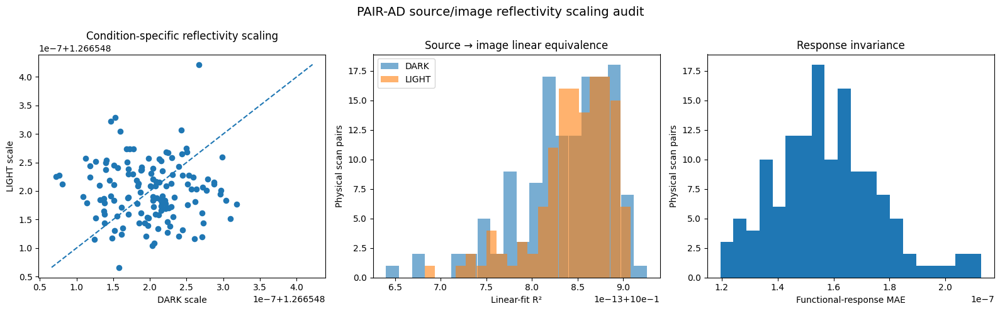


SCALING AUDIT DECISION
✓ SOURCE AND IMAGE REFLECTIVITY PROFILES DIFFER ONLY BY AN ESSENTIALLY COMMON LINEAR SCALE.
✓ The paired symmetric DARK/LIGHT functional response is invariant to this scale.
✓ Source-native functional response can therefore be used as the authoritative 1-D functional representation.

CELL 37 COMPLETE

Saved audit:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Profile_CrossValidation\PAIR_AD_reflectivity_scaling_audit.csv

Saved figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Profile_CrossValidation\PAIR_AD_reflectivity_scaling_audit.png

NO CLASSIFIER WAS TRAINED.

SEND ME:
  1. REFLECTIVITY SCALE RESULTS
  2. DARK/LIGHT SCALE CONSISTENCY
  3. FUNCTIONAL-RESPONSE INVARIANCE
  4. SCALING AUDIT DECISION
  5. The figure


In [48]:
# ==================================================================================================
# CELL 37 — SOURCE REFLECTIVITY SCALE + FUNCTIONAL-INVARIANCE AUDIT
#
# NO CLASSIFIER TRAINING
# NO LABEL-BASED ANALYSIS
#
# PURPOSE
# -------
#
# Cell 36 showed:
#
#   DARK profile correlation       ~ 1.0
#   LIGHT profile correlation      ~ 1.0
#   functional-response correlation~ 1.0
#
# but absolute DARK/LIGHT MAE was ~650 intensity units.
#
# This cell determines whether:
#
#       reconstructed ≈ scale * source + intercept
#
# and whether DARK/LIGHT use effectively the SAME scale.
#
# If so, the symmetric functional response is mathematically
# invariant to that scaling.
#
# ==================================================================================================

from pathlib import Path
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


INPUT_PATH = (
    PAIR_AD_DIR /
    "Profile_CrossValidation" /
    "PAIR_AD_image_vs_source_profiles.npz"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Profile_CrossValidation"
)


AUDIT_CSV = (
    OUTPUT_DIR /
    "PAIR_AD_reflectivity_scaling_audit.csv"
)


FIGURE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_reflectivity_scaling_audit.png"
)


print("=" * 120)
print("CELL 37 — SOURCE REFLECTIVITY SCALE + FUNCTIONAL-INVARIANCE AUDIT")
print("=" * 120)


# ==================================================================================================
# 2. LOAD
# ==================================================================================================

assert INPUT_PATH.exists(), INPUT_PATH


data = np.load(
    INPUT_PATH,
    allow_pickle=True
)


source_dark = data[
    "source_dark_profile"
].astype(
    np.float64
)


source_light = data[
    "source_light_profile"
].astype(
    np.float64
)


image_dark = data[
    "image_dark_profile"
].astype(
    np.float64
)


image_light = data[
    "image_light_profile"
].astype(
    np.float64
)


source_response = data[
    "source_symmetric_response"
].astype(
    np.float64
)


image_response = data[
    "image_symmetric_response"
].astype(
    np.float64
)


subjects = data[
    "subject"
].astype(str)


scan_ids = data[
    "source_scan_id"
].astype(
    np.int64
)


print(
    "\nSource DARK:",
    source_dark.shape
)


print(
    "Source LIGHT:",
    source_light.shape
)


print(
    "Image DARK:",
    image_dark.shape
)


print(
    "Image LIGHT:",
    image_light.shape
)


assert source_dark.shape == (
    135,
    90
)


# ==================================================================================================
# 3. LINEAR FIT
#
# reconstructed = slope * source + intercept
# ==================================================================================================

def linear_fit(
    x,
    y
):

    x = np.asarray(
        x,
        dtype=np.float64
    )


    y = np.asarray(
        y,
        dtype=np.float64
    )


    A = np.column_stack(
        [
            x,
            np.ones_like(
                x
            )
        ]
    )


    slope, intercept = np.linalg.lstsq(
        A,
        y,
        rcond=None
    )[
        0
    ]


    predicted = (
        slope
        *
        x
        +
        intercept
    )


    residual = (
        y
        -
        predicted
    )


    ss_res = np.sum(
        residual ** 2
    )


    ss_tot = np.sum(
        (
            y
            -
            y.mean()
        ) ** 2
    )


    r2 = (
        1.0
        -
        ss_res
        /
        ss_tot
    )


    rmse = np.sqrt(
        np.mean(
            residual ** 2
        )
    )


    relative_rmse = (

        rmse
        /
        max(
            np.mean(
                np.abs(
                    y
                )
            ),
            1e-12
        )
    )


    return (
        float(
            slope
        ),
        float(
            intercept
        ),
        float(
            r2
        ),
        float(
            rmse
        ),
        float(
            relative_rmse
        )
    )


# ==================================================================================================
# 4. SAMPLE-LEVEL SCALE AUDIT
# ==================================================================================================

rows = []


for i in range(
    135
):

    (
        dark_slope,
        dark_intercept,
        dark_r2,
        dark_rmse,
        dark_relative_rmse
    ) = linear_fit(

        source_dark[
            i
        ],

        image_dark[
            i
        ]
    )


    (
        light_slope,
        light_intercept,
        light_r2,
        light_rmse,
        light_relative_rmse
    ) = linear_fit(

        source_light[
            i
        ],

        image_light[
            i
        ]
    )


    # ----------------------------------------------------------------------------------------------
    # Ratio-based scale estimate.
    #
    # Ignore source values extremely close to zero.
    # ----------------------------------------------------------------------------------------------

    valid_dark = (
        np.abs(
            source_dark[
                i
            ]
        )
        >
        1e-8
    )


    valid_light = (
        np.abs(
            source_light[
                i
            ]
        )
        >
        1e-8
    )


    dark_ratio = np.median(

        image_dark[
            i
        ][
            valid_dark
        ]

        /

        source_dark[
            i
        ][
            valid_dark
        ]
    )


    light_ratio = np.median(

        image_light[
            i
        ][
            valid_light
        ]

        /

        source_light[
            i
        ][
            valid_light
        ]
    )


    response_difference = (

        image_response[
            i
        ]

        -

        source_response[
            i
        ]
    )


    rows.append(
        {

            "sample_index":
                i,

            "folder_subject":
                subjects[
                    i
                ],

            "source_scan_id":
                int(
                    scan_ids[
                        i
                    ]
                ),

            "dark_slope":
                dark_slope,

            "light_slope":
                light_slope,

            "dark_intercept":
                dark_intercept,

            "light_intercept":
                light_intercept,

            "dark_R2":
                dark_r2,

            "light_R2":
                light_r2,

            "dark_relative_RMSE":
                dark_relative_rmse,

            "light_relative_RMSE":
                light_relative_rmse,

            "dark_median_ratio":
                float(
                    dark_ratio
                ),

            "light_median_ratio":
                float(
                    light_ratio
                ),

            "slope_difference":
                float(
                    light_slope
                    -
                    dark_slope
                ),

            "absolute_slope_difference":
                float(
                    abs(
                        light_slope
                        -
                        dark_slope
                    )
                ),

            "relative_slope_difference":
                float(
                    abs(
                        light_slope
                        -
                        dark_slope
                    )

                    /

                    max(
                        (
                            abs(
                                dark_slope
                            )
                            +
                            abs(
                                light_slope
                            )
                        )
                        /
                        2.0,

                        1e-12
                    )
                ),

            "response_MAE":
                float(
                    np.mean(
                        np.abs(
                            response_difference
                        )
                    )
                ),

            "response_max_absolute_error":
                float(
                    np.max(
                        np.abs(
                            response_difference
                        )
                    )
                )
        }
    )


audit = pd.DataFrame(
    rows
)


# ==================================================================================================
# 5. GLOBAL RESULTS
# ==================================================================================================

print("\n" + "=" * 120)
print("REFLECTIVITY SCALE RESULTS")
print("=" * 120)


print(
    "\nDARK slope:"
)


print(
    "  Mean   :",
    audit[
        "dark_slope"
    ].mean()
)


print(
    "  Median :",
    audit[
        "dark_slope"
    ].median()
)


print(
    "  Min    :",
    audit[
        "dark_slope"
    ].min()
)


print(
    "  Max    :",
    audit[
        "dark_slope"
    ].max()
)


print(
    "\nLIGHT slope:"
)


print(
    "  Mean   :",
    audit[
        "light_slope"
    ].mean()
)


print(
    "  Median :",
    audit[
        "light_slope"
    ].median()
)


print(
    "  Min    :",
    audit[
        "light_slope"
    ].min()
)


print(
    "  Max    :",
    audit[
        "light_slope"
    ].max()
)


print(
    "\nDARK intercept:"
)


print(
    "  Median:",
    audit[
        "dark_intercept"
    ].median()
)


print(
    "\nLIGHT intercept:"
)


print(
    "  Median:",
    audit[
        "light_intercept"
    ].median()
)


print(
    "\nMedian DARK R²:",
    audit[
        "dark_R2"
    ].median()
)


print(
    "Median LIGHT R²:",
    audit[
        "light_R2"
    ].median()
)


# ==================================================================================================
# 6. DARK-vs-LIGHT SCALE CONSISTENCY
# ==================================================================================================

print("\n" + "=" * 120)
print("DARK/LIGHT SCALE CONSISTENCY")
print("=" * 120)


print(
    "Median |LIGHT slope - DARK slope|:",
    audit[
        "absolute_slope_difference"
    ].median()
)


print(
    "Median relative slope difference:",
    audit[
        "relative_slope_difference"
    ].median()
)


print(
    "95th percentile relative slope difference:",
    audit[
        "relative_slope_difference"
    ].quantile(
        0.95
    )
)


print(
    "\nMedian DARK image/source ratio:",
    audit[
        "dark_median_ratio"
    ].median()
)


print(
    "Median LIGHT image/source ratio:",
    audit[
        "light_median_ratio"
    ].median()
)


# ==================================================================================================
# 7. RESPONSE INVARIANCE
# ==================================================================================================

print("\n" + "=" * 120)
print("FUNCTIONAL-RESPONSE INVARIANCE")
print("=" * 120)


print(
    "Median response MAE:",
    audit[
        "response_MAE"
    ].median()
)


print(
    "Mean response MAE:",
    audit[
        "response_MAE"
    ].mean()
)


print(
    "Maximum sample response MAE:",
    audit[
        "response_MAE"
    ].max()
)


print(
    "Maximum pointwise response error:",
    audit[
        "response_max_absolute_error"
    ].max()
)


# ==================================================================================================
# 8. SAVE
# ==================================================================================================

audit.to_csv(
    AUDIT_CSV,
    index=False
)


# ==================================================================================================
# 9. FIGURE
# ==================================================================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(
        16,
        5
    )
)


# ----------------------------------------------------------------------------------------------
# Slopes
# ----------------------------------------------------------------------------------------------

axes[
    0
].scatter(
    audit[
        "dark_slope"
    ],
    audit[
        "light_slope"
    ],
    s=35
)


minimum = min(
    audit[
        "dark_slope"
    ].min(),
    audit[
        "light_slope"
    ].min()
)


maximum = max(
    audit[
        "dark_slope"
    ].max(),
    audit[
        "light_slope"
    ].max()
)


axes[
    0
].plot(
    [
        minimum,
        maximum
    ],
    [
        minimum,
        maximum
    ],
    linestyle="--"
)


axes[
    0
].set_xlabel(
    "DARK scale"
)


axes[
    0
].set_ylabel(
    "LIGHT scale"
)


axes[
    0
].set_title(
    "Condition-specific reflectivity scaling"
)


# ----------------------------------------------------------------------------------------------
# R²
# ----------------------------------------------------------------------------------------------

axes[
    1
].hist(
    audit[
        "dark_R2"
    ],
    bins=20,
    alpha=0.60,
    label="DARK"
)


axes[
    1
].hist(
    audit[
        "light_R2"
    ],
    bins=20,
    alpha=0.60,
    label="LIGHT"
)


axes[
    1
].set_xlabel(
    "Linear-fit R²"
)


axes[
    1
].set_ylabel(
    "Physical scan pairs"
)


axes[
    1
].set_title(
    "Source → image linear equivalence"
)


axes[
    1
].legend()


# ----------------------------------------------------------------------------------------------
# Functional response error
# ----------------------------------------------------------------------------------------------

axes[
    2
].hist(
    audit[
        "response_MAE"
    ],
    bins=20
)


axes[
    2
].set_xlabel(
    "Functional-response MAE"
)


axes[
    2
].set_ylabel(
    "Physical scan pairs"
)


axes[
    2
].set_title(
    "Response invariance"
)


plt.suptitle(
    "PAIR-AD source/image reflectivity scaling audit",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 10. DECISION
# ==================================================================================================

median_r2 = min(

    audit[
        "dark_R2"
    ].median(),

    audit[
        "light_R2"
    ].median()
)


median_relative_scale_difference = (
    audit[
        "relative_slope_difference"
    ].median()
)


median_response_error = (
    audit[
        "response_MAE"
    ].median()
)


print("\n" + "=" * 120)
print("SCALING AUDIT DECISION")
print("=" * 120)


if (
    median_r2 > 0.9999
    and
    median_relative_scale_difference < 0.001
    and
    median_response_error < 1e-5
):

    print(
        "✓ SOURCE AND IMAGE REFLECTIVITY PROFILES DIFFER ONLY BY "
        "AN ESSENTIALLY COMMON LINEAR SCALE."
    )


    print(
        "✓ The paired symmetric DARK/LIGHT functional response "
        "is invariant to this scale."
    )


    print(
        "✓ Source-native functional response can therefore be used "
        "as the authoritative 1-D functional representation."
    )


else:

    print(
        "The scale relationship requires further inspection "
        "before predictive modeling."
    )


# ==================================================================================================
# 11. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 37 COMPLETE")
print("=" * 120)


print(
    "\nSaved audit:"
)

print(
    AUDIT_CSV
)


print(
    "\nSaved figure:"
)

print(
    FIGURE_PATH
)


print(
    "\nNO CLASSIFIER WAS TRAINED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. REFLECTIVITY SCALE RESULTS"
)


print(
    "  2. DARK/LIGHT SCALE CONSISTENCY"
)


print(
    "  3. FUNCTIONAL-RESPONSE INVARIANCE"
)


print(
    "  4. SCALING AUDIT DECISION"
)


print(
    "  5. The figure"
)

CELL 38 — CORRECTED SOURCE-NATIVE FUNCTIONAL PROFILE PATIENT BASELINE

STATUS: EXPLORATORY MODEL DEVELOPMENT

SOURCE-NATIVE INPUT
Functional response: (135, 90)
Coordinate: (90,)
Physical scan pairs: 135
Participants: 28
Coordinate minimum: -3.75
Coordinate maximum: 107.5
Coordinate spacing: [1.25]

PATIENT FUNCTIONAL REPRESENTATION
Patients: 28
Mean profiles: (28, 90)
SD profiles: (28, 90)

Scans per patient:
n_physical_scans
4     5
5    23
Name: count, dtype: int64

FUNCTIONAL DCT FEATURE MATRIX
Mean-profile DCT: (28, 6)
SD-profile DCT: (28, 6)
Final matrix: (28, 12)
Features per patient: 12

STARTING SOURCE-NATIVE FUNCTIONAL NESTED CV


########################################################################################################################
OUTER FOLD 1
########################################################################################################################
Selected C: 0.03
Best inner mean AUC: 0.7037
Inner OOF AUC: 0.6914
Selected threshold: 0.50
Inne

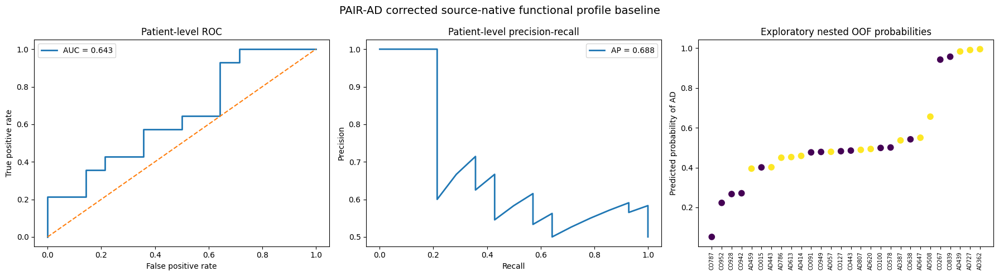

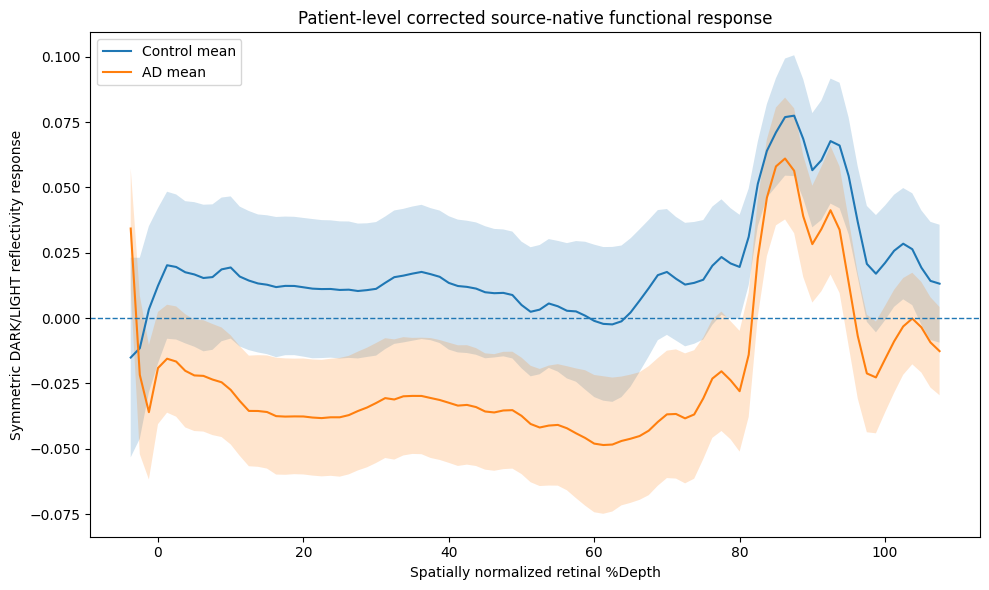


CELL 38 COMPLETE

Feature table:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_DCT_Baseline\PAIR_AD_source_functional_DCT_features.csv

OOF predictions:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_DCT_Baseline\PAIR_AD_source_functional_DCT_OOF.csv

Fold results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_DCT_Baseline\PAIR_AD_source_functional_DCT_outer_results.csv

Summary:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_DCT_Baseline\PAIR_AD_source_functional_DCT_summary.txt

Result figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_DCT_Baseline\PAIR_AD_source_functional_DCT_results.png

Patient functional-profile figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Na

In [49]:
# ==================================================================================================
# CELL 38 — CORRECTED SOURCE-NATIVE FUNCTIONAL PROFILE PATIENT BASELINE
#
# EXPLORATORY MODEL-DEVELOPMENT EXPERIMENT
#
# FUNCTIONAL INPUT
# ----------------
#
# Authoritative corrected source-native symmetric DARK/LIGHT response:
#
#       90 points on the dataset's %Depth coordinate
#
#
# PATIENT REPRESENTATION
# ----------------------
#
# For each patient with 4-5 correctly paired physical scans:
#
#       mean functional profile across scans
#       SD functional profile across scans
#
# Each 90-point profile is compressed with a FIXED DCT-II.
#
# Keep first 6 coefficients:
#
#       mean profile : 6
#       SD profile   : 6
#
# Total:
#
#       12 features / patient
#
#
# CLASSIFIER
# ----------
#
# Train-only StandardScaler
# +
# L2 logistic regression
#
#
# VALIDATION
# ----------
#
# Same participant-exclusive nested CV.
#
# IMPORTANT
# ---------
#
# This cohort has already been inspected during earlier model development.
# Therefore results from this cell are EXPLORATORY, not independent
# confirmatory validation.
#
# ==================================================================================================

from pathlib import Path
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.fft import dct

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    roc_auc_score,
    average_precision_score,
    confusion_matrix,
    roc_curve,
    precision_recall_curve
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. LOCKED CONFIGURATION
# ==================================================================================================

SEED = 2026

N_DCT = 6


C_GRID = [
    0.03,
    0.10,
    0.30,
    1.00,
    3.00
]


THRESHOLD_GRID = np.arange(
    0.10,
    0.91,
    0.01
)


N_BOOTSTRAP = 2000


# ==================================================================================================
# 2. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


SOURCE_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles"
)


INPUT_PATH = (
    SOURCE_DIR /
    "PAIR_AD_source_native_profiles_CORRECTED.npz"
)


RESULT_DIR = (
    SOURCE_DIR /
    "Functional_DCT_Baseline"
)


RESULT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


FEATURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_source_functional_DCT_features.csv"
)


OOF_PATH = (
    RESULT_DIR /
    "PAIR_AD_source_functional_DCT_OOF.csv"
)


FOLD_PATH = (
    RESULT_DIR /
    "PAIR_AD_source_functional_DCT_outer_results.csv"
)


INNER_PATH = (
    RESULT_DIR /
    "PAIR_AD_source_functional_DCT_inner_results.csv"
)


SUMMARY_PATH = (
    RESULT_DIR /
    "PAIR_AD_source_functional_DCT_summary.txt"
)


FIGURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_source_functional_DCT_results.png"
)


PROFILE_FIGURE_PATH = (
    RESULT_DIR /
    "PAIR_AD_source_functional_patient_profiles.png"
)


print("=" * 120)
print("CELL 38 — CORRECTED SOURCE-NATIVE FUNCTIONAL PROFILE PATIENT BASELINE")
print("=" * 120)


print(
    "\nSTATUS: EXPLORATORY MODEL DEVELOPMENT"
)


# ==================================================================================================
# 3. LOAD CORRECT SOURCE-NATIVE DATA
# ==================================================================================================

assert INPUT_PATH.exists(), INPUT_PATH


data = np.load(
    INPUT_PATH,
    allow_pickle=True
)


coordinate = data[
    "coordinate"
].astype(
    np.float64
)


response = data[
    "symmetric_response"
].astype(
    np.float64
)


subjects_scan = data[
    "subject"
].astype(str)


y_scan = data[
    "y"
].astype(
    np.int64
)


source_scan_id = data[
    "source_scan_id"
].astype(
    np.int64
)


outer_scan = data[
    "outer_fold"
].astype(
    np.int64
)


inner1_scan = data[
    "inner_fold_outer1"
].astype(
    np.int64
)


inner2_scan = data[
    "inner_fold_outer2"
].astype(
    np.int64
)


inner3_scan = data[
    "inner_fold_outer3"
].astype(
    np.int64
)


print("\n" + "=" * 120)
print("SOURCE-NATIVE INPUT")
print("=" * 120)


print(
    "Functional response:",
    response.shape
)


print(
    "Coordinate:",
    coordinate.shape
)


print(
    "Physical scan pairs:",
    len(
        subjects_scan
    )
)


print(
    "Participants:",
    len(
        np.unique(
            subjects_scan
        )
    )
)


print(
    "Coordinate minimum:",
    float(
        coordinate.min()
    )
)


print(
    "Coordinate maximum:",
    float(
        coordinate.max()
    )
)


print(
    "Coordinate spacing:",
    np.unique(
        np.round(
            np.diff(
                coordinate
            ),
            8
        )
    )
)


assert response.shape == (
    135,
    90
)


assert len(
    np.unique(
        subjects_scan
    )
) == 28


assert np.isfinite(
    response
).all()


# ==================================================================================================
# 4. BUILD PATIENT-LEVEL FUNCTIONAL PROFILES
#
# No labels are used in aggregation.
# ==================================================================================================

patient_subjects = sorted(
    np.unique(
        subjects_scan
    )
)


patient_mean_profiles = []

patient_sd_profiles = []

patient_rows = []


for subject_name in patient_subjects:

    idx = np.where(
        subjects_scan
        ==
        subject_name
    )[0]


    idx = idx[
        np.argsort(
            source_scan_id[
                idx
            ]
        )
    ]


    assert len(
        np.unique(
            y_scan[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            outer_scan[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            inner1_scan[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            inner2_scan[
                idx
            ]
        )
    ) == 1


    assert len(
        np.unique(
            inner3_scan[
                idx
            ]
        )
    ) == 1


    mean_profile = response[
        idx
    ].mean(
        axis=0
    )


    sd_profile = response[
        idx
    ].std(
        axis=0,
        ddof=0
    )


    patient_mean_profiles.append(
        mean_profile
    )


    patient_sd_profiles.append(
        sd_profile
    )


    patient_rows.append(
        {
            "folder_subject":
                subject_name,

            "target":
                int(
                    y_scan[
                        idx[
                            0
                        ]
                    ]
                ),

            "outer_fold":
                int(
                    outer_scan[
                        idx[
                            0
                        ]
                    ]
                ),

            "inner_fold_outer1":
                int(
                    inner1_scan[
                        idx[
                            0
                        ]
                    ]
                ),

            "inner_fold_outer2":
                int(
                    inner2_scan[
                        idx[
                            0
                        ]
                    ]
                ),

            "inner_fold_outer3":
                int(
                    inner3_scan[
                        idx[
                            0
                        ]
                    ]
                ),

            "n_physical_scans":
                len(
                    idx
                ),

            "source_scan_ids":
                ",".join(
                    map(
                        str,
                        source_scan_id[
                            idx
                        ].tolist()
                    )
                )
        }
    )


patient_mean_profiles = np.asarray(
    patient_mean_profiles,
    dtype=np.float64
)


patient_sd_profiles = np.asarray(
    patient_sd_profiles,
    dtype=np.float64
)


patient_meta = pd.DataFrame(
    patient_rows
)


print("\n" + "=" * 120)
print("PATIENT FUNCTIONAL REPRESENTATION")
print("=" * 120)


print(
    "Patients:",
    len(
        patient_meta
    )
)


print(
    "Mean profiles:",
    patient_mean_profiles.shape
)


print(
    "SD profiles:",
    patient_sd_profiles.shape
)


print(
    "\nScans per patient:"
)


print(
    patient_meta[
        "n_physical_scans"
    ].value_counts(
    ).sort_index()
)


assert patient_mean_profiles.shape == (
    28,
    90
)


assert patient_sd_profiles.shape == (
    28,
    90
)


# ==================================================================================================
# 5. FIXED DCT
#
# Same N_DCT=6 principle as previous DCT baseline.
#
# No feature number is selected using diagnosis.
# ==================================================================================================

mean_dct = dct(
    patient_mean_profiles,
    type=2,
    axis=1,
    norm="ortho"
)[
    :,
    :N_DCT
]


sd_dct = dct(
    patient_sd_profiles,
    type=2,
    axis=1,
    norm="ortho"
)[
    :,
    :N_DCT
]


X = np.concatenate(
    [
        mean_dct,
        sd_dct
    ],
    axis=1
)


y = patient_meta[
    "target"
].values.astype(
    np.int64
)


outer_fold = patient_meta[
    "outer_fold"
].values.astype(
    np.int64
)


subjects = patient_meta[
    "folder_subject"
].values.astype(str)


print("\n" + "=" * 120)
print("FUNCTIONAL DCT FEATURE MATRIX")
print("=" * 120)


print(
    "Mean-profile DCT:",
    mean_dct.shape
)


print(
    "SD-profile DCT:",
    sd_dct.shape
)


print(
    "Final matrix:",
    X.shape
)


print(
    "Features per patient:",
    X.shape[
        1
    ]
)


assert X.shape == (
    28,
    12
)


assert np.isfinite(
    X
).all()


# ==================================================================================================
# 6. SAVE FIXED FEATURE TABLE
# ==================================================================================================

feature_names = []


for i in range(
    N_DCT
):

    feature_names.append(
        f"mean_response_dct{i}"
    )


for i in range(
    N_DCT
):

    feature_names.append(
        f"scan_sd_response_dct{i}"
    )


feature_df = pd.DataFrame(
    X,
    columns=feature_names
)


feature_df.insert(
    0,
    "folder_subject",
    subjects
)


feature_df.insert(
    1,
    "target",
    y
)


feature_df.insert(
    2,
    "outer_fold",
    outer_fold
)


feature_df.to_csv(
    FEATURE_PATH,
    index=False
)


# ==================================================================================================
# 7. METRIC HELPER
# ==================================================================================================

def compute_metrics(
    y_true,
    probability,
    prediction
):

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        prediction,
        labels=[
            0,
            1
        ]
    ).ravel()


    specificity = (
        tn
        /
        max(
            tn + fp,
            1
        )
    )


    return {
        "accuracy":
            accuracy_score(
                y_true,
                prediction
            ),

        "precision":
            precision_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "recall":
            recall_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "specificity":
            specificity,

        "f1":
            f1_score(
                y_true,
                prediction,
                zero_division=0
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                prediction
            ),

        "mcc":
            matthews_corrcoef(
                y_true,
                prediction
            ),

        "auc":
            roc_auc_score(
                y_true,
                probability
            ),

        "average_precision":
            average_precision_score(
                y_true,
                probability
            ),

        "tn":
            int(
                tn
            ),

        "fp":
            int(
                fp
            ),

        "fn":
            int(
                fn
            ),

        "tp":
            int(
                tp
            )
    }


# ==================================================================================================
# 8. MODEL
# ==================================================================================================

def fit_predict(
    X_train,
    y_train,
    X_eval,
    C
):

    scaler = StandardScaler()


    X_train_scaled = scaler.fit_transform(
        X_train
    )


    X_eval_scaled = scaler.transform(
        X_eval
    )


    model = LogisticRegression(
        C=float(
            C
        ),
        penalty="l2",
        solver="liblinear",
        max_iter=5000,
        random_state=SEED
    )


    model.fit(
        X_train_scaled,
        y_train
    )


    return model.predict_proba(
        X_eval_scaled
    )[
        :,
        1
    ]


# ==================================================================================================
# 9. THRESHOLD SELECTION
# ==================================================================================================

def select_threshold(
    y_true,
    probability
):

    best_threshold = 0.50

    best_score = -np.inf


    for threshold in THRESHOLD_GRID:

        prediction = (
            probability
            >=
            threshold
        ).astype(
            int
        )


        score = balanced_accuracy_score(
            y_true,
            prediction
        )


        if score > best_score + 1e-12:

            best_score = score

            best_threshold = float(
                threshold
            )


        elif abs(
            score
            -
            best_score
        ) <= 1e-12:

            # Prefer threshold nearest 0.50.

            if abs(
                threshold
                -
                0.50
            ) < abs(
                best_threshold
                -
                0.50
            ):

                best_threshold = float(
                    threshold
                )


    return (
        best_threshold,
        best_score
    )


# ==================================================================================================
# 10. STORAGE
# ==================================================================================================

oof_probability = np.full(
    len(
        subjects
    ),
    np.nan,
    dtype=np.float64
)


oof_prediction = np.full(
    len(
        subjects
    ),
    -1,
    dtype=np.int64
)


oof_threshold = np.full(
    len(
        subjects
    ),
    np.nan,
    dtype=np.float64
)


fold_records = []

inner_records = []


# ==================================================================================================
# 11. NESTED PARTICIPANT CV
# ==================================================================================================

print("\n" + "=" * 120)
print("STARTING SOURCE-NATIVE FUNCTIONAL NESTED CV")
print("=" * 120)


for outer in [
    1,
    2,
    3
]:

    print("\n")
    print("#" * 120)
    print(
        f"OUTER FOLD {outer}"
    )
    print("#" * 120)


    outer_train = np.where(
        outer_fold
        !=
        outer
    )[0]


    outer_test = np.where(
        outer_fold
        ==
        outer
    )[0]


    inner_assignment = patient_meta[
        f"inner_fold_outer{outer}"
    ].values.astype(
        int
    )


    # ==============================================================================================
    # SELECT C BY INNER MEAN AUC
    # ==============================================================================================

    C_rows = []


    for C in C_GRID:

        fold_aucs = []


        for inner in [
            1,
            2,
            3
        ]:

            inner_train = np.where(
                (
                    outer_fold
                    !=
                    outer
                )
                &
                (
                    inner_assignment
                    !=
                    inner
                )
            )[0]


            inner_val = np.where(
                (
                    outer_fold
                    !=
                    outer
                )
                &
                (
                    inner_assignment
                    ==
                    inner
                )
            )[0]


            probability = fit_predict(
                X[
                    inner_train
                ],
                y[
                    inner_train
                ],
                X[
                    inner_val
                ],
                C
            )


            auc_value = roc_auc_score(
                y[
                    inner_val
                ],
                probability
            )


            fold_aucs.append(
                auc_value
            )


            inner_records.append(
                {
                    "outer_fold":
                        outer,

                    "inner_fold":
                        inner,

                    "C":
                        C,

                    "validation_auc":
                        auc_value
                }
            )


        C_rows.append(
            {
                "C":
                    C,

                "mean_auc":
                    float(
                        np.mean(
                            fold_aucs
                        )
                    ),

                "sd_auc":
                    float(
                        np.std(
                            fold_aucs,
                            ddof=1
                        )
                    )
            }
        )


    C_df = pd.DataFrame(
        C_rows
    )


    best_mean_auc = C_df[
        "mean_auc"
    ].max()


    candidates = C_df[
        np.isclose(
            C_df[
                "mean_auc"
            ],
            best_mean_auc
        )
    ]


    # Stronger regularization if tied.

    best_C = float(
        candidates[
            "C"
        ].min()
    )


    # ==============================================================================================
    # INNER OOF PROBABILITIES WITH SELECTED C
    # ==============================================================================================

    inner_oof_probability = np.full(
        len(
            outer_train
        ),
        np.nan,
        dtype=np.float64
    )


    local_lookup = {
        int(
            global_idx
        ):
            local_idx

        for local_idx, global_idx in enumerate(
            outer_train
        )
    }


    for inner in [
        1,
        2,
        3
    ]:

        inner_train = np.where(
            (
                outer_fold
                !=
                outer
            )
            &
            (
                inner_assignment
                !=
                inner
            )
        )[0]


        inner_val = np.where(
            (
                outer_fold
                !=
                outer
            )
            &
            (
                inner_assignment
                ==
                inner
            )
        )[0]


        probability = fit_predict(
            X[
                inner_train
            ],
            y[
                inner_train
            ],
            X[
                inner_val
            ],
            best_C
        )


        for global_idx, p in zip(
            inner_val,
            probability
        ):

            inner_oof_probability[
                local_lookup[
                    int(
                        global_idx
                    )
                ]
            ] = p


    assert np.isfinite(
        inner_oof_probability
    ).all()


    inner_y = y[
        outer_train
    ]


    inner_oof_auc = roc_auc_score(
        inner_y,
        inner_oof_probability
    )


    selected_threshold, inner_balanced = (
        select_threshold(
            inner_y,
            inner_oof_probability
        )
    )


    print(
        "Selected C:",
        best_C
    )


    print(
        "Best inner mean AUC:",
        f"{best_mean_auc:.4f}"
    )


    print(
        "Inner OOF AUC:",
        f"{inner_oof_auc:.4f}"
    )


    print(
        "Selected threshold:",
        f"{selected_threshold:.2f}"
    )


    print(
        "Inner OOF balanced accuracy:",
        f"{inner_balanced:.4f}"
    )


    # ==============================================================================================
    # OUTER TEST
    # ==============================================================================================

    probability = fit_predict(
        X[
            outer_train
        ],
        y[
            outer_train
        ],
        X[
            outer_test
        ],
        best_C
    )


    prediction = (
        probability
        >=
        selected_threshold
    ).astype(
        int
    )


    oof_probability[
        outer_test
    ] = probability


    oof_prediction[
        outer_test
    ] = prediction


    oof_threshold[
        outer_test
    ] = selected_threshold


    metrics = compute_metrics(
        y[
            outer_test
        ],
        probability,
        prediction
    )


    fold_records.append(
        {
            "outer_fold":
                outer,

            "selected_C":
                best_C,

            "selected_threshold":
                selected_threshold,

            "inner_mean_auc":
                best_mean_auc,

            "inner_oof_auc":
                inner_oof_auc,

            **metrics
        }
    )


    print("\n" + "-" * 100)
    print(
        f"OUTER FOLD {outer} RESULT"
    )
    print("-" * 100)


    for metric_name in [
        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc",
        "average_precision"
    ]:

        print(
            f"{metric_name:22s}: "
            f"{metrics[metric_name]:.4f}"
        )


    print(
        "\nConfusion matrix:"
    )


    print(
        np.array(
            [
                [
                    metrics[
                        "tn"
                    ],
                    metrics[
                        "fp"
                    ]
                ],
                [
                    metrics[
                        "fn"
                    ],
                    metrics[
                        "tp"
                    ]
                ]
            ]
        )
    )


# ==================================================================================================
# 12. FINAL OOF RESULT
# ==================================================================================================

assert np.isfinite(
    oof_probability
).all()


assert (
    oof_prediction
    >=
    0
).all()


overall = compute_metrics(
    y,
    oof_probability,
    oof_prediction
)


print("\n" + "=" * 120)
print("FINAL SOURCE-NATIVE FUNCTIONAL PATIENT OOF PERFORMANCE")
print("=" * 120)


for metric_name in [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "average_precision"
]:

    print(
        f"{metric_name:22s}: "
        f"{overall[metric_name]:.4f}"
    )


print(
    "\nConfusion matrix:"
)


print(
    np.array(
        [
            [
                overall[
                    "tn"
                ],
                overall[
                    "fp"
                ]
            ],
            [
                overall[
                    "fn"
                ],
                overall[
                    "tp"
                ]
            ]
        ]
    )
)


# ==================================================================================================
# 13. FOLD SUMMARY
# ==================================================================================================

fold_df = pd.DataFrame(
    fold_records
)


print("\n" + "=" * 120)
print("OUTER-FOLD MEAN ± SD")
print("=" * 120)


for metric_name in [
    "accuracy",
    "precision",
    "recall",
    "specificity",
    "f1",
    "balanced_accuracy",
    "mcc",
    "auc",
    "average_precision"
]:

    print(
        f"{metric_name:22s}: "
        f"{fold_df[metric_name].mean():.4f} "
        f"± "
        f"{fold_df[metric_name].std(ddof=1):.4f}"
    )


# ==================================================================================================
# 14. STRATIFIED PATIENT BOOTSTRAP
#
# Descriptive uncertainty interval.
# ==================================================================================================

rng = np.random.default_rng(
    SEED
)


control_idx = np.where(
    y == 0
)[0]


ad_idx = np.where(
    y == 1
)[0]


auc_boot = []

accuracy_boot = []

balanced_boot = []


for _ in range(
    N_BOOTSTRAP
):

    sampled = np.concatenate(
        [
            rng.choice(
                control_idx,
                size=len(
                    control_idx
                ),
                replace=True
            ),

            rng.choice(
                ad_idx,
                size=len(
                    ad_idx
                ),
                replace=True
            )
        ]
    )


    auc_boot.append(
        roc_auc_score(
            y[
                sampled
            ],
            oof_probability[
                sampled
            ]
        )
    )


    accuracy_boot.append(
        accuracy_score(
            y[
                sampled
            ],
            oof_prediction[
                sampled
            ]
        )
    )


    balanced_boot.append(
        balanced_accuracy_score(
            y[
                sampled
            ],
            oof_prediction[
                sampled
            ]
        )
    )


auc_ci = np.percentile(
    auc_boot,
    [
        2.5,
        97.5
    ]
)


accuracy_ci = np.percentile(
    accuracy_boot,
    [
        2.5,
        97.5
    ]
)


balanced_ci = np.percentile(
    balanced_boot,
    [
        2.5,
        97.5
    ]
)


print("\n" + "=" * 120)
print("EXPLORATORY STRATIFIED PATIENT BOOTSTRAP 95% INTERVALS")
print("=" * 120)


print(
    f"AUC: "
    f"{overall['auc']:.4f} "
    f"[{auc_ci[0]:.4f} - {auc_ci[1]:.4f}]"
)


print(
    f"Accuracy: "
    f"{overall['accuracy']:.4f} "
    f"[{accuracy_ci[0]:.4f} - {accuracy_ci[1]:.4f}]"
)


print(
    f"Balanced accuracy: "
    f"{overall['balanced_accuracy']:.4f} "
    f"[{balanced_ci[0]:.4f} - {balanced_ci[1]:.4f}]"
)


# ==================================================================================================
# 15. OOF TABLE
# ==================================================================================================

oof_df = pd.DataFrame(
    {
        "folder_subject":
            subjects,

        "target":
            y,

        "outer_fold":
            outer_fold,

        "probability_AD":
            oof_probability,

        "threshold":
            oof_threshold,

        "prediction":
            oof_prediction,

        "n_physical_scans":
            patient_meta[
                "n_physical_scans"
            ].values,

        "source_scan_ids":
            patient_meta[
                "source_scan_ids"
            ].values
    }
)


print("\n" + "=" * 120)
print("SOURCE-NATIVE FUNCTIONAL OOF PATIENT PREDICTIONS")
print("=" * 120)


print(
    oof_df
    .sort_values(
        "probability_AD"
    )
    .to_string(
        index=False
    )
)


# ==================================================================================================
# 16. RESULT FIGURE
# ==================================================================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(
        18,
        5
    )
)


# --------------------------------------------------------------------------------------------------
# ROC
# --------------------------------------------------------------------------------------------------

fpr, tpr, _ = roc_curve(
    y,
    oof_probability
)


axes[
    0
].plot(
    fpr,
    tpr,
    linewidth=2,
    label=(
        f"AUC = "
        f"{overall['auc']:.3f}"
    )
)


axes[
    0
].plot(
    [
        0,
        1
    ],
    [
        0,
        1
    ],
    linestyle="--"
)


axes[
    0
].set_xlabel(
    "False positive rate"
)


axes[
    0
].set_ylabel(
    "True positive rate"
)


axes[
    0
].set_title(
    "Patient-level ROC"
)


axes[
    0
].legend()


# --------------------------------------------------------------------------------------------------
# PR
# --------------------------------------------------------------------------------------------------

precision_curve, recall_curve, _ = (
    precision_recall_curve(
        y,
        oof_probability
    )
)


axes[
    1
].plot(
    recall_curve,
    precision_curve,
    linewidth=2,
    label=(
        f"AP = "
        f"{overall['average_precision']:.3f}"
    )
)


axes[
    1
].set_xlabel(
    "Recall"
)


axes[
    1
].set_ylabel(
    "Precision"
)


axes[
    1
].set_title(
    "Patient-level precision-recall"
)


axes[
    1
].legend()


# --------------------------------------------------------------------------------------------------
# OOF probabilities
# --------------------------------------------------------------------------------------------------

plot_df = oof_df.sort_values(
    "probability_AD"
).reset_index(
    drop=True
)


positions = np.arange(
    len(
        plot_df
    )
)


axes[
    2
].scatter(
    positions,
    plot_df[
        "probability_AD"
    ],
    c=plot_df[
        "target"
    ],
    s=55
)


axes[
    2
].set_xticks(
    positions
)


axes[
    2
].set_xticklabels(
    plot_df[
        "folder_subject"
    ],
    rotation=90,
    fontsize=7
)


axes[
    2
].set_ylabel(
    "Predicted probability of AD"
)


axes[
    2
].set_title(
    "Exploratory nested OOF probabilities"
)


plt.suptitle(
    "PAIR-AD corrected source-native functional profile baseline",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 17. DESCRIPTIVE PATIENT PROFILE FIGURE
#
# This is NOT used for feature selection.
# It is created after feature construction has already been locked.
# ==================================================================================================

plt.figure(
    figsize=(
        10,
        6
    )
)


control_profiles = patient_mean_profiles[
    y == 0
]


ad_profiles = patient_mean_profiles[
    y == 1
]


control_mean = control_profiles.mean(
    axis=0
)


control_sem = (
    control_profiles.std(
        axis=0,
        ddof=1
    )
    /
    np.sqrt(
        len(
            control_profiles
        )
    )
)


ad_mean = ad_profiles.mean(
    axis=0
)


ad_sem = (
    ad_profiles.std(
        axis=0,
        ddof=1
    )
    /
    np.sqrt(
        len(
            ad_profiles
        )
    )
)


plt.plot(
    coordinate,
    control_mean,
    label="Control mean"
)


plt.fill_between(
    coordinate,
    control_mean - control_sem,
    control_mean + control_sem,
    alpha=0.20
)


plt.plot(
    coordinate,
    ad_mean,
    label="AD mean"
)


plt.fill_between(
    coordinate,
    ad_mean - ad_sem,
    ad_mean + ad_sem,
    alpha=0.20
)


plt.axhline(
    0,
    linestyle="--",
    linewidth=1
)


plt.xlabel(
    "Spatially normalized retinal %Depth"
)


plt.ylabel(
    "Symmetric DARK/LIGHT reflectivity response"
)


plt.title(
    "Patient-level corrected source-native functional response"
)


plt.legend()


plt.tight_layout()


plt.savefig(
    PROFILE_FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 18. SAVE
# ==================================================================================================

oof_df.to_csv(
    OOF_PATH,
    index=False
)


fold_df.to_csv(
    FOLD_PATH,
    index=False
)


inner_df = pd.DataFrame(
    inner_records
)


inner_df.to_csv(
    INNER_PATH,
    index=False
)


with open(
    SUMMARY_PATH,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PAIR-AD CORRECTED SOURCE-NATIVE FUNCTIONAL PROFILE BASELINE\n"
    )


    f.write(
        "=" * 90
        +
        "\n\n"
    )


    f.write(
        "STATUS: exploratory model-development evaluation\n"
    )


    f.write(
        "Participants: 28 (14 Control / 14 AD)\n"
    )


    f.write(
        "Correct physical DARK/LIGHT pairs: 135\n"
    )


    f.write(
        "Functional input: source-native 90-point %Depth symmetric response\n"
    )


    f.write(
        "Patient aggregation: mean profile + scan SD profile\n"
    )


    f.write(
        "Feature transform: fixed DCT-II, first 6 coefficients/profile\n"
    )


    f.write(
        "Total features: 12\n"
    )


    f.write(
        "Classifier: train-only StandardScaler + L2 Logistic Regression\n"
    )


    f.write(
        "Evaluation: participant-exclusive nested 3-fold CV\n\n"
    )


    for metric_name in [
        "accuracy",
        "precision",
        "recall",
        "specificity",
        "f1",
        "balanced_accuracy",
        "mcc",
        "auc",
        "average_precision"
    ]:

        f.write(
            f"{metric_name}: "
            f"{overall[metric_name]:.6f}\n"
        )


    f.write(
        "\n"
    )


    f.write(
        f"AUC exploratory bootstrap interval: "
        f"{auc_ci[0]:.6f} - "
        f"{auc_ci[1]:.6f}\n"
    )


# ==================================================================================================
# 19. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 38 COMPLETE")
print("=" * 120)


print(
    "\nFeature table:"
)

print(
    FEATURE_PATH
)


print(
    "\nOOF predictions:"
)

print(
    OOF_PATH
)


print(
    "\nFold results:"
)

print(
    FOLD_PATH
)


print(
    "\nSummary:"
)

print(
    SUMMARY_PATH
)


print(
    "\nResult figure:"
)

print(
    FIGURE_PATH
)


print(
    "\nPatient functional-profile figure:"
)

print(
    PROFILE_FIGURE_PATH
)


print(
    "\nIMPORTANT:"
)


print(
    "Preserve this result exactly as obtained."
)


print(
    "Do not change DCT dimensionality or C grid in response "
    "to the outer-fold result."
)


print(
    "\nSEND ME:"
)


print(
    "  1. PATIENT FUNCTIONAL REPRESENTATION"
)


print(
    "  2. FUNCTIONAL DCT FEATURE MATRIX"
)


print(
    "  3. Selected C / inner OOF AUC for each outer fold"
)


print(
    "  4. All three OUTER FOLD RESULTS"
)


print(
    "  5. FINAL SOURCE-NATIVE FUNCTIONAL PATIENT OOF PERFORMANCE"
)


print(
    "  6. OUTER-FOLD MEAN ± SD"
)


print(
    "  7. EXPLORATORY STRATIFIED PATIENT BOOTSTRAP 95% INTERVALS"
)


print(
    "  8. Both figures"
)

CELL 39 — SOURCE-NATIVE FUNCTIONAL SPLIT-STABILITY AUDIT

Repeats: 30
Outer folds: 3
Inner folds: 3

NO NEW FEATURES WILL BE CREATED.

LOCKED CELL 38 FEATURE MATRIX
Participants: 28
Control: 14
AD: 14
Feature matrix: (28, 12)
Feature columns:
  mean_response_dct0
  mean_response_dct1
  mean_response_dct2
  mean_response_dct3
  mean_response_dct4
  mean_response_dct5
  scan_sd_response_dct0
  scan_sd_response_dct1
  scan_sd_response_dct2
  scan_sd_response_dct3
  scan_sd_response_dct4
  scan_sd_response_dct5

STARTING REPEATED PARTICIPANT-LEVEL NESTED CV
Repeat 01/30 | AUC=0.3929 | AP=0.5104 | BAcc=0.4643
Repeat 02/30 | AUC=0.3878 | AP=0.4481 | BAcc=0.3929
Repeat 03/30 | AUC=0.5408 | AP=0.6475 | BAcc=0.4643
Repeat 04/30 | AUC=0.7551 | AP=0.7935 | BAcc=0.7857
Repeat 05/30 | AUC=0.5408 | AP=0.6471 | BAcc=0.4643
Repeat 06/30 | AUC=0.4796 | AP=0.5490 | BAcc=0.5000
Repeat 07/30 | AUC=0.4796 | AP=0.5732 | BAcc=0.4286
Repeat 08/30 | AUC=0.6122 | AP=0.6454 | BAcc=0.5000
Repeat 09/30 | AUC=0.622

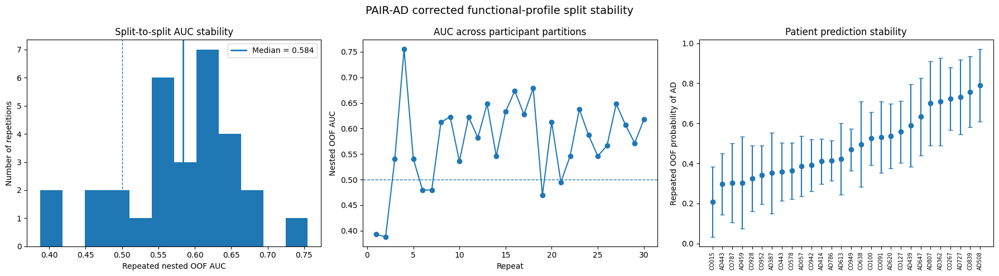


SPLIT-STABILITY DECISION SUMMARY
Median repeated OOF AUC: 0.5841836734693877
25th percentile AUC: 0.5408163265306123
Fraction of repeats AUC > 0.50: 0.8
Fraction of repeats AUC > 0.60: 0.4666666666666667

FUNCTIONAL SIGNAL IS PRESENT BUT WEAK / SPLIT-SENSITIVE.
Late fusion may be explored, but claims must remain conservative.

CELL 39 COMPLETE

Repeat results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_Split_Stability\PAIR_AD_functional_repeat_results.csv

Fold results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_Split_Stability\PAIR_AD_functional_repeat_fold_results.csv

Repeated predictions:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_Split_Stability\PAIR_AD_functional_repeated_OOF_predictions.csv

Patient stability:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\

In [50]:
# ==================================================================================================
# CELL 39 — PAIR-AD SOURCE-NATIVE FUNCTIONAL SPLIT-STABILITY AUDIT
#
# EXPLORATORY ROBUSTNESS ANALYSIS
#
# PURPOSE
# -------
#
# Cell 38 produced:
#
#       12 PREDEFINED patient features
#
# from:
#
#       corrected source-native functional response
#       patient mean response profile
#       patient scan-SD response profile
#       first 6 DCT coefficients of each
#
#
# We DO NOT modify those features.
#
# This cell asks:
#
#       Is the observed patient-level discrimination stable when
#       the 28 participants are repartitioned many different ways?
#
#
# METHOD
# ------
#
# 30 repeated participant-level outer 3-fold CV runs.
#
# For EACH repetition:
#
#   outer test fold
#       ↓
#   inner 3-fold CV on outer-training patients only
#       ↓
#   select C
#       ↓
#   obtain inner OOF probabilities
#       ↓
#   select threshold
#       ↓
#   train outer model
#       ↓
#   evaluate untouched outer patients
#
#
# IMPORTANT
# ---------
#
# - same locked 12 features from Cell 38
# - no new feature engineering
# - no diagnosis-based depth selection
# - no architecture changes
#
# Because the same 28 participants have already been repeatedly
# inspected, this remains EXPLORATORY robustness analysis.
#
# ==================================================================================================

from pathlib import Path
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    roc_auc_score,
    average_precision_score,
    confusion_matrix
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. LOCKED CONFIGURATION
# ==================================================================================================

BASE_SEED = 2026

N_REPEATS = 30

N_OUTER_FOLDS = 3

N_INNER_FOLDS = 3


C_GRID = [
    0.03,
    0.10,
    0.30,
    1.00,
    3.00
]


THRESHOLD_GRID = np.arange(
    0.10,
    0.91,
    0.01
)


# ==================================================================================================
# 2. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


INPUT_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_DCT_Baseline"
)


FEATURE_PATH = (
    INPUT_DIR /
    "PAIR_AD_source_functional_DCT_features.csv"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_Split_Stability"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


REPEAT_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_repeat_results.csv"
)


FOLD_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_repeat_fold_results.csv"
)


PREDICTION_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_repeated_OOF_predictions.csv"
)


PATIENT_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_patient_stability.csv"
)


FIGURE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_split_stability.png"
)


print("=" * 120)
print("CELL 39 — SOURCE-NATIVE FUNCTIONAL SPLIT-STABILITY AUDIT")
print("=" * 120)


print(
    "\nRepeats:",
    N_REPEATS
)


print(
    "Outer folds:",
    N_OUTER_FOLDS
)


print(
    "Inner folds:",
    N_INNER_FOLDS
)


print(
    "\nNO NEW FEATURES WILL BE CREATED."
)


# ==================================================================================================
# 3. LOAD LOCKED CELL 38 FEATURES
# ==================================================================================================

assert FEATURE_PATH.exists(), FEATURE_PATH


feature_df = pd.read_csv(
    FEATURE_PATH
)


subjects = feature_df[
    "folder_subject"
].astype(str).values


y = feature_df[
    "target"
].values.astype(
    np.int64
)


original_outer_fold = feature_df[
    "outer_fold"
].values.astype(
    np.int64
)


feature_columns = [
    column
    for column in feature_df.columns
    if column.startswith(
        "mean_response_dct"
    )
    or
    column.startswith(
        "scan_sd_response_dct"
    )
]


X = feature_df[
    feature_columns
].values.astype(
    np.float64
)


print("\n" + "=" * 120)
print("LOCKED CELL 38 FEATURE MATRIX")
print("=" * 120)


print(
    "Participants:",
    len(
        subjects
    )
)


print(
    "Control:",
    int(
        (
            y == 0
        ).sum()
    )
)


print(
    "AD:",
    int(
        (
            y == 1
        ).sum()
    )
)


print(
    "Feature matrix:",
    X.shape
)


print(
    "Feature columns:"
)


for column in feature_columns:

    print(
        " ",
        column
    )


assert X.shape == (
    28,
    12
)


assert len(
    feature_columns
) == 12


assert np.isfinite(
    X
).all()


# ==================================================================================================
# 4. MODEL
# ==================================================================================================

def fit_predict(
    X_train,
    y_train,
    X_eval,
    C,
    seed
):

    scaler = StandardScaler()


    X_train_scaled = scaler.fit_transform(
        X_train
    )


    X_eval_scaled = scaler.transform(
        X_eval
    )


    model = LogisticRegression(
        C=float(
            C
        ),
        penalty="l2",
        solver="liblinear",
        max_iter=5000,
        random_state=int(
            seed
        )
    )


    model.fit(
        X_train_scaled,
        y_train
    )


    probability = model.predict_proba(
        X_eval_scaled
    )[
        :,
        1
    ]


    return probability


# ==================================================================================================
# 5. THRESHOLD
# ==================================================================================================

def select_threshold(
    y_true,
    probability
):

    best_threshold = 0.50

    best_score = -np.inf


    for threshold in THRESHOLD_GRID:

        prediction = (
            probability
            >=
            threshold
        ).astype(
            int
        )


        score = balanced_accuracy_score(
            y_true,
            prediction
        )


        if score > best_score + 1e-12:

            best_score = score

            best_threshold = float(
                threshold
            )


        elif abs(
            score
            -
            best_score
        ) <= 1e-12:

            # Tie-break toward 0.50.

            if abs(
                threshold
                -
                0.50
            ) < abs(
                best_threshold
                -
                0.50
            ):

                best_threshold = float(
                    threshold
                )


    return (
        best_threshold,
        best_score
    )


# ==================================================================================================
# 6. STORAGE
# ==================================================================================================

repeat_rows = []

fold_rows = []

prediction_rows = []


# ==================================================================================================
# 7. REPEATED NESTED CV
# ==================================================================================================

print("\n" + "=" * 120)
print("STARTING REPEATED PARTICIPANT-LEVEL NESTED CV")
print("=" * 120)


for repeat in range(
    N_REPEATS
):

    repeat_seed = (
        BASE_SEED
        +
        repeat
    )


    outer_cv = StratifiedKFold(
        n_splits=N_OUTER_FOLDS,
        shuffle=True,
        random_state=repeat_seed
    )


    repeat_probability = np.full(
        len(
            y
        ),
        np.nan,
        dtype=np.float64
    )


    repeat_prediction = np.full(
        len(
            y
        ),
        -1,
        dtype=np.int64
    )


    repeat_threshold = np.full(
        len(
            y
        ),
        np.nan,
        dtype=np.float64
    )


    fold_counter = 0


    for outer_train, outer_test in outer_cv.split(
        X,
        y
    ):

        fold_counter += 1


        # ==========================================================================================
        # INNER CV
        # ==========================================================================================

        inner_seed = (
            repeat_seed
            *
            100
            +
            fold_counter
        )


        inner_cv = StratifiedKFold(
            n_splits=N_INNER_FOLDS,
            shuffle=True,
            random_state=inner_seed
        )


        # ==========================================================================================
        # SELECT C
        # ==========================================================================================

        C_scores = []


        for C in C_GRID:

            inner_fold_aucs = []


            for (
                local_inner_train,
                local_inner_val
            ) in inner_cv.split(
                X[
                    outer_train
                ],
                y[
                    outer_train
                ]
            ):

                inner_train = outer_train[
                    local_inner_train
                ]


                inner_val = outer_train[
                    local_inner_val
                ]


                probability = fit_predict(
                    X[
                        inner_train
                    ],
                    y[
                        inner_train
                    ],
                    X[
                        inner_val
                    ],
                    C,
                    inner_seed
                )


                auc_value = roc_auc_score(
                    y[
                        inner_val
                    ],
                    probability
                )


                inner_fold_aucs.append(
                    auc_value
                )


            C_scores.append(
                {
                    "C":
                        float(
                            C
                        ),

                    "mean_auc":
                        float(
                            np.mean(
                                inner_fold_aucs
                            )
                        )
                }
            )


        C_df = pd.DataFrame(
            C_scores
        )


        best_inner_mean_auc = C_df[
            "mean_auc"
        ].max()


        candidates = C_df[
            np.isclose(
                C_df[
                    "mean_auc"
                ],
                best_inner_mean_auc
            )
        ]


        # Stronger regularization if tied.

        selected_C = float(
            candidates[
                "C"
            ].min()
        )


        # ==========================================================================================
        # INNER OOF WITH SELECTED C
        # ==========================================================================================

        inner_oof_probability = np.full(
            len(
                outer_train
            ),
            np.nan,
            dtype=np.float64
        )


        # Reinitialize the exact inner CV splits.

        inner_cv_oof = StratifiedKFold(
            n_splits=N_INNER_FOLDS,
            shuffle=True,
            random_state=inner_seed
        )


        for (
            local_inner_train,
            local_inner_val
        ) in inner_cv_oof.split(
            X[
                outer_train
            ],
            y[
                outer_train
            ]
        ):

            inner_train = outer_train[
                local_inner_train
            ]


            inner_val = outer_train[
                local_inner_val
            ]


            probability = fit_predict(
                X[
                    inner_train
                ],
                y[
                    inner_train
                ],
                X[
                    inner_val
                ],
                selected_C,
                inner_seed
            )


            inner_oof_probability[
                local_inner_val
            ] = probability


        assert np.isfinite(
            inner_oof_probability
        ).all()


        inner_y = y[
            outer_train
        ]


        inner_oof_auc = roc_auc_score(
            inner_y,
            inner_oof_probability
        )


        (
            selected_threshold,
            inner_balanced_accuracy
        ) = select_threshold(
            inner_y,
            inner_oof_probability
        )


        # ==========================================================================================
        # OUTER TEST
        # ==========================================================================================

        outer_probability = fit_predict(
            X[
                outer_train
            ],
            y[
                outer_train
            ],
            X[
                outer_test
            ],
            selected_C,
            repeat_seed
        )


        outer_prediction = (
            outer_probability
            >=
            selected_threshold
        ).astype(
            int
        )


        repeat_probability[
            outer_test
        ] = outer_probability


        repeat_prediction[
            outer_test
        ] = outer_prediction


        repeat_threshold[
            outer_test
        ] = selected_threshold


        outer_auc = roc_auc_score(
            y[
                outer_test
            ],
            outer_probability
        )


        outer_ap = average_precision_score(
            y[
                outer_test
            ],
            outer_probability
        )


        outer_accuracy = accuracy_score(
            y[
                outer_test
            ],
            outer_prediction
        )


        outer_balanced = balanced_accuracy_score(
            y[
                outer_test
            ],
            outer_prediction
        )


        fold_rows.append(
            {
                "repeat":
                    repeat + 1,

                "repeat_seed":
                    repeat_seed,

                "outer_fold":
                    fold_counter,

                "train_patients":
                    len(
                        outer_train
                    ),

                "test_patients":
                    len(
                        outer_test
                    ),

                "selected_C":
                    selected_C,

                "selected_threshold":
                    selected_threshold,

                "inner_mean_auc":
                    best_inner_mean_auc,

                "inner_oof_auc":
                    inner_oof_auc,

                "inner_balanced_accuracy":
                    inner_balanced_accuracy,

                "outer_auc":
                    outer_auc,

                "outer_average_precision":
                    outer_ap,

                "outer_accuracy":
                    outer_accuracy,

                "outer_balanced_accuracy":
                    outer_balanced
            }
        )


    # ==============================================================================================
    # FULL REPEAT OOF METRICS
    # ==============================================================================================

    assert np.isfinite(
        repeat_probability
    ).all()


    assert (
        repeat_prediction
        >=
        0
    ).all()


    repeat_auc = roc_auc_score(
        y,
        repeat_probability
    )


    repeat_ap = average_precision_score(
        y,
        repeat_probability
    )


    repeat_accuracy = accuracy_score(
        y,
        repeat_prediction
    )


    repeat_balanced = balanced_accuracy_score(
        y,
        repeat_prediction
    )


    tn, fp, fn, tp = confusion_matrix(
        y,
        repeat_prediction,
        labels=[
            0,
            1
        ]
    ).ravel()


    sensitivity = (
        tp
        /
        max(
            tp
            +
            fn,
            1
        )
    )


    specificity = (
        tn
        /
        max(
            tn
            +
            fp,
            1
        )
    )


    repeat_rows.append(
        {
            "repeat":
                repeat + 1,

            "repeat_seed":
                repeat_seed,

            "auc":
                repeat_auc,

            "average_precision":
                repeat_ap,

            "accuracy":
                repeat_accuracy,

            "balanced_accuracy":
                repeat_balanced,

            "sensitivity":
                sensitivity,

            "specificity":
                specificity
        }
    )


    for i in range(
        len(
            subjects
        )
    ):

        prediction_rows.append(
            {
                "repeat":
                    repeat + 1,

                "repeat_seed":
                    repeat_seed,

                "folder_subject":
                    subjects[
                        i
                    ],

                "target":
                    int(
                        y[
                            i
                        ]
                    ),

                "probability_AD":
                    float(
                        repeat_probability[
                            i
                        ]
                    ),

                "threshold":
                    float(
                        repeat_threshold[
                            i
                        ]
                    ),

                "prediction":
                    int(
                        repeat_prediction[
                            i
                        ]
                    )
            }
        )


    print(
        f"Repeat "
        f"{repeat+1:02d}/{N_REPEATS} "
        f"| AUC={repeat_auc:.4f} "
        f"| AP={repeat_ap:.4f} "
        f"| BAcc={repeat_balanced:.4f}"
    )


# ==================================================================================================
# 8. DATAFRAMES
# ==================================================================================================

repeat_df = pd.DataFrame(
    repeat_rows
)


fold_df = pd.DataFrame(
    fold_rows
)


prediction_df = pd.DataFrame(
    prediction_rows
)


# ==================================================================================================
# 9. REPEAT-LEVEL STABILITY SUMMARY
# ==================================================================================================

print("\n" + "=" * 120)
print("REPEATED-CV PERFORMANCE DISTRIBUTION")
print("=" * 120)


for metric in [
    "auc",
    "average_precision",
    "accuracy",
    "balanced_accuracy",
    "sensitivity",
    "specificity"
]:

    values = repeat_df[
        metric
    ].values


    print(
        f"\n{metric}"
    )


    print(
        "  Mean   :",
        float(
            np.mean(
                values
            )
        )
    )


    print(
        "  Median :",
        float(
            np.median(
                values
            )
        )
    )


    print(
        "  SD     :",
        float(
            np.std(
                values,
                ddof=1
            )
        )
    )


    print(
        "  Q1     :",
        float(
            np.percentile(
                values,
                25
            )
        )
    )


    print(
        "  Q3     :",
        float(
            np.percentile(
                values,
                75
            )
        )
    )


    print(
        "  Minimum:",
        float(
            np.min(
                values
            )
        )
    )


    print(
        "  Maximum:",
        float(
            np.max(
                values
            )
        )
    )


# ==================================================================================================
# 10. AUC ROBUSTNESS COUNTS
# ==================================================================================================

print("\n" + "=" * 120)
print("AUC ROBUSTNESS")
print("=" * 120)


for cutoff in [
    0.50,
    0.55,
    0.60,
    0.65,
    0.70
]:

    n_above = int(
        (
            repeat_df[
                "auc"
            ]
            >
            cutoff
        ).sum()
    )


    percentage = (
        100.0
        *
        n_above
        /
        N_REPEATS
    )


    print(
        f"AUC > {cutoff:.2f}: "
        f"{n_above}/{N_REPEATS} "
        f"({percentage:.1f}%)"
    )


# ==================================================================================================
# 11. OUTER FOLD STABILITY
# ==================================================================================================

print("\n" + "=" * 120)
print("ALL OUTER-FOLD AUC DISTRIBUTION")
print("=" * 120)


outer_auc_values = fold_df[
    "outer_auc"
].values


print(
    "Outer-fold evaluations:",
    len(
        outer_auc_values
    )
)


print(
    "Mean:",
    float(
        outer_auc_values.mean()
    )
)


print(
    "Median:",
    float(
        np.median(
            outer_auc_values
        )
    )
)


print(
    "SD:",
    float(
        outer_auc_values.std(
            ddof=1
        )
    )
)


print(
    "Minimum:",
    float(
        outer_auc_values.min()
    )
)


print(
    "Maximum:",
    float(
        outer_auc_values.max()
    )
)


# ==================================================================================================
# 12. PATIENT STABILITY
#
# This is descriptive only.
#
# Mean repeated OOF probability is NOT an independent prediction.
# ==================================================================================================

patient_stability = (
    prediction_df
    .groupby(
        [
            "folder_subject",
            "target"
        ],
        as_index=False
    )
    .agg(
        mean_probability_AD=(
            "probability_AD",
            "mean"
        ),

        sd_probability_AD=(
            "probability_AD",
            "std"
        ),

        minimum_probability_AD=(
            "probability_AD",
            "min"
        ),

        maximum_probability_AD=(
            "probability_AD",
            "max"
        ),

        classification_AD_fraction=(
            "prediction",
            "mean"
        )
    )
)


patient_stability[
    "probability_range"
] = (
    patient_stability[
        "maximum_probability_AD"
    ]
    -
    patient_stability[
        "minimum_probability_AD"
    ]
)


patient_stability = patient_stability.sort_values(
    "mean_probability_AD"
).reset_index(
    drop=True
)


print("\n" + "=" * 120)
print("PATIENT REPEATED-OOF STABILITY")
print("=" * 120)


print(
    patient_stability.to_string(
        index=False
    )
)


# ==================================================================================================
# 13. MOST / LEAST STABLE PATIENTS
# ==================================================================================================

print("\n" + "=" * 120)
print("PATIENT PROBABILITY VARIABILITY")
print("=" * 120)


print(
    "\nMost stable:"
)


print(
    patient_stability
    .sort_values(
        "sd_probability_AD"
    )
    .head(
        8
    )
    .to_string(
        index=False
    )
)


print(
    "\nLeast stable:"
)


print(
    patient_stability
    .sort_values(
        "sd_probability_AD",
        ascending=False
    )
    .head(
        8
    )
    .to_string(
        index=False
    )
)


# ==================================================================================================
# 14. SAVE
# ==================================================================================================

repeat_df.to_csv(
    REPEAT_PATH,
    index=False
)


fold_df.to_csv(
    FOLD_PATH,
    index=False
)


prediction_df.to_csv(
    PREDICTION_PATH,
    index=False
)


patient_stability.to_csv(
    PATIENT_PATH,
    index=False
)


# ==================================================================================================
# 15. FIGURE
# ==================================================================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(
        18,
        5
    )
)


# --------------------------------------------------------------------------------------------------
# AUC distribution
# --------------------------------------------------------------------------------------------------

axes[
    0
].hist(
    repeat_df[
        "auc"
    ],
    bins=12
)


axes[
    0
].axvline(
    0.50,
    linestyle="--",
    linewidth=1
)


axes[
    0
].axvline(
    repeat_df[
        "auc"
    ].median(),
    linestyle="-",
    linewidth=2,
    label=(
        f"Median = "
        f"{repeat_df['auc'].median():.3f}"
    )
)


axes[
    0
].set_xlabel(
    "Repeated nested OOF AUC"
)


axes[
    0
].set_ylabel(
    "Number of repetitions"
)


axes[
    0
].set_title(
    "Split-to-split AUC stability"
)


axes[
    0
].legend()


# --------------------------------------------------------------------------------------------------
# Repeat AUC sequence
# --------------------------------------------------------------------------------------------------

axes[
    1
].plot(
    np.arange(
        1,
        N_REPEATS + 1
    ),
    repeat_df[
        "auc"
    ],
    marker="o"
)


axes[
    1
].axhline(
    0.50,
    linestyle="--",
    linewidth=1
)


axes[
    1
].set_xlabel(
    "Repeat"
)


axes[
    1
].set_ylabel(
    "Nested OOF AUC"
)


axes[
    1
].set_title(
    "AUC across participant partitions"
)


# --------------------------------------------------------------------------------------------------
# Patient stability
# --------------------------------------------------------------------------------------------------

positions = np.arange(
    len(
        patient_stability
    )
)


axes[
    2
].errorbar(
    positions,
    patient_stability[
        "mean_probability_AD"
    ],
    yerr=patient_stability[
        "sd_probability_AD"
    ],
    fmt="o",
    capsize=3
)


axes[
    2
].set_xticks(
    positions
)


axes[
    2
].set_xticklabels(
    patient_stability[
        "folder_subject"
    ],
    rotation=90,
    fontsize=7
)


axes[
    2
].set_ylabel(
    "Repeated OOF probability of AD"
)


axes[
    2
].set_title(
    "Patient prediction stability"
)


plt.suptitle(
    "PAIR-AD corrected functional-profile split stability",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 16. DECISION SUMMARY
# ==================================================================================================

median_auc = float(
    repeat_df[
        "auc"
    ].median()
)


q1_auc = float(
    repeat_df[
        "auc"
    ].quantile(
        0.25
    )
)


fraction_above_chance = float(
    (
        repeat_df[
            "auc"
        ]
        >
        0.50
    ).mean()
)


fraction_above_060 = float(
    (
        repeat_df[
            "auc"
        ]
        >
        0.60
    ).mean()
)


print("\n" + "=" * 120)
print("SPLIT-STABILITY DECISION SUMMARY")
print("=" * 120)


print(
    "Median repeated OOF AUC:",
    median_auc
)


print(
    "25th percentile AUC:",
    q1_auc
)


print(
    "Fraction of repeats AUC > 0.50:",
    fraction_above_chance
)


print(
    "Fraction of repeats AUC > 0.60:",
    fraction_above_060
)


if (
    median_auc >= 0.60
    and
    fraction_above_chance >= 0.80
):

    print(
        "\n✓ FUNCTIONAL SIGNAL SHOWS REASONABLE SPLIT ROBUSTNESS."
    )


    print(
        "Proceed to a pre-specified corrected structural + functional "
        "late-fusion experiment."
    )


elif (
    median_auc >= 0.55
    and
    fraction_above_chance >= 0.65
):

    print(
        "\nFUNCTIONAL SIGNAL IS PRESENT BUT WEAK / SPLIT-SENSITIVE."
    )


    print(
        "Late fusion may be explored, but claims must remain conservative."
    )


else:

    print(
        "\nFUNCTIONAL CLASSIFICATION SIGNAL IS NOT ROBUST ACROSS SPLITS."
    )


    print(
        "Do not increase model complexity on this cohort."
    )


# ==================================================================================================
# 17. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 39 COMPLETE")
print("=" * 120)


print(
    "\nRepeat results:"
)

print(
    REPEAT_PATH
)


print(
    "\nFold results:"
)

print(
    FOLD_PATH
)


print(
    "\nRepeated predictions:"
)

print(
    PREDICTION_PATH
)


print(
    "\nPatient stability:"
)

print(
    PATIENT_PATH
)


print(
    "\nFigure:"
)

print(
    FIGURE_PATH
)


print(
    "\nNO NEW FEATURE REPRESENTATION WAS CREATED."
)


print(
    "\nSEND ME:"
)


print(
    "  1. REPEATED-CV PERFORMANCE DISTRIBUTION"
)


print(
    "  2. AUC ROBUSTNESS"
)


print(
    "  3. ALL OUTER-FOLD AUC DISTRIBUTION"
)


print(
    "  4. PATIENT REPEATED-OOF STABILITY"
)


print(
    "  5. PATIENT PROBABILITY VARIABILITY"
)


print(
    "  6. SPLIT-STABILITY DECISION SUMMARY"
)


print(
    "  7. The stability figure"
)

CELL 40 — CORRECTED STRUCTURAL + FUNCTIONAL LATE-FUSION STABILITY

Device: cuda
GPU: NVIDIA GeForce RTX 4070 SUPER

CORRECTED STRUCTURAL INPUT
RAW DARK: (135, 256, 256)
RAW LIGHT: (135, 256, 256)
Physical pairs: 135
Participants: 28
RAW DARK range: 0.0 to 1.0
RAW LIGHT range: 0.0 to 1.0

LOCKED FUNCTIONAL INPUT
Participants: 28
Feature matrix: (28, 12)
Features: ['mean_response_dct0', 'mean_response_dct1', 'mean_response_dct2', 'mean_response_dct3', 'mean_response_dct4', 'mean_response_dct5', 'scan_sd_response_dct0', 'scan_sd_response_dct1', 'scan_sd_response_dct2', 'scan_sd_response_dct3', 'scan_sd_response_dct4', 'scan_sd_response_dct5']

✓ Structural and functional participant labels align.

LOADING FROZEN RESNET-50
Feature dimension: 2048
Trainable backbone parameters: 0

EXTRACTING CORRECTED RAW STRUCTURAL FEATURES
DARK features: (135, 2048)
LIGHT features: (135, 2048)
Physical-pair structural features: (135, 2048)

Saved structural cache:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\

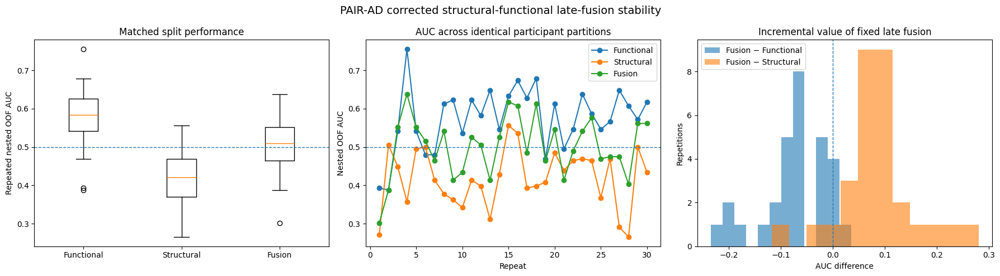


LATE-FUSION DECISION SUMMARY
Median functional AUC: 0.5841836734693877
Median structural AUC: 0.42091836734693877
Median fusion AUC: 0.5102040816326532

Median fusion - functional: -0.06887755102040816
Median fusion - structural: 0.0816326530612245

Fusion better than both branches: 10.0% of repetitions

IMPORTANT:
Interpret the repeated distributions, not the single best repetition.
Do not tune the 0.50/0.50 fusion weight after viewing these results.
No statistical test treats the 30 overlapping repetitions as 30 independent datasets.

CELL 40 COMPLETE

Structural cache:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Corrected_Late_Fusion\PAIR_AD_corrected_RAW_ResNet50_patient_features.npz

Repeat-level results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Corrected_Late_Fusion\PAIR_AD_late_fusion_repeat_results.csv

Outer-fold results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Corrected_Late_Fusion\PAIR_AD_late

In [51]:
# ==================================================================================================
# CELL 40 — PAIR-AD CORRECTED STRUCTURAL + FUNCTIONAL LATE-FUSION STABILITY
#
# EXPLORATORY MODEL-DEVELOPMENT ANALYSIS
#
# LOCKED FUNCTIONAL BRANCH
# ------------------------
# EXACT Cell 38 representation:
#
#       12 DCT features
#
# No functional feature is changed.
#
#
# STRUCTURAL BRANCH
# -----------------
#
# Corrected PHYSICAL RAW DARK/LIGHT pairs from Cell 35.
#
# Frozen ImageNet ResNet-50:
#
#       RAW DARK  -> 2048-D
#       RAW LIGHT -> 2048-D
#
# Paired structural representation:
#
#       z_struct = (z_dark + z_light) / 2
#
# Patient structural representation:
#
#       mean across 4-5 physical scan pairs
#
#
# CLASSIFICATION
# --------------
#
# Functional:
#       StandardScaler + L2 Logistic Regression
#
# Structural:
#       StandardScaler
#       + FIXED 5-D PCA
#       + L2 Logistic Regression
#
#
# FUSION
# ------
#
# NO fusion-weight optimization:
#
#       P_fusion = 0.5 * P_functional
#                + 0.5 * P_structural
#
#
# VALIDATION
# ----------
#
# EXACT SAME repeated nested participant-level CV concept as Cell 39:
#
#       30 repetitions
#       3 outer folds
#       3 inner folds
#
#
# PRIMARY QUESTION
# ----------------
#
# Does structural information consistently improve the LOCKED
# functional representation across participant partitions?
#
#
# NOTE
# ----
#
# Repeated splits overlap participants.
# The 30 repetitions are NOT 30 independent datasets.
# We report distributions/descriptive paired improvements only.
#
# ==================================================================================================

from pathlib import Path
import warnings
import random

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision.models import (
    resnet50,
    ResNet50_Weights
)

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    balanced_accuracy_score,
    confusion_matrix
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. LOCKED CONFIGURATION
# ==================================================================================================

SEED = 2026

N_REPEATS = 30

N_OUTER_FOLDS = 3

N_INNER_FOLDS = 3


# Keep same regularization search used in Cell 39.

C_GRID = [
    0.03,
    0.10,
    0.30,
    1.00,
    3.00
]


THRESHOLD_GRID = np.arange(
    0.10,
    0.91,
    0.01
)


# FIXED structural dimensionality.
#
# We deliberately do NOT tune PCA dimension against outer results.

STRUCTURAL_PCA_DIM = 5


# Fixed fusion — NEVER optimized on this cohort.

FUNCTIONAL_WEIGHT = 0.50

STRUCTURAL_WEIGHT = 0.50


FEATURE_BATCH_SIZE = 32


# ==================================================================================================
# 2. REPRODUCIBILITY
# ==================================================================================================

random.seed(
    SEED
)

np.random.seed(
    SEED
)

torch.manual_seed(
    SEED
)


if torch.cuda.is_available():

    torch.cuda.manual_seed_all(
        SEED
    )


# ==================================================================================================
# 3. DEVICE
# ==================================================================================================

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else
    "cpu"
)


print("=" * 120)
print("CELL 40 — CORRECTED STRUCTURAL + FUNCTIONAL LATE-FUSION STABILITY")
print("=" * 120)


print(
    "\nDevice:",
    DEVICE
)


if torch.cuda.is_available():

    print(
        "GPU:",
        torch.cuda.get_device_name(
            0
        )
    )


# ==================================================================================================
# 4. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


CORRECTED_IMAGE_PATH = (
    PAIR_AD_DIR /
    "Corrected_Physical_Pairs" /
    "PAIR_AD_highres_256_physical_pairs_CORRECTED.npz"
)


FUNCTIONAL_FEATURE_PATH = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_DCT_Baseline" /
    "PAIR_AD_source_functional_DCT_features.csv"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Corrected_Late_Fusion"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


STRUCTURAL_CACHE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_corrected_RAW_ResNet50_patient_features.npz"
)


REPEAT_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_late_fusion_repeat_results.csv"
)


FOLD_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_late_fusion_fold_results.csv"
)


PREDICTION_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_late_fusion_repeated_predictions.csv"
)


FIGURE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_late_fusion_stability.png"
)


# ==================================================================================================
# 5. LOAD CORRECTED RAW OCT
# ==================================================================================================

assert CORRECTED_IMAGE_PATH.exists(), CORRECTED_IMAGE_PATH


image_data = np.load(
    CORRECTED_IMAGE_PATH,
    allow_pickle=True
)


raw_dark = image_data[
    "raw_dark"
].astype(
    np.float32
)


raw_light = image_data[
    "raw_light"
].astype(
    np.float32
)


image_subjects = image_data[
    "subject"
].astype(str)


image_y = image_data[
    "y"
].astype(
    np.int64
)


source_scan_id = image_data[
    "source_scan_id"
].astype(
    np.int64
)


print("\n" + "=" * 120)
print("CORRECTED STRUCTURAL INPUT")
print("=" * 120)


print(
    "RAW DARK:",
    raw_dark.shape
)


print(
    "RAW LIGHT:",
    raw_light.shape
)


print(
    "Physical pairs:",
    len(
        image_subjects
    )
)


print(
    "Participants:",
    len(
        np.unique(
            image_subjects
        )
    )
)


print(
    "RAW DARK range:",
    float(
        raw_dark.min()
    ),
    "to",
    float(
        raw_dark.max()
    )
)


print(
    "RAW LIGHT range:",
    float(
        raw_light.min()
    ),
    "to",
    float(
        raw_light.max()
    )
)


assert raw_dark.shape == (
    135,
    256,
    256
)


assert raw_light.shape == (
    135,
    256,
    256
)


# ==================================================================================================
# 6. LOAD LOCKED FUNCTIONAL FEATURES
# ==================================================================================================

assert FUNCTIONAL_FEATURE_PATH.exists(), FUNCTIONAL_FEATURE_PATH


functional_df = pd.read_csv(
    FUNCTIONAL_FEATURE_PATH
)


functional_subjects = functional_df[
    "folder_subject"
].astype(str).values


functional_y = functional_df[
    "target"
].values.astype(
    np.int64
)


functional_columns = [
    column
    for column in functional_df.columns
    if (
        column.startswith(
            "mean_response_dct"
        )
        or
        column.startswith(
            "scan_sd_response_dct"
        )
    )
]


X_functional = functional_df[
    functional_columns
].values.astype(
    np.float64
)


print("\n" + "=" * 120)
print("LOCKED FUNCTIONAL INPUT")
print("=" * 120)


print(
    "Participants:",
    len(
        functional_subjects
    )
)


print(
    "Feature matrix:",
    X_functional.shape
)


print(
    "Features:",
    functional_columns
)


assert X_functional.shape == (
    28,
    12
)


# ==================================================================================================
# 7. VERIFY PARTICIPANT LABEL CONSISTENCY
# ==================================================================================================

for subject_name, target in zip(
    functional_subjects,
    functional_y
):

    idx = np.where(
        image_subjects
        ==
        subject_name
    )[0]


    assert len(
        idx
    ) in [
        4,
        5
    ]


    assert len(
        np.unique(
            image_y[
                idx
            ]
        )
    ) == 1


    assert int(
        image_y[
            idx[
                0
            ]
        ]
    ) == int(
        target
    )


print(
    "\n✓ Structural and functional participant labels align."
)


# ==================================================================================================
# 8. FROZEN RESNET-50
#
# Same explicit ImageNet-V1 checkpoint family previously used.
# ==================================================================================================

print("\n" + "=" * 120)
print("LOADING FROZEN RESNET-50")
print("=" * 120)


weights = (
    ResNet50_Weights
    .IMAGENET1K_V1
)


backbone = resnet50(
    weights=weights
)


backbone.fc = nn.Identity()


backbone = backbone.to(
    DEVICE
)


backbone.eval()


for parameter in backbone.parameters():

    parameter.requires_grad = False


print(
    "Feature dimension:",
    2048
)


print(
    "Trainable backbone parameters:",
    sum(
        p.numel()
        for p in backbone.parameters()
        if p.requires_grad
    )
)


# ==================================================================================================
# 9. PREPROCESS RAW OCT
#
# Cell 35 already stored RAW images as [0,1].
#
# Repeat grayscale -> RGB
# Resize -> 224
# ImageNet normalization
# ==================================================================================================

IMAGENET_MEAN = torch.tensor(
    [
        0.485,
        0.456,
        0.406
    ],
    dtype=torch.float32,
    device=DEVICE
).view(
    1,
    3,
    1,
    1
)


IMAGENET_STD = torch.tensor(
    [
        0.229,
        0.224,
        0.225
    ],
    dtype=torch.float32,
    device=DEVICE
).view(
    1,
    3,
    1,
    1
)


def prepare_batch(
    array
):

    x = torch.from_numpy(
        array
    ).float()


    x = x.unsqueeze(
        1
    )


    x = F.interpolate(
        x,
        size=(
            224,
            224
        ),
        mode="bilinear",
        align_corners=False
    )


    x = x.repeat(
        1,
        3,
        1,
        1
    )


    x = x.to(
        DEVICE,
        non_blocking=True
    )


    x = (
        x
        -
        IMAGENET_MEAN
    ) / IMAGENET_STD


    return x


# ==================================================================================================
# 10. FEATURE EXTRACTION
# ==================================================================================================

def extract_features(
    array
):

    outputs = []


    with torch.inference_mode():

        for start in range(
            0,
            len(
                array
            ),
            FEATURE_BATCH_SIZE
        ):

            end = min(
                start
                +
                FEATURE_BATCH_SIZE,
                len(
                    array
                )
            )


            x = prepare_batch(
                array[
                    start:end
                ]
            )


            features = backbone(
                x
            )


            outputs.append(
                features
                .detach()
                .cpu()
                .numpy()
                .astype(
                    np.float32
                )
            )


    return np.concatenate(
        outputs,
        axis=0
    )


# ==================================================================================================
# 11. STRUCTURAL CACHE
# ==================================================================================================

if STRUCTURAL_CACHE_PATH.exists():

    print("\n" + "=" * 120)
    print("LOADING EXISTING STRUCTURAL CACHE")
    print("=" * 120)


    cache = np.load(
        STRUCTURAL_CACHE_PATH,
        allow_pickle=True
    )


    cached_subjects = cache[
        "subject"
    ].astype(str)


    X_structural = cache[
        "patient_structural_feature"
    ].astype(
        np.float64
    )


    assert np.array_equal(
        cached_subjects,
        functional_subjects
    )


    print(
        "Loaded:",
        X_structural.shape
    )


else:

    print("\n" + "=" * 120)
    print("EXTRACTING CORRECTED RAW STRUCTURAL FEATURES")
    print("=" * 120)


    dark_features = extract_features(
        raw_dark
    )


    light_features = extract_features(
        raw_light
    )


    print(
        "DARK features:",
        dark_features.shape
    )


    print(
        "LIGHT features:",
        light_features.shape
    )


    # ----------------------------------------------------------------------------------------------
    # Condition-invariant structural pair representation.
    # ----------------------------------------------------------------------------------------------

    scan_structural_features = (
        dark_features
        +
        light_features
    ) / 2.0


    print(
        "Physical-pair structural features:",
        scan_structural_features.shape
    )


    # ----------------------------------------------------------------------------------------------
    # Patient aggregation.
    # ----------------------------------------------------------------------------------------------

    patient_structural_features = []


    for subject_name in functional_subjects:

        idx = np.where(
            image_subjects
            ==
            subject_name
        )[0]


        idx = idx[
            np.argsort(
                source_scan_id[
                    idx
                ]
            )
        ]


        patient_feature = (
            scan_structural_features[
                idx
            ].mean(
                axis=0
            )
        )


        patient_structural_features.append(
            patient_feature
        )


    X_structural = np.asarray(
        patient_structural_features,
        dtype=np.float64
    )


    np.savez_compressed(
        STRUCTURAL_CACHE_PATH,

        patient_structural_feature=
            X_structural.astype(
                np.float32
            ),

        subject=
            functional_subjects,

        y=
            functional_y
    )


    print(
        "\nSaved structural cache:"
    )


    print(
        STRUCTURAL_CACHE_PATH
    )


print("\n" + "=" * 120)
print("CORRECTED PATIENT STRUCTURAL MATRIX")
print("=" * 120)


print(
    "Patients:",
    X_structural.shape[
        0
    ]
)


print(
    "Features:",
    X_structural.shape[
        1
    ]
)


print(
    "Matrix:",
    X_structural.shape
)


assert X_structural.shape == (
    28,
    2048
)


assert np.isfinite(
    X_structural
).all()


# ==================================================================================================
# 12. MODEL HELPERS
# ==================================================================================================

def fit_functional(
    X_train,
    y_train,
    X_eval,
    C,
    seed
):

    scaler = StandardScaler()


    train_scaled = scaler.fit_transform(
        X_train
    )


    eval_scaled = scaler.transform(
        X_eval
    )


    model = LogisticRegression(
        C=float(
            C
        ),
        penalty="l2",
        solver="liblinear",
        max_iter=5000,
        random_state=int(
            seed
        )
    )


    model.fit(
        train_scaled,
        y_train
    )


    return model.predict_proba(
        eval_scaled
    )[
        :,
        1
    ]


def fit_structural(
    X_train,
    y_train,
    X_eval,
    C,
    seed
):

    scaler = StandardScaler()


    train_scaled = scaler.fit_transform(
        X_train
    )


    eval_scaled = scaler.transform(
        X_eval
    )


    n_components = min(
        STRUCTURAL_PCA_DIM,
        X_train.shape[
            0
        ]
        -
        1,
        X_train.shape[
            1
        ]
    )


    pca = PCA(
        n_components=n_components,
        svd_solver="full"
    )


    train_pca = pca.fit_transform(
        train_scaled
    )


    eval_pca = pca.transform(
        eval_scaled
    )


    model = LogisticRegression(
        C=float(
            C
        ),
        penalty="l2",
        solver="liblinear",
        max_iter=5000,
        random_state=int(
            seed
        )
    )


    model.fit(
        train_pca,
        y_train
    )


    return model.predict_proba(
        eval_pca
    )[
        :,
        1
    ]


# ==================================================================================================
# 13. THRESHOLD
# ==================================================================================================

def select_threshold(
    y_true,
    probability
):

    best_threshold = 0.50

    best_score = -np.inf


    for threshold in THRESHOLD_GRID:

        prediction = (
            probability
            >=
            threshold
        ).astype(
            int
        )


        score = balanced_accuracy_score(
            y_true,
            prediction
        )


        if score > best_score + 1e-12:

            best_score = score

            best_threshold = float(
                threshold
            )


        elif abs(
            score
            -
            best_score
        ) <= 1e-12:

            if abs(
                threshold
                -
                0.50
            ) < abs(
                best_threshold
                -
                0.50
            ):

                best_threshold = float(
                    threshold
                )


    return (
        best_threshold,
        best_score
    )


# ==================================================================================================
# 14. METRIC HELPER
# ==================================================================================================

def metric_dict(
    y_true,
    probability,
    prediction
):

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        prediction,
        labels=[
            0,
            1
        ]
    ).ravel()


    sensitivity = (
        tp
        /
        max(
            tp + fn,
            1
        )
    )


    specificity = (
        tn
        /
        max(
            tn + fp,
            1
        )
    )


    return {
        "auc":
            roc_auc_score(
                y_true,
                probability
            ),

        "average_precision":
            average_precision_score(
                y_true,
                probability
            ),

        "accuracy":
            accuracy_score(
                y_true,
                prediction
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y_true,
                prediction
            ),

        "sensitivity":
            sensitivity,

        "specificity":
            specificity
    }


# ==================================================================================================
# 15. INPUT ALIASES
# ==================================================================================================

y = functional_y.copy()

subjects = functional_subjects.copy()


assert len(
    subjects
) == 28


assert (
    y == 0
).sum() == 14


assert (
    y == 1
).sum() == 14


# ==================================================================================================
# 16. STORAGE
# ==================================================================================================

repeat_rows = []

fold_rows = []

prediction_rows = []


# ==================================================================================================
# 17. REPEATED NESTED CV
# ==================================================================================================

print("\n" + "=" * 120)
print("STARTING MATCHED REPEATED NESTED CV")
print("=" * 120)


for repeat in range(
    N_REPEATS
):

    repeat_seed = (
        SEED
        +
        repeat
    )


    outer_cv = StratifiedKFold(
        n_splits=N_OUTER_FOLDS,
        shuffle=True,
        random_state=repeat_seed
    )


    functional_oof = np.full(
        28,
        np.nan,
        dtype=np.float64
    )


    structural_oof = np.full(
        28,
        np.nan,
        dtype=np.float64
    )


    fusion_oof = np.full(
        28,
        np.nan,
        dtype=np.float64
    )


    functional_prediction = np.full(
        28,
        -1,
        dtype=np.int64
    )


    structural_prediction = np.full(
        28,
        -1,
        dtype=np.int64
    )


    fusion_prediction = np.full(
        28,
        -1,
        dtype=np.int64
    )


    outer_fold_number = 0


    for outer_train, outer_test in outer_cv.split(
        X_functional,
        y
    ):

        outer_fold_number += 1


        inner_seed = (
            repeat_seed
            *
            100
            +
            outer_fold_number
        )


        inner_cv = StratifiedKFold(
            n_splits=N_INNER_FOLDS,
            shuffle=True,
            random_state=inner_seed
        )


        inner_splits = list(
            inner_cv.split(
                X_functional[
                    outer_train
                ],
                y[
                    outer_train
                ]
            )
        )


        # ==========================================================================================
        # SELECT FUNCTIONAL C
        # ==========================================================================================

        functional_C_scores = []


        for C in C_GRID:

            aucs = []


            for local_train, local_val in inner_splits:

                train_idx = outer_train[
                    local_train
                ]


                val_idx = outer_train[
                    local_val
                ]


                probability = fit_functional(
                    X_functional[
                        train_idx
                    ],
                    y[
                        train_idx
                    ],
                    X_functional[
                        val_idx
                    ],
                    C,
                    inner_seed
                )


                aucs.append(
                    roc_auc_score(
                        y[
                            val_idx
                        ],
                        probability
                    )
                )


            functional_C_scores.append(
                (
                    C,
                    float(
                        np.mean(
                            aucs
                        )
                    )
                )
            )


        best_functional_auc = max(
            score
            for _, score in functional_C_scores
        )


        selected_functional_C = min(
            C
            for C, score in functional_C_scores
            if np.isclose(
                score,
                best_functional_auc
            )
        )


        # ==========================================================================================
        # SELECT STRUCTURAL C
        #
        # PCA dimension remains FIXED at 5.
        # ==========================================================================================

        structural_C_scores = []


        for C in C_GRID:

            aucs = []


            for local_train, local_val in inner_splits:

                train_idx = outer_train[
                    local_train
                ]


                val_idx = outer_train[
                    local_val
                ]


                probability = fit_structural(
                    X_structural[
                        train_idx
                    ],
                    y[
                        train_idx
                    ],
                    X_structural[
                        val_idx
                    ],
                    C,
                    inner_seed
                )


                aucs.append(
                    roc_auc_score(
                        y[
                            val_idx
                        ],
                        probability
                    )
                )


            structural_C_scores.append(
                (
                    C,
                    float(
                        np.mean(
                            aucs
                        )
                    )
                )
            )


        best_structural_auc = max(
            score
            for _, score in structural_C_scores
        )


        selected_structural_C = min(
            C
            for C, score in structural_C_scores
            if np.isclose(
                score,
                best_structural_auc
            )
        )


        # ==========================================================================================
        # INNER OOF PROBABILITIES
        # ==========================================================================================

        inner_functional = np.full(
            len(
                outer_train
            ),
            np.nan
        )


        inner_structural = np.full(
            len(
                outer_train
            ),
            np.nan
        )


        for local_train, local_val in inner_splits:

            train_idx = outer_train[
                local_train
            ]


            val_idx = outer_train[
                local_val
            ]


            inner_functional[
                local_val
            ] = fit_functional(
                X_functional[
                    train_idx
                ],
                y[
                    train_idx
                ],
                X_functional[
                    val_idx
                ],
                selected_functional_C,
                inner_seed
            )


            inner_structural[
                local_val
            ] = fit_structural(
                X_structural[
                    train_idx
                ],
                y[
                    train_idx
                ],
                X_structural[
                    val_idx
                ],
                selected_structural_C,
                inner_seed
            )


        assert np.isfinite(
            inner_functional
        ).all()


        assert np.isfinite(
            inner_structural
        ).all()


        inner_fusion = (
            FUNCTIONAL_WEIGHT
            *
            inner_functional

            +

            STRUCTURAL_WEIGHT
            *
            inner_structural
        )


        inner_y = y[
            outer_train
        ]


        functional_threshold, _ = (
            select_threshold(
                inner_y,
                inner_functional
            )
        )


        structural_threshold, _ = (
            select_threshold(
                inner_y,
                inner_structural
            )
        )


        fusion_threshold, _ = (
            select_threshold(
                inner_y,
                inner_fusion
            )
        )


        # ==========================================================================================
        # OUTER TEST
        # ==========================================================================================

        p_functional = fit_functional(
            X_functional[
                outer_train
            ],
            y[
                outer_train
            ],
            X_functional[
                outer_test
            ],
            selected_functional_C,
            repeat_seed
        )


        p_structural = fit_structural(
            X_structural[
                outer_train
            ],
            y[
                outer_train
            ],
            X_structural[
                outer_test
            ],
            selected_structural_C,
            repeat_seed
        )


        p_fusion = (
            FUNCTIONAL_WEIGHT
            *
            p_functional

            +

            STRUCTURAL_WEIGHT
            *
            p_structural
        )


        pred_functional = (
            p_functional
            >=
            functional_threshold
        ).astype(
            int
        )


        pred_structural = (
            p_structural
            >=
            structural_threshold
        ).astype(
            int
        )


        pred_fusion = (
            p_fusion
            >=
            fusion_threshold
        ).astype(
            int
        )


        functional_oof[
            outer_test
        ] = p_functional


        structural_oof[
            outer_test
        ] = p_structural


        fusion_oof[
            outer_test
        ] = p_fusion


        functional_prediction[
            outer_test
        ] = pred_functional


        structural_prediction[
            outer_test
        ] = pred_structural


        fusion_prediction[
            outer_test
        ] = pred_fusion


        # ==========================================================================================
        # FOLD RESULTS
        # ==========================================================================================

        functional_auc = roc_auc_score(
            y[
                outer_test
            ],
            p_functional
        )


        structural_auc = roc_auc_score(
            y[
                outer_test
            ],
            p_structural
        )


        fusion_auc = roc_auc_score(
            y[
                outer_test
            ],
            p_fusion
        )


        fold_rows.append(
            {
                "repeat":
                    repeat + 1,

                "repeat_seed":
                    repeat_seed,

                "outer_fold":
                    outer_fold_number,

                "selected_functional_C":
                    selected_functional_C,

                "selected_structural_C":
                    selected_structural_C,

                "structural_PCA_dim":
                    STRUCTURAL_PCA_DIM,

                "functional_outer_auc":
                    functional_auc,

                "structural_outer_auc":
                    structural_auc,

                "fusion_outer_auc":
                    fusion_auc,

                "fusion_minus_functional":
                    fusion_auc
                    -
                    functional_auc,

                "fusion_minus_structural":
                    fusion_auc
                    -
                    structural_auc
            }
        )


    # ==============================================================================================
    # REPEAT RESULTS
    # ==============================================================================================

    assert np.isfinite(
        functional_oof
    ).all()


    assert np.isfinite(
        structural_oof
    ).all()


    assert np.isfinite(
        fusion_oof
    ).all()


    functional_metrics = metric_dict(
        y,
        functional_oof,
        functional_prediction
    )


    structural_metrics = metric_dict(
        y,
        structural_oof,
        structural_prediction
    )


    fusion_metrics = metric_dict(
        y,
        fusion_oof,
        fusion_prediction
    )


    repeat_rows.append(
        {
            "repeat":
                repeat + 1,

            "repeat_seed":
                repeat_seed,

            "functional_auc":
                functional_metrics[
                    "auc"
                ],

            "structural_auc":
                structural_metrics[
                    "auc"
                ],

            "fusion_auc":
                fusion_metrics[
                    "auc"
                ],

            "functional_AP":
                functional_metrics[
                    "average_precision"
                ],

            "structural_AP":
                structural_metrics[
                    "average_precision"
                ],

            "fusion_AP":
                fusion_metrics[
                    "average_precision"
                ],

            "functional_balanced_accuracy":
                functional_metrics[
                    "balanced_accuracy"
                ],

            "structural_balanced_accuracy":
                structural_metrics[
                    "balanced_accuracy"
                ],

            "fusion_balanced_accuracy":
                fusion_metrics[
                    "balanced_accuracy"
                ],

            "fusion_minus_functional_auc":
                fusion_metrics[
                    "auc"
                ]
                -
                functional_metrics[
                    "auc"
                ],

            "fusion_minus_structural_auc":
                fusion_metrics[
                    "auc"
                ]
                -
                structural_metrics[
                    "auc"
                ]
        }
    )


    for i in range(
        28
    ):

        prediction_rows.append(
            {
                "repeat":
                    repeat + 1,

                "folder_subject":
                    subjects[
                        i
                    ],

                "target":
                    int(
                        y[
                            i
                        ]
                    ),

                "functional_probability":
                    float(
                        functional_oof[
                            i
                        ]
                    ),

                "structural_probability":
                    float(
                        structural_oof[
                            i
                        ]
                    ),

                "fusion_probability":
                    float(
                        fusion_oof[
                            i
                        ]
                    )
            }
        )


    print(
        f"Repeat "
        f"{repeat+1:02d}/{N_REPEATS}"
        f" | Functional={functional_metrics['auc']:.4f}"
        f" | Structural={structural_metrics['auc']:.4f}"
        f" | Fusion={fusion_metrics['auc']:.4f}"
    )


# ==================================================================================================
# 18. DATAFRAMES
# ==================================================================================================

repeat_df = pd.DataFrame(
    repeat_rows
)


fold_df = pd.DataFrame(
    fold_rows
)


prediction_df = pd.DataFrame(
    prediction_rows
)


# ==================================================================================================
# 19. REPEATED AUC COMPARISON
# ==================================================================================================

print("\n" + "=" * 120)
print("REPEATED AUC COMPARISON")
print("=" * 120)


for model_name, column in [
    (
        "Functional",
        "functional_auc"
    ),
    (
        "Structural",
        "structural_auc"
    ),
    (
        "Fusion",
        "fusion_auc"
    )
]:

    values = repeat_df[
        column
    ].values


    print(
        f"\n{model_name}"
    )


    print(
        "  Mean   :",
        float(
            np.mean(
                values
            )
        )
    )


    print(
        "  Median :",
        float(
            np.median(
                values
            )
        )
    )


    print(
        "  SD     :",
        float(
            np.std(
                values,
                ddof=1
            )
        )
    )


    print(
        "  Q1     :",
        float(
            np.percentile(
                values,
                25
            )
        )
    )


    print(
        "  Q3     :",
        float(
            np.percentile(
                values,
                75
            )
        )
    )


    print(
        "  Min    :",
        float(
            np.min(
                values
            )
        )
    )


    print(
        "  Max    :",
        float(
            np.max(
                values
            )
        )
    )


# ==================================================================================================
# 20. FUSION INCREMENTAL VALUE
# ==================================================================================================

print("\n" + "=" * 120)
print("FUSION INCREMENTAL VALUE")
print("=" * 120)


delta_functional = repeat_df[
    "fusion_minus_functional_auc"
].values


delta_structural = repeat_df[
    "fusion_minus_structural_auc"
].values


print(
    "Median fusion - functional AUC:",
    float(
        np.median(
            delta_functional
        )
    )
)


print(
    "Mean fusion - functional AUC:",
    float(
        np.mean(
            delta_functional
        )
    )
)


print(
    "Fusion > functional:",
    int(
        (
            delta_functional
            >
            0
        ).sum()
    ),
    "/",
    N_REPEATS
)


print(
    "\nMedian fusion - structural AUC:",
    float(
        np.median(
            delta_structural
        )
    )
)


print(
    "Mean fusion - structural AUC:",
    float(
        np.mean(
            delta_structural
        )
    )
)


print(
    "Fusion > structural:",
    int(
        (
            delta_structural
            >
            0
        ).sum()
    ),
    "/",
    N_REPEATS
)


better_than_both = (
    (
        repeat_df[
            "fusion_auc"
        ]
        >
        repeat_df[
            "functional_auc"
        ]
    )
    &
    (
        repeat_df[
            "fusion_auc"
        ]
        >
        repeat_df[
            "structural_auc"
        ]
    )
)


print(
    "\nFusion > BOTH branches:",
    int(
        better_than_both.sum()
    ),
    "/",
    N_REPEATS,
    f"({100*better_than_both.mean():.1f}%)"
)


# ==================================================================================================
# 21. ROBUSTNESS COUNTS
# ==================================================================================================

print("\n" + "=" * 120)
print("AUC ROBUSTNESS COMPARISON")
print("=" * 120)


for cutoff in [
    0.50,
    0.55,
    0.60,
    0.65,
    0.70
]:

    print(
        f"\nAUC > {cutoff:.2f}"
    )


    for model_name, column in [
        (
            "Functional",
            "functional_auc"
        ),
        (
            "Structural",
            "structural_auc"
        ),
        (
            "Fusion",
            "fusion_auc"
        )
    ]:

        count = int(
            (
                repeat_df[
                    column
                ]
                >
                cutoff
            ).sum()
        )


        print(
            f"  {model_name:10s}: "
            f"{count:2d}/{N_REPEATS} "
            f"({100*count/N_REPEATS:.1f}%)"
        )


# ==================================================================================================
# 22. OUTER-FOLD FUSION DISTRIBUTION
# ==================================================================================================

print("\n" + "=" * 120)
print("ALL 90 OUTER-FOLD AUC DISTRIBUTIONS")
print("=" * 120)


for model_name, column in [
    (
        "Functional",
        "functional_outer_auc"
    ),
    (
        "Structural",
        "structural_outer_auc"
    ),
    (
        "Fusion",
        "fusion_outer_auc"
    )
]:

    values = fold_df[
        column
    ].values


    print(
        f"\n{model_name}"
    )


    print(
        "  Mean   :",
        float(
            values.mean()
        )
    )


    print(
        "  Median :",
        float(
            np.median(
                values
            )
        )
    )


    print(
        "  SD     :",
        float(
            values.std(
                ddof=1
            )
        )
    )


    print(
        "  Minimum:",
        float(
            values.min()
        )
    )


    print(
        "  Maximum:",
        float(
            values.max()
        )
    )


# ==================================================================================================
# 23. SAVE
# ==================================================================================================

repeat_df.to_csv(
    REPEAT_PATH,
    index=False
)


fold_df.to_csv(
    FOLD_PATH,
    index=False
)


prediction_df.to_csv(
    PREDICTION_PATH,
    index=False
)


# ==================================================================================================
# 24. FIGURE
# ==================================================================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(
        18,
        5
    )
)


# --------------------------------------------------------------------------------------------------
# A. Distribution
# --------------------------------------------------------------------------------------------------

axes[
    0
].boxplot(
    [
        repeat_df[
            "functional_auc"
        ],

        repeat_df[
            "structural_auc"
        ],

        repeat_df[
            "fusion_auc"
        ]
    ],
    labels=[
        "Functional",
        "Structural",
        "Fusion"
    ]
)


axes[
    0
].axhline(
    0.50,
    linestyle="--",
    linewidth=1
)


axes[
    0
].set_ylabel(
    "Repeated nested OOF AUC"
)


axes[
    0
].set_title(
    "Matched split performance"
)


# --------------------------------------------------------------------------------------------------
# B. Repetition sequence
# --------------------------------------------------------------------------------------------------

x = np.arange(
    1,
    N_REPEATS + 1
)


axes[
    1
].plot(
    x,
    repeat_df[
        "functional_auc"
    ],
    marker="o",
    label="Functional"
)


axes[
    1
].plot(
    x,
    repeat_df[
        "structural_auc"
    ],
    marker="o",
    label="Structural"
)


axes[
    1
].plot(
    x,
    repeat_df[
        "fusion_auc"
    ],
    marker="o",
    label="Fusion"
)


axes[
    1
].axhline(
    0.50,
    linestyle="--",
    linewidth=1
)


axes[
    1
].set_xlabel(
    "Repeat"
)


axes[
    1
].set_ylabel(
    "Nested OOF AUC"
)


axes[
    1
].set_title(
    "AUC across identical participant partitions"
)


axes[
    1
].legend()


# --------------------------------------------------------------------------------------------------
# C. Fusion delta
# --------------------------------------------------------------------------------------------------

axes[
    2
].hist(
    delta_functional,
    bins=12,
    alpha=0.60,
    label="Fusion − Functional"
)


axes[
    2
].hist(
    delta_structural,
    bins=12,
    alpha=0.60,
    label="Fusion − Structural"
)


axes[
    2
].axvline(
    0,
    linestyle="--",
    linewidth=1
)


axes[
    2
].set_xlabel(
    "AUC difference"
)


axes[
    2
].set_ylabel(
    "Repetitions"
)


axes[
    2
].set_title(
    "Incremental value of fixed late fusion"
)


axes[
    2
].legend()


plt.suptitle(
    "PAIR-AD corrected structural-functional late-fusion stability",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 25. DECISION SUMMARY
# ==================================================================================================

median_functional = float(
    repeat_df[
        "functional_auc"
    ].median()
)


median_structural = float(
    repeat_df[
        "structural_auc"
    ].median()
)


median_fusion = float(
    repeat_df[
        "fusion_auc"
    ].median()
)


median_delta_functional = float(
    np.median(
        delta_functional
    )
)


median_delta_structural = float(
    np.median(
        delta_structural
    )
)


print("\n" + "=" * 120)
print("LATE-FUSION DECISION SUMMARY")
print("=" * 120)


print(
    "Median functional AUC:",
    median_functional
)


print(
    "Median structural AUC:",
    median_structural
)


print(
    "Median fusion AUC:",
    median_fusion
)


print(
    "\nMedian fusion - functional:",
    median_delta_functional
)


print(
    "Median fusion - structural:",
    median_delta_structural
)


print(
    "\nFusion better than both branches:",
    f"{better_than_both.mean()*100:.1f}% of repetitions"
)


print(
    "\nIMPORTANT:"
)


print(
    "Interpret the repeated distributions, not the single best repetition."
)


print(
    "Do not tune the 0.50/0.50 fusion weight after viewing these results."
)


print(
    "No statistical test treats the 30 overlapping repetitions as "
    "30 independent datasets."
)


# ==================================================================================================
# 26. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 40 COMPLETE")
print("=" * 120)


print(
    "\nStructural cache:"
)

print(
    STRUCTURAL_CACHE_PATH
)


print(
    "\nRepeat-level results:"
)

print(
    REPEAT_PATH
)


print(
    "\nOuter-fold results:"
)

print(
    FOLD_PATH
)


print(
    "\nRepeated patient predictions:"
)

print(
    PREDICTION_PATH
)


print(
    "\nFigure:"
)

print(
    FIGURE_PATH
)


print(
    "\nSEND ME:"
)


print(
    "  1. CORRECTED PATIENT STRUCTURAL MATRIX"
)


print(
    "  2. REPEATED AUC COMPARISON"
)


print(
    "  3. FUSION INCREMENTAL VALUE"
)


print(
    "  4. AUC ROBUSTNESS COMPARISON"
)


print(
    "  5. ALL 90 OUTER-FOLD AUC DISTRIBUTIONS"
)


print(
    "  6. LATE-FUSION DECISION SUMMARY"
)


print(
    "  7. The fusion stability figure"
)

CELL 41 — SOURCE-NATIVE ANATOMICAL STRUCTURAL STABILITY

SOURCE-NATIVE ANATOMICAL INPUT
Physical paired scans: 135
Participants: 28
whole: (135,)
RPEtoOLM: (135,)
RNFL: (135,)

FINITE-VALUE AUDIT
dark_whole          : non-finite = 0
light_whole         : non-finite = 0
dark_RPEtoOLM       : non-finite = 0
light_RPEtoOLM      : non-finite = 0
dark_RNFL           : non-finite = 0
light_RNFL          : non-finite = 0

✓ All source-native anatomical values are finite.

SOURCE-NATIVE PATIENT STRUCTURAL MATRIX
Patients: 28
Control: 14
AD: 14
Matrix: (28, 6)
Features:
  whole_mean
  whole_scan_sd
  RPEtoOLM_mean
  RPEtoOLM_scan_sd
  RNFL_mean
  RNFL_scan_sd

FEATURE SCALE AUDIT
whole_mean             | mean=321.009369 | SD=16.348450 | min=293.864499 | max=351.135101
whole_scan_sd          | mean=0.617524 | SD=0.268579 | min=0.125998 | max=1.130230
RPEtoOLM_mean          | mean=68.219037 | SD=2.563287 | min=63.931376 | max=73.675200
RPEtoOLM_scan_sd       | mean=0.292941 | SD=0.143327 | min=0.

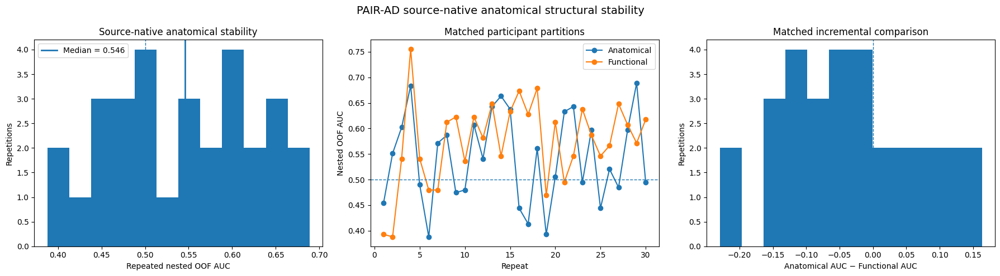


ANATOMICAL STRUCTURAL DECISION SUMMARY
Median repeated AUC: 0.5459183673469388
Fraction AUC > 0.50: 0.6
Fraction AUC > 0.60: 0.3

SOURCE-NATIVE ANATOMICAL CLASSIFICATION SIGNAL IS NOT ROBUST.
Do not search for a more complex structural classifier on this cohort.

CELL 41 COMPLETE

Feature table:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Anatomical_Structural_Stability\PAIR_AD_source_anatomical_structural_features.csv

Repeat results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Anatomical_Structural_Stability\PAIR_AD_anatomical_repeat_results.csv

Outer-fold results:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Anatomical_Structural_Stability\PAIR_AD_anatomical_outer_fold_results.csv

Predictions:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Anatomical_Structural_Stability\PAIR_AD_anatomical_repea

In [52]:
# ==================================================================================================
# CELL 41 — PAIR-AD SOURCE-NATIVE ANATOMICAL STRUCTURAL STABILITY
#
# EXPLORATORY ROBUSTNESS ANALYSIS
#
# PURPOSE
# -------
#
# Cell 40 rejected the generic:
#
#       RAW OCT -> frozen ImageNet ResNet50
#
# structural representation.
#
# The source archive itself provides three anatomy-related measurements:
#
#       whole
#       RPEtoOLM
#       RNFL
#
#
# We now test these SOURCE-NATIVE measurements directly.
#
#
# PRE-SPECIFIED STRUCTURAL REPRESENTATION
# ---------------------------------------
#
# For each correctly paired physical scan:
#
#       paired_measurement = (DARK + LIGHT) / 2
#
# This intentionally suppresses DARK/LIGHT stimulus-response information
# and represents the stable anatomical component.
#
#
# For each participant:
#
#       mean across physical scans
#       SD across physical scans
#
# for:
#
#       whole
#       RPEtoOLM
#       RNFL
#
#
# FINAL FEATURES = 6
#
#       whole_mean
#       whole_scan_sd
#       RPEtoOLM_mean
#       RPEtoOLM_scan_sd
#       RNFL_mean
#       RNFL_scan_sd
#
#
# IMPORTANT
# ---------
#
# - All six features are specified BEFORE classification.
# - No anatomical feature selection.
# - No use of angle as a classifier feature.
# - No functional profile features.
# - Same 30 repeated nested participant-level CV seeds as Cell 39/40.
#
# ==================================================================================================

from pathlib import Path
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    balanced_accuracy_score,
    confusion_matrix
)


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. LOCKED CONFIGURATION
# ==================================================================================================

BASE_SEED = 2026

N_REPEATS = 30

N_OUTER_FOLDS = 3

N_INNER_FOLDS = 3


C_GRID = [
    0.03,
    0.10,
    0.30,
    1.00,
    3.00
]


THRESHOLD_GRID = np.arange(
    0.10,
    0.91,
    0.01
)


# ==================================================================================================
# 2. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


SOURCE_PATH = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "PAIR_AD_source_native_profiles_CORRECTED.npz"
)


FUNCTIONAL_REPEAT_PATH = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_Split_Stability" /
    "PAIR_AD_functional_repeat_results.csv"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Anatomical_Structural_Stability"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


FEATURE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_source_anatomical_structural_features.csv"
)


REPEAT_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_anatomical_repeat_results.csv"
)


FOLD_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_anatomical_outer_fold_results.csv"
)


PREDICTION_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_anatomical_repeated_predictions.csv"
)


COMPARISON_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_vs_anatomical_repeat_comparison.csv"
)


FIGURE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_source_anatomical_stability.png"
)


print("=" * 120)
print("CELL 41 — SOURCE-NATIVE ANATOMICAL STRUCTURAL STABILITY")
print("=" * 120)


# ==================================================================================================
# 3. LOAD SOURCE-NATIVE CORRECTED DATA
# ==================================================================================================

assert SOURCE_PATH.exists(), SOURCE_PATH


data = np.load(
    SOURCE_PATH,
    allow_pickle=True
)


subjects_scan = data[
    "subject"
].astype(str)


y_scan = data[
    "y"
].astype(
    np.int64
)


source_scan_id = data[
    "source_scan_id"
].astype(
    np.int64
)


dark_whole = data[
    "dark_whole"
].astype(
    np.float64
)


light_whole = data[
    "light_whole"
].astype(
    np.float64
)


dark_rpe = data[
    "dark_RPEtoOLM"
].astype(
    np.float64
)


light_rpe = data[
    "light_RPEtoOLM"
].astype(
    np.float64
)


dark_rnfl = data[
    "dark_RNFL"
].astype(
    np.float64
)


light_rnfl = data[
    "light_RNFL"
].astype(
    np.float64
)


print("\n" + "=" * 120)
print("SOURCE-NATIVE ANATOMICAL INPUT")
print("=" * 120)


print(
    "Physical paired scans:",
    len(
        subjects_scan
    )
)


print(
    "Participants:",
    len(
        np.unique(
            subjects_scan
        )
    )
)


print(
    "whole:",
    dark_whole.shape
)


print(
    "RPEtoOLM:",
    dark_rpe.shape
)


print(
    "RNFL:",
    dark_rnfl.shape
)


assert len(
    subjects_scan
) == 135


assert len(
    np.unique(
        subjects_scan
    )
) == 28


# ==================================================================================================
# 4. FINITE VALUE AUDIT
# ==================================================================================================

arrays_to_check = {
    "dark_whole":
        dark_whole,

    "light_whole":
        light_whole,

    "dark_RPEtoOLM":
        dark_rpe,

    "light_RPEtoOLM":
        light_rpe,

    "dark_RNFL":
        dark_rnfl,

    "light_RNFL":
        light_rnfl
}


print("\n" + "=" * 120)
print("FINITE-VALUE AUDIT")
print("=" * 120)


for name, values in arrays_to_check.items():

    n_nonfinite = int(
        (
            ~np.isfinite(
                values
            )
        ).sum()
    )


    print(
        f"{name:20s}: "
        f"non-finite = {n_nonfinite}"
    )


    if n_nonfinite > 0:

        raise RuntimeError(
            f"{name} contains non-finite values."
        )


print(
    "\n✓ All source-native anatomical values are finite."
)


# ==================================================================================================
# 5. CREATE CONDITION-AVERAGED STRUCTURAL MEASUREMENTS
#
# These are fixed before classification.
#
# Functional DARK/LIGHT delta is deliberately NOT included.
# ==================================================================================================

pair_whole = (
    dark_whole
    +
    light_whole
) / 2.0


pair_rpe = (
    dark_rpe
    +
    light_rpe
) / 2.0


pair_rnfl = (
    dark_rnfl
    +
    light_rnfl
) / 2.0


# ==================================================================================================
# 6. PATIENT AGGREGATION
# ==================================================================================================

patient_subjects = sorted(
    np.unique(
        subjects_scan
    )
)


patient_rows = []


for subject_name in patient_subjects:

    idx = np.where(
        subjects_scan
        ==
        subject_name
    )[0]


    idx = idx[
        np.argsort(
            source_scan_id[
                idx
            ]
        )
    ]


    assert len(
        idx
    ) in [
        4,
        5
    ]


    assert len(
        np.unique(
            y_scan[
                idx
            ]
        )
    ) == 1


    patient_rows.append(
        {
            "folder_subject":
                subject_name,

            "target":
                int(
                    y_scan[
                        idx[
                            0
                        ]
                    ]
                ),

            "n_physical_scans":
                len(
                    idx
                ),

            "source_scan_ids":
                ",".join(
                    map(
                        str,
                        source_scan_id[
                            idx
                        ].tolist()
                    )
                ),

            # --------------------------------------------------------------------------------------
            # FIXED SIX FEATURES
            # --------------------------------------------------------------------------------------

            "whole_mean":
                float(
                    pair_whole[
                        idx
                    ].mean()
                ),

            "whole_scan_sd":
                float(
                    pair_whole[
                        idx
                    ].std(
                        ddof=0
                    )
                ),

            "RPEtoOLM_mean":
                float(
                    pair_rpe[
                        idx
                    ].mean()
                ),

            "RPEtoOLM_scan_sd":
                float(
                    pair_rpe[
                        idx
                    ].std(
                        ddof=0
                    )
                ),

            "RNFL_mean":
                float(
                    pair_rnfl[
                        idx
                    ].mean()
                ),

            "RNFL_scan_sd":
                float(
                    pair_rnfl[
                        idx
                    ].std(
                        ddof=0
                    )
                )
        }
    )


patient_df = pd.DataFrame(
    patient_rows
)


FEATURE_COLUMNS = [
    "whole_mean",
    "whole_scan_sd",
    "RPEtoOLM_mean",
    "RPEtoOLM_scan_sd",
    "RNFL_mean",
    "RNFL_scan_sd"
]


X = patient_df[
    FEATURE_COLUMNS
].values.astype(
    np.float64
)


y = patient_df[
    "target"
].values.astype(
    np.int64
)


subjects = patient_df[
    "folder_subject"
].astype(str).values


print("\n" + "=" * 120)
print("SOURCE-NATIVE PATIENT STRUCTURAL MATRIX")
print("=" * 120)


print(
    "Patients:",
    len(
        subjects
    )
)


print(
    "Control:",
    int(
        (
            y == 0
        ).sum()
    )
)


print(
    "AD:",
    int(
        (
            y == 1
        ).sum()
    )
)


print(
    "Matrix:",
    X.shape
)


print(
    "Features:"
)


for feature in FEATURE_COLUMNS:

    print(
        " ",
        feature
    )


assert X.shape == (
    28,
    6
)


assert (
    y == 0
).sum() == 14


assert (
    y == 1
).sum() == 14


assert np.isfinite(
    X
).all()


patient_df.to_csv(
    FEATURE_PATH,
    index=False
)


# ==================================================================================================
# 7. DESCRIPTIVE FEATURE AUDIT
#
# NO label comparison here.
# ==================================================================================================

print("\n" + "=" * 120)
print("FEATURE SCALE AUDIT")
print("=" * 120)


for j, feature in enumerate(
    FEATURE_COLUMNS
):

    print(
        f"{feature:22s} | "
        f"mean={X[:, j].mean():.6f} | "
        f"SD={X[:, j].std(ddof=1):.6f} | "
        f"min={X[:, j].min():.6f} | "
        f"max={X[:, j].max():.6f}"
    )


# ==================================================================================================
# 8. MODEL HELPER
# ==================================================================================================

def fit_predict(
    X_train,
    y_train,
    X_eval,
    C,
    seed
):

    scaler = StandardScaler()


    train_scaled = scaler.fit_transform(
        X_train
    )


    eval_scaled = scaler.transform(
        X_eval
    )


    model = LogisticRegression(
        C=float(
            C
        ),
        penalty="l2",
        solver="liblinear",
        max_iter=5000,
        random_state=int(
            seed
        )
    )


    model.fit(
        train_scaled,
        y_train
    )


    return model.predict_proba(
        eval_scaled
    )[
        :,
        1
    ]


# ==================================================================================================
# 9. THRESHOLD
# ==================================================================================================

def select_threshold(
    y_true,
    probability
):

    best_threshold = 0.50

    best_score = -np.inf


    for threshold in THRESHOLD_GRID:

        prediction = (
            probability
            >=
            threshold
        ).astype(
            int
        )


        score = balanced_accuracy_score(
            y_true,
            prediction
        )


        if score > best_score + 1e-12:

            best_score = score

            best_threshold = float(
                threshold
            )


        elif abs(
            score
            -
            best_score
        ) <= 1e-12:

            if abs(
                threshold
                -
                0.50
            ) < abs(
                best_threshold
                -
                0.50
            ):

                best_threshold = float(
                    threshold
                )


    return (
        best_threshold,
        best_score
    )


# ==================================================================================================
# 10. STORAGE
# ==================================================================================================

repeat_rows = []

fold_rows = []

prediction_rows = []


# ==================================================================================================
# 11. REPEATED NESTED CV
#
# EXACT outer seeds:
#
#       2026 ... 2055
#
# matching Cell 39 and Cell 40.
# ==================================================================================================

print("\n" + "=" * 120)
print("STARTING REPEATED PARTICIPANT-LEVEL NESTED CV")
print("=" * 120)


for repeat in range(
    N_REPEATS
):

    repeat_seed = (
        BASE_SEED
        +
        repeat
    )


    outer_cv = StratifiedKFold(
        n_splits=N_OUTER_FOLDS,
        shuffle=True,
        random_state=repeat_seed
    )


    repeat_probability = np.full(
        len(
            y
        ),
        np.nan,
        dtype=np.float64
    )


    repeat_prediction = np.full(
        len(
            y
        ),
        -1,
        dtype=np.int64
    )


    repeat_threshold = np.full(
        len(
            y
        ),
        np.nan,
        dtype=np.float64
    )


    fold_number = 0


    for outer_train, outer_test in outer_cv.split(
        X,
        y
    ):

        fold_number += 1


        inner_seed = (
            repeat_seed
            *
            100
            +
            fold_number
        )


        inner_cv = StratifiedKFold(
            n_splits=N_INNER_FOLDS,
            shuffle=True,
            random_state=inner_seed
        )


        inner_splits = list(
            inner_cv.split(
                X[
                    outer_train
                ],
                y[
                    outer_train
                ]
            )
        )


        # ==========================================================================================
        # SELECT C
        # ==========================================================================================

        C_results = []


        for C in C_GRID:

            aucs = []


            for local_train, local_val in inner_splits:

                train_idx = outer_train[
                    local_train
                ]


                val_idx = outer_train[
                    local_val
                ]


                probability = fit_predict(
                    X[
                        train_idx
                    ],
                    y[
                        train_idx
                    ],
                    X[
                        val_idx
                    ],
                    C,
                    inner_seed
                )


                aucs.append(
                    roc_auc_score(
                        y[
                            val_idx
                        ],
                        probability
                    )
                )


            C_results.append(
                {
                    "C":
                        C,

                    "mean_inner_auc":
                        float(
                            np.mean(
                                aucs
                            )
                        )
                }
            )


        C_df = pd.DataFrame(
            C_results
        )


        best_auc = C_df[
            "mean_inner_auc"
        ].max()


        candidates = C_df[
            np.isclose(
                C_df[
                    "mean_inner_auc"
                ],
                best_auc
            )
        ]


        # Strongest regularization on ties.

        selected_C = float(
            candidates[
                "C"
            ].min()
        )


        # ==========================================================================================
        # INNER OOF FOR THRESHOLD
        # ==========================================================================================

        inner_probability = np.full(
            len(
                outer_train
            ),
            np.nan,
            dtype=np.float64
        )


        for local_train, local_val in inner_splits:

            train_idx = outer_train[
                local_train
            ]


            val_idx = outer_train[
                local_val
            ]


            inner_probability[
                local_val
            ] = fit_predict(
                X[
                    train_idx
                ],
                y[
                    train_idx
                ],
                X[
                    val_idx
                ],
                selected_C,
                inner_seed
            )


        assert np.isfinite(
            inner_probability
        ).all()


        inner_y = y[
            outer_train
        ]


        inner_oof_auc = roc_auc_score(
            inner_y,
            inner_probability
        )


        threshold, inner_balanced = (
            select_threshold(
                inner_y,
                inner_probability
            )
        )


        # ==========================================================================================
        # OUTER TEST
        # ==========================================================================================

        probability = fit_predict(
            X[
                outer_train
            ],
            y[
                outer_train
            ],
            X[
                outer_test
            ],
            selected_C,
            repeat_seed
        )


        prediction = (
            probability
            >=
            threshold
        ).astype(
            int
        )


        repeat_probability[
            outer_test
        ] = probability


        repeat_prediction[
            outer_test
        ] = prediction


        repeat_threshold[
            outer_test
        ] = threshold


        fold_auc = roc_auc_score(
            y[
                outer_test
            ],
            probability
        )


        fold_ap = average_precision_score(
            y[
                outer_test
            ],
            probability
        )


        fold_rows.append(
            {
                "repeat":
                    repeat + 1,

                "repeat_seed":
                    repeat_seed,

                "outer_fold":
                    fold_number,

                "selected_C":
                    selected_C,

                "selected_threshold":
                    threshold,

                "inner_best_mean_auc":
                    best_auc,

                "inner_oof_auc":
                    inner_oof_auc,

                "inner_balanced_accuracy":
                    inner_balanced,

                "outer_auc":
                    fold_auc,

                "outer_average_precision":
                    fold_ap
            }
        )


    # ==============================================================================================
    # REPEAT OOF
    # ==============================================================================================

    assert np.isfinite(
        repeat_probability
    ).all()


    repeat_auc = roc_auc_score(
        y,
        repeat_probability
    )


    repeat_ap = average_precision_score(
        y,
        repeat_probability
    )


    repeat_accuracy = accuracy_score(
        y,
        repeat_prediction
    )


    repeat_balanced = balanced_accuracy_score(
        y,
        repeat_prediction
    )


    tn, fp, fn, tp = confusion_matrix(
        y,
        repeat_prediction,
        labels=[
            0,
            1
        ]
    ).ravel()


    sensitivity = (
        tp
        /
        max(
            tp + fn,
            1
        )
    )


    specificity = (
        tn
        /
        max(
            tn + fp,
            1
        )
    )


    repeat_rows.append(
        {
            "repeat":
                repeat + 1,

            "repeat_seed":
                repeat_seed,

            "auc":
                repeat_auc,

            "average_precision":
                repeat_ap,

            "accuracy":
                repeat_accuracy,

            "balanced_accuracy":
                repeat_balanced,

            "sensitivity":
                sensitivity,

            "specificity":
                specificity
        }
    )


    for i in range(
        len(
            subjects
        )
    ):

        prediction_rows.append(
            {
                "repeat":
                    repeat + 1,

                "repeat_seed":
                    repeat_seed,

                "folder_subject":
                    subjects[
                        i
                    ],

                "target":
                    int(
                        y[
                            i
                        ]
                    ),

                "probability_AD":
                    float(
                        repeat_probability[
                            i
                        ]
                    ),

                "threshold":
                    float(
                        repeat_threshold[
                            i
                        ]
                    ),

                "prediction":
                    int(
                        repeat_prediction[
                            i
                        ]
                    )
            }
        )


    print(
        f"Repeat "
        f"{repeat+1:02d}/{N_REPEATS} "
        f"| AUC={repeat_auc:.4f} "
        f"| AP={repeat_ap:.4f} "
        f"| BAcc={repeat_balanced:.4f}"
    )


# ==================================================================================================
# 12. RESULTS
# ==================================================================================================

repeat_df = pd.DataFrame(
    repeat_rows
)


fold_df = pd.DataFrame(
    fold_rows
)


prediction_df = pd.DataFrame(
    prediction_rows
)


print("\n" + "=" * 120)
print("ANATOMICAL REPEATED-CV PERFORMANCE")
print("=" * 120)


for metric in [
    "auc",
    "average_precision",
    "accuracy",
    "balanced_accuracy",
    "sensitivity",
    "specificity"
]:

    values = repeat_df[
        metric
    ].values


    print(
        f"\n{metric}"
    )


    print(
        "  Mean   :",
        float(
            values.mean()
        )
    )


    print(
        "  Median :",
        float(
            np.median(
                values
            )
        )
    )


    print(
        "  SD     :",
        float(
            values.std(
                ddof=1
            )
        )
    )


    print(
        "  Q1     :",
        float(
            np.percentile(
                values,
                25
            )
        )
    )


    print(
        "  Q3     :",
        float(
            np.percentile(
                values,
                75
            )
        )
    )


    print(
        "  Minimum:",
        float(
            values.min()
        )
    )


    print(
        "  Maximum:",
        float(
            values.max()
        )
    )


# ==================================================================================================
# 13. ROBUSTNESS COUNTS
# ==================================================================================================

print("\n" + "=" * 120)
print("ANATOMICAL AUC ROBUSTNESS")
print("=" * 120)


for cutoff in [
    0.50,
    0.55,
    0.60,
    0.65,
    0.70
]:

    count = int(
        (
            repeat_df[
                "auc"
            ]
            >
            cutoff
        ).sum()
    )


    print(
        f"AUC > {cutoff:.2f}: "
        f"{count}/{N_REPEATS} "
        f"({100*count/N_REPEATS:.1f}%)"
    )


# ==================================================================================================
# 14. ALL 90 OUTER FOLDS
# ==================================================================================================

print("\n" + "=" * 120)
print("ALL ANATOMICAL OUTER-FOLD AUCs")
print("=" * 120)


fold_auc = fold_df[
    "outer_auc"
].values


print(
    "Evaluations:",
    len(
        fold_auc
    )
)


print(
    "Mean:",
    float(
        fold_auc.mean()
    )
)


print(
    "Median:",
    float(
        np.median(
            fold_auc
        )
    )
)


print(
    "SD:",
    float(
        fold_auc.std(
            ddof=1
        )
    )
)


print(
    "Minimum:",
    float(
        fold_auc.min()
    )
)


print(
    "Maximum:",
    float(
        fold_auc.max()
    )
)


# ==================================================================================================
# 15. MATCHED COMPARISON WITH LOCKED FUNCTIONAL BRANCH
# ==================================================================================================

print("\n" + "=" * 120)
print("MATCHED FUNCTIONAL VS ANATOMICAL COMPARISON")
print("=" * 120)


if FUNCTIONAL_REPEAT_PATH.exists():

    functional_repeat = pd.read_csv(
        FUNCTIONAL_REPEAT_PATH
    )


    comparison = repeat_df.merge(
        functional_repeat[
            [
                "repeat",
                "repeat_seed",
                "auc",
                "average_precision"
            ]
        ].rename(
            columns={
                "auc":
                    "functional_auc",

                "average_precision":
                    "functional_AP"
            }
        ),
        on=[
            "repeat",
            "repeat_seed"
        ],
        how="inner"
    )


    comparison = comparison.rename(
        columns={
            "auc":
                "anatomical_auc",

            "average_precision":
                "anatomical_AP"
        }
    )


    comparison[
        "anatomical_minus_functional_auc"
    ] = (
        comparison[
            "anatomical_auc"
        ]
        -
        comparison[
            "functional_auc"
        ]
    )


    comparison.to_csv(
        COMPARISON_PATH,
        index=False
    )


    print(
        "Matched repetitions:",
        len(
            comparison
        )
    )


    print(
        "\nFunctional median AUC:",
        float(
            comparison[
                "functional_auc"
            ].median()
        )
    )


    print(
        "Anatomical median AUC:",
        float(
            comparison[
                "anatomical_auc"
            ].median()
        )
    )


    print(
        "\nMedian anatomical - functional:",
        float(
            comparison[
                "anatomical_minus_functional_auc"
            ].median()
        )
    )


    print(
        "Anatomical > functional:",
        int(
            (
                comparison[
                    "anatomical_minus_functional_auc"
                ]
                >
                0
            ).sum()
        ),
        "/",
        len(
            comparison
        )
    )


else:

    comparison = None


    print(
        "Cell 39 repeat file was not found."
    )


# ==================================================================================================
# 16. SAVE
# ==================================================================================================

repeat_df.to_csv(
    REPEAT_PATH,
    index=False
)


fold_df.to_csv(
    FOLD_PATH,
    index=False
)


prediction_df.to_csv(
    PREDICTION_PATH,
    index=False
)


# ==================================================================================================
# 17. FIGURE
# ==================================================================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(
        18,
        5
    )
)


# --------------------------------------------------------------------------------------------------
# A. Anatomical repeated AUC
# --------------------------------------------------------------------------------------------------

axes[
    0
].hist(
    repeat_df[
        "auc"
    ],
    bins=12
)


axes[
    0
].axvline(
    0.50,
    linestyle="--",
    linewidth=1
)


axes[
    0
].axvline(
    repeat_df[
        "auc"
    ].median(),
    linewidth=2,
    label=(
        f"Median = "
        f"{repeat_df['auc'].median():.3f}"
    )
)


axes[
    0
].set_xlabel(
    "Repeated nested OOF AUC"
)


axes[
    0
].set_ylabel(
    "Repetitions"
)


axes[
    0
].set_title(
    "Source-native anatomical stability"
)


axes[
    0
].legend()


# --------------------------------------------------------------------------------------------------
# B. Repeats
# --------------------------------------------------------------------------------------------------

axes[
    1
].plot(
    np.arange(
        1,
        N_REPEATS + 1
    ),
    repeat_df[
        "auc"
    ],
    marker="o",
    label="Anatomical"
)


if comparison is not None:

    axes[
        1
    ].plot(
        comparison[
            "repeat"
        ],
        comparison[
            "functional_auc"
        ],
        marker="o",
        label="Functional"
    )


axes[
    1
].axhline(
    0.50,
    linestyle="--",
    linewidth=1
)


axes[
    1
].set_xlabel(
    "Repeat"
)


axes[
    1
].set_ylabel(
    "Nested OOF AUC"
)


axes[
    1
].set_title(
    "Matched participant partitions"
)


axes[
    1
].legend()


# --------------------------------------------------------------------------------------------------
# C. Matched delta
# --------------------------------------------------------------------------------------------------

if comparison is not None:

    axes[
        2
    ].hist(
        comparison[
            "anatomical_minus_functional_auc"
        ],
        bins=12
    )


    axes[
        2
    ].axvline(
        0,
        linestyle="--",
        linewidth=1
    )


    axes[
        2
    ].set_xlabel(
        "Anatomical AUC − Functional AUC"
    )


    axes[
        2
    ].set_ylabel(
        "Repetitions"
    )


    axes[
        2
    ].set_title(
        "Matched incremental comparison"
    )


else:

    axes[
        2
    ].axis(
        "off"
    )


plt.suptitle(
    "PAIR-AD source-native anatomical structural stability",
    fontsize=14
)


plt.tight_layout()


plt.savefig(
    FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 18. DECISION SUMMARY
# ==================================================================================================

median_auc = float(
    repeat_df[
        "auc"
    ].median()
)


fraction_above_chance = float(
    (
        repeat_df[
            "auc"
        ]
        >
        0.50
    ).mean()
)


fraction_above_060 = float(
    (
        repeat_df[
            "auc"
        ]
        >
        0.60
    ).mean()
)


print("\n" + "=" * 120)
print("ANATOMICAL STRUCTURAL DECISION SUMMARY")
print("=" * 120)


print(
    "Median repeated AUC:",
    median_auc
)


print(
    "Fraction AUC > 0.50:",
    fraction_above_chance
)


print(
    "Fraction AUC > 0.60:",
    fraction_above_060
)


if (
    median_auc >= 0.60
    and
    fraction_above_chance >= 0.80
):

    print(
        "\n✓ SOURCE-NATIVE ANATOMICAL SIGNAL IS REASONABLY ROBUST."
    )


    print(
        "A final pre-specified functional + anatomical fusion "
        "experiment is justified."
    )


elif (
    median_auc >= 0.55
    and
    fraction_above_chance >= 0.65
):

    print(
        "\nSOURCE-NATIVE ANATOMICAL SIGNAL IS WEAK BUT PRESENT."
    )


    print(
        "It may be evaluated as a complementary exploratory branch."
    )


else:

    print(
        "\nSOURCE-NATIVE ANATOMICAL CLASSIFICATION SIGNAL IS NOT ROBUST."
    )


    print(
        "Do not search for a more complex structural classifier "
        "on this cohort."
    )


# ==================================================================================================
# 19. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 41 COMPLETE")
print("=" * 120)


print(
    "\nFeature table:"
)

print(
    FEATURE_PATH
)


print(
    "\nRepeat results:"
)

print(
    REPEAT_PATH
)


print(
    "\nOuter-fold results:"
)

print(
    FOLD_PATH
)


print(
    "\nPredictions:"
)

print(
    PREDICTION_PATH
)


print(
    "\nFunctional comparison:"
)

print(
    COMPARISON_PATH
)


print(
    "\nFigure:"
)

print(
    FIGURE_PATH
)


print(
    "\nSEND ME:"
)


print(
    "  1. SOURCE-NATIVE PATIENT STRUCTURAL MATRIX"
)


print(
    "  2. FEATURE SCALE AUDIT"
)


print(
    "  3. ANATOMICAL REPEATED-CV PERFORMANCE"
)


print(
    "  4. ANATOMICAL AUC ROBUSTNESS"
)


print(
    "  5. ALL ANATOMICAL OUTER-FOLD AUCs"
)


print(
    "  6. MATCHED FUNCTIONAL VS ANATOMICAL COMPARISON"
)


print(
    "  7. ANATOMICAL STRUCTURAL DECISION SUMMARY"
)


print(
    "  8. The figure"
)

CELL 42 — LOCKED FUNCTIONAL PATIENT-LEVEL PERMUTATION AUDIT

Permutations: 250
Repeated nested CV evaluations / permutation: 30

LOCKED FUNCTIONAL INPUT
Participants: 28
Control: 14
AD: 14
Feature matrix: (28, 12)
Feature count: 12

RECOMPUTING OBSERVED LOCKED FUNCTIONAL PERFORMANCE
Observed mean repeated AUC: 0.5753401360544217
Observed median repeated AUC: 0.5841836734693877
Observed SD: 0.0818597664644771
Observed Q1: 0.5408163265306123
Observed Q3: 0.6262755102040816

CELL 39 REPLICATION CHECK
Cell 39 mean: 0.5753401360544217
Cell 42 recomputed mean: 0.5753401360544217
Cell 39 median: 0.5841836734693877
Cell 42 recomputed median: 0.5841836734693877
Mean difference: 0.0
Median difference: 0.0
✓ Cell 39 AUC distribution reproduced exactly.

STARTING PATIENT-LABEL PERMUTATIONS
Permutation  25/250 | current null median=0.4974 | elapsed=1.5 min
Permutation  50/250 | current null median=0.6148 | elapsed=2.8 min
Permutation  75/250 | current null median=0.2092 | elapsed=4.2 min
Permutatio

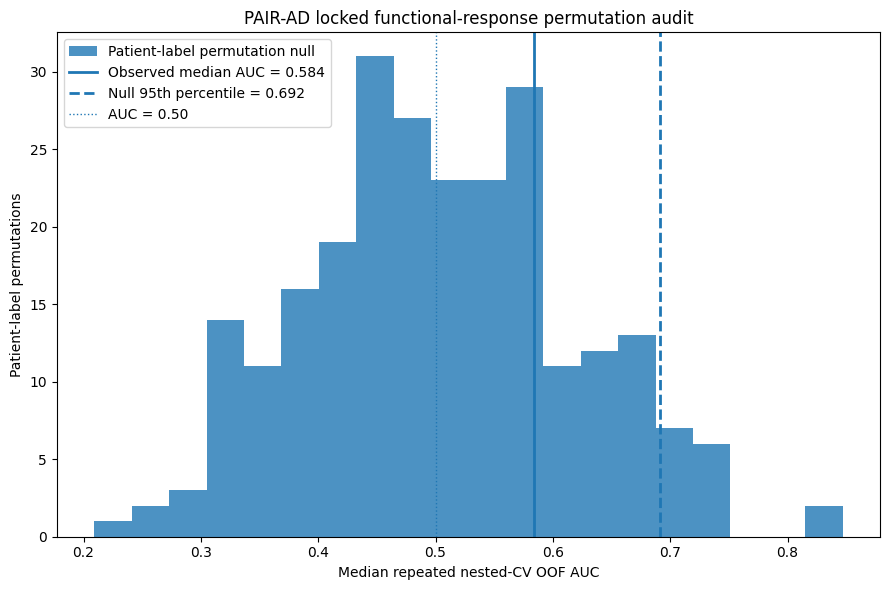


CELL 42 COMPLETE

Permutation null:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_Permutation_Audit\PAIR_AD_functional_permutation_null.csv

Observed repeat AUCs:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_Permutation_Audit\PAIR_AD_functional_observed_repeat_AUCs.csv

Summary:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_Permutation_Audit\PAIR_AD_functional_permutation_summary.txt

Figure:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\Source_Native_Profiles\Functional_Permutation_Audit\PAIR_AD_functional_permutation_null.png

SEND ME:
  1. CELL 39 REPLICATION CHECK
  2. PERMUTATION NULL DISTRIBUTION
  3. EMPIRICAL FUNCTIONAL-SIGNAL TEST
  4. PERMUTATION DECISION SUMMARY
  5. The permutation figure


In [53]:
# ==================================================================================================
# CELL 42 — PAIR-AD LOCKED FUNCTIONAL PATIENT-LEVEL PERMUTATION AUDIT
#
# EXPLORATORY INFERENTIAL ROBUSTNESS TEST
#
# PURPOSE
# -------
#
# Test whether the LOCKED corrected source-native functional representation
# performs better than would be expected under randomly permuted participant
# diagnoses.
#
#
# LOCKED INPUT
# ------------
#
# EXACT 12 Cell-38/39 functional features:
#
#   6 DCT coefficients from patient mean response
#   6 DCT coefficients from patient scan-SD response
#
#
# LOCKED CLASSIFIER
# -----------------
#
# StandardScaler
# +
# L2 Logistic Regression
#
#
# LOCKED MODEL SELECTION
# ----------------------
#
# C grid:
#
#       0.03, 0.10, 0.30, 1.00, 3.00
#
# selected by INNER mean AUC only.
#
#
# PRIMARY STATISTIC
# -----------------
#
# Median of 30 repeated nested-CV OOF AUCs.
#
#
# NULL HYPOTHESIS
# ---------------
#
# Diagnosis labels are exchangeable across the 28 participants.
#
#
# IMPORTANT
# ---------
#
# Labels are permuted at the PATIENT level.
#
# The complete nested training/model-selection procedure is rerun
# for every permutation.
#
# This is NOT a permutation of already-generated probabilities.
#
#
# Because the cohort has already been used during model development,
# this remains EXPLORATORY rather than an independent confirmatory test.
#
# ==================================================================================================

from pathlib import Path
import warnings
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. LOCKED CONFIGURATION
# ==================================================================================================

BASE_SEED = 2026

N_REPEATS = 30

N_OUTER_FOLDS = 3

N_INNER_FOLDS = 3


C_GRID = [
    0.03,
    0.10,
    0.30,
    1.00,
    3.00
]


# 250 gives minimum empirical p approximately:
#
#       1 / 251 = 0.00398
#
# For the final frozen manuscript analysis this could later be
# increased, but DO NOT change it in response to the result.

N_PERMUTATIONS = 250

PERMUTATION_SEED = 42026


# ==================================================================================================
# 2. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


FUNCTIONAL_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_DCT_Baseline"
)


STABILITY_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_Split_Stability"
)


FEATURE_PATH = (
    FUNCTIONAL_DIR /
    "PAIR_AD_source_functional_DCT_features.csv"
)


CELL39_REPEAT_PATH = (
    STABILITY_DIR /
    "PAIR_AD_functional_repeat_results.csv"
)


OUTPUT_DIR = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_Permutation_Audit"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


NULL_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_permutation_null.csv"
)


OBSERVED_REPEAT_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_observed_repeat_AUCs.csv"
)


SUMMARY_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_permutation_summary.txt"
)


FIGURE_PATH = (
    OUTPUT_DIR /
    "PAIR_AD_functional_permutation_null.png"
)


print("=" * 120)
print("CELL 42 — LOCKED FUNCTIONAL PATIENT-LEVEL PERMUTATION AUDIT")
print("=" * 120)


print(
    "\nPermutations:",
    N_PERMUTATIONS
)


print(
    "Repeated nested CV evaluations / permutation:",
    N_REPEATS
)


# ==================================================================================================
# 3. LOAD LOCKED FEATURES
# ==================================================================================================

assert FEATURE_PATH.exists(), FEATURE_PATH


feature_df = pd.read_csv(
    FEATURE_PATH
)


subjects = feature_df[
    "folder_subject"
].astype(str).values


y_observed = feature_df[
    "target"
].values.astype(
    np.int64
)


feature_columns = [
    column
    for column in feature_df.columns
    if (
        column.startswith(
            "mean_response_dct"
        )
        or
        column.startswith(
            "scan_sd_response_dct"
        )
    )
]


X = feature_df[
    feature_columns
].values.astype(
    np.float64
)


print("\n" + "=" * 120)
print("LOCKED FUNCTIONAL INPUT")
print("=" * 120)


print(
    "Participants:",
    len(
        subjects
    )
)


print(
    "Control:",
    int(
        (
            y_observed == 0
        ).sum()
    )
)


print(
    "AD:",
    int(
        (
            y_observed == 1
        ).sum()
    )
)


print(
    "Feature matrix:",
    X.shape
)


print(
    "Feature count:",
    len(
        feature_columns
    )
)


assert X.shape == (
    28,
    12
)


assert (
    y_observed == 0
).sum() == 14


assert (
    y_observed == 1
).sum() == 14


assert np.isfinite(
    X
).all()


# ==================================================================================================
# 4. LOCKED CLASSIFIER
# ==================================================================================================

def fit_predict(
    X_train,
    y_train,
    X_eval,
    C,
    seed
):

    scaler = StandardScaler()


    X_train_scaled = scaler.fit_transform(
        X_train
    )


    X_eval_scaled = scaler.transform(
        X_eval
    )


    model = LogisticRegression(
        C=float(
            C
        ),
        penalty="l2",
        solver="liblinear",
        max_iter=5000,
        random_state=int(
            seed
        )
    )


    model.fit(
        X_train_scaled,
        y_train
    )


    return model.predict_proba(
        X_eval_scaled
    )[
        :,
        1
    ]


# ==================================================================================================
# 5. ONE COMPLETE 30-REPEAT NESTED-CV EVALUATION
#
# This is the exact threshold-free AUC pipeline needed for the
# permutation test.
#
# Threshold optimization is intentionally unnecessary because
# the primary statistic is AUC.
# ==================================================================================================

def evaluate_label_vector(
    labels
):

    labels = np.asarray(
        labels,
        dtype=np.int64
    )


    repeat_aucs = []


    for repeat in range(
        N_REPEATS
    ):

        repeat_seed = (
            BASE_SEED
            +
            repeat
        )


        outer_cv = StratifiedKFold(
            n_splits=N_OUTER_FOLDS,
            shuffle=True,
            random_state=repeat_seed
        )


        oof_probability = np.full(
            len(
                labels
            ),
            np.nan,
            dtype=np.float64
        )


        outer_fold_number = 0


        for outer_train, outer_test in outer_cv.split(
            X,
            labels
        ):

            outer_fold_number += 1


            inner_seed = (
                repeat_seed
                *
                100
                +
                outer_fold_number
            )


            inner_cv = StratifiedKFold(
                n_splits=N_INNER_FOLDS,
                shuffle=True,
                random_state=inner_seed
            )


            inner_splits = list(
                inner_cv.split(
                    X[
                        outer_train
                    ],
                    labels[
                        outer_train
                    ]
                )
            )


            # ======================================================================================
            # SELECT C USING INNER MEAN AUC
            # ======================================================================================

            C_results = []


            for C in C_GRID:

                inner_aucs = []


                for (
                    local_train,
                    local_val
                ) in inner_splits:

                    train_idx = outer_train[
                        local_train
                    ]


                    val_idx = outer_train[
                        local_val
                    ]


                    probability = fit_predict(
                        X[
                            train_idx
                        ],
                        labels[
                            train_idx
                        ],
                        X[
                            val_idx
                        ],
                        C,
                        inner_seed
                    )


                    inner_auc = roc_auc_score(
                        labels[
                            val_idx
                        ],
                        probability
                    )


                    inner_aucs.append(
                        inner_auc
                    )


                C_results.append(
                    (
                        float(
                            C
                        ),
                        float(
                            np.mean(
                                inner_aucs
                            )
                        )
                    )
                )


            best_inner_auc = max(
                score
                for _, score in C_results
            )


            # Strongest regularization in ties.

            selected_C = min(
                C
                for C, score in C_results
                if np.isclose(
                    score,
                    best_inner_auc
                )
            )


            # ======================================================================================
            # OUTER TEST
            # ======================================================================================

            outer_probability = fit_predict(
                X[
                    outer_train
                ],
                labels[
                    outer_train
                ],
                X[
                    outer_test
                ],
                selected_C,
                repeat_seed
            )


            oof_probability[
                outer_test
            ] = outer_probability


        assert np.isfinite(
            oof_probability
        ).all()


        repeat_auc = roc_auc_score(
            labels,
            oof_probability
        )


        repeat_aucs.append(
            repeat_auc
        )


    repeat_aucs = np.asarray(
        repeat_aucs,
        dtype=np.float64
    )


    return {
        "repeat_aucs":
            repeat_aucs,

        "mean_auc":
            float(
                repeat_aucs.mean()
            ),

        "median_auc":
            float(
                np.median(
                    repeat_aucs
                )
            ),

        "sd_auc":
            float(
                repeat_aucs.std(
                    ddof=1
                )
            ),

        "q1_auc":
            float(
                np.percentile(
                    repeat_aucs,
                    25
                )
            ),

        "q3_auc":
            float(
                np.percentile(
                    repeat_aucs,
                    75
                )
            )
    }


# ==================================================================================================
# 6. OBSERVED LABEL EVALUATION
# ==================================================================================================

print("\n" + "=" * 120)
print("RECOMPUTING OBSERVED LOCKED FUNCTIONAL PERFORMANCE")
print("=" * 120)


start_time = time.time()


observed = evaluate_label_vector(
    y_observed
)


observed_repeat_aucs = observed[
    "repeat_aucs"
]


print(
    "Observed mean repeated AUC:",
    observed[
        "mean_auc"
    ]
)


print(
    "Observed median repeated AUC:",
    observed[
        "median_auc"
    ]
)


print(
    "Observed SD:",
    observed[
        "sd_auc"
    ]
)


print(
    "Observed Q1:",
    observed[
        "q1_auc"
    ]
)


print(
    "Observed Q3:",
    observed[
        "q3_auc"
    ]
)


# ==================================================================================================
# 7. CROSS-CHECK AGAINST CELL 39
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 39 REPLICATION CHECK")
print("=" * 120)


if CELL39_REPEAT_PATH.exists():

    cell39_df = pd.read_csv(
        CELL39_REPEAT_PATH
    )


    cell39_median = float(
        cell39_df[
            "auc"
        ].median()
    )


    cell39_mean = float(
        cell39_df[
            "auc"
        ].mean()
    )


    print(
        "Cell 39 mean:",
        cell39_mean
    )


    print(
        "Cell 42 recomputed mean:",
        observed[
            "mean_auc"
        ]
    )


    print(
        "Cell 39 median:",
        cell39_median
    )


    print(
        "Cell 42 recomputed median:",
        observed[
            "median_auc"
        ]
    )


    mean_difference = abs(
        cell39_mean
        -
        observed[
            "mean_auc"
        ]
    )


    median_difference = abs(
        cell39_median
        -
        observed[
            "median_auc"
        ]
    )


    print(
        "Mean difference:",
        mean_difference
    )


    print(
        "Median difference:",
        median_difference
    )


    if (
        mean_difference < 1e-10
        and
        median_difference < 1e-10
    ):

        print(
            "✓ Cell 39 AUC distribution reproduced exactly."
        )


    else:

        print(
            "WARNING: Cell 39 was not reproduced exactly."
        )


        print(
            "Do NOT interpret the permutation result until "
            "the discrepancy is understood."
        )


else:

    print(
        "Cell 39 repeat-results file was not found."
    )


# ==================================================================================================
# 8. SAVE OBSERVED REPEATS
# ==================================================================================================

observed_repeat_df = pd.DataFrame(
    {
        "repeat":
            np.arange(
                1,
                N_REPEATS + 1
            ),

        "repeat_seed":
            np.arange(
                BASE_SEED,
                BASE_SEED + N_REPEATS
            ),

        "observed_auc":
            observed_repeat_aucs
    }
)


observed_repeat_df.to_csv(
    OBSERVED_REPEAT_PATH,
    index=False
)


# ==================================================================================================
# 9. PATIENT-LEVEL PERMUTATION NULL
# ==================================================================================================

print("\n" + "=" * 120)
print("STARTING PATIENT-LABEL PERMUTATIONS")
print("=" * 120)


rng = np.random.default_rng(
    PERMUTATION_SEED
)


null_rows = []


for permutation in range(
    N_PERMUTATIONS
):

    # ----------------------------------------------------------------------------------------------
    # Patient-level label permutation.
    #
    # Exactly preserves:
    #
    #       14 Control
    #       14 AD
    # ----------------------------------------------------------------------------------------------

    y_permuted = rng.permutation(
        y_observed
    )


    assert (
        y_permuted == 0
    ).sum() == 14


    assert (
        y_permuted == 1
    ).sum() == 14


    result = evaluate_label_vector(
        y_permuted
    )


    null_rows.append(
        {
            "permutation":
                permutation + 1,

            "mean_repeated_auc":
                result[
                    "mean_auc"
                ],

            "median_repeated_auc":
                result[
                    "median_auc"
                ],

            "sd_repeated_auc":
                result[
                    "sd_auc"
                ],

            "q1_repeated_auc":
                result[
                    "q1_auc"
                ],

            "q3_repeated_auc":
                result[
                    "q3_auc"
                ]
        }
    )


    if (
        (permutation + 1) % 25 == 0
        or
        permutation + 1 == N_PERMUTATIONS
    ):

        elapsed_minutes = (
            time.time()
            -
            start_time
        ) / 60.0


        print(
            f"Permutation "
            f"{permutation+1:3d}/{N_PERMUTATIONS} "
            f"| current null median="
            f"{result['median_auc']:.4f} "
            f"| elapsed="
            f"{elapsed_minutes:.1f} min"
        )


null_df = pd.DataFrame(
    null_rows
)


null_df.to_csv(
    NULL_PATH,
    index=False
)


# ==================================================================================================
# 10. NULL DISTRIBUTION
# ==================================================================================================

null_median_auc = null_df[
    "median_repeated_auc"
].values


observed_median_auc = observed[
    "median_auc"
]


print("\n" + "=" * 120)
print("PERMUTATION NULL DISTRIBUTION")
print("=" * 120)


print(
    "Null mean of median AUC:",
    float(
        null_median_auc.mean()
    )
)


print(
    "Null median of median AUC:",
    float(
        np.median(
            null_median_auc
        )
    )
)


print(
    "Null SD:",
    float(
        null_median_auc.std(
            ddof=1
        )
    )
)


print(
    "Null 2.5th percentile:",
    float(
        np.percentile(
            null_median_auc,
            2.5
        )
    )
)


print(
    "Null 95th percentile:",
    float(
        np.percentile(
            null_median_auc,
            95
        )
    )
)


print(
    "Null 97.5th percentile:",
    float(
        np.percentile(
            null_median_auc,
            97.5
        )
    )
)


print(
    "Null 99th percentile:",
    float(
        np.percentile(
            null_median_auc,
            99
        )
    )
)


# ==================================================================================================
# 11. EMPIRICAL ONE-SIDED P VALUE
#
# H1:
#
#       observed statistic > permutation null
#
# Add-one correction prevents p=0.
# ==================================================================================================

n_null_ge_observed = int(
    (
        null_median_auc
        >=
        observed_median_auc
    ).sum()
)


empirical_p = (

    1.0
    +
    n_null_ge_observed

) / (

    N_PERMUTATIONS
    +
    1.0
)


observed_percentile = (

    100.0
    *
    np.mean(
        null_median_auc
        <
        observed_median_auc
    )
)


effect_over_null_median = (

    observed_median_auc
    -
    np.median(
        null_median_auc
    )
)


print("\n" + "=" * 120)
print("EMPIRICAL FUNCTIONAL-SIGNAL TEST")
print("=" * 120)


print(
    "Observed median repeated AUC:",
    observed_median_auc
)


print(
    "Null median repeated AUC:",
    float(
        np.median(
            null_median_auc
        )
    )
)


print(
    "Observed - null median:",
    float(
        effect_over_null_median
    )
)


print(
    "Null permutations >= observed:",
    n_null_ge_observed,
    "/",
    N_PERMUTATIONS
)


print(
    "Empirical one-sided p:",
    float(
        empirical_p
    )
)


print(
    "Observed percentile of permutation null:",
    float(
        observed_percentile
    )
)


# ==================================================================================================
# 12. DECISION SUMMARY
# ==================================================================================================

null_95 = float(
    np.percentile(
        null_median_auc,
        95
    )
)


print("\n" + "=" * 120)
print("PERMUTATION DECISION SUMMARY")
print("=" * 120)


if (
    empirical_p < 0.05
    and
    observed_median_auc > null_95
):

    print(
        "✓ THE LOCKED FUNCTIONAL PIPELINE EXCEEDS THE "
        "95% PATIENT-LABEL PERMUTATION NULL."
    )


    print(
        "There is exploratory evidence that the corrected "
        "source-native functional response contains AD-related "
        "patient-level information."
    )


    print(
        "However, effect magnitude remains modest and external "
        "validation is still required."
    )


else:

    print(
        "THE LOCKED FUNCTIONAL PIPELINE DOES NOT CLEAR THE "
        "95% PATIENT-LABEL PERMUTATION NULL."
    )


    print(
        "The observed AUC should therefore not be treated as "
        "reliable patient-level discrimination in this cohort."
    )


print(
    "\nDo NOT change the feature representation or model "
    "based on this permutation result."
)


# ==================================================================================================
# 13. FIGURE
# ==================================================================================================

plt.figure(
    figsize=(
        9,
        6
    )
)


plt.hist(
    null_median_auc,
    bins=20,
    alpha=0.80,
    label="Patient-label permutation null"
)


plt.axvline(
    observed_median_auc,
    linewidth=2,
    label=(
        f"Observed median AUC = "
        f"{observed_median_auc:.3f}"
    )
)


plt.axvline(
    null_95,
    linestyle="--",
    linewidth=2,
    label=(
        f"Null 95th percentile = "
        f"{null_95:.3f}"
    )
)


plt.axvline(
    0.50,
    linestyle=":",
    linewidth=1,
    label="AUC = 0.50"
)


plt.xlabel(
    "Median repeated nested-CV OOF AUC"
)


plt.ylabel(
    "Patient-label permutations"
)


plt.title(
    "PAIR-AD locked functional-response permutation audit"
)


plt.legend()


plt.tight_layout()


plt.savefig(
    FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 14. SUMMARY FILE
# ==================================================================================================

with open(
    SUMMARY_PATH,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PAIR-AD LOCKED FUNCTIONAL PERMUTATION AUDIT\n"
    )


    f.write(
        "=" * 90
        +
        "\n\n"
    )


    f.write(
        "STATUS: exploratory inference after model development\n\n"
    )


    f.write(
        f"Participants: 28\n"
    )


    f.write(
        f"Control: 14\n"
    )


    f.write(
        f"AD: 14\n"
    )


    f.write(
        f"Features: 12 locked DCT functional features\n"
    )


    f.write(
        f"Repeated nested CV: {N_REPEATS} x 3-fold\n"
    )


    f.write(
        f"Patient-label permutations: {N_PERMUTATIONS}\n\n"
    )


    f.write(
        f"Observed median repeated AUC: "
        f"{observed_median_auc:.8f}\n"
    )


    f.write(
        f"Permutation-null median: "
        f"{np.median(null_median_auc):.8f}\n"
    )


    f.write(
        f"Permutation-null 95th percentile: "
        f"{null_95:.8f}\n"
    )


    f.write(
        f"Observed minus null median: "
        f"{effect_over_null_median:.8f}\n"
    )


    f.write(
        f"Empirical one-sided p: "
        f"{empirical_p:.8f}\n"
    )


    f.write(
        f"Observed percentile of null: "
        f"{observed_percentile:.4f}%\n"
    )


# ==================================================================================================
# 15. COMPLETE
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 42 COMPLETE")
print("=" * 120)


print(
    "\nPermutation null:"
)

print(
    NULL_PATH
)


print(
    "\nObserved repeat AUCs:"
)

print(
    OBSERVED_REPEAT_PATH
)


print(
    "\nSummary:"
)

print(
    SUMMARY_PATH
)


print(
    "\nFigure:"
)

print(
    FIGURE_PATH
)


print(
    "\nSEND ME:"
)


print(
    "  1. CELL 39 REPLICATION CHECK"
)


print(
    "  2. PERMUTATION NULL DISTRIBUTION"
)


print(
    "  3. EMPIRICAL FUNCTIONAL-SIGNAL TEST"
)


print(
    "  4. PERMUTATION DECISION SUMMARY"
)


print(
    "  5. The permutation figure"
)

In [54]:
# ==================================================================================================
# CELL 43 — PAIR-AD ANALYSIS FREEZE + FINAL EVIDENCE CONSOLIDATION
#
# NO MODEL TRAINING
# NO NEW FEATURE ENGINEERING
# NO HYPERPARAMETER SEARCH
#
# PURPOSE
# -------
# Freeze the current scientifically validated analysis state and produce
# manuscript-ready summary tables.
# ==================================================================================================

from pathlib import Path
import json
import numpy as np
import pandas as pd
from datetime import datetime


# ==================================================================================================
# 1. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)

PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)

OUTPUT_DIR = (
    PAIR_AD_DIR /
    "FINAL_ANALYSIS_FREEZE"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ==================================================================================================
# 2. RESULT FILES
# ==================================================================================================

FUNCTIONAL_REPEAT = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_Split_Stability" /
    "PAIR_AD_functional_repeat_results.csv"
)

ANATOMICAL_REPEAT = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Anatomical_Structural_Stability" /
    "PAIR_AD_anatomical_repeat_results.csv"
)

FUSION_REPEAT = (
    PAIR_AD_DIR /
    "Corrected_Late_Fusion" /
    "PAIR_AD_late_fusion_repeat_results.csv"
)

PERMUTATION_NULL = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_Permutation_Audit" /
    "PAIR_AD_functional_permutation_null.csv"
)

CORRECTED_PAIR_META = (
    PAIR_AD_DIR /
    "Corrected_Physical_Pairs" /
    "PAIR_AD_highres_256_physical_pairs_CORRECTED.csv"
)

PROFILE_AUDIT = (
    PAIR_AD_DIR /
    "Profile_CrossValidation" /
    "PAIR_AD_FLATNORM_source_profile_crossvalidation.csv"
)


# ==================================================================================================
# 3. VERIFY FILES
# ==================================================================================================

required = {
    "Functional repeated CV": FUNCTIONAL_REPEAT,
    "Anatomical repeated CV": ANATOMICAL_REPEAT,
    "Late fusion": FUSION_REPEAT,
    "Permutation null": PERMUTATION_NULL,
    "Corrected pair metadata": CORRECTED_PAIR_META,
    "Profile cross-validation": PROFILE_AUDIT
}


print("=" * 120)
print("CELL 43 — PAIR-AD FINAL ANALYSIS FREEZE")
print("=" * 120)


for name, path in required.items():

    status = path.exists()

    print(
        f"{name:35s}: "
        f"{'FOUND' if status else 'MISSING'}"
    )

    if not status:

        raise FileNotFoundError(
            path
        )


# ==================================================================================================
# 4. LOAD
# ==================================================================================================

functional = pd.read_csv(
    FUNCTIONAL_REPEAT
)

anatomical = pd.read_csv(
    ANATOMICAL_REPEAT
)

fusion = pd.read_csv(
    FUSION_REPEAT
)

permutation = pd.read_csv(
    PERMUTATION_NULL
)

pairs = pd.read_csv(
    CORRECTED_PAIR_META
)

profile = pd.read_csv(
    PROFILE_AUDIT
)


# ==================================================================================================
# 5. DATASET SUMMARY
# ==================================================================================================

n_pairs = len(
    pairs
)

n_subjects = pairs[
    "folder_subject"
].nunique()

n_ad = pairs.loc[
    pairs["target"] == 1,
    "folder_subject"
].nunique()

n_control = pairs.loc[
    pairs["target"] == 0,
    "folder_subject"
].nunique()


print("\n" + "=" * 120)
print("FINAL DATASET")
print("=" * 120)


print(
    "Participants:",
    n_subjects
)

print(
    "AD:",
    n_ad
)

print(
    "Control:",
    n_control
)

print(
    "Correct physical DARK/LIGHT pairs:",
    n_pairs
)


# ==================================================================================================
# 6. PROFILE VALIDATION
# ==================================================================================================

profile_validation = {
    "dark_median_correlation":
        float(
            profile[
                "dark_profile_correlation"
            ].median()
        ),

    "light_median_correlation":
        float(
            profile[
                "light_profile_correlation"
            ].median()
        ),

    "functional_median_correlation":
        float(
            profile[
                "functional_response_correlation"
            ].median()
        ),

    "functional_median_MAE":
        float(
            profile[
                "functional_response_MAE"
            ].median()
        )
}


print("\n" + "=" * 120)
print("SOURCE-PROFILE VALIDATION")
print("=" * 120)


for key, value in profile_validation.items():

    print(
        f"{key:35s}: {value}"
    )


# ==================================================================================================
# 7. MODEL SUMMARY
# ==================================================================================================

summary_rows = []


def add_repeat_model(
    name,
    df,
    auc_column
):

    values = df[
        auc_column
    ].values


    summary_rows.append(
        {
            "model":
                name,

            "mean_AUC":
                np.mean(
                    values
                ),

            "median_AUC":
                np.median(
                    values
                ),

            "SD_AUC":
                np.std(
                    values,
                    ddof=1
                ),

            "Q1_AUC":
                np.percentile(
                    values,
                    25
                ),

            "Q3_AUC":
                np.percentile(
                    values,
                    75
                ),

            "fraction_AUC_gt_0.50":
                np.mean(
                    values > 0.50
                ),

            "fraction_AUC_gt_0.60":
                np.mean(
                    values > 0.60
                )
        }
    )


add_repeat_model(
    "Corrected source-native functional",
    functional,
    "auc"
)

add_repeat_model(
    "Source-native anatomical",
    anatomical,
    "auc"
)

add_repeat_model(
    "RAW ResNet50 structural",
    fusion,
    "structural_auc"
)

add_repeat_model(
    "Fixed 50/50 structural-functional fusion",
    fusion,
    "fusion_auc"
)


model_summary = pd.DataFrame(
    summary_rows
)


print("\n" + "=" * 120)
print("FINAL REPEATED-CV MODEL SUMMARY")
print("=" * 120)


print(
    model_summary.to_string(
        index=False
    )
)


# ==================================================================================================
# 8. PERMUTATION SUMMARY
# ==================================================================================================

observed_median_auc = float(
    functional[
        "auc"
    ].median()
)


null_values = permutation[
    "median_repeated_auc"
].values


n_ge = int(
    (
        null_values
        >=
        observed_median_auc
    ).sum()
)


empirical_p = (
    1
    +
    n_ge
) / (
    len(
        null_values
    )
    +
    1
)


permutation_summary = {
    "observed_median_AUC":
        observed_median_auc,

    "null_median_AUC":
        float(
            np.median(
                null_values
            )
        ),

    "null_95th_percentile":
        float(
            np.percentile(
                null_values,
                95
            )
        ),

    "permutations":
        len(
            null_values
        ),

    "null_ge_observed":
        n_ge,

    "empirical_one_sided_p":
        float(
            empirical_p
        )
}


print("\n" + "=" * 120)
print("FINAL PERMUTATION RESULT")
print("=" * 120)


for key, value in permutation_summary.items():

    print(
        f"{key:35s}: {value}"
    )


# ==================================================================================================
# 9. FINAL EVIDENCE TABLE
# ==================================================================================================

evidence = pd.DataFrame(
    [
        {
            "Question":
                "Were DARK/LIGHT physical scans correctly paired originally?",

            "Evidence":
                "14 old paired records used different original scan IDs",

            "Decision":
                "Physical source-scan identity is mandatory"
        },

        {
            "Question":
                "Can source-native functional profiles be reconstructed?",

            "Evidence":
                (
                    f"Median functional correlation = "
                    f"{profile_validation['functional_median_correlation']:.12f}"
                ),

            "Decision":
                "Yes — essentially exact"
        },

        {
            "Question":
                "Is the corrected functional classifier split-stable?",

            "Evidence":
                (
                    f"Median repeated AUC = "
                    f"{observed_median_auc:.4f}"
                ),

            "Decision":
                "Weak / split-sensitive"
        },

        {
            "Question":
                "Does functional performance exceed permutation null?",

            "Evidence":
                (
                    f"Permutation p = "
                    f"{empirical_p:.4f}"
                ),

            "Decision":
                "No"
        },

        {
            "Question":
                "Does generic RAW structural CNN generalize?",

            "Evidence":
                (
                    f"Median repeated AUC = "
                    f"{fusion['structural_auc'].median():.4f}"
                ),

            "Decision":
                "No"
        },

        {
            "Question":
                "Does source-native anatomy generalize?",

            "Evidence":
                (
                    f"Median repeated AUC = "
                    f"{anatomical['auc'].median():.4f}"
                ),

            "Decision":
                "Not robust"
        },

        {
            "Question":
                "Does fixed structural-functional fusion improve performance?",

            "Evidence":
                (
                    f"Median fusion AUC = "
                    f"{fusion['fusion_auc'].median():.4f}"
                ),

            "Decision":
                "No"
        }
    ]
)


print("\n" + "=" * 120)
print("FINAL SCIENTIFIC EVIDENCE TABLE")
print("=" * 120)


print(
    evidence.to_string(
        index=False
    )
)


# ==================================================================================================
# 10. SAVE TABLES
# ==================================================================================================

model_summary_path = (
    OUTPUT_DIR /
    "PAIR_AD_final_model_summary.csv"
)

evidence_path = (
    OUTPUT_DIR /
    "PAIR_AD_final_evidence_table.csv"
)

json_path = (
    OUTPUT_DIR /
    "PAIR_AD_final_analysis_freeze.json"
)


model_summary.to_csv(
    model_summary_path,
    index=False
)


evidence.to_csv(
    evidence_path,
    index=False
)


freeze = {
    "analysis_frozen_at":
        datetime.now().isoformat(),

    "dataset":
        {
            "participants":
                int(
                    n_subjects
                ),

            "AD":
                int(
                    n_ad
                ),

            "Control":
                int(
                    n_control
                ),

            "correct_physical_pairs":
                int(
                    n_pairs
                )
        },

    "profile_validation":
        profile_validation,

    "functional_permutation":
        permutation_summary,

    "analysis_status":
        (
            "Predictive model development frozen. "
            "No reliable patient-level AD classifier demonstrated "
            "in the current 28-participant cohort."
        )
}


with open(
    json_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        freeze,
        f,
        indent=4
    )


# ==================================================================================================
# 11. FINAL
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 43 COMPLETE — ANALYSIS FROZEN")
print("=" * 120)


print(
    "\nModel summary:"
)

print(
    model_summary_path
)


print(
    "\nEvidence table:"
)

print(
    evidence_path
)


print(
    "\nFreeze record:"
)

print(
    json_path
)


print(
    "\nFINAL STATUS:"
)


print(
    "✓ Correct physical OCT pairing established."
)


print(
    "✓ Source-native functional response independently validated."
)


print(
    "✓ Participant-exclusive repeated nested CV completed."
)


print(
    "✓ Patient-label permutation test completed."
)


print(
    "✓ Negative results retained."
)


print(
    "\n✗ Reliable patient-level AD discrimination was NOT demonstrated."
)


print(
    "\nDO NOT MODIFY THIS PIPELINE TO IMPROVE CURRENT-COHORT PERFORMANCE."
)

CELL 43 — PAIR-AD FINAL ANALYSIS FREEZE
Functional repeated CV             : FOUND
Anatomical repeated CV             : FOUND
Late fusion                        : FOUND
Permutation null                   : FOUND
Corrected pair metadata            : FOUND
Profile cross-validation           : FOUND

FINAL DATASET
Participants: 28
AD: 14
Control: 14
Correct physical DARK/LIGHT pairs: 135

SOURCE-PROFILE VALIDATION
dark_median_correlation            : 0.9999999999999278
light_median_correlation           : 0.9999999999999312
functional_median_correlation      : 0.9999999999909184
functional_median_MAE              : 1.5653582622098833e-07

FINAL REPEATED-CV MODEL SUMMARY
                                   model  mean_AUC  median_AUC   SD_AUC   Q1_AUC   Q3_AUC  fraction_AUC_gt_0.50  fraction_AUC_gt_0.60
      Corrected source-native functional  0.575340    0.584184 0.081860 0.540816 0.626276              0.800000              0.466667
                Source-native anatomical  0.542857    0.

CELL 44 — PAIR-AD MANUSCRIPT TABLES + PUBLICATION FIGURES

FROZEN INPUT VERIFICATION
Final model summary                : FOUND
Final evidence table               : FOUND
Analysis freeze record             : FOUND
Corrected pair metadata            : FOUND
Physical-pair audit                : FOUND
Source-profile audit               : FOUND
Scaling audit                      : FOUND
Functional repeated CV             : FOUND
Anatomical repeated CV             : FOUND
Fusion repeated CV                 : FOUND
Permutation null                   : FOUND
Observed permutation repeats       : FOUND

✓ All manuscript inputs originate from frozen analyses.

TABLE 1 — COHORT AND CORRECTED PHYSICAL PAIRING
                                              Characteristic  Value
                                                Participants     28
                              Alzheimer disease participants     14
                                        Control participants     14
                     

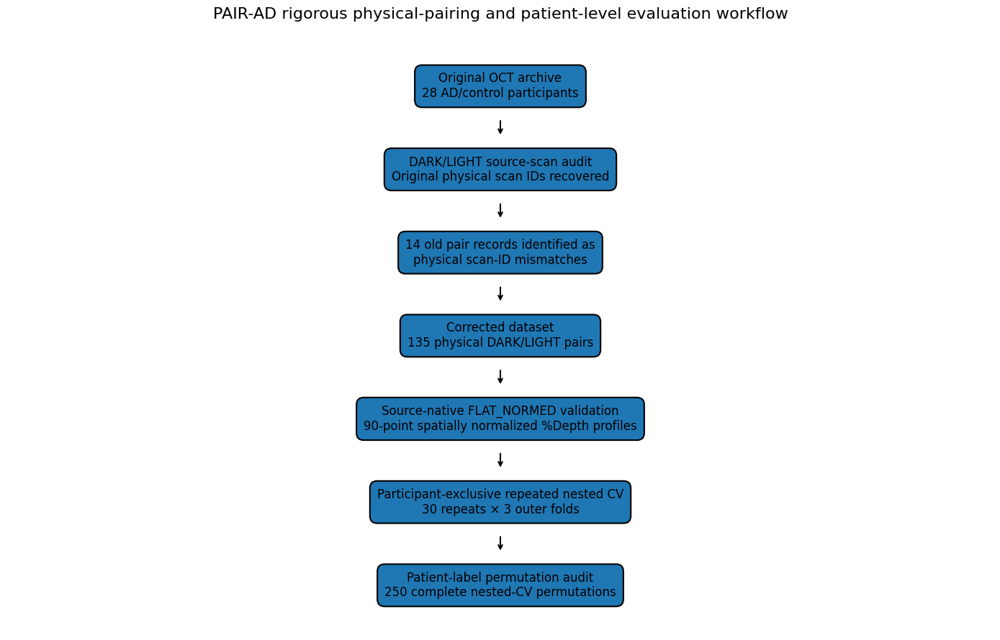

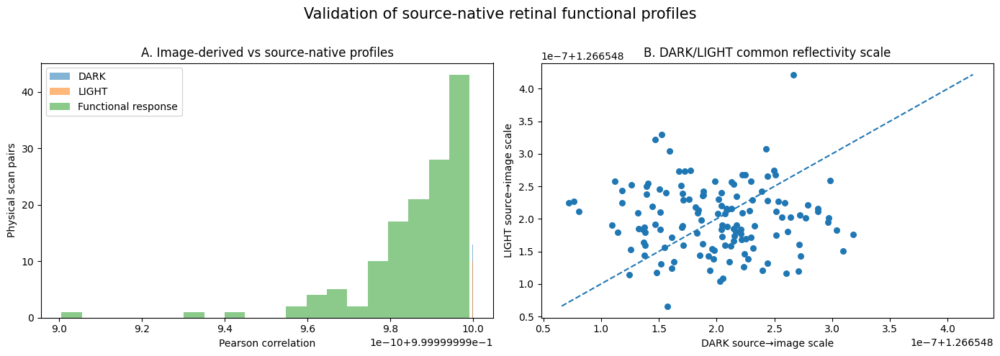

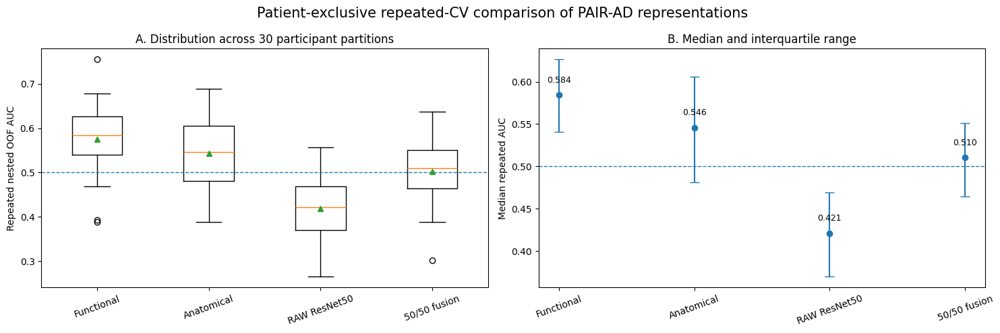

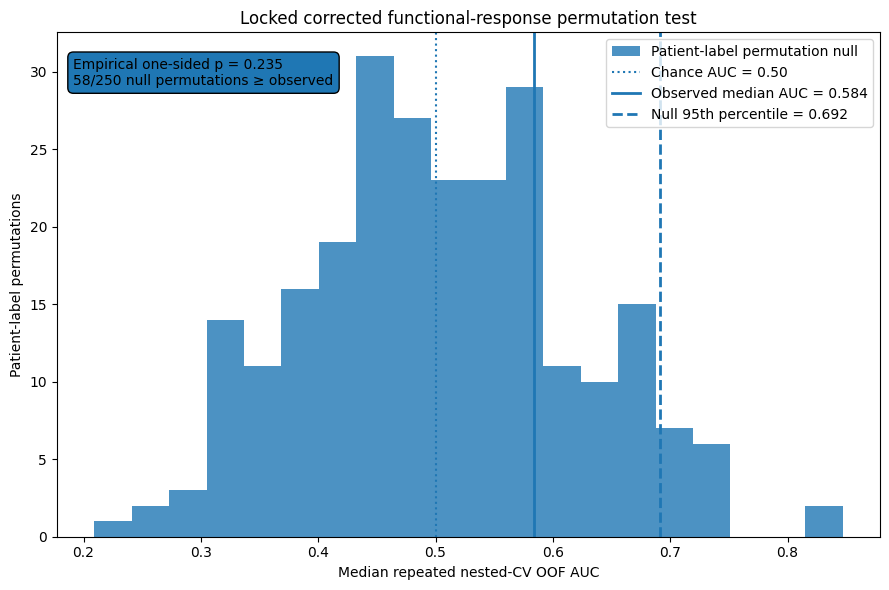

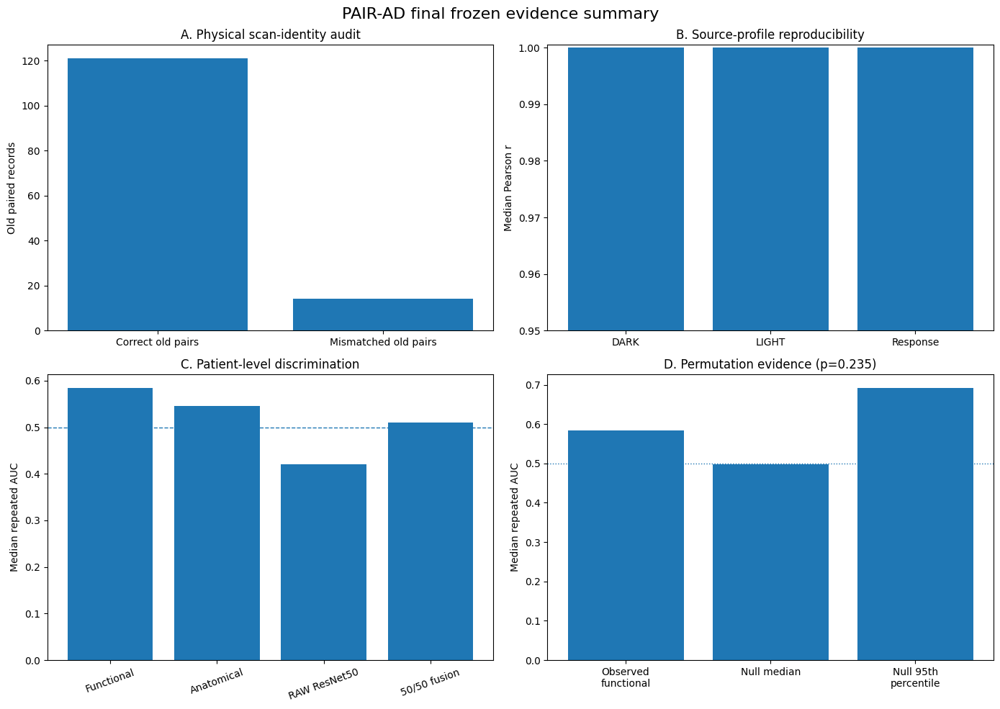


CELL 44 COMPLETE — MANUSCRIPT OUTPUTS GENERATED

Output root:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\MANUSCRIPT_OUTPUTS

TABLES:
  Table 1 — Cohort and physical pairing
  Table 2 — Source-profile validation
  Table 3 — Repeated patient-exclusive performance
  Table 4 — Patient-label permutation analysis
  Table 5 — Final scientific evidence

FIGURES:
  Figure 1 — Study/data-integrity workflow
  Figure 2 — Source-profile validation
  Figure 3 — Repeated-CV model comparison
  Figure 4 — Patient-label permutation test
  Figure 5 — Consolidated frozen evidence

All figures saved as:
  PNG — 600 dpi
  PDF — vector format

Manifest:
D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08\_paper_reproduction\PAIR_AD\MANUSCRIPT_OUTPUTS\PAIR_AD_Manuscript_Output_Manifest.csv

NO MODEL WAS TRAINED.
NO FROZEN RESULT WAS MODIFIED.
NO PERFORMANCE OPTIMIZATION WAS PERFORMED.

SEND ME:
  1. TABLE 1
  2. TABLE 2
  3. TABLE 3
  4. TABLE 4
  5. Figure 1
  6. Figure 2
  7. Figure 3
  8. F

In [55]:
# ==================================================================================================
# CELL 44 — PAIR-AD MANUSCRIPT TABLES + PUBLICATION FIGURES
#
# FINAL FROZEN ANALYSIS
#
# NO TRAINING
# NO MODEL FITTING
# NO HYPERPARAMETER SEARCH
# NO FEATURE ENGINEERING
#
# PURPOSE
# -------
# Convert the frozen Cell-43 evidence into publication-ready:
#
#   Table 1 — Cohort and corrected physical-pair summary
#   Table 2 — Source-profile reconstruction validation
#   Table 3 — Repeated patient-exclusive CV performance
#   Table 4 — Patient-label permutation analysis
#   Table 5 — Final evidence/decision table
#
#   Figure 1 — Study/data-integrity workflow
#   Figure 2 — Source-profile validation
#   Figure 3 — Repeated-CV model comparison
#   Figure 4 — Functional permutation test
#   Figure 5 — Consolidated final evidence figure
#
# All outputs are generated ONLY from previously frozen results.
# ==================================================================================================

from pathlib import Path
import json
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")


# ==================================================================================================
# 1. PATHS
# ==================================================================================================

DATA_ROOT = Path(
    r"D:\Datasets\OCT__FOR_DRYAD_2020-03MAR-08"
)


PAIR_AD_DIR = (
    DATA_ROOT /
    "_paper_reproduction" /
    "PAIR_AD"
)


FREEZE_DIR = (
    PAIR_AD_DIR /
    "FINAL_ANALYSIS_FREEZE"
)


MANUSCRIPT_DIR = (
    PAIR_AD_DIR /
    "MANUSCRIPT_OUTPUTS"
)


TABLE_DIR = (
    MANUSCRIPT_DIR /
    "Tables"
)


FIGURE_DIR = (
    MANUSCRIPT_DIR /
    "Figures"
)


TABLE_DIR.mkdir(
    parents=True,
    exist_ok=True
)


FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# --------------------------------------------------------------------------------------------------
# Frozen Cell-43 outputs
# --------------------------------------------------------------------------------------------------

FINAL_MODEL_SUMMARY = (
    FREEZE_DIR /
    "PAIR_AD_final_model_summary.csv"
)


FINAL_EVIDENCE_TABLE = (
    FREEZE_DIR /
    "PAIR_AD_final_evidence_table.csv"
)


FREEZE_JSON = (
    FREEZE_DIR /
    "PAIR_AD_final_analysis_freeze.json"
)


# --------------------------------------------------------------------------------------------------
# Upstream frozen results
# --------------------------------------------------------------------------------------------------

CORRECTED_PAIR_META = (
    PAIR_AD_DIR /
    "Corrected_Physical_Pairs" /
    "PAIR_AD_highres_256_physical_pairs_CORRECTED.csv"
)


PAIRING_AUDIT = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "PAIR_AD_original_vs_source_scan_pair_audit.csv"
)


PROFILE_AUDIT = (
    PAIR_AD_DIR /
    "Profile_CrossValidation" /
    "PAIR_AD_FLATNORM_source_profile_crossvalidation.csv"
)


SCALING_AUDIT = (
    PAIR_AD_DIR /
    "Profile_CrossValidation" /
    "PAIR_AD_reflectivity_scaling_audit.csv"
)


FUNCTIONAL_REPEAT = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_Split_Stability" /
    "PAIR_AD_functional_repeat_results.csv"
)


ANATOMICAL_REPEAT = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Anatomical_Structural_Stability" /
    "PAIR_AD_anatomical_repeat_results.csv"
)


FUSION_REPEAT = (
    PAIR_AD_DIR /
    "Corrected_Late_Fusion" /
    "PAIR_AD_late_fusion_repeat_results.csv"
)


PERMUTATION_NULL = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_Permutation_Audit" /
    "PAIR_AD_functional_permutation_null.csv"
)


OBSERVED_PERMUTATION_REPEAT = (
    PAIR_AD_DIR /
    "Source_Native_Profiles" /
    "Functional_Permutation_Audit" /
    "PAIR_AD_functional_observed_repeat_AUCs.csv"
)


print("=" * 120)
print("CELL 44 — PAIR-AD MANUSCRIPT TABLES + PUBLICATION FIGURES")
print("=" * 120)


# ==================================================================================================
# 2. VERIFY INPUTS
# ==================================================================================================

required_files = {

    "Final model summary":
        FINAL_MODEL_SUMMARY,

    "Final evidence table":
        FINAL_EVIDENCE_TABLE,

    "Analysis freeze record":
        FREEZE_JSON,

    "Corrected pair metadata":
        CORRECTED_PAIR_META,

    "Physical-pair audit":
        PAIRING_AUDIT,

    "Source-profile audit":
        PROFILE_AUDIT,

    "Scaling audit":
        SCALING_AUDIT,

    "Functional repeated CV":
        FUNCTIONAL_REPEAT,

    "Anatomical repeated CV":
        ANATOMICAL_REPEAT,

    "Fusion repeated CV":
        FUSION_REPEAT,

    "Permutation null":
        PERMUTATION_NULL,

    "Observed permutation repeats":
        OBSERVED_PERMUTATION_REPEAT
}


print("\n" + "=" * 120)
print("FROZEN INPUT VERIFICATION")
print("=" * 120)


for name, path in required_files.items():

    exists = path.exists()

    print(
        f"{name:35s}: "
        f"{'FOUND' if exists else 'MISSING'}"
    )

    if not exists:

        raise FileNotFoundError(
            path
        )


print(
    "\n✓ All manuscript inputs originate from frozen analyses."
)


# ==================================================================================================
# 3. LOAD DATA
# ==================================================================================================

model_summary = pd.read_csv(
    FINAL_MODEL_SUMMARY
)


evidence_table = pd.read_csv(
    FINAL_EVIDENCE_TABLE
)


with open(
    FREEZE_JSON,
    "r",
    encoding="utf-8"
) as f:

    freeze = json.load(
        f
    )


pair_meta = pd.read_csv(
    CORRECTED_PAIR_META
)


pair_audit = pd.read_csv(
    PAIRING_AUDIT
)


profile_audit = pd.read_csv(
    PROFILE_AUDIT
)


scaling_audit = pd.read_csv(
    SCALING_AUDIT
)


functional_repeat = pd.read_csv(
    FUNCTIONAL_REPEAT
)


anatomical_repeat = pd.read_csv(
    ANATOMICAL_REPEAT
)


fusion_repeat = pd.read_csv(
    FUSION_REPEAT
)


permutation_null = pd.read_csv(
    PERMUTATION_NULL
)


observed_repeat = pd.read_csv(
    OBSERVED_PERMUTATION_REPEAT
)


# ==================================================================================================
# 4. CORE COUNTS
# ==================================================================================================

n_participants = pair_meta[
    "folder_subject"
].nunique()


n_ad = pair_meta.loc[
    pair_meta[
        "target"
    ] == 1,
    "folder_subject"
].nunique()


n_control = pair_meta.loc[
    pair_meta[
        "target"
    ] == 0,
    "folder_subject"
].nunique()


n_pairs = len(
    pair_meta
)


pairs_per_patient = (
    pair_meta.groupby(
        "folder_subject"
    )
    .size()
)


n_four_scan_patients = int(
    (
        pairs_per_patient == 4
    ).sum()
)


n_five_scan_patients = int(
    (
        pairs_per_patient == 5
    ).sum()
)


n_old_mismatches = int(
    (
        pair_audit[
            "same_physical_scan"
        ]
        ==
        False
    ).sum()
)


mismatch_participants = int(
    pair_audit.loc[
        pair_audit[
            "same_physical_scan"
        ]
        ==
        False,
        "folder_subject"
    ].nunique()
)


# ==================================================================================================
# 5. TABLE 1 — COHORT + PAIRING
# ==================================================================================================

table1 = pd.DataFrame(
    [
        [
            "Participants",
            n_participants
        ],

        [
            "Alzheimer disease participants",
            n_ad
        ],

        [
            "Control participants",
            n_control
        ],

        [
            "Correct physical DARK/LIGHT scan pairs",
            n_pairs
        ],

        [
            "Participants with 5 valid physical pairs",
            n_five_scan_patients
        ],

        [
            "Participants with 4 valid physical pairs",
            n_four_scan_patients
        ],

        [
            "Old compressed-index pairs with mismatched physical scan IDs",
            n_old_mismatches
        ],

        [
            "Participants affected by old pairing mismatch",
            mismatch_participants
        ]
    ],
    columns=[
        "Characteristic",
        "Value"
    ]
)


TABLE1_PATH = (
    TABLE_DIR /
    "Table1_Cohort_and_Physical_Pairing.csv"
)


table1.to_csv(
    TABLE1_PATH,
    index=False
)


# ==================================================================================================
# 6. TABLE 2 — PROFILE VALIDATION
# ==================================================================================================

table2 = pd.DataFrame(
    [
        [
            "DARK reflectivity profile",
            profile_audit[
                "dark_profile_correlation"
            ].median(),
            profile_audit[
                "dark_profile_correlation"
            ].min(),
            profile_audit[
                "dark_profile_MAE"
            ].median()
        ],

        [
            "LIGHT reflectivity profile",
            profile_audit[
                "light_profile_correlation"
            ].median(),
            profile_audit[
                "light_profile_correlation"
            ].min(),
            profile_audit[
                "light_profile_MAE"
            ].median()
        ],

        [
            "Functional DARK/LIGHT response",
            profile_audit[
                "functional_response_correlation"
            ].median(),
            profile_audit[
                "functional_response_correlation"
            ].min(),
            profile_audit[
                "functional_response_MAE"
            ].median()
        ]
    ],
    columns=[
        "Representation",
        "Median Pearson r",
        "Minimum Pearson r",
        "Median MAE"
    ]
)


TABLE2_PATH = (
    TABLE_DIR /
    "Table2_Source_Profile_Validation.csv"
)


table2.to_csv(
    TABLE2_PATH,
    index=False
)


# ==================================================================================================
# 7. TABLE 3 — REPEATED PATIENT-EXCLUSIVE PERFORMANCE
# ==================================================================================================

table3 = model_summary.copy()


rename_map = {

    "model":
        "Model",

    "mean_AUC":
        "Mean AUC",

    "median_AUC":
        "Median AUC",

    "SD_AUC":
        "SD",

    "Q1_AUC":
        "Q1",

    "Q3_AUC":
        "Q3",

    "fraction_AUC_gt_0.50":
        "Fraction AUC > 0.50",

    "fraction_AUC_gt_0.60":
        "Fraction AUC > 0.60"
}


table3 = table3.rename(
    columns=rename_map
)


TABLE3_PATH = (
    TABLE_DIR /
    "Table3_Repeated_Patient_Exclusive_Performance.csv"
)


table3.to_csv(
    TABLE3_PATH,
    index=False
)


# ==================================================================================================
# 8. TABLE 4 — PERMUTATION TEST
# ==================================================================================================

observed_median_auc = float(
    functional_repeat[
        "auc"
    ].median()
)


null_values = permutation_null[
    "median_repeated_auc"
].values


n_null_ge = int(
    (
        null_values
        >=
        observed_median_auc
    ).sum()
)


empirical_p = (
    1
    +
    n_null_ge
) / (
    len(
        null_values
    )
    +
    1
)


table4 = pd.DataFrame(
    [
        [
            "Observed median repeated nested-CV AUC",
            observed_median_auc
        ],

        [
            "Permutation-null median AUC",
            np.median(
                null_values
            )
        ],

        [
            "Permutation-null SD",
            np.std(
                null_values,
                ddof=1
            )
        ],

        [
            "Permutation-null 95th percentile",
            np.percentile(
                null_values,
                95
            )
        ],

        [
            "Permutation-null 97.5th percentile",
            np.percentile(
                null_values,
                97.5
            )
        ],

        [
            "Null permutations ≥ observed",
            n_null_ge
        ],

        [
            "Total permutations",
            len(
                null_values
            )
        ],

        [
            "Empirical one-sided p-value",
            empirical_p
        ]
    ],
    columns=[
        "Statistic",
        "Value"
    ]
)


TABLE4_PATH = (
    TABLE_DIR /
    "Table4_Functional_Permutation_Test.csv"
)


table4.to_csv(
    TABLE4_PATH,
    index=False
)


# ==================================================================================================
# 9. TABLE 5 — FINAL EVIDENCE
# ==================================================================================================

table5 = evidence_table.copy()


TABLE5_PATH = (
    TABLE_DIR /
    "Table5_Final_Scientific_Evidence.csv"
)


table5.to_csv(
    TABLE5_PATH,
    index=False
)


# ==================================================================================================
# 10. PRINT TABLES
# ==================================================================================================

print("\n" + "=" * 120)
print("TABLE 1 — COHORT AND CORRECTED PHYSICAL PAIRING")
print("=" * 120)

print(
    table1.to_string(
        index=False
    )
)


print("\n" + "=" * 120)
print("TABLE 2 — SOURCE-PROFILE RECONSTRUCTION VALIDATION")
print("=" * 120)

print(
    table2.to_string(
        index=False
    )
)


print("\n" + "=" * 120)
print("TABLE 3 — REPEATED PATIENT-EXCLUSIVE PERFORMANCE")
print("=" * 120)

print(
    table3.to_string(
        index=False
    )
)


print("\n" + "=" * 120)
print("TABLE 4 — PATIENT-LABEL PERMUTATION TEST")
print("=" * 120)

print(
    table4.to_string(
        index=False
    )
)


print("\n" + "=" * 120)
print("TABLE 5 — FINAL SCIENTIFIC EVIDENCE")
print("=" * 120)

print(
    table5.to_string(
        index=False
    )
)


# ==================================================================================================
# 11. FIGURE 1 — STUDY / DATA-INTEGRITY WORKFLOW
# ==================================================================================================

FIG1_PATH = (
    FIGURE_DIR /
    "Figure1_PAIR_AD_Study_Workflow.png"
)


FIG1_PDF = (
    FIGURE_DIR /
    "Figure1_PAIR_AD_Study_Workflow.pdf"
)


fig, ax = plt.subplots(
    figsize=(
        14,
        9
    )
)


ax.axis(
    "off"
)


boxes = [

    (
        0.50,
        0.92,
        "Original OCT archive\n28 AD/control participants"
    ),

    (
        0.50,
        0.78,
        "DARK/LIGHT source-scan audit\nOriginal physical scan IDs recovered"
    ),

    (
        0.50,
        0.64,
        f"{n_old_mismatches} old pair records identified as\nphysical scan-ID mismatches"
    ),

    (
        0.50,
        0.50,
        f"Corrected dataset\n{n_pairs} physical DARK/LIGHT pairs"
    ),

    (
        0.50,
        0.36,
        "Source-native FLAT_NORMED validation\n90-point spatially normalized %Depth profiles"
    ),

    (
        0.50,
        0.22,
        "Participant-exclusive repeated nested CV\n30 repeats × 3 outer folds"
    ),

    (
        0.50,
        0.08,
        "Patient-label permutation audit\n250 complete nested-CV permutations"
    )
]


for x, y_position, text in boxes:

    ax.text(
        x,
        y_position,
        text,
        ha="center",
        va="center",
        fontsize=12,
        transform=ax.transAxes,
        bbox=dict(
            boxstyle="round,pad=0.6",
            linewidth=1.5
        )
    )


for i in range(
    len(
        boxes
    )
    -
    1
):

    ax.annotate(
        "",
        xy=(
            boxes[
                i + 1
            ][
                0
            ],
            boxes[
                i + 1
            ][
                1
            ]
            +
            0.055
        ),
        xytext=(
            boxes[
                i
            ][
                0
            ],
            boxes[
                i
            ][
                1
            ]
            -
            0.055
        ),
        xycoords=ax.transAxes,
        arrowprops=dict(
            arrowstyle="->",
            linewidth=1.5
        )
    )


ax.set_title(
    "PAIR-AD rigorous physical-pairing and patient-level evaluation workflow",
    fontsize=16,
    pad=20
)


plt.tight_layout()


plt.savefig(
    FIG1_PATH,
    dpi=600,
    bbox_inches="tight"
)


plt.savefig(
    FIG1_PDF,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 12. FIGURE 2 — SOURCE PROFILE VALIDATION
# ==================================================================================================

FIG2_PATH = (
    FIGURE_DIR /
    "Figure2_Source_Profile_Validation.png"
)


FIG2_PDF = (
    FIGURE_DIR /
    "Figure2_Source_Profile_Validation.pdf"
)


fig, axes = plt.subplots(
    1,
    2,
    figsize=(
        14,
        5
    )
)


# --------------------------------------------------------------------------------------------------
# Panel A — Correlation distributions
# --------------------------------------------------------------------------------------------------

axes[
    0
].hist(
    profile_audit[
        "dark_profile_correlation"
    ],
    bins=20,
    alpha=0.55,
    label="DARK"
)


axes[
    0
].hist(
    profile_audit[
        "light_profile_correlation"
    ],
    bins=20,
    alpha=0.55,
    label="LIGHT"
)


axes[
    0
].hist(
    profile_audit[
        "functional_response_correlation"
    ],
    bins=20,
    alpha=0.55,
    label="Functional response"
)


axes[
    0
].set_xlabel(
    "Pearson correlation"
)


axes[
    0
].set_ylabel(
    "Physical scan pairs"
)


axes[
    0
].set_title(
    "A. Image-derived vs source-native profiles"
)


axes[
    0
].legend()


# --------------------------------------------------------------------------------------------------
# Panel B — Scale equivalence
# --------------------------------------------------------------------------------------------------

axes[
    1
].scatter(
    scaling_audit[
        "dark_slope"
    ],
    scaling_audit[
        "light_slope"
    ],
    s=30
)


minimum_scale = min(
    scaling_audit[
        "dark_slope"
    ].min(),
    scaling_audit[
        "light_slope"
    ].min()
)


maximum_scale = max(
    scaling_audit[
        "dark_slope"
    ].max(),
    scaling_audit[
        "light_slope"
    ].max()
)


axes[
    1
].plot(
    [
        minimum_scale,
        maximum_scale
    ],
    [
        minimum_scale,
        maximum_scale
    ],
    linestyle="--"
)


axes[
    1
].set_xlabel(
    "DARK source→image scale"
)


axes[
    1
].set_ylabel(
    "LIGHT source→image scale"
)


axes[
    1
].set_title(
    "B. DARK/LIGHT common reflectivity scale"
)


plt.suptitle(
    "Validation of source-native retinal functional profiles",
    fontsize=15
)


plt.tight_layout()


plt.savefig(
    FIG2_PATH,
    dpi=600,
    bbox_inches="tight"
)


plt.savefig(
    FIG2_PDF,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 13. FIGURE 3 — REPEATED PATIENT-LEVEL MODEL COMPARISON
# ==================================================================================================

FIG3_PATH = (
    FIGURE_DIR /
    "Figure3_Repeated_CV_Model_Comparison.png"
)


FIG3_PDF = (
    FIGURE_DIR /
    "Figure3_Repeated_CV_Model_Comparison.pdf"
)


functional_auc = functional_repeat[
    "auc"
].values


anatomical_auc = anatomical_repeat[
    "auc"
].values


structural_auc = fusion_repeat[
    "structural_auc"
].values


late_fusion_auc = fusion_repeat[
    "fusion_auc"
].values


model_auc_data = [
    functional_auc,
    anatomical_auc,
    structural_auc,
    late_fusion_auc
]


model_labels = [
    "Functional",
    "Anatomical",
    "RAW ResNet50",
    "50/50 fusion"
]


fig, axes = plt.subplots(
    1,
    2,
    figsize=(
        15,
        5
    )
)


# --------------------------------------------------------------------------------------------------
# Panel A — boxplots
# --------------------------------------------------------------------------------------------------

axes[
    0
].boxplot(
    model_auc_data,
    labels=model_labels,
    showmeans=True
)


axes[
    0
].axhline(
    0.50,
    linestyle="--",
    linewidth=1
)


axes[
    0
].set_ylabel(
    "Repeated nested OOF AUC"
)


axes[
    0
].set_title(
    "A. Distribution across 30 participant partitions"
)


axes[
    0
].tick_params(
    axis="x",
    rotation=20
)


# --------------------------------------------------------------------------------------------------
# Panel B — medians with IQR
# --------------------------------------------------------------------------------------------------

medians = np.asarray(
    [
        np.median(
            values
        )
        for values in model_auc_data
    ]
)


q1 = np.asarray(
    [
        np.percentile(
            values,
            25
        )
        for values in model_auc_data
    ]
)


q3 = np.asarray(
    [
        np.percentile(
            values,
            75
        )
        for values in model_auc_data
    ]
)


x_positions = np.arange(
    len(
        model_labels
    )
)


axes[
    1
].errorbar(
    x_positions,
    medians,
    yerr=np.vstack(
        [
            medians - q1,
            q3 - medians
        ]
    ),
    fmt="o",
    capsize=5
)


axes[
    1
].axhline(
    0.50,
    linestyle="--",
    linewidth=1
)


axes[
    1
].set_xticks(
    x_positions
)


axes[
    1
].set_xticklabels(
    model_labels,
    rotation=20
)


axes[
    1
].set_ylabel(
    "Median repeated AUC"
)


axes[
    1
].set_title(
    "B. Median and interquartile range"
)


for x_position, median_value in zip(
    x_positions,
    medians
):

    axes[
        1
    ].text(
        x_position,
        median_value + 0.015,
        f"{median_value:.3f}",
        ha="center",
        fontsize=9
    )


plt.suptitle(
    "Patient-exclusive repeated-CV comparison of PAIR-AD representations",
    fontsize=15
)


plt.tight_layout()


plt.savefig(
    FIG3_PATH,
    dpi=600,
    bbox_inches="tight"
)


plt.savefig(
    FIG3_PDF,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 14. FIGURE 4 — PATIENT-LABEL PERMUTATION NULL
# ==================================================================================================

FIG4_PATH = (
    FIGURE_DIR /
    "Figure4_Functional_Permutation_Test.png"
)


FIG4_PDF = (
    FIGURE_DIR /
    "Figure4_Functional_Permutation_Test.pdf"
)


null_95 = float(
    np.percentile(
        null_values,
        95
    )
)


fig, ax = plt.subplots(
    figsize=(
        9,
        6
    )
)


ax.hist(
    null_values,
    bins=20,
    alpha=0.80,
    label="Patient-label permutation null"
)


ax.axvline(
    0.50,
    linestyle=":",
    linewidth=1.5,
    label="Chance AUC = 0.50"
)


ax.axvline(
    observed_median_auc,
    linewidth=2,
    label=(
        f"Observed median AUC = "
        f"{observed_median_auc:.3f}"
    )
)


ax.axvline(
    null_95,
    linestyle="--",
    linewidth=2,
    label=(
        f"Null 95th percentile = "
        f"{null_95:.3f}"
    )
)


ax.set_xlabel(
    "Median repeated nested-CV OOF AUC"
)


ax.set_ylabel(
    "Patient-label permutations"
)


ax.set_title(
    "Locked corrected functional-response permutation test"
)


ax.legend()


ax.text(
    0.02,
    0.95,
    (
        f"Empirical one-sided p = {empirical_p:.3f}\n"
        f"{n_null_ge}/{len(null_values)} null permutations ≥ observed"
    ),
    transform=ax.transAxes,
    va="top",
    bbox=dict(
        boxstyle="round,pad=0.4"
    )
)


plt.tight_layout()


plt.savefig(
    FIG4_PATH,
    dpi=600,
    bbox_inches="tight"
)


plt.savefig(
    FIG4_PDF,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 15. FIGURE 5 — CONSOLIDATED FINAL EVIDENCE
# ==================================================================================================

FIG5_PATH = (
    FIGURE_DIR /
    "Figure5_Final_Evidence_Summary.png"
)


FIG5_PDF = (
    FIGURE_DIR /
    "Figure5_Final_Evidence_Summary.pdf"
)


fig, axes = plt.subplots(
    2,
    2,
    figsize=(
        14,
        10
    )
)


# --------------------------------------------------------------------------------------------------
# Panel A — pairing audit
# --------------------------------------------------------------------------------------------------

axes[
    0,
    0
].bar(
    [
        "Correct old pairs",
        "Mismatched old pairs"
    ],
    [
        len(
            pair_audit
        )
        -
        n_old_mismatches,
        n_old_mismatches
    ]
)


axes[
    0,
    0
].set_ylabel(
    "Old paired records"
)


axes[
    0,
    0
].set_title(
    "A. Physical scan-identity audit"
)


# --------------------------------------------------------------------------------------------------
# Panel B — profile validation
# --------------------------------------------------------------------------------------------------

validation_values = [
    profile_audit[
        "dark_profile_correlation"
    ].median(),

    profile_audit[
        "light_profile_correlation"
    ].median(),

    profile_audit[
        "functional_response_correlation"
    ].median()
]


axes[
    0,
    1
].bar(
    [
        "DARK",
        "LIGHT",
        "Response"
    ],
    validation_values
)


axes[
    0,
    1
].set_ylim(
    0.95,
    1.0005
)


axes[
    0,
    1
].set_ylabel(
    "Median Pearson r"
)


axes[
    0,
    1
].set_title(
    "B. Source-profile reproducibility"
)


# --------------------------------------------------------------------------------------------------
# Panel C — model medians
# --------------------------------------------------------------------------------------------------

axes[
    1,
    0
].bar(
    model_labels,
    medians
)


axes[
    1,
    0
].axhline(
    0.50,
    linestyle="--",
    linewidth=1
)


axes[
    1,
    0
].set_ylabel(
    "Median repeated AUC"
)


axes[
    1,
    0
].set_title(
    "C. Patient-level discrimination"
)


axes[
    1,
    0
].tick_params(
    axis="x",
    rotation=20
)


# --------------------------------------------------------------------------------------------------
# Panel D — permutation comparison
# --------------------------------------------------------------------------------------------------

axes[
    1,
    1
].bar(
    [
        "Observed\nfunctional",
        "Null median",
        "Null 95th\npercentile"
    ],
    [
        observed_median_auc,
        np.median(
            null_values
        ),
        null_95
    ]
)


axes[
    1,
    1
].axhline(
    0.50,
    linestyle=":",
    linewidth=1
)


axes[
    1,
    1
].set_ylabel(
    "Median repeated AUC"
)


axes[
    1,
    1
].set_title(
    f"D. Permutation evidence (p={empirical_p:.3f})"
)


plt.suptitle(
    "PAIR-AD final frozen evidence summary",
    fontsize=16
)


plt.tight_layout()


plt.savefig(
    FIG5_PATH,
    dpi=600,
    bbox_inches="tight"
)


plt.savefig(
    FIG5_PDF,
    bbox_inches="tight"
)


plt.show()


# ==================================================================================================
# 16. MANUSCRIPT-READY NUMERICAL SUMMARY
# ==================================================================================================

SUMMARY_TXT = (
    MANUSCRIPT_DIR /
    "PAIR_AD_Manuscript_Numerical_Summary.txt"
)


with open(
    SUMMARY_TXT,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PAIR-AD — FROZEN MANUSCRIPT NUMERICAL SUMMARY\n"
    )

    f.write(
        "=" * 100
        +
        "\n\n"
    )

    f.write(
        "COHORT\n"
    )

    f.write(
        f"Participants: {n_participants}\n"
    )

    f.write(
        f"AD: {n_ad}\n"
    )

    f.write(
        f"Control: {n_control}\n"
    )

    f.write(
        f"Correct physical DARK/LIGHT scan pairs: {n_pairs}\n"
    )

    f.write(
        f"Old physically mismatched pair records: {n_old_mismatches}\n"
    )

    f.write(
        f"Participants affected by mismatch: {mismatch_participants}\n\n"
    )


    f.write(
        "SOURCE-PROFILE VALIDATION\n"
    )

    f.write(
        f"DARK median r: "
        f"{profile_audit['dark_profile_correlation'].median():.12f}\n"
    )

    f.write(
        f"LIGHT median r: "
        f"{profile_audit['light_profile_correlation'].median():.12f}\n"
    )

    f.write(
        f"Functional response median r: "
        f"{profile_audit['functional_response_correlation'].median():.12f}\n"
    )

    f.write(
        f"Functional response median MAE: "
        f"{profile_audit['functional_response_MAE'].median():.12e}\n\n"
    )


    f.write(
        "REPEATED PATIENT-EXCLUSIVE CV\n"
    )

    for label, values in zip(
        model_labels,
        model_auc_data
    ):

        f.write(
            f"{label}: "
            f"mean={np.mean(values):.4f}, "
            f"median={np.median(values):.4f}, "
            f"SD={np.std(values, ddof=1):.4f}, "
            f"Q1={np.percentile(values,25):.4f}, "
            f"Q3={np.percentile(values,75):.4f}\n"
        )


    f.write(
        "\nPERMUTATION TEST\n"
    )

    f.write(
        f"Observed functional median repeated AUC: "
        f"{observed_median_auc:.6f}\n"
    )

    f.write(
        f"Null median: "
        f"{np.median(null_values):.6f}\n"
    )

    f.write(
        f"Null 95th percentile: "
        f"{null_95:.6f}\n"
    )

    f.write(
        f"Empirical one-sided p: "
        f"{empirical_p:.6f}\n"
    )

    f.write(
        f"Null permutations >= observed: "
        f"{n_null_ge}/{len(null_values)}\n\n"
    )


    f.write(
        "FINAL INTERPRETATION\n"
    )

    f.write(
        "Physical DARK/LIGHT correspondence and source-native "
        "functional-profile reconstruction were strongly validated. "
        "However, reliable patient-level Alzheimer discrimination "
        "was not demonstrated in the current 28-participant cohort.\n"
    )


# ==================================================================================================
# 17. OUTPUT MANIFEST
# ==================================================================================================

manifest = pd.DataFrame(
    [
        [
            "Table 1",
            str(
                TABLE1_PATH
            )
        ],

        [
            "Table 2",
            str(
                TABLE2_PATH
            )
        ],

        [
            "Table 3",
            str(
                TABLE3_PATH
            )
        ],

        [
            "Table 4",
            str(
                TABLE4_PATH
            )
        ],

        [
            "Table 5",
            str(
                TABLE5_PATH
            )
        ],

        [
            "Figure 1",
            str(
                FIG1_PATH
            )
        ],

        [
            "Figure 2",
            str(
                FIG2_PATH
            )
        ],

        [
            "Figure 3",
            str(
                FIG3_PATH
            )
        ],

        [
            "Figure 4",
            str(
                FIG4_PATH
            )
        ],

        [
            "Figure 5",
            str(
                FIG5_PATH
            )
        ],

        [
            "Numerical summary",
            str(
                SUMMARY_TXT
            )
        ]
    ],
    columns=[
        "Artifact",
        "Path"
    ]
)


MANIFEST_PATH = (
    MANUSCRIPT_DIR /
    "PAIR_AD_Manuscript_Output_Manifest.csv"
)


manifest.to_csv(
    MANIFEST_PATH,
    index=False
)


# ==================================================================================================
# 18. FINAL
# ==================================================================================================

print("\n" + "=" * 120)
print("CELL 44 COMPLETE — MANUSCRIPT OUTPUTS GENERATED")
print("=" * 120)


print(
    "\nOutput root:"
)

print(
    MANUSCRIPT_DIR
)


print(
    "\nTABLES:"
)

print(
    "  Table 1 — Cohort and physical pairing"
)

print(
    "  Table 2 — Source-profile validation"
)

print(
    "  Table 3 — Repeated patient-exclusive performance"
)

print(
    "  Table 4 — Patient-label permutation analysis"
)

print(
    "  Table 5 — Final scientific evidence"
)


print(
    "\nFIGURES:"
)

print(
    "  Figure 1 — Study/data-integrity workflow"
)

print(
    "  Figure 2 — Source-profile validation"
)

print(
    "  Figure 3 — Repeated-CV model comparison"
)

print(
    "  Figure 4 — Patient-label permutation test"
)

print(
    "  Figure 5 — Consolidated frozen evidence"
)


print(
    "\nAll figures saved as:"
)

print(
    "  PNG — 600 dpi"
)

print(
    "  PDF — vector format"
)


print(
    "\nManifest:"
)

print(
    MANIFEST_PATH
)


print(
    "\nNO MODEL WAS TRAINED."
)

print(
    "NO FROZEN RESULT WAS MODIFIED."
)

print(
    "NO PERFORMANCE OPTIMIZATION WAS PERFORMED."
)


print(
    "\nSEND ME:"
)

print(
    "  1. TABLE 1"
)

print(
    "  2. TABLE 2"
)

print(
    "  3. TABLE 3"
)

print(
    "  4. TABLE 4"
)

print(
    "  5. Figure 1"
)

print(
    "  6. Figure 2"
)

print(
    "  7. Figure 3"
)

print(
    "  8. Figure 4"
)

print(
    "  9. Figure 5"
)